In [1]:
from disease import Disease, StringAPI
import requests
from scipy.stats import ttest_ind
import matplotlib.pyplot as plt
import pandas as pd
import json
import numpy as np
import random


In [8]:
def compute_clustering(diseases, filename, api):
    output = []
    not_included_outputs = []
    for d in diseases:
        disease = Disease(d['name'], d['efoID'], api)
        try:
            genes = disease.get_genes()
            if len(genes) > 2000:
                not_included_outputs.append({'name' : d['name'], 'efoID' : d['efoID']})
            else:
                result = disease.run()
            if result is None:
                not_included_outputs.append({'name' : d['name'], 'efoID' : d['efoID']})
            else:
                num_edges, pvalue, z_score, p_val_emp = result
                output.append({'name' : d['name'], 'efoID' : d['efoID'], 'num_edges' : num_edges, 'z_score' : z_score, 
                                'pvalue': pvalue, 'p_empirical': p_val_emp, 'normal': disease.normal})
        except Exception as e:
            print(f"Error processing {d['name']}: {e}")
    df = pd.DataFrame(output)
    df.to_csv(filename)
    return output, not_included_outputs

In [3]:
with open("data/allCancers.txt", "r") as file:
    cancers = []
    for line in file:
        id, name = line.strip().split('\t')
        cancers.append({'efoID' : id.replace(":", "_"), 'name' : name})
print(len(cancers))

135


In [5]:
with open("data/allNonCancers.txt", "r") as file:
    noncancers = []
    for line in file:
        id, name = line.strip().split('\t')
        noncancers.append({'efoID' : id.replace(":", "_"), 'name' : name})
print(len(noncancers))

1468


Genes mapped to basal cell carcinoma: 
basal cell carcinoma EFO_0004193
Genes mapped to basal cell carcinoma: 
['TMCC3', 'KRT19P2', 'GRXCR1', 'LINC02383', 'CSMD1', 'DTNBP1', 'ARPC3P5', 'NACA2', 'BRIP1', 'PALD1', 'FTH1P5', 'TIAL1P1', 'PARD6B', 'BCAS4', 'ST3GAL6', 'AS1', 'DHX35', 'LINC01734', 'TSPYL5', 'SNORD3H', 'COLEC10', 'CTLA4', 'ICOS', 'SCAF1', 'RPS18P8', 'RPP40', 'LINC00570', 'BRCA2', 'EFEMP2', 'FRMD4A', 'RBMS1', 'RN7SL423P', 'EXO1', 'CCDC88B', 'LINC02929', 'SPMIP7', 'SMC2', 'PPARGC1B', 'TICAM1', 'PLIN3', 'LINC02889', 'SNX13', 'HAUS6', 'FGF10', 'STN1', 'CYP1B1', 'CASC15', 'HERC2', 'CTSH', 'PCSEAT', 'LINC00111', 'LINC', 'PINT', 'LINC00513', 'BNC2', 'RN7SL720P', 'CDKN2B', 'JDP2', 'CLPTM1L', 'HLA', 'DRB1', 'DQA1', 'TYR', 'RCC2', 'RHOU', 'LINC02814', 'KRT5', 'LINC02973', 'RNU6ATAC37P', 'RALY', 'CPVL', 'MC1R', 'IRF4', 'ZFHX4', 'LINC02676', 'RGS22', 'RNU6', '1213P', 'Y_RNA', 'MYL10', 'CUX1', 'RNASET2', 'MIR3939', 'TGM3', 'TP53', 'FLACC1', 'CASP8', 'SLC45A2', 'GACAT3', 'CYRIA', 'FOXP1', '

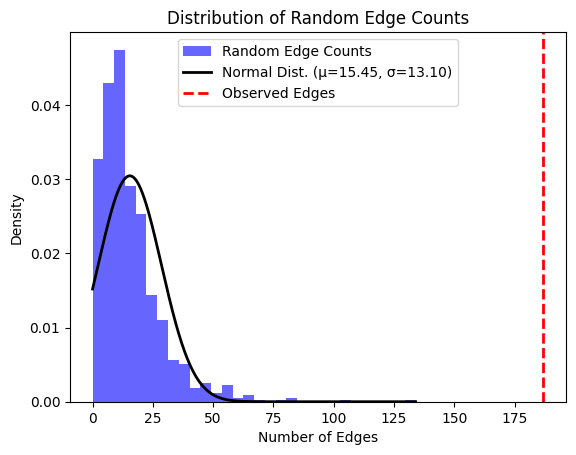

Genes mapped to squamous cell carcinoma: 
squamous cell carcinoma EFO_0000707
Genes mapped to squamous cell carcinoma: 
['SLC45A2', 'ANKRD11', 'RPS18P8', 'RPP40', 'MICA', 'LINC01149', 'LPP', 'BRCA2', 'CASP8', 'FLACC1', 'TRPS1', 'UBAC2', 'CCR12P', 'DTNBP1', 'HERC2', 'SEC16A', 'BACH2', 'BNC2', 'RN7SL720P', 'HLA', 'DRB1', 'DQA1', 'KRT5', 'TYR', 'OCA2', 'TPM3P2', 'PIGPP3', 'MC1R', 'IRF4', 'CHEK2', 'DEF8', 'PRKN', 'SRC', 'ST3GAL1', 'ERBIN', 'DNAH11', 'LRFN2', 'RALY', 'FOXP1', 'TPRG1', 'TP63', 'SPATA33', 'AHR', 'CPVL', 'AUTS2', 'GALNT17', 'FRMPD1', 'WEE1', 'RMST', 'URB1', 'ALK', 'STING1', 'NCOA4P4', 'DQB1', 'MTCO3P1', 'CYP1B1', 'TIPARP', 'AS1', 'ADAMTS12', 'RXFP3', 'PPARGC1B', 'DUSP22', 'LURAP1L', 'CDKN2B', 'LINC02674', 'RAB11FIP2', 'TPCN2', 'NOX4', 'SUOX', 'IKZF4', 'HAL', 'ATP11A', 'MARK3', 'FRMD5', 'GAS8', 'TGM3', 'EPB41L1', 'RCC2', 'SLC6A17', 'CTSS', 'CTSK', 'EML6', 'ENPP6', 'RNF39', 'TRIM31', 'SUMO2P1', 'MOG', 'POLR1HASP', 'G', 'ZNF143']
Random edges calculation completed

z score: 5.391

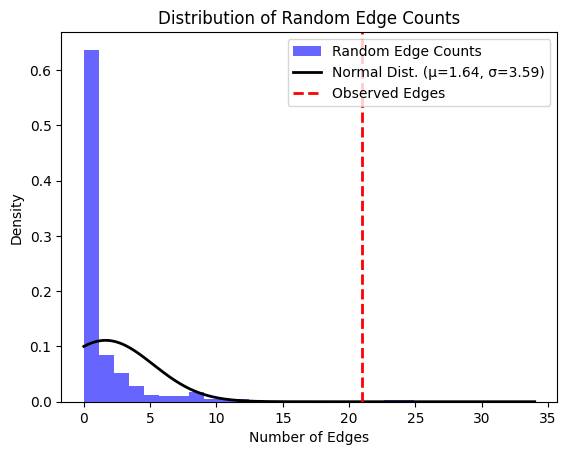

Genes mapped to keratinocyte carcinoma: 
keratinocyte carcinoma EFO_0010176
Genes mapped to keratinocyte carcinoma: 
['RAET1L', 'RAET1M', 'PIK3R1', 'LINC02198', 'TRPS1', 'DHX35', 'LINC01734', 'LINC00570', 'STN1', 'CTSH', 'TP53', 'RALY', 'CPVL', 'LINC02973', 'RNU6ATAC37P', 'LINC02676', 'BNC2', 'SLC6A17', 'HLA', 'DRB1', 'DQA1', 'STRN', 'LINC', 'PINT', 'LINC00513', 'HERC2', 'PHTF1', 'RSBN1', 'COLEC10', 'CDKN2B', 'AS1', 'ATP11A', 'KRT5', 'CLPTM1L', 'BRCA2', 'EXO1', 'RHOU', 'LINC02814', 'THNSL2', 'MRPL45P1', 'TGM3', 'CEP43', 'CCR6', 'LINC02889', 'SNX13', 'MC1R', 'UBAC2', 'CCR12P', 'ZFHX4', 'TERT', 'IRF4', 'SLC45A2', 'FGF10', 'KANK1', 'HAUS6', 'EPB41L1', 'TYR', 'RCC2', 'CASP8', 'FLACC1', 'RGS22', 'GACAT3', 'CYRIA', 'ANKRD11', 'GOLPH3L', 'FOXP1', 'RNU6', '1213P', 'Y_RNA', 'MICA', 'LINC01149', 'JDP2', 'LPP', 'PCSEAT', 'LINC00111', 'FANCA', 'ZNF276', 'PARD6B', 'BCAS4', 'ZBTB7B', 'CTLA4', 'PPARGC1B', 'RPS18P8', 'RPP40', 'LINC02571', 'B', 'LINC02929', 'TICAM1', 'PLIN3', 'LINC03086', '649P', 'LINC

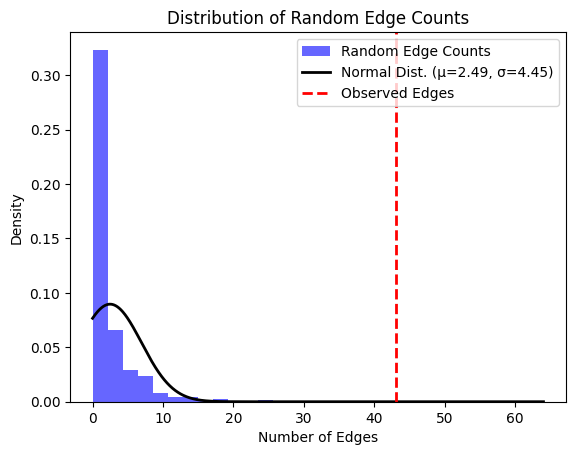

Genes mapped to cutaneous melanoma: 
cutaneous melanoma EFO_0000389
Genes mapped to cutaneous melanoma: 
['RNA5SP293', 'RPS15AP27', 'TYR', 'GPRC5A', 'MTAP', 'FMN1', 'FTO', 'RNU6', '637P', 'TERC', 'PLA2G6', 'LINC01505', 'AHR', 'TTC7B', 'SYNE2', 'PPARGC1B', 'PARP1', 'RPS3AP7', 'NFIC', 'CLPTM1L', 'MX2', 'TASOR2', 'CYP1B1', 'AS1', 'LINC01488', 'CCND1', 'HDAC4', 'PIGU', 'DOCK8', 'ARNT', 'C11orf65', 'ATM', 'FANCA', 'CASP8', 'FLACC1', 'LINC02780', 'MAGI3', 'EEF1AKMT1', 'XPO4', 'ACSL1', 'DLGAP4', 'Y_RNA', 'SMLR1', 'HSD17B12', 'SNX29', 'CPPED1', 'CHODL', 'UGT1A9', 'UGT1A6', 'UGT1A10', 'UGT1A7', 'UGT1A8', 'ARHGAP24', 'ANXA9', 'STN1', 'SLK', 'SPIRE2', 'HLA', 'DRB1', 'DQA1', 'AQP3', 'NOL6', 'MYNN', '921P', 'ZFP36L1', 'MITF', 'MC1R', 'HERC2', 'MED13L', 'CDKAL1', 'DCST2', 'RTEL1', 'TNFRSF6B', 'DQB2', 'DOB', 'RALY', 'CDKN2A', 'CDKN2B', 'ATP11A', 'POU2F3', 'TLCD5', 'LINC01622', 'FOXQ1', 'RAPGEF1', 'SOX6', 'TERT', 'MIR4457', 'KIAA0930', 'ZNG1A', 'ADD3', 'SLC45A2', 'SPATA33', 'CDK10', 'TEKTIP1', 'MFSD12

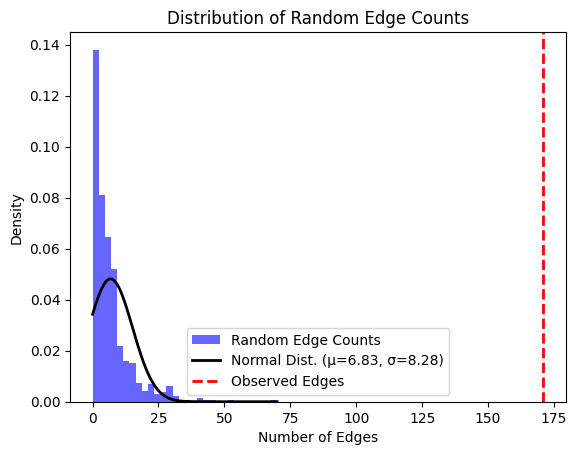

Genes mapped to colorectal cancer: 
colorectal cancer MONDO_0005575
Genes mapped to colorectal cancer: 
['TERT', 'MIR4457', 'RNU1', '150P', 'TTC33', 'LAMC1', 'LINC01705', 'TMBIM1', 'PNKD', 'RPS27P4', 'MRPS31P1', 'LRIG1', 'LINC00536', 'EIF3H', 'POU5F1B', 'CASC8', 'CCAT2', 'PCAT1', 'RNA5SP299', 'LINC02676', 'ZMIZ1', 'AS1', 'NKX2', '3', 'SLC25A28', 'FADS2', 'POLD3', 'POU2AF3', 'COLCA1', 'CCND2', 'ATXN2', 'SH2B3', 'NOS1', 'DDHD1', 'DT', 'MIR5580', 'LINC01500', 'GREM1', 'CDH1', 'SMAD7', 'RHPN2', 'FGFR3P3', 'CASC20', 'LINC01713', 'PREX1', 'CABLES2', 'KLHL18', 'PTPN23', 'DUSP4', 'LINC02948', 'CFAP418', 'SCG5', 'NABP1', 'TBX3', 'CCDC190', 'ATOH1', 'SMARCAD1', 'DCBLD1', 'GSDMC', 'CYRIB', 'LAMA5', 'MYNN', 'DIP2B', 'ATF1', '88P', 'Y_RNA', 'GPR143', 'TPH2', 'x', 'KRT18P42', 'MAN2A1', 'MIR4291', 'BARX1', 'SYNJ2', 'OSBPL3', 'CYCS', 'RPS23P3', 'RNU6', '699P', 'LARP4', 'SALL4P5', 'RPL24P7', 'LINC00681', 'TRMT9B', 'SUCLA2', 'RAD54L2P1', 'LINC01785', 'PNMA8A', 'MORC1', 'DPP6', 'C3orf85', 'GATA3', 'LINC0

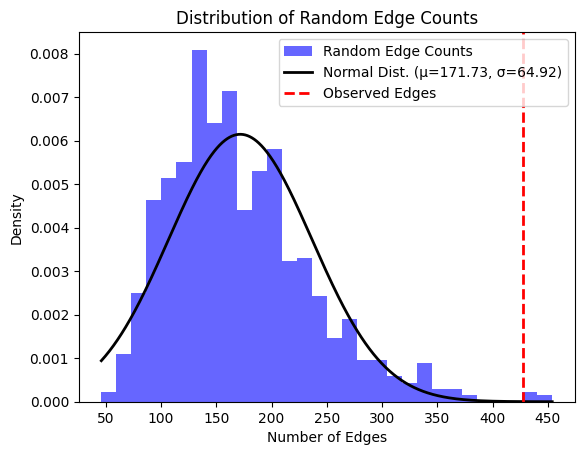

Genes mapped to prostate carcinoma: 
prostate carcinoma EFO_0001663
Genes mapped to prostate carcinoma: 
['HNF1B', 'LINC01169', 'APOLD1', 'THADA', 'LINC00595', 'ATP2B1', 'AS1', 'TERT', 'WDR11', 'RPL19P16', 'KLK15', 'KLK3', 'KLK2', 'PCAT1', 'ITGA6', 'WDPCP', 'SUN2', 'RFX6', 'KRT8P25', 'APOOP2', 'LINC00506', 'CTD', '2194D22.4', 'FOXP4', 'JAZF1', 'CASC8', 'CASC11', 'CASC19', 'SINHCAFP3', 'NKX3', '1', 'POU5F1B', 'CCAT2', 'MSMB', 'RNU6', '66P', 'RNU4', '10P', 'ZGPAT', 'LINC02782', 'MIR4689', 'TMEM17', 'RPL21P37', 'GATA2', 'ZMIZ1', 'SLC52A3', 'WNK3', 'TSR2', 'PRNCR1', 'LDAH', 'PCAT19', 'FAM83F', 'ZNF652', 'LINC01162', 'SMIM38', 'MYEOV', 'SLC22A1', 'SLC22A2', 'PDLIM5', '351P', 'TET2', 'MIR4686', 'ASCL2', 'RPS25P10', 'BIK', 'EZHIP', 'NUDT11', 'OTX1', 'RPL27P5', 'LMTK2', 'RPL23AP61', 'AGAP7P', 'CASC17', 'LINC01756', 'LINC01648', 'x', 'SPINT2', 'HIGD1AP18', 'PKIA', 'DAB2IP', 'UPF2', 'OR8S21P', 'DNAH12', 'BAIAP2L1', 'CTBP2', 'RNASE9', 'OR7E108P', 'SYK', 'DMAC1', 'PTPRD', 'ATP5MGP2', 'CLVS2', 'CWC

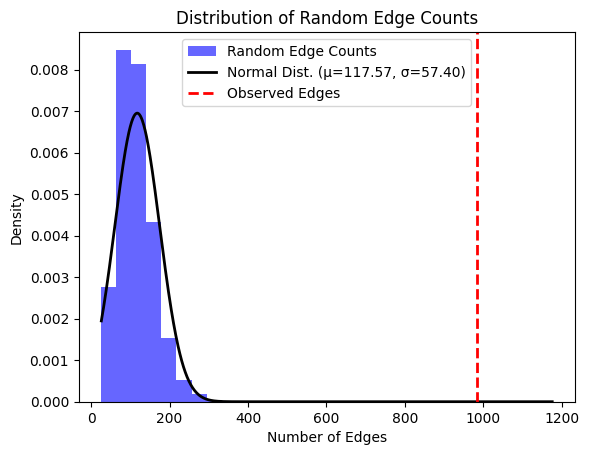

Genes mapped to cervical carcinoma: 
cervical carcinoma EFO_0001061
Genes mapped to cervical carcinoma: 
['TCF7L1', 'LUCAT1', 'ADGRV1', 'LINC01445', 'HLA', 'DPA3', 'ZPBP2', 'GSDMB', 'MICA', 'LINC01149', 'DQA1', 'DPB2', 'TMEM233', 'LINC00540', 'LINC00460', 'RPL35P9', 'TTC5', 'TEP1', 'LRFN5', 'MEG9', 'RBFOX1', 'SOX9', 'AS1', 'LINC02097', 'RN7SL836P', 'GIPR', 'HAS1', 'FPR1', 'RASSF2', 'NPBWR2', 'MYT1', 'G', 'RNF39', 'LINC00243', 'NAPGP2', 'MUC21', 'HCG27', 'C', 'LINC02571', 'B', 'MSH5', 'SAPCD1', 'STK19', 'TNXB', 'NOTCH4', 'TSBP1', 'DRB1', 'MTCO3P1', 'DQB3', 'Z', 'DMB', 'COL11A2P1', 'RN7SL564P', 'FABP7', 'ATXN7L1', 'EXOC4', 'RPS3AP27', 'TNKS', 'MIR124', '1HG', 'CHCHD7', 'SDR16C5', 'PCA3', 'PRUNE2', 'PTBP3', 'TRDMT1', 'INS', 'IGF2', 'TMTC1', 'E', 'LINC02569', 'TUBB', 'FCRL4', 'DDR2', 'NPM1P48', 'LINC01249', 'NRXN1', 'ALMS1', 'PRPS1P1', 'CYP2C56P', 'FSIP2', 'NYAP2', 'MIR5702', 'HDAC11', 'FBLN2', 'P3H2', 'ZFYVE28', 'CAMK2D', 'TTC29', 'ZSCAN16', 'ZKSCAN3', 'ZSCAN31', 'OR2E1P', 'GPX6', 'COX8CP

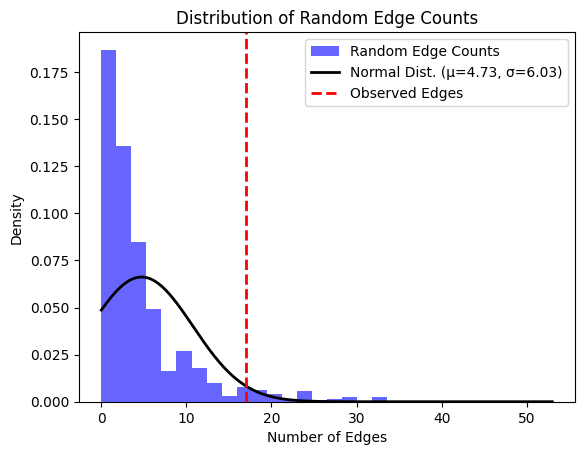

Genes mapped to Uveal Melanoma: 
Uveal Melanoma EFO_1000616
Genes mapped to Uveal Melanoma: 
['LRP1B', 'MOGAT1', 'LSM3', 'LINC01267', 'FTH1P21', 'LINC02272', 'RN7SL554P', 'RREB1', 'GFRA1', 'ACTR6', 'DEPDC4', 'TDP1', 'GNB5', 'RPL12P40', 'RN7SKP182', 'LINC01991', 'LPP', 'AS2', 'SGPL1', 'UNC5B', 'AP2B1', 'RFX3', 'DT', 'DYNAP', 'RAB27B', 'FABP1', 'THNSL2', 'KCNJ3', 'BRINP1', 'LINC01613', 'PRELID3A', 'ARL6IP6', 'UBQLN4P2', 'STAP1', 'CACNA2D1', 'CLPTM1L', 'OCA2', 'HERC2', 'IRF4', 'RN7SKP93', 'MGAT5', 'LINC01957', 'TRIM36', 'ADAMTSL1', 'CORO2A', 'RPS3AP5', 'LINC01519', 'LINC02744', 'TRIM29', 'RPP40P2', 'RNU7', '88P', 'DSEL', 'AS1', 'PTCHD1', 'AS']
Random edges calculation completed

z score: 5.023689535904942



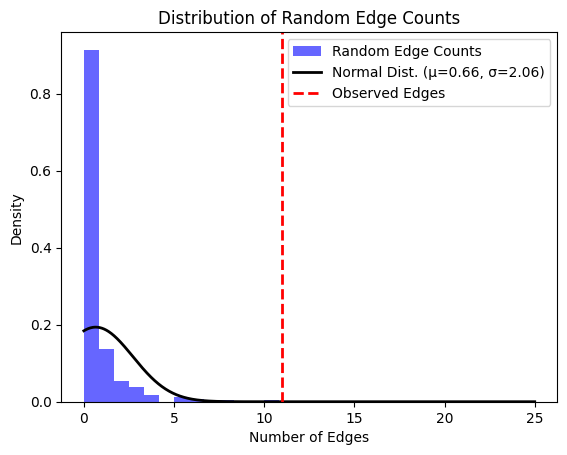

Genes mapped to choroidal melanoma: 
choroidal melanoma EFO_0009093
Genes mapped to choroidal melanoma: 
['DDR2', 'LSM3', 'LINC01267', 'MIER3', 'RLIG1P1', 'LINC02674', 'RAB11FIP2', 'TDP1', 'LDLRAD4']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to Epithelioid Cell Uveal Melanoma: 
Epithelioid Cell Uveal Melanoma EFO_1000244
Genes mapped to Epithelioid Cell Uveal Melanoma: 
['VRK2', 'GAPDHP56', 'RNU6', '224P', 'XPO4', 'TDP1', 'STARD4', 'AS1', 'DGKI', 'PSIP1P1', '559P', 'OR1L8', 'OR1H1P']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to uveal melanoma disease severity: 
uveal melanoma disease severity EFO_0010244
Genes mapped to uveal melanoma disease severity: 
['DNAI3', 'MAGI1', 'BDH1', 'STAP1', 'WDR70']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to malignant epithelial tumor of ovary: 
malignant epithelial tumor of ovary MONDO_0018364
Genes mapped to mal

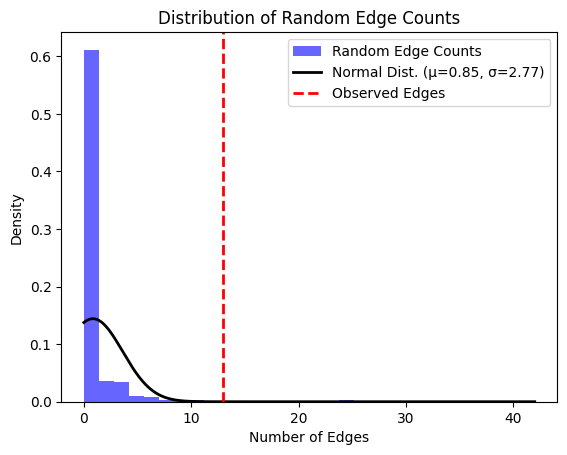

Genes mapped to family history of lung cancer: 
family history of lung cancer EFO_0006953
Genes mapped to family history of lung cancer: 
['TMEM218', 'RNU6', '675P', 'TEX51', 'TUB', 'Y_RNA', 'RERGL', 'RN7SL569P', 'RNY4', 'LINC02945', 'LCORL', 'H3P30', 'KHSRPP1', 'CENPP', 'ESM1', 'DCLK1', 'FAM169A', 'AS1', 'RPL27AP5', 'LINC02996', 'FGFR3P3', 'CASC20', 'IFNAR2', 'DCUN1D4', 'THRB', 'ZSCAN9', 'ZKSCAN4', 'PTCSC2', 'NALF1', 'LINC02934', 'LINC03050', 'GHR', 'IL1RL2', 'CFAP144P2', 'ITLN1', 'ITLN2', 'NF1', 'BTBD9', 'PC', 'WWOX', 'TMEM97P2', 'LINC03023', 'NBAS', 'CHCHD6', 'EZH2', 'TMEM221', 'SPDYE4', 'MFSD6L', 'SLC22A2', 'SLC22A3', 'PLD5', 'SPATA18', '1252P', 'DLG2', 'MTHFD2P6', 'MSANTD3', 'TMEFF1', 'RPS12P15', 'LINC03047', 'LINC01630', 'RPS8P3', 'GALNTL6', 'GPD2', 'LRP11', 'NPAS3', 'GRB10', 'COBL', 'LINC01891', 'LMCD1', 'FBXL7', 'RNA5SP178', 'SAMD5', 'SASH1', 'C1D', 'FOXP1', 'STIM2', 'LINC02261', '788P', 'UBE2E1', 'NTM', 'AKR1B10', 'ROBO2', 'MALRD1', 'NAALADL2', 'MIR3974', 'TMEM250', 'LHX3', 'S

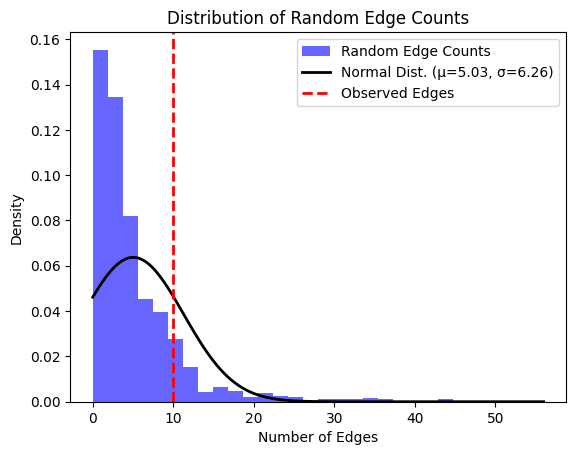

Genes mapped to pancreatic carcinoma: 
pancreatic carcinoma EFO_0002618
Genes mapped to pancreatic carcinoma: 
['AGT', 'PRMT5P1', 'EDNRA', 'PNMT', 'SEC11C', 'GRP', 'HNF1A', 'HNF1B', 'IGFBP4', 'TNS4', 'SMC2', 'MED24', 'THRA', 'LINC01173', 'DPP6', 'LINC01394', 'ANXA13', 'FAM91A1', 'PANTR1', 'RNY1P8', 'MARK2P12', 'LINC01068', 'LINC01038', 'PRPSAP2', 'RNF5P1', 'TACC1', 'CTD', '2194D22.4', 'Y_RNA', 'BICD1', 'MYO1D', 'PRKN', 'RNF149', 'TSPOAP1', 'AS1', 'RNF43', 'THSD7B', 'LINC01052', 'ABO', 'NR5A2', 'CLPTM1L', 'RNU7', '152P', 'MIR1202', 'TFRC', 'BACH1', 'DAB2', 'LINC00867', 'SLC25A18P1', 'LINC02549', 'ADGRB3', 'DT', 'RNU6', '694P', 'SLC1A1', 'TFF2', 'TFF1', 'TAFA5', 'KRT18P32', 'MIPEPP2', 'LDLRAD4', 'CRBN', 'SUMF1', 'DELEC1', 'GRID1', 'GTF2H1', 'LINC00376', 'LINC00395', 'SBF2', 'PLUT', 'PDX1', 'ZNRF3', 'LINC00824', '778P', '716P', 'TERT', 'LINC', 'PINT', 'BCAR1', 'LINC01829', 'WNT2B', 'LINC01620', 'ROR1', 'LINC00511', 'ETAA1', 'LINC02831', 'SUGCT', 'TP63', 'PAIP2B', 'B4GALT4', 'LINC02177', '

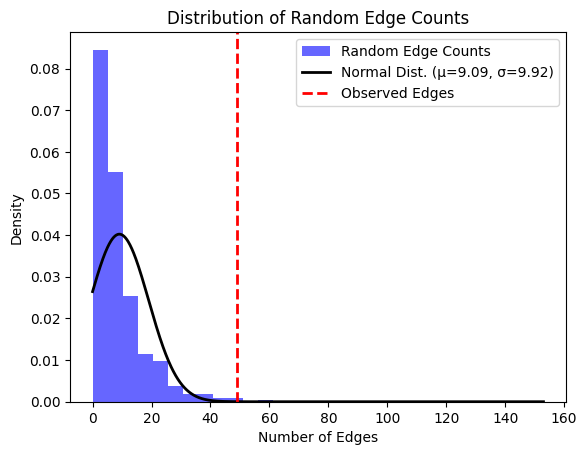

Genes mapped to marginal zone B-cell lymphoma: 
marginal zone B-cell lymphoma EFO_1000630
Genes mapped to marginal zone B-cell lymphoma: 
['FBXW8', 'RNU6', '21P', 'DPPA3P11', 'BTNL2', 'TSBP1', 'AS1', 'HLA', 'B', '283P', 'PRKCH', 'LINC02850', 'APOB']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to lymphocyte count: 
lymphocyte count EFO_0004587
Genes mapped to lymphocyte count: 
['NOTCH2', 'GOLPH3L', 'NTRK1', 'SPTA1', 'LY9', 'PBX1', 'LINC01344', 'PTPRC', 'CACNA1S', 'ATP2B4', 'IKBKE', 'AS1', 'MIR29B2CHG', 'LINC02608', 'LINC02775', 'SMYD2', 'HLX', 'RNU6', '1304P', 'SRP9', 'LINC00184', 'LINC02768', 'GCSAML', 'LINC02973', 'RNU6ATAC37P', 'LINC00299', 'ROCK2', 'TRIB2', 'LINC00276', 'MYCN', 'GLIS3', 'FOCAD', 'CDKN2A', 'RN7SKP114', 'DCAF12', 'TLN1', 'U8', 'ALDH1B1', 'TLE4', 'HNRNPK', 'LINC00092', 'ERCC6L2', 'PALM2AKAP2', 'LPAR1', 'RNY4P18', 'PAPPA', 'TRAF1', 'STRBP', 'ABL1', 'ABO', 'BRD3', 'AKR1C4', 'IL2RA', 'GATA3', 'DCLRE1C', 'PRTFDC1', 'GAD2', 'APB

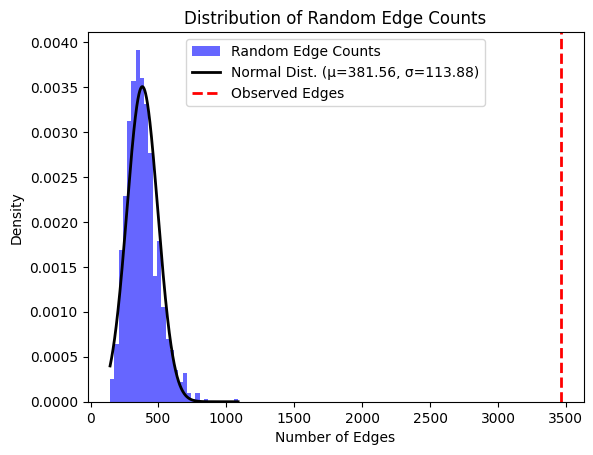

Genes mapped to squamous cell lung carcinoma: 
squamous cell lung carcinoma EFO_0000708
Genes mapped to squamous cell lung carcinoma: 
['MORN5', 'TPRG1', 'TP63', 'CHRNA5', 'HCP5', 'RAD52', 'CLPTM1L', 'POLR1HASP', 'MCCD1P1', 'HLA', 'H', 'B', 'MSH5', 'SAPCD1', 'GTF2H4', 'PRAG1', 'BBS7', 'DT', 'TRPC3', 'BRCA2', 'APOM', 'SUMO2P1', 'MOG', 'CYP2A6', 'CHEK2', 'WNK1', 'CHUK', 'CHRNA4', 'LINC01149', 'FRY', 'PTK2B', 'ANKLE1', 'ABHD8', 'DQB1', 'PDS5B', 'OBI1', 'AS1', 'RNU6', '67P', 'SLITRK1', 'NPAS3', 'CATSPER2', 'CHRNA3', 'CHRNB4', 'GOLGA6GP', 'MORF4L1', 'KRT18P47', 'CARMAL', 'ELAC2', 'LINC02093', 'KRT41P', 'KRT37', 'LINC01987', 'LINC01973', 'LINC01478', 'ZSCAN12', 'GPX6', 'NOP56P1', 'LINC01623', 'LINC01556', 'KRT18P1', 'LINC03003', 'F', 'POLR1H', 'TRIM26', 'UBQLN1P1', 'MICC', 'LINC02569', 'GNL1', 'VARS2', 'MUC22', 'HCG27', 'SNHG32', 'NEU1', 'TNXB', 'NOTCH4', 'TSBP1', 'DQA1', 'DQB2', 'DOB', 'DMB', 'RNU4', '66P', 'RIMS1', 'NYAP2', 'MIR5702', 'SRBD1', 'RNA5SP144', 'LARP7P4', 'ABCG2', 'GNPDA1', 'ND

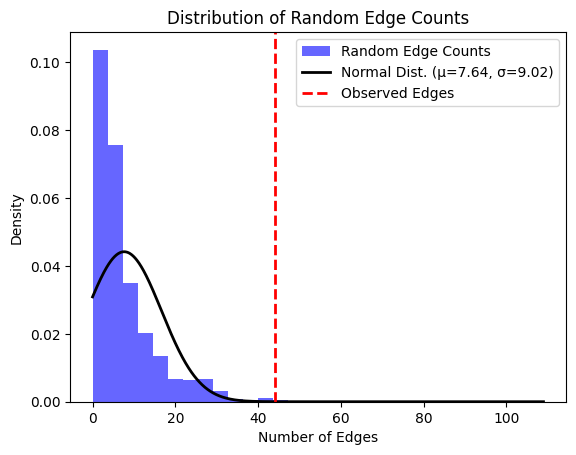

Genes mapped to lung adenocarcinoma: 
lung adenocarcinoma EFO_0000571
Genes mapped to lung adenocarcinoma: 
['ACTR2', 'AQP7', 'AQP3', 'SECISBP2L', 'COPS2', 'TERC', 'BAZ1A', 'TPRG1', 'TP63', 'TERT', 'CLPTM1L', 'FOXP4', 'AS1', 'DCBLD1', 'NRG1', 'RN7SL151P', 'MTAP', 'VTI1A', 'MPZL3', 'BPTF', 'APOM', 'CHRNA3', 'NOP56P1', 'LINC01623', 'TSBP1', 'BTNL2', 'HLA', 'F', 'UBXN4', 'CYP1A1', 'CYP1A2', 'LINC00399', 'LINC00676', 'PHLDB1', 'MUSK', 'LPAR1', 'CHRNA5', 'CYP2A6', 'POLR1HASP', 'MCCD1P1', 'H', 'CDKN2B', 'ACVR1B', 'SYNGR2', 'MTUS1', 'PSMA4', 'MIR4457', 'MPZL2', 'RTEL1', 'TNFRSF6B', 'STN1', 'SLK', 'EPHX2', 'GULOP', 'POT1', 'AK5', 'LINC00824', 'ACTRT3', 'MYNN', 'MIR4454', 'NAF1', 'SDHDP3', 'RNU6', '637P', 'DTWD1', 'ATP8B4', 'SSC5D', 'SBK2', 'RPL10L', 'MDGA2', 'LINC00511', 'UBE4A', 'PDCD6P1', 'SDHAP3', 'FUT2', 'RNASET2', 'MIR3939', 'DRB1', 'DQA1', 'IRF4', 'RAB31', 'CD83P1', '471P', 'NUMBL', 'PVT1', 'NCOA1', 'TLE3', '745P', 'POLR1H', 'SLC52A1', 'HSD17B2', 'MIGA1', 'PDE3A', 'CABLES1', 'CNTLN', 'RP

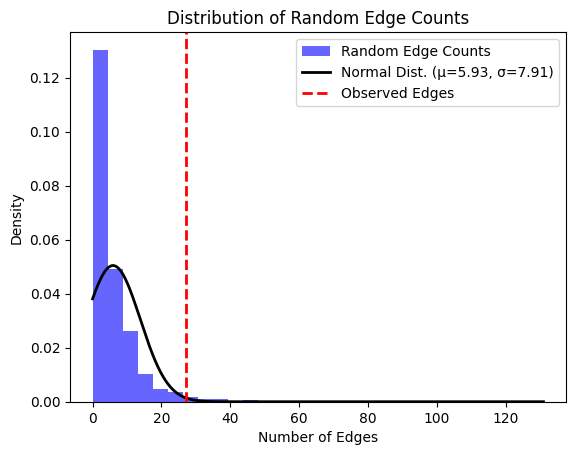

Genes mapped to non-small cell lung carcinoma: 
non-small cell lung carcinoma EFO_0003060
Genes mapped to non-small cell lung carcinoma: 
['RN7SL151P', 'MTAP', 'TPRG1', 'TP63', 'BAZ1A', 'VTI1A', 'TERT', 'FOXP4', 'AS1', 'TERC', 'POLR1HASP', 'MCCD1P1', 'HLA', 'H', 'CASP8', 'NRG1', 'MPZL3', 'CHRNA5', 'CYP2A6', 'CLPTM1L', 'AQP7', 'AQP3', 'NLRP1', 'WSCD1', 'LAMA1', 'XXYLT1', 'PIEZO2', 'SLC17A8', 'NR1H4', 'EIF4E2', 'DSCAM', 'LINC00114', 'ETS2', 'HADHB', 'ADGRF3', 'ALDH1A2', 'SAXO1', 'CPS1', 'RPS27P10', 'MIER2', 'SPMAP2', 'LINC02462', 'EEF1A1P35', 'ANKS1A', 'DLST', 'THSD7B', 'NCOA2', 'CDH8', 'NALCN', 'SLC35D2', 'BRCA2', 'APOM', 'SECISBP2L', 'COPS2', 'MSH5', 'SAPCD1', 'AK5', 'GTF2H4', 'FAM114A1', 'F', 'UBXN4', 'CYP1A1', 'CYP1A2', 'BBS7', 'DT', 'TRPC3', 'PHLDB1', 'MUSK', 'LPAR1', 'LINC02500', 'TENM3', 'CAMK2D', 'Y_RNA', 'CHCHD2P7', 'MUC3A', 'C13orf42', 'FAM124A', 'SLC16A7', 'LINC01811', 'CACNA1A', 'SLC37A3', 'MAGI2', 'RPS3AP17', 'PCDH7', 'DAPK1', 'GRIK3', 'MIR4255', 'LINC03093', 'GFRA2', 'LRRK1

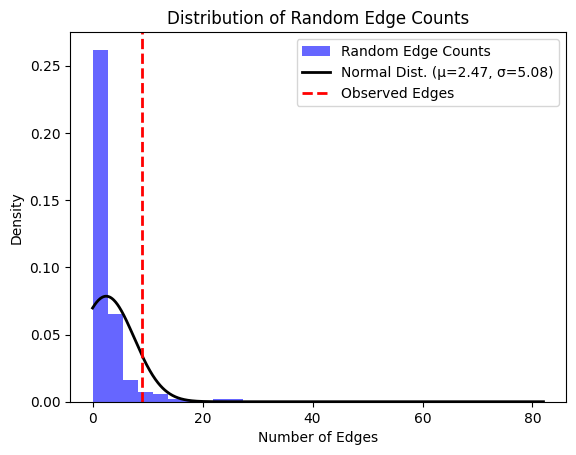

Genes mapped to colorectal mucinous adenocarcinoma: 
colorectal mucinous adenocarcinoma EFO_0009361
Genes mapped to colorectal mucinous adenocarcinoma: 
['SLC22A16', 'ZBTB20', 'CCDC141', 'RASGRF2', 'PTPA', 'IER5L', 'MTCYBP27', 'RNU6', '976P', 'AS1', 'LINC01622', 'FOXQ1', 'SOX5', 'ANKRD22', 'TRPM1', 'ETV6']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to estrogen-receptor positive breast cancer: 
estrogen-receptor positive breast cancer EFO_1000649
Genes mapped to estrogen-receptor positive breast cancer: 
['FGFR2', 'CASC16', 'PIGH', 'TESHL', 'LINC01162', 'RN7SL542P', 'SPATA13', 'RIMS2', 'MRPS30', 'HCN1', 'ZSCAN12', 'FOXP1', 'EMB', 'SLC17A3', 'BTN2A1', 'HNRNPA1P1', 'CD83P1', 'LINC03003', 'ZFPM2', 'GNAI2P1', 'RPL30P11', 'FURIN', 'DND1P1', 'MAPK8IP1P1', 'ARL17B', 'GATAD2A', 'LINC00536', 'WNT3', 'SLC25A37', 'RNU4', '71P', 'SINHCAFP3', 'AMPD2', 'RPL7P8', 'IRF1', 'CARINH', 'SCAMP2', 'RPL34P27', 'LSP1P1', 'EXO1', 'NEK10', 'TERT', 'MIR4457', 'HSPA4',

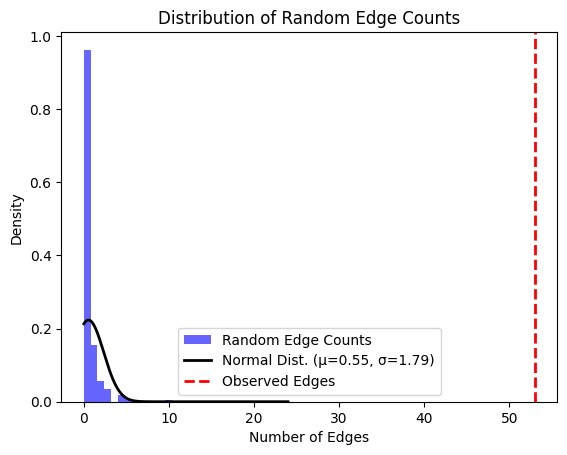

Genes mapped to progesterone-receptor negative breast cancer: 
progesterone-receptor negative breast cancer EFO_0009781
Genes mapped to progesterone-receptor negative breast cancer: 
['FGFR2']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to lymphocyte percentage of leukocytes: 
lymphocyte percentage of leukocytes EFO_0007993
Genes mapped to lymphocyte percentage of leukocytes: 
['CD244', 'FCRLA', 'FCRLB', 'GS1', '279B7.1', 'RNU7', '183P', 'DENND1B', 'ATP6V1G3', 'PTPRC', 'CACNA1S', 'IKBKE', 'AS1', 'BATF3', 'NSL1', 'COQ8A', 'RNY4P16', 'RN7SL668P', 'LINC02768', 'NLRP3', 'LINC02973', 'RNU6ATAC37P', 'UBXN2A', 'MFSD2B', 'DNMT3A', 'MAPRE3', 'EHD3', 'PRKD3', 'SLC8A1', 'LINC02580', 'THADA', 'ASB3', 'ERLEC1', 'RPSAP20', 'LINC01767', 'PLPP3', 'LEPR', 'RN7SL854P', 'DNAI4', 'ADGRL4', 'RN7SL824P', 'GFI1', 'VCAM1', 'EXTL2', 'DPH5', 'DT', 'S1PR1', 'PPIAP7', 'LINC01307', 'DENND2D', 'ANP32E', 'CTSS', 'SPTA1', 'IFI16', 'CADM3', 'ACKR1', 'LY9', 'PRDM16', 'RERE',

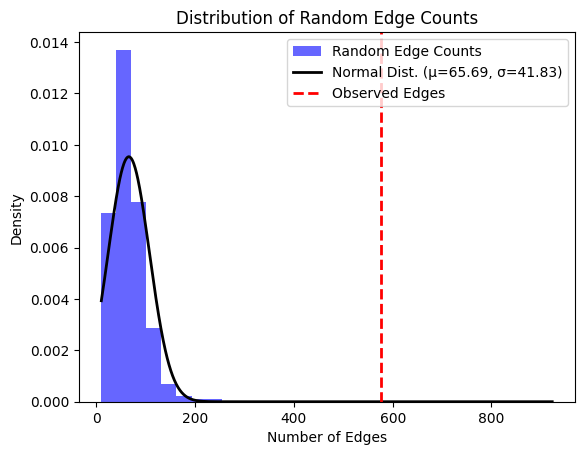

Genes mapped to urinary bladder carcinoma: 
urinary bladder carcinoma MONDO_0004986
Genes mapped to urinary bladder carcinoma: 
['BLTP3A', 'PSCA', 'JRK', 'TP63', 'P3H2', 'CASC11', 'TACC3', 'SLC14A1', 'NAT2', 'PSD3', 'UGT1A8', 'UGT1A10', 'C19orf12', 'CCNE1', 'CBX6', 'APOBEC3A', 'CLPTM1L', 'LINC02871', 'LSP1', 'MYNN', 'CDKAL1', 'PAG1', 'MCF2L', 'ZNF970P', 'AK6P2', 'LINC01752', 'CLK3', 'SYCN', 'IFNL3P1', 'LINC01173', 'SH3BP4', 'CASC15', 'TERT', 'MIR4457', 'CCDC38', 'FGFR3', 'FOXF2', 'RN7SL352P', 'HTR5A', 'RN7SKP280', 'PRKAR2B', 'LINC02901', 'FMN1', 'CWC27']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to renal cell carcinoma: 
renal cell carcinoma EFO_0000681
Genes mapped to renal cell carcinoma: 
['ITPR2', 'AS1', 'LINC02956', 'LINC02953', 'CEP85L', 'SCARB1', 'EPAS1', 'PLD1', 'ZEB2', 'PDZD2', 'PVT1', 'POT1', 'FAF1', 'ZNF620', 'LRRIQ4', 'RHOBTB2', 'STN1', 'SLK', 'POGLUT3', 'ATM', 'DPF3', 'ANAPC16', 'MAML2', 'MAP2K1', 'INSR', 'CDKN2C', 'MIR4421', 

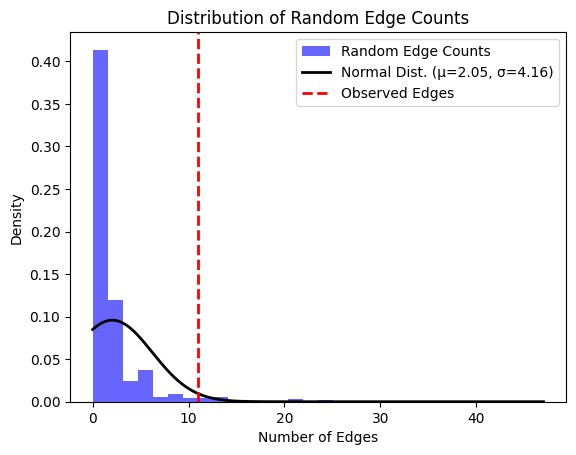

Genes mapped to thyroid carcinoma: 
thyroid carcinoma EFO_0002892
Genes mapped to thyroid carcinoma: 
['PTCSC2', 'LINC00609', 'PTCSC3', 'DIRC3', 'NRG1', 'MBIP', 'PCNX2', 'LRRC34', 'EPB41L4A', 'STN1', 'SLK', 'SMAD3', 'TERT', 'FOXE1', 'TRMO', 'LINC02481', 'NCOA5LP', 'CNEP1R1', 'SPMAP2L', 'DBX1', 'HTATIP2', 'MIR302CHG', 'LARP7', 'CHST3', 'SPOCK2', 'LINC00923', 'TGFB2', 'LINC02869', 'FTH1P21', 'LINC02272', 'ENOSF1', 'HEMGN', 'ANP32B', 'NREP', 'AS1']
Random edges calculation completed

z score: 3.7836023556179432



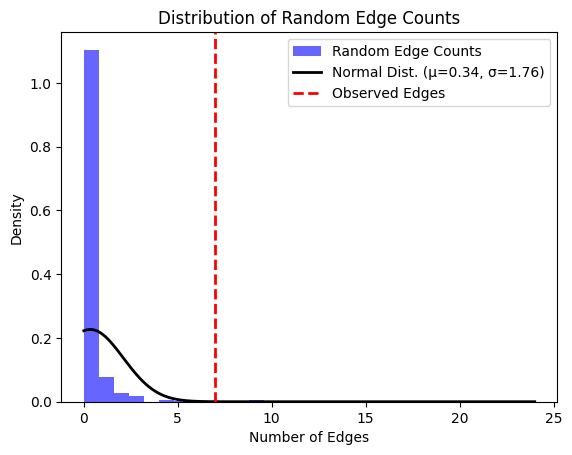

Genes mapped to testicular carcinoma: 
testicular carcinoma EFO_0005088
Genes mapped to testicular carcinoma: 
['KITLG', 'SLC25A44', 'LINC00690', 'DAZL', 'CENPE', 'PITX1', 'HEATR3', 'RPL10P14', 'SEPTIN4', 'AS1', 'TERT', 'MIR4457', 'NDFIP1', 'SPRY4', 'DMRT1', 'ATF7IP', 'UCK2', 'PRDM14', 'MCM3AP', 'BAK1', 'LINC02428', 'RFWD3', 'HPGDS', 'LIPG', 'MAD1L1', 'NELL1', 'LNCTSI', 'SIM2', 'DEPDC1', 'LINC01707', 'LINC01830', 'Y_RNA', 'CRIP1P3', 'ACTL8', 'CLPTM1L', 'EZRP1', 'ALCAM', 'PRTG', 'ZNF675', 'C12orf50']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to ovarian carcinoma: 
ovarian carcinoma EFO_0001075
Genes mapped to ovarian carcinoma: 
['TIPARP', 'AS1', 'WNT4', 'MIR4418', 'LUZP2', 'RPL36AP40', 'HAGLR', 'HAGLROS', 'LINC00824', 'SKAP1', 'PLEKHM1', 'NSF', 'BNC2', 'RN7SL720P', 'TRIM61', 'RPL21P51', 'BABAM1', 'USHBP1', 'ANKLE1', 'CHMP4C', 'MLLT10', 'HNF1B', 'PTCHD1', 'AS', 'LINC02183', 'BRCA1', 'PPIAP7', 'LINC01307', 'WARS2', 'DNM3', 'MIR548AE1', 'ZNF8

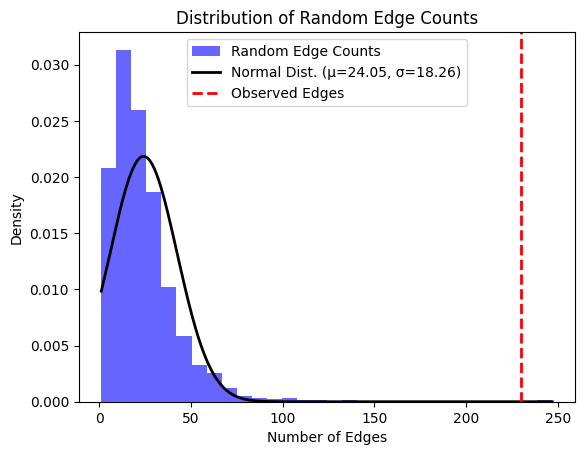

Genes mapped to Ewing sarcoma: 
Ewing sarcoma EFO_0000174
Genes mapped to Ewing sarcoma: 
['C1orf127', 'CFL1P6', 'SRP14', 'DT', 'EGR2', 'RNU6', '543P', 'RNA5SP63', 'U3', 'LINC00237', 'XRN2', 'BTF3P7', 'RN7SL554P', 'LINC01727', 'RPL24P2', 'ZYXP1', 'FAM135B']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to age at onset, glioblastoma multiforme: 
age at onset, glioblastoma multiforme EFO_0000519
Genes mapped to age at onset, glioblastoma multiforme: 
['SSBP2', 'POLR3B', 'TERT', 'EGFR', 'SEC61G', 'DT', 'CDKN2B', 'AS1', 'TP53', 'RTEL1', 'TNFRSF6B', 'RAVER2', 'LMF1', 'MIR4300HG', 'HEATR3', 'SLC16A8', 'RHBDF1', 'CCDC26']
Random edges calculation completed

z score: 3.929176582389741



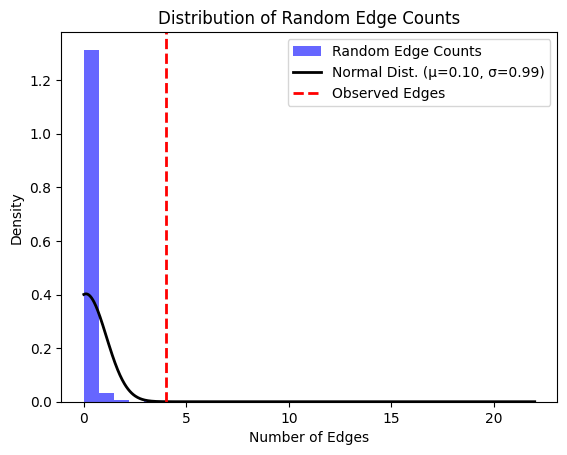

Genes mapped to breast carcinoma: 
breast carcinoma EFO_0000305
Genes mapped to breast carcinoma: 
['RAD51B', 'TNIP3', 'SLC45A1', 'LASTR', 'ZMIZ1', 'GRM7', 'ADAMTS16', 'ALG3P1', 'PLXNC1', 'RN7SKP263', 'BCAS3', 'RNF146', 'CASC16', 'MRPS30', 'HCN1', 'TESHL', 'FGFR2', 'CCDC170', 'ESR1', 'PTHLH', 'CCDC91', 'MDM4', 'TCF7L2', 'NXPH1', 'BABAM1', 'USHBP1', 'SIAH2', 'ERICH6', 'AS1', 'ERBB4', 'TERT', 'RPSAP72', 'TENT5A', 'ZNF365', 'LINC02929', 'PEX14', 'EBF1', 'PGAM1P5', 'BRCA2', 'FTO', 'MRTFA', 'LGR6', 'LINC01376', 'C5orf67', 'MAP3K1', 'EMBP1', 'PCAT1', 'POU5F1B', 'CASC8', 'TNNT3', 'SLC4A7', 'CDKN2B', 'GDI2', 'ANKRD16', 'LINC01488', 'CCND1', 'ATE1', 'DT', 'CHCHD4P2', 'RPL36P14', 'LINC01122', 'FBN1', 'LINC02444', 'LINC02882', 'LINC01416', 'LINC01905', 'STAG3L4', 'MTATP6P21', 'COL1A1', 'GRIK1', 'LINC02143', 'LINC03000', 'ABCC4', 'LSP1', 'LNC', 'LBCS', 'ADAMTS7P3', 'CLEC18B', 'GLG1', 'No', 'mapped', 'genes', 'LOHAN2', 'ZFHX3', 'RANBP9', 'MCUR1', 'ARHGEF5', 'RPL17P33', 'LINC00589', 'CASC9', 'PVT1',

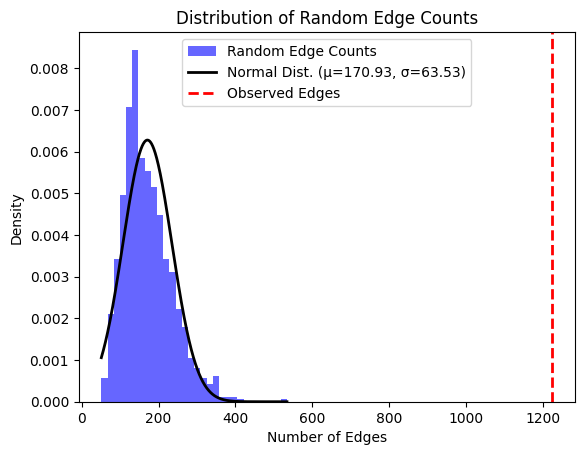

Genes mapped to lung carcinoma: 
lung carcinoma EFO_0001071
Genes mapped to lung carcinoma: 
['GKN2', 'GKN1', 'MIR4457', 'CLPTM1L', 'HYKK', 'TGM5', 'ATP5PDP1', 'APOM', 'FAS', 'ACTA2', 'STAMBPL1', 'RBMS3', 'AS2', 'CHRNA3', 'TP63', 'TERT', 'TNFRSF19', 'MIPEP', 'MTMR3', 'GPC5', 'IL1RAP', 'CRPP1', 'CRP', 'BPTF', 'TNFAIP6', 'RIF1', 'VTI1A', 'DCBLD1', 'HLA', 'DRB9', 'BRCA2', 'CHEK2', 'RAD52', 'FOXP4', 'AS1', 'CDKN2B', 'ACVR1B', 'SYNGR2', 'MTUS1', 'DOCK8', 'SMAD6', 'SMASR', 'GNG2', 'LRFN2', 'DNAH11', 'CDH18', 'CCDC40', 'LINC01194', 'LINC02220', 'DNAAF10', 'RD3', 'SLC30A1', 'DLC1', 'CHRNB4', 'x', 'TARID', 'RPL17P45', 'KC6', 'LINC02057', 'SMIM15', 'LINC02350', 'GPLD1', 'LINC01492', 'PFDN4', 'DOK5', 'MTSS1', 'RGS7', 'ADGRL2', 'LINC01362', 'LRRTM4', 'ZNF618', 'CFAP20DC', 'DT', 'RIMS1', 'MIR4431', 'ASB3', 'MAGI3', 'LINC02615', 'JADRR', 'OTX2', 'DRB1', 'DQA1', 'NOTCH4', 'TSBP1', 'PSORS1C3', 'HCG27', 'LINC01149', 'N', 'HCG19P', 'LINC00533', 'POLR1HASP', 'F', 'BTN2A1', 'BTN1A1P1', 'MPZL2', 'CHRNA5', 

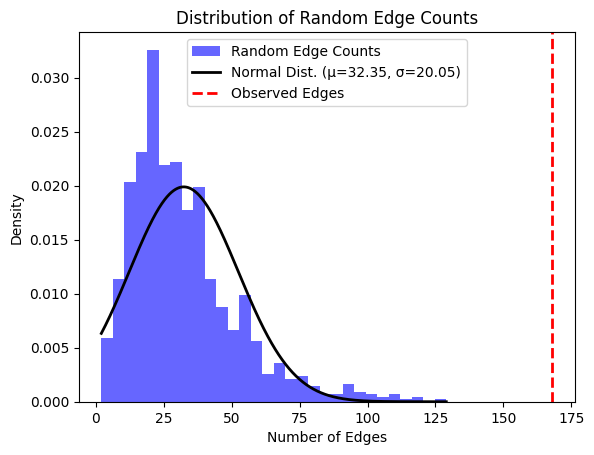

Genes mapped to hepatocellular carcinoma: 
hepatocellular carcinoma EFO_0000182
Genes mapped to hepatocellular carcinoma: 
['MICA', 'AS1', 'MTCO3P1', 'HLA', 'DQB3', 'DQB1', 'STAT4', 'EFCAB11', 'CCR4', 'GLB1', 'C2', 'DQA1', 'GRIK1', 'No', 'mapped', 'genes', 'KIF1B', 'TRIM31', 'DPA2', 'POLR1HASP', 'MICD', 'HCG18', 'TLL1', 'VEPH1', 'PRSS23', 'DLC1', 'AGA', 'DT', 'LINC02360', 'LINC02270', 'MRPS11', 'DET1', 'CDK14', 'IFNL3', 'IFNL4', 'TM6SF2', 'SEPTIN14P17', 'WNT3A', 'PNPLA3', 'MAU2', 'TERT']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to gastric carcinoma: 
gastric carcinoma EFO_0000178
Genes mapped to gastric carcinoma: 
['ZBTB20', 'PRKAA1', 'MUC1', 'PLCE1', 'ASH1L', 'LINC02161', 'JRK', 'PSCA', 'ARL4C', 'LINC01173', 'LRFN2', 'DNAH11', 'MTX1', 'THBS3', 'GBA1LP', 'PTGER4', 'TTC33', 'NPIPB2', 'AS1', 'GON4L', 'LMNA', 'HNRNPA1P57', 'LDHAP3', 'LINC02580', 'TATDN2', 'LINC02516', 'MYL12BP2', 'LINC02363', 'TERT', 'MIR4457', 'C7', 'VN1R10P', 'ZNF204P', '

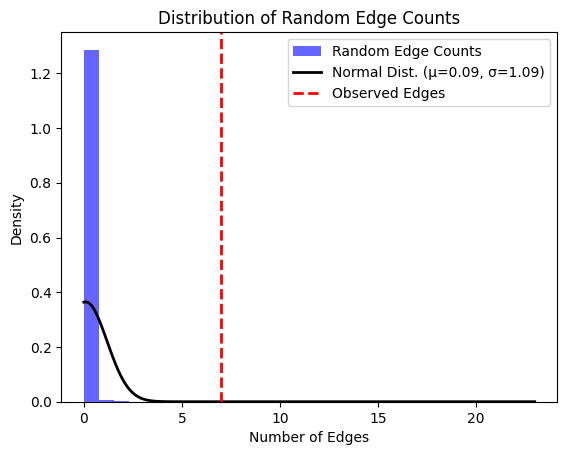

Genes mapped to esophageal carcinoma: 
esophageal carcinoma EFO_0002916
Genes mapped to esophageal carcinoma: 
['PLCE1', 'CHEK2', 'HEATR3', 'HAP1', 'JUP', 'XBP1', 'ST6GAL1', 'SMG6', 'PTPN2', 'ADH1B', 'ADH4', 'PSMB3P2', 'IGFBP2', 'ATP6V1G1P7', 'RPL7P45', 'HECTD4', 'CSNK1A1', 'NAALADL2', 'ACTG1P23', 'SEMA5B', 'CARS1P1', 'ANP32A', 'PDE4D', 'ACAD10', 'RUNX1', 'LRFN2', 'UNC5CL', 'SLC39A6', 'ALDH2', 'RASSF10', 'BMAL1', 'IFT81', 'ATP2A2', 'FLACC1', 'CASP8', 'LINC00160', 'LINC01426']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to Nephroblastoma: 
Nephroblastoma Orphanet_654
Genes mapped to Nephroblastoma: 
['DDX1', 'LINC01804', 'NBAS', 'PCSK9', 'PCBP2P3', 'LDHBP3', 'DLG2', 'TCN2', 'NHS']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to small cell lung carcinoma: 
small cell lung carcinoma EFO_0000702
Genes mapped to small cell lung carcinoma: 
['DYNC2H1', 'PDGFDDN', 'RAD52', 'A2ML1', 'PHC1', 'LINC02822', 'B

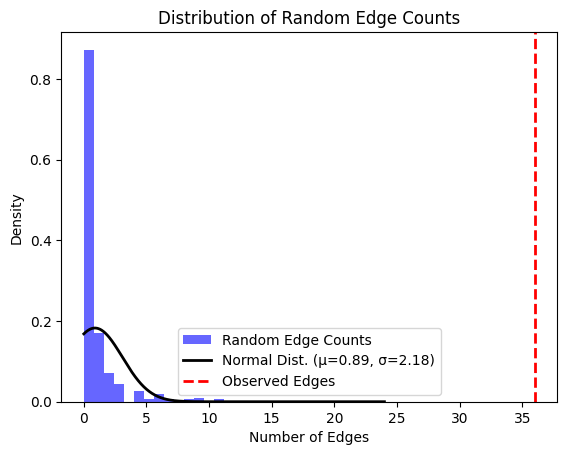

Genes mapped to multiple myeloma: 
multiple myeloma EFO_0001378
Genes mapped to multiple myeloma: 
['DNAH11', 'ULK4', 'DTNB', 'TNKS', 'PPP1R3B', 'DT', 'CCND1', 'LINC01411', 'MECOM', 'ANO5', 'CBX7', 'DIO1', 'MED24', 'MIR124', '1HG', 'MSRA', 'YWHAQP1', 'TUBBP3', 'LCOR', 'CDH13', 'PSME2P2', 'FNDC3A', 'OTX2', 'AS1', 'POLQ', 'RNU6', '637P', 'TERC', 'RNA5SP267', 'SLC2A13P1', 'ILF2', 'HERC2', 'LINC02269', 'RNA5SP173', 'NDUFB5P1', 'SGPL1', 'UNC5B', 'RPL31P9', 'DSEL', 'AKAP7', 'MANCR', 'CDH12', 'ANKRD11', 'PPIAP66', 'RPL5P7', 'POU5F1', 'GRIP1', 'SMASR', 'TBCA', 'AP3B1', 'RNU7', '152P', 'MIR1202', 'HCG27', 'IGFBPL1', 'ARMC8P1', 'KANK1', 'ARMC9', 'MYNN', 'PSORS1C1', 'MXI1', 'TNFRSF13B', 'ELL2', 'TOM1', 'NDUFB4P4', 'KIF3C', 'USP8P1', 'COTL1P1', 'TBC1D27P', 'FUNDC2P4', 'PDGFB', 'CEP20', 'SP3', 'CEP120', 'CTB', '30L5.1', 'CCDC71L', 'POT1', '416P', 'SRCAP', 'KLF2', 'IRF4', 'LINC00928', 'TICRR', 'HGF', 'CACNA2D1', 'CCDC169', 'SOHLH2', 'ATG5', 'SMARCD3', 'PREX1', 'RN7SL332P', 'JARID2', 'PCAT1', 'CASC19

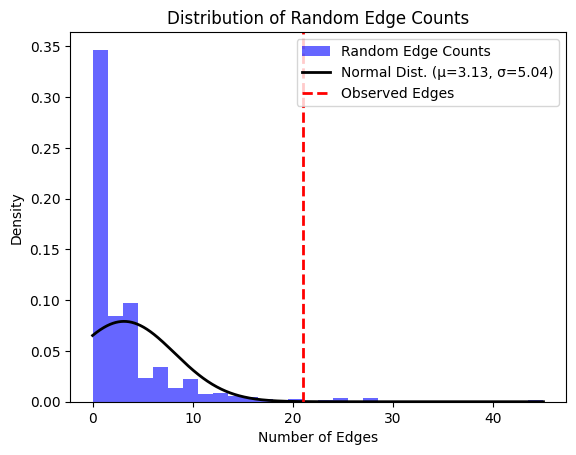

Genes mapped to central nervous system cancer: 
central nervous system cancer EFO_0000326
Genes mapped to central nervous system cancer: 
['RTEL1', 'TNFRSF6B', 'CDKN2B', 'AS1', 'TERT', 'CCDC26', 'PHLDB1', 'EGFR', 'SEC61G', 'DT', 'LRRC31', 'GOLGA3', 'ZBTB16', 'SNORA70', 'RN7SL734P', 'ETFA', 'POLR2A', 'HPSE2', 'POLR3B', 'TP53', 'LINC00424', 'LINC00540', 'LRRC4C', 'ATP8A1', 'RN7SKP82', 'COPS8', 'PIEZO2', 'LINC01928', 'PAPPA2', 'C12orf42', 'KLF7', 'LINC01343', 'RNU6', '753P', 'CCDST', 'TENM2', 'STK10', 'SVOPL', 'SSU72L4', 'SSU72L3', 'ZBTB7C', 'ZIM2', 'PEG3']
Random edges calculation completed

z score: 3.654618326166854



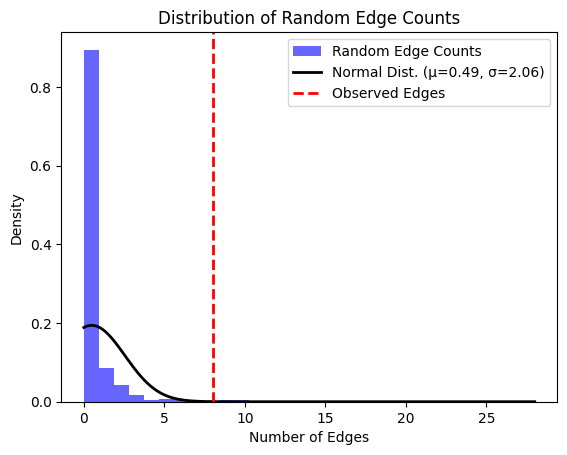

Genes mapped to osteosarcoma: 
osteosarcoma EFO_0000637
Genes mapped to osteosarcoma: 
['GRM4', 'DLEU1', 'DLEU7', 'SILC1', 'LINC01247', 'ADAMTS17', 'TASOR2', 'ADAMTS6']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to chronic myelogenous leukemia: 
chronic myelogenous leukemia EFO_0000339
Genes mapped to chronic myelogenous leukemia: 
['CCDC170', 'TUFMP1', 'RPL34P31']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to esophageal squamous cell carcinoma: 
esophageal squamous cell carcinoma EFO_0005922
Genes mapped to esophageal squamous cell carcinoma: 
['STING1', 'ATP1B2', 'HLA', 'DRB1', 'DQA1', 'CDKN2B', 'AS1', 'HHLA1', 'PLCE1', 'FLACC1', 'CASP8', 'RUNX1', 'XBP1', 'PDE4D', 'RALBP1P2', 'NMS', 'C1D', 'HIGD1AP4', 'SCG2', 'SLC30A4', 'LINC02987', 'MAN1A2P1', 'SLC16A14', 'SP110', 'Y_RNA', 'FAM120AOS', 'CHEK2', 'MYO1B', 'PCM1', 'AGBL4', 'GSE1', 'CCDC71L', 'LINC02577', 'MUC7', 'AMTN', 'ABHD11', 'CLDN3', 'RBBP8

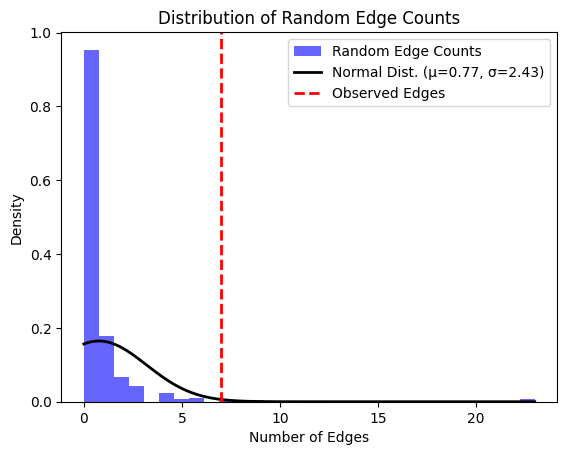

Genes mapped to head and neck squamous cell carcinoma: 
head and neck squamous cell carcinoma EFO_0000181
Genes mapped to head and neck squamous cell carcinoma: 
['RN7SL643P', 'HTR1E', 'ZNF594', 'DT', 'SCIMP', 'ALDH2', 'HLA', 'DQB1', 'MTCO3P1', 'CCHCR1', 'POLR1HASP']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to non-melanoma skin carcinoma: 
non-melanoma skin carcinoma EFO_0009260
Genes mapped to non-melanoma skin carcinoma: 
['TYR', 'RNU6', '682P', 'SNORA70', 'PRDX5', 'CCDC88B', 'TRPC4AP', 'EDEM2', 'SCAND1', 'CNBD2', 'DNMT3B', 'PIGU', 'RPL18P1', 'ATP5MC2P2', 'PARD6B', 'BCAS4', 'RALY', 'PHF20', 'LINC03086', 'TGM3', 'GABRG3', 'TPM3P2', 'PIGPP3', 'UQCC1', 'NCOA6', 'MARK2P11', 'LINC02227', 'Y_RNA', 'THNSL2', 'MRPL45P1', 'BACH2', 'AFG3L1P', 'EXOC2', 'ANKRD11', 'RCC2', 'EPB41L1', 'DNAH2', 'BNC2', 'CSMD2', 'IRF4', 'GRM5', 'LINC00513', 'LINC', 'PINT', 'GACAT3', 'CYRIA', 'SNTA1', 'CBFA2T2', 'ZFHX4', 'AS1', 'MYH7B', 'CASC15', 'FOXP1', 'BPIFB4', 'MMP

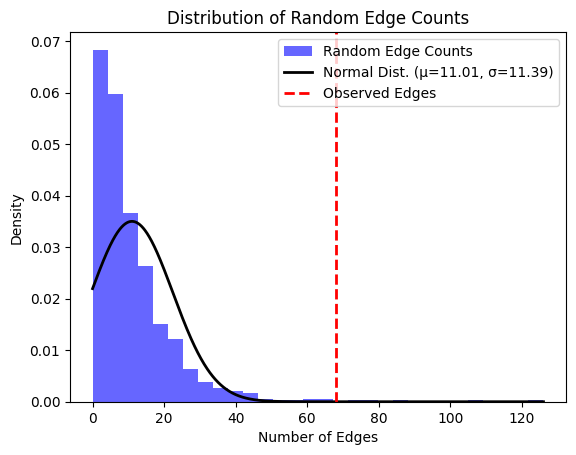

Genes mapped to cutaneous squamous cell carcinoma: 
cutaneous squamous cell carcinoma EFO_1001927
Genes mapped to cutaneous squamous cell carcinoma: 
['OCA2', 'AHR', 'TRPS1', 'RNU2', '47P', 'LURAP1L', 'AS1', 'BNC2', 'RN7SL720P', 'SEC16A', 'ZNF143', 'WEE1', 'TYR', 'RPL15P15', 'LINC02151', 'KRT6A', 'KRT5', 'HAL', 'MC1R', 'RALY', 'BRCA2', 'DUSP22', 'IRF4', 'CTXND2', 'RN7SL602P', 'SMIM7P1', 'FLACC1', 'CASP8', 'FOXP1', 'TPRG1', 'TP63', 'SLC45A2', 'HLA', 'DQA1', 'BACH2', 'LPP', 'CPVL', 'RPL17P30', 'AP3M2', 'LINC02929', 'CTLA4', 'ICOS', 'INPP5E', 'BPIFB6', 'PUDPP3', 'CTSS', 'TRPC4AP', 'EDEM2', 'MICA', 'LINC01149', 'MROH8', 'EPB41L1']
Random edges calculation completed

z score: 1.627097308430839



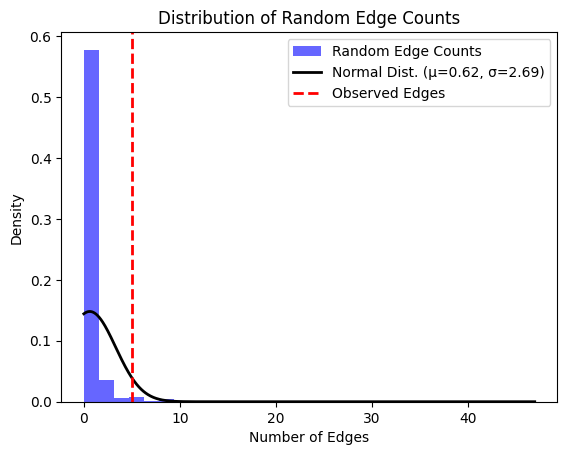

Genes mapped to angiopoietin-1 receptor measurement: 
angiopoietin-1 receptor measurement EFO_0010600
Genes mapped to angiopoietin-1 receptor measurement: 
['ABO', 'TEK', 'ARB2A', 'Y_RNA', 'HLA', 'B', 'RNU6', '283P', 'LCN1P2', 'MMP16', 'RNA5SP272', 'ST3GAL4', 'KIRREL3', 'DQA1', 'DQB1', 'RPL19P7', 'WWP1P1', 'LINC02571', 'STKLD1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to endometrial carcinoma: 
endometrial carcinoma EFO_1001512
Genes mapped to endometrial carcinoma: 
['FYB2', 'NGF', 'AS1', 'ELOCP20', 'KIF26B', 'CCDC85A', 'RN7SL553P', 'MTARC2P1', 'STX18', 'IGBP1P5', 'RN7SL101P', 'RNF150', 'LY86', 'H4C8', 'H3C9P', 'MDN1', 'CASP8AP2', 'CCDC185', 'CAPN8', 'RNA5SP189', 'LINC01950', 'LHFPL3', 'CDKN2B', 'LINC02182', 'RNA5SP231', 'RNU6', '832P', 'RPL31P3', 'HAUS6P2', 'GINS2', 'TLE1', 'EVI2A', 'NF1', 'HNF1B', 'SKAP1', 'BPTF', 'GATA6', 'CTAGE1', 'BBLNP1', 'LINC00261', 'NCAM2', 'LINC01256', 'PCDH10', 'DT', 'ID4', 'RPL29P17', 'DLC1', 'SGCZ', 'EXT1',

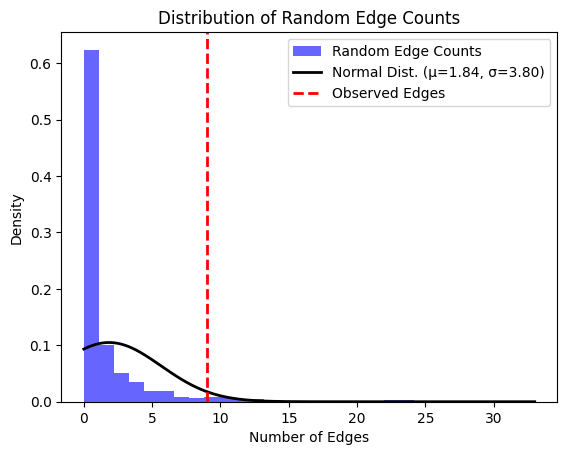

Genes mapped to esophageal adenocarcinoma: 
esophageal adenocarcinoma EFO_0000478
Genes mapped to esophageal adenocarcinoma: 
['RNU6', '281P', 'FOXP1', 'SPARCL1', 'RBBP4P3', 'KHDRBS2', 'HECW1', 'BARX1', 'PTPDC1', 'LINC00917', 'FENDRR', 'CRTC1', 'CFTR', 'ASZ1', 'HTR3C', 'HTR3C2P', 'TPPP', 'GDF7', 'LDAH', 'SLC66A1LP', 'LINC01091', 'CEP72', 'LINC02109', 'SLC22A3', 'COCH', 'LINC02253']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to angiopoietin-2 receptor measurement: 
angiopoietin-2 receptor measurement EFO_0006902
Genes mapped to angiopoietin-2 receptor measurement: 
['TEK', 'ABO']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to laryngeal squamous cell carcinoma: 
laryngeal squamous cell carcinoma EFO_0006352
Genes mapped to laryngeal squamous cell carcinoma: 
['NCR3', 'UQCRHP1', 'FADS2', 'FADS1', 'U3', 'ATF1P1', 'VCAN', 'LINC02177', 'GLULP5', 'LINC02459']
The number of edges in the network is less t

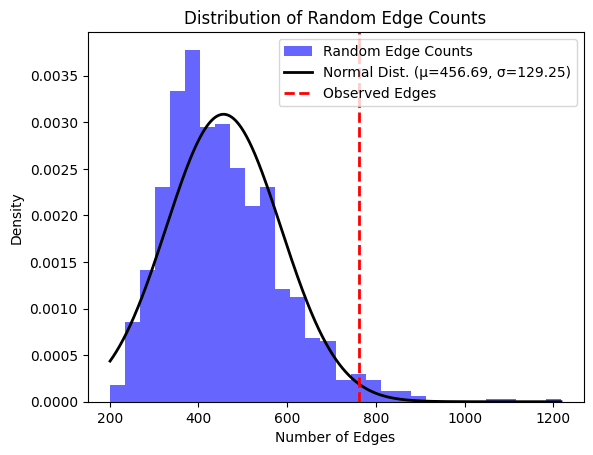

Genes mapped to estrogen-receptor negative breast cancer: 
estrogen-receptor negative breast cancer EFO_1000650
Genes mapped to estrogen-receptor negative breast cancer: 
['RAD51B', 'ESR1', 'RNY1P8', 'MARK2P12', 'LGR6', 'WDR43', 'LINC01376', 'FTO', 'MDM4', 'CCDC170', 'ANKLE1', 'ABHD8', 'TERT', 'ADCY9', 'L3MBTL3', 'POGLUT3', 'PA2G4P3', 'CDH2', 'C19orf12', 'CCNE1', 'ANXA13', 'FAM91A1', 'RPL23AP53', 'ZNF596', 'GAREM1', 'TESHL', 'CDKN2B', 'AS1', 'LINC02929', 'BRCA2', 'RIN3', 'RPS27P20', 'LINC01395', 'CASC8', 'PCAT1', 'POU5F1B', 'KCNU1', 'SMARCE1P4', 'EBF1', 'DIRC3', 'PGAM1P5', 'RPSAP72', 'TENT5A', 'FLACC1', 'CASP8', 'HNF4G', 'MIR4457', 'KCNN4', 'LYPD5', 'CASC16', 'ELL', 'LINC01101', 'Y_RNA', 'MRTFA', 'PEX14', 'C5orf67', 'MAP3K1', 'PTHLH', 'CCDC91', 'TCF7L2', 'TNFSF10', 'LINC02068', 'RALB', 'INHBB', 'ZNF365', 'LSP1', 'BABAM1', 'USHBP1', 'PPIL3', 'KCNK2', 'VDAC1P10', 'SPDYE12', 'CASTOR2', 'C11orf65', 'EXPH5', 'DDX10', 'ADAP2', 'TP53', 'MCM8', 'TNRC6B', 'LINC01956']
Random edges calculation c

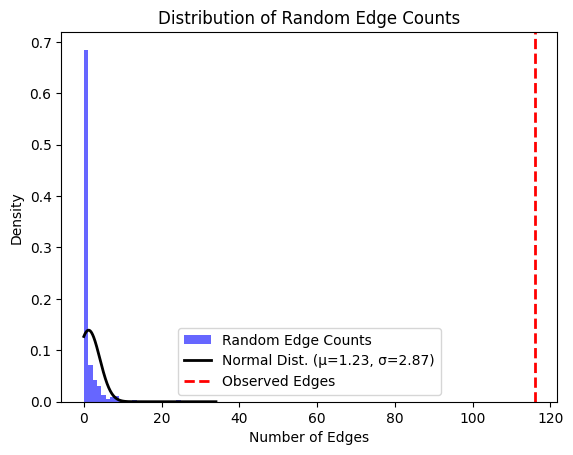

Genes mapped to rectum cancer: 
rectum cancer EFO_1000657
Genes mapped to rectum cancer: 
['PPIAP39', 'HABP2', 'LINC01847', 'LINC01942', 'BTC', 'HSPE1P23', 'PSMG4', 'SLC22A23', 'CHCHD2P9', 'LNCARSR', 'TWIST1', 'FERD3L', 'ANO1', 'TCERG1L', 'LINC01164', 'PYGL', 'ABHD12B', 'CDX1', 'LINC00513', 'LINC', 'PINT', 'LAMC1', 'SMAD7', 'POU2AF2', 'POU5F1B', 'CASC8', 'CCAT2', 'PCAT1', 'SCP2D1', 'AS1', 'SLC24A3', 'LINC01239', 'SUMO2P2', 'SCOC', 'MEGF10', 'LINC00536', 'EIF3H', 'DLC1', 'SGCZ', 'SCG5', 'GREM1', 'PLCL1', 'RNU7', '147P', 'LINC01709', 'YWHAQ', 'RNU4', '73P', 'LRP1B', 'IL15', 'INPP4B', 'Y_RNA', '12P', 'DLGAP2', 'WDFY4', 'LRRC18', 'NOVA1', 'DT', 'MIR4307HG', 'DGLUCY', 'BRD7']
Random edges calculation completed

z score: 1.761623625487342



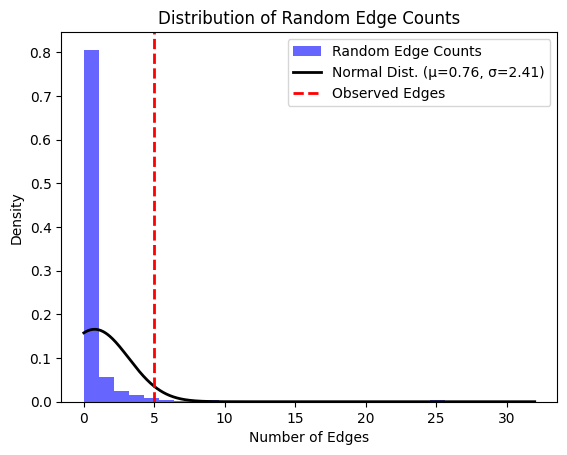

Genes mapped to triple-negative breast cancer: 
triple-negative breast cancer EFO_0005537
Genes mapped to triple-negative breast cancer: 
['MDM4', 'TERT', 'CCDC170', 'ANKLE1', 'PTHLH', 'CCDC91', 'HNF1A', 'TP53', 'RPS18', 'RPS2P18', 'CDCA7', 'FGFR2', 'C11orf65', 'GPR68', 'CCDC88C', 'NACA4P', 'LINC02845', 'MLLT10', 'LINC01956', 'ABHD8']
Random edges calculation completed

z score: 71.46960092853848



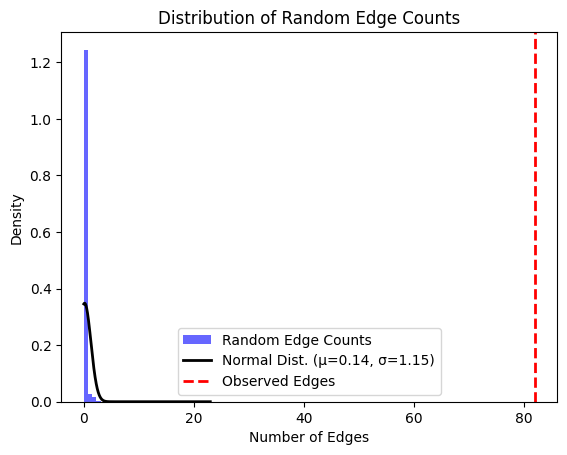

Genes mapped to mammographic density measurement: 
mammographic density measurement EFO_0005941
Genes mapped to mammographic density measurement: 
['YWHAQ', 'RNU4', '73P', 'ADD2', 'AFF3', 'MAPK10', 'AS1', 'BTBD9', 'FAF1', 'LINC01376', 'TET3', 'FNBP1P1', 'DIRC3', 'PPARG', 'RBM48P1', 'Y_RNA', 'BOLA3P3', 'HSPE1P10', 'ATXN1', 'LINC02680', 'MKX', 'PRKG1', 'RPL21P94', 'GVINP1', 'ITPR2', 'SSPN', 'RAD51B', 'BCL2', 'FUT2', 'PELATON', 'LINC00445', 'LINC01579', 'LINC00589', 'MDS2', 'SPAG17', 'RNA5SP56', 'TBX15', 'ADCY3', 'LINC01101', 'ADAMTS9', 'AS2', 'LY86', 'BTF3P7', 'ZNF365', 'BMAL1', 'ZBTB44', 'DT', 'ADAMTS8', 'PGAM1P5', 'ADAMTSL3', 'AREG', 'BTC', 'PRDM6', 'CCDC170', 'ESR1', 'MAGI2', 'LINC02929', 'LSP1', 'IGF1', 'LINC00485', 'LINC02871', 'TMEM184B', 'ADSL', 'SGSM3', 'EPS15P1', 'MRPL42P4', 'KCNU1', 'SMARCE1P4', 'RGP1', 'CSTF2T', 'RNA5SP326', 'LINC01435', 'LINC02306', 'CYB5AP5', 'PPIAP88', 'RNU6', '996P']
Random edges calculation completed

z score: 0.996059041697385



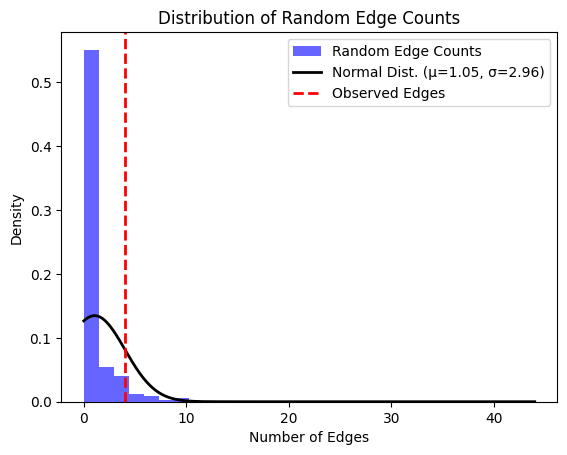

Genes mapped to ovarian mucinous adenocarcinoma: 
ovarian mucinous adenocarcinoma EFO_0006462
Genes mapped to ovarian mucinous adenocarcinoma: 
['PAX8', 'AS1', 'HAGLR', 'HOXD3', 'IFNL3P1', 'IFNL3', 'HAGLROS', 'MRPS22', 'ARL2BPP7', 'RNU6', '329P', 'HNF1B', 'LINC01117', 'PCAT1', 'CASC19', 'INHBB', 'LINC01101']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to gastric adenocarcinoma: 
gastric adenocarcinoma EFO_0000503
Genes mapped to gastric adenocarcinoma: 
['GBA1LP', 'CHD6', 'JRK', 'PSCA']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to colon carcinoma: 
colon carcinoma EFO_1001950
Genes mapped to colon carcinoma: 
['CHORDC1P5', 'CASP3P1', 'TWF2', 'FAM118A', 'MIR3924', 'MRPS35P3', 'LINC03047', 'ODF1', 'ZCWPW2', 'PI15', 'CRISPLD1', 'UTP23', 'SRSF10P2', 'HSPBAP1P1', 'LINC01705', 'RGL1', 'EPS15P1', 'MRPL42P4', 'PREX1', 'SMAD7', 'POU5F1B', 'CASC8', 'PCAT1', 'RHPN2', 'MEIS1', 'LRRTM4', 'THSD7B', 'FRMD4B', 

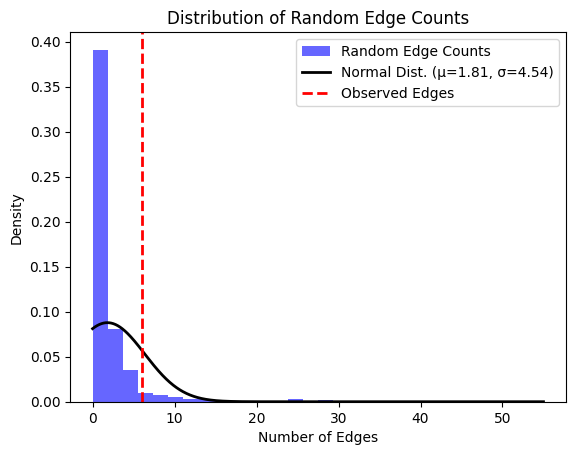

Genes mapped to mammographic density percentage: 
mammographic density percentage EFO_0006502
Genes mapped to mammographic density percentage: 
['LINC01376', 'ADCY3', 'DIRC3', 'PPARG', 'Y_RNA', 'INTU', 'ATXN1', 'LINC00589', 'ZNF365', 'ZBTB44', 'DT', 'ADAMTS8', 'LINC00445', 'LINC01579', 'FUT2', 'MAMSTR', 'PRKG1', 'BMAL1', 'RPL21P94', 'GVINP1', 'RAD51B', 'TBX15', 'FAF1', 'MDS2', 'TET3', 'FNBP1P1', 'ADAMTS9', 'AS2', 'BOLA3P3', 'HSPE1P10']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to kidney cancer: 
kidney cancer MONDO_0002367
Genes mapped to kidney cancer: 
['RPL37P2', 'UNC93B5', 'MCPH1', 'VN2R19P', 'ZNF606', 'AS1', 'CARD9', 'RORA', 'PDCD6IP', 'KIF19BP', 'FABP12', 'LINC02956', 'LINC02953', 'DNAJC16', 'BRK1', 'SSPN', 'ITPR2']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to oropharynx cancer: 
oropharynx cancer EFO_1001931
Genes mapped to oropharynx cancer: 
['LINC01118', 'POLR1HASP', 'MACO1', 'LDLRAP

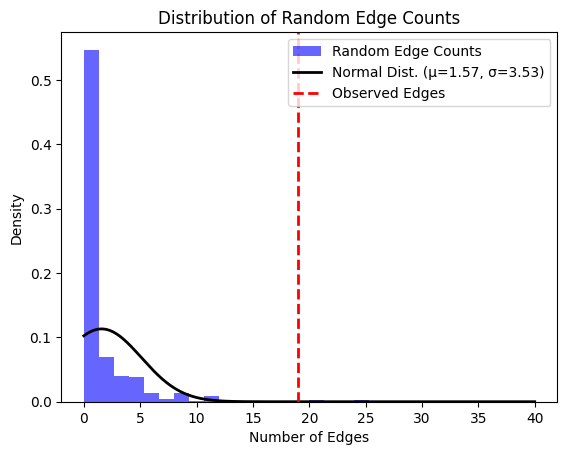

Genes mapped to gastric cancer: 
gastric cancer MONDO_0001056
Genes mapped to gastric cancer: 
['PDK1', 'CSMD1', 'MIR4431', 'ASB3', 'RNA5SP430', 'RPL18P13', 'LINC00305', 'LINC01924', 'EPB41L2', 'NXPH1', 'GAPDHP68', 'ATF7IP', 'MROH4P', 'ARC', 'PSCA', 'JRK', 'LY6K', 'KLHDC4', 'ST13P12', 'TMEM167A', 'ALG1L9P', 'ENPP7P8', 'XNDC1N', 'ZNF705EP', 'DEFB108B', 'PCDHGA1', 'PRXL2C', 'ZNF510', 'SPATA31F1', 'SPATA31F2P', 'RPL21P12', 'TRIM7', 'AS2', 'SGCG', 'ZNF652', 'AS1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to lung cancer: 
lung cancer MONDO_0008903
Genes mapped to lung cancer: 
['TRIM46', 'P3R3URF', 'PIK3R3', 'LINC02929', 'ALDH7A1P4', 'ZMIZ1', 'H19', 'RIN3', 'ABHD8', 'RPS2P18', 'CDCA7', 'TERT', 'MIR4457', 'HSPA4', 'C5orf67', 'MAP3K1', 'TRIM38', 'CDCA7P1', 'POM121L2', 'ZKSCAN3', 'POLR1HASP', 'MSH5', 'SAPCD1', 'CDKN2B', 'AS1', 'CLPTM1L', 'PSMA4', 'CHRNA5', 'CYP2A6', 'SUMO2P1', 'MOG', 'BRCA2', 'SECISBP2L', 'COPS2', 'AK5', 'CHRNA4', 'WNK1', 'CHRNA2

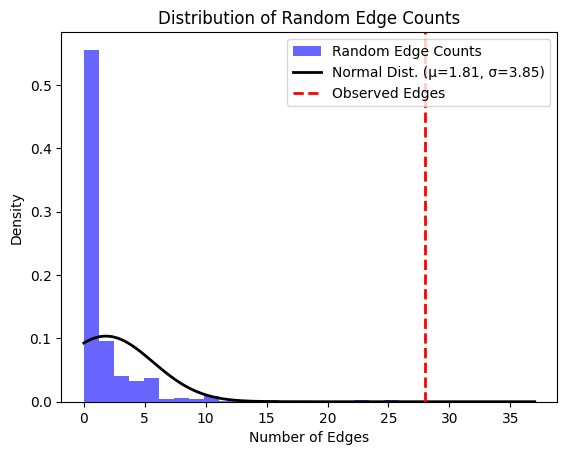

Genes mapped to urinary bladder cancer: 
urinary bladder cancer MONDO_0001187
Genes mapped to urinary bladder cancer: 
['GLDN', 'LINC02780', 'EEF1DP6', 'MYT1L', 'LINC01250', 'LRRC31', 'KRT18P43', 'LINC00504', 'COX19', 'ADAP1', 'MAD1L1', 'SFMBT2', 'GRIN2B', 'LINC00445', 'DCLK1', 'G2E3', 'ARHGAP17', 'LINC02175', 'DCC', 'TFF1', 'ERBB4', 'SHH', 'Y_RNA', 'LINC02645', 'TENM4', 'RNU6', '544P', 'IFT140', 'TMEM204', 'CCDC102B', 'DOK6', 'KRTAP19', '4', '5', 'LINC01411', 'CASC15', 'SLCO5A1', 'AS1', 'RN7SL675P', 'CASC11', 'PSCA', 'TP63', 'P3H2', 'FAM53A', 'SLBP', 'TERT', 'NAT2', 'PSD3', 'LY6K', 'LSP1', 'MCF2L', 'SLC14A1', 'C19orf12', 'CCNE1', 'CBX6', 'APOBEC3A', 'BRK1', 'ACTRT3', 'MIR4457', 'PPIAP58', 'GSTM2', 'UGT1A11P', 'UGT1A8', 'TACC3', 'FGFR3']
Random edges calculation completed

z score: 0.9937978308647419



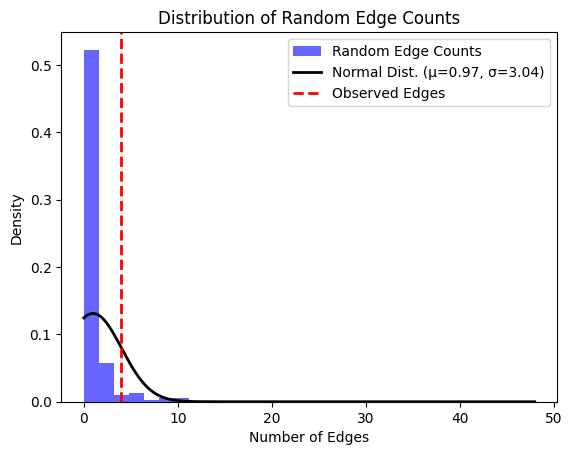

Genes mapped to central nervous system non-hodgkin lymphoma: 
central nervous system non-hodgkin lymphoma MONDO_0044887
Genes mapped to central nervous system non-hodgkin lymphoma: 
['IRF4', 'EXOC2', 'ANO10', 'PVT1', 'BACH2', 'HLA', 'DRB9', 'DRB5', 'DRB1', 'DQA1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to cancer aggressiveness measurement: 
cancer aggressiveness measurement EFO_0006999
Genes mapped to cancer aggressiveness measurement: 
['LINC02667', 'MGMT', 'TMEM241', 'CABLES1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to childhood acute lymphoblastic leukemia: 
childhood acute lymphoblastic leukemia MONDO_0000870
Genes mapped to childhood acute lymphoblastic leukemia: 
['ARID5B']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to cervical carcinoma, Cervical Intraepithelial Neoplasia Grade 2/3: 
cervical carcinoma, Cervical Intraepithelial Neoplas

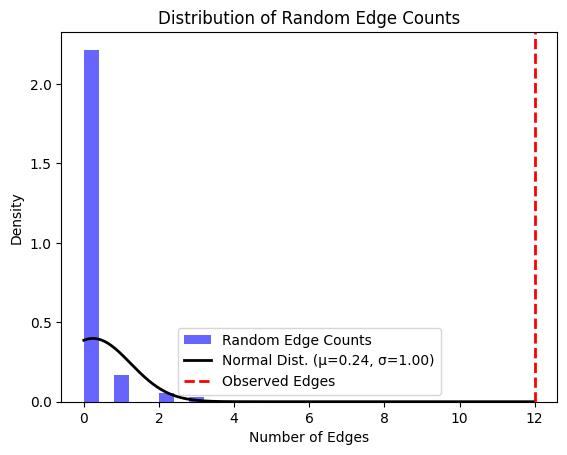

Genes mapped to papillary thyroid carcinoma: 
papillary thyroid carcinoma EFO_0000641
Genes mapped to papillary thyroid carcinoma: 
['NRG1', 'DIRC3', 'LINC02454', 'MSRB3', 'AS1', 'VAV3', 'PCNX2', 'LINC00609', 'SOWAHB', 'SEPTIN11', 'CFAP20DC', 'DT', 'TRMO']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to HER2 status: 
HER2 status EFO_0005514
Genes mapped to HER2 status: 
['ITGA6', 'DLX2', 'DT']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to head and neck malignant neoplasia: 
head and neck malignant neoplasia EFO_0006859
Genes mapped to head and neck malignant neoplasia: 
['ADH1B', 'RPL32P14', 'HSPD1P15', 'TRIM5', 'HLA', 'DQB1', 'LAMC3', 'TBC1D1', 'ATP6AP1L', 'RPL5P16', 'MCTP1', 'IRF4', 'RNU6', '248P', '261P', 'TIAM2', 'STARP1', 'HNRNPA3P5', 'Y_RNA', 'LINC01896']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to human papilloma virus infection, oral cavity c

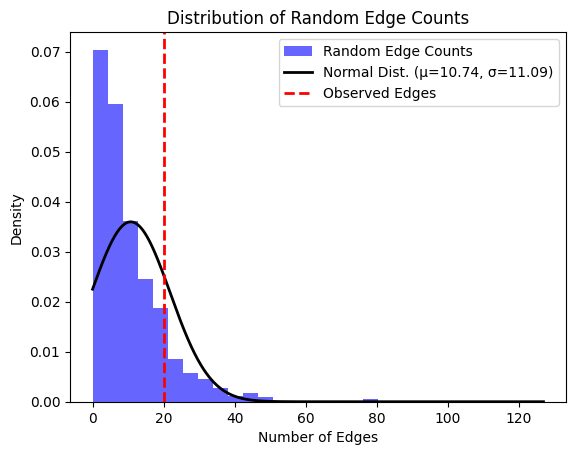

Genes mapped to drug use measurement, prostate cancer: 
drug use measurement, prostate cancer MONDO_0008315
Genes mapped to drug use measurement, prostate cancer: 
['MTNR1A', 'CASC15', 'WDR88', 'CASC19', 'PCAT1', 'HOXB13', 'COL22A1', 'SPATA31F1', 'SPATA31F2P', 'ABO', 'Y_RNA', 'COL5A1', 'AS1', 'LINC00709', 'HSP90AB7P', 'ANK3', 'LCOR', 'GSTO2', 'ITPRIP', 'NELL1', 'LINC02687', 'CHST1', 'SLC15A3', 'CD6', 'LINC02954', 'SMIM38', 'MYEOV', 'PRSS23', 'PCED1B', 'PPIAP45', 'KRT8', 'LINC02412', 'NUDT4', 'LINC01052', 'LINC00402', 'LINC00676', 'IRS2', 'RGS6', 'RPS3AP6', 'NMNAT1P5', 'ABCA13', 'LINC02854', 'LINC01445', 'VSTM2A', 'SEMA3A', 'DGKI', 'GALNTL5', 'MFHAS1', 'RNU6', '682P', 'PRNCR1', 'ECE1', 'CRYBG2', 'GFI1', 'RGS7', 'TRIB2', 'LINC00276', 'LDAH', 'BUB1', 'ACOXL', 'ZNF804A', 'ATP2B2', 'FRMD4B', 'LINC01210', 'HSPA8P9', 'LINC02054', 'TEDDM3P', 'FGF12', 'LINC02211', '374P', 'ATG10', 'ATP6AP1L', 'RPL5P16', 'PRDM6', 'CEP120', 'TIFAB', 'SLC25A48', 'GPR63', 'NDUFAF4', 'MTRES1', 'GPRC6A', 'RFX6', 'TAA

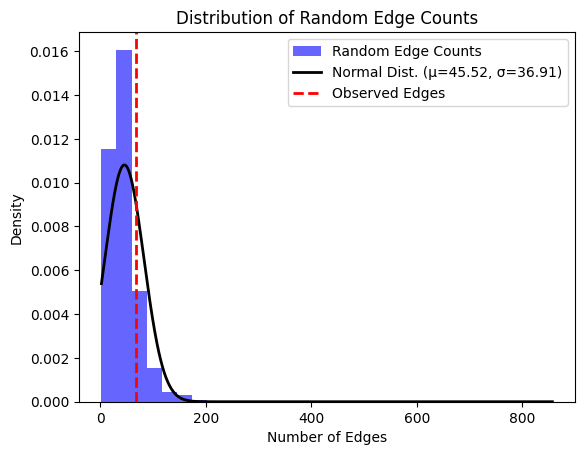

Genes mapped to luminal A breast carcinoma: 
luminal A breast carcinoma MONDO_0021116
Genes mapped to luminal A breast carcinoma: 
['KIF1B', 'LGR6', 'LRRN2', 'TRMT61B', 'WDR43', 'TNFSF10', 'SLC6A18', 'FGF10', 'AS1', 'MRPS30', 'DT', 'DOCK2', 'FOXI1', 'MYL12BP3', 'LYPLA2P1', 'RN7SL563P', 'GRHL2', 'LINC00536', 'MLLT10', 'CUL5', 'C11orf65', 'POGLUT3', 'ZFYVE26', 'VAPA', 'LINC01254', 'NR2F6', 'ANO8', 'GTPBP3', 'PLVAP', 'MTUS2', 'TOX3', 'SLC12A3', 'RPS24P17', 'LDAH', 'CCDC171']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to skin carcinoma in situ: 
skin carcinoma in situ MONDO_0004641
Genes mapped to skin carcinoma in situ: 
['RN7SL51P', 'RN7SL18P']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to family history of breast cancer: 
family history of breast cancer EFO_0005606
Genes mapped to family history of breast cancer: 
['TTC28', 'TOX3', 'MRPS30', 'DT', 'FGFR2', 'CASC16', 'SPESP1']
The number of edges 

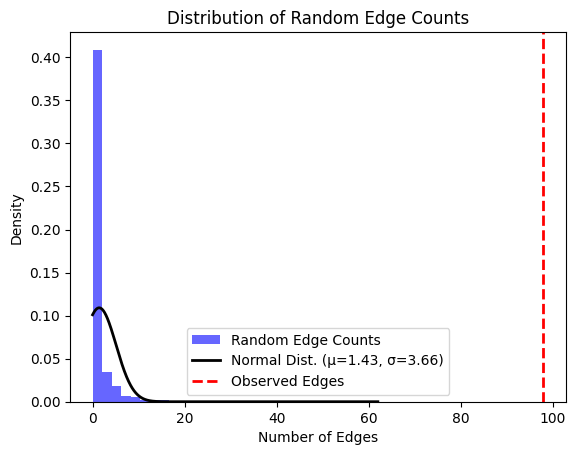

Genes mapped to renal carcinoma: 
renal carcinoma EFO_0002890
Genes mapped to renal carcinoma: 
['SCARB1', 'DPF3', 'ZFYVE1', 'PSEN1', 'NUMB', 'AKT1', 'TLN2', 'TIPIN', 'LCTL', 'CNEP1R1', 'DLG4', 'TP53', 'AP3D1', 'INSR', 'RBBP8NL', 'GATA5', 'MHENCR', 'STMN3', 'RTEL1', 'TNFRSF6B', 'GMDS', 'CDKAL1', 'LINC00581', 'GCAT', 'MTHFD1L', 'REPS2', 'MTND4P24', 'DCAF12L1', 'DNAJC16', 'CDKN2C', 'MIR4421', 'POT1', 'IRF5', 'TNFRSF10B', 'Metazoa_SRP', 'EPAS1', 'PVT1', 'MLLT10', 'LINC02664', 'STN1', 'SLK', 'LINC02952', 'LINC02747', 'LINC01488', 'CCND1', 'ATM', 'C11orf65', 'SLC6A13', 'SSPN', 'ITPR2', 'AS1', 'PGAM1P5', 'NTN4', 'TERT', 'MIR4457', 'ZBTB46', 'TTC28', 'EMID1', 'DINOL', 'CDKN1A', 'NCAPH2', 'MAD1L1', 'GRB10', 'PMF1', 'BGLAP', 'PIGR', 'FCAMR', 'EXO1', 'LINC02580', 'RBPMS', 'LINC01820', 'MYO7B', 'TMEM163', 'ZEB2', 'TEX41', 'RPL6P5', 'LRP2', 'FANCD2', 'VHL', 'KAT2B', 'EIF1B', 'FBXW12', 'SFMBT1', 'RNU6', '488P', 'PROS1', 'NSUN3', 'ARMC10P1', 'TFDP2', 'ACTRT3', 'MYNN', 'LINC02068', 'PPARGC1A', 'H2AZ1

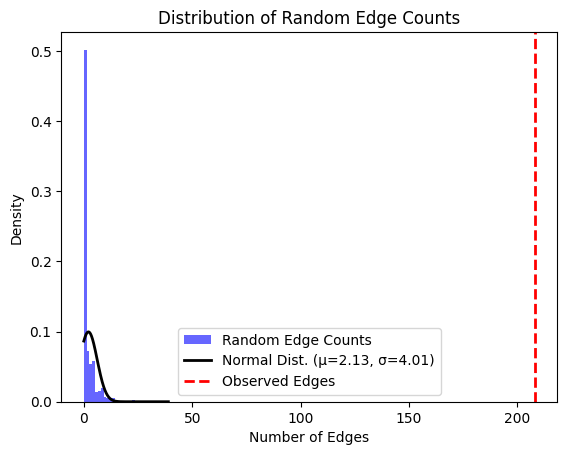

Genes mapped to papillary renal cell carcinoma: 
papillary renal cell carcinoma EFO_0000640
Genes mapped to papillary renal cell carcinoma: 
['ELF3', 'Y_RNA', 'PLEKHA6', 'USP38', 'KCP', 'IRF5', 'KCNH3', 'MTCO3P13', 'WEE1P2', 'MIR99AHG']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to Gleason score measurement: 
Gleason score measurement EFO_0007000
Genes mapped to Gleason score measurement: 
['ARRDC4']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to thyroid cancer: 
thyroid cancer MONDO_0002108
Genes mapped to thyroid cancer: 
['LINC01243', 'MTATP6P30', 'CRB2', 'ACSS3', 'RNU6', '1249P', 'TMEM100', 'LINC01117', 'PGAP1', 'ANKRD44', 'DIRC3', 'NRG1', 'LINC00861', 'PTCSC2', 'STN1', 'LINC00609', 'ZNF765', 'MAFTRR', 'LINC01229', 'LINC02082', 'LINC01997', 'PCNX2', 'MSRB3', 'AS1', 'TERT', 'EPB41L4A', 'MBIP']
Random edges calculation completed

z score: 3.6880161143287293



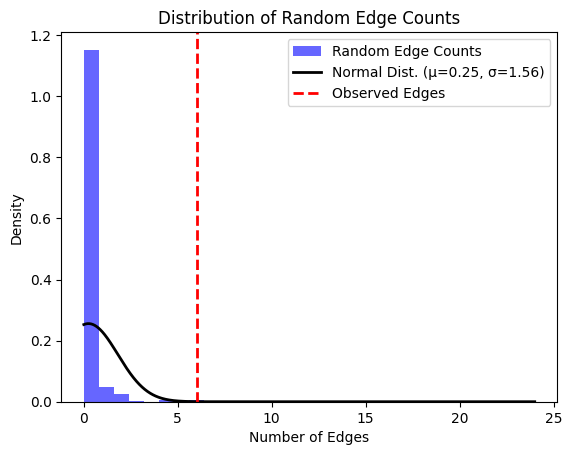

Genes mapped to pharynx cancer: 
pharynx cancer EFO_0005577
Genes mapped to pharynx cancer: 
['ADH1B', 'RSBN1L']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to nucleoside diphosphate kinase A measurement: 
nucleoside diphosphate kinase A measurement EFO_0009947
Genes mapped to nucleoside diphosphate kinase A measurement: 
['LTF', 'CFH']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to BRCA1 mutation carier status: 
BRCA1 mutation carier status EFO_0011021
Genes mapped to BRCA1 mutation carier status: 
['CELF1', 'RAPSN', 'JUP', 'KRT35', 'DNAJC7', 'EIF1', 'GAST', 'KRTAP4', '5', 'P3H4']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to BRCA2 mutation carier statu: 
BRCA2 mutation carier statu EFO_0011022
Genes mapped to BRCA2 mutation carier statu: 
['WDR95P', 'STARD13', 'AS', 'PPIAP88', 'RNU6', '996P', 'ETAA1', 'B3GLCT', 'RXFP2', 'LINC00457', 'Metazoa_SRP', 'R

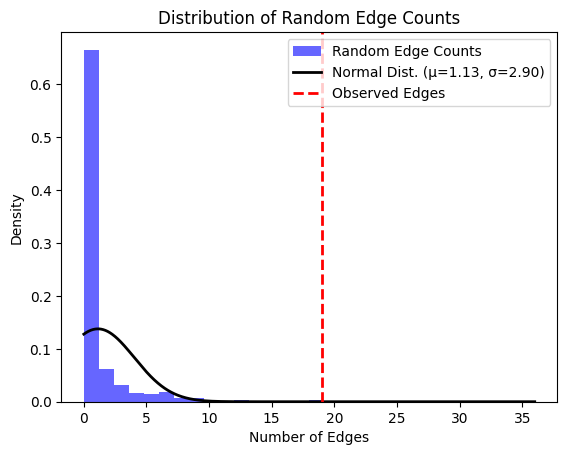

Genes mapped to bronchus cancer: 
bronchus cancer MONDO_0001672
Genes mapped to bronchus cancer: 
['TERT', 'BRCA2', 'CHRNA5', 'CYP2A6', 'CHRNA4']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to respiratory system cancer: 
respiratory system cancer MONDO_0000376
Genes mapped to respiratory system cancer: 
['TERT', 'MIR4457', 'BRCA2', 'CHRNA5', 'CYP2A6', 'CHRNA4']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to liver cancer: 
liver cancer MONDO_0002691
Genes mapped to liver cancer: 
['KLHL8', 'HLA', 'DQB1', 'MTCO3P1', 'CASC9', 'MAU2', 'GATAD2A', 'IFNL3', 'PNPLA3']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to tongue cancer: 
tongue cancer MONDO_0004631
Genes mapped to tongue cancer: 
['HLA', 'DQB1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to major salivary gland cancer: 
major salivary gland cancer MONDO_004

In [4]:
cancerous = compute_clustering(cancers, "data/cancerous_clustering_biogrid.csv", 'biogrid')

In [ ]:
cancerous_output, not_included = cancerous

In [ ]:
len(cancerous_output)

In [ ]:
len(not_included)

In [ ]:
type 2 diabetes mellitus MONDO_0005148
body mass index EFO_0004340

Genes mapped to necrotizing enterocolitis: 
necrotizing enterocolitis EFO_0003928
Genes mapped to necrotizing enterocolitis: 
['TCF20', 'ADCY4', 'BANP', 'KIAA1328', 'RNF144A', 'RN7SKP112', 'TESHL', 'SYN2', 'GPATCH11P1', 'RNU6', '1270P', 'OTOL1', 'TOMM22P6', 'MCTP1', 'TIAM2', 'NXPH1', 'GAPDHP68', 'SLC37A3', 'ADAM7', 'AS1', 'ADAM28', 'IDO2', 'CARS1P2', 'TRPS1', 'RPS19P6', 'RPS20P25', 'MACROD2', 'Y_RNA', 'SRSF6']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to HSV2 virologic severity measurement: 
HSV2 virologic severity measurement EFO_0009010
Genes mapped to HSV2 virologic severity measurement: 
['CT70', 'RN7SKP191', 'KIF1B', 'PRKN', 'SPRY4', 'AS1', 'ZNF488', 'LINC02752', 'EYA1', 'U8', 'SLITRK6', 'MOB1AP1', 'MGAT5B', 'Metazoa_SRP', 'CEP120', 'HMGB3P17', 'ARHGAP25']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to Plantar Fasciitis, Plantar Fibromatosis: 
Plantar Fasciitis, Plantar Fibromatosis EFO_100

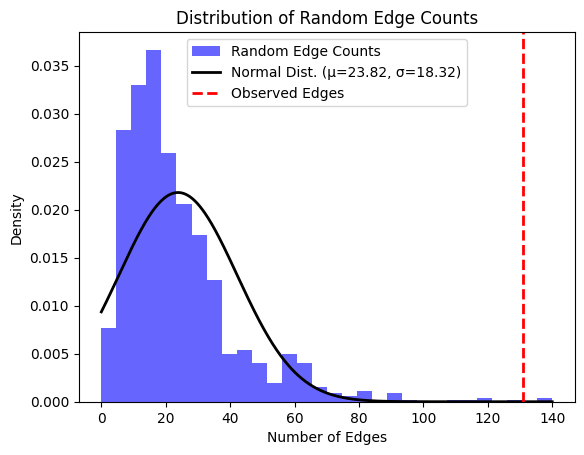

Genes mapped to body mass index: 
Genes mapped to type 2 diabetes mellitus: 
Genes mapped to response to antipsychotic drug, metabolic syndrome: 
response to antipsychotic drug, metabolic syndrome EFO_0000195
Genes mapped to response to antipsychotic drug, metabolic syndrome: 
['GPR139', 'SNRPEP3', 'STAM2', 'APOA5', 'CATSPER2P1', 'PPP1R3B', 'DT', 'HNF4A', 'JMJD1C', 'CYB5B', 'NFAT5', 'USP1', 'LINC01625', 'ATP5PBP6', 'KLF14', 'LINC', 'PINT', 'ARID1A', 'COBLL1', 'ZC3H4', 'NPC1', 'LINC00880', 'LINC02245', 'LINC02576', 'AFF1', 'PDXDC1', 'NTAN1', 'SNX10', 'LINC01875', 'TMEM18', 'HLA', 'B', 'CRTAC1', 'TYRO3', 'SLC39A8', 'PGS1', 'NAALADL1', 'CDCA5', 'ZPR1', 'HERPUD1', 'CETP', 'LPL', 'RPL30P9', 'CD300LG', 'TRIB1AL', 'ANGPTL4', 'GALNT2', 'APOE', 'APOC1', 'APOB', 'FADS2', 'ALDH1A2', 'FTO', 'NYAP2', 'MIR5702', 'VEGFA', 'LINC02537', 'BAZ1B', 'RNU4', '17P', 'MC4R', 'CMIP', 'CELF1', 'PABPC4', 'HEYL', 'RPL31P23', 'PCCB', 'C5orf67', 'ILRUN', 'GCKR', 'DRB1', 'DQA1', 'LIPG', 'SMUG1P1', 'DR1', 'Y_RNA', 'O

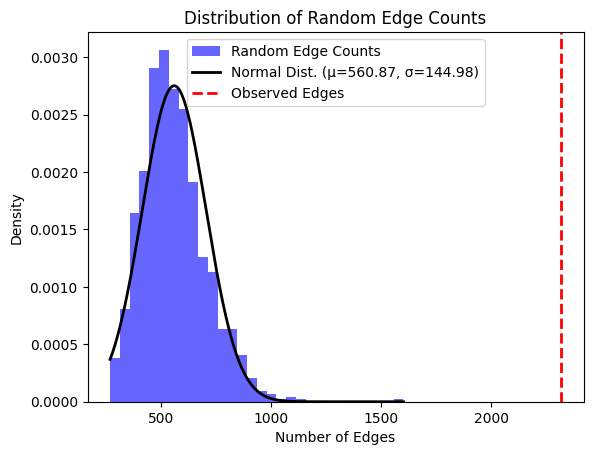

Genes mapped to cortisol measurement: 
cortisol measurement EFO_0005843
Genes mapped to cortisol measurement: 
['SERPINA6', 'SERPINA2', 'CD200R1L', 'CD200R1P1', 'LDLR', 'RNU6', '929P', 'BMP7', 'EGFEM1P', 'DGKH', 'CNTNAP5', 'LINC01449', 'INHBA', 'TMPRSS9', 'SPC24', 'PDE10A', 'ADAM20P3', 'ZFP42', 'MKNK1', 'SLFN12', 'SERPINA10']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to schizophrenia: 
Genes mapped to Alzheimer disease: 
Alzheimer disease MONDO_0004975
Genes mapped to Alzheimer disease: 
['BIN1', 'NIFKP9', 'MS4A2', 'LINC02705', 'RNU6', '560P', 'LINC02695', 'APOE', 'SIGLEC22P', 'CD33', 'ANKRD31', 'SORL1', 'ARL17B', 'CLU', 'EPHA1', 'AS1', 'SLC24A4', 'MEF2C', 'ZCWPW1', 'GPR141', 'CELF1', 'HLA', 'DRB1', 'DQA1', 'PTK2B', 'CD2AP', 'ABCA7', 'CR1', 'NDUFAF6', 'SCIMP', 'ZNF594', 'DT', 'CNTNAP2', 'MIR4432HG', 'LINC02508', 'HSP90AA4P', 'LINGO2', 'CHST1', 'MIR7154', 'CATSPERB', 'ATP5PF', 'GRIN2B', 'RAP1BP2', 'EZRP1', '1060P', 'SPTLC1P2', 'SLC2A13', 'R

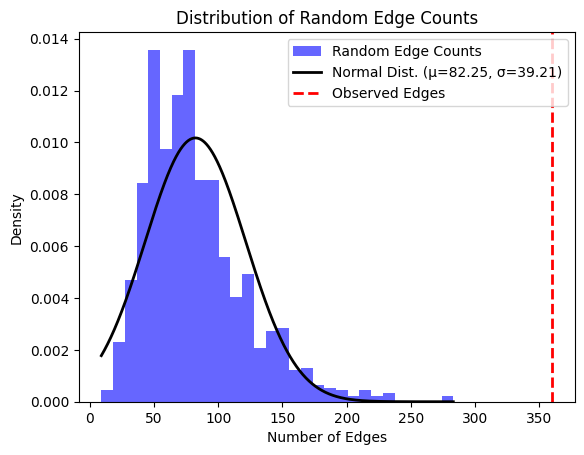

Genes mapped to brain aneurysm: 
brain aneurysm EFO_0003870
Genes mapped to brain aneurysm: 
['SLC35F3', 'CCDC80', 'PTPRD', 'CARHSP1', 'SYN3', 'FHIT', 'ANGPT4', 'CPNE4', 'RGS6', 'HLCS', 'PROM1', 'ARNILA', 'CAMK2B', 'RSPH9', 'LINC00558', 'ESRRG', 'GPATCH2', 'PINX1', 'DT', 'XKR6', 'PLB1', 'SIRPG', 'PABPC3', 'AMER2', 'CARD11', 'PARD3B', 'RBFOX1', 'LINC02152', 'DNAJA4', 'RNU6', '363P', 'PDZD2', 'PCAT1', 'RBMS3', 'LINC00708', 'KRT8P37', 'RP1L1', 'SOX7', 'NAPA', 'AS1', 'DSCAM', 'LRRC3', 'SLC5A4', 'PRDM2', 'GBA1', 'FMO4', 'RNF144A', 'LINC02991', 'LINC01237', 'SPCS3', 'HAFML', 'TCF24', 'CCDC171', 'LINC03041', 'LINGO2', 'TMOD1', 'SUSD1', 'U2', 'LINC00474', 'OLFML2A', 'MYEOV', 'ARHGAP32', 'CD163L1', 'SLC2A14', 'DRAM1', 'LDHBP1', 'LINC02130', 'DYNLRB2', 'SCARF1', 'MINK1', 'SLC47A1', 'RPS4XP18', '1032P', 'RNU105C', 'RN7SL250P', 'RP1', 'CNNM2', 'CDKN2B', 'STARD13', 'BOLL', 'PRMT5P1', 'EDNRA', 'BET1L', 'ALDH2', 'HDAC9', 'FERD3L', 'POLR1F', 'FBN1', 'ANKRD44', 'IT1', 'RPL31P26', 'MIR3936HG', 'NT5C2', 

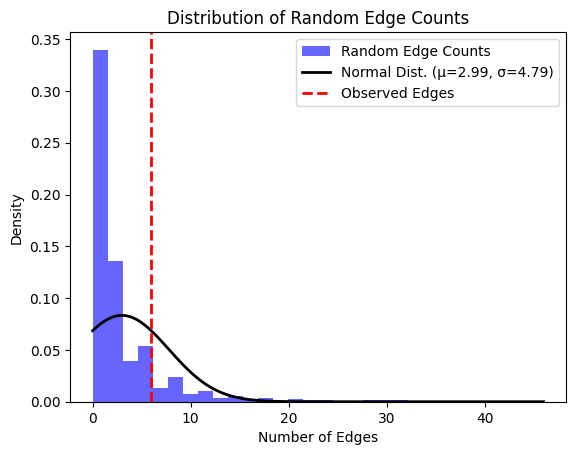

Genes mapped to osteoarthritis: 
osteoarthritis MONDO_0005178
Genes mapped to osteoarthritis: 
['LINC01340', 'ZNF345', 'LINC01094', 'LYPLAL1', 'AS1', 'TGFA', 'EQTN', 'MOB3B', 'SMC4P1', 'THSD7B', 'PSMC1P3', 'CHRM2', 'COL27A1', 'LCT', 'FSTL5', 'SRBD1', 'NR2F2', 'LINC01507', 'NPAP1P4', 'PTPRG', 'MARK2P15', 'LINC02650', 'TSPAN17', 'LINC01574', 'RPL26P31', 'SLC36A4', 'KIAA1755', 'LURAP1L', 'Y_RNA', 'PPIAP1', 'NCAM2', 'MDFIC2', 'SAMMSON', 'LINC02680', 'DLGAP2', 'PRDM2', 'KAZN', 'SH3BP2', 'MINAR1', 'TFDP1P3', 'JPH3', 'HECW1', 'NKAIN1', 'ANXA3', 'COG5', 'DOT1L', 'GNL3', 'SUPT3H', 'FTO', 'MCF2L', 'DUS4L', 'BCAP29', 'ALDH1A2', 'CAMK2B', 'DNAH10', 'NACA2', 'LINC01754', 'RPL35AP', 'LSMEM1', 'NPM1P14', 'CHADL', 'RFLNA', 'MAPT', 'DND1P1', 'MAPK8IP1P2', 'RP1L1', 'KANSL1', 'MAPK8IP1P1', 'COL11A1', 'ZC3H11B', 'KIF26B', 'MPPED2', 'DCDC1', 'TSKU', 'MPHOSPH9', 'CPSF6', 'CRADD', 'CSK', 'LMAN1L', 'DPEP1', 'TMEM241', 'SLC44A2', 'TGFB1', 'RAPH1', 'LTBP1', 'UQCC1', 'SCUBE1', 'RBM6', 'SLC39A8', 'ECM1P2', 'U6', 

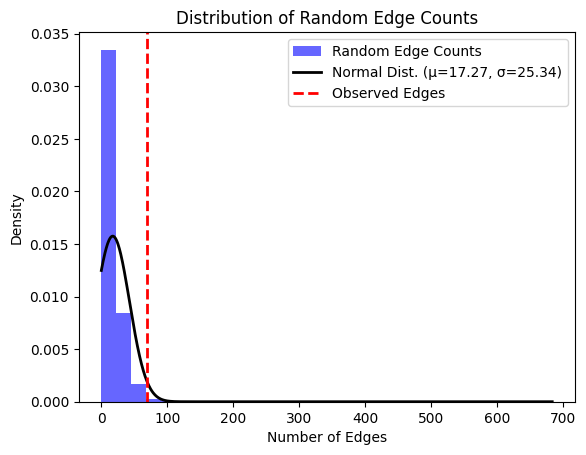

Genes mapped to osteoarthritis, hip: 
osteoarthritis, hip EFO_1000786
Genes mapped to osteoarthritis, hip: 
['MAP2K6', 'PLEC', 'HDAC9', 'COL27A1', 'LYPLAL1', 'AS1', 'CCDC26', 'DELEC1', 'TNC', 'LMX1B', 'LTBP3', 'RFLNA', 'TBX4', 'NACA2', 'SMO', 'COL11A1', 'ZC3H11B', 'IL11', 'ITIH1', 'FILIP1', 'RUNX2', 'ASTN2', 'RN7SKP15', 'PTHLH', 'SMAD3', 'HFE', 'H2BC4', 'EP300', 'CHADL', 'RPL26P20', 'H3P27', 'SUPT3H', 'TGFA', 'GLT8D1', 'GNL3', 'ERG', 'LINC00114', 'PPP1R3B', 'DT', 'SPTBN2', 'GSDMC', 'MAPT', 'LRIG3', 'TACC3', 'BMP5', 'COLGALT2', 'RPRD2', 'MLXIP', 'ECM1P2', 'U6', 'RPL14P6', 'RPL21P34', 'HERC2', 'SPAG17', 'RNA5SP56', 'MASP1', 'RTP4', 'LPP', 'P3H2', 'RALGPS1', 'U2', 'TLR4', 'TPT1P9', 'TLN2', 'RNU1', '98P', 'NEK4P1', 'ECRG4', 'PIK3R1', 'LINC02198', 'RNF130', 'FTO', 'CHST3', 'SHBG', 'PIEZO1', 'PLCL2', 'CDC5L', 'TSEN15', 'BRIP1']
Random edges calculation completed

z score: 14.584313333899118



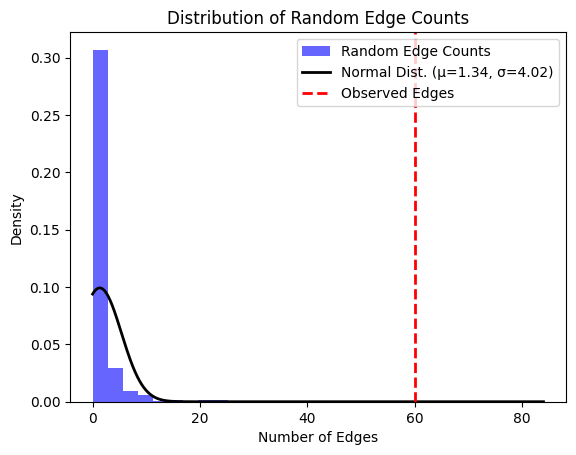

Genes mapped to osteoarthritis, knee: 
osteoarthritis, knee EFO_0004616
Genes mapped to osteoarthritis, knee: 
['NT5DC2', 'KIAA1217', 'AGAP1', 'BTNL8', 'CCDC54', 'AS1', 'DUBR', 'USP8', 'USP50', 'KCNIP4', 'EQTN', 'MOB3B', 'TGFBR3', 'MAP2K6', 'LYPLAL1', 'SMC4P1', 'THSD7B', 'RWDD2B', 'USP16', 'LTBP1', 'KIF12', 'COL27A1', 'SBNO1', 'WWP2', 'GDF5', 'CHADL', 'PACERR', 'PLA2G4A', 'PARD3B', 'BTNL2', 'TSBP1', 'FTO', 'NF1', 'TGFB1', 'NABP1', 'CAVIN2', 'TGFA', 'UQCC1', 'ERG', 'ITIH1', 'SLBP', 'FGF18', 'HLA', 'DPB1', 'SUPT3H', 'DYNC1I1', 'RN7SL178P', 'CLDN23', 'GLIS3', 'GLT8D1', 'SMAD3', 'COL11A1', 'ZC3H11B', 'LINC02742', 'RN7SKP15', 'PTHLH', 'ATP2B1', 'CRADD', 'CCDC33', 'POLR2M', 'ALDH1A2', 'NFAT5', 'SMG6', 'ROCR', 'AP3B1', 'RNF32', 'DT', 'MAGI1', 'ANKRD6', 'EPPK1', 'PLEC', 'PAX7', 'TAS1R2', 'RNA5SP349', 'LINC02715', 'LINC02103', 'RNU6', '909P', 'LINC02752', 'FRMD4A', 'NOD1', 'CRBN', 'SUMF1', 'MS4A13', 'MS4A19P', 'PCSK9', 'CNN2P10', 'POGK', 'NDST4', 'MRPS33P3', 'SMIM23', 'PPM1H', 'TSKU', 'WSCD2', 

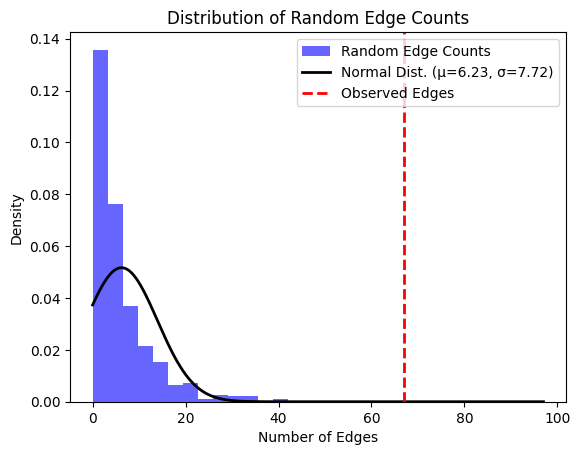

Genes mapped to major depressive disorder: 
Genes mapped to atrial fibrillation: 
atrial fibrillation EFO_0000275
Genes mapped to atrial fibrillation: 
['GOSR2', 'ATXN1', 'KCNH2', 'FBXO32', 'XPO7', 'GJA5', 'GJA8', 'REEP3', 'PTGES3', 'NACA', 'DDX39AP1', 'SNORD36', 'POLR2A', 'Y_RNA', 'MEX3C', 'LINC01629', 'LINC02289', 'HMGB3P18', 'RNU1', '18P', 'CASZ1', 'TBX5', 'CEP85L', 'SORL1', 'RNU6', '256P', 'NUCKS1', 'SPATS2L', 'RPL3L', 'CDKN1A', 'SLC25A26', 'KCNN3', 'WNT8A', 'NME5', 'KDM1B', 'LINC00964', 'SH3PXD2A', 'BEST3', 'RAB3IP', 'TTN', 'AS1', 'ERBB4', 'LINC00208', 'GATA4', 'CCDC92', 'WDR1', 'RAF1P1', 'CALM2P1', 'CASC17', 'LINC01438', 'MIR297', 'SLC9B1', 'PTK2', 'AOPEP', 'CREB5', 'SYNPO2L', 'GMCL1', 'SNRNP27', 'KIF3C', 'LINC01950', 'PSMC1P5', 'XPO1', 'RPS29P10', 'SCN10A', 'TEX41', 'CAND2', 'PITX2', 'NKX2', '5', 'RCN1P1', 'ZNF292', 'KCNN2', 'HCN4', 'REC114', 'MIR1', '1HG', 'LINC01681', 'MYOCD', 'U8', 'KDM3A', 'THRB', 'PHLDB2', 'RPL23AP8', 'CFL2', 'SCN5A', 'ZFAT', 'MIR30B', 'DPF3', 'GTF2I', 'ASA

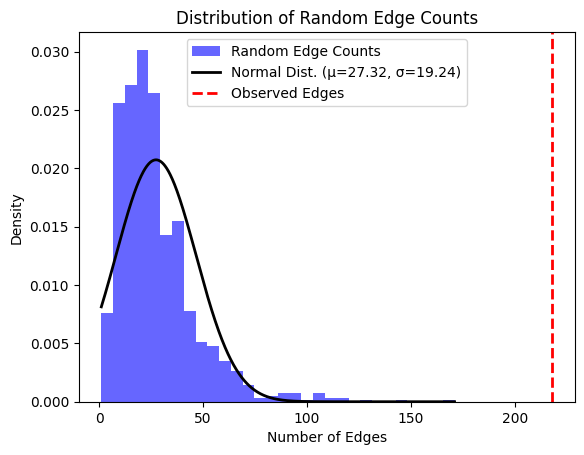

Genes mapped to phosphatidylethanolamine ether measurement: 
phosphatidylethanolamine ether measurement EFO_0010229
Genes mapped to phosphatidylethanolamine ether measurement: 
['MYRF', 'TMEM258', 'FADS2', 'FADS1', 'TMEM86B', 'GALNT16', 'LINC01723']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to phosphatidylinositol measurement: 
phosphatidylinositol measurement EFO_0010230
Genes mapped to phosphatidylinositol measurement: 
['HLMR1', 'APOC3', 'FADS2', 'MBOAT7', 'FADS1', 'TMC4', 'TMEM258', 'MYRF', 'SLCO1B1', 'LINC01755', 'DOCK7', 'ACTBP8', 'RNGTT', 'MPC1', 'DT', 'RPS6KA2', 'CCDC26', 'SLCO1C1', 'SLCO1B3', 'ZPR1', 'LIPG', 'SMUG1P1', 'MIR1908', 'ELOVL2', 'RBMX2P4', 'ETV1', 'SWI5', 'LINC03082', 'LENG1', 'SUPT6H', 'PRPF31', 'TSEN34', 'RPS9', 'DNER', 'TBRG4', 'RAMP3', 'RAB3IL1', 'ANO2', 'CETP', 'FADS3', 'RNU6', '1243P', 'BEST1', 'LINC02733', 'PPP1CC', 'RPL29P25', 'TTC6', 'SSTR1', 'FGF12', 'HOTAIR', 'FOXN3', 'GALNT2', 'RPL21P130', 'UNC13A', 'CYYR1',

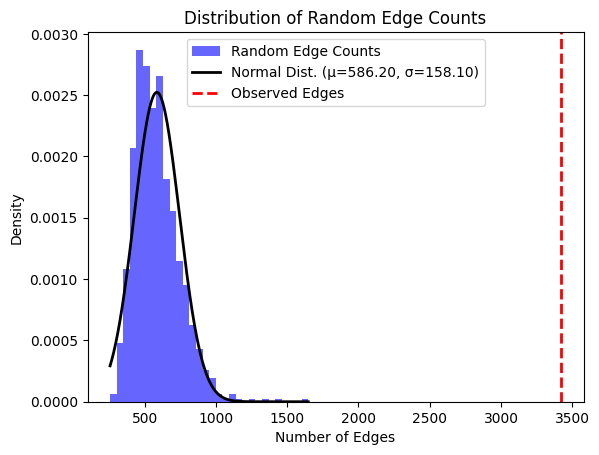

Genes mapped to aortic stenosis: 
aortic stenosis EFO_0000266
Genes mapped to aortic stenosis: 
['LINC01708', 'TEX41', 'LPA', 'FAM167A', 'AS1', 'DOCK6', 'FADS1', 'FADS2', 'ARHGEF26', 'SMC2', 'BET1L', 'COX8BP', 'NLRP6', 'HMGB1', 'TMEM170A', 'ATP7BP1', 'RPS4XP18', 'ALPL', 'IPO9', 'NAV1', 'IL6', 'STEAP1B', 'TMEM258', 'MYRF', 'CELSR2', 'PRRX1', 'ACTR2', 'SPRED2']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to HIV-1 infection, Susceptibility to viral and mycobacterial infections: 
HIV-1 infection, Susceptibility to viral and mycobacterial infections Orphanet_391311
Genes mapped to HIV-1 infection, Susceptibility to viral and mycobacterial infections: 
['HSD17B8', 'MIR219A1', 'HLA', 'DPB1', 'LZTS1', 'TMEM97P2', 'DQB2', 'IL32', 'NEDD9', 'NAV2', 'ADAM18', 'BICRA', 'CYP7B1', 'PC', 'PRKG2', 'GPR156', 'PTOV1P1', 'SPOCK1', 'MIR8074', 'SIGLEC22P', 'FRMPD1', 'EBLN3P', 'KDM4C']
The number of edges in the network is less than the minimum requirement: 4

Gen

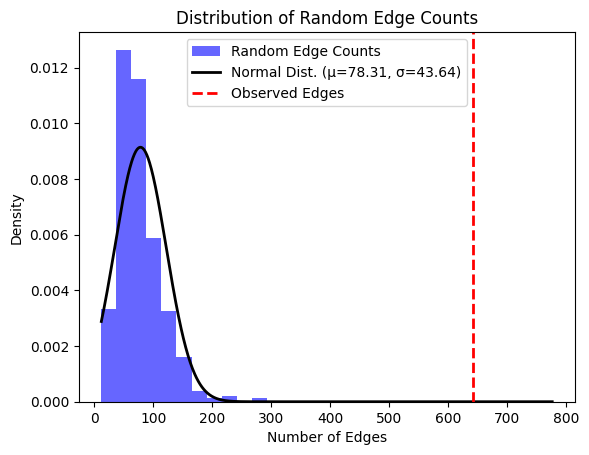

Genes mapped to non-obstructive coronary artery disease: 
non-obstructive coronary artery disease EFO_1001483
Genes mapped to non-obstructive coronary artery disease: 
['RNF39', 'PHLPP1', 'BCL2', 'ATP2B1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to alcohol dependence: 
alcohol dependence MONDO_0007079
Genes mapped to alcohol dependence: 
['LHPP', 'ADH1B', 'BRAP', 'CLCN4', 'MID1', 'PECR', 'MREG', 'CAST', 'ERAP1', 'PPP2R2B', 'ESR1', 'TMEM183AP4', 'PCNX1', 'SERINC2', 'TNN', 'KIAA0040', 'PKNOX2', 'LINC01765', 'NGF', 'AS1', 'NPHP3', 'TMEM108', 'MUC7', 'GADD45G', 'LINC03062', 'RNU6', '70P', 'LINC01079', 'DDHD1', 'DT', 'C15orf32', 'RNU4', '45P', 'MAPK6P2', 'LRFN5', 'YWHAQP1', 'HIP1', 'LINC01818', 'LINC02054', 'TEDDM3P', 'KRT18P56', 'LINC00604', 'ANKS1A', 'MBNL2', 'DCC', 'CYCSP19', 'RN7SKP277', 'LINC00924', 'COL6A1', 'PSMA6P3', 'MARK2P14', 'RN7SL147P', 'RPS21P8', 'RPS20P32', 'ZNF124', 'ZNF731P', 'RPSAP11', 'CMTM8', 'STX18', 'SGCG', 'ADH1C', 'CAP

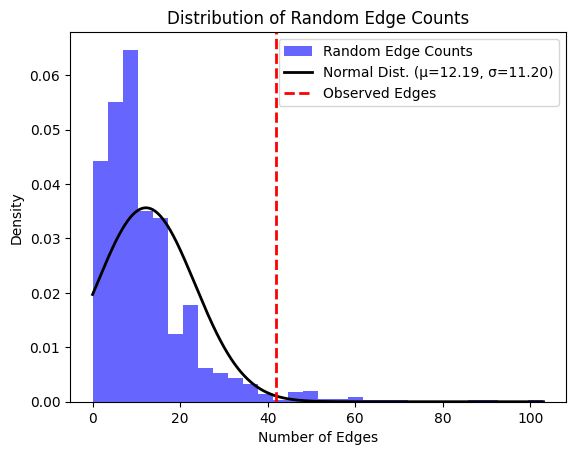

Genes mapped to type 1 diabetes mellitus: 
type 1 diabetes mellitus MONDO_0005147
Genes mapped to type 1 diabetes mellitus: 
['INS', 'IGF2', 'BTN2A3P', 'GATA3', 'HLA', 'DQB1', 'AS1', 'RAB5B', 'TH', 'RNASET2', 'MIR3939', 'PLEKHA1', 'MIR4686', 'ASCL2', 'MIR130B', 'PPIL2', 'LINC00320', 'STK39', 'LRP1B', 'TYK2', 'PGM1', 'PRKCQ', 'ERBB3', 'ATXN2', 'SH2B3', 'CTSH', 'PTPN2', 'UBASH3A', 'Y_RNA', 'IL10', 'CENPW', 'MIR588', 'GRB10', 'COBL', 'MED6P1', 'RNLS', 'CD69', 'LINC01550', 'LINC02295', 'CTRB2', 'CTRB1', 'SIRPG', 'HORMAD2', 'LIF', 'MIR3681HG', 'DRA', 'PTPN22', 'AP4B1', 'IFIH1', 'BLTP1', 'GSDMB', 'CTLA4', 'ICOS', 'SKAP2', 'DNAH2', 'PRKD2', 'CCR7', 'SMARCE1', 'GAB3', 'GP2', 'UMOD', 'BACH2', 'RPL32P23', 'RBM17', 'CLEC16A', 'C1QTNF6', 'LINC02357', 'GLIS3', 'ZFP36L1', 'MAGOH3P', 'IL27', 'NUPR1', 'IKZF4', 'IL2RA', 'CUX2', 'NAA25', 'PHTF1', 'RSBN1', 'CLEC2D', 'LINC02390', 'ADAD1', 'FSTL4', 'DQA1', 'LINC02649', 'RMI2', 'LINC01882', 'ITSN2', 'NCOA1', 'RASGRP1', 'LPAR3', 'CD226', 'CAPSL', 'IL7R', 'LI

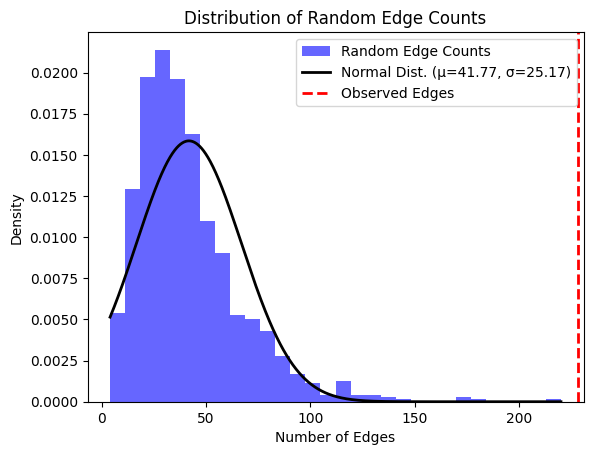

Genes mapped to blood urea nitrogen measurement: 
blood urea nitrogen measurement EFO_0004741
Genes mapped to blood urea nitrogen measurement: 
['BCAR3', 'LARP4B', 'SORL1', 'RNU6', '256P', 'SPI1', 'SLC39A13', 'AS1', 'BCL2L14', 'RERG', 'RN7SKP142', 'LINC01571', 'CDK12', 'FUT2', 'MAMSTR', 'LINC01101', 'Y_RNA', 'DDX1', 'LINC01804', 'HOXD', 'AS2', 'PDE1A', 'SH3YL1', 'ALMS1P1', 'MECOM', 'LINC02028', 'LINC02924', 'TFEB', 'RBPMS', '66P', 'RNU4', '10P', 'PHC2', 'PIK3CG', 'PRKAR2B', 'CYP1A1', 'CYP1A2', 'PTMAP6', '929P', 'GRHL1', 'HMGN1P19', 'EPS15P1', 'CCDC57', 'PRDM8', 'FGF5', 'ZNF704', 'PAG1', 'LINC02171', 'LINC02600', 'SNORA70', 'RN7SL734P', 'CFAP53P1', 'INTS6P1', 'FAIM2', 'LINC00649', 'CDKN2C', 'MIR4421', 'INSR', 'PLPPR3', 'CYP26A1', 'NIP7P1', 'PLCD4', 'RAD17', 'JRK', 'PSCA', 'PPM1D', 'SH2B3', 'ATXN2', 'FTH1P5', 'TIAL1P1', 'PAX8', 'GIPR', 'TMEM171', 'TMEM174', 'HNF1B', 'WDR72', 'IZUMO1', 'FUT1', 'BCAS3', 'FTO', 'GON4L', 'SHROOM3', 'PITPNC1', 'RPL31P23', 'PCCB', 'LINC00861', '869P', 'C12orf4

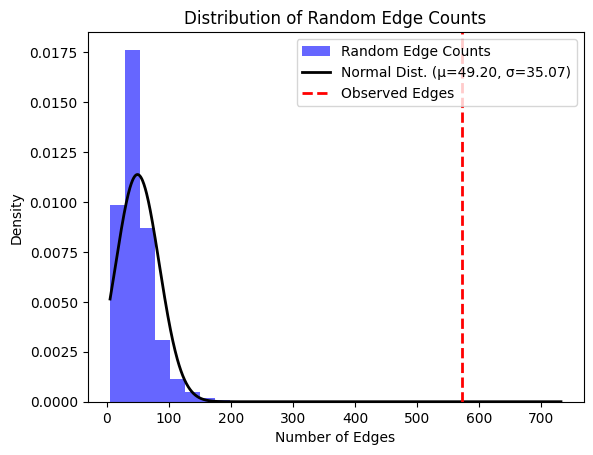

Genes mapped to chronic kidney disease: 
chronic kidney disease EFO_0003884
Genes mapped to chronic kidney disease: 
['PDILT', 'HOXD', 'AS2', 'LARP4B', 'WDR72', 'NFATC1', 'PPM1J', 'DT', 'ALMS1P1', 'PSD4', 'PAX8', 'AS1', 'RGS14', 'TBX2', 'BCAS3', 'L3MBTL3', 'LINC02750', 'OR4C50P', 'RNF32', 'SLC47A1', 'OR4B2P', 'OR4X2', 'SPI1', 'SLC39A13', 'PIP5K1B', 'CEP89', 'TESHL', 'LINC02694', 'MYPN', 'EPB41L3', 'SPTBN1', 'GUSBP18', 'RAI14', 'TFCP2L1', 'RGS19', 'ZNF436', 'TCEA3', 'STC1', 'RNU1', '148P', 'ARG1', 'RERG', 'MYO19', 'LINC02920', 'CYCSP42', 'CPS1', 'TRIM49B', 'DAB2', 'KRT8P26', 'AP5B1', 'UNCX', 'MICALL2', 'SLC34A1', 'SHROOM3', 'PRDM8', 'FGF5', 'SDCCAG8', 'GATM', 'AQP4', 'MPPED2', 'DCDC1', 'SLC22A2', 'PRKAG2', 'HOXD1', 'RPSAP25', 'DSCAM', 'PCSEAT', 'LINC00111', 'GIPC2', 'RNFT1P2', 'LINC00624', 'RN7SL553P', 'MTARC2P1', 'LINC02264', 'NDST3', 'THSD7A', 'LYPLA2P3', 'FOXB2', 'RNU6', '783P', 'LINC02686', 'ZAR1L', 'LINC02284', 'FTO', 'LINC02140', 'LINC02183', 'CDRT15', 'HS3ST3B1', 'LINC', 'ROR', '

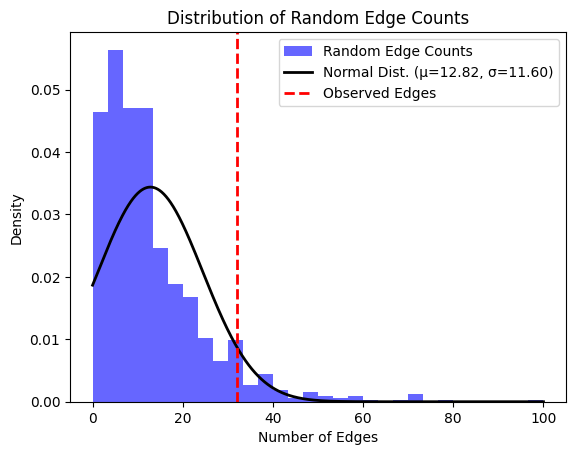

Genes mapped to hypertension: 
hypertension EFO_0000537
Genes mapped to hypertension: 
['ATP2B1', 'LINC00609', 'MBIP', 'CSK', 'USP8', 'LSP1', 'FURIN', 'TBX3', 'AS1', 'UBA52P7', 'Y_RNA', 'RPS27P11', 'LINC02875', 'TBX2', 'HOTTIP', 'CACNA1D', 'CYP11B2', 'LY6E', 'DT', 'CAPZA1', 'CDKN2B', 'ARHGEF12', 'ARHGAP42', 'HOXA11', 'GML', 'FGD5', 'TTBK1', 'SLC22A7', 'FIGN', 'PRPS1P1', 'GUCY1A1', 'NHLRC2', 'ADRB1', 'SWAP70', 'ENOSF1', 'YES1', 'MYO9B', 'UBA52P4', 'RNU1', '96P', 'ZNF318', 'NPNT', 'CRIP3', 'CYP17A1', 'HOXA3', 'HOXA', 'AS2', 'GDF10', 'FGD4', 'ENPEP', 'BORCS7', 'ASMT', 'LINC02120', 'LINC02160', 'LINC02871', 'TCP1P3', 'LINC02468', 'WBP1L', 'NFATC2', 'LINC01752', 'RPS4XP9', 'RSPO3', 'H19', 'LRRC10B', 'EBF1', 'PGPEP1', 'GUCY1B1', 'CUX2', 'FGF5', 'PRDM8', 'CASZ1', 'KCNK3', 'NT5C2', 'RPL37P11', 'EML6', 'MOV10', 'CNNM2', 'WNT2B', 'RPTOR', 'ADH1C', 'ADH7', 'POLR2M', 'ALDH1A2', 'LRRC7', 'MYO1D', 'KDM4A', 'MIPEPP2', 'CHRM3', 'NR2F2', 'MSRA', 'ZNF831', 'CACNB2', 'UMOD', 'SLC12A9', 'KLHL29', 'LINC029

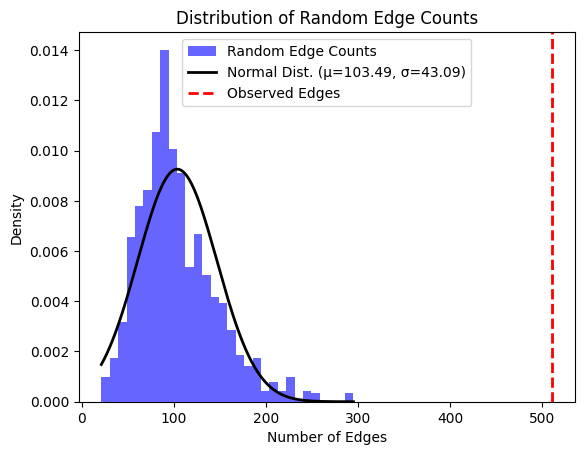

Genes mapped to insomnia: 
insomnia EFO_0004698
Genes mapped to insomnia: 
['RPS25P7', 'CRIPTOP4', 'DELEC1', 'ANO6', 'CACNA1D', 'RBFOX1', 'LINC02152', 'ENPP6', 'IQCM', 'RNA5SP167', 'RN7SL401P', 'FBXO15', 'FBXO33', 'LINC02315', 'RNU6', '1325P', 'LINC02496', 'MTND4P3', 'RNA5SP231', '578P', 'ECM1P2', 'ISCA1P6', 'LINC01854', 'LINC00917', 'FENDRR', 'LINC00989', 'MDGA2', 'LINC00648', 'NTF3', 'PRKDC', 'RFX3', 'RN7SKP188', 'ANXA10', 'WDR17', 'ZNF841', 'ZNF616', 'MEIS1', 'LINC01122', 'LINC01798', 'LSAMP', 'LINC03051', 'NIHCOLE', '334P', 'LIN28B', 'CUL9', 'FOXP2', 'MSRA', 'PSMC3', 'CNIH2', 'LINC01065', 'ZNF646P1', 'LINC00558', 'RPP40P2', 'RNU7', '88P', 'RN7SL618P', 'ACBD4', 'HEXIM1', 'SCFD2', 'WDR27', 'ATL2', 'PKDCC', 'EML4', 'AS1', 'KCNG3', 'MTA3', 'OXER1', 'HAAO', 'FTOP1', 'CHORDC1P1', 'LINC01819', 'LRPPRC', 'PPM1B', 'DT', 'FBXO11', '439P', 'RPL7P13', 'NRXN1', 'MIR4431', 'ASB3', 'RNA5SP94', 'MIR4432HG', 'WDPCP', 'UGP2', 'LINC02966', 'DDX18', 'LINC01956', 'CNTNAP5', '259P', 'LINC01941', 'THSD7B

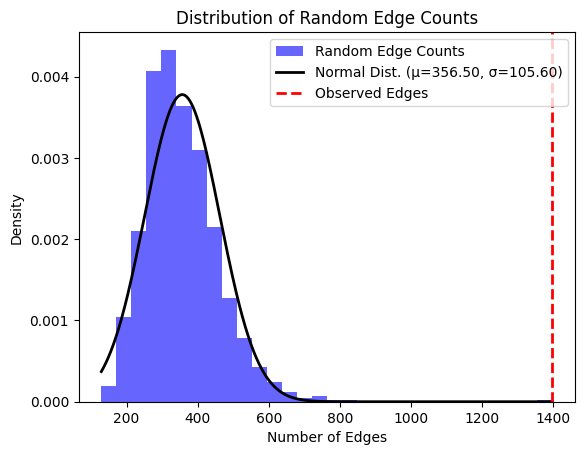

Genes mapped to bilirubin measurement: 
bilirubin measurement EFO_0004570
Genes mapped to bilirubin measurement: 
['POU6F2', 'YAE1', 'DT', 'LINC02225', 'LINC02101', 'NOL8P1', 'RNU6', '1325P', 'LINC02496', 'F2RL1', 'PSD3', 'SH2D4A', 'CFI', 'GAR1', 'SORCS3', 'RFPL4AP3', 'ERVH', '1', 'COL4A2', 'IGSF21', 'LINC02755', 'IL17B', 'CARMN', 'LINC03036', 'LAMA2', 'Y_RNA', 'MED9', 'GRXCR1', 'LINC02383', 'GTSCR1', 'LINC01541', 'BOLA3P3', 'HSPE1P10', 'EDNRA', 'CACHD1', 'RAVER2', 'ZNF407', 'PTGR3', 'ASIC2', 'CBLN2', 'TLL1', 'ATP5F1EP1', 'ARHGEF38', 'SCAT1', 'SSBP3', 'RLIG1P3', 'RPSAP74', 'GBP1P1', 'LRRC8B', 'IRX1', 'LINC02063', 'ROM1', 'ATP5MFP3', 'RFC5P1', 'DOCK8', 'AS2', 'FAM136FP', 'NUP50P4', 'FRMD6', 'FAM153CP', 'SH3D19', 'GRAMD1B', 'ZNF98', 'NAT1', 'GNGT1', 'PTPRT', 'AADACL4', 'AADACL3', 'UGT1A6', 'UGT1A3', 'UGT1A9', 'UGT1A7', 'UGT1A5', 'UGT1A10', 'UGT1A1', 'UGT1A8', 'UGT1A4', 'UGT1A11P', 'MROH2A', 'MGLL', 'TRPM8', 'USP40', 'UGT1A12P', 'ATG16L1', 'SLCO1B3', 'SLCO1B7', 'SLCO1B1', 'DGKD', 'MGAT4D'

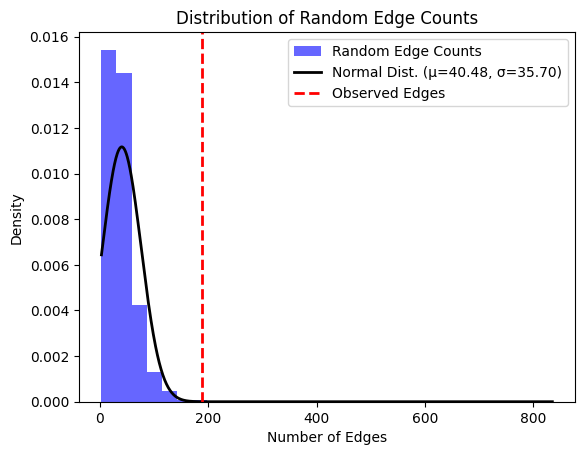

Genes mapped to peptic ulcer disease, bipolar disorder: 
peptic ulcer disease, bipolar disorder MONDO_0004985
Genes mapped to peptic ulcer disease, bipolar disorder: 
['LMAN2L', 'HSPD1P6', 'LINC02033', 'ITIH1', 'SYNE1', 'ANK3', 'ADD3', 'CACNA1C', 'RHEBL1', 'DHH', 'RPS17P7', 'CLASP1', 'FSTL5', 'GRIN2A', 'IT3', 'FADS1', 'FADS2', 'SRPK2', 'PUS7', 'NCAN', 'SCN2A', 'THSD7A', 'MIR2113', 'EIF4EBP2P3', 'SHANK2', 'STARD9', 'PACS1', 'CD47', 'RPS14P7', 'HDAC5', 'BABAM2', 'LINC02694', 'KIF15', 'PDE3B', 'STXBP4', 'HLF', 'TENM4', 'RNU6', '544P', 'SP4', 'PPP1CC', 'RPL29P25', 'NPTX1', 'RPL32P31', 'PSMD3', 'CSF3', 'TLCD4', 'RWDD3', 'RPL35AP8', 'VIPR1', 'YPEL1', 'MAPK1', 'RN7SL322P', 'BICRA', 'AS2', 'TSBP1', 'AS1', 'LGMNP1', 'STARP1', 'LINC02384', 'ASAP2', 'RN7SL361P', 'IFITM3P9', 'MYRF', 'LAMA4', 'KDM3B', 'EEF1A2', 'PPDPF', 'SSBP2', 'WFDC5', 'WFDC12', 'ZCCHC2', 'PC', 'RPS6KA2', 'LINC02988', 'BCL11B', 'MACROD1', 'ZCCHC7', 'TFAP2B', 'RPS17P5', 'GSDME', 'RBKS', 'MRPL33', 'LINC01378', 'IQCH', 'SLC25A17', '

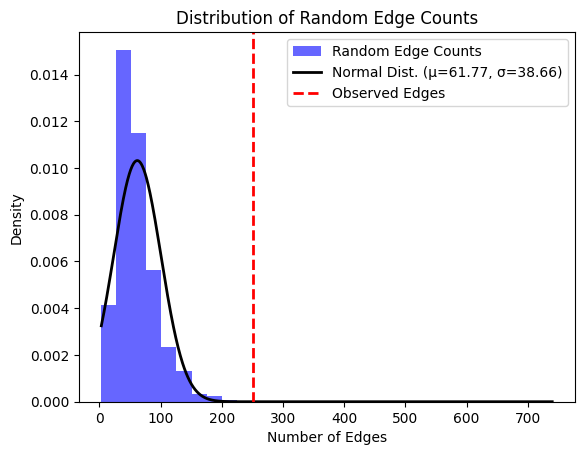

Genes mapped to allergic disease: 
allergic disease MONDO_0005271
Genes mapped to allergic disease: 
['PIGX', 'NRROS', 'EVI5', 'LINC01173', 'SH3BP4', 'CD247', 'LAYN', 'SIK2', 'RTEL1', 'TNFRSF6B', 'RERE', 'RUNX3', 'SUOX', 'IKZF4', 'ADAD1', 'IL2', 'ITGB8', 'EEF1A1P27', 'KRT8P37', 'CHCHD3P1', 'RAD51B', 'LINC02121', 'DUBR', 'CCDC54', 'AS1', 'SPATA31F3', 'TPD52L3', 'UHRF2', 'RPL13AP18', 'RNU6', '1213P', 'KIF3A', 'IRF1', 'CARINH', 'GSDMB', 'IL2RA', 'SLC25A46', 'BCLAF1P1', 'CCDST', 'IVL', 'LINC01527', 'EXD1', 'BLTP1', 'IL33', 'ERBB3', 'ZNF217', 'SMAD3', 'CLEC16A', 'EMSY', 'LINC02757', 'NBPF18P', 'S100A11', 'RANBP6', 'GTF3AP1', 'HLA', 'DQA1', 'DQB1', 'IL18R1', 'IL1RL1', 'RPL37P6', '13P', 'IL7R', 'SLC7A10', 'CEBPA', 'TLR10', 'CCR7', 'SMARCE1', 'STAT6', 'TSLP', 'D2HGDH', 'TLR1', 'TLR6', 'LINC02676', 'LINC00709', 'LINC00299', 'WDR36', 'RPS3AP21', 'KLF3', 'RNA5SP158', 'TH2LCRR', 'IL13', 'ZBTB9', 'RN7SL26P', 'UCMA', 'PHYH', 'LINC02098', 'ETS1', 'LINC02205', 'LINC02204', 'RBFOX3', 'TTC6', 'PEX14', '

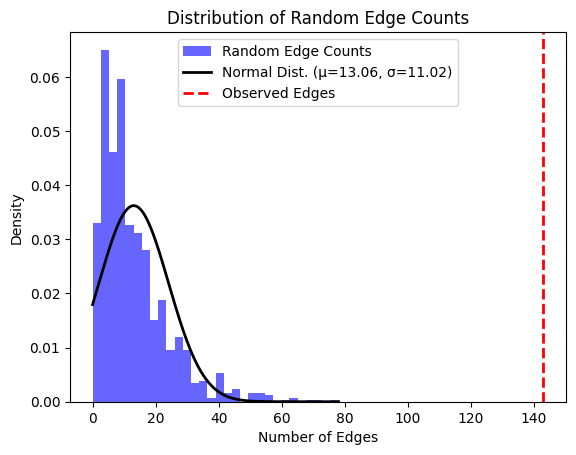

Genes mapped to drug use measurement, asthma: 
drug use measurement, asthma MONDO_0004979
Genes mapped to drug use measurement, asthma: 
['BCLAF1P1', 'TSLP', 'RAD50', 'SMAD3', 'IL18R1', 'IL1RL1', 'GSDMB', 'RANBP6', 'GTF3AP1', 'IL2RA', 'STAT6', 'IL4R', 'LINC02676', 'LINC00709', 'IL33', 'RNA5SP299', 'LINC00708', 'KRT8P37', 'NIHCOLE', 'RNU6', '334P', 'MANBA', 'HLA', 'DPB2', 'WDPCP', 'ITPR3', 'UBAC2', 'ITGB8', 'EEF1A1P27', 'GLB1', 'UHRF2', 'STARD3', 'RORA', 'CLEC16A', 'PRCPP1', 'MAP4K4', 'CAMK4', 'IL21R', 'DQA1', 'MYO1A', 'NEMP1', 'D2HGDH', 'BLTP1', 'WDR36', 'SLC7A10', 'CEBPA', 'DRB1', 'NFKBIL1', 'LTA', 'TH2LCRR', 'IL4', 'FLG', 'CCDST', 'IRF1', 'IL5', 'PSMD3', 'CSF3', 'MED1', 'CHCHD3P1', 'MAP3K14', 'AS1', 'SPATA32', 'KLF3', 'RNA5SP158', 'DQB1', 'MTCO3P1', 'LINC01063', 'LCE1D', 'LCE1C', 'FBXL20', 'GLDC', 'SLC25A46', 'LINC00299', 'BACH2', 'EMSY', 'LINC02757', 'RPL13AP18', '1213P', 'OTULINL', 'CARINH', 'DOA', 'DPA1', 'B', 'KIF3A', 'JAZF1', 'CFAP144P2', 'RPS3AP21', 'TBX21', 'OSBPL7', 'TRPC3', 

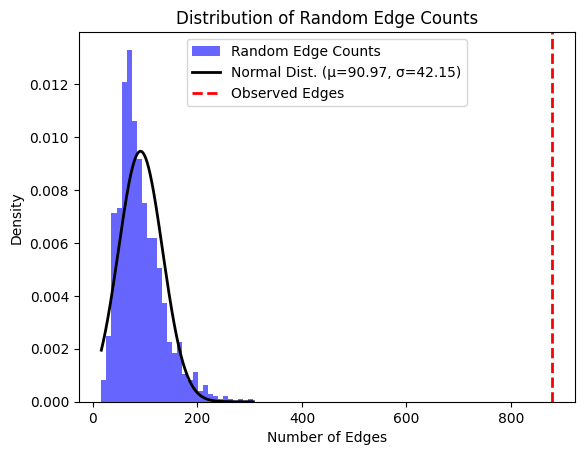

Genes mapped to suicide behaviour measurement: 
suicide behaviour measurement EFO_0006882
Genes mapped to suicide behaviour measurement: 
['LINC01392', 'POLR2DP2', 'LINC02941', 'ZCCHC7', 'CNTN5', 'LINC00355', 'LGMNP1', 'CTNND2', 'RNU6', '679P', 'OR7G2', 'OR7G1', 'STK32B', 'CLIP2', 'GTF2IRD1', 'RPL37P6', '13P', 'CCDC7', 'LINC02580', 'BRD7P7', 'DPPA2', 'STPG2', 'ARHGAP26', 'GABRP', 'RANBP17', 'MCUR1', 'RNF182', 'MKI67', 'CRY1', 'LINC00400', 'ENOX1', 'PTPN21', 'RORA', 'LINC02349', 'SLC38A7', 'RASSF2', 'SLC23A2', 'TSPEAR', 'UBE2G2', 'POFUT2', 'CTXND1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to Barrett's esophagus: 
Barrett's esophagus EFO_0000280
Genes mapped to Barrett's esophagus: 
['RNU6', '281P', 'FOXP1', 'APOB', 'LINC02109', 'SLC12A6', 'IKBIP', 'VPS35L', 'UFM1P2', 'SLFN12', 'PLSCR5', 'LINC02010', 'GRIN2B', 'AGBL1', 'AS1', 'OR5V1', 'LINC00917', 'FENDRR', 'PAXBP1P1', 'DPP6', 'BARX1', 'ALDH1A2', 'CRTC1', 'CEACAM16', 'BCL3', 'LINC01900', '

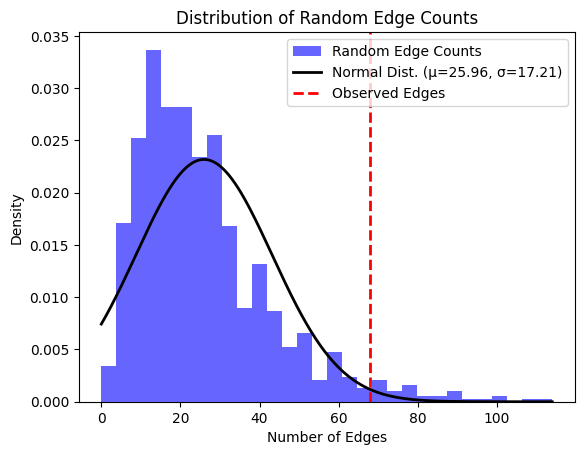

Genes mapped to bacterial meningitis: 
bacterial meningitis EFO_1000831
Genes mapped to bacterial meningitis: 
['RNA5SP224', 'RNA5SP225', 'CCDC33', 'UBE2U', 'TENM3', 'AS1', 'ZCCHC7', 'LINC01627']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to pneumococcal meningitis, bacterial pathogen genotype measurement: 
pneumococcal meningitis, bacterial pathogen genotype measurement EFO_0010271
Genes mapped to pneumococcal meningitis, bacterial pathogen genotype measurement: 
['STK32C']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to pneumococcal meningitis: 
pneumococcal meningitis EFO_1001114
Genes mapped to pneumococcal meningitis: 
['RNA5SP224', 'RNA5SP225', 'ROS1', 'MRO', 'ME2', 'TBC1D22A']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to inflammatory bowel disease: 
inflammatory bowel disease EFO_0003767
Genes mapped to inflammatory bowel disease: 
['IL12B', 'L

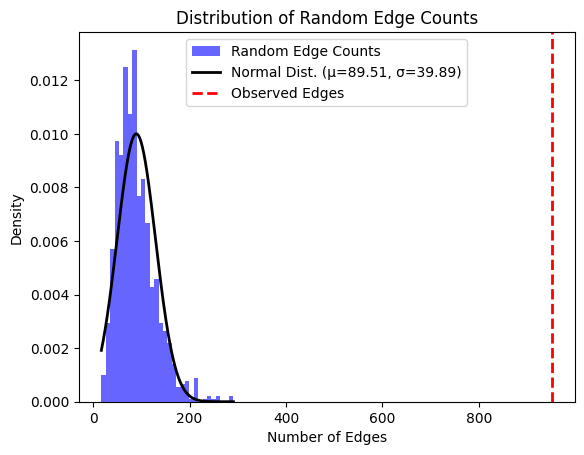

Genes mapped to Crohn's disease: 
Crohn's disease EFO_0000384
Genes mapped to Crohn's disease: 
['RNU1', '150P', 'TTC33', 'TNFSF15', 'DELEC1', 'LINC02929', 'ALDH7A1P4', 'LINC02513', 'IL12B', 'LINC01845', 'IL27', 'IL23R', 'C1orf141', 'HLA', 'DQB1', 'MTCO3P1', 'INKA2', 'GSAP', 'CCDC146', 'GPR35', 'ZMIZ1', 'LINC01475', 'PTPN2', 'LINC02920', 'CYCSP42', 'SYNDIG1L', 'PTPRD', 'ST8SIA4', 'RN7SL802P', 'RN7SKP181', 'LINC02253', 'CBLC', 'ADAMTS6', 'FABP5P10', 'RBM43', 'LINC02042', 'CD200R1L', 'AS1', 'DPH6', 'DT', 'CSMD1', 'RPL7P47', 'PLA2G10IP', 'NRP1', 'LINC02628', 'ALDH5A1', 'RN7SKP36', 'SORCS2', 'NLRP1', 'RARB', 'LINC02814', 'ANKRD10', 'PARP1P1', 'OPCML', 'DMRTA1', 'LINC01239', 'LINC01898', 'LINC01893', 'SQSTM1P1', 'LINC00448', 'PSMD14', 'MIR1973', 'TRMT112P1', 'LUZP2', 'SDK1', 'LINC02713', 'CNTN5', 'DAD1', 'HS3ST1', 'LINC02360', 'CDHR3', 'SYPL1', 'IL12RB2', 'IRF1', 'ZBTB9', 'RN7SL26P', 'STAT3', 'RUNX3', 'ELF1', 'RNU6', '649P', 'LINC01248', 'FCHSD2', 'POU5F1', 'PSORS1C3', 'NOTCH4', 'TSBP1', 'D

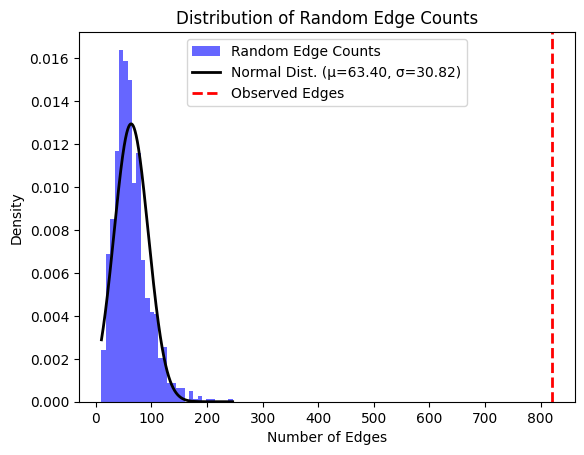

Genes mapped to ulcerative colitis: 
ulcerative colitis EFO_0000729
Genes mapped to ulcerative colitis: 
['NUP210', 'PRR3P1', 'HLA', 'DRB1', 'DQA1', 'TNFRSF14', 'PRXL2B', 'IL23R', 'C1orf141', 'IL19', 'KCP', 'IRF5', 'INSL4', 'RLN2', 'HCG27', 'C', 'LINC02132', 'LINC01082', 'PPIAP34', 'ZBTB40', 'IL10', 'ZFP90', 'PIGCP2', 'DLD', 'CARD9', 'SNAPC4', 'LINC01620', 'SNORD116', 'LINC00598', 'RNF186', 'AS1', 'OTUD3', 'DRB9', 'INAVA', 'BSN', 'LINC01475', 'FGFR1OP2P1', 'RPS21P8', 'POLR1HASP', 'ZPBP2', 'GSDMB', 'LINC02940', 'RPL23AP12', 'IL17REL', 'PARK7', 'IL1R2', 'IL1R1', 'PITX1', 'TNFSF15', 'GNA12', 'AMZ1', 'HNRNPA1P41', 'JAK2', 'EMSY', 'LINC02757', 'FCGR2A', 'PUS10', 'GPR35', 'AQP12B', 'APEH', 'ADAD1', 'CEP72', 'DT', 'IFNG', 'CXCR2', 'CXCR1', 'DAP', 'RNU1', '150P', 'TTC33', 'ATG5', 'PRDM1', 'NXPE1', 'NXPE4', 'IL12B', 'LINC01845', 'LINC03004', 'CCNY', 'LSP1', 'Y_RNA', 'LINC02920', 'CYCSP42', 'RTEL1', 'TNFRSF6B', 'GATD3', 'CDH3', 'IL7R', 'VEGFA', 'LINC02537', 'RNA5SP173', 'NDUFB5P1', 'FBXL17', 'LI

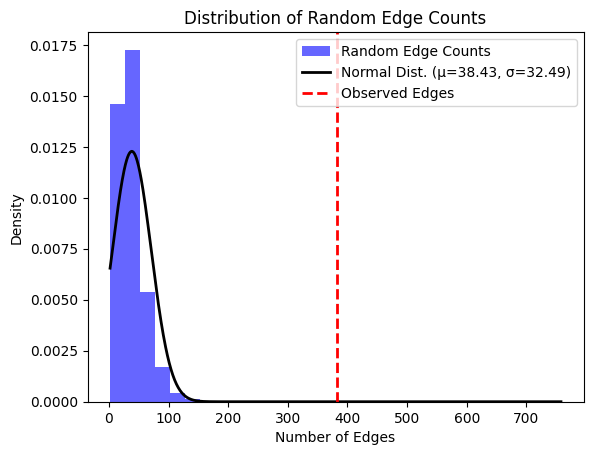

Genes mapped to juvenile idiopathic arthritis: 
juvenile idiopathic arthritis EFO_0002609
Genes mapped to juvenile idiopathic arthritis: 
['VTCN1', 'TSBP1', 'AS1', 'JMJD1C', 'TIMMDC1', 'REEP3', 'FAM169BP', 'IRAIN', 'HPRT1P2', 'RPL19P11', 'CTTNBP2', 'CSMD1', 'LINC02235', 'LINC02839', 'CCDC26', 'ZMIZ1', 'ANO4', 'CMKLR1', 'ANGPTL5', 'GABRB3', 'LINC01895', 'IGLJCOR18', 'CYTH4', 'CACNA1I', 'RNU6', '755P', 'LMX1A', 'SMAD3', 'SBK1', 'NPIPB6', 'ATXN2L', 'NKD1', 'ZPBP2', 'GSDMB', 'PDE4A', 'KEAP1', 'FUT2', 'MHENCR', 'STMN3', 'LINC02940', 'RPL23AP12', 'ADGRL2', 'LINC01250', 'RN7SKP113', 'CYTL1', 'TENM3', 'DCTD', '144P', 'ZYXP1', 'LURAP1L', 'FNBP1', 'LINC00993', 'LINC00460', 'RPL35P9', 'ADCY7', '320P', 'LINC00892', 'RPL22P23', 'TM9SF5P', 'ATG16L1', 'GPR35', 'DAG1', 'BSN', 'DT', 'IL21', 'RNU1', '150P', 'TTC33', 'ANKRD55', 'ERAP2', 'CARINH', 'IRF1', 'IL12B', 'LINC01845', 'HNRNPA1P41', 'JAK2', 'TNFSF15', 'CARD9', 'IL2RA', 'LINC02929', 'ALDH7A1P4', 'NKX2', '3', 'SLC25A28', 'INS', 'IGF2', 'AS', 'LRRK2'

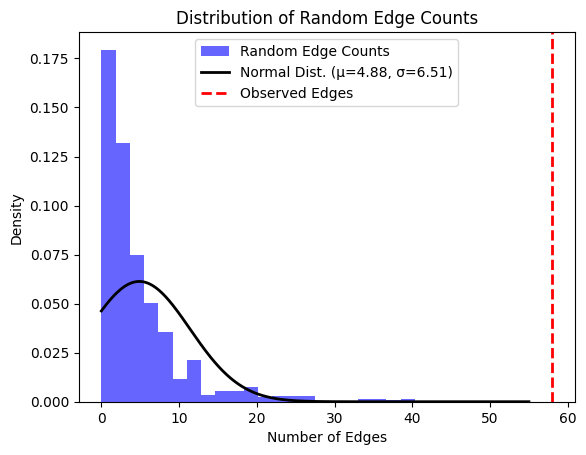

Genes mapped to aortic stenosis, aortic valve calcification: 
aortic stenosis, aortic valve calcification EFO_0005239
Genes mapped to aortic stenosis, aortic valve calcification: 
['LINC01708', 'LPA', 'IL6', 'ALPL', 'MMADHC', 'DT', 'LINC01818', 'LINC03041', 'PRRX1', 'ACTR2', 'IPO9', 'AS1', 'NAV1', 'ARHGAP24', 'FBRSL1', 'KRR1', 'RPL10P13', 'ISG20', 'ACAN', 'ME3', 'MECOM', 'COX7A2P2', 'STPG2', 'EMX2', 'LINC02674', 'DENND4C', 'TEX41', 'RNA5SP127', 'H3P11', 'LINC02740', 'HNRNPKP3', 'RPL15P15', 'LINC02151', 'TREM2', 'TREML2', 'FAM210A', 'TACSTD2', 'MYSM1', 'SNTG2', 'LINC01364', 'RNA5SP52', 'RNF144A', 'SPRED2', 'ARHGEF26', 'RPL23AP93', 'TMEM44', 'MUC4', 'PDGFRA', 'HCN1', 'RPL7AP33', 'FERD3L', 'POLR1F', 'STEAP1B', 'SSC4D', 'LPL', 'SLC2A6', 'MYMK', 'RPLP2', 'PIDD1', 'FADS1', 'FADS2', 'MYEOV', 'LINC02956', 'TCP1P3', 'LINC02468', 'HMGA2', 'MIR6074', 'PPIAP16', 'FLNB', 'MTCYBP42', 'TOMM7', 'SMAD9', 'STARD9', 'ALDH1A2', 'CHRNB4', 'TMEM170A', 'LDLR', 'ASCC2']
The number of edges in the network is l

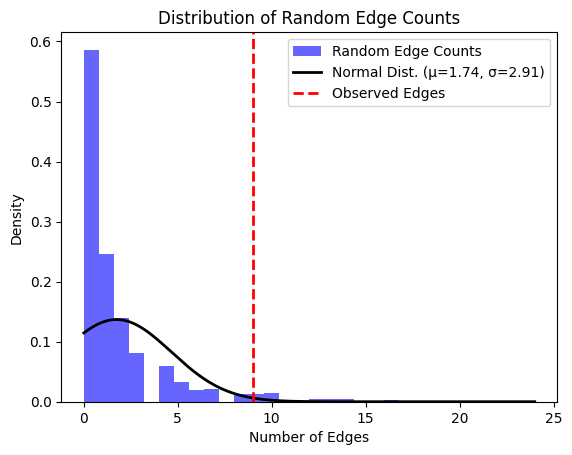

Genes mapped to B-cell acute lymphoblastic leukemia, primary biliary cirrhosis: 
B-cell acute lymphoblastic leukemia, primary biliary cirrhosis EFO_1001486
Genes mapped to B-cell acute lymphoblastic leukemia, primary biliary cirrhosis: 
['TIMMDC1', 'IL12A', 'AS1', 'NFKB1', 'IL7R', 'TNFSF15', 'POU2AF1', 'IKZF3', 'HLA', 'DRA', 'PRKCB', 'IL12RB2', 'DENND1B', 'STAT4', 'CAPSL', 'DQB1', 'MTCO3P1', 'LINC03004', 'IRF5', 'TNPO3', 'PVT1', 'NADSYN1', 'Y_RNA', 'CXCR5', 'LINC02341', 'TNFSF11', 'RAD51B', 'RMI2', 'SYNGR1', 'SNRPGP8', 'CCL20', 'MACIR', 'PDZPH1P', 'IL12B', 'LINC01845', 'IL4R', 'IL21R', 'DLEU1', 'NAB1', 'LINC01100', 'EXOC3L4', 'SPIB', 'TYK2', 'CCDC88B', 'TNFRSF1A', 'ATXN2', 'AS', 'PLCL2', 'MANBA', 'SNORA10B', 'H3P5', 'DT', 'UGT3A1', 'CLEC16A', 'BTF3L4P3', 'IL1RL2', 'CFAP144P2', 'DGKQ', 'DDX6', 'COX7CP3', 'LTBR', 'LINC02132', 'LINC01082', 'ZPBP2', 'GSDMB', 'MAPT', 'ELMO1', 'PRDX5', 'DPB1', 'DELEC1', 'TMEM39A', 'PDGFB', 'RPL3', 'PSMG4', 'SLC22A23', 'CEP43', 'CCR6', 'HPGD', 'GLRA3', 'NPM1P

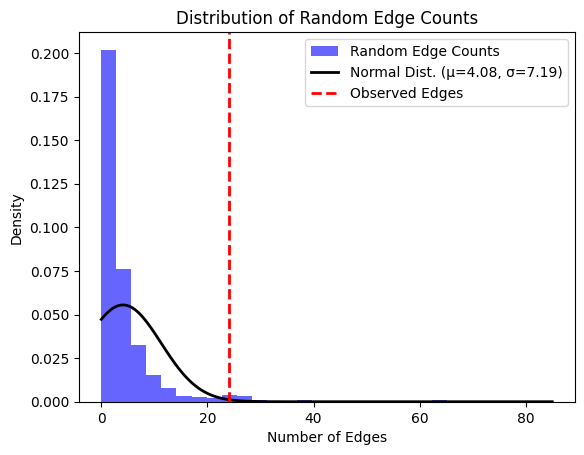

Genes mapped to intracerebral hemorrhage: 
intracerebral hemorrhage EFO_0005669
Genes mapped to intracerebral hemorrhage: 
['PARVB', 'TMEM220', 'AS1', 'RN7SL601P', 'MYL2', 'OR52E4', 'TRIM5', 'FHIP1A', 'PMF1', 'BGLAP', 'DAB1', 'ADGRG1', 'RTN4RL1', 'DPH1', 'SLC17A5', 'LSP1', 'NOTCH3', 'NXPE1', 'XKR4']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to phosphatidylcholine measurement: 
phosphatidylcholine measurement EFO_0010226
Genes mapped to phosphatidylcholine measurement: 
['FADS2', 'RNU6', '1243P', 'BEST1', 'BLK', 'COL5A1', 'RBFOX3', 'SYT7', 'FADS1', 'TMEM258', 'FADS3', 'RPLP0P2', 'DAGLA', 'LINC02733', 'RAB3IL1', 'HERPUD1', 'CETP', 'MYRF', 'AS1', 'FEN1', 'SUGCT', 'TMEM229B', 'APOE', 'AKIRIN1', 'NDUFS5', 'VNN1', 'VNN3P', 'LINC02743', 'TRIB1AL', 'USP1', 'UVRAG', 'ZPR1', 'PDXDC1', 'LIPC', 'ALDH1A2', 'MIR3945HG', 'RN7SL786P', 'DGAT2', 'DT', 'DOCK7', 'MOGAT2', 'NTAN1', 'SNX17', 'PKD2L1', 'ELOVL2', 'FTH1', 'RRN3', 'SCD', 'SUGP1', 'RN7SL714P', 'LINC

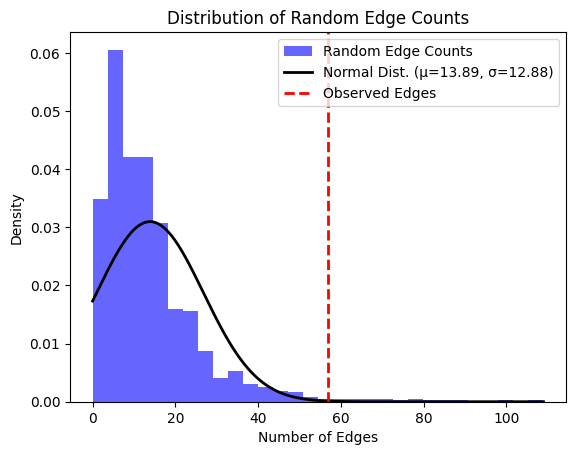

Genes mapped to phosphatidylcholine ether measurement: 
phosphatidylcholine ether measurement EFO_0010227
Genes mapped to phosphatidylcholine ether measurement: 
['TMEM258', 'MYRF', 'FADS1', 'FADS2', 'RNU6', '1243P', 'BEST1', 'LINC02865', 'SLC28A2', 'AS1', '953P', 'TMEM229B']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to phosphatidylethanolamine measurement: 
phosphatidylethanolamine measurement EFO_0010228
Genes mapped to phosphatidylethanolamine measurement: 
['FADS2', 'ALDH1A2', 'LIPC', 'ADAM10', 'MINDY2', 'DT', 'RNF111', 'MYO1E', 'SIDT2', 'APOC1', 'APOC1P1', 'RNU6', '356P', 'SFRP1', 'APOE', 'TMEM229B', 'MYRF', 'TMEM258', 'AS1', 'TMEM86B', 'GSK3B', 'LINC02064', 'ODF1', 'POU5F1P2', 'PPIAP65', 'LINC02572', 'ABCC9', 'CMAS', 'BAZ1A', '1117P', 'MRPL50P1', 'MIR9', '3HG', 'RHCG', 'TILRLS', 'LINC02997', 'LINC00331', 'WWOX', '257P', 'MTND4LP25', 'RAB3IL1', 'KIRREL3', 'ARPP19', 'LINC02852', 'LETR1', '1304P', 'SRP9', 'RPSAP20', 'LINC01767', 'COX7A2

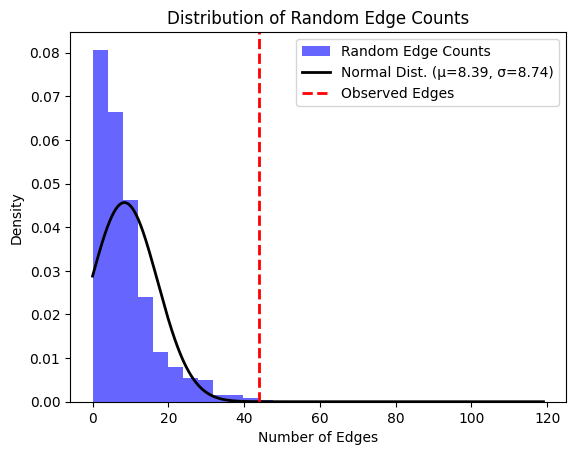

Genes mapped to diglyceride measurement: 
diglyceride measurement EFO_0010223
Genes mapped to diglyceride measurement: 
['ZPR1', 'DOCK7', 'APOB', 'GCKR', 'TIMD4', 'HAVCR1', 'LINC02571', 'HLA', 'B', 'LPA', 'MLXIPL', 'ALDH1A2', 'HERPUD1', 'CETP', 'NECTIN2', 'APOE', 'MARK4', 'EXOC3L2', 'PNPLA3', 'LIPC', 'LPL', 'TRIB1AL', 'CATSPER2P1', 'CD300LG', 'ANGPTL4', 'MAU2', 'APOC1', 'SNX17', 'FADS2', 'FADS1', 'TMEM258', 'PDE10A', 'GALNT2', 'RPL23AP39', 'RPL21P17', 'ARV1', 'MYRF', 'FEN1', 'AS1', 'FADS3', 'RAB3IL1', 'FTH1', 'LINC02733', 'RNU6', '1243P', 'BEST1', 'NTAN1', 'PDXDC1', 'SUGP1', 'MRPS22', 'ABR', 'TMEM212', 'SYT7', 'RPLP0P2', 'ELOVL2', 'PKD2L1', 'PARD6G', 'NA', 'CPEB3', 'SHFL', 'IFT22', 'COL26A1', 'APOC3', 'SLC10A2', 'LINC01309', 'LINC01723']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to lysophosphatidylcholine measurement: 
lysophosphatidylcholine measurement EFO_0010224
Genes mapped to lysophosphatidylcholine measurement: 
['LINC02424', 'SYT1'

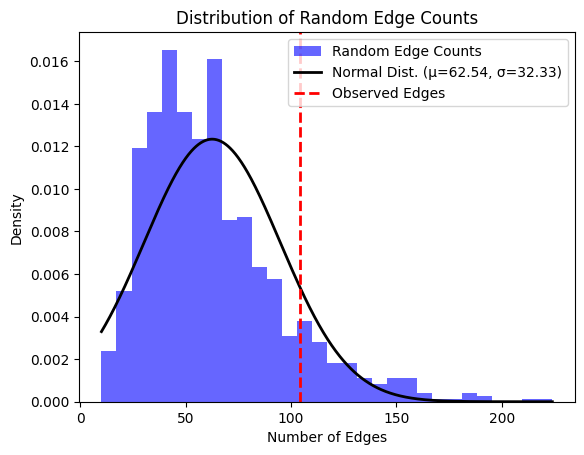

Genes mapped to anhedonia measurement: 
anhedonia measurement EFO_0009587
Genes mapped to anhedonia measurement: 
['ESRRG', 'GPATCH2', 'LINC02741', 'CLEC4GP1', 'EXOSC3P2']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to colorectal adenoma: 
colorectal adenoma EFO_0005406
Genes mapped to colorectal adenoma: 
['LINC01082', 'ZMIZ1', 'SMAD6', 'SCG5', 'GREM1', 'AS1', 'NEPRO', 'BOC', 'HMGCLL1', 'BMP5', 'Y_RNA', 'TBX3', 'FMN1', 'LINC00393', 'HCP5', 'MICB', 'DT', 'BMP2', 'LINC01428', 'CCND2', 'HEXD', 'CASC8', 'CASC11', 'KLF5', 'BMP4', 'ATP5F1CP1', 'PLCB1', 'NKX2', '3', 'SLC25A28', 'TMEM258', 'MYRF', 'MUC22', 'HCG22', 'LINC02571', 'HLA', 'B', 'UTP23', 'PLCL1', 'RNU7', '147P', 'CHCHD3P1', 'RNA5SP299', 'ARHGAP42', 'LINC01271', 'RN7SL636P', 'RIPOR3', 'CHRDL2', 'LINC00536', 'EIF3H', 'PCAT1', 'POU5F1B', 'STARD13', 'RFC3', 'PITX1', 'NOS1', 'ATXN2', 'PIGU', 'PREX1', 'LINC01081', 'LINC00917', 'VTI1A', 'SLC25A26', 'APC', 'RNU1', '88P', 'LRRC34', 'CDH3', 'NACAD

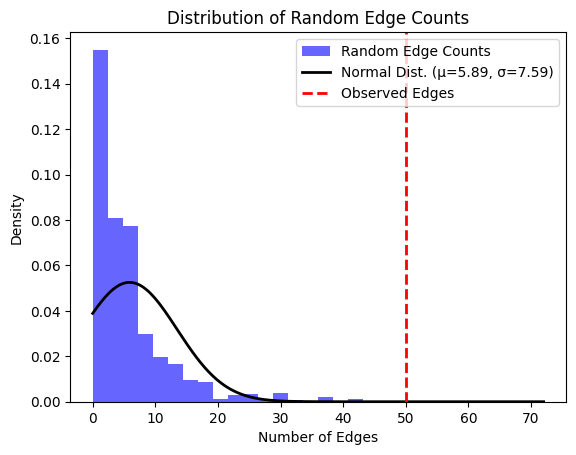

Genes mapped to left ventricular ejection fraction measurement: 
left ventricular ejection fraction measurement EFO_0008373
Genes mapped to left ventricular ejection fraction measurement: 
['LINC00964', 'BAG3', 'TMEM40', 'TTN', 'AS1', 'CLCNKA', 'FAM131C2P', 'PLEKHA3', 'SPATA24', 'DNAJC18', 'LINC00208', 'GATA4', 'SEC23IP', 'DERL3', 'SMARCB1', 'LSM3', 'LINC01267', 'CLDN23', 'MFHAS1', 'ACTN2', 'MSRA', 'XKR6', 'FAM86B3P', 'PRAG1', 'MITF', 'CCDC141', 'PLEC', 'ALPK3', 'NEDD4L', 'PROM1', 'HLA', 'DQB1', 'CDKN1A', 'TNKS', 'OR7E161P', 'DEFB136']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to neuritic plaque measurement: 
neuritic plaque measurement EFO_0006798
Genes mapped to neuritic plaque measurement: 
['CYCSP27', 'LIPT2', 'LINC02286', 'HMGN2P6', 'APOE', 'DPP10', 'MTCYBP39', 'OSBPL6', 'PLCB1', 'MCTP1', 'LSM1P2', 'LINC03000', 'SYTL3', 'DLGAP2', 'ZDHHC21', 'CER1', 'GON4L', 'ARHGEF2', 'TMEM132C', 'VPS33B', 'DT', 'SV2B', 'CMIP', 'ZYXP1', 'FAM135B', 'SM

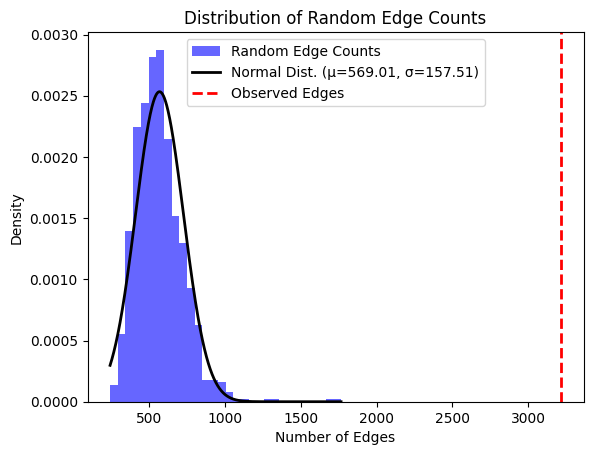

Genes mapped to systemising measurement: 
systemising measurement EFO_0010221
Genes mapped to systemising measurement: 
['ERLEC1', 'ASB3', 'LSAMP', 'LINC03051', 'MAP3K8', 'HNRNPA1P32', 'FUT8', 'RBFOX1', 'NETO1', 'DT', 'LINC02864', 'ZNF223', 'FATE1', 'CNGA2', 'PIK3CD', 'LINC02306', 'ORMDL3', 'TSHZ3', 'CEP170', 'NBAS', 'DSCAM']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to dental caries: 
dental caries EFO_0003819
Genes mapped to dental caries: 
['ALLC', 'NEDD9', 'PITX1', 'AS1', 'CA12', 'LINC00709', 'HSP90AB7P', 'GRID1', 'SNRPGP16', 'MTNR1B', 'IGF1', 'LINC00485', 'OR7E33P', 'ELL2P3', 'SMAD3', 'DT', 'LRRC28', 'MRPL58', 'CHST8', 'NLRP8', 'NLRP5', 'PM20D1', 'RARB', 'RBMS3', 'RNA5SP525', 'MIR4330', 'LINC02493', 'SNORA75B', 'LINC02465', 'LINC02479', 'Y_RNA', 'LSINCT5', 'SLC16A10', 'MFSD4B', 'DMAC1', 'PTPRD', 'RPS4XP11', 'RNU7', '22P', 'EEF1A1P49', 'SQSTM1P1', 'LINC00448', 'CEP104', 'HPCAL1', 'C3orf20', 'LINC02500', 'TENM3', 'PDE8B', 'ZBED3', 'SNX1

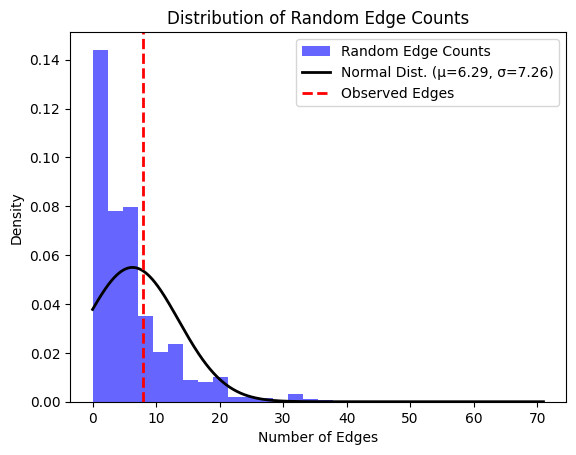

Genes mapped to left ventricular mass: 
left ventricular mass EFO_0009289
Genes mapped to left ventricular mass: 
['TEX41', 'SLC7A1', 'UBL3', 'BICD1', 'TTN', 'AS1', 'CCDC141', 'IGF1R', 'LINC02335', 'HNF4GP1', 'RDM1P1', 'DND1P1', 'MIR588', 'RNU6', '200P', 'ADAMTS10', 'FTO', 'MAPT', 'HMGA2', 'PDXDC1', 'SEZ6L2', 'MYBPC3']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to post-traumatic stress disorder: 
post-traumatic stress disorder EFO_0001358
Genes mapped to post-traumatic stress disorder: 
['ANKRD55', 'LINC02335', 'HNF4GP1', 'LINC02571', 'HLA', 'B', 'KAZN', 'TMEM242', 'DT', 'ZDHHC14', 'ZNF813', 'PRKN', 'SPP2', 'RPS20P12', 'LINC02520', 'LINC00861', 'RBM17', 'PFKFB3', 'TLL1', 'RPL18P1', 'ATP5MC2P2', 'GRID1', 'RN7SL292P', 'SGO1P2', 'OTOR', 'NDRG1', 'GABBR2', 'GAPDHP21', 'ZWINT', 'CYRIB', 'Y_RNA', 'CARS1P2', 'AKT3', 'LINC02774', 'DPP3P1', 'MTCO3P27', 'SLC4A5', 'ZMAT3', 'PRKCA', 'PRTFDC1', 'CNN2P10', 'POGK', 'PTPRVP', 'LGR6', 'UST', 'CSMD1', 'LHX2'

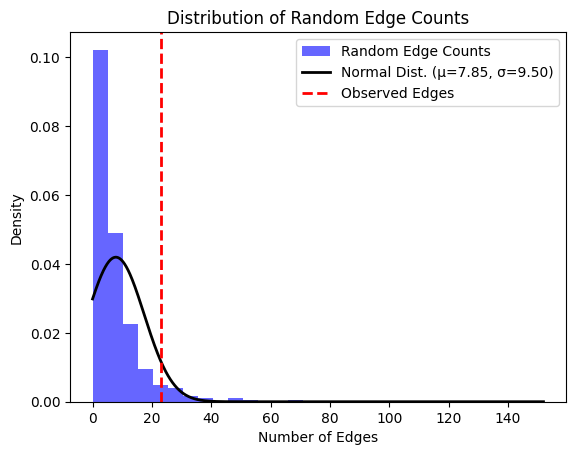

Genes mapped to QRS amplitude, R wave amplitude: 
QRS amplitude, R wave amplitude EFO_0007741
Genes mapped to QRS amplitude, R wave amplitude: 
['TBX3', 'AS1', 'UBA52P7', 'ICOSLG']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to alopecia: 
alopecia MONDO_0004907
Genes mapped to alopecia: 
['LINC02039', 'GRAMD2B', 'ADGRF1', 'TNFRSF21', 'CTBP2P2', 'CYP2C18', 'LINC02745', 'NUDT15', 'MTFR1P1', 'PKMP2', 'WNT10A', 'DRAIC', 'ZBED6', 'ZC3H11A', 'RNU6', '832P', 'MTCO2P25', 'HDAC9', 'TMEM74', 'TRHR', 'AKAP1', 'MSI2', 'ARHGEF9', 'LINC03114', 'NOLC1P1', 'GNL3L', 'IFITM3P7', 'SYF2', 'AADACL2', 'AS1', 'LINC02917', 'EPS15P1', 'MRPL42P4', 'FOXD2', 'RPL21P24', 'RNA5SP56', 'PSMC1P12', 'LINC01812', 'FBXL12P1', 'HOXD1', 'RPSAP25', 'PRDM8', 'FGF5', 'EBF1', 'HULC', 'OFCC1', 'ITPR2', 'SSPN', 'Y_RNA', 'MIR193BHG', 'LINC01681', 'RUNX3', 'MIR4425', 'SRD5A2', 'LINC01946', 'BBX', 'LINC02997', '1232P', 'PRDM6', 'IRF4', 'EXOC2', 'LINC02836', 'RN7SKP211', 'PREP', 'TWIST1',

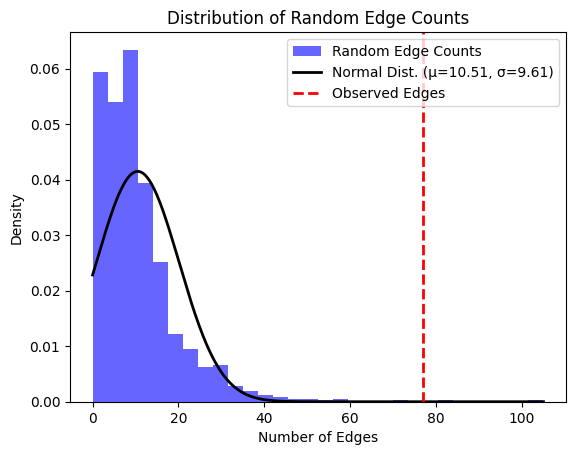

Genes mapped to pancreatitis: 
pancreatitis EFO_0000278
Genes mapped to pancreatitis: 
['RPL21P17', 'RN7SKP144', 'PTCH1', 'ERCC6L2', 'AS1', 'TRBV29', '1', 'PRSS1', 'MORC4', 'EEF1A1P40', 'SAMD12', 'JCAD', 'RNU6', '598P', 'PWWP3B', 'CSGALNACT2P2', 'SPINK1', 'SCGB3A2', 'MYBPC1', 'HECTD4', 'ABCG8', 'STXBP1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to digestive system disease: 
digestive system disease EFO_0000405
Genes mapped to digestive system disease: 
['LRRC8D', 'HLA', 'DRB1', 'DQA1', 'PNPLA3', 'CRTAC1', 'R3HCC1L', 'TAFA2', 'RPL17P38', 'PRDM4', 'RNU7', '51P', 'RNU6ATAC28P', 'NF1', 'ZNF708', 'RAB10', 'MARCHF1', 'PSME2P1', 'KRT8P32', 'CARMIL1', 'CMAHP', 'MTAP', 'NRP1', 'LINC02622', 'SGPL1', 'ATP13A4', 'RN7SL250P', 'SOX17', 'IFITM8P', 'RN7SKP135', 'GBF1', 'LINC02335', 'HNF4GP1', 'MIR924HG']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to family history of Alzheimer’s disease: 
family history of Al

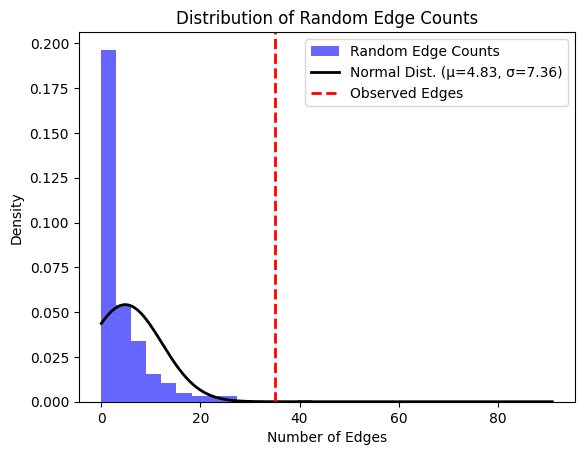

Genes mapped to Vitiligo: 
Vitiligo EFO_0004208
Genes mapped to Vitiligo: 
['HLA', 'DRB1', 'DQA1', 'DRB9', 'MSH2', 'SMOC2', 'ATP8B1', 'HUNK', 'IKZF4', 'ATXN2', 'HERC2', 'FANCA', 'TICAM1', 'ZC3H7B', 'TEF', 'CD80', 'ADPRH', 'CASP7', 'FAP', 'IFIH1', 'LINC02498', 'BACH2', 'TG', 'SLC1A2', 'AS1', 'LNCRNA', 'IUR', 'FAM76B', 'TSBP1', 'SLC44A4', 'RNASET2', 'ZMIZ1', 'WASF5P', 'LINC02571', 'RPGRIP1L', 'SUOX', 'COX7CP3', 'SETP16', 'SLC29A3', 'LPP', 'PTPN22', 'AP4B1', 'RERE', 'TYR', 'POLR1HASP', 'BTNL2', 'GZMB', 'UBASH3A', 'C1QTNF6', 'IL2RA', 'STAT4', 'PPARGC1B', 'MIR4435', '2HG', 'CBFA2T3', 'NEK6', 'COX6CP2', 'PTPN1', 'FLI1', 'PARP12', 'SYNGR2', 'SPMIP7', 'UBE2E2', 'FBXO45', 'LINC01063', 'PLCB3', 'PPP3CA', 'GAGE1', 'VDAC1P2', 'IRF3', 'BCL2L12', 'FADS2', 'FADS1', 'PTPRC', 'FOXP1', 'FARP2', 'SERPINB9', 'SERPINB6', 'IRF4', 'CPVL', 'IL1RAPL1', 'PPP4R3B', 'DT', 'FASLG', 'SLC25A38P1', 'RAB5C', 'PLIN3', 'TNFRSF11A', 'ARID5B', 'RHOH', 'LINC02265', 'CTLA4', 'ICOS', 'LINC02341', 'TNFSF11', 'LINC02356', 'DEF

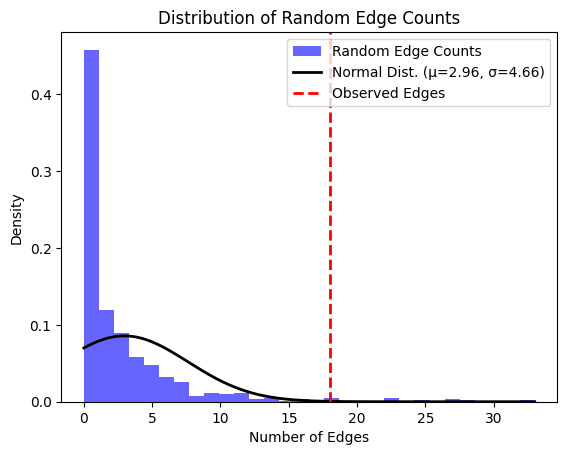

Genes mapped to pulse pressure measurement: 
pulse pressure measurement EFO_0005763
Genes mapped to pulse pressure measurement: 
['WNT2B', 'HLA', 'B', 'TCF7L1', 'LOXL1', 'ARVCF', 'PRDM8', 'FGF5', 'HOXA7', 'HOXA9', 'HOXA3', 'HOXA', 'AS2', 'IGFBP3', 'FTLP15', 'CYP17A1', 'CACNA1D', 'FTO', 'DELEC1', 'U2', 'ULK4', 'BORCS7', 'ASMT', 'ATP2B1', 'HDAC9', 'TWIST1', 'CNNM2', 'GML', 'SLC24A3', 'FGR', 'LINC02574', 'FIGN', 'PRPS1P1', 'ZNF318', 'CRIP3', 'SLC22A7', 'NPNT', 'UBA52P4', 'RNU1', '96P', 'GEMIN2P2', 'TRAK1', 'WBP1L', 'CASZ1', 'SLC25A47', 'SUGCT', 'LSP1', 'NOX4', 'RPH3A', 'ARHGEF12', 'CYP11B2', 'LY6E', 'DT', 'PRDM6', 'CEP120', 'ARL3', 'LRRC1', 'MYEOV', 'TTBK1', 'NT5C2', 'KCNK3', 'DOT1L', 'LNX1', 'RPL21P44', 'CCDC71L', 'LINC02577', 'RPTOR', 'CUX2', 'Y_RNA', 'RPS27P11', 'PLEKHJ1', 'RPL37P11', 'TACC2', 'BTBD16', 'NPR3', 'LINC02950', 'RN7SL178P', 'MIR548AZ', 'CCN3', 'AS3MT', 'POC1B', 'AS1', 'LINC00208', 'GATA4', 'ENPP2', 'RPL31P26', 'PRMT5P1', 'MTND1P22', 'GUCY1A1', 'PALLD', 'LINC02269', 'LINC02

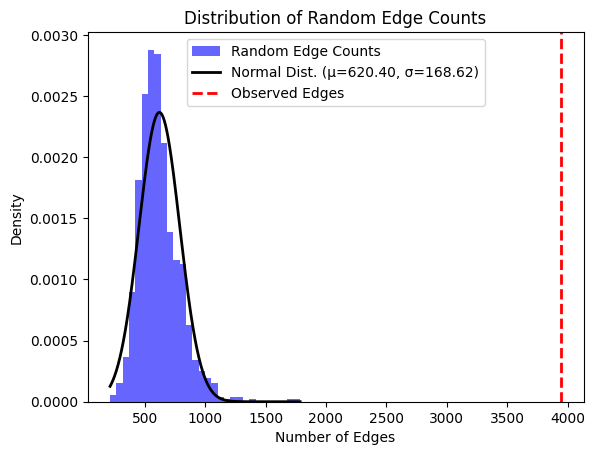

Genes mapped to Takayasu arteritis: 
Takayasu arteritis EFO_1001857
Genes mapped to Takayasu arteritis: 
['HSPA6', 'RPS23P10', 'LINC03066', 'DUSP22', 'PTK2B', 'KLHL33', 'MIR4752', 'LILRA5', 'LINC02940', 'RPL23AP12', 'LINC02571', 'HLA', 'B', 'EEF1A1P14', 'RNU6', '983P', 'MSH2', 'MSH6', 'LINC02033', 'TRANK1', 'LINC02498', 'MIR572', 'ATP8A1', 'DT', 'RN7SKP82', 'DDR1', 'PSORS1C1', 'HCG27', 'C', 'MICA', 'AS1', 'MSH5', 'SAPCD1', 'ATF6B', 'NOTCH4', 'BTNL2', 'TSBP1', 'DRB1', 'DQA1', 'IL6', 'RN7SL675P', 'RNA5SP270', 'PPIAP88', '996P', 'FRMD4A', 'OPCML', 'CLEC4E', 'Y_RNA', 'SLC16A7', 'RPS9', 'PCSK5', 'ZFPM2', 'EPIC1', 'MIR3201', 'PPM1G', 'NRBP1', 'VPS8', 'IL12B', 'LINC01845', 'TXNDC8', 'SVEP1', 'LINC00355', 'LGMNP1', 'CFL2', 'RPL12P6', 'RAD18', 'CAV3', 'GADL1', 'MIR466', 'CACNA2D3', 'RBPJ', 'CCKAR', 'PPP2R2B', 'EPHB4', 'ENTR1', 'ZMIZ1', 'TDGP1', 'MIR4302', 'RPS15AP34', 'LINC02165', 'VAT1L', 'CLEC3A', 'PLCG2', 'CCR7', 'LINC01254', 'APCDD1', 'SLC14A2', 'TSEN34', 'OSBP2', 'NAPGP2', 'MUC21', 'POLR1H

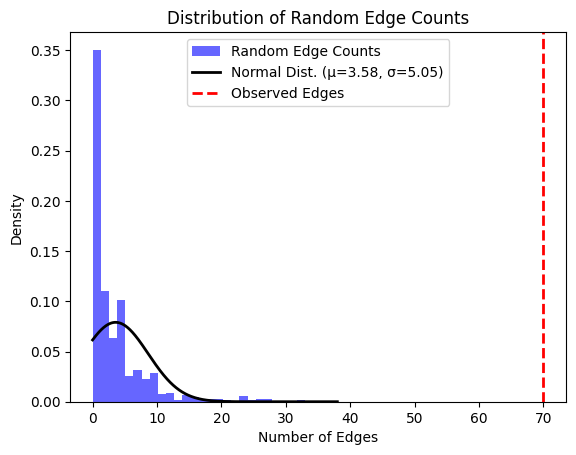

Genes mapped to benign prostatic hyperplasia: 
benign prostatic hyperplasia EFO_0000284
Genes mapped to benign prostatic hyperplasia: 
['BCL11A', 'TERT', 'DLEU1', 'GATA6', 'CTAGE1', 'WDR11', 'DNAJC1', 'ADIPOR1P1', 'TBX3', 'ATP7BP1', 'RPS4XP18', 'HNF1B', 'FGFR2', 'RNASEH2B', 'AS1', 'GLULP5', 'LINC02459', 'GATA5', 'STARD4', 'CLPTM1L', 'PITX1', 'MIR4432HG', 'RSL24D1P1', 'H4C10P', 'LINC01153', 'RN7SKP167', 'BET1L', 'CIMAP1A', 'LINC03103', 'RNA5SP471', 'KRT8P37', 'CHCHD3P1', 'LINC01919', 'MBD2', 'SYN3', 'UNC13A', 'ELOVL6', 'PA2G4P2', 'LINC01722', 'GCLC', 'UGCG', 'RNU6', '710P', 'LINC02624', 'RPL23AP59', 'KRT18P9', 'CYCSP55', 'CBFA2T2', 'SIRT3', 'NUP107', 'SMC6', 'MSGN1', 'FTH1P21', 'LINC02272', 'PCBP2P3', 'LDHBP3', 'HBS1L', 'RNU4', '71P', 'SINHCAFP3', 'PKN2', 'NDUFB5P1', 'LINC00290', 'CASC8', 'PCAT1', 'CTD', '2194D22.4', 'Y_RNA', 'MEI4', 'IRAK1BP1', '896P', 'HMGB3P19', 'RASSF10', 'BMAL1', 'CDH13', 'GGCX', 'STN1', 'SLK', 'LINC00670', 'MYOCD']
Random edges calculation completed

z score: 1.91

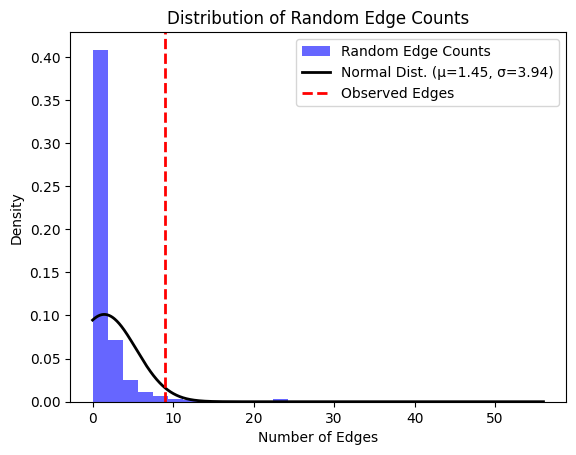

Genes mapped to gestational diabetes: 
gestational diabetes EFO_0004593
Genes mapped to gestational diabetes: 
['SLITRK6', 'MOB1AP1', 'LTBP4', 'NUMBL', 'SNRPGP16', 'MTNR1B', 'IGF2BP2', 'CDKAL1', 'TRPV3', 'PRMT6', 'GCKR', 'SPC25', 'ADCY5', 'CAST', 'TCF7L2', 'CCND2', 'AS1', 'MAP3K15', 'PPM1K', 'IL15RA', 'PPP1R12A', 'SLC30A8', 'CPO', 'CDKN2B', 'HKDC1', 'ARAP1', 'HLA', 'DQB1', 'MTCO3P1', 'RPL7P20', 'RPLP0P9', 'CTNND2', 'RNU6', '679P', 'EFNA5', 'ZBTB20', 'HPSE2', 'LDLRAD4', 'RPL7P45', 'DAOA', 'RN7SKP216', 'OSTF1P1', 'MED30', 'EXT1', 'NALF2', 'MUC12', 'MUC17', 'ANAPC4', 'RNU7', '126P', 'PRSS12', 'NDUFS5P5', 'LINC00616', 'RNA5SP286', 'RORB', 'LNPK', 'EVX2', 'RN7SKP93', 'MGAT5', 'SNORA72', 'MRPS18BP2', 'TRIB2', 'LINC00276', 'TACR1', 'GAPDHP57', 'CASC6', 'MIR4643', 'Y_RNA', 'RNU4', '12P', 'RAB27B', 'DLEU1', 'RNASEH2B', 'SEPTIN9', 'MDGA2', 'NEMF', 'PRIMA1', 'FAM181A', 'APOBEC3B', 'APOBEC3C', 'IGFBP7', 'LINC02173', 'ACTR6P1', 'NPY5R', 'RPL35AP12', 'PLXNA4', 'TSPAN12', 'ING3', 'AGBL1', 'CLDN16', '

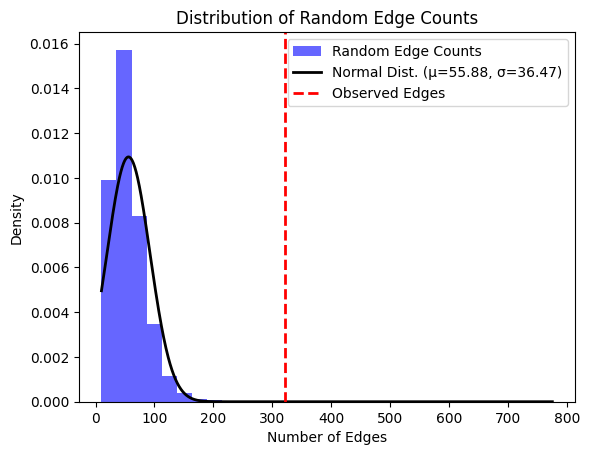

Genes mapped to coronary aneurysm: 
coronary aneurysm EFO_1000881
Genes mapped to coronary aneurysm: 
['NEBL', 'TUBA3C', 'PSPC1P1', 'SETBP1', 'ZNF618', 'MDGA1', 'MESP2', 'FHAD1', 'AS1', 'EFHD2', 'COL24A1', 'MYO3B', 'NAV2', 'CPNE4', 'CSMD1', 'TMTC2', 'CAMK1D', 'CSMD2', 'NRXN3', 'MACROD2', 'TSHZ2', 'CCDC197', 'GRK5', 'KCNN2', 'GRIN3A', 'TTC6', 'PPIAP21', 'RNU6', '743P', 'MAN1B1', 'DOCK2', 'UNC5B', 'Y_RNA', 'LINC00882', 'RN7SKP226', 'LINC00824', 'TIFAB', 'SLC25A48']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to hypothyroidism: 
hypothyroidism EFO_0004705
Genes mapped to hypothyroidism: 
['PTCSC2', 'VAV3', 'ATXN2', 'MICOS10', 'TPO', 'PDE8B', 'PDE10A', 'FMNL1', 'LINC01387', 'INSR', 'NFIB', 'AS1', 'LINC00327', 'ASIC2', 'MUC22', 'HCG22', 'HLA', 'DQB1', 'MTCO3P1', 'C1QTNF6', 'MTF1', 'ZBTB10', 'SH2B3', 'PHTF1', 'RSBN1', 'ATP5MGP4', 'RNU7', '197P', 'SLC4A1APP2', 'RN7SKP156', 'CTLA4', 'ZNF804B', 'C1QTNF12', 'UBE2J2', 'TNFRSF14', 'TNFRSF1B', 'SLC66A1',

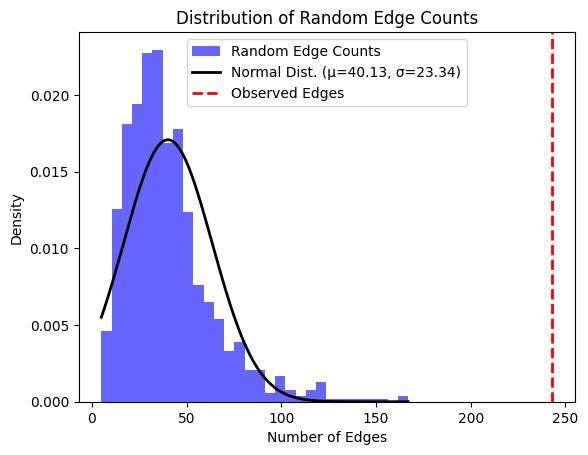

Genes mapped to hyperthyroidism: 
hyperthyroidism EFO_0009189
Genes mapped to hyperthyroidism: 
['SCIRT', 'PDE8B', 'FAM227B', 'PRDM11', 'LINC00511', 'PDE10A', 'MICOS10', 'PTCSC2', 'TMEM71', 'PTPN22', 'AP4B1', 'AS1', 'ATP6V1G3', 'PTPRC', 'CTLA4', 'ICOS', 'LPP', 'NOP56P1', 'LINC01623', 'ZNF70P1', 'HTATSF1P1', 'BACH2', 'PVT1', 'IL2RA', 'TSHR', 'RASGRP1', 'FGF7', 'MAFTRR', 'LINC01229', 'PRLR', 'RNASET2', 'MIR3939', 'TRIM27', 'HLA', 'DQB1', 'MTCO3P1', 'NCOA5', 'RPL13P2', 'NFIA', 'VAV3', 'CERS6', 'TESHL', 'DIRC3', 'GLIS3', 'PTCSC3', 'LINC00609', 'LINC01586', 'HSPA5', 'DT', 'MUC22', 'TNF', 'TSBP1', 'TAP2', 'PSMB8']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to mood instability measurement: 
mood instability measurement EFO_0008475
Genes mapped to mood instability measurement: 
['CELF4', 'MIR4318', 'AKAP8P1', 'JKAMPP1', 'CCDC68', 'LINC01929', 'HTR4', 'PPIAP21', 'RNU6', '743P', 'MIR548X2', 'MIR4704', 'TCF4', 'SLC15A5', 'ADGRG6', 'HIVEP2', 'PGAM5P1',

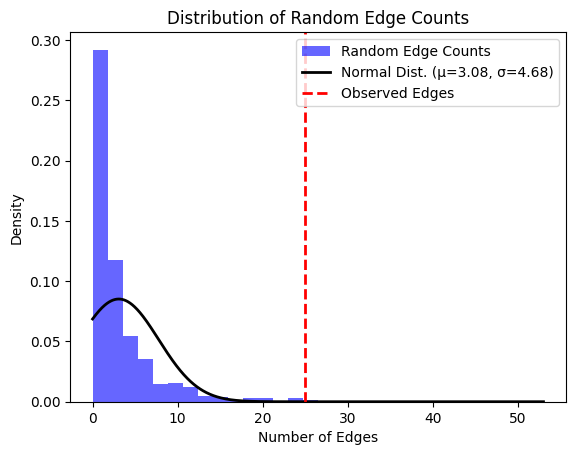

Genes mapped to chronic central serous retinopathy: 
chronic central serous retinopathy EFO_0009363
Genes mapped to chronic central serous retinopathy: 
['SLC7A5', 'CFH', 'ARFGEF1', 'PITPNC1', 'MEGF9', 'MIR29B2CHG', 'RBBP8NL', 'GATA5', 'RORA']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to social interaction measurement: 
social interaction measurement EFO_0009592
Genes mapped to social interaction measurement: 
['TET2', 'AS1', 'TENM2', 'LINC01982', 'LINC02089', 'RNU6', '567P', 'LINC03111', 'TNRC6B', 'FBXO36P1', 'LINC00674', 'NFIA', 'LINC02787', 'LRRN2', 'KLHL29', 'OTX1', 'RPL27P5', 'LINC01104', 'LINC01826', 'ELOAP1', 'LINC01470', 'LINC01215', 'IFT57', 'TCF4', 'LINC01415', 'KANK4', 'USP1', 'THSD7B', 'ACTL11P', 'CADM2', 'LINC01016', 'MIR9', '2HG', 'FBXL4', 'MIR548AI', 'TAC1', 'ASNS', 'LHFPL3', 'PPP1R3B', 'DT', 'TNKS', 'PCDH17', 'RNA5SP30', 'MIR2113', 'EIF4EBP2P3', 'LINC01505', 'PAX2', 'Y_RNA', 'BRINP1', 'LINC01613', 'SNORD3G', 'BARHL2', 'PTBP

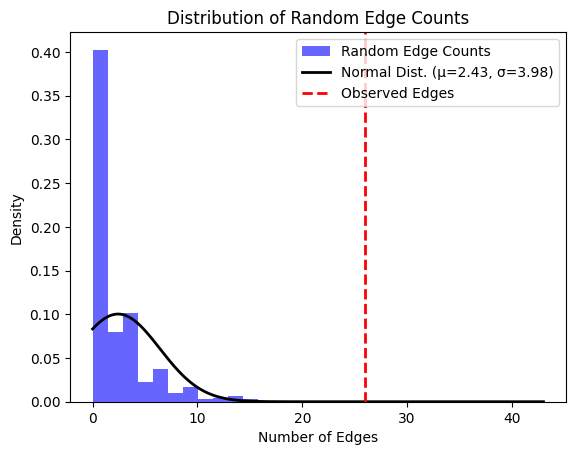

Genes mapped to appendicitis: 
appendicitis EFO_0007149
Genes mapped to appendicitis: 
['LINC01438', 'MIR297', 'CREG1', 'RCSD1', 'LINC00299', 'LINC02991', 'NDUFA10', 'ATP1B3', 'EMCN', 'PPP3CA', 'LINC02197', 'RNA5SP258', 'PPP2R2A', 'MRPL35P2', 'RPL7AP50', 'TET1P1', 'LINC00373', 'OR11H7', 'RNU6', '1014P', 'RN7SKP101', 'NFIA', 'TM2D1', 'INHBB', 'LINC01101', 'SLC25A26', 'ANLN', 'EXD3', 'LINC02663', 'LINC02670', 'GRIK4', 'NAV3', 'TMC2', 'KCNJ6', 'AS1', 'NEDD4L', 'NPHP1', 'MND1', 'TMEM131L', 'FFAR2', 'KRTDAP', 'MCF2L', 'CCDC74BP1', 'SMPD4P1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to pemphigus: 
pemphigus EFO_1000749
Genes mapped to pemphigus: 
['HLA', 'DQB1', 'MTCO3P1', 'DRB1', 'DQA1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to pemphigus vulgaris: 
pemphigus vulgaris EFO_0004719
Genes mapped to pemphigus vulgaris: 
['HLA', 'DQB1', 'MTCO3P1', 'DRB1', 'DQA1', 'RNU6', '592P', 'GLULP3', 'DQB3', 'D

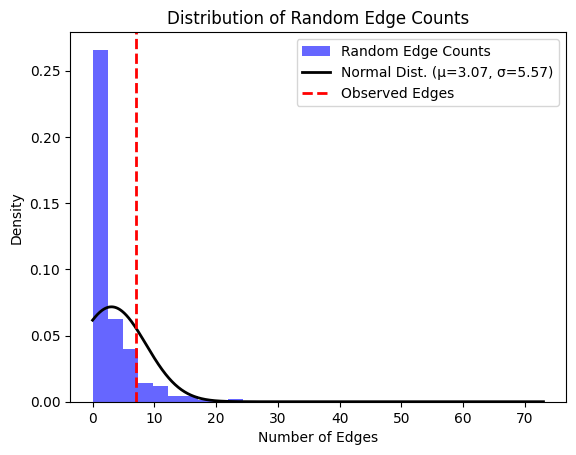

Genes mapped to optic neuritis, neuropathy: 
optic neuritis, neuropathy EFO_0004149
Genes mapped to optic neuritis, neuropathy: 
['LINC02780', 'LNX1', 'RPL21P44', 'TRDN', 'UNC5D', 'PNPT1', 'EFEMP1', 'CDKN2B', 'AS1', 'ATP7B']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to scoliosis: 
scoliosis EFO_0004273
Genes mapped to scoliosis: 
['RSPO1', 'AIRIM', 'CHL1', 'AS2', 'LINC01514', 'LBX1', 'AS1', 'ADGRG6', 'TMTC2', 'MAGI1', 'SLC25A26']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to disturbance of skin sensation: 
disturbance of skin sensation EFO_0009522
Genes mapped to disturbance of skin sensation: 
['ZNF277', 'AS1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to attention function measurement: 
attention function measurement EFO_0007636
Genes mapped to attention function measurement: 
['HNF4G', 'LINC02217', 'CFAP53', 'C16orf95', 'IL2RA', 'RPL6P22', 'RPL1

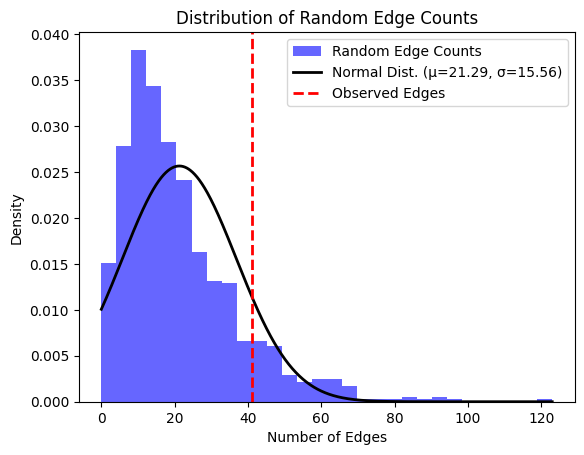

Genes mapped to adolescent idiopathic scoliosis: 
adolescent idiopathic scoliosis EFO_0005423
Genes mapped to adolescent idiopathic scoliosis: 
['LINC01514', 'LBX1', 'AS1', 'ADGRG6', 'RPL41P1', 'LINC01432', 'BNC2', 'CDH13', 'ABO', 'SOX6', 'EYA1', 'U8', 'GUSBP5', 'SEPHS1P2', 'LINC01579', 'LINC02994', 'MTMR11', 'ARF1', 'TBX1', 'LINC02378', 'MIR3974', 'CSMD1', 'SERPINH1P1', 'KIF24', 'RPSAP72', 'TENT5A', 'CREB5', 'NT5DC1', 'ZFAND2A', 'DT', 'UNCX', 'PLXNA2', 'AGMO', 'MEOX2', 'FTO', 'LINC01717', 'LINC01774', 'CNTFR', 'LMO3', 'SKP1P2', 'CCDC171', 'BOC', 'SEC16B', 'CRYZL2P', 'NKX6', '1', 'SLAMF6P1', 'UHMK1', 'CASC17', 'RNU7', '155P', 'PCDH9', 'LINC00297', 'LINC00572', 'MYO16', 'DPPA3P3', 'LINC00564', 'TRIM9', 'TMX1', 'TRAV30', 'GALNT16', 'LINC02312', 'LINC01550', 'WARS1', 'LINC02331', 'DDHD1', 'IFT43', 'GPATCH2L', 'PPP1R13B', 'ATP5MJ', 'OTX2', 'PRKCH', 'LINC02324', 'RPL21P7', 'MEG9', 'LINC02285', 'LINC03059', 'NUMB', '51P', 'RNU6ATAC28P', 'SLC8A3', 'ADAM21P1', 'TRD', 'ACIN1', 'AP5M1', 'NAA30',

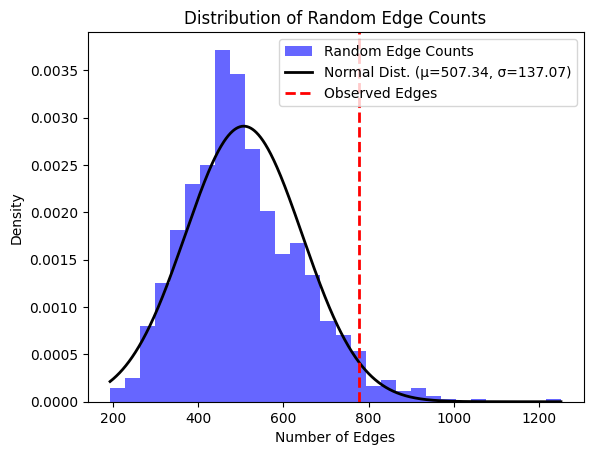

Genes mapped to alcohol withdrawal: 
alcohol withdrawal EFO_0004777
Genes mapped to alcohol withdrawal: 
['SORCS2']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to viral load: 
viral load EFO_0010125
Genes mapped to viral load: 
['IFNL4', 'HLA', 'B', 'RNU6', '283P', 'IGSF21', 'AKR7A2', 'TSSK3', 'FAM229A', 'SMIM12', 'SLC2A1', 'DT', 'PBX1', 'POU2F1', 'CD247', 'PLD5', 'C1orf202', 'COX20', 'COLEC11', 'DNAJC27', 'PPP1CB', 'SPDYA', 'ALK', 'FANCL', 'SMC4P1', 'THSD7B', 'U3', 'LINC01985', 'LARS2', 'CCRL2', 'CADPS', 'MAGI1', 'SLC9A9', 'NCBP2', 'AS1', 'ENPP7P11', 'FAM86MP', '420P', 'ADGRA3', 'MESTP3', 'LINC02364', 'RHOH', 'RPL17P20', 'RN7SL492P', 'DCK', 'MOB1B', 'C4orf17', 'LINC02374', 'LINC02514', 'LINC02112', 'ATPSCKMT', 'LINC00992', 'LINC02147', 'DNAJC18', 'SPRY4', 'FGF1', 'KCNIP1', 'RNF130', 'ELF2P2', 'FOXCUT', 'LINC01556', 'LINC01016', 'STX11', 'SNRPEP6', 'RPSAP40', 'RPS6KA2', 'CDCA7L', 'CREB5', 'SUGCT', 'CYP3A4', 'IQCA1L', 'RNA5SP407', 'RNA5SP408'

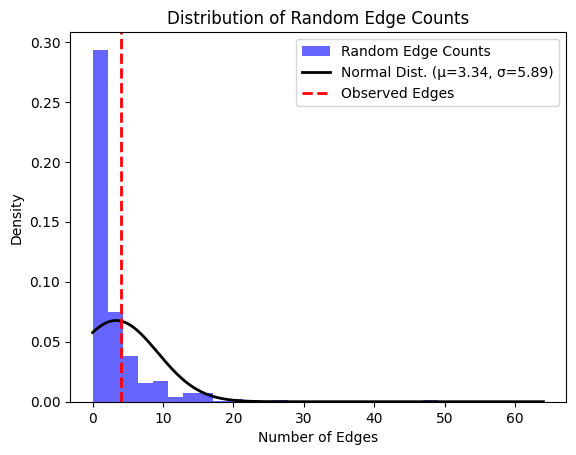

Genes mapped to nephrotic syndrome: 
nephrotic syndrome EFO_0004255
Genes mapped to nephrotic syndrome: 
['HLA', 'DQB1', 'MTCO3P1', 'CALHM6', 'TRAPPC3L', 'PARM1', 'PTPRC', 'KALRN', 'TSC22D2', 'BCL6', 'AS1', 'LINC01991', 'NWD2', 'LINC02531', 'U3', 'AHI1', 'ELMO1', 'PTPRD', 'LINC02664', 'ZNF345', 'BTC', 'DSE', 'CBX3P9', 'DRB1', 'DQA1', 'TSBP1', 'BTNL2', 'GPC5', 'LINC03079', 'LINC00494', 'NPHS1', 'TNFSF15', 'TNXB', 'MIR3672', 'TPT1P13', 'DRB9', 'DRB5', 'CLIC4', 'RUNX3', 'RPL27AP7', 'OPN5', 'KC6', 'LINC02188', 'LINC02181', 'RPL12P5', 'COCH', 'RRP12', 'CCDC66', 'CCDC162P', 'DELEC1', 'CLEC16A', 'CD28', 'MICA', 'GSDMB', 'TNFSF4', 'PHC1', 'MORF4L1', 'RNF39', 'TRIM31', 'HCG15', 'OR2AD1P', 'NFKBIL1', 'ALPG', 'SLC9C2', 'MUC16', 'APOL4', 'TNXA', 'FRG1JP', 'SCYGR5', 'SLC19A3', 'SLC6A18', 'SEMA3E', 'GHET1', 'PDIA4', 'DOCK8', 'SFMBT2', 'LINC02740', 'HNRNPKP3', 'RPL37P2', 'UNC93B5', 'KCNA5', 'LINC02443', 'LIMA1', 'HNRNPA1P69', 'LINC03056', 'ARID3B', 'HMG20A', 'LINC02182', 'ZNF469', 'MIDN']
Random edge

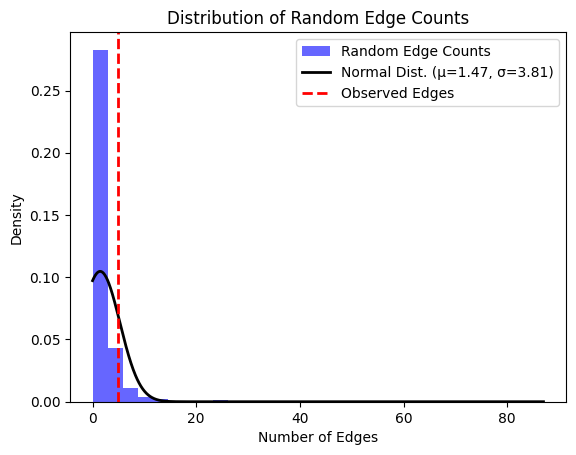

Genes mapped to childhood onset asthma: 
childhood onset asthma MONDO_0005405
Genes mapped to childhood onset asthma: 
['HLA', 'DPB2', 'MICB', 'CHCHD2P9', 'LNCARSR', 'RN7SL148P', 'SPMIP3', 'CRBN', 'SUMF1', 'RN7SKP279', 'DNAJB6P1', 'DCLK1', 'HS3ST3A1', 'COX10', 'DT', 'MKLN1', 'RNU6', '1120P', 'KCNMB2', 'RPL6P22', 'RPL10AP3', 'KLHL5', 'RNU2', '47P', 'LURAP1L', 'AS1', 'IGSF3', 'HPSE2', 'PSAP', 'MIR8062', 'RN7SL547P', 'ATG3', '243P', 'ARPP21', 'CDC5L', 'SUPT3H', 'SLC8A1', 'LINC02834', 'GAS1', 'RNA5SP228', 'NPY', 'XPR1', 'SRIP1', 'LINC02494', 'ABI3BP', 'FCF1P10', 'SOCS5P5', 'D2HGDH', 'ADORA1', 'FLG', 'CCDST', 'ATG5', 'BACH2', 'ZBTB9', 'RN7SL26P', 'TSBP1', 'DRA', 'DRB1', 'DQA1', 'SPRR5', 'LINC01527', 'RORC', 'RERE', 'IL1R1', 'TNFSF4', 'IL1RL2', 'LCE5A', 'LINC00299', 'PRCPP1', 'MAP4K4', 'AP1S3', 'SLC9A4', 'SLC9A2', 'TLR1', 'NAPGP2', 'MUC21', 'KLF3', 'RNA5SP158', 'IRF1', 'CARINH', 'RPS3AP21', 'CAMK4', 'WDR36', 'EEFSEC', 'GLB1', 'TIPARP', 'LPP', 'TH2LCRR', 'IL4', 'TBL1XR1', 'RAD50', 'ID4', 'RPL

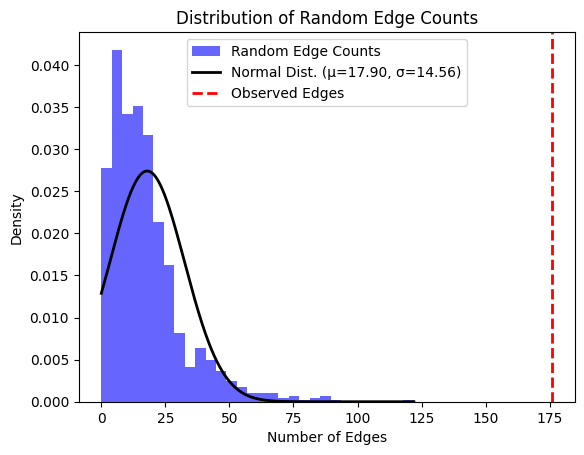

Genes mapped to anxiety disorder: 
anxiety disorder EFO_0006788
Genes mapped to anxiety disorder: 
['RDUR', 'AKAP8P1', 'JKAMPP1', 'NTRK2', 'MYH15', 'LINC03000', 'THSD7A', 'TMEM106B', 'TTC7B', 'LINC02321', 'SGO1', 'AS1', 'VENTXP7', 'LINC01777', 'LINC01646', 'DUSP29', 'LINC02719', 'GUCY1A2', 'LINC00578', 'MFAP3L', 'OR8A1', 'ST8SIA4', 'RN7SL802P', 'TMEM132D', 'PKD1L1', 'MGAM2', 'COL22A1', 'KCNK9', 'CXCL1', 'HNRNPA1P55', 'LINC01360', 'LINC02238', 'CNTNAP5', 'MAP2', 'SATB1', 'NIHCOLE', 'RNU6', '334P', 'RNU4', '69P', 'RPL23AP44', 'BTN1A1', '502P', 'PCLO', 'ANKK1', 'DRD2', 'SOX5', 'FARP1', 'ARIH2P1', '408P', 'RAB27B', 'ZFHX3', 'TRAIP', 'CCDC178', 'CELF4', 'DCC', 'ZSCAN12', 'ESR1', 'MAD1L1', 'MYOSLID', 'PLCL2', 'RABEPK', 'ITGB6', 'METTL15', 'LINC02758', 'NFIB', 'PAX5', 'BRINP1', 'LINC01613', 'TMPRSS5', 'IGSF9B', 'STK24', 'LRFN5', 'YLPM1', 'TRAF3', 'AMN', 'FURIN', 'IHO1', 'BPTF', 'ITIH1', 'LINC02058', 'POLD2P1', 'NCOA5', 'PDE4B', 'MSH5', 'CLIC1', 'LINC01830', 'ARHGAP15', 'FOXP2', 'MAPRE3', 'TME

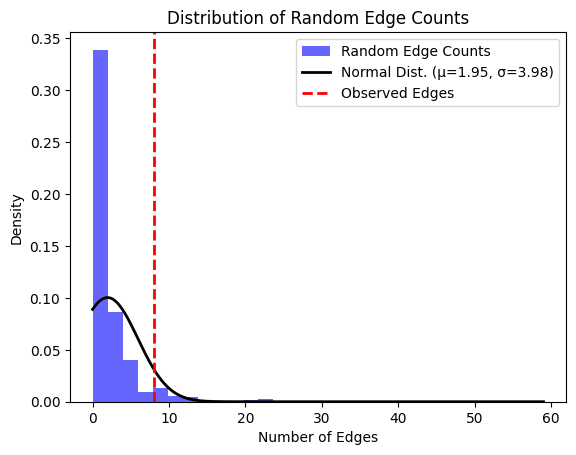

Genes mapped to Tendinopathy: 
Tendinopathy EFO_1001434
Genes mapped to Tendinopathy: 
['RNU4', '35P', '76P', 'CNTNAP2', 'MPP7', 'CACNA1E', 'SMARCD1', 'LINC02434', 'RPL7AP27']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to T wave morphology measurement: 
T wave morphology measurement EFO_0008398
Genes mapped to T wave morphology measurement: 
['RNF207', 'OLFML2B', 'NOS1AP', 'SCN10A', 'PREP', 'KCNH2', 'KCNQ1', 'SOX5', 'SSBP3', 'SCN5A', 'LINC01213', 'CAMK2D', 'KLF12']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to mosaic loss of chromosome Y measurement: 
mosaic loss of chromosome Y measurement EFO_0007783
Genes mapped to mosaic loss of chromosome Y measurement: 
['STARD4', 'AS1', 'NREP', 'CD164', 'RN7SL366P', 'C6orf118', 'MAD1L1', 'RBPMS', 'C11orf65', 'TCL1A', 'TUNAR', 'LINC00523', 'DLK1', 'CENPN', 'SLC35B1', 'FAM117A', 'LINC01478', 'RN7SKP6', 'PRR20A', 'NCOA5LP', 'CNEP1R1', 'ADGRG5', 'STXBP4', 'FL

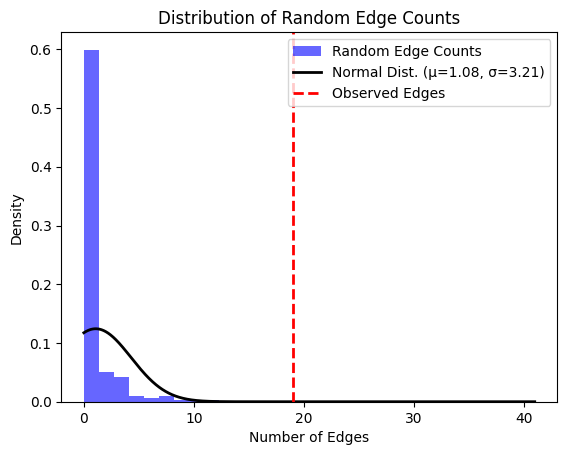

Genes mapped to hyperuricemia: 
hyperuricemia EFO_0009104
Genes mapped to hyperuricemia: 
['PKD2', 'ABCG2', 'ALDH2', 'SLC2A9', 'CNTN5', 'MALRD1', 'RNU6', '408P', 'MIR302F', 'LMCD1', 'AS1', 'ZNF730', 'ZNF724', 'FAM53A', 'AADACL2', 'NSUN3', 'ARMC10P1', 'EVA1CP1', 'OR7E35P', 'WDR1', 'RAF1P1', 'ZNF518B', 'CLNK', 'RNU1', '36P', 'BAZ1B', 'BCAS1', 'DPEP1', 'ETV5', 'GNAS', 'IGF1R', 'SYNM', 'KCNQ1', 'LRIG1', 'SLC25A26', 'LRP2', 'NFAT5', 'NFATC1', 'RREB1', 'SFMBT1', 'SIPA1L3', 'SLC22A12', 'TMEM171', 'UMOD', 'VEGFA', 'WDR72']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to time to first cigarette measurement: 
time to first cigarette measurement EFO_0010126
Genes mapped to time to first cigarette measurement: 
['MFSD2A', 'CAP1', 'SMIM19', 'CHRNB3', 'H3P30', 'KHSRPP1', 'CHRNA5']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to type 2 diabetes mellitus, peripheral arterial disease: 
type 2 diabetes mellitus, peri

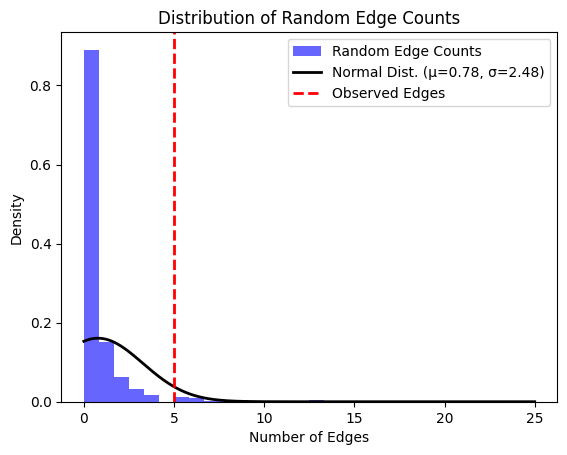

Genes mapped to ankle brachial index: 
ankle brachial index EFO_0003912
Genes mapped to ankle brachial index: 
['CDKN2B', 'AS1', 'LPA', 'DMD', 'RNA5SP231', 'RNU6', '832P', 'LRATD1', 'NBAS', 'COMMD10', 'ARID1B', 'TMEM242', 'SYBU', 'U2', 'DNAH5', 'RPL7AP57', 'FAT3', 'TMEM248P1', 'LINC02379', 'RNU5F', '8P', 'Y_RNA']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to response to corticosteroid, response to salmeterol, respiratory symptom change measurement: 
response to corticosteroid, response to salmeterol, respiratory symptom change measurement EFO_0010068
Genes mapped to response to corticosteroid, response to salmeterol, respiratory symptom change measurement: 
['STAU1', 'DDX27']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to attention deficit hyperactivity disorder, substance abuse: 
attention deficit hyperactivity disorder, substance abuse MONDO_0002491
Genes mapped to attention deficit hyperactivi

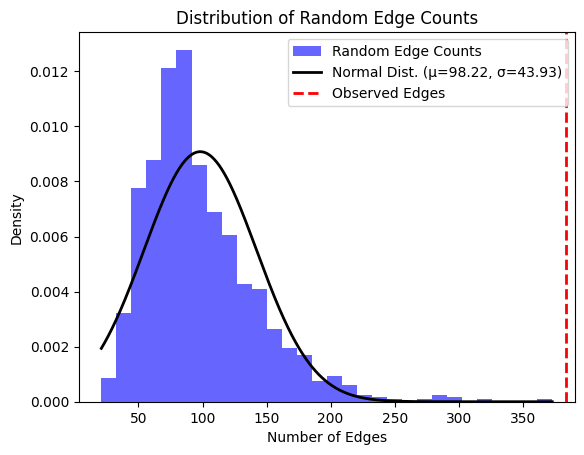

Genes mapped to Exercise induced anaphylaxis, wheat allergic reaction: 
Exercise induced anaphylaxis, wheat allergic reaction EFO_1001243
Genes mapped to Exercise induced anaphylaxis, wheat allergic reaction: 
['HLA', 'DRB1', 'DQA1', 'RBFOX1', 'DPB2']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to alcohol dependence, heroin dependence, methamphetamine dependence: 
alcohol dependence, heroin dependence, methamphetamine dependence EFO_0004701
Genes mapped to alcohol dependence, heroin dependence, methamphetamine dependence: 
['ANKS1B', 'AGBL4', 'IT1', 'CTNNA2']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to interstitial lung disease: 
interstitial lung disease EFO_0004244
Genes mapped to interstitial lung disease: 
['MUC5AC', 'MUC5B', 'HTR1E', 'RN7SKP209', 'LINC00882', 'ISCA1P1', 'HTR1A', 'LRRC34', 'TERT', 'DSP', 'AZGP1P1', 'ZKSCAN1', 'CSMD1', 'MUC2', 'ATP11A', 'IVD', 'DPP9', 'FAM13A', 'STN1', 'MAPT

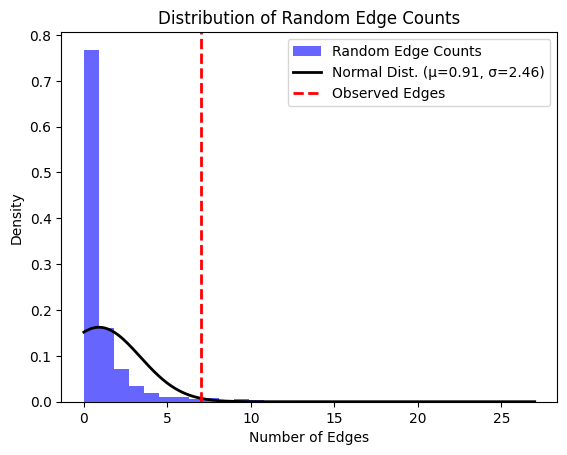

Genes mapped to age at first birth measurement, uterine fibroid: 
age at first birth measurement, uterine fibroid EFO_0000731
Genes mapped to age at first birth measurement, uterine fibroid: 
['SIRT3', 'PDHX', 'CD44', 'DT', 'LINC00598', 'KANK1', 'DMRT1', 'ZNF346', 'MACORIS', 'MCM8', 'BABAM2', 'ACTRT3', 'PDLIM5', 'KRT18P9', 'CYCSP55', 'MTCYBP6', 'WNT2', 'PTPRR', 'SBNO1', 'AS1', 'KMT5A', 'SLC66A3', 'GREB1', 'MIR3681HG', 'ATOH1', 'SMARCAD1', 'SCFD2', 'LNX1', 'TERT', 'SYNE1', 'RAP2C', 'TP53', 'CDC42', 'WNT4', 'C11orf65', 'THEM7P', 'WT1', 'SLC38A4', 'SLC7A3', 'STN1', 'TNRC6B', 'ARL14EP', 'SULT1B1', 'POGLUT3', 'RIC8A', 'COG6', 'SNORD116', 'FOXO1', 'SLK', 'BET1L', 'LINC01122', 'IGF1', 'LINC00485', 'SVOP', 'PSME2P2', 'FNDC3A', 'DIRC1', 'COL3A1', 'KCNAB1', 'ITGA11', 'LINC01418', 'BNC1', 'SH3GL3', 'LINC02253', 'LINC01989', 'LINC01695', 'LINC00161', 'U6', 'MYO18B', 'SPANXN3', 'SLITRK4', 'RMEL3', 'CASZ1', 'RBMS1', 'THEMIS', 'PCDH7', 'GUCY1A1', 'RNA5SP349', 'LINC02715', 'GPBP1', 'ZFP57', 'HLA', 'F'

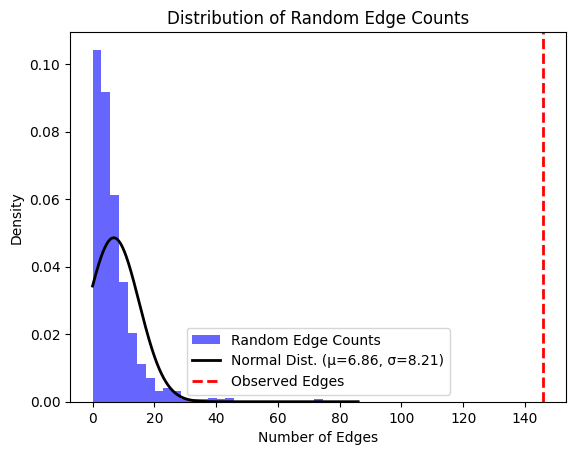

Genes mapped to hippocampal volume: 
hippocampal volume EFO_0005035
Genes mapped to hippocampal volume: 
['ACTL8', 'LINC01654', 'YBX1P9', 'PARP1', 'RYR2', 'NR3C2', 'OR7H2P', 'RNA5SP188', 'HULC', 'OFCC1', 'SFRP4', 'STARD3NL', 'GDAP1', 'SNTB1', 'RPL35AP19', 'RYR3', 'CEDORA', 'HSBP1', 'CDH13', 'MIR646HG', 'COLGALT2', 'ABCB11', 'GSK3B', 'ARAP2', 'IRF2', 'FARS2', 'RN7SL221P', 'KRT18P64', 'LINC02535', 'AHI1', 'DT', 'CYP51A1', 'AKAP9', 'DSCAML1', 'IL34', 'GPR160P2', 'ZNF30', 'AS1', 'APOE', 'APOC1', 'MCM5', 'BRD10', 'LINC01714', 'RNU6', '991P', 'PDGFRL', 'HNRNPA1P67', 'RNU4ATAC9P', 'LINC00701', 'LINC02645', 'LINC00448', 'LINC00376', 'JPH3', 'MRPL50P1', 'RPL21P36', 'SDAD1', 'ART3', 'MED13L', 'MIR4472', '2', 'MTCL1P1', 'LINC00348', 'RCAN1', 'HRK', 'RPL36P15', 'MSRB3', 'SHH', 'Y_RNA', 'ASTN2', 'DPP4', 'MAST4', 'APOOP3', 'LEMD3', 'ZNF326', '695P', 'AIFM1P1', 'MALRD1', 'UTP20', 'LINC02141', 'MPP7', 'HMGB1', 'GZMB', 'STXBP6', 'SLC4A10', 'TFDP2', 'EEF1AKMT2', 'PARP11', 'EPPK1', 'PLEC', 'SHARPIN', 'EL

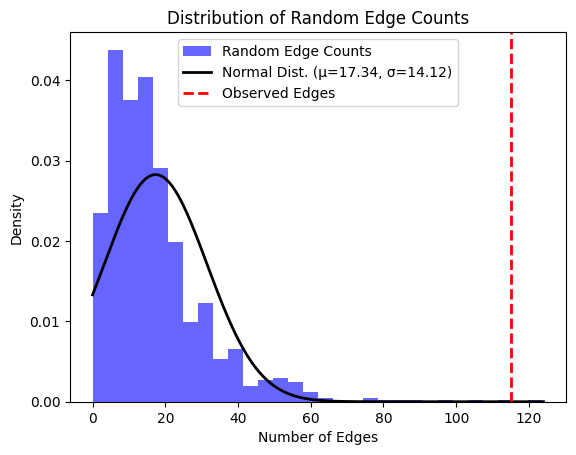

Genes mapped to response to trauma exposure, caudate nucleus volume: 
response to trauma exposure, caudate nucleus volume EFO_0004830
Genes mapped to response to trauma exposure, caudate nucleus volume: 
['LIN9', 'MYT1L', 'LINC01818', 'PPARG', 'TSEN2', 'BBS12', 'LINC01419', 'TPM3P3', 'KIAA1958', 'MOK', 'NPAS3', 'MIR9', '2HG', 'PRDM16', 'TMEM161B', 'DT', 'STAG3L5P', 'PVRIG2P', 'PILRB', 'PBX3', 'FAT3', 'KTN1', 'RPL13AP3', 'DEGS2', 'YY1', 'PLA2G10KP', 'ATXN2L', 'ZFHX3', 'ZCCHC14', 'JPH3', 'BCL2L1', 'MYLK2', 'ATP5PBP6', 'FILNC1', 'NKAIN3']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to trait in response to teriparatide, spine bone mineral density: 
trait in response to teriparatide, spine bone mineral density EFO_0007701
Genes mapped to trait in response to teriparatide, spine bone mineral density: 
['LINC01997', 'MECOM', 'PCBP3', 'COL6A1', 'YWHAQP1', 'TUBBP3', 'OSTF1P1', 'Y_RNA', 'AHR', 'DYNC2H1', 'PPIAP34', 'ZBTB40', 'GNG12', 'AS1', 'WLS', 'SP

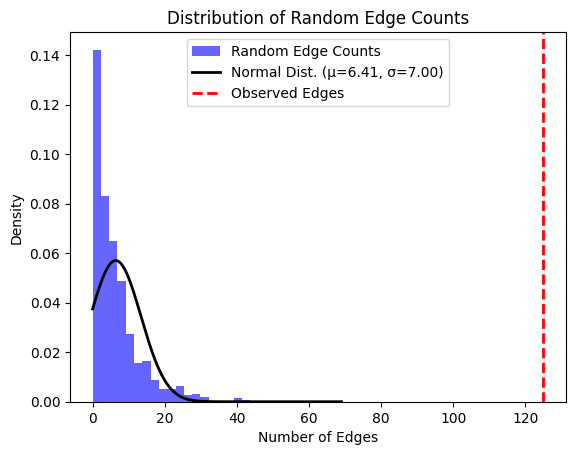

Genes mapped to trait in response to teriparatide, femoral neck bone mineral density: 
trait in response to teriparatide, femoral neck bone mineral density EFO_0007785
Genes mapped to trait in response to teriparatide, femoral neck bone mineral density: 
['PSMG4', 'LINC02562', 'LINC02483', 'PLXNA4', 'LINC02791', 'LINC01758', 'BUD13', 'RNA5SP189', 'LINC01950', 'KANK1', 'DMRT1', 'MEF2C', 'AS1', 'GNG12', 'WLS', 'LINP1', 'LINC02751', 'LINC02384', 'LINC03101', 'CTDP1', 'DT', 'MC5R', 'MC2R', 'SMG6', 'LINC01787', 'LINC01720', 'ATP13A3', 'CDC5L', 'SUPT3H', 'PARAIL', 'GRID1', 'UBBP5', 'LIN28AP2', 'RIN2', 'ZBTB46', 'SYN3', 'USF3', 'RN7SKP15', 'PTHLH', 'PDXDC1', 'HIGD1AP18', 'PKIA', 'RERE', 'RPS4XP9', 'RSPO3', 'LINC02128', 'LINC02127', 'CDKAL1', 'LINC00581', 'COL11A1', 'RPS27P4', 'MRPS31P1', 'DNM3', 'GRB10', 'FAM210A', 'FOXL1', 'LINC02188', 'FUBP3', 'WHSC1L2P', 'SOST', 'ROCR', 'PPIAP34', 'ZBTB40', 'MARK3', 'LINC02898', 'PKDCC', 'RSPH14', 'ABCF2', 'H2BK1', 'MTERF2', 'TMEM263', 'RPS3AP2', 'PTX4', '

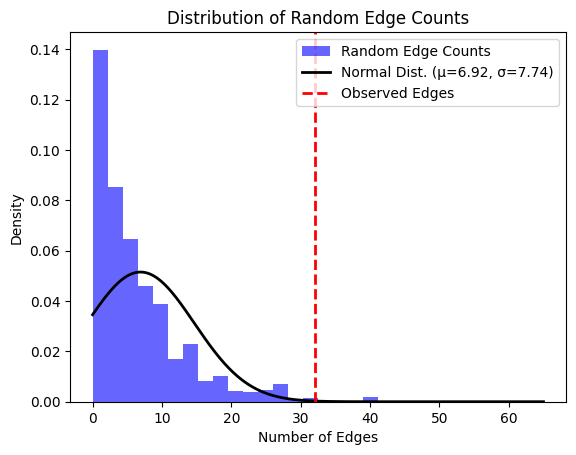

Genes mapped to beta-amyloid 1-42 measurement: 
beta-amyloid 1-42 measurement EFO_0004670
Genes mapped to beta-amyloid 1-42 measurement: 
['RPL7P19', 'ETF1', 'RBMXP1', 'PRR11P1', 'NECTIN2', 'AKR7A3', 'KRT8P21', 'RN7SKP19', 'RPS24P8', 'TMEM158', 'CLIC5', 'FILIP1', 'GRIN2B', 'LINC00648', 'RNU6', '297P', 'KCNK10', 'TEKT5', 'ADAMTS18', 'TRPV2', 'MMP28', 'NACA2', 'BRIP1', 'LINC01416', 'LINC01905', 'APOE', 'LZTS1', 'TMEM97P2', 'FRA10AC1', 'LGI1', 'ARK2C', 'TNIK', '348P', 'EDRF1', 'DT', 'AS1', 'RGS19', 'TOMM40', 'CCDC134', 'APOC1', 'RPSAP20', 'LINC01767', 'CYP19A1', 'MIR4713HG', 'RPSAP52', 'PODXL', 'EEF1B2P6', 'LINC01626', 'GPX1P2', 'EIF4A1P1', 'SUCLG2', 'LINC02817', 'ANKRD50', 'FAT4', 'HMGB1P20', 'ELOVL5', 'HECW1', 'HSD17B3', 'SPATA8', 'RN7SKP181', 'MAPRE2', 'DMRTB1', 'GLIS1', 'SERPINB1', 'CCDC148', 'KIF9', 'LINC02496', 'MIR548AG1', 'NDUFB5P1', 'LINC00290', 'CDH9', 'NLN', 'NECAP1P1', 'GPR141', 'LINC00348', 'C14orf132', 'BDKRB2', 'RNF111', 'MARK4', 'PPP1R37', 'RNU7', '92P', 'LINC01522', 'APOC

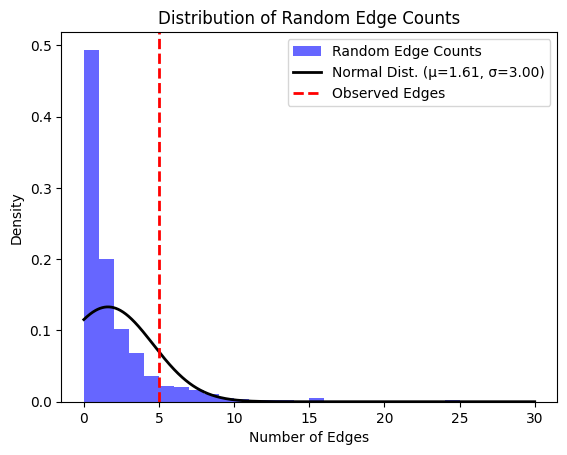

Genes mapped to t-tau measurement: 
t-tau measurement EFO_0004760
Genes mapped to t-tau measurement: 
['GOLIM4', 'C5orf22', 'RNU6', '363P', 'ARK2C', 'LINC01192', 'NGRNP1', 'DMGDH', 'LINC02932', 'MTERF1', 'APOE', 'RPL13AP13', 'FST', 'CYTH3', 'CAMK2B', 'NUDCD3', 'SYT9', 'CSF3R', 'FTLP18', 'SLC25A48', 'CEP170B', 'PLD4', 'FSHR', 'LINC02063', 'LINC02114', 'WDR5', 'ETV6', 'BCL2L14', 'LINC02439', 'SRRM4', 'CCDC3', 'EPC2', 'RNU2', '9P', 'TOMM40', 'GMNC', 'OSTN', 'GLIS3', 'CDH4', 'MARCO', 'C1QL2', 'TMEM74', 'SLC5A4', 'AS1', 'RFPL3', 'MAPT', 'PRKN', 'IL2RA', 'RPL32P23', 'LINC01239', 'SUMO2P2', 'AKT2', 'BRAF', 'CCT4P1', 'COL22A1', 'KCNK9', 'ZNF556', 'RPS15AP34', 'LINC02165', 'TTC28', 'PPP2R2B', 'IGF2BP3', 'RPS2P32', 'MPP4', 'ASB17', 'ST6GALNAC3', 'COX17', 'JAKMIP1', 'C4orf50', 'RPS3AP9', 'LINC01035', 'DLGAP2', 'PLXDC1', 'MX2', 'LINC01046', 'ESRRAP2', 'DND1P1', 'MAPK8IP1P2', 'NSFP1', 'ARL17A', 'F5', 'SLC25A26', 'BCAS3', 'LINC02276', 'IL15', 'ADAMTS12', 'ZDHHC14', 'SNX9', 'UBQLN4P2', 'ATP5PBP4', 'F

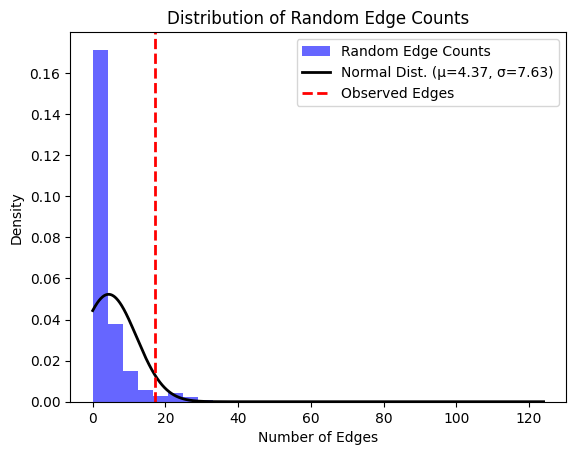

Genes mapped to p-tau measurement: 
p-tau measurement EFO_0004763
Genes mapped to p-tau measurement: 
['SLC25A48', 'ANO3', 'RN7SL714P', 'LINC02914', 'LINC02852', 'LETR1', 'CMAHP', 'AUTS2', 'GALNT17', 'LINC02882', 'CSF3R', 'FTLP18', 'PATJ', 'RPL13AP13', 'FST', 'CCDC3', 'LRRC4C', 'APOE', 'GLIS3', 'NCR2', 'FOXP4', 'AS1', 'LRRFIP2', 'RPS16P4', 'LINC02582', 'UPP2', 'MIR5702', 'IRS1', 'UNC5C', 'TTC28', 'ADGRL2', 'LINC01362', 'CYP2F2P', 'DDX49', 'PCDH8', 'OLFM4', 'LINC03101', 'CTDP1', 'DT', 'GMNC', 'OSTN', 'DNAAF5', 'SUN1', 'PTPRD', 'GTF3AP5', 'AGMO', 'LINC02889', 'LINC02888', 'HORMAD2', 'MTMR3', 'ZNF536', 'NRG1', 'CRIPT', 'PTMAP6', 'RNU6', '929P', 'EXOC1L', 'EXOC1', 'LINC02997', '1232P', 'IL34', 'TMEM63C', 'RPL7L1P15', '667P', 'RPS3AP5', 'LINC01519', 'DTWD2', 'MTBP', 'CYTIP', 'BIN1', 'NIFKP9', 'C16orf95', 'APOC1', 'Y_RNA', 'RPL6P21', 'RNA5SP271', 'KCNB2', 'APOC1P1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to memory performance: 
memory perform

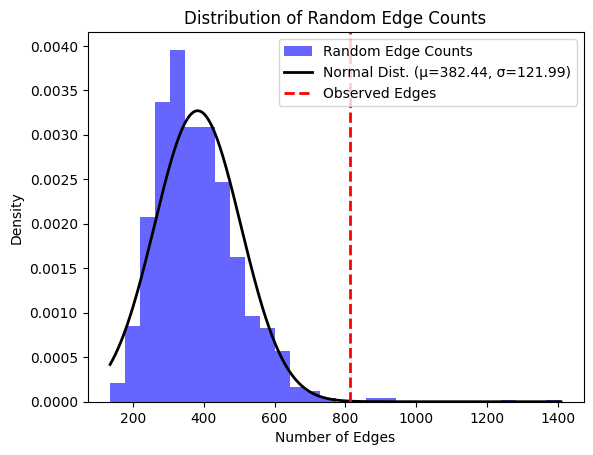

Genes mapped to rheumatoid arthritis: 
rheumatoid arthritis EFO_0000685
Genes mapped to rheumatoid arthritis: 
['LNCRNA', 'IUR', 'FAM76B', 'EOMES', 'LINC01980', 'NUP88', 'RABEP1', 'ICOSLG', 'RTKN2', 'LINC02621', 'LINC02356', 'OS9', 'ATG5', 'PRKCH', 'RNF182', 'CD83', 'LINC02664', 'LINC02786', 'LINC01343', 'FLACC1', 'CASP8', 'CDK6', 'TXNDC11', 'AS1', 'WDFY4', 'TPD52', 'PPIL4', 'RCAN1', 'IFNAR1', 'IFNGR2', 'LINC00824', 'GAPDHP64', 'NEFHP1', 'CSF2', 'P4HA2', 'SFTPD', 'RN7SL563P', 'GRHL2', 'DT', 'HLA', 'DRB9', 'CCR6', 'TNFAIP3', 'LINC02865', 'CTLA4', 'ICOS', 'ANKRD55', 'ARID5B', 'STAT4', 'NFKBIE', 'TMEM151B', 'PADI4', 'LINC03004', 'DRAIC', 'RASGRP1', 'LINC01104', 'PTPN2', 'LINC02357', 'RBPJ', 'CD40', 'IRF5', 'SYNGR1', 'MMEL1', 'SPRED2', 'Y_RNA', 'CXCR5', 'REL', 'CCL21', 'SPATA31F1', 'ZPBP2', 'FAM167A', 'BLK', 'COG6', 'CDKN2AIPNLP3', 'CD28', 'KRT18P39', 'UBASH3A', 'MTF1', 'IRF4', 'EXOC2', 'IL2RA', 'ETS1', 'FLI1', 'TAGAP', 'TNFSF4', 'LINC02132', 'LINC01082', 'PADI2', 'MACIR', 'PLCL2', 'RUNX1'

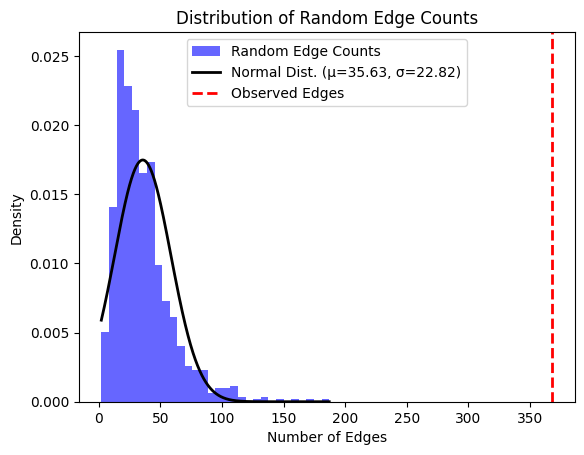

Genes mapped to obsessive-compulsive disorder: 
obsessive-compulsive disorder EFO_0004242
Genes mapped to obsessive-compulsive disorder: 
['GPR135', 'NHLRC2', 'ADRB1', 'MIR6078', 'LINC00702', 'LMO7', 'GRID2', 'TUSC3', 'PPM1AP1', 'RPL6P25', 'SLC6A15', 'RPL23AP39', 'RPL21P17', 'S100A7', 'RN7SL44P', 'CD320', 'SLCO1C1', 'SLCO1B3', 'RNU6', '655P', 'Y_RNA', 'TUBGCP5', 'HCAR2', 'HCAR3', 'RPL31P35', 'SEC61G', 'PDE4D', 'CHCHD2P3', 'LSM14A', 'ZNF804B', '274P', 'ADCK1', 'LINC02395', 'GRIK2', 'R3HDM2P2', 'RPS10P21', 'RPL18AP17', 'LINC02225', 'LINC02101', 'LINC01581', 'H3P40', 'SH3BGRL2', 'AKAP8P1', 'JKAMPP1', 'LINC02211', '374P', 'LINC01242', 'CDRT15P5', 'MALRD1', 'COX11', 'ZNF543', 'ZNF304', 'LINC00970', 'RPS15AP14', 'EXTL2P1', 'PRDX5P1', 'LINC02005', 'CD200', 'IQCJ', 'SCHIP1', 'CRLF3P2', 'EEF1A1P20', 'ABRACL', 'HECA', 'ADAM21P1', 'COX16', 'WARS1', 'PRKCB', 'HS3ST3B1', 'RPS18P12', 'LINC01320', 'UBTD2', 'UFL1', 'AS1', 'MIR378C', 'TCERG1L', 'SEMA6D', 'LINC02490', 'LINC02096', 'TMX4', 'SLC37A1', 'TN

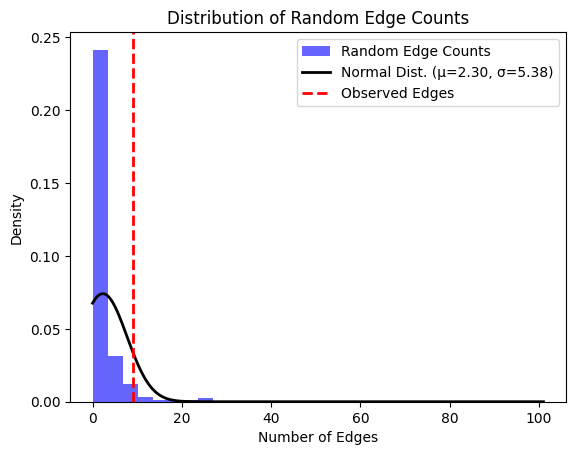

Genes mapped to schizophrenia, grey matter volume measurement: 
schizophrenia, grey matter volume measurement EFO_0005420
Genes mapped to schizophrenia, grey matter volume measurement: 
['RNA5SP200', 'STC2', 'GMDS', 'RN7SL332P', 'JARID2', 'DT', 'ASCC3', 'PSD3', 'ADRA1A', 'MIR548H4', 'RPSAP74', 'KRT8P4', 'STN1', 'RFX7', 'RBM38', 'HMGB1P1', 'LINC02782', 'MIR4689', 'ADGRL2', 'RNU6', '983P', 'LINC01724', 'SEMA5B', 'NXPH1', 'GAPDHP68', 'RBPMS', 'IMP3P1', 'AKAP8P1', 'CUBN', 'NPS', 'FOXI2', 'RPL12P46', 'LINC02698', 'NTN1', 'TMEM9', 'IGFN1', 'LINC00309', 'MIR4433B', 'VENTXP4', 'LRRC3B', 'AS1', 'OR7H2P', 'RNA5SP188', 'NA', 'BOD1', 'HS3ST5', 'HDAC2', 'AS2', 'TBXAS1', 'PIK3C2G']
Random edges calculation completed

z score: 1.919294223751919



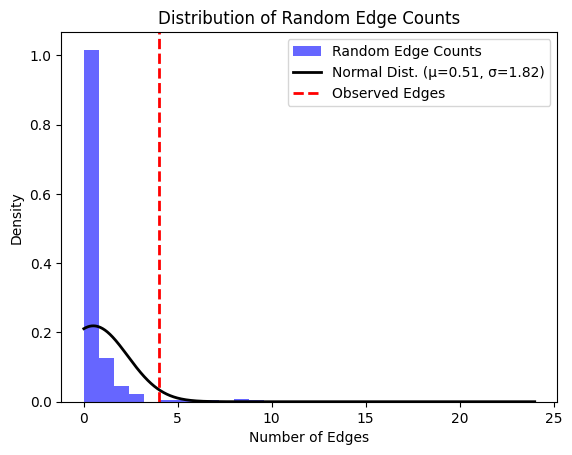

Genes mapped to proliferative diabetic retinopathy: 
proliferative diabetic retinopathy EFO_0009322
Genes mapped to proliferative diabetic retinopathy: 
['DPP10', 'KCNQ5', 'RPS3AP5', 'LINC01519', 'LINC02814', 'SEC11C', 'GRP', 'C1orf94', 'ZFP82', 'UBA52P7', 'RN7SL865P', 'Y_RNA', 'MKNK2P1', 'SLC16A7', 'STUM', 'GPATCH2', 'LINC00523', 'DLK1', 'GOLIM4', 'EGFEM1P', 'ZNF572', 'SQLE', 'DT', 'OC90', 'STAT2', 'RBFOX1', 'LINC01777', 'LINC01646', 'TPT1P4', 'UTRN', 'PRKAG2', 'MIR378C', 'NAALADL2', 'COMMD1', 'CPM', 'NNT', 'RNU6', '381P', 'FN1', 'LINC00607', 'LINC01790', '169P', 'CD96', 'LINC02672', 'SNTB1', 'RPL35AP19', 'RN7SL691P', 'RN7SL193P', 'BDH2P1', 'FAXC', 'TBC1D5', 'KCNN3', 'WDR72', 'HLA', 'B', 'GAP43', 'LINC01720', 'HNRNPA1P46', 'IL12B', 'LINC01845', 'NRXN3', 'DIO2']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to diabetic retinopathy: 
diabetic retinopathy EFO_0003770
Genes mapped to diabetic retinopathy: 
['SPRY4', 'AS1', 'GPR158', 'POT1', 'GRM8

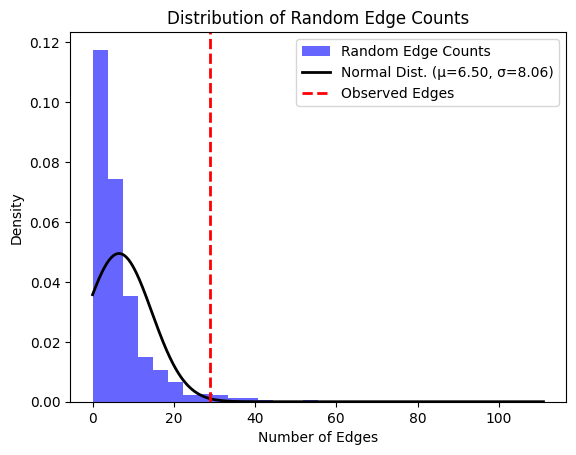

Genes mapped to epilepsy: 
epilepsy EFO_0000474
Genes mapped to epilepsy: 
['EIF2S2P7', 'ACTG1P22', 'SCN1A', 'AS1', 'NCOA5LP', 'CNEP1R1', 'CAMSAP2', 'C1orf94', 'MIR552', 'NFE2L1', 'DT', 'PLA2G4A', 'VRK2', 'LINC01412', 'IQCM', 'CHRM3', 'MAST4', 'PCDH7', 'LINC02497', 'GOLIM4', 'EGFEM1P', 'GABRG1', 'GABRA2', 'SYT2', 'EPHB1', 'LINC02109', 'NPM1P10', 'HACE1', 'HDAC9', 'MRPL42P4', 'SRSF8CP', 'ADRA1A', 'MIR548H4', 'LINC03041', 'IFNA6', 'MIR31HG', 'GARIN3P1', 'LINC03106', 'TPT1P9', 'LINC02578', 'GFRA1', 'CCDC172', 'Y_RNA', 'LINC02409', 'ZNF646P1', 'LINC00558', 'RPL31P5', 'GCATP1', 'ADPGK', 'NPM1P42', 'CRAMP1', 'COTL1', 'RPS4XP19', 'NDUFV2', 'GTSCR1', 'LINC01541', 'LINC01899', 'CBLN2', 'PDE7A', 'DNAJC5B', 'ABRA', 'HMGB1P46', 'PTCHD3', 'RAB18', 'CUX2', 'LINC02356', 'BRAP', 'ALDH2', 'NAA25', 'RPH3A', 'SOCS5P1', 'GRM3', 'TNKS', 'MIR124', '1HG', 'ADGRL3', 'EXT1', 'AUTS2', 'ZNF217', 'RNU7', '14P', 'OGA', 'GBF1', 'RNA5SP286', 'RORB']
The number of edges in the network is less than the minimum require

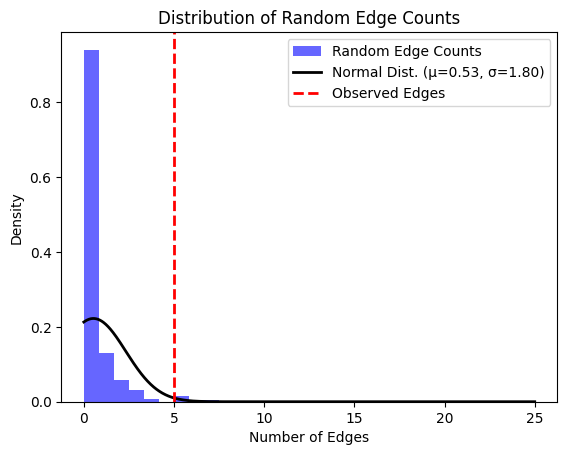

Genes mapped to acne: 
acne EFO_0003894
Genes mapped to acne: 
['LAMC1', 'LAMC2', 'LGR6', 'UBE2T', 'LYPLAL1', 'DT', 'U3', 'NXNP1', 'AS1', 'RNA5SP94', 'MIR4432HG', 'GLI2', 'Y_RNA', 'WNT10A', 'AFG2A', 'SPRY1', 'RPL13AP13', 'FST', 'RNU6ATAC2P', 'HMGN1P17', 'SUGCT', 'PINX1', 'RASSF10', 'BMAL1', 'NAALADL1', 'CDCA5', 'PCNX3', 'SEMA4B', 'ADORA2A', 'CCDC38', 'SNRPF', 'EEF1D', 'RPSAP72', 'TENT5A', 'NLN', 'FHOD3', 'SDK1', 'PPP1R17', 'CALN1', 'BRD7P6', 'TGFA', 'WSCD2', 'LINC01187', 'PPP1R3B', 'LARS2', 'RNASEH2C', 'KRT8P26', 'SGO1', 'UBE2E1', 'TBC1D22B', 'CRELD2', 'PIM3', 'FIRRM', 'CSTPP1', 'MRPS36P2', 'LINC02374', 'ERRFI1', 'FAM86B3P', 'PRAG1', 'DLC1', 'SHB', 'NAV2', 'AMANZI', 'XIAPP3', 'BORCS5', 'SYN2', 'TRPM7', 'DLG1', 'CLEC16A', 'ADAMTS18', 'LINC02131', 'C5orf67', 'SYN3', 'TIMP3', 'MIR3936HG', 'SLC22A4', 'RSL24D1P1', 'H4C10P', 'TBX18', 'RPL31P32', 'ATG5', 'COX5BP8', 'SOAT1', 'INAVA', 'PPP1R12B', 'MRPL49', 'SYVN1', 'EDAR', 'MYEOV', 'PWWP2AP1', 'ARF4P4', 'CSTA', 'PRMT5P1', 'EDNRA', 'FGF10', 'PAR

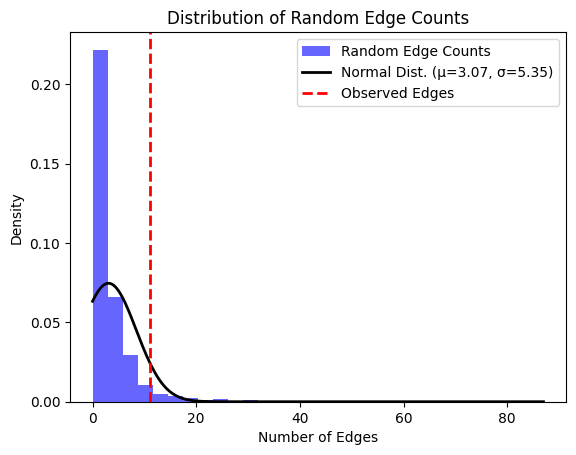

Genes mapped to intraocular pressure measurement: 
intraocular pressure measurement EFO_0004695
Genes mapped to intraocular pressure measurement: 
['ETV1', 'Y_RNA', 'ST7', 'OT4', 'GLIS3', 'ABCA1', 'CT70', 'SMIM12', 'PTCH2', 'RNA5SP54', 'DRAM2', 'COLEC11', 'ALLC', 'TRIB2', 'LINC00276', 'SPTBN1', 'AS1', 'HS3ST1', 'LINC02360', 'RNU7', '66P', 'RNA5SP208', 'TRDN', 'RNU6', '912P', '973P', 'CYP4F44P', 'HSPA8P13', 'GRTP1', 'ADPRHL1', 'OXA1L', 'PWRN1', 'ERVK13', '1', 'CRK', 'LINC01697', 'OR4A16', 'OR4A15', 'SEMA3C', 'EIF4EP4', 'EXOC2', 'ANGPT1', 'THADA', 'CTTNBP2', 'LSM8', 'SOS2', 'COL8A2', 'PARD3B', 'RSPO1', 'ABO', 'ZNF280D', 'TCF12', 'DT', 'PNPT1', 'EFEMP1', 'FBXL17', 'LINC01023', 'TXNRD2', 'LINC00574', 'RPL12P23', 'HIGD1AP18', 'PKIA', 'C2orf73', 'PCSK5', 'BABAM2', 'RN7SL636P', 'COX6CP2', 'PKN2', 'RN7SL680P', 'HSPE1P1', 'LINC01833', 'SYNDIG1L', 'NPC2', 'TMCO1', 'GAS7', 'CAV2', 'CAV1', 'DGKG', 'LINC02020', 'AFAP1', 'LMX1B', 'HMGB1P46', 'FMNL2', 'NUP160', 'PTPRJ', 'ARHGEF12', 'ELF2P2', 'FOXCUT'

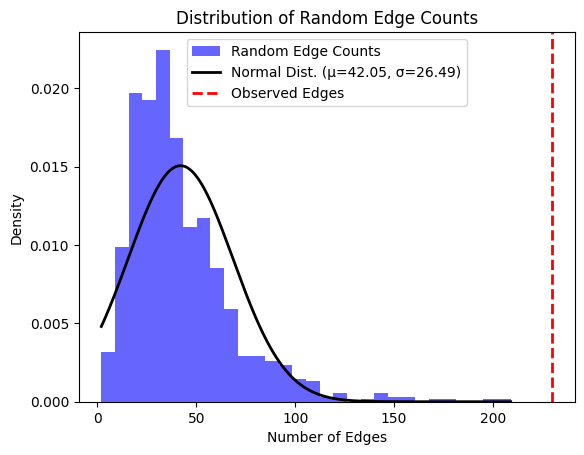

Genes mapped to serum alanine aminotransferase measurement: 
serum alanine aminotransferase measurement EFO_0004735
Genes mapped to serum alanine aminotransferase measurement: 
['STON1', 'GTF2A1L', 'KRT18P32', 'MIPEPP2', 'LINC01812', 'FBXL12P1', 'RAD18', 'NDST4', 'LINC01847', 'LY86', 'BTF3P7', 'LINGO2', 'ME2P1', 'PTCH1', 'CDCP2', 'GRHL3', 'ARHGEF4', 'RPLP0P7', 'CDK7P1', 'AFAP1', 'ATP10D', 'CMYA5', 'LINC01455', 'HLA', 'DQA1', 'DQB1', 'LRFN2', 'UNC5CL', 'PDSS2', 'PRKN', 'LINC02902', 'PKD1L1', 'NKX2', '3', 'SLC25A28', 'ADGRA1', 'LUZP2', 'RCN1', 'Y_RNA', 'DUX4L52', 'RASA3', 'RAD51B', 'DUT', 'FBN1', 'ADAMTS18', 'LINC02131', 'BDP1P', 'RNA5SP461', 'LINC03103', 'RNA5SP471', 'RUNX1', 'AS1', 'APOL5', 'RBFOX2', 'PNPLA3', 'LINC02214', 'RPL35AP15', 'MIR1302', '7', 'DNAJC8P3', 'FTLP4', 'HSPA8P17', 'YAP1', 'RNU6', '952P', 'BARX2', 'RPS27P20', 'PAH', 'DOC2B', 'CDH20', 'LINC01544', 'MX1', 'CTAGE12P', 'BRAP', 'HECTD4', 'DNMBP', 'CPN1', 'KLHL8', 'MIR5705', 'TRIB1AL', 'CHL1', 'SHH', 'OTUD7B', 'GALNT13', '

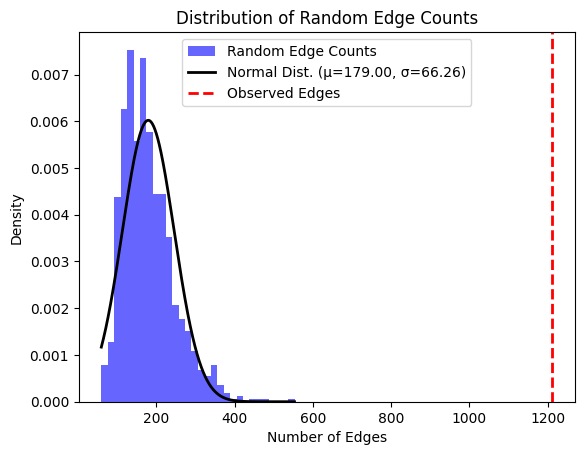

Genes mapped to aspartate aminotransferase measurement: 
aspartate aminotransferase measurement EFO_0004736
Genes mapped to aspartate aminotransferase measurement: 
['GPRIN3', 'RBMX2P4', 'ETV1', 'CNTNAP2', 'PDCD4', 'AS1', 'RPS27P18', 'TEX36', 'POLR2M', 'PNPLA3', 'Metazoa_SRP', 'VMA21', 'AGBL4', 'NGF', 'CTNNA2', 'ZAP70', 'ITGA9', 'MAGI1', 'KCNIP4', 'ADAMTS12', 'PPP2R2A', 'NTRK2', 'SHOC2', 'IGSF21', 'ABCA4', 'LINC02608', 'MIPEPP2', 'CHRM3', 'LINC01812', 'FBXL12P1', 'THRB', 'RBMS3', 'AS3', 'KALRN', 'LINC00881', 'RNU6', '931P', 'RN7SKP199', 'ADAMTS6', 'TRAPPC13', 'ARB2A', 'WDR55', 'VARS1', 'PPP1R17', 'CSMD1', 'MOS', 'PLAG1', 'KHDRBS3', 'PUM3', 'LMO1', 'STK33', 'ABTB2', 'TUBB4BP4', 'RPL7AP57', 'SLC35F2', 'MUC19', 'SLC25A3', 'ANO4', 'TMEM132D', 'TTC6', 'LINC00520', 'PELI2', 'NLRC5', 'RPS27P27', 'CFDP1', 'PIEZO1', 'CDH20', 'LINC01544', 'KIF16B', 'RPL35P8', 'MIR3667HG', 'OPCML', 'KHDRBS2', 'MRC1', 'LINC02500', 'TENM3', 'NDUFA8', 'CADM1', 'ACMSD', 'CCNT2', 'ASTN2', 'RAB35', 'GCN1', 'SPINK1', 'S

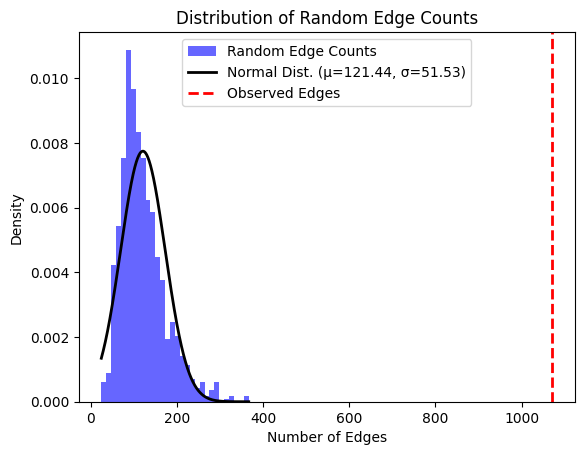

Genes mapped to erectile dysfunction: 
erectile dysfunction EFO_0004234
Genes mapped to erectile dysfunction: 
['SLC5A12', 'PDZRN4', 'MATN2', 'FOXF2', 'RN7SL352P', 'PRDM11', 'DNAJA3', 'EBF3', 'PEX13', 'LINC02477', 'RPS14P7', 'CDH13', 'NFIA', 'EIF4EBP2P3', 'POU3F2', 'XYLT1', 'RNU4ATAC7P', 'RPL12P4', 'LAMP5', 'HACD4', 'C14orf132', 'RPL32P14', 'HSPD1P15', 'PRDX2P4', 'SIM1', 'LINC01091', 'TEX41', 'FAM131C2P', 'AATF', 'ACACA', 'CMKLR1', 'LINC01498', 'LINC01823', 'LINC01826', 'TMEM178A', 'THUMPD2', 'ACTL8', 'LINC01654', 'AOPEP', 'LINC02240', 'GLI2', 'RANBP1P1', 'MAGEB18', 'LINC01721', 'H2AL3', 'SYTL5', 'ZC3H12B', 'RMDN2', 'AS1', 'TTC7A', 'FSHR', 'PTGFRN', 'CHMP5', 'NFX1', 'LRP1B', 'PTCHD1', 'AS', 'CELA2A', 'CELA2B', 'ANKRD23', 'CNNM3', 'MTFR1P1', 'PKMP2', 'TDRD15', 'NUTF2P8', 'DCAF8L1', 'MIR6134', 'EZRP1', 'ALCAM', 'PDK1', 'RAPGEF4', 'PHACTR2', 'NBPF21P', 'RN7SKP227', 'F13B', 'LINC02050', 'SLC39A8', 'ZC3HC1', 'PHF21B']
The number of edges in the network is less than the minimum requirement: 

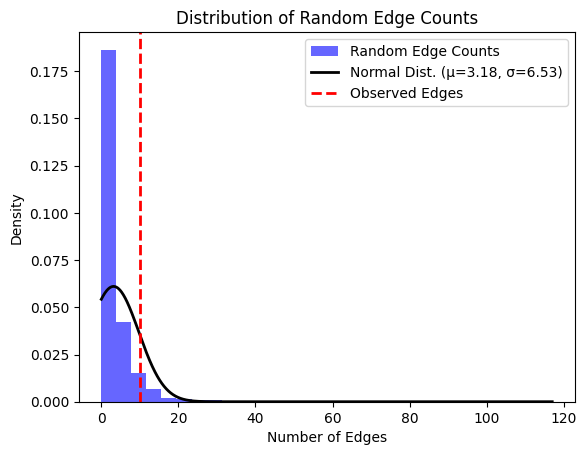

Genes mapped to bipolar II disorder: 
bipolar II disorder EFO_0009964
Genes mapped to bipolar II disorder: 
['ADGRE1', 'PLCXD3', 'OXCT1', 'NCAN', 'KRTAP5', '13P', '14P', 'SLIT3']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to pulmonary arterial hypertension: 
pulmonary arterial hypertension EFO_0001361
Genes mapped to pulmonary arterial hypertension: 
['HLA', 'DPA1', 'RNU105C', 'RN7SL250P', 'LINC01899', 'CBLN2', 'PDE1A', 'DNAJC10', 'RNU6', '699P', 'RNU1', '63P', 'PIM1', 'TMEM217', 'RPL12P2', 'PKIA', 'AS1', 'Y_RNA', 'CARS1P2', 'C12orf42', 'LINC02691', '684P', 'LINC01491', 'SLC24A5', 'FBN1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to systemic lupus erythematosus: 
systemic lupus erythematosus MONDO_0007915
Genes mapped to systemic lupus erythematosus: 
['IL12RB2', 'PHTF1', 'RSBN1', 'PTPN22', 'AP4B1', 'AS1', 'TNFSF4', 'SMG7', 'NCF2', 'NAB1', 'GLS', 'STAT4', 'DNASE1L3', 'RPL6P8', 'ARL14', 'DGKQ', 

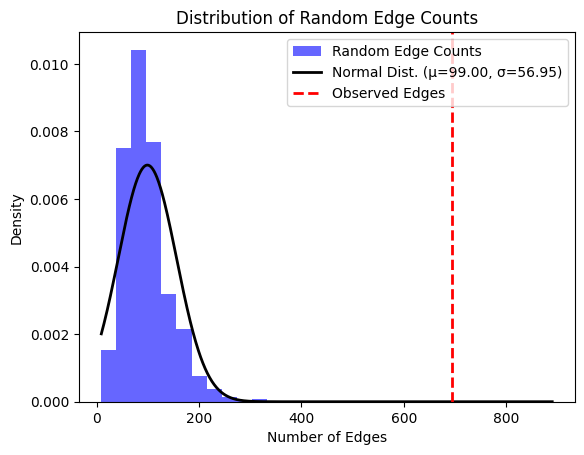

Genes mapped to hepatitis C virus infection: 
hepatitis C virus infection EFO_0003047
Genes mapped to hepatitis C virus infection: 
['HLA', 'DQB1', 'MTCO3P1', 'IFNL4', 'GPR158', 'DPP10', 'AIFM1P1', 'MALRD1', 'ASIP', 'NOTCH4', 'TSBP1', 'AS1', 'DRB9', 'DRB5', 'RN7SL292P', 'SGO1P2', 'ANKRD20A9P', 'LINC00426', 'LINC01058', 'SEPTIN6', 'SOWAHD', 'GPR20', 'ASTILCS', 'PPP1R26', 'EIF3A', 'CCL1', 'TMEM132E', 'DT', 'SMARCA4']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to diffuse large B-cell lymphoma, marginal zone B-cell lymphoma, follicular lymphoma, chronic lymphocytic leukemia: 
diffuse large B-cell lymphoma, marginal zone B-cell lymphoma, follicular lymphoma, chronic lymphocytic leukemia EFO_0000095
Genes mapped to diffuse large B-cell lymphoma, marginal zone B-cell lymphoma, follicular lymphoma, chronic lymphocytic leukemia: 
['LRRC34', 'RREB1', 'THEMIS', 'PTPRK', 'DLEU1', 'VMP1', 'RPS6KB1', 'CIMAP1B', 'KLHDC7B', 'DT', 'CASP10', 'MGAT5', 'MYNN',

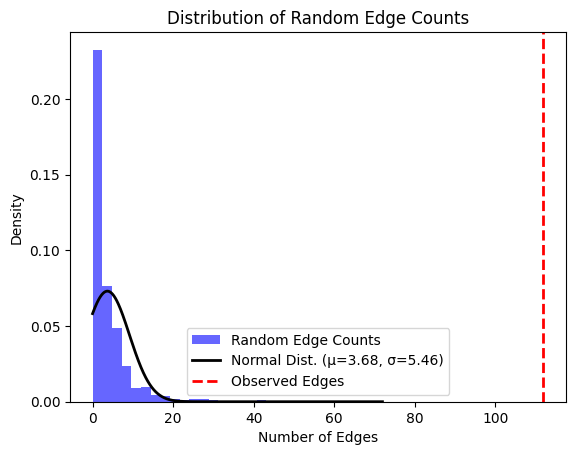

Genes mapped to rheumatoid arthritis, follicular lymphoma: 
rheumatoid arthritis, follicular lymphoma MONDO_0018906
Genes mapped to rheumatoid arthritis, follicular lymphoma: 
['CELF2']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to FEV/FVC ratio: 
FEV/FVC ratio EFO_0004713
Genes mapped to FEV/FVC ratio: 
['DENND2D', 'SLC30A10', 'KCNS3', 'LINC01182', 'LINC00504', 'NPNT', 'ADGRG6', 'HIVEP2', 'ASTN2', 'TFAP4', 'GLIS2', 'EMP2', 'TEKT5', 'LTBP4', 'SETP15', 'GRPR', 'GUSBP5', 'KRT18P51', 'HTR4', 'CHRNA3', 'PHF13', 'FAF1', 'LINC02778', 'LINC01748', 'DST', 'FILNC1', 'LINC02941', 'VTA1', 'LINC02919', 'LINC02587', 'CRPPA', 'MET', 'PPP1R3B', 'DT', 'OR7E161P', 'DEFB136', 'LINC01603', 'ERCC6L2', 'GALNT12', 'NME2P3', 'PARD3', 'CAMK2G', 'C10orf55', 'SLC1A2', 'AEBP2', 'RASSF3', 'GLULP5', 'LINC02459', 'LINC02938', 'DOCK9', 'LINC00370', 'HAUS4', 'AJUBA', 'DDHD1', 'BMF', 'COPS2', 'FAM227B', 'USP3', 'AS1', 'HMCN1', 'MIR181A1HG', 'LMOD1', 'TGFB2', 'LYPLAL1', 'LI

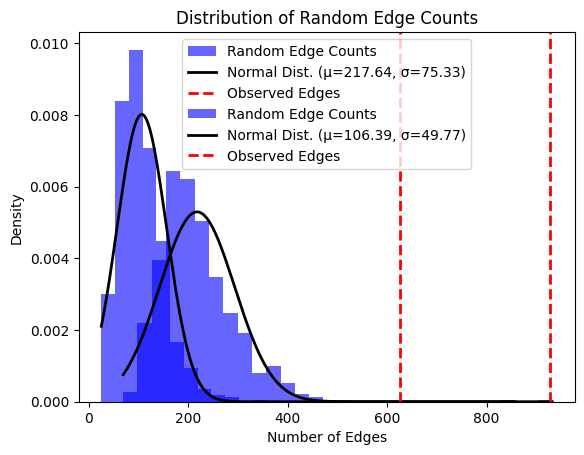

Genes mapped to treatment-resistant hypertension: 
treatment-resistant hypertension EFO_1002006
Genes mapped to treatment-resistant hypertension: 
['CASZ1', 'DNMT3A', 'ARNILA', 'NPM1P10', 'HACE1', 'MICALL2', 'NECTIN1', 'DT', 'PCDH10', 'PABPC4L', 'SEMA3C', 'EIF4EP4', 'MYO5B', 'LINC02241', 'ENPP3', 'LINC01519', 'LINC02647', 'CLNK', 'HIGD1AP18', 'PKIA', 'AS1', 'OLFM3', 'COL11A1', 'LINC01191', 'SEPHS1P7', 'RN7SKP93', 'MGAT5', 'HIGD1AP3', 'MSX2', 'BRI3BP', 'AACS', 'BNC2', 'CELA2B', 'LMNTD1', 'RN7SKP262', 'PTPRD', 'THBS3', 'SLC66A3', 'TKT', 'CACNA1D', 'SPRY4', 'TTC4P1', 'ZNF619P1', 'GBX1', 'ESRP1', 'GML', 'PRMT3', 'HMGB1P40', 'CHST1', 'MIR7154', 'RPL6P25', 'SLC6A15', 'POLR2KP2', 'ITM2B', 'BCAS3', 'DLGAP1', 'AS4', 'TCF4', 'ERG', 'LINC00114', 'GAB4', 'LAPTM5', 'LINC01778', 'UGT2A1', 'RPL23AP44', 'FTMT', 'NIPA1', 'RPL18P1', 'ATP5MC2P2', 'CRAT37', 'FOXA3', 'HHIPL2', 'TAF1A', 'EML6', 'ST3GAL5', 'POLR1A', 'DOCK3', 'LINC00877', 'RYBP', 'HLA', 'DQB1', 'MTCO3P1', 'RPS4XP9', 'RSPO3', 'HOTTIP', 'EVX1',

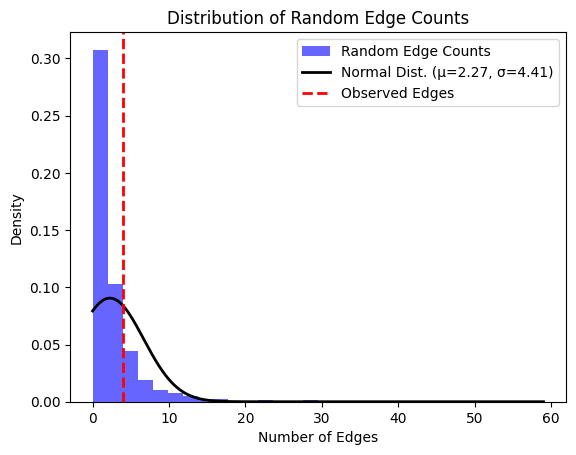

Genes mapped to response to trastuzumab, cardiotoxicity: 
response to trastuzumab, cardiotoxicity EFO_1001482
Genes mapped to response to trastuzumab, cardiotoxicity: 
['LINC00458']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to executive function measurement: 
executive function measurement EFO_0009332
Genes mapped to executive function measurement: 
['MIR1263', 'LINC01324', 'ARGLU1', 'DT', 'PAK5', 'SNTG1', 'RNA5SP56', 'PSMC1P12', 'COL6A3', 'U2', 'LINC00474', 'VIRMA', 'LINC02894', 'LINC01414', 'RYR1', 'MIS12', 'RNU6', '129P', 'RNU1', '65P', 'RNA5SP173', 'NDUFB5P1', 'DEFA7P', 'LINC02469', 'PCAT4', 'LINC01865', 'LINC01874', 'CYTH2', 'LINC01957', 'TRIM36', 'BBS2', 'CCDC170', 'ESR1', 'MIR4527HG', 'LINC01320', 'LINC01440', 'LRCH3', '36P', 'PKD2', 'RN7SKP207', 'HPRT1P2', 'NKAIN2', 'LINC02865', 'PERP', 'BARHL2', 'LINC02609', 'ADARB2', 'TSPAN11', 'AS1', 'LINC00621', 'RPL12P5', 'COCH', 'MYO5C', 'CERNA1', 'LRRC3C', 'GSDMA', 'PIEZO2', 'LINC01928', 'LI

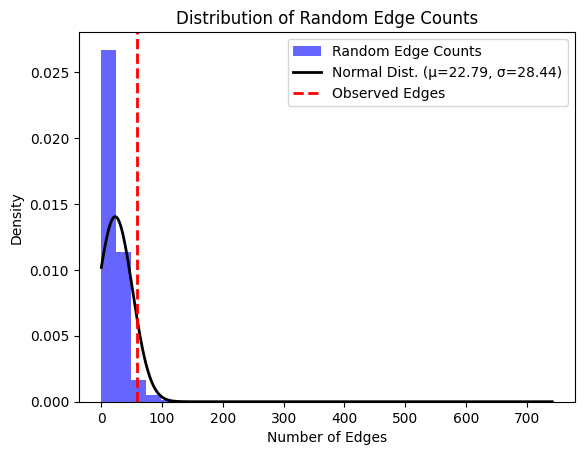

Genes mapped to cognitive inhibition measurement: 
cognitive inhibition measurement EFO_0007969
Genes mapped to cognitive inhibition measurement: 
['BMPR1B', 'RAP1GAP2', 'USH2A', 'ESRRG', 'ADGRG6', 'HIVEP2', 'TGM3', 'TGM6', 'TAGAP', 'AS1', 'A2ML1', 'PHC1', 'TRPM6', 'RN7SL680P', 'HSPE1P1', 'LINC01411', 'OR13C2', 'OR13C9', 'SERTAD2', 'LINC02577', 'CNST', 'SCCPDH', 'RBMS3', 'LINC02508', 'HSP90AA4P', 'LINC02153', 'LINC03093', 'ASCL4', 'WSCD2', 'PIF1', 'LINC00862', 'MUC22', 'HCG22', 'TCF20', 'AKT3', 'LINC02774', 'HLA', 'DRB1', 'MSRB3', 'SLC39A12', 'CACNB2', 'RNU6', '1304P', 'SRP9', 'CTNNA1', 'SNTG1', 'PXDNL', 'SEMA6D', 'GCNT1', 'UNCX', 'MICALL2']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to cocaine use measurement: 
cocaine use measurement EFO_0010553
Genes mapped to cocaine use measurement: 
['NIPA2P2', 'RN7SL294P', 'RNA5SP189', 'LINC01950', 'PSD3', 'TLK1P1', 'OR1L4', 'MMP20', 'AS1', 'MMP27', 'B3GLCT', 'RXFP2']
The number of edges in the netwo

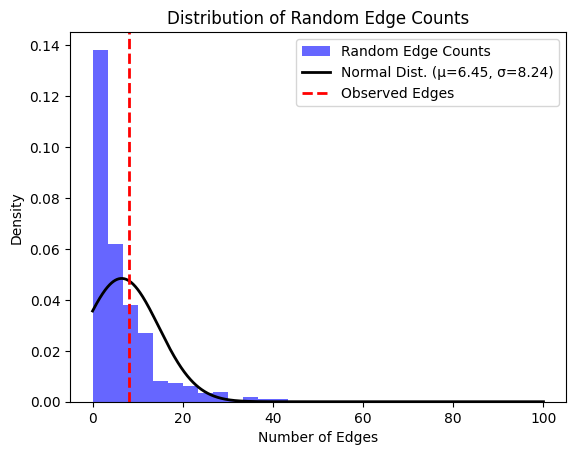

Genes mapped to malaria: 
malaria EFO_0001068
Genes mapped to malaria: 
['UROC1', 'PTPRT', 'LINC01600', 'MYLK4', 'KNDC1', 'SYT16', 'PTPRM', 'OR51B5', 'HBE1', 'HBG2', 'ATP2B4', 'ABO', 'TAT', 'AS1', 'MARVELD3', 'DDC', 'MYHAS', 'OR51V1', 'HBB', 'ZNF804A', 'OR51F1', 'MMP26', 'HNRNPA1P60', 'RNA5SP350', 'DPPA3P2', 'RNU7', '93P', 'CDH13', 'GUSBP5', 'INPP4B', 'LINC00944', 'NNT', 'RNU6', '381P', 'FRG1', 'DT', 'NALF1', 'MAP2K4', 'LINC00670', 'RN7SKP218', 'LINC01446', 'TENM3', 'KLHL3', 'BAK1P2', 'LINC02873', 'RNU4ATAC4P', 'DNAJB6P4', 'CSMD1', 'ADH7', 'C4orf17', 'ZNF536', 'TREML4', 'IL23R', 'ARL14', 'SNORA72', 'PIGZ', 'CRBN', 'SUMF1', 'FREM3', 'PRDM9', 'TRPC6P9', 'SLC1A3', 'SIL1', 'CDKAL1', 'LINC00581', 'MUC22', 'HCG22', 'TNFAIP3', 'LINC02865', 'PLEKHG1', 'STX1A', 'NUGGC', 'NRG1', 'STAU2', 'NDUFA8', 'LINC01957', 'TRIM36', 'NKAIN2', 'BUB3P1', 'EIF3IP1', 'SMYD3', '649P', 'LINC01248', 'EXOC6B', 'MAML3', 'MICB', 'HCP5', 'SMPDL3A', 'IARS1', 'MVB12B', 'LINC02408', 'DYRK2', 'AVEN', 'KC6', 'DIP2C', 'GFRA1

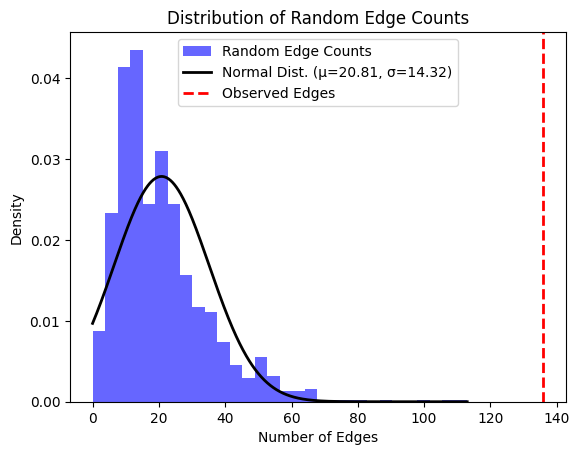

Genes mapped to obesity: 
obesity EFO_0001073
Genes mapped to obesity: 
['SULT1A1', 'LINC01440', 'METTL15', 'LINC02758', 'LARP1BP1', 'TECRL', 'CACUL1', 'ATXN1', 'AS1', 'STMND1', 'FTH1P5', 'TIAL1P1', 'NUP98', 'LINC00540', 'FTH1P7', 'RPL35AP8', 'VIPR1', 'LINC02503', 'CXXC4', 'RBBP4P3', 'KHDRBS2', 'LINC01714', 'RNU6', '991P', 'FAM169BP', 'IRAIN', 'CRISPLD2', 'RN7SKP14', 'TOM1L1', 'CLPB', 'ART2BP', 'LINC00958', 'RASSF10', 'DT', 'OR51V1', 'SNHG27', 'RPL7AP28', 'RFC3P1', 'STAC', 'MMP26', 'LINC03085', 'ERVK', '28', 'TET2', 'CRACD', 'CARD11', 'BMPER', 'PRDM16', 'LINC01684', 'LINC01689', 'RNU7', '190P', 'DDX18', 'RNA5SP63', 'U3', 'FXN', 'LINC01029', '655P', 'COL22A1', 'KCNK9', 'FTO', 'LINC01875', 'TMEM18', 'FAIM2', 'LINC01741', 'SEC16B', 'LINC03111', 'RNU4', '17P', 'ADCY3', 'FPGT', 'TNNI3K', 'TFAP2B', 'CMKLR2', 'GAS8', 'URAHP', 'PRDX4P1', 'THAP12P9', 'LINC02796', 'BDNF', 'AS', 'FHIT', 'PTPRG', 'PPIAP68', 'INO80D', 'CEP162', 'PTBP2', 'NDUFS5P2', 'RPL7P9', 'ZDBF2', 'ACER2P1', 'NRG1', 'LINC02208',

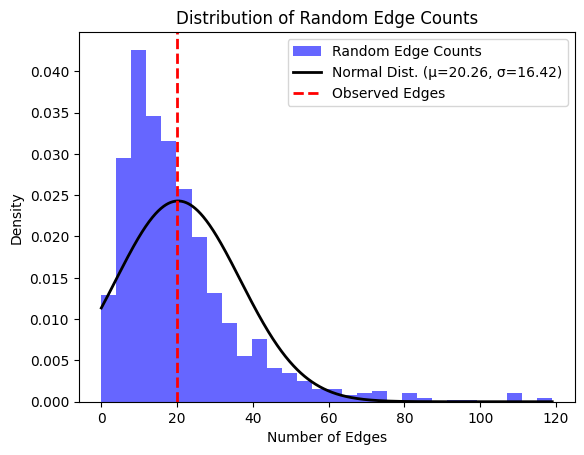

Genes mapped to eosinophilic esophagitis: 
eosinophilic esophagitis EFO_0004232
Genes mapped to eosinophilic esophagitis: 
['LINC02240', 'SNHG32', 'NEU1', 'JAZF1', 'CLEC16A', 'BCLAF1P1', 'TSLP', 'TMEM38BP1', 'LINC01208', 'ATP6AP1L', 'RPL5P16', 'CALM2P1', 'CASC17', 'SHROOM3', 'STAT6', 'LNCRNA', 'IUR', 'FAM76B', 'ERICH5', 'DSG1', 'LINC02650', 'MEAK7', 'GAPDHP15', 'RBBP4P4', 'SNTB1', 'CAPN14', 'WDR36', 'EMSY', 'ANKRD27', 'NOVA1', 'DT', 'LINC01767', 'PLPP3', 'DCC', 'VAV3', 'AS1', 'SLC25A24', 'LINC02214', 'RPL35AP15', 'XKR6', 'MIR4675', 'NEBL', 'LINC02757', 'CCDC81', 'LINC03034', 'KLF13', 'HSF2BP', 'IFFO2', 'KIF17', 'CAPN5', 'TIMP2', 'CEP295NL', 'P2RX6', 'SLC7A4', 'PRKD3', 'TMEM182', 'CPNE4', 'RPS3AP21', 'URGCP', 'MRPS24', 'RAD50', 'BOLA2P3', 'MATN2', 'PRKG1', 'RHOG', 'STIM1', 'SHANK2', 'WASF3', 'GPR12', 'RORA', 'SMAD3', 'INO80C', 'GALNT1', 'LARP1BP2', 'CTB', '30L5.1', 'JAK2', 'CCNY', 'DDAH1', 'TOGARAM2', 'MT3', 'MT2A', 'PCSK2', 'LINC02125', 'MON1B', 'GPX5', 'SCAND3', 'TBC1D13', 'LINC02277'

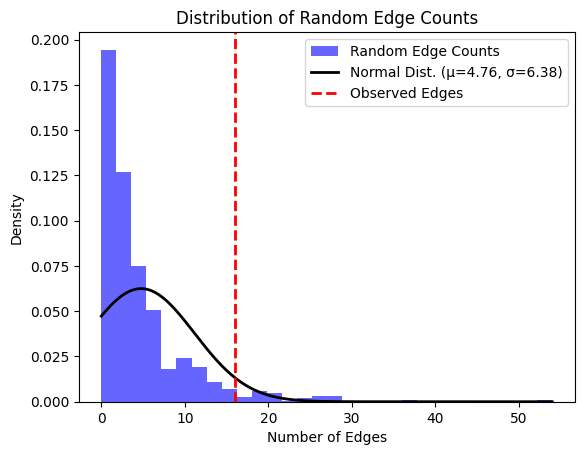

Genes mapped to soluble triggering receptor expressed on myeloid cells 2 measurement: 
soluble triggering receptor expressed on myeloid cells 2 measurement EFO_0010151
Genes mapped to soluble triggering receptor expressed on myeloid cells 2 measurement: 
['MS4A4A', 'MS4A6A', 'PRPF38AP1', 'LINC00708', 'LINC00836', 'RNA5SP306', 'NINJ2', 'YWHAQP7', 'RPL21P98', 'LINC01822', 'LINC01830', 'LINC01978', 'TBC1D16', 'RN7SL547P', 'SRSF10P2', 'LINC01648', 'MATN1', 'SRFBP1', 'PPP1R3B', 'LRRC4C', 'LINC02741', 'LINC02306', 'CYB5AP5', 'THA1P', 'LINC01993', 'VSTM2B', 'LINC01644', 'LINC00898', 'SLC35E2B', 'GBP5', 'GBP6', 'MIR29B2CHG', 'STUM', 'CAPZBP1', 'LINC01965', 'KYNU', 'LINC01811', 'TRAT1', 'GUCA1C', 'NEK11', 'LINC01524', 'ATP13A4', 'ASIC4', 'LRFN2', 'UNC5CL', 'RWDD2A', 'GIMAP8', 'STRADBP1', 'CHD1', 'DT', 'LINC02113', 'MAP7', 'HYCC1', 'CADM3', 'AS1', 'ACKR1', 'NUDT16', 'H2BC27P', 'RNF187', 'GPR78', 'HMX1', 'MIR4268', 'EPHA4', 'LYPLA1P2', 'RNU6', '289P', 'ARB2A', 'RN7SKP159', 'MCPH1', 'CSGALNACT1', 

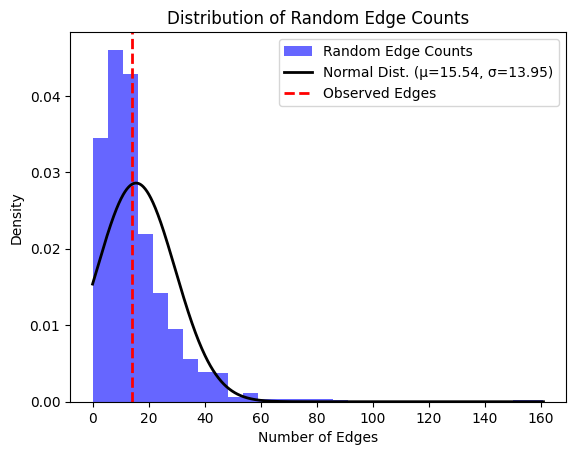

Genes mapped to chronic mountain sickness: 
chronic mountain sickness EFO_0010143
Genes mapped to chronic mountain sickness: 
['LIX1', 'AS1', 'RNF5P1', 'TACC1', 'AEBP2', 'LINC01579']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to non-lobar intracerebral hemorrhage: 
non-lobar intracerebral hemorrhage EFO_0010178
Genes mapped to non-lobar intracerebral hemorrhage: 
['LSG1', 'FAM43A', 'COL4A2', 'ICA1L', 'PMF1', 'BGLAP', 'CARF', 'WDR12', 'NBEAL1', 'ABHD17AP4', 'COL4A1', 'NUP160', 'CELF1', 'LINC02669', 'MYO18B', 'LINC02559', 'LINC01394', 'AGBL2', 'SPI1', 'SLC39A13', 'AS1', 'SNORD3H', 'MTDH', 'CYP20A1', 'RARB', 'LINC02392', 'LINC02822', 'ITGB8', 'CACNB1', 'ZCCHC14', 'DT', 'JPH3', 'CCDC60', 'FTO', 'LINC02169', 'GTSCR1', 'LINC01541', 'LINC02484', 'SEC63P2', 'NIHCOLE', 'RNU6', '334P', 'NPM1P47', 'C2CD4B', 'NLRP13', 'EMX2', 'LINC02674', 'RNA5SP173', 'NDUFB5P1', 'FRMD4A', 'PTPRF', 'ZIM2', 'ZNF71', 'ST3GAL3', 'RPL6P25', 'SLC6A15', 'LINC02914', 'RPL3P4'

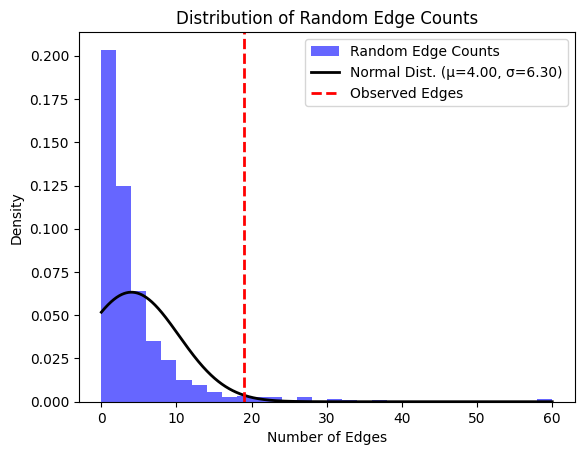

Genes mapped to drug use measurement, cancer: 
drug use measurement, cancer MONDO_0004992
Genes mapped to drug use measurement, cancer: 
['TP53', 'ZFHX3', 'THEMIS3P', 'AKR1B1P6', 'SUGP1', 'APOC1', 'APOC1P1', 'CEACAM16', 'AS1', 'BCL3', 'CELSR2', 'GRHL1', 'APOB', 'TDRD15', 'NUTF2P8', 'SLC30A3', 'PPM1G', 'NRBP1', 'GCKR', 'METAP2P1', 'RNU7', '2P', 'ABCA12', 'SEMA5B', 'SLC39A8', 'LINC01438', 'MIR297', 'MAML3', 'ANKRD31', 'HMGCR', 'CERT1', 'POLK', 'POC5', 'FERD3L', 'POLR1F', 'BAZ1B', 'MLXIPL', 'VPS37D', 'BSX', 'SAE1P1', 'TEAD4', 'RPL13AP24', 'ITPK1', 'DNAH2', 'CDKN2B', 'MX1', 'FAM238C', 'ANKRD26', 'TCF7L2', 'FADS1', 'FADS2', 'ZPR1', 'SIK3', 'ATP2B1', 'ZCCHC8', 'ALDH1A2', 'LIPC', 'FTO', 'HERPUD1', 'CETP', 'LPL', 'RPL30P9', 'TRIB1', 'TRIB1AL', 'PLCG1', 'ZHX3', 'ADI1P1', 'PCAT1', 'ZCWPW2', 'CASC8', 'POU5F1B', 'CDH15', 'SLC22A31', 'RNA5SP144', 'LARP7P4', 'NORAD', 'SNTA1', 'CBFA2T2', 'AGER', 'CASC19', 'AIF1', 'TGIF2', 'RAB5IF', 'TENM2', 'ANKRD24', 'CCND1', 'SMIM38', 'MYEOV', 'FGFR2', 'RPS2P18', '

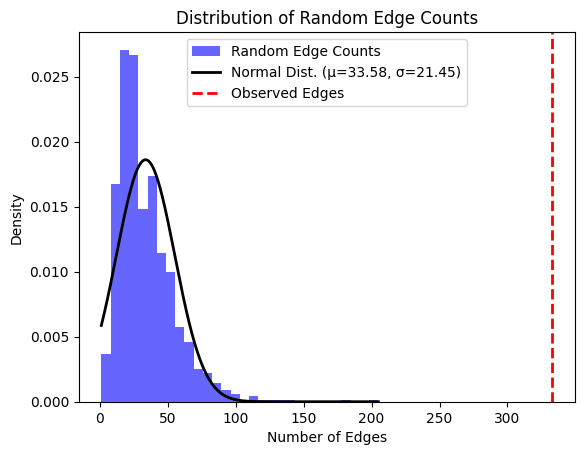

Genes mapped to Churg-Strauss syndrome: 
Churg-Strauss syndrome EFO_0007208
Genes mapped to Churg-Strauss syndrome: 
['HLA', 'DQB1', 'MTCO3P1', 'RPL7P38', 'RNU7', '106P', 'GPA33', 'ACOXL', 'AS1', 'MIR4435', '2HG', 'BCLAF1P1', 'TSLP', 'LINC02676', 'LINC00709']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to cerebral amyloid deposition measurement: 
cerebral amyloid deposition measurement EFO_0007707
Genes mapped to cerebral amyloid deposition measurement: 
['APOC1', 'APOC1P1', 'ATF3', 'WDFY3', 'ARAP3', 'PCDH1', 'GRM1', 'MMP16', 'RNA5SP272', 'CCDC60', 'NAA60', 'ZBTB14', 'LINC02974', 'RPS4XP19', 'NDUFV2', 'APOE', 'CDS1', 'NYAP2', 'MIR5702', 'LINC02494', 'RNU6', '480P', '1296P', 'TRDN', 'AS1', 'NKAIN2', 'TMOD1', 'DELEC1', 'MIR4300HG', 'MUC19', 'CNTN1', 'PRKD1', 'LINC00927', 'LINC01497', 'LINC01028', 'TMX3', 'ZNF260', 'ZNF850', 'ITSN1', 'ATP5PO', 'RAB36', 'ARHGAP8', 'PHF21B', 'LINC01234', 'KAZN', 'AK2', 'ST7L', 'WNT2B', 'RHOC', 'GNG4', 'NT5C1B', '

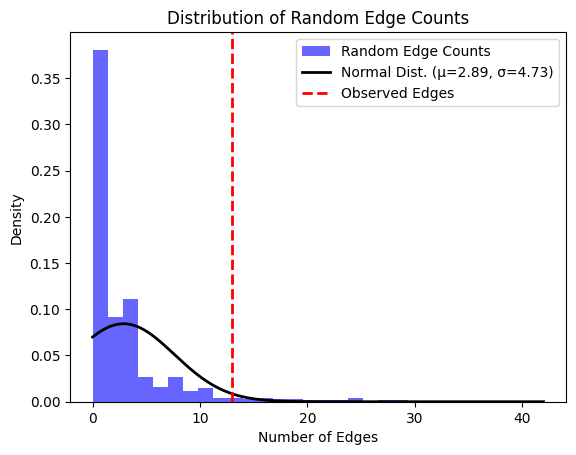

Genes mapped to coronary artery disease: 
coronary artery disease EFO_0001645
Genes mapped to coronary artery disease: 
['PLCB2', 'ANP32CP', 'MARCHF1', 'VPS33B', 'DT', 'CXCL8', 'TMOD4', 'COL6A3', 'ZNF77', 'ADGRL3', 'OR52E4', 'TRIM5', 'ALDH2', 'CDKN2B', 'AS1', 'RN7SL807P', 'HIGD1AP4', 'COMMD1', 'B3GNT2', 'RUNX2', 'CLIC5', 'LINC02719', 'GUCY1A2', 'LINC02490', 'WDR72', 'MRPL22', 'KIF4B', 'LINC01826', 'ELOAP1', 'DEFB126', 'DEFB127', 'ADAMTS7', 'CELSR2', 'PSRC1', 'MRAS', 'HNF1A', 'JCAD', 'ACAD10', 'CUX2', 'MYL2', 'FLT1', 'HLA', 'DQB1', 'MTCO3P1', 'FMN2', 'SEZ6L', 'CDH13', 'SMAD3', 'MTHFD1L', 'NYAP2', 'MIR5702', 'LINC00841', 'LINC03089', 'MIA3', 'LPA', 'SLC22A3', 'LPAL2', 'SPRY4', 'WDR86', 'CRYGN', 'UBE2D3P4', 'MTND4P1', 'MORF4L1', 'DUS4L', 'BCAP29', 'CHRDL1', 'CALCRL', 'CYP1A1', 'CYP1A2', 'PECAM1', 'TFPI', 'PHACTR1', 'PDGFDDN', 'TTC29', 'MIR548G', 'ASIC2', 'PLPP3', 'HEMGN', 'ANP32B', 'LIPA', 'CNNM2', 'SMG6', 'UBE2Z', 'BSND', 'PCSK9', 'TARID', 'TCF21', 'ZC3HC1', 'UBE2H', 'COL4A2', 'HHIPL1', 

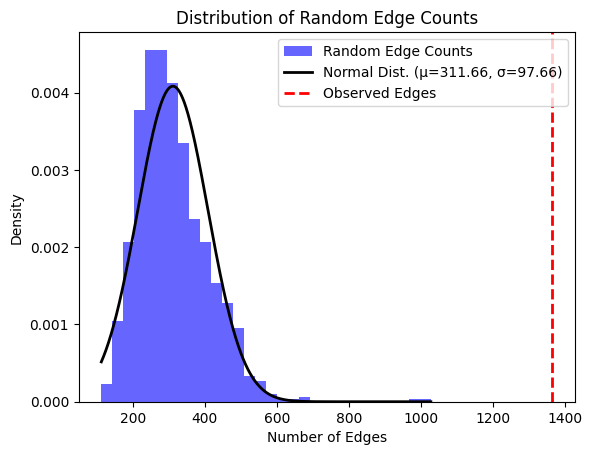

Genes mapped to opioid dependence: 
opioid dependence EFO_0005611
Genes mapped to opioid dependence: 
['SRP72P1', 'LINC02837', 'ADGRV1', 'GAPDHP15', 'RBBP4P4', 'TACC2', 'CARTPT', 'MAP1B', 'OR4C46', 'OR4C7P', 'RGMA', 'SEPHS1P2', 'NKAIN2', 'CTDP1', 'SNTN', 'CDHR18P', 'DBF4P1', 'RPL17P35', 'NASPP1', 'CLVS1', 'ADGRL2', 'PTPRD', 'DT', 'IMP3P1', 'CNIH3', 'LINC00299', 'LINC02619', 'BMPR1B', 'LINC00474', 'PAPPA', 'MAPK8', 'GRIN2B', 'KRT8', 'FTO', 'AASS', 'RPL31P37', 'FAM182A', 'CSMD1', 'LINC01445', 'VSTM2A', 'ST6GALNAC3', 'TMEM207', 'IL1RAP', 'NHSL1', 'RNU6', '931P', 'RN7SKP199', 'Y_RNA', 'CARS1P2', 'CDC42EP3', 'AS1', 'DENND1A', 'TRIM28', 'SPTBN2', 'AK8', 'NCOA5', 'RPL13P2', 'ZNF684', 'OPRM1', 'CTCF', 'GPRIN3', 'SNCA', 'NIPAL1', 'GJB6', 'CRYL1', 'ZIC4', 'RPLP0P5', 'RPL7AP81', 'SPINDOC', 'LINC00620', 'LINC00877', 'LINC00870', 'SULF1', 'GHRHR', 'ADCYAP1R1', 'RN7SL72P', 'RPL32P17', 'RN7SKP93', 'MGAT5', 'EXT1', 'NELL1', 'ZNF326', '695P', 'KCNMB4', 'RNU4', '65P', 'LINC02955', 'PCDH15', 'TLN2', 'ATO

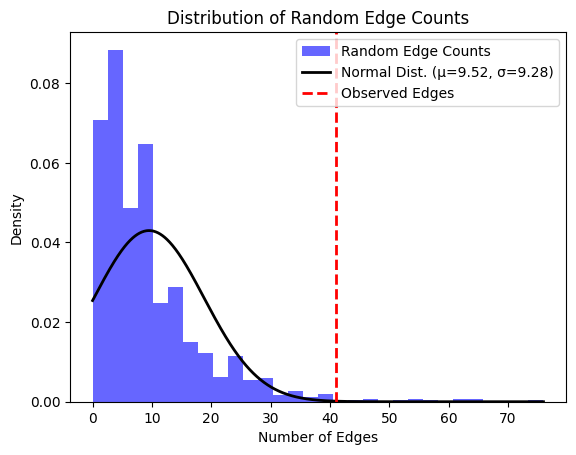

Genes mapped to Behcet's syndrome: 
Behcet's syndrome EFO_0003780
Genes mapped to Behcet's syndrome: 
['RNU6', '283P', 'FGFR3P1', 'FUT2', 'TFCP2L1', 'STAT4', '1133P', 'C6orf15', 'PSORS1C1', 'HLA', 'B', 'DNAJB6P4', 'IL12RB2', 'IL19', 'IL10', 'CCR3', 'KLRC4', 'KLRK1', 'IL12A', 'AS1', 'ERAP1', 'IL22RA2', 'IFNGR1', 'RPL31P44', 'THAP12P3', 'ALDH7A1P4', 'ADO', 'LACC1', 'NRAD1', 'PARK7', 'THADA', 'RN7SL51P', 'RN7SL18P', 'IL1A', 'IL1B', 'CCDC71', 'KLHDC8B', 'CPLX1', 'GAK', 'LINC02241', 'GUSBP1', 'IRF5', 'NSMCE2', 'DELEC1', 'CCR12P', 'LNCARGI', 'LINC02132', 'LINC01082', 'ARRB2', 'HORMAD2', 'LIF', 'LINC02713', 'CNTN5', 'NPHP4', 'KRTCAP2', 'ALK', 'TIPARP', 'ADAMTS12', 'FAM120B', 'SRSF8CP', 'TNS3', 'EGFR', 'DLX6', 'SIRLNT', 'ZMAT4', 'SORCS3', 'ARHGEF12', 'TBX5', 'RN7SKP216', 'OR7K1P', 'LINC02306', 'MIR3171HG', 'RN7SKP101', 'SEMA6D', 'GALR1', 'BDP1P', 'AFF1', 'KCNIP1', 'MUC22', 'HCG22', 'RNF5', 'MEOX2', 'MTND4P3', 'RNA5SP231', 'CCDC26', 'PTPRD', 'GRIK4', 'GRIN2B', 'FRMD5', 'CERS3']
Random edges cal

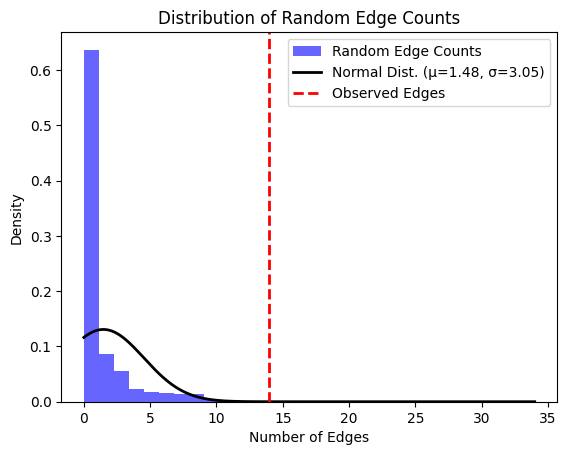

Genes mapped to chronic obstructive pulmonary disease: 
chronic obstructive pulmonary disease EFO_0000341
Genes mapped to chronic obstructive pulmonary disease: 
['LINC02778', 'LINC01748', 'DENND2D', 'LINC01804', 'SLMAP', 'BTC', 'FGF18', 'SMIM23', 'FILNC1', 'LINC02941', 'ITGB8', 'STN1', 'RASSF10', 'BMAL1', 'LINC02938', 'DTWD1', 'ATP8B4', 'ADAMTSL3', 'RPL30P3', 'ASAP2', 'EML4', 'VGLL4', 'ADCY5', 'HSPA4', 'GM2A', 'CCDC69', 'RREB1', 'ID4', 'RPL29P17', 'HCG20', 'RFX6', 'RPS29P13', 'MFHAS1', 'NME2P3', 'ADIPINT', 'SPMIP8', 'ZNF319', 'THRA', 'TESK2', 'ZBTB38', 'TNPO1', 'AMZ1', 'MTCO3P40', 'RPS6P12', 'TBX3', 'AS1', 'UBA52P7', 'DMWD', 'SYN3', 'MFAP2', 'PABPC4', 'HEYL', 'LINC02869', 'SLC30A10', 'CHRM3', 'AS2', 'LINC01876', 'TNS1', 'LINC01807', 'LINC01940', 'HDAC4', 'RARB', 'RBMS3', 'CACNA2D3', 'LINC02017', 'EEFSEC', 'LINC01997', 'FAM13A', 'EFCAB5', 'EPOP', 'MIR4734', 'MAPT', 'SPPL2C', 'CASC17', 'RNU7', '155P', 'MTCL1', 'LINC00310', 'MRPS6', 'KCNE2', 'MICAL3', 'RNF220', 'RRP15', 'LYPLAL1', 'RNU6'

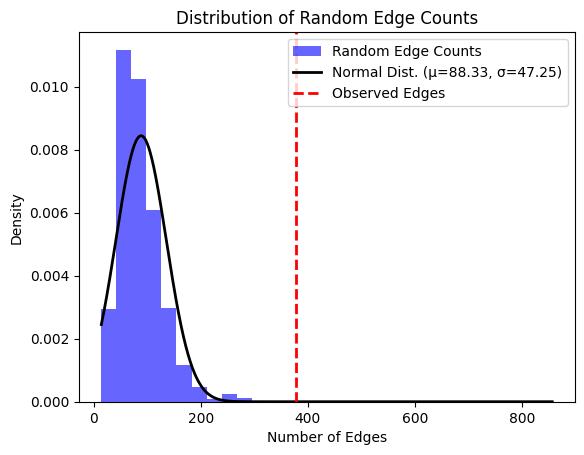

Genes mapped to TPE interval measurement: 
TPE interval measurement EFO_0004644
Genes mapped to TPE interval measurement: 
['PYGB', 'HAUS6P2', 'RNA5SP480', 'KCNJ4', 'KDELR3', 'CALM2P1', 'CASC17', 'MEF2D', 'PDE4B', 'SGIP1', 'SLC35F1', 'CEP85L', 'AOC1', 'KCNH2', 'SSBP3', 'RPL22', 'FAAP20', 'IGF1R', 'ATP5POP1', 'CMKLR2', 'AS', 'HEY2', 'NCOA7', 'LIG3', 'NKX2', '5', 'Y_RNA', 'SCN5A', 'SCN10A', 'MAILR', 'LINC02884', 'DPT', 'LINC00970', 'STRN', 'SLC8A1', 'SERTAD2', 'CAMK2D', 'U4', 'RUFY1', 'CREB5', 'CAV2', 'PRAG1', 'LINC02949', 'MSRA', 'ZMIZ1', 'LITAF', 'LINC02137']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to heart failure: 
heart failure EFO_0003144
Genes mapped to heart failure: 
['CELSR2', 'PITX2', 'LINC01438', 'KLHL3', 'CDKN1A', 'LPA', 'CDKN2B', 'AS1', 'ABO', 'Y_RNA', 'SYNPO2L', 'BAG3', 'ATXN2', 'FTO', 'HSPA12A', 'LINC02450', 'MRPS36P5', 'TEX51', 'RNU7', '182P', 'ADAMTSL1', 'TMTC1', 'LINC02386', 'LINC02404', 'LINC01619', 'LINC02568', 'USP3',

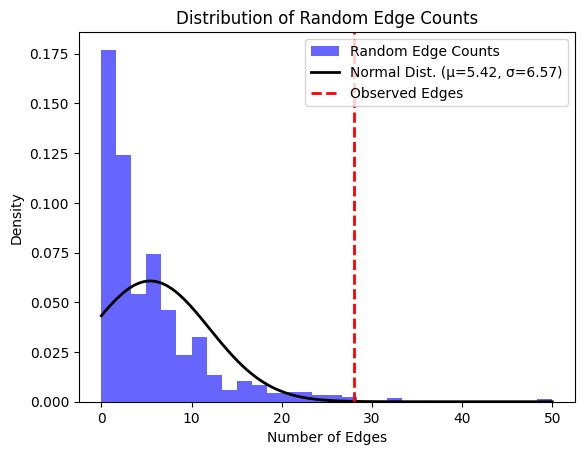

Genes mapped to cardioembolic stroke: 
cardioembolic stroke EFO_1001976
Genes mapped to cardioembolic stroke: 
['ZFHX3', 'GNAO1', 'LINC01438', 'PHF20', 'LINC01957', 'TRIM36', 'TTBK1', 'SLC22A7', 'RGS7', 'BNIP1', 'RPL7AP33', 'ABO', 'Y_RNA', 'HNF4G', 'RNU2', '54P', 'F11', 'AS1', 'CAV2', 'HK1', 'GORAB', 'PRRX1', 'NEURL1', 'TBX18', 'RPL31P32', 'RN7SL643P', 'HTR1E', 'RBAK', 'RBAKDN', 'RNF216P1', 'RN7SL292P', 'SGO1P2', 'DLX6', 'ANK1', 'RFX3', 'DT', 'GLIS3', 'AKAP8P1', 'JKAMPP1', 'TEK', 'GRM5', 'TYR', 'DISC1FP1', 'OSBPL9P2', 'TRPC6', 'LINC02743', 'LINC02955', 'NAV3', 'RMST', 'MIR4303', 'RNU4', '41P', 'LINC01234', 'KLF12', 'TUBGCP3', 'ATP11AUN', 'MIDEAS', 'TCEANC2', 'LINC01760', 'LINC01650', 'LINC01761', 'LINC02607', 'KCNN3', 'PMVK', 'PBXIP1', 'RGS4', 'RGS5', 'PLAC9P1', 'RPL5P7', 'SP3', 'TESHL', 'MIR4268', 'EPHA4', 'KCNE4', 'DOCK10', 'LINC01986', 'CHL1', 'AS2', 'RBMS3', 'LINC01322', 'MTND4P17', 'DDIT4L', 'LINC02112', 'ATPSCKMT', 'C9', 'GPR150', 'RFESD', 'LSM1P2', 'LINC03000', 'COL23A1', 'PKMP5

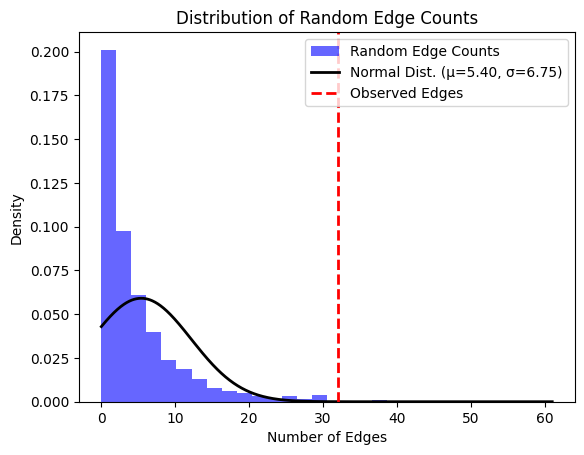

Genes mapped to large artery stroke: 
large artery stroke EFO_0005524
Genes mapped to large artery stroke: 
['HDAC9', 'TWIST1', 'LINC01765', 'LINC01492', 'CWF19L2', 'ALKBH8', 'LINC02113', 'TTLL5', 'CDKN2B', 'AS1', 'CDC5L', 'SUPT3H', 'TMEM63C', 'ZDHHC22', 'OBI1', 'RPL21P111', 'TMEM163', 'TOM1L1', 'RPL19P11', 'CDH6', 'RNU6', '727P', 'LINC02488', 'RGS9', 'LINC02563', 'SLCO1B1', 'FAF1', 'CDKN2C', 'EDNRA', 'RPL32P8', 'WDR70P1', 'MMP3', 'MMP12', 'FARP1', 'ATXN2', 'SH2B3', 'LPA', 'PLG', 'SERPINA1', 'ACP1', 'SNORA74', 'VDAC2P5', 'SH3YL1', 'DTL', 'MCHR1', 'CARD9', 'LINC01781', 'MTND2P30', 'ST13P19', 'HHAT', 'NKX1', '1', 'FAM53A', 'DKK2', '909P', 'LINC02109', 'H2BP5', 'SLC17A2', 'LINC03009', 'AKAP8P1', 'JKAMPP1', 'IGFBPL1', 'ARMC8P1', 'CNTN5', 'SLC15A5', 'MGST1', 'LINC00364', 'BCRP9', 'SOX21', 'LINC00557', 'CLYBL', 'PCCA', 'SLC22A17', 'MBTPS1', 'LINC02188', 'LINC02181', 'RPL12P40', 'RN7SKP182', 'FAM3B', 'MX2', 'DPYD', 'EVA1A', 'AS', 'MMRN1', 'GATB', 'LINC01938', 'RN7SKP60', 'LINC01951', 'HIP1', 

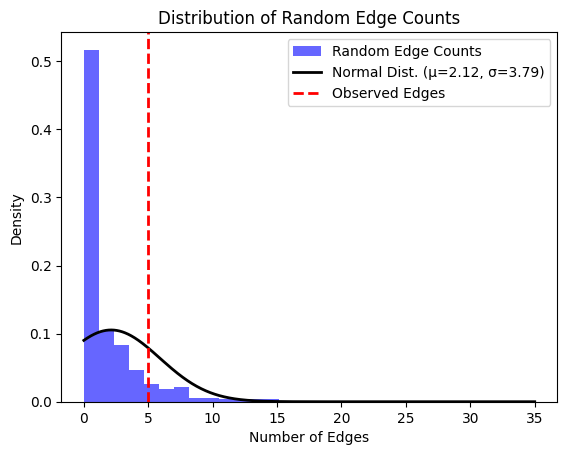

Genes mapped to small vessel stroke: 
small vessel stroke EFO_1001504
Genes mapped to small vessel stroke: 
['ATXN2', 'SH2B3', 'AS', 'CAMK2D', 'ZCCHC14', 'DT', 'JPH3', 'ATG7', 'HRG', 'AS1', 'KNG1', 'ANKRD50', 'FAT4', 'LINC02487', 'AFDN', 'ATP6V1C1', 'MTND1P5', 'DIO2', 'CACNB2', 'MRPL58', 'RNU6', '362P', 'LINC01394', 'NBEAL1', 'CASZ1', 'COL4A2', 'ZNF475', 'ZNF474', 'PMF1', 'BGLAP', 'SH3PXD2A', 'STN1', 'NRG1', 'CYP4F44P', 'HSPA8P13', 'ANKRD22', 'TRPC2', 'DLG2', 'USP2', 'GRIK4', 'MGAT4C', 'ENOX1', 'LINC02309', 'LINC01148', 'ENPP7P14', 'VPS51P1', 'POLR2E', 'GPX4', 'LINC01432', 'LINC01427', 'AK5', 'LINC01661', 'PRMT6', 'PLA2G4A', 'LINC01036', '508P', 'RNA5SP94', 'ANTXR1', 'GFPT1', 'ARL4C', 'LINC01173', 'IL5RA', 'TBC1D1', 'NFXL1', 'LINC02511', 'Y_RNA', 'LSINCT5', 'ADCY2', 'LINC02064', 'UBL5P1', 'ARHGAP26', 'LMAN2', 'LNC', 'LBCS', 'AMPH', 'EPS15P1', 'MRPL42P4', 'LINC03076', 'CHST3', 'GALNT18', 'NTS', 'LINC02392', 'LINC02822', 'LINC02490', 'TAC4', '1313P', 'RALGAPA2', 'RPL41P1', 'WDR12', 'CARF

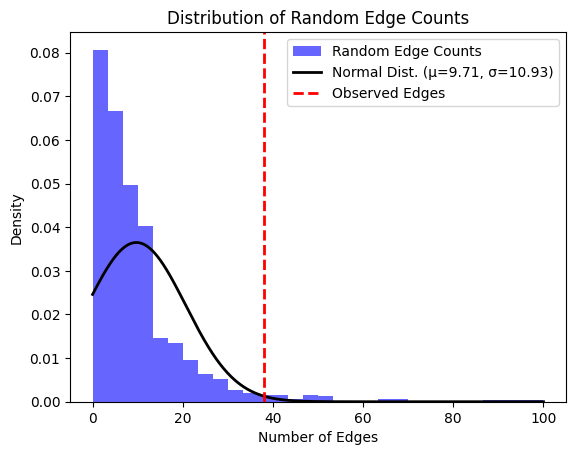

Genes mapped to Parkinson disease: 
Parkinson disease MONDO_0005180
Genes mapped to Parkinson disease: 
['MYLK2', 'DYRK1A', 'TRPM2', 'LINC02950', 'LINC01012', 'RERE', 'AS1', 'LAMTOR2', 'RAB25', 'MROH3P', 'NUCKS1', 'ITPKB', 'SIPA1L2', 'LINC01127', 'CCNT2', 'STK39', 'RN7SL813P', 'NGEF', 'TBC1D5', 'PARP9', 'RNA5SP144', 'LARP7P4', 'MED12L', 'SPTSSB', 'MCCC1', 'TMEM175', 'PFDN1P2', 'CD38', 'FAM47E', 'STBD1', 'GPRIN3', 'SNCA', 'SLC39A8', 'CAMK2D', 'ELOVL7', 'ZNF608', 'LINC02240', 'HLA', 'DRB1', 'DQA1', 'LINC02527', 'CCN6', 'KLHL7', 'CTSB', 'MSR1', 'RN7SL474P', 'ZDHHC2', 'SH3GL2', 'CACNA1B', 'ITGA8', 'BAG3', 'DLG2', 'IGSF9B', 'BICD1', 'ASS1P14', 'SYT10', 'SLC2A13', 'MTND1P24', 'LINC02400', 'CCDC62', 'GCH1', 'GPR65', 'RORA', 'LINC02349', 'TPM1', 'LACTB', 'STX1B', 'KANSL1', 'MED13', 'Y_RNA', 'RIT2', 'SMAD4', 'SRSF10P1', 'BST1', 'LRRK2', 'LINC02210', 'CRHR1', 'POLR3B', 'RFX4', 'MAPT', 'SPPL2C', 'SREBF1', 'SLC41A1', 'CYCSP42', 'RNU6', '1326P', 'PRDM15', 'CNKSR3', 'TSBP1', 'DRA', 'SLC50A1', 'DGKQ'

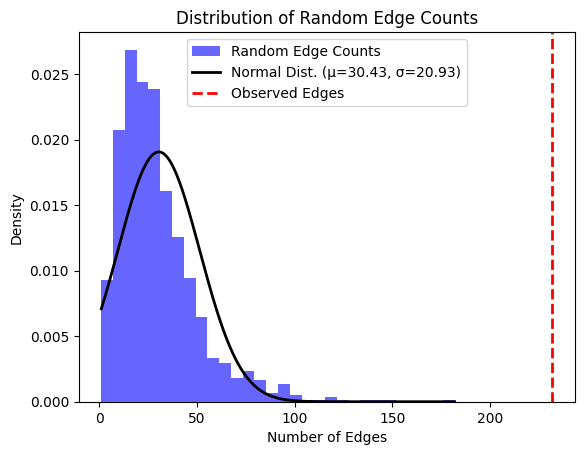

Genes mapped to sex interaction measurement, longitudinal BMI measurement: 
sex interaction measurement, longitudinal BMI measurement EFO_0005937
Genes mapped to sex interaction measurement, longitudinal BMI measurement: 
['KCNS3', 'NDFIP1', 'SPRY4', 'COLEC10', 'ELAVL2', 'IZUMO3', 'LEPROT', 'LEPR', 'CAST', 'PRDX4P1', 'THAP12P9', 'DLG2', 'FTO', 'RNU4', '17P', 'MC4R', 'CACNA1E', 'DOCK4', 'NECAB2', 'ZNF208', 'ZNF257', 'ANXA2R', 'OT1', 'Y_RNA', 'LSINCT5', 'TMBIM7P', 'TJP2', 'LINC02488', 'TMEM161B', 'SLC29A4', 'PAK6', 'BUB1B', 'AS1', 'TNNI1', 'PHLDA3', 'TTN', 'RPS27P4', 'MRPS31P1', 'LINC02112', 'TAS2R1', 'FSTL4', 'C12orf56', 'ATP5F1AP4', 'KCNH5', 'ADCY9', 'SRL', 'GFAP', 'KIF18B', 'SLC14A2', 'SEMA6B', '69P', 'RPL23AP44', 'SH3PXD2B', 'LINC01944', 'ERBB4', 'LINC01878', 'RNU7', '74P', 'RBM47', 'NOS1AP', 'CNTNAP2', 'LINC02292', 'SYNE3', 'RPL9P21', 'TMEM72', 'CEP170P1', 'CALCR', 'RGMA', 'SEPHS1P2', 'ADGRE4P', 'MARK2P21', 'WNT7B', 'SLC28A3', 'NTRK2', 'PIK3C2G', 'LINC00330', 'NUFIP1', 'DOCK1', 'P2R

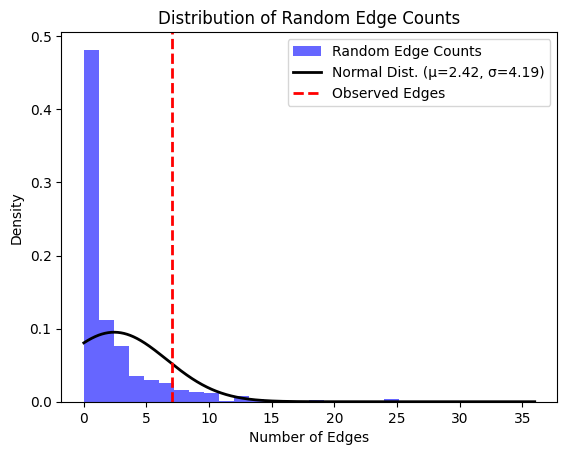

Genes mapped to gout: 
gout EFO_0004274
Genes mapped to gout: 
['FRMD4B', 'MITF', 'SMARCC1', 'RBMX2P4', 'ETV1', 'BUB3P1', 'EIF3IP1', 'ASB10', 'PXDNL', 'ABCG2', 'ACAD10', 'GRID1', 'CALM2P1', 'CASC17', 'CNPY4', 'NAA25', 'SLC2A9', 'SHLD2', 'NUTM2A', 'AS1', 'MEN1', 'CDC42BPG', 'BCAS3', 'TBX2', 'GCKR', 'RN7SKP93', 'MGAT5', 'PRDM8', 'FGF5', 'FTH1P22', 'PTGFRN', 'GABPA', 'SLC28A3', 'NTRK2', 'LINC00944', 'LINC02372', 'ALDH2', 'LINC02724', 'SLC22A11', 'PIBF1', 'ACSM2B', 'SLC17A1', 'ARID5B', 'TOLLIP', 'DT', 'LINC02689', 'MLXIP', 'PDZK1', 'EVA1A', 'PSD3', 'SH2D4A', 'SLC38A1', 'GLUD1', 'POLD3', 'SMYD3', 'SPATA31H1', 'SV2B', 'ZNF639', 'MFN1', 'DST', 'RUNX2', 'CLIC5', 'HGF', 'MED27', 'NTNG2', 'CTBP2P3', 'HMGN1P31', 'CLDN24', 'FBLP1', 'OR13C3', 'OR13C8', 'FGFR2', 'RBFOX1', 'ABCA1', 'ABCC8', 'ABCC9', 'ABCG1', 'ALX4', 'ATP1A4', 'BDKRB2', 'CACNA2D3', 'LINC02017', 'FAT1', 'MRPS36P2', 'CFTR', 'CYP2C8', 'CYP2E1', 'FSTL4', 'KRT18P3', 'CYB5AP4', 'JAZF1', 'LHFPL3', 'ALDH1A2', 'PDE1C', 'PRKCA', 'PPARD', 'PPARG

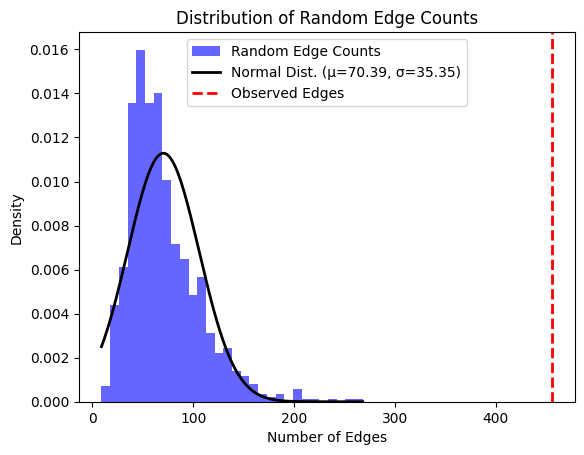

Genes mapped to anxiety measurement: 
anxiety measurement EFO_0009863
Genes mapped to anxiety measurement: 
['SATB1', 'AS1', 'ESR1', 'RN7SKP19', 'LINC01360', 'MAD1L1', 'TCEA2', 'TRPV6', 'TRPV5', 'AKAP8P1', 'JKAMPP1', 'ELAVL2', 'FAM120A', 'PTCH1', 'AS3MT', 'BORCS7', 'ASMT', 'ZDHHC5', 'DRD2', 'TMPRSS5', 'GRIN2B', 'CTAGE16P', 'DNAJA1P1', 'FCF1', 'AGBL1', 'PAFAH1B1', 'ERI3', 'DENND1B', 'NOS1', 'LINC02335', 'HNF4GP1', 'ZDHHC20P4', 'SNRPFP3', 'RBFOX1', 'ZCCHC14', 'KC6', 'NPM1P1', 'RNU4', '17P', 'MC4R', 'FTLP18', 'GRIK3', 'EIF2S2P7', 'ACTG1P22', 'LINC01122', 'WDPCP', 'LINC01876', 'MIR548AE1', 'ZNF804A', 'PLCL2', 'SERBP1P3', 'RFT1', 'TMEM38BP1', 'LINC01208', 'SNCA', 'ELL2P2', 'LINC01256', 'MIR9', '2HG', 'GALNT10', 'LINC03000', 'LINC01012', 'GPR89P', 'TRIM39', 'RPP21', 'UBQLN1P1', 'MICC', 'HLA', 'B', 'PRRC2A', 'PBX2', 'MMS22L', 'ASCC3', 'GRM8', 'XKR6', 'TSNARE1', 'GLIS3', 'TLR4', 'TPT1P9', 'HSPA5', 'DT', 'EMX2OS', 'LINC02763', 'NCAM1', 'DTD1', 'L3MBTL2', 'DIS3L2', 'FOXP2', 'GLUD1P3', 'TACC2', '

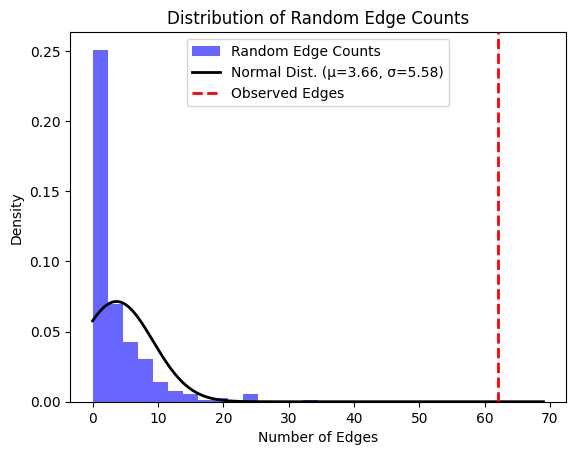

Genes mapped to panic disorder: 
panic disorder EFO_0004262
Genes mapped to panic disorder: 
['BORCS6', 'AURKB', 'IQCE', 'SDK2', 'FAM174A', 'RN7SKP62', 'TNFRSF21', 'PKP1', 'CALCOCO1', 'IYD', 'PLEKHG1', 'ANO2', 'RAN', 'Y_RNA', 'GULOP', 'CLU', 'GRM7', 'RAD23BP3', 'USP25', 'SOX21', 'AS1', 'LINC00557', 'LINC02450', 'MRPS36P5', 'KCNA3', 'LINC01500', 'SMOX', 'LINC01433', 'CPT1C', 'TSKS', 'SMAD1', 'AS2', 'PTMAP6', 'RNU6', '929P', 'PTBP3', 'SNHG14', 'DHFRP5', 'FKBP1C']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to obsessive-compulsive symptom measurement: 
obsessive-compulsive symptom measurement EFO_0007802
Genes mapped to obsessive-compulsive symptom measurement: 
['LAPTM4A', 'DT', 'RPS16P2', 'SLC16A14', 'SP110', 'CACNA2D3', 'RNU7', '51P', 'RNU6ATAC28P', 'EPIC1', 'MGAM', 'CLEC5A', 'TAAR2', 'TAAR1', 'TMTC1', 'LINC02386', 'FAM86LP', 'MIR3683', 'ATP13A4', 'MEF2B', 'BORCS8', 'B3GALT5', 'AS1', 'UNC5C', 'RN7SL802P', 'OR7H2P', 'CADPS', 'LARGE1', 'NALF1'

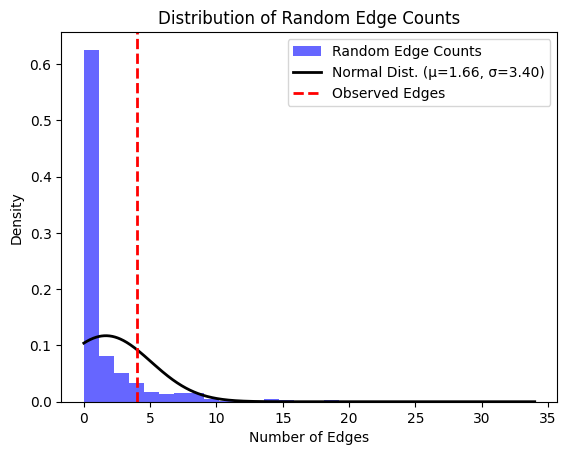

Genes mapped to digestive system infectious disorder: 
digestive system infectious disorder MONDO_0043424
Genes mapped to digestive system infectious disorder: 
['TYRO3', 'LUC7L3', 'ABO', 'Y_RNA', 'LINC02997', 'STKLD1', 'LINC02402', 'PPIAP16', 'FLNB', 'MFHAS1', 'LINC02748', 'LINC02756', 'RBMS3', 'LINC01911', 'RNU6', '692P', 'CD96', 'TNPO1', 'DT', 'ATXN1', 'BUD13P1', 'LNCRNA', 'IUR', 'CNTN5', 'ITPR2', 'NPC1', 'ANKRD29']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to adult-onset Still's disease: 
adult-onset Still's disease EFO_0007135
Genes mapped to adult-onset Still's disease: 
['LINC01768', 'CSF1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to insulin measurement: 
insulin measurement EFO_0004467
Genes mapped to insulin measurement: 
['SNX7', 'AXDND1', 'ABCB11', 'LINC02438', 'RPL21P46', 'CAST', 'PCSK1', 'CDKAL1', 'GRB10', 'COBL', 'SLC30A8', 'SLC9B1P3', 'ACTR3BP5', 'JMJD1C', 'KIF11', 'TCF7L2', '

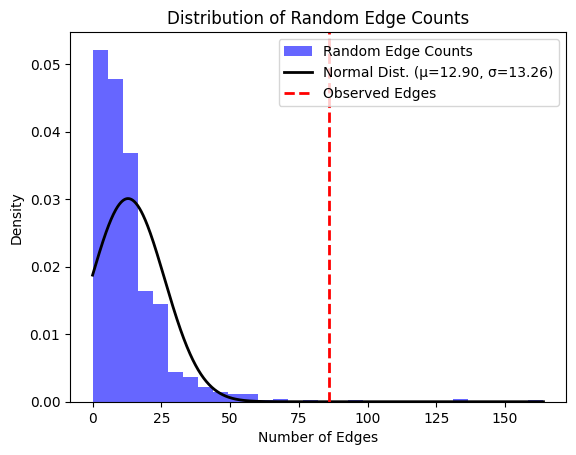

Genes mapped to allergic rhinitis: 
allergic rhinitis EFO_0005854
Genes mapped to allergic rhinitis: 
['INPP5D', 'ARB2BP', 'TRMT10C', 'AP5B1', 'OVOL1', 'RUNX3', 'RNU1', '150P', 'TTC33', 'NDFIP1', 'ATXN2', 'TNFRSF14', 'PRXL2B', 'LINC02098', 'ETS1', 'IQGAP1', 'GLB1', 'RTF1', 'ITPKA', 'FBXO45', 'LINC01063', 'SLC15A2', 'WAKMAR2', 'RTEL1', 'TNFRSF6B', 'PLCL1', 'ALOX15', 'ARHGAP15', 'CCL20', 'CRIPTOP2', 'LINC00877', 'RYBP', 'STARD6', 'NFATC2', 'LNCRNA', 'IUR', 'FAM76B', 'Y_RNA', 'CXCR5', 'SOCAR', 'MIR4435', '2HG', 'IL1B', 'NFKB1', 'TNFRSF11A', 'ITPKB', 'PSMA6', 'RPLP0P3', 'SMAD3', 'LINC00393', 'GTF3AP1', 'IL33', 'IL2RA', 'EMSY', 'LINC02757', 'TCHHL1', 'TCHH', 'CCR7', 'SMARCE1', 'IL18R1', 'IL1RL1', 'HLA', 'DQA1', 'DQB1', 'TLR10', 'TLR1', 'WDR36', 'RPS3AP21', 'D2HGDH', 'CLEC16A', 'IL7R', 'LINC02676', 'LINC00709', 'STAT6', 'LINC00299', 'SLC7A10', 'CEBPA', 'CD247', 'RORA', 'BACH2', 'LAYN', 'SIK2', 'MIR3142HG', 'OTULIN', 'TESPA1', 'SLC25A46', 'BCLAF1P1', 'CCDST', 'LMAN2', 'RGS14', 'JAK2', 'ZBTB38

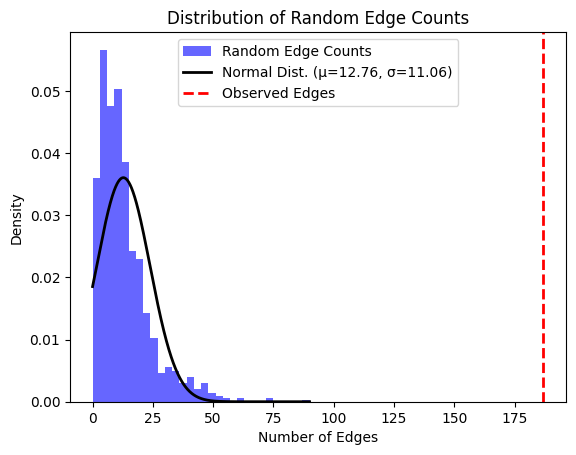

Genes mapped to osteoarthritis, hand: 
osteoarthritis, hand EFO_1000789
Genes mapped to osteoarthritis, hand: 
['CDC5L', 'SUPT3H', 'C12orf60', 'ERP27', 'CCDC91', 'TEAD1', 'ALDH1A2', 'IRF2BP1', 'MYPOP', 'LVRN', 'SPRY4', 'AS1', 'RNF144B', 'SNAP47', 'CIMAP2', 'OR7K1P', 'LINC02306', 'ETS2', 'ZNF847P', 'F2', 'UVRAG', 'WNT11', 'MEPE', 'HSP90AB3P', 'HULC', 'MGP', 'RPS20P10', 'CYP26B1', 'DNAH8', 'AGPAT4', 'CFAP54', 'ASIC2', 'CCL16', 'CCL14', 'CCL15']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to hip bone mineral density: 
hip bone mineral density EFO_0007702
Genes mapped to hip bone mineral density: 
['NMT2', 'RPP38', 'PTGFR', 'ENTPD8', 'SLC38A2', 'AS1', 'SLC38A4', 'HOXB7', 'EEF1DP6', 'LINC01777', 'NFIA', 'TM2D1', 'C1orf94', 'MIR552', 'FBXO2', 'AGRN', 'LINC01774', 'TFDP1P1', 'TRIOBP', 'H1', '0', 'A4GALT', 'CYB5R3', 'LINC02613', 'SPP2', 'RPS20P12', 'NEK11', 'NPM1P28', 'LINC02032', 'FAM193A', 'ZSWIM5P3', 'LINC02466', 'AGPAT4', 'DDX56', 'ABRA', 'HMGB1

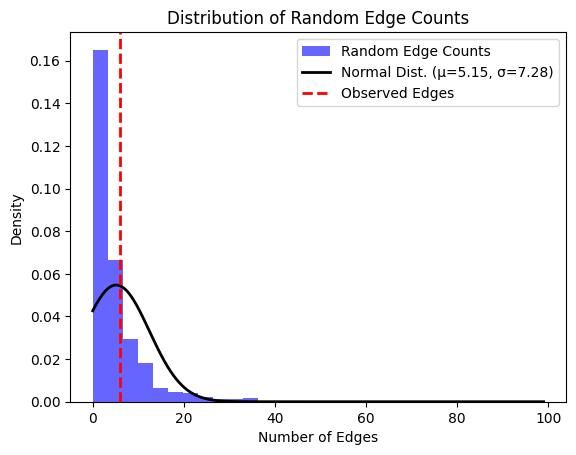

Genes mapped to dyslexia: 
dyslexia EFO_0005424
Genes mapped to dyslexia: 
['LINC01320', 'MIR4418', 'PPIAP34', 'CPA3', 'UBQLN4P1', 'HDAC9', 'RPL21P80', 'UNC5D', 'AIPL1', 'CHST8', 'STK24', 'PMFBP1', 'LINC01572', 'CCDC136', 'RBFOX2', 'MIR4268', 'EPHA4', 'RPS27P25', 'COX6A1', 'ZFP64', 'LINC02973', 'RNU6ATAC37P', 'INIP', 'CHST9', 'AQP4', 'AS1', 'ARFGEF2', 'CSE1L', 'DT', 'GGNBP2', 'PTPA', 'IER5L', 'DNMT3B', 'MIR4527HG', 'RFTN2', 'ARL14EP', 'SRRM1P2', 'LINC00971', 'HEATR5B', 'FAM120A', 'LINC02790', 'RNU1', '130P', 'HTT', 'DNAJC17P1', 'SEC61GP1', 'NME9', 'MRAS', 'NFIB', 'ZDHHC21', 'RBFOX1', 'TMEM131', 'KIAA1143', 'MIR548A1HG', 'RPL21P61', 'RFC5', 'CSGALNACT1', 'INTS10', 'PTPN21', 'SMARCA2', 'HNRNPA1P57', 'LDHAP3', 'CYB561D1', 'LINC01911', 'RNU6', '692P', 'SEMA3F', 'SLITRK2', 'MIR892C', 'PCGF6', 'ADGRL2', 'XYLT1', 'RPL7P47', 'POF1B', 'CYTIP', 'ACVR1C', 'LINC01170', 'SCAF1', 'PPP2R1B', 'NEUROD2', 'PPP1R1B', 'SETDB2', 'C1orf87', 'FHIP1A', 'CRTAC1', 'R3HCC1L', 'SH2B3', 'RPL7P20', 'RPLP0P9', 'COG5

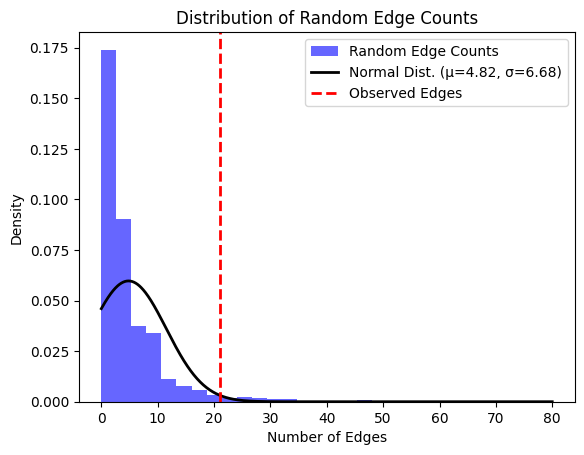

Genes mapped to ocular sarcoidosis: 
ocular sarcoidosis EFO_0010723
Genes mapped to ocular sarcoidosis: 
['SLC27A6', 'FBN2', 'LINC01320', 'PMS2', 'RNU4', '43P', 'CCNB3P1', 'FRMD4A', 'LRP2', 'BBS5', 'PARD3B', 'MAGI1', 'SRSF3P2', 'GAPDHP30', 'RESF1', 'BICD1', 'AS1', 'MIR3201', 'TAFA5', 'HCG22', 'RNU6', '1133P', 'LINC03007', 'MIR148A', 'LIPC', 'ALDH1A2', 'WASH8P', 'MTND1P17', 'IGKV1OR22', '5', 'FRG1BP', 'MYCNUT', 'MYCNOS', 'STK32C', 'GGT2P', 'E2F6P3', 'CFAP161', 'CYB5AP5', 'NOVA1', 'USP10', 'LARP1BP2', 'CTB', '30L5.1', 'HLA', 'DQA1', 'DQB1', 'MGAT4A', 'MTL3P', 'TMX3', 'RN7SL802P', 'OR7H2P', 'STXBP6', 'LINC02768', 'COG6', 'CDKN2AIPNLP3', 'KCTD1', 'RPS3AP6', 'NMNAT1P5', 'MAPK3', 'CORO1A', 'ANKRD20A5P', 'KCNH7', 'C6orf226', 'PTCRA', 'RRP36', 'CDH12', 'CCKBR', 'CAVIN3', 'CYB5R4', 'LINC02857', 'NEIL2', 'VSX2', 'ABCD4', 'PFKFB3', 'AMBRA1', 'AOAH', 'SEC61G', 'DT', 'EGFR', 'LINC01415', 'LINC01416', 'INVS', 'ERP44', 'LRRIQ4', 'KIF26B', 'DOA', 'DPA1', 'SRD5A3P1', 'OOSP1', 'UPF3AP3', 'PAMR1', 'PRRC2

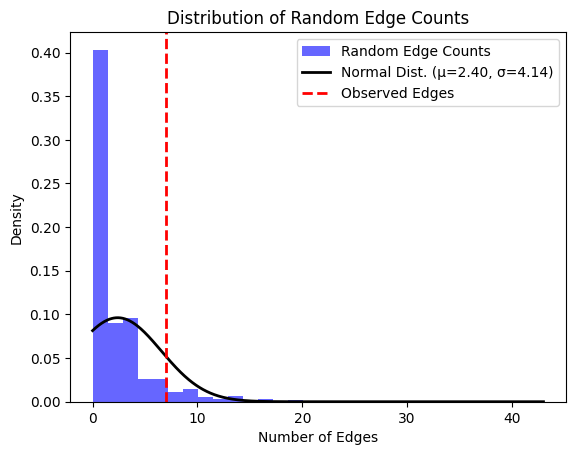

Genes mapped to age at assessment, pelvic organ prolapse: 
age at assessment, pelvic organ prolapse EFO_0004710
Genes mapped to age at assessment, pelvic organ prolapse: 
['WNT4', 'GDF7', 'TMEM248P1', 'LINC02379', 'GLULP5', 'LINC02459', 'IMPDH1', 'UNGP1', 'HNRNPA1L3', 'EFEMP1', 'PNPT1', 'WT1', 'AS', 'SLC12A2', 'FBN2', 'BLOC1S5', 'TXNDC5', 'LOXL1', 'SGK1', 'CT70', 'FHAD1', 'CRYM', 'ANKS4B', 'MED28P5', 'LINC02553', 'DPP6', 'LINC01735', 'LINC02769', 'LINC00333', 'LINC00375', 'NDUFC2', 'KCTD14', 'SPRY1', 'LINC02435', 'SPATS2L', 'KCTD18', 'LINC01756', 'LINC01648', 'BAALC', 'AS2', 'LINC01500', 'RN7SKP191', 'U3', 'LINC02652', 'GPC6', 'DCT', 'LAMA5', 'IQCJ', 'SCHIP1', 'FARP1', 'FLJ36000', 'LINC01310', 'NHIP', 'PSME2P2', 'FNDC3A', 'CEP20', 'RPL15P20', 'GUCA1C', 'STAU2', 'MEG8', 'MIR493HG', 'LINC03093', 'GFRA2', 'PTPRD', 'PGBD5', 'LINC01737', 'SHC3', 'CKS2', 'FOXP2', 'MDFIC', 'ASCL4', 'WSCD2', 'DOLPP1', 'CRAT', 'LY86', 'BTF3P7', 'MIR217HG', 'RNU6', '675P', 'TEX51', 'ANKRD33BP6', 'TRIM51', 'LINC0

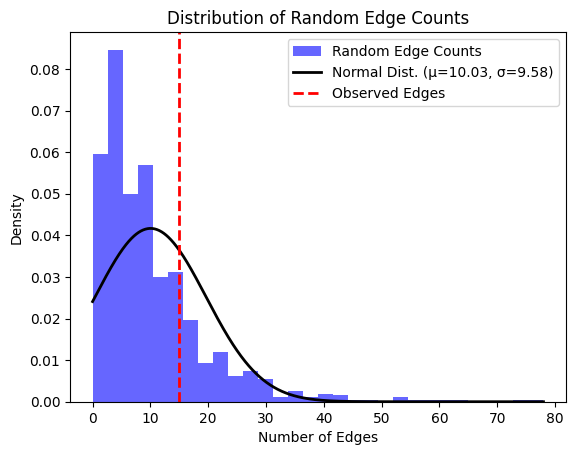

Genes mapped to cystic fibrosis associated meconium ileus: 
cystic fibrosis associated meconium ileus EFO_0004608
Genes mapped to cystic fibrosis associated meconium ileus: 
['TARS1', 'TOMM40P3', 'TRBJ2', '7', 'TRBC2', 'CEBPB', 'PELATON', 'TRBV29', '1', 'PRSS1', 'RNU6', '154P', 'SLC6A14', 'ATP12A', 'SLC26A9', 'RAB7B']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to attention deficit hyperactivity disorder, autism spectrum disorder: 
attention deficit hyperactivity disorder, autism spectrum disorder EFO_0003756
Genes mapped to attention deficit hyperactivity disorder, autism spectrum disorder: 
['EEF1A1P11', 'RN7SL831P', 'LINC01776', 'SNX7', 'DT', 'THAP3P1', 'CDK4P1', 'LINC01031', 'RPL23AP22', 'PKP4', 'SGO1', 'AS1', 'CADPS', 'RSRC1', 'RN7SKP222', 'FGF12', 'Y_RNA', 'LINC02994', 'MIR9', '2HG', 'LINC02058', 'NIHCOLE', 'RNU6', '334P', 'KCNN2', 'GALNT10', 'ADTRP', '1060P', 'SPTLC1P2', 'ISG20L2P1', 'GABBR1', 'MIR2113', 'EIF4EBP2P3', 'KMT2E', 'RP1L1'

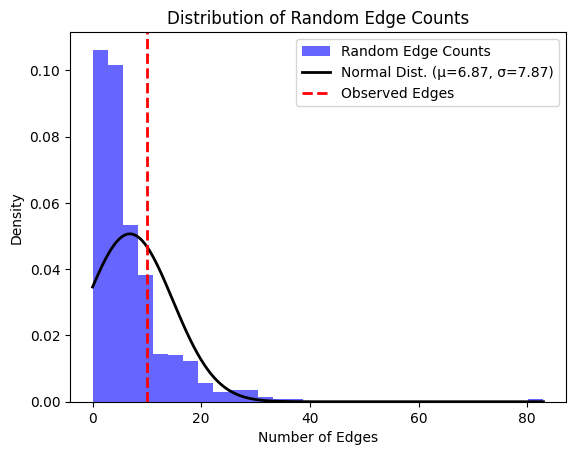

Genes mapped to B-cell acute lymphoblastic leukemia, adult onset asthma: 
B-cell acute lymphoblastic leukemia, adult onset asthma EFO_1002011
Genes mapped to B-cell acute lymphoblastic leukemia, adult onset asthma: 
['LINC02676', 'LINC00709', 'RNA5SP299', 'LINC00708', 'KRT8P37', 'EMSY', 'LINC02757', 'FADS2', 'RAB5B', 'STAT6', 'LRP1', 'CLEC16A', 'IL4R', 'COG6', 'SMAD3', 'RORA', 'BRD2', 'HLA', 'DOA', 'BACH2', 'DQA1', 'DRB1', 'DQB2', 'DOB', 'DQB1', 'MTCO3P1', 'AS1', 'FGFR3P1', 'ZDHHC20P2', 'RPL13AP18', 'RNU6', '1213P', 'Y_RNA', 'ERMP1', 'TPD52L3', 'UHRF2', 'IL33', 'GTF3AP1', 'RANBP6', 'BRD10', 'GATA3', 'IL2RA', 'ZNF652', 'SLC7A10', 'CEBPA', 'RUNX1', 'COL16A1', 'LAYN', 'SIK2', 'SCYL1', 'ADAMTSL3', 'UNC13D', 'FOXA3', 'ACOXL', 'MIR4435', '2HG', 'SPATA18', '1252P', 'PLAGL1', 'BCL2L11', 'CD247', 'PTPRC', 'D2HGDH', 'IL18R1', 'IL1RL1', 'SLC9A4', 'IL1RL2', 'PRCPP1', 'MAP4K4', 'SLC9A2', 'RPL6P5', 'METAP2P1', 'GLB1', 'TBL1XR1', 'ITK', 'IRF1', 'CARINH', 'TH2LCRR', 'GNPDA1', 'NDFIP1', 'WDR36', 'RPS3A

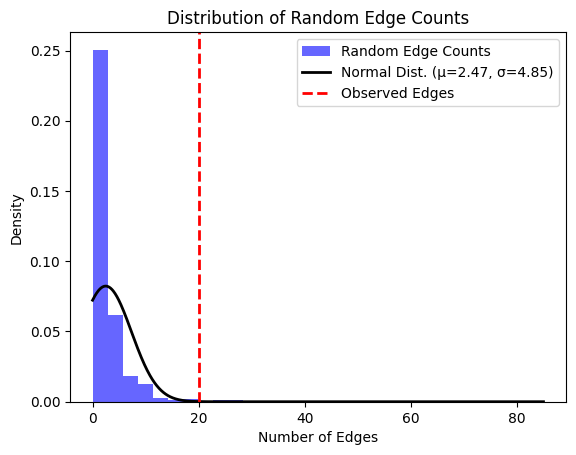

Genes mapped to Tourette syndrome: 
Tourette syndrome EFO_0004895
Genes mapped to Tourette syndrome: 
['PTPRU', 'LINC01122', 'RBMS1', 'RN7SL423P', 'SGPP2', 'ERC2', 'CFAP99', 'AGA', 'DT', 'TENM2', 'MIR2113', 'EIF4EBP2P3', 'RUNX1T1', 'FLJ46284', 'TSPYL5', 'SNORD3H', 'CSMD3', 'RNU6', '1228P', 'CDCA7P2', 'C10orf67', 'AS1', 'OTUD1', 'TENM4', 'MGST1', 'LMO3', 'PITPNM2', 'FLT3', 'TSHR', 'CD276', 'INSYN1', 'EFL1', 'XYLT1', 'MUC16', 'FPR3', 'ZNF577', 'COL27A1', 'POLR3B', 'PICALM', '560P', 'LINC03005', 'RPL6P18', 'PHEX', 'LINC00587', 'CYLC2', 'THSD7A', 'TMEM106B', 'LINC02790', 'RNU1', '130P', 'NUBPL', 'KCNH3', 'CAMTA1', 'FECHP1', 'KRT8P18', 'POU1F1', 'LSAMP', 'GBA3', 'RFPL4AP3', 'NPM1P10', 'HACE1', 'YWHABP1', '765P', 'LNCRNA', 'IUR', 'FAM76B', 'USP2', 'NECTIN1', 'TRPC4', 'ACOD1', 'RPL7P44', 'WDR7', 'NFATC2', 'ATP9A', 'LINC02058', 'POLD2P1', 'TANK', 'L3MBTL2']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to late-onset Alzheimers disease: 
late-onset Alz

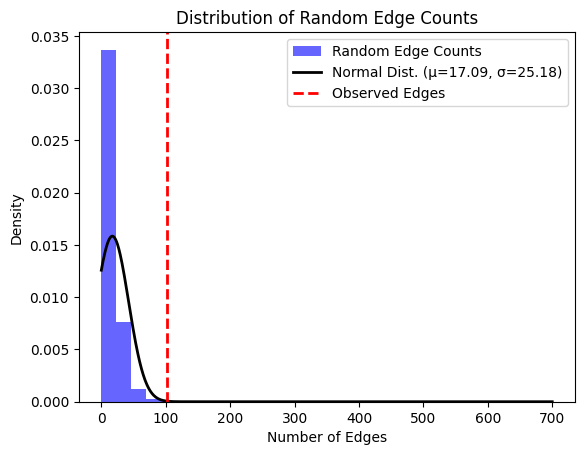

Genes mapped to PR interval: 
PR interval EFO_0004462
Genes mapped to PR interval: 
['ARHGAP24', 'CAV1', 'SCN10A', 'TBX5', 'SCN5A', 'MEIS1', 'MICAL2', 'SAMD3', 'MYO3A', 'VWC2L', 'BCL6', 'LINC02915', 'THBS1', 'MAGI1', 'MFSD2A', 'HNRNPKP2', 'UBBP1', 'RPS15AP14', 'EXTL2P1', 'XYLB', 'ITGA9', 'EMILIN2', 'CAMTA1', 'LINC02812', 'SLC25A3P1', 'DAB1', 'LINC00624', 'PNO1', 'ABCA12', 'RN7SL120P', 'CNTN6', 'ALDH1L1', 'AS2', 'RBP1', 'COPB2', 'DT', 'RNA5SP144', 'LARP7P4', 'KCNMB3', 'LINC02511', 'CUL9', 'DNPH1', 'SMIM8', 'GJB7', 'NXPH1', 'GAPDHP68', 'ABCB5', 'SUMF2', 'RUNDC3B', 'COL26A1', 'IMMP2L', 'COMETT', 'PPIAP34', 'ZBTB40', 'HNRNPA3P12', 'LDLRAD1', 'MIR137HG', 'TGIF1', 'GAPLINC', 'SERPINB5', 'STK11', 'THBD', 'CD93', 'PPIL2', 'RARB', 'COL1A2', 'RNU6', '1328P', 'DOCK4', 'AS1', 'LINC01392', 'POLR2DP2', 'TRHR', 'NUDCD1', 'KIF13B', 'NAMA', 'GJD4', 'FZD8', 'COL13A1', 'LINC02636', 'FADD', 'PPFIA1', 'MGST1', 'PPHLN1', 'ATP6V1G1P7', 'RPL7P45', 'OTUD7A', 'ASIC2', 'WIPF2', 'LINC01482', 'YES1', 'LINC00470', 

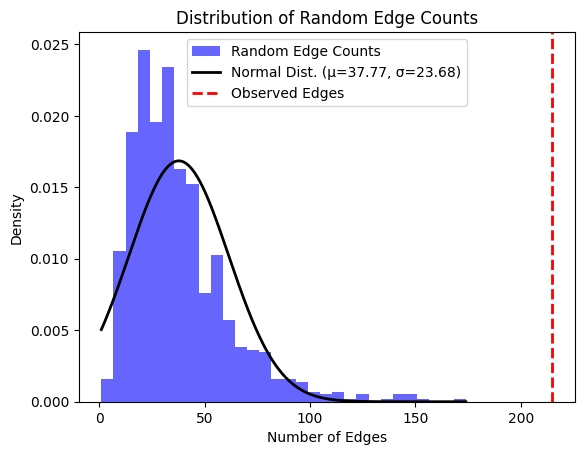

Genes mapped to QRS amplitude, QRS complex: 
QRS amplitude, QRS complex EFO_0005054
Genes mapped to QRS amplitude, QRS complex: 
['SCN10A', 'LNCAROD', 'TBX5', 'RNU1', '88P', 'Y_RNA', 'ZNF619P1', 'HMGN1P19', 'FHOD3', 'NFIA', 'SCN5A', 'SETBP1', 'PRKCA', 'HLF', 'SLC35F1', 'CEP85L', 'SIPA1L1', 'TBX20', 'HERPUD2', 'MIR6500', 'C1orf185', 'LRIG1', 'SLC25A26', 'STRN', 'TKT', 'LINC02529', 'RPL21P69', 'PRDM16', 'MPPED2', 'TBX3', 'AS1', 'UBA52P7', 'EXOG', 'KLF12', 'VTI1A', 'CASQ2', 'HAND1', 'CIR1P1', 'RPL21P46', 'SLIT2', 'HEATR5B', 'FADS2', 'GOSR2', 'CRIM1', 'U6', 'N6AMT1', 'OLFML2B', 'NOS1AP', 'MITF', 'LRCH1', 'WIPF1', 'MAPT', 'TRIM63', 'HIVEP1', 'CAND2', 'NSRP1', 'USP25', 'CLCN6', 'HNRNPLP1', 'RPS26P29', 'LINC02426', 'CCDC59', 'LINC00243', 'LRMDA', 'MCFD2P1', 'ZNF184', 'AMPD3', 'GSS', 'CASC20', 'CPEB4', 'SLC25A27', 'CACNB2', 'RBM20', 'LITAF']
Random edges calculation completed

z score: 1.583679843506595



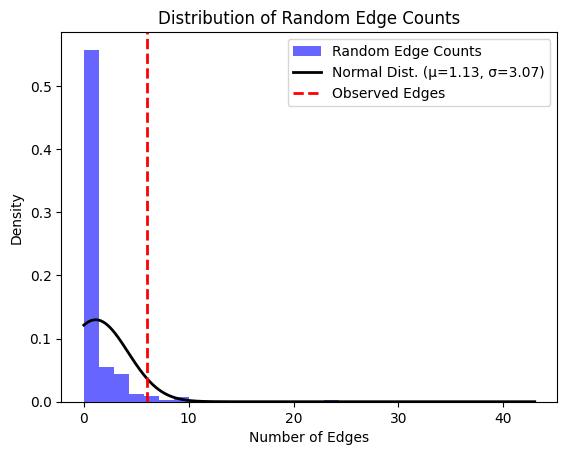

Genes mapped to QT interval: 
QT interval EFO_0004682
Genes mapped to QT interval: 
['KCNE1', 'SLC35F1', 'CEP85L', 'TBX5', 'NOS1AP', 'KCNH2', 'KCNQ1', 'CNOT1', 'SLC8A1', 'ARHGEF28', 'LINC02122', 'RNU7', '66P', 'RNA5SP208', 'DPP6', 'KCNB1', 'LDB2', 'MTND5P4', 'PROM1', 'FGFBP2', 'LINC02152', 'TMEM114', 'CREBBP', 'DDX10', 'RNU6', '654P', 'LINC02315', 'LRFN5', 'DT', 'CAMK1D', 'ADAMTSL1', 'CFAP161', 'ROS1', 'GNAL', 'NATP', 'NAT2', 'KCNG1', 'RPSAP1', 'SEPTIN7P13', 'RN7SKP49', 'CICP24', 'GABPAP', 'LINC01958', 'RPLP0P7', 'RN7SL700P', 'SUCLA2', 'ARHGAP10', 'LINC01378', 'TTN', 'AS1', 'OLFML2B', 'TCL6', 'TMEM44', 'PTPRG', 'ICE1', 'HMGB3P3', 'PARP15', 'EIF4BP8', 'PDE3A', 'ELMO1', 'LINC02484', 'SEC63P2', 'ATP1B1', 'AOC1', 'CALM2P1', 'CASC17', 'EXOG', 'SCN5A', 'LITAF', 'RNF207', 'RASL11A', '70P', 'LIG3', 'CYP4A11', 'CYP4A26P', 'C1orf141', 'PPIAP62', 'VN1R18P', 'MIR548AE1', 'ZNF804A', 'SLC9A9', 'CHL1', 'HCG18', 'PHACTR1', 'BUB3P1', 'EIF3IP1', 'MTND4P3', 'RNA5SP231', 'RN7SKP196', 'LINC00844', 'EMX2OS'

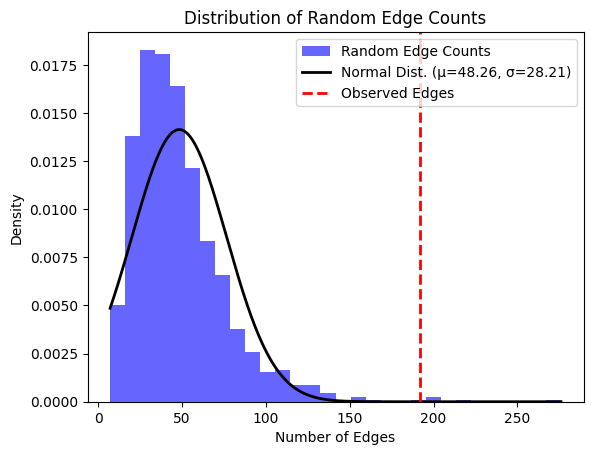

Genes mapped to autism: 
autism EFO_0003758
Genes mapped to autism: 
['SNHG18', 'TAS2R1', 'ZBED3', 'AS1', 'PDE8B', 'RNU6', '374P', 'MSNP1', 'PARD3B', '164P', 'ARL2BPP5', 'EYA1', 'U8', 'TAF1C', 'MACROD2', 'PPP2R5C', 'RNU4', '43P', 'LINC00399', 'LINC00676', 'CSDE1', 'AMPD1', 'RN7SL432P', 'TRIM33', 'PKMP1', 'BCAS2', 'Y_RNA', 'LINC02409', 'AMELY', 'TBL1Y', 'DDX3Y', 'UTY', 'KDM5D', 'EIF1AY', 'SLC52A2', 'FBXL6', 'ADCK5', 'MYO9B', 'NFIA', 'AS2', 'ESRRG', 'SYNPR', 'TENM2', 'MCPH1', 'DT', 'BSX', 'SAE1P1', 'PAFAH1B2P2', 'MIR4495', 'RN7SL571P', 'KCTD12', 'NAB1P1', 'Metazoa_SRP']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to neurotic disorder: 
neurotic disorder EFO_0004257
Genes mapped to neurotic disorder: 
['NKAIN2', 'ARRDC4', 'LINC02251', 'PDE4D', 'MDGA2', 'NXPH1', 'ZYXP1', 'FAM135B', 'TMPRSS9', 'NOP56P1', 'LINC01623', 'VRK2', 'RERE', 'LINC03000', 'RASSF1', 'LINC01990', 'BBX', 'MCFD2P1', 'ZNF184', 'MMS22L', 'MIR2113', 'MAD1L1', 'PCLO', 'SEMA3E', 'C

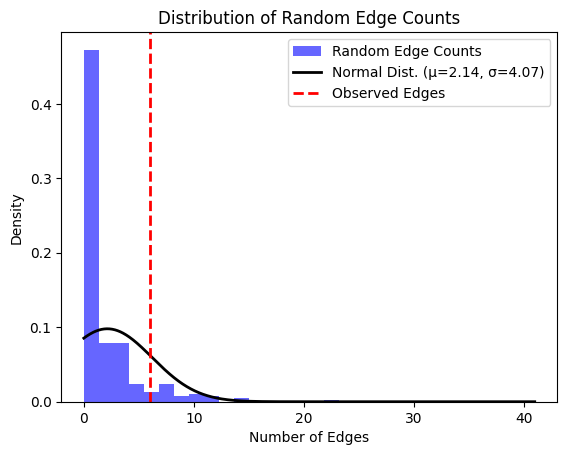

Genes mapped to mood disorder: 
mood disorder EFO_0004247
Genes mapped to mood disorder: 
['UQCC5', 'PBRM1', 'AGK', 'PIWIL4', 'AS1', 'MGC32805', 'LINC02201', 'SORL1', 'RNU6', '256P', 'MACROD2', 'FLRT3', 'PDE4B', 'MEF2C', 'AS2', 'SLC24A2', 'MLLT3', 'PTH2R', 'CACYBPP2', 'MIR548AE1', 'FOXP2', 'CAPZBP1', 'LINC01965', 'SV2C', 'SLC26A5', 'RELN', '21P', 'DPPA3P11', 'Y_RNA', 'PERPP1', 'KLHDC8B', 'ESR1', 'MAD1L1', 'DRD2', 'LRFN5', 'DT']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to HbA1c measurement: 
HbA1c measurement EFO_0004541
Genes mapped to HbA1c measurement: 
['SPTA1', 'ABCB11', 'GCK', 'SNRPGP16', 'MTNR1B', 'ANK1', 'FN3KRP', 'TMPRSS6', 'HFE', 'H2BC4', 'HK1', 'ATP11AUN', 'TCF7L2', 'CPVL', 'CDKAL1', 'SLC30A8', 'SPC25', 'TMEM79', 'HBS1L', 'RNU6', '996P', '1064P', 'FADS2', 'PIEZO1', 'MYO9B', 'G6PC2', 'ASB16', 'AS1', 'COL2A1', 'SENP1', 'TMC6', 'FNDC3B', 'G6PD', 'SOX30', 'CCT3', 'KCNQ1', 'SCRN3', 'CDT1', 'CDKN2B', 'SLC2A2', 'ERAL1', 'BET1L', 'SYN2'

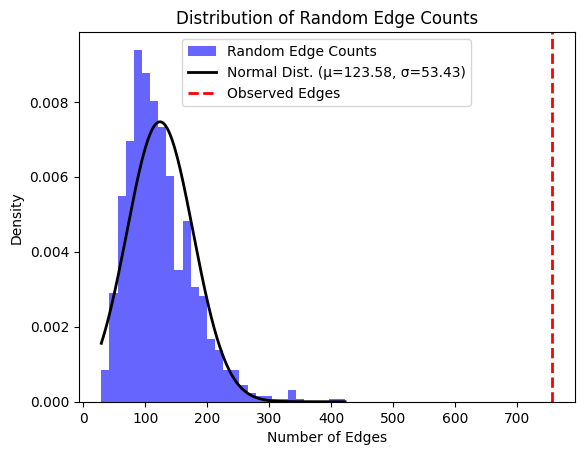

Genes mapped to emphysema: 
emphysema EFO_0000464
Genes mapped to emphysema: 
['TMEM72', 'AS1', 'LINC02629', 'PARD3', 'LINC03021', 'CSMD1', 'RN7SL292P', 'SGO1P2', 'HPRT1P2', 'RPL19P11', 'BICD1', 'ADARB2', 'ZNF490', 'RPL10P16', 'PPARGC1A', 'DHX15', 'MGAT5B', 'Metazoa_SRP', 'KCNJ3', 'FBLN2', 'CDH18', 'UBL5P1', 'ZCCHC10P2', 'GLI3', 'LINC01448', 'STC1', 'RNU1', '148P', 'PIBF1', 'RNU6', '66P', 'RNU4', '10P', 'KLF12', 'SOX21', 'LINC00557', 'SNAI1', 'SCREEM1', 'SLC25A6P5', 'LINC01505', 'SERPINA2', 'SERPINA1', 'KRT18P51', 'HHIP', 'MFSD9', 'CHRNA5']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to myocardial infarction: 
myocardial infarction EFO_0000612
Genes mapped to myocardial infarction: 
['ABO', 'IRX1', 'LINC02063', 'CDKN2B', 'AS1', 'LINC03089', 'LINC02881', 'LINC00310', 'KCNE2', 'MRPS6', 'PHACTR1', 'BSND', 'PCSK9', 'WDR12', 'CELSR2', 'PSRC1', 'MIA3', 'SMARCA4', 'PLCB2', 'CXCL8', 'ANP32CP', 'MARCHF1', 'VPS33B', 'DT', 'TMOD4', 'COL6A3', 'ZNF77', '

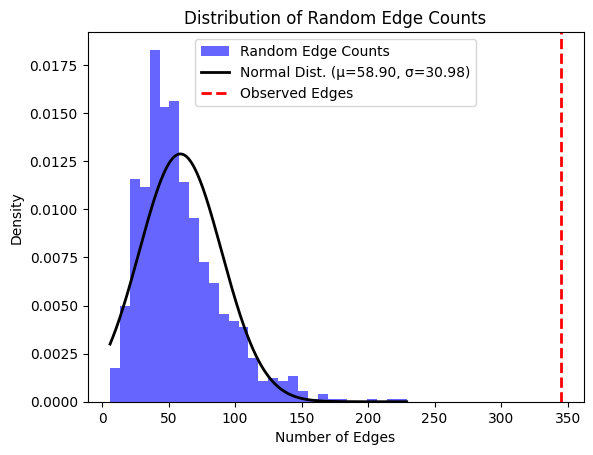

Genes mapped to Creutzfeldt Jacob Disease: 
Creutzfeldt Jacob Disease EFO_0004226
Genes mapped to Creutzfeldt Jacob Disease: 
['MITA1', 'RPL3P9', 'PRNP', 'PRND', 'TSPAN8', 'PKNOX2', 'MTMR7', 'LINC01868', 'NPAS2']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to response to metformin, glucose tolerance test: 
response to metformin, glucose tolerance test EFO_0004307
Genes mapped to response to metformin, glucose tolerance test: 
['ADCY5', 'TCF7L2', 'VPS13C', 'GCKR', 'GIPR', 'TBC1D4', 'ABCB11', 'MTNR1B', 'HKDC1', 'SNRPGP16', 'NYAP2', 'MIR5702', 'SPON1', 'SERPINA1', 'MACF1', 'TDG', 'GLP2R', 'RAPGEF4', 'POLR1C', 'ZFAND2A', 'DT', 'UNCX', 'GPT', 'HHEX', 'Y_RNA', 'SMCO4', 'DHX37', 'SLC5A1', 'HOXD1', 'CLEC10A', 'ABO', 'F13A1', 'LY86', 'AS1', 'LINC01819', 'PAPPA2', 'ADAM30', 'ST8SIA6', 'ARHGEF17', 'BTNL3', 'UTP3', 'HERC1', 'G6PC2', 'SPC25', 'DVL2', 'ERAP2', 'HNF1A', 'KCNJ11', 'CTRB2', 'PLCB3', 'MLX', 'TIAM2', 'MUC6', 'GLP1R', 'LINC02380', 'SRIP1', 'SLC

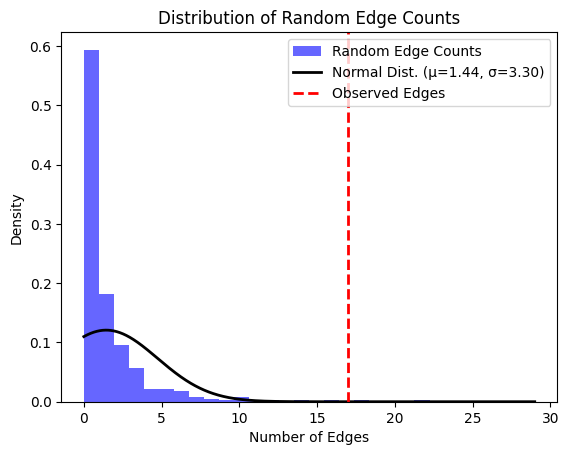

Genes mapped to otosclerosis: 
otosclerosis EFO_0004213
Genes mapped to otosclerosis: 
['RELN', 'LINC02644', 'ZNF438', 'C11orf16', 'ASCL3', 'FIBIN', 'BBOX1', 'PAUPAR', 'LTBP3', 'MAML2', 'KRT126P', 'LINC02341', 'TNFSF11', 'DLEU1', 'COL4A2', 'AS2', 'SIPA1L1', 'MARK3', 'SMAD3', 'MAN2C1', 'PEAK1', 'MEX3B', 'LINC01583', 'RPS3AP2', 'PTX4', 'IRX5', 'MTND5P34', 'SLC7A6', 'MAPK8IP1P1', 'ARL17B', 'LINC01482', 'FHOD3', 'DNMT1', 'TGFB1', 'EYA2', 'CSF1', 'CERS2', 'ANXA9', 'PRRX1', 'LINC02789', 'RNU6', '778P', 'LYPLAL1', 'AS1', 'ZC3H11B', 'ANAPC1', 'CD200', 'HRG', 'AHSG', 'KDR', 'RN7SL822P', 'HSP90AB3P', 'SPP1', 'CCSER1', 'TMEM14B', 'MAK', 'IP6K3', 'SUPT3H', 'CD109', 'LINC02542', 'LINC00326', 'CLDN23', 'MFHAS1', 'FAM167A', 'BIN3', 'EGR3', 'DPYS', 'LINC00536', 'EIF3H', 'SEMA4D', 'NAMA', 'PREX1', 'ETS2']
Random edges calculation completed

z score: 1.784478883800924



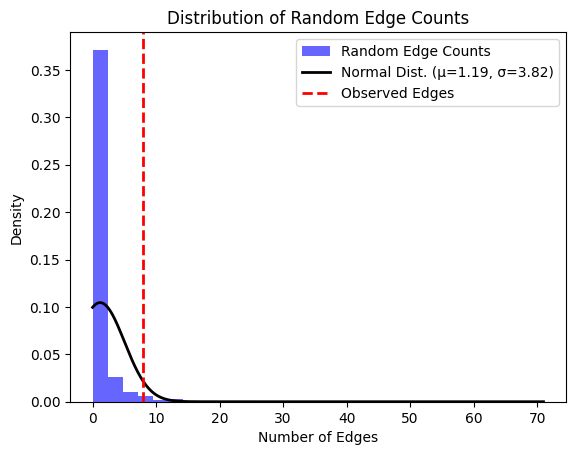

Genes mapped to trait in response to traditional medicine, drug-induced liver injury: 
trait in response to traditional medicine, drug-induced liver injury EFO_0004228
Genes mapped to trait in response to traditional medicine, drug-induced liver injury: 
['TSBP1', 'AS1', 'ST6GAL1', 'LINC03106', 'CAAP1', 'OR5H8', 'OR5K4', 'HCP5', 'ALG10B', 'CPNE8', 'MCTP2', 'HLA', 'G', 'POLR1HASP', 'DQB1', 'PPARG', 'SYT14', 'ERN1', 'LINC02424', 'SYT1', 'NEBL', 'TMED7', 'H3P24', 'RIPOR2', 'AGBL4', 'LRBA', 'RNU6', '1037P', 'MIR5011', '649P', 'LINC01248', 'HISLA', 'PAX7', 'TAS1R2', 'C19orf81', 'NEK4P3', 'MYL6P3', 'LINC02159', 'GABRB2', 'Y_RNA', 'EXOC6', 'LINC01266', 'RNU4', '69P', 'RPL23AP44', 'ASTN2', 'PTPRD', 'ROBO1', 'CCDC85A', 'PPIAP63', 'CCDC14', '909P', 'LINC02109', 'RAB31', 'TBXAS1', 'CAMTA1', 'SYTL2', 'RAD51B', 'TPD52', 'RNF24', 'NAT2', 'PSD3', 'PRND', 'LINC01877', 'LINC03053', 'BCOR', 'PFDN4', 'DOK5', 'RBMS3', 'AS2', 'LINC01170', 'FGF14', '632P', 'MYO3A', 'LINC02558', 'TIAM1', 'TNFSF13B', 'HCFC2P1

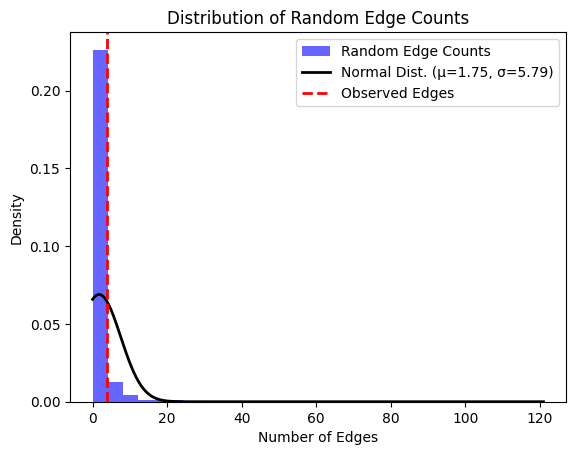

Genes mapped to Moyamoya disease: 
Moyamoya disease MONDO_0016820
Genes mapped to Moyamoya disease: 
['RNF213', 'AS1', 'CARD14', 'ATP7BP1', 'RPS4XP18', 'MYRF', 'HDAC9', 'TWIST1', 'HORMAD2', 'LIF', 'SMPDL3B', 'DNM3', 'WNT9A', 'CICP26', 'FMNL2', 'RAPGEF4', 'PSMC1P4', 'RNU6ATAC2P', 'NLN', 'FSTL4', 'SUGCT', 'MAGI2', 'FBXO25', 'DOCK1', 'DOCK9', 'RPL18P1', 'ATP5MC2P2', 'CFDP1', 'TMEM170A', 'JAZF1', 'LRP1', 'MTHFR', 'PLOD1', 'RPTOR', 'SBF2', 'PA2G4P2', 'LINC01722', 'TCN2', 'TSC22D2', 'STK33', 'CDC42BPG', 'FGF11', 'EHMT2', 'ENDOV', 'NPTX1', 'DOK7', 'FLT1', 'EIF4A1P7', 'RAP1A', 'RNF115', 'KAZN', 'ZBTB40', 'EPHA8', 'C8orf34', 'PDE1C', 'SDK2', 'LAT2', 'LINC01029', 'RNU6', '655P', 'PGAM1P5', 'LINP1', 'LINC02789', 'RPL19', 'STAC2', 'ZNF385D']
Random edges calculation completed

z score: 1.1463801488141732



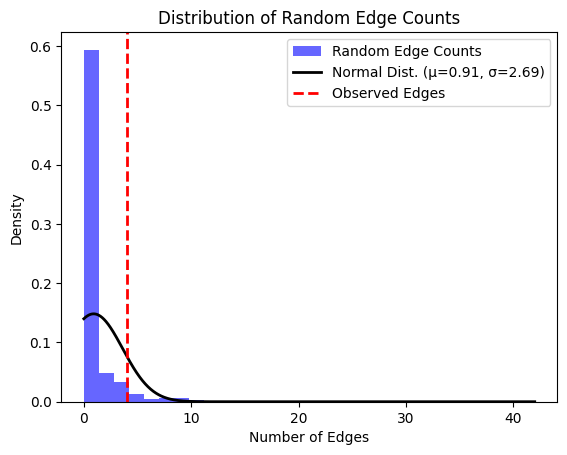

Genes mapped to mucocutaneous lymph node syndrome: 
mucocutaneous lymph node syndrome EFO_0004246
Genes mapped to mucocutaneous lymph node syndrome: 
['PELI1', 'DAB1', 'BTBD1', 'IGHV1', '69D', 'IGHV2', '70', 'ZFHX3', 'NAALADL2', 'MIA', 'RAB4B', 'HLA', 'DQB2', 'DOB', 'CD40', 'CDH22', 'CENPU', 'FAM167A', 'BLK', 'MRPS22', 'PPM1L', 'MED30', 'RPL13P2', 'TECRL', 'FCGR2A', 'COQ8B', 'ITPKC', 'CASP3', 'NFKBIL1', 'LTA', 'IGHVIII', '67', '4', '68', 'OR5AK1P', 'OR5BQ1P', 'GALNT18', 'RMST', 'CARMIL1', 'RNU7', '26P', 'OR2B2', 'ZSCAN26', 'PGBD1', 'MICC', 'TMPOP1', 'TSBP1', 'AS1', 'DQB1', 'MTCO3P1', 'ACTMAP', 'TPD52', 'SARNP', 'CUBN', 'NTNG1', 'PLXNA2', 'LINC01735', 'KIF25', 'PTPRJ', 'SPECC1L', 'ADORA2A', 'RPN2', 'RHBDD1', 'SHANK2', 'LINC00972', 'SOCS5P1', 'OR13C4', 'MICB', 'PPIAP9', 'DIRC1', 'COL3A1', 'ENPP6', 'EPG5', 'STIM2', 'LINC02261', 'TMEM263', 'SLC16A7']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to Dupuytren Contracture: 
Dupuytren Contracture EFO

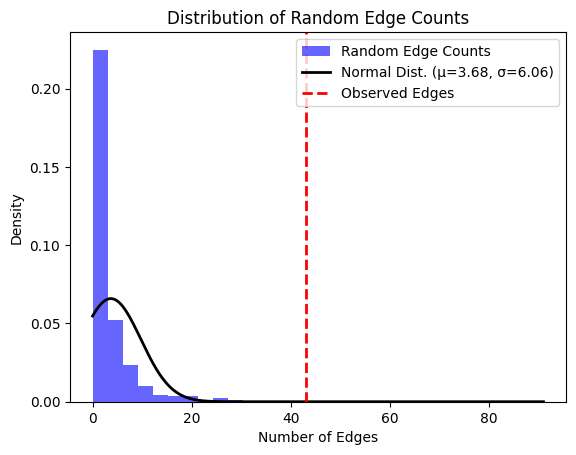

Genes mapped to open-angle glaucoma: 
open-angle glaucoma EFO_0004190
Genes mapped to open-angle glaucoma: 
['RN7SKP93', 'MGAT5', 'CDKN2B', 'AS1', 'C14orf39', 'SALRNA1', 'CAV2', 'CAV1', 'ZFPM2', 'APBB2', 'EXOC2', 'FMNL2', 'CHEK2', 'MADD', 'PLCE1', 'BICC1', 'RPL6P25', 'SLC6A15', 'RORA', 'LINC02349', 'CASC20', 'FAUP4', 'GNB1L', 'TXNRD2', 'ABCA1', 'CT70', 'GAS7', 'TMCO1', 'AFAP1', 'PDE7B', 'ELF2P2', 'FOXCUT', 'PCED1CP', 'MIR4776', '2', 'LPP', 'THSD7A', 'SEMA3C', 'EIF4EP4', 'PKN2', 'TMEM181', 'RARB', 'DGKG', 'LINC02020', 'PNPT1', 'EFEMP1', 'CADM2', 'GMDS', 'ANKH', 'RPS15AP20', 'PKHD1', 'LINC00574', 'RPL12P23', 'LINC01214', 'FBXO32', 'ANGPT1', 'LMX1B', 'ZNF280D', 'TCF12', 'DT', 'ARHGEF12', 'LINC00540', 'ACOXL', 'PRKAG2', 'AS2', 'CTTNBP2', 'LSM8', 'LINC02934', 'MIR4778', 'DGKD', 'COL11A1', 'BNIP1', 'ITIH1', 'ALDH9A1', 'PMM2', 'ATXN2', 'LINC02322', 'SIX6', 'PLEKHA7', 'RAPSN', 'ZNRD2', 'ME3', 'TLCD5', 'ETS1', 'ZBTB44', 'ADAMTS8', 'PTHLH', 'CCDC91', 'KLF5', 'LMO7', 'LTBP2', 'AREL1', 'SMAD6', 'L

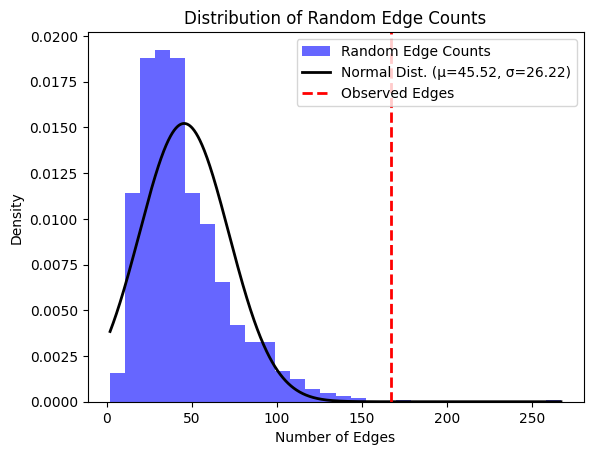

Genes mapped to hippocampal atrophy: 
hippocampal atrophy EFO_0005039
Genes mapped to hippocampal atrophy: 
['TTC27', 'TLK1', 'METTL8', 'CHD6', 'SLC1A7', 'F5', 'GCFC2', 'VPS13B', 'TLE1', 'DT', 'LHFPL6', 'COL18A1', 'PCA3', 'PRUNE2', 'EFNA5', 'SPMIP7', 'IKZF1', 'MAGI2', 'MAL2', 'RAB11AP2', 'GGTA2P', 'RPS19P6', 'RPS20P25', 'RPL13AP21', 'SLC38A1', 'MROH8', 'RPN2', 'FDPSP6', 'KRT18P2', 'ARSB', 'OR7E106P', 'OR7E159P', 'NXPH1', 'GAPDHP68', 'ZBP1', 'DDX6P2', 'TXNL1P1', 'LINC02098', 'ETS1', 'RN7SL44P', 'S100A6', 'BASP1', 'AS1', 'RNU6', '374P', 'MSNP1', 'Y_RNA', 'SCAMP1', 'APOC1', 'APOC1P1', '408P', 'MIR302F', 'TOMM40', 'RPL4P3', 'PGM2L1', 'HNF4G', 'RNU2', '54P']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to response to reverse transcriptase inhibitor, Stevens-Johnson syndrome, toxic epidermal necrolysis: 
response to reverse transcriptase inhibitor, Stevens-Johnson syndrome, toxic epidermal necrolysis EFO_0004775
Genes mapped to response to reverse 

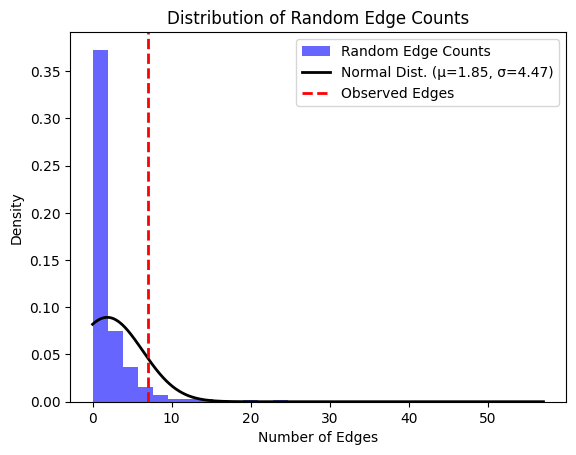

Genes mapped to membranous glomerulonephritis: 
membranous glomerulonephritis EFO_0004254
Genes mapped to membranous glomerulonephritis: 
['PLA2R1', 'HLA', 'DQA1', 'LINC02571', 'B', 'TSBP1', 'AS1', 'STK19', 'TCF19', 'RNU6', '1133P', 'C6orf15', 'PRRC2A', 'GPANK1', 'BTNL2', 'PSORS1C1', 'EHMT2', 'PPT2', 'EGFL8', 'RNF5', 'MUCL3', 'HCG21', 'SFTA2', 'FKBPL', 'PRRT1', 'DMB', 'DMA', 'POU5F1', 'NFKB1', 'DUSP22', 'IRF4', 'DRB1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to sunburn: 
sunburn EFO_0003958
Genes mapped to sunburn: 
['RPS2P1', 'ASIP', 'NTM', 'IRF4', 'TYR', 'MC1R', 'PDE4B', 'SGIP1', 'RN7SKP19', 'LINC01360', 'SLC6A17', 'ADAM30', 'NOTCH2', 'FLG', 'CCDST', 'ADAR', 'KCNN3', 'CYP1B1', 'PRKCE', 'WDPCP', 'PSMD14', 'DT', 'SEMA3F', 'AS1', 'CADM2', 'FAIM', 'PPIAP72', 'TIPARP', 'TPRG1', 'TP63', 'UVSSA', 'FAM13A', 'SLC45A2', 'PDE4D', 'MIR9', '2HG', 'PPARGC1B', 'LINC03066', 'DUSP22', 'EXOC2', 'LINC01622', 'BAK1', 'USP49', 'PRIM2BP', 'KHDRBS2', 'MMS22L

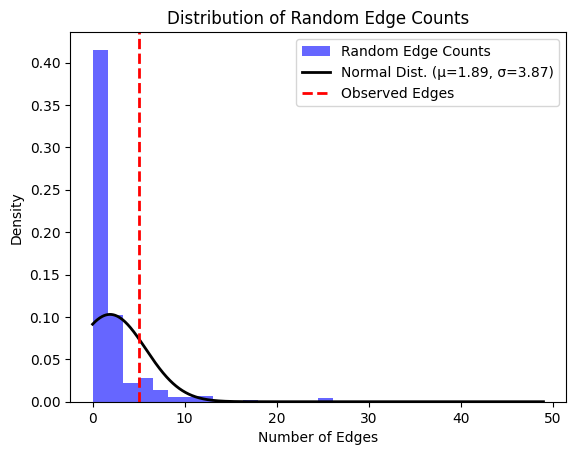

Genes mapped to skin sensitivity to sun: 
skin sensitivity to sun EFO_0004795
Genes mapped to skin sensitivity to sun: 
['RPS2P1', 'ASIP', 'TYR', 'MC1R', 'RALY', 'HERC2', 'FANCA', 'SLC45A2', 'ADAMTS12', 'IRF4', 'CHMP1A', 'RXFP3', 'DUSP22', 'ANKRD11', 'DPEP1', 'OCA2', 'LINC00385', 'KATNAL1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to atopic eczema: 
atopic eczema EFO_0000274
Genes mapped to atopic eczema: 
['EMSY', 'LINC02757', 'LINC02571', 'HLA', 'B', 'IL18R1', 'KRT8P26', 'AP5B1', 'IL13', 'TH2LCRR', 'PBX2', 'GPSM3', 'TSBP1', 'AS1', 'OR10A3', 'NLRP10', 'MIR4435', '2HG', 'GLB1', 'CCDC80', 'MAT2AP1', 'CARD11', 'SDK1', 'LINC00824', 'LINC02929', 'ALDH7A1P4', 'ADO', 'CLEC16A', 'CYP24A1', 'PFDN4', 'OVOL1', 'NFILZ', 'KIF3A', 'RPL13AP18', 'RNU6', '1213P', 'NCF4', 'ATP6V1G2', 'DDX39B', 'CCDST', 'LCE5A', 'TNXB', 'IL2', 'IL21', 'TNFRSF6B', 'RTEL1', 'LCE1F', 'LCE1E', 'CRCT1', 'LCE3E', 'RN7SL335P', 'BLTP1', 'MFN2', 'SMARCA4', 'GRM4', 'RN7SL474P', 'FGF

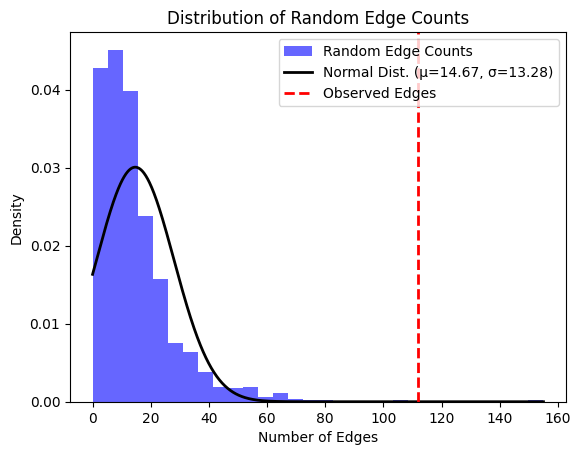

Genes mapped to idiopathic pulmonary fibrosis: 
idiopathic pulmonary fibrosis EFO_0000768
Genes mapped to idiopathic pulmonary fibrosis: 
['TERT', 'KIF15', 'MAD1L1', 'DEPTOR', 'HECTD2', 'AS1', 'RTEL1', 'TNFRSF6B', 'KANSL1', 'ATP11A', 'IVD', 'FAM13A', 'STN1', 'AKAP13', 'ZKSCAN1', 'RNU6', '637P', 'TERC', 'DPP9', 'DSP', 'MUC5AC', 'MUC5B', 'SRD5A2', 'GPRIN3', 'SNCA', 'LINC02883', 'GOSR2', 'TTYH1', 'MDGA2', 'MAPT', 'TOLLIP', 'IL9RP3', 'SPDL1', 'GPR157', 'GIPC2', 'DNAJB4', 'LINC02233', 'LINC02477', 'FKBP5', 'TPI1P2', 'CYCSP20', 'PSKH1', 'FUT6', 'FUT3', '839P', 'PHB2P1', 'KNL1', 'NPRL3', 'STMN3', 'PTPN14', 'ZNF318', 'ABCC10', 'LINC01505', 'TMEM42', 'MIR564', 'ACTRT3', 'ST6GALNAC2P1', 'FUNDC2P2', 'GOLGA6EP', 'DNM1P49', 'PCSK6', 'DAZAP1', 'TACC2', 'FGFR3P1', 'ZDHHC20P2', 'GMEB2', 'C1orf141', 'U3', 'NMNAT1P2', '281P', 'FOXP1', 'EFNA5', 'CNTNAP2', 'SFRP1', 'SNORD65B', 'ANK1', 'DLG2', 'GAPDHP70', 'GRM5', 'GRIK4', 'NRXN3', 'CEP128', 'AGBL1', '185P', 'CDYL2', 'AP2B1', 'FADS6', 'USH1G']
Random edges 

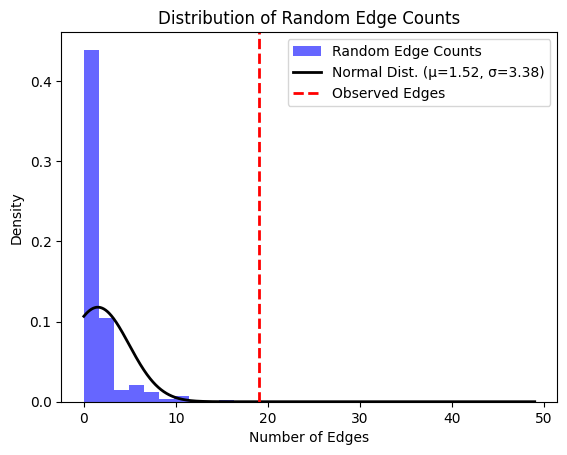

Genes mapped to lipoprotein-associated phospholipase A(2) measurement: 
lipoprotein-associated phospholipase A(2) measurement EFO_0004746
Genes mapped to lipoprotein-associated phospholipase A(2) measurement: 
['AP3B2', 'CPEB1', 'AS1', 'LPA', 'ABCG2', 'SSX2IP', 'LPAR3', 'LINC01550', 'LINC02295', 'EWSAT1', 'GLCE', 'RNF213', 'VMP1', 'SCARB1', 'GCKR', 'HERPUD1', 'CETP', 'PLA2G7', 'MS4A4A', 'MS4A4E', 'APOE', 'APOC1', 'APOB', 'CELSR2', 'PSRC1', 'ZPR1', 'APOC1P1', 'LDLR', 'TP53BP1', 'CATSPER2P1', 'FRMD5', 'GOLM2', 'SLC22A2', 'SLC22A3', 'PLG', 'TOMM5', 'OR13I1P', 'OR13C1P', 'LPL', 'SLC25A27', 'ANKRD66', 'MEP1A', 'SMARCA4', 'CYP39A1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to chronic hepatitis C virus infection: 
chronic hepatitis C virus infection EFO_0004220
Genes mapped to chronic hepatitis C virus infection: 
['OLFM1', 'LINC02907', 'HIGD1AP4', 'SCG2', 'CWH43', 'SLC22A3', 'ELF2P2', 'FOXCUT', 'COPS5P1', 'EPHA7', 'EFCAB14', 'RCC2', 'ARHGEF10L'

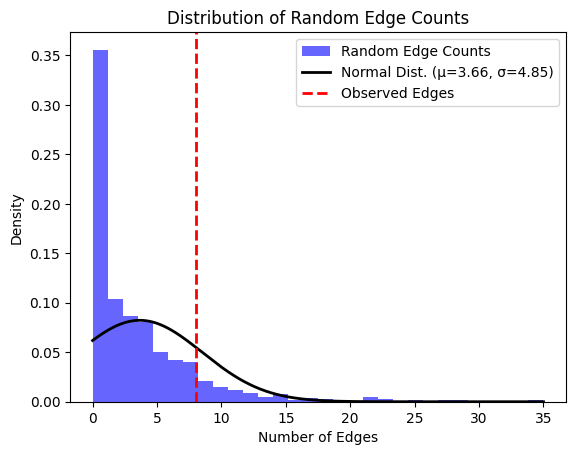

Genes mapped to age-related macular degeneration: 
age-related macular degeneration EFO_0001365
Genes mapped to age-related macular degeneration: 
['ARMS2', 'CFH', 'TNXB', 'NOTCH4', 'CFB', 'TOMM40', 'HTRA1', 'CETP', 'LINC02537', 'LINC01512', 'ALDH1A2', 'MCUB', 'COL10A1', 'NT5DC1', 'LINC00243', 'SLC16A8', 'RAD51B', 'ADAMTS9', 'AS2', 'B3GLCT', 'SKIC2', 'C3', 'SYN3', 'APOC1', 'APOC1P1', 'TNFRSF10A', 'DT', 'COL8A1', 'TGFBR1', 'NMRK2', 'DAPK3', 'RPL21P47', 'HMGN1P11', 'LINC00861', 'RNU6', '869P', 'GRM5', 'TYR', 'LINC01645', 'LINC01741', 'MIR29B2CHG', 'LINC01101', 'Y_RNA', 'KRT18P21', 'EIF3KP3', 'LINC02836', 'RN7SKP211', 'GLI3', 'MBL2', 'RAB30', 'LINC01048', 'NECTIN2', 'CLIC5', 'NELFE', 'SCPEP1', 'RNF126P1', 'LINC02112', 'ATPSCKMT', 'MCHR2', 'LINC01924', 'LINC01916', 'RREB1', 'CFI', 'HERPUD1', 'FRK', 'C2', 'AS1', 'PLA2G12A', 'APOE', 'CFHR1', 'CFHR4', 'CFHR5', 'REST', 'TRPM1', 'ABHD2', 'PLEKHA1', 'HERC2', 'THUMPD2', 'SLC8A1', 'C9', 'CD46', 'RPS4XP15', 'C12orf50', 'LINC02652', 'WAC', 'LINC0158

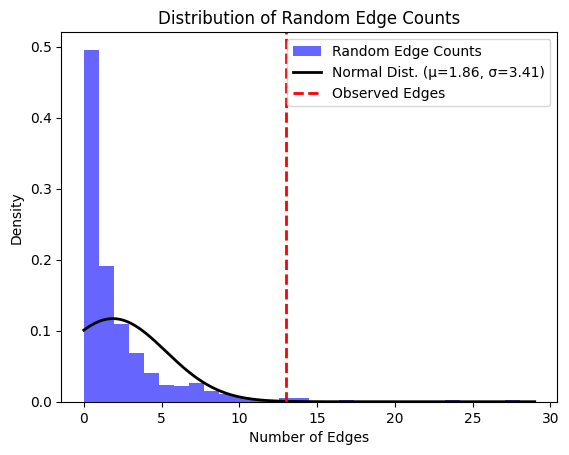

Genes mapped to essential tremor: 
essential tremor EFO_0003108
Genes mapped to essential tremor: 
['SLC1A2', 'LINGO1', 'LRRTM3', 'CTNNA3', 'CCDC91', 'FAR2', 'ZNF326', 'RNU6', '695P', 'RAB29', 'MIR3681HG', 'LINC01173', 'SH3BP4', 'STK32B', 'PPARGC1A', 'DHX15', 'SPCS3', 'MLN', 'LINC01016', 'HIP1', 'NAT2', 'PSD3', 'IQANK1', 'AACSP1', 'ESRRG', 'WWTR1', 'LSAMP', 'IGSF11', 'CASC18', 'ST13P3', 'HMGB1P5', 'FCRL4P1', 'LINC03036', 'SETP7', 'ABTB3', 'ANKLE1', 'ABHD8', 'LINC02991', 'NDUFA10', 'TTC23', 'HCG21', 'SFTA2', 'DHRS13', 'RANBP17', 'LINC02132', 'LINC01082', 'GNAI1', 'FBLN5', 'LCAL1', 'DBIP1', 'MIR924HG', 'NLRP1', 'WSCD1', 'PCDHA2', 'PCDHA1', 'Y_RNA', 'TRIO', 'JCHAINP1', 'E2F5', 'DT', 'A1CF', 'VWA5B1', 'DSCAML1', 'GUSBP5', 'ICOS', 'DSTNP5', 'KTN1', 'RPL13AP3', 'BABAM2', 'CWC22', 'SCHLAP1', 'LINC02058', 'POLD2P1', 'NR4A1', 'EHBP1', 'NFASC', 'NKAIN2', 'ZBTB20', 'RPS4XP19', 'NDUFV2', 'IL20RB', 'RNA5SP142', 'NPAS2', 'NYAP2', 'MIR5702', 'LINC02488', 'LINC02456', 'IGF1', 'TRAF4', 'FAM222B', 'LINC

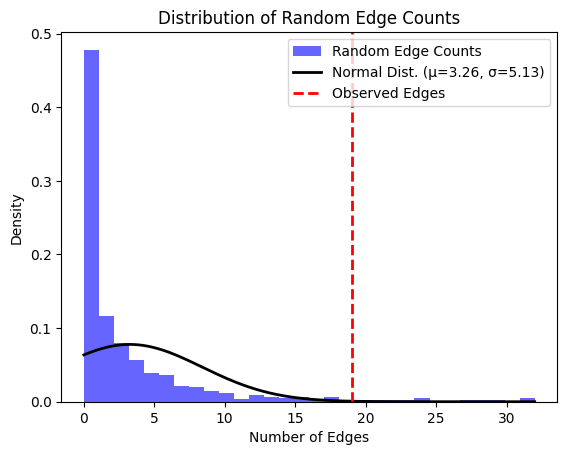

Genes mapped to pit and fissure surface dental caries: 
pit and fissure surface dental caries EFO_0006338
Genes mapped to pit and fissure surface dental caries: 
['EXOC2', 'PVALB', 'LINC03053', 'BCOR', 'INHBA', 'AS1', 'FHIT', 'PIP5K1B', 'RLIG1P3', 'RPSAP74', 'GATA2', 'LINC01565', 'RBFOX1', 'LINC02152', 'RPL12P40', 'RN7SKP182', 'MIR1321', 'SFR1P2', 'LARP1BP3', 'CCDC160', 'RN7SKP279', 'DNAJB6P1', 'PTPRD', 'PDZD8', 'EMX2OS', 'FAM110B', 'KPNA4', 'ADGRG6', 'HIVEP2', 'MPPED2', 'HAUS6P3', 'LINC02854', 'EFR3A', 'OC90', 'CNTN4']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to smooth surface dental caries: 
smooth surface dental caries EFO_0006339
Genes mapped to smooth surface dental caries: 
['PROM1', 'PPIAP21', 'RNU6', '743P', 'COX6A1P4', 'MTND4LP18', 'RLIG1P3', 'RPSAP74', 'NAMA', 'OPCML', 'ZNF827', 'Y_RNA', 'GABRP', 'AAMP', 'KCNH1', 'RNASET2', 'PDE1C', 'ITPR2', 'INTS13', 'TMEM178B', 'CAVIN3', 'SMPD1', 'PTGER2', 'TXNDC16', 'TSHR', 'ITGAL', 'RPL12P40

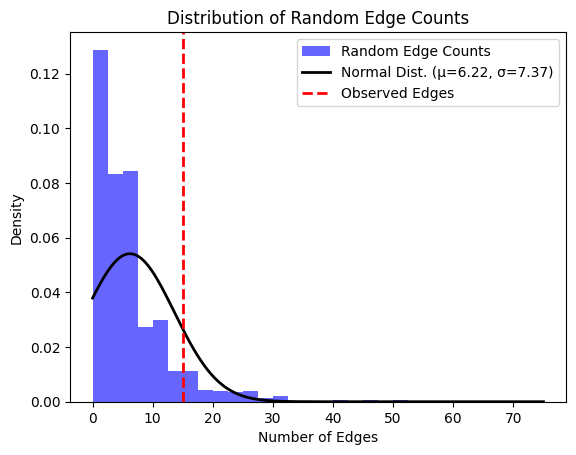

Genes mapped to migraine disorder: 
migraine disorder MONDO_0005277
Genes mapped to migraine disorder: 
['CPQ', 'TSPYL5', 'AGBL1', 'RNU6', '185P', 'IGLL1', 'DRICH1', 'MEF2D', 'U3', 'LINC01985', 'PHACTR1', 'MSL3B', 'TRPM8', 'LRP1', 'ASTN2', 'MARCHF4', 'UFL1', 'AS1', 'NT5C2', 'MMP17', 'PRDM16', 'RLIG1P3', 'RPSAP74', 'RNU4', '35P', '76P', 'INHBA', 'RABGAP1L', 'CENPF', 'GAPDHP24', 'LINC01765', 'NGF', 'SMYD3', 'LIMCH1', 'FBN2', 'LINC02587', 'LINC02153', 'LINC03093', 'SLC35D2', 'ADARB2', 'SVIL', 'JCAD', 'VSTM4', 'GFRA1', 'NBEA', '745P', 'LINC02205', 'LINC02782', 'MIR4689', 'EPB41L2', 'AKAP7', 'KLF9', 'TRPM3', 'CDKN2B', 'TFAM', 'BICC1', 'CTNNA3', 'WAPL', 'HPSE2', 'RNU7', '165P', 'PPIAP39', 'PSTK', 'FGF23', 'FGF6', 'ATF7', 'NPFF', 'LINC01440', 'SESTD1', 'RAD52P1', 'LINC02109', 'KATNBL1P4', 'LINC02118', 'POU4F3', 'TCERG1', 'NSD1', 'SUMO2P1', 'MOG', 'HCG20', 'FHL5', 'TAAR7P', 'TAAR6', 'SUGCT', 'TBXAS1', 'MAPK10', 'SV2C', 'STK10', 'ADAM7', '1213P', 'Y_RNA', 'OTUD6B', 'PTPRD', 'SORBS1', 'CDH13', '

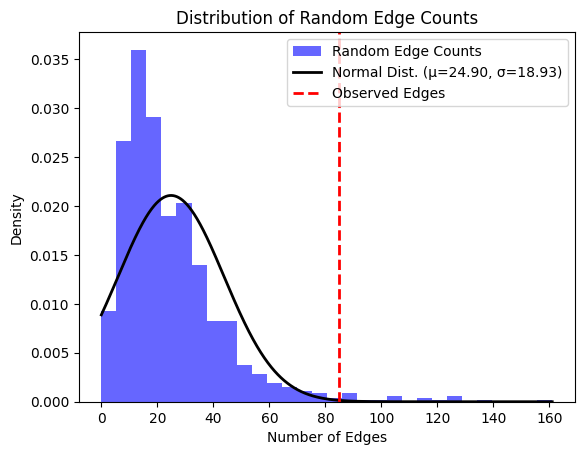

Genes mapped to carcinoid tumor: 
carcinoid tumor EFO_0004243
Genes mapped to carcinoid tumor: 
['FGF12', 'CDKAL1', 'SLC12A2', 'KIF16B']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to hypospadias: 
hypospadias EFO_0004209
Genes mapped to hypospadias: 
['DGKK', 'DENND2B', 'PKDCC', 'EML4', 'AS1', 'HAAO', 'DNAH6', 'EEFSEC', 'FTH1P21', 'LINC02272', 'EXOC3', 'KIF6', 'DAAM2', 'HOXA3', 'HOXA4', 'HOXA', 'AS2', 'TAX1BP1', 'ZNF619P1', 'HMGN1P19', 'XKR9', 'EYA1', 'CCDC26', 'KCNMA1', 'GREM1', 'MTND5P34', 'RN7SL841P', 'IRX6', 'ZFHX3', 'LINC02227', 'ADK', 'CCDC59', 'LINC00917', 'FENDRR', 'PHACTR2', 'SP7', 'SP1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to seasonal allergic rhinitis: 
seasonal allergic rhinitis EFO_0003956
Genes mapped to seasonal allergic rhinitis: 
['EMSY', 'LINC02757', 'SLC25A46', 'BCLAF1P1', 'IL2', 'LINC02177', 'EPS15', 'DNAH5', 'NPHP3', 'AS1', 'TMEM108', 'ABL2', 'HLA', 'DQB1', 'MTCO3P1',

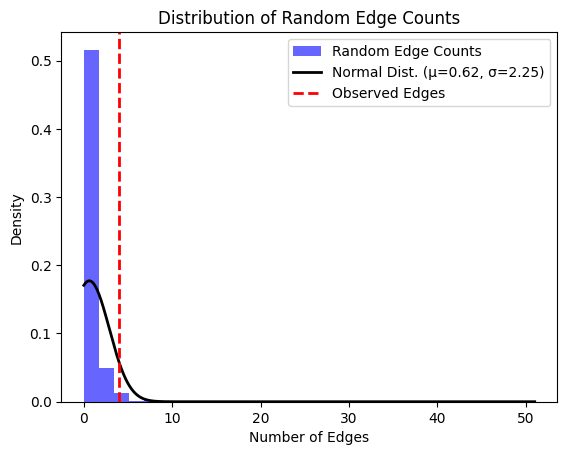

Genes mapped to neuroblastoma: 
neuroblastoma EFO_0000621
Genes mapped to neuroblastoma: 
['NBAT1', 'CASC15', 'BARD1', 'LMO1', 'HSD17B12', 'HACE1', 'LIN28B', 'SNHG31', 'NPM1P10', 'MIR670HG', 'TP53', 'RSRC1', 'CPZ', 'GPR78', 'L1TD1', 'RPTN', 'KANSL1L', 'ANO7', 'PARP8', 'MRPS18B', 'IL15RA', 'ARHGEF40', 'LRRC45', 'OR7G2', 'SALL4', 'LAMA5', 'MMP20', 'FBXO32', 'RN7SKP155', 'PVT1', 'SPINK4', 'NPAP1P6', 'LINC01507', 'SGIP1', 'NEGR1', 'RGS5', 'NUF2', 'LAMB3', 'GRID1', 'TRIM5', 'TRIM22', 'CEP295', 'LINC02443', 'EMP1', 'LINC01559', 'PDZRN4', 'KRT5', 'KRT71', 'RNU1', '117P', 'LINC02458', 'LHX5', 'AS1', 'LINC01234', 'ANKRD26P2', 'STOML3', 'MAPK1IP1L', 'LGALS3', 'VRK1', 'MTND5P40', 'RNU6', '1014P', 'CA12', 'MYHAS', 'MYH13', 'MALT1', 'CRIM1', 'TMEM72', 'TMEM123', 'MMP7', 'HTR2A', 'GNG5P5', 'NYNRIN', 'HSBP1', 'MLYCD', 'ASAP2', 'GREB1', 'TDRD15', 'NUTF2P8', 'ACTG1P22', 'VRK2', 'HNRNPKP2', 'UBBP1', 'LINC00261', 'RNU7', '6P', 'ZFP64', 'SAMSN1', 'POLR2CP1', 'FHIT', 'LSAMP', 'LINC03051', 'KALRN', 'LINC028

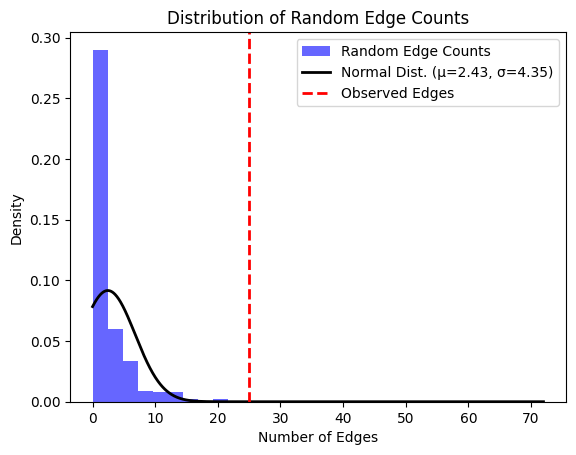

Genes mapped to alpha macroglobulin measurement: 
alpha macroglobulin measurement EFO_0004815
Genes mapped to alpha macroglobulin measurement: 
['TARID']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to sex hormone-binding globulin measurement: 
sex hormone-binding globulin measurement EFO_0004696
Genes mapped to sex hormone-binding globulin measurement: 
['OSBPL1A', 'POLR2A', 'SHBG', 'ATP1B2', 'LINC02161', 'MIR3660', 'SNED1', 'MTERF4', 'U3', 'NMNAT1P2', 'CCDC182', 'RN7SKP94', 'ROBO2', 'CAP1P1', 'MIR6078', 'LINC00702', 'FTO', 'LINC01661', 'PRMT6', 'GCKR', 'LINC02986', 'RPSAP47', 'JMJD1C', 'NR2F2', 'AS1', 'CRIPTO3', 'M6PRP1', 'UGT2B15', 'UGT2B10', 'ZNF652', 'FOXN2', 'PPP1R21', 'DT', 'BAIAP2L1', 'SLCO1B1', 'TP53', 'CD68', 'MPDU1', 'CUX2', 'NTNG1', 'CCND2', 'KPNB1', 'SLC22A3', 'FOXA3', 'IRF2BP1', 'KLHL8', 'MIR5705', 'COBLL1', 'LINC02490', 'WDR72', 'ZBTB10', 'SERPINA1', 'HNF4A', 'AKR1C4', 'CATSPER2P1', 'C5orf67', 'THRB', 'HPN', 'PNPLA3', 'SREBF1',

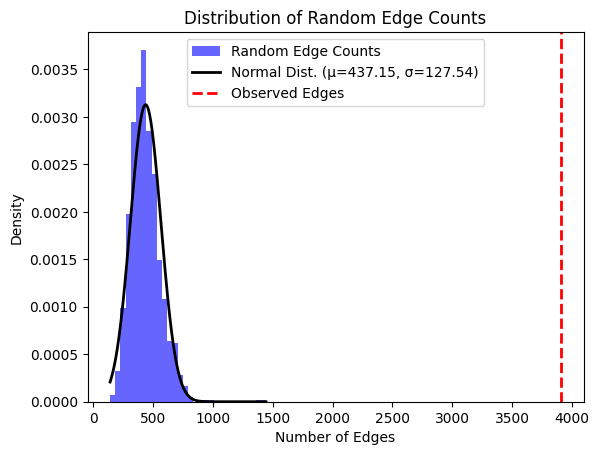

Genes mapped to leptin measurement: 
leptin measurement EFO_0005000
Genes mapped to leptin measurement: 
['DOCK2', 'LINC00656', 'RB1CC1', 'NPBWR1', 'SPTB', 'CSAD', 'NOX5', 'SPESP1', 'RN7SL282P', 'ARHGAP28', 'AS1', 'PDZD2', 'PATJ', 'C1orf94', 'MIR552', 'TP63', 'RPL38P4', 'GPR15', 'HLA', 'DRB1', 'DQA1', 'CHN2', 'CPVL', 'OPCML', 'LINC02743', 'ST20', 'MTHFS', 'GNA13', 'RGS9', 'LINC02987', 'MAN1A2P1', 'ADGB', 'DCUN1D1', 'MCCC1', 'SORCS1', 'ACO2P1', 'LINC02885', 'CPNE4', 'TFAM', 'BICC1', 'PGDP1', 'RNF125', 'SMOC2', 'SLIT3', 'ELOA', 'DNAH8', 'RN7SKP167', 'FGFR2', 'GCKR', 'MIR129', '1', 'LEP', 'LINC00880', 'ARHGAP40', 'Metazoa_SRP', 'COBLL1', 'FTO', 'KLF14', 'LINC', 'PINT', 'ZNF800', 'LRP1B', 'UBE2V1P14', 'PRSS37', 'OR9A3P', 'RSL24D1P4', 'SEPTIN14P21', 'ALG10', 'TUBB8P4', 'HSFY1P1', 'GPM6BP3', 'RNA5SP94', 'MIR4432HG', 'DRD1', 'SFXN1', 'NRXN3', 'RBM28']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to CCL2 measurement: 
CCL2 measurement EFO_0004749
Gen

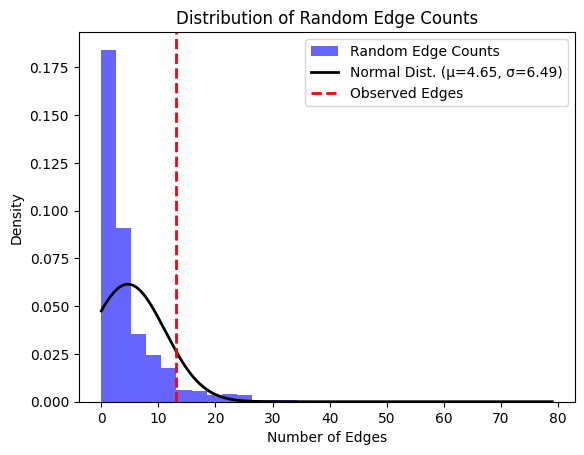

Genes mapped to psoriasis: 
psoriasis EFO_0000676
Genes mapped to psoriasis: 
['SDC4', 'SYS1', 'UBBP4', 'REL', 'DT', 'FBXL19', 'PRORP', 'NOS2', 'SPATA2', 'RPS26', 'ERBB3', 'LINC02571', 'HLA', 'B', 'KCNH7', 'SATB1', 'AS1', 'ERAP1', 'CAST', 'MFSD4B', 'REV3L', 'TYK2', 'IL12B', 'TNFAIP3', 'LCE3E', 'LCE3D', 'IFNLR1', 'GRHL3', 'PSMA6', 'RPLP0P3', 'IL23R', 'STAT2', 'RNF114', 'RPL3P2', 'WASF5P', 'TRAF3IP2', 'LINC01845', 'TNIP1', 'ANXA6', 'C1orf141', 'TH2LCRR', 'IL13', 'UBLCP1', 'TSC1', 'PSORS1C3', 'HCG27', 'COG6', 'HCP5', 'RAP1GAP2', 'NONOP2', 'ZGLP1', 'LINC01882', 'PTPN2', 'UNC13C', 'RSL24D1', 'CHST8', 'BLTP1', 'AKAP8P1', 'JKAMPP1', 'PRR5L', 'STEAP2', 'TGM3', 'R3HCC1L', 'KPNA3', 'QTRT1', 'ABHD5', 'RNU6', '367P', 'ELMO1', 'ACO1', 'SLIT3', 'LINC03004', 'EXOC2', 'BTD', 'LINC02539', 'WAKMAR2', 'MLXIP', 'LRRC43', 'ICAM5', 'U3', 'LARS2', 'CSMD1', 'LINC02699', 'ANO3', 'LINC02227', 'EBF1', 'GUSBP18', 'RAI14', 'LINC02429', 'ADAM19', 'ETS2', '991P', 'SLC45A1', 'PRKRA', 'CHROMR', 'CCDST', 'RASIP1', 'RAD

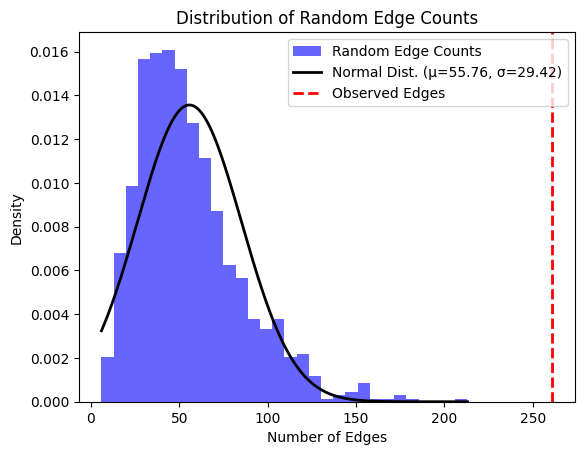

Genes mapped to ankylosing spondylitis: 
ankylosing spondylitis EFO_0003898
Genes mapped to ankylosing spondylitis: 
['ZP3P1', 'EDIL3', 'ANO6', 'AKAP6', 'NPAS3', 'CSF2RB', 'CCDC162P', 'IL23R', 'IL1R2', 'IL1R1', 'LINC02940', 'RPL23AP12', 'RN7SL51P', 'RN7SL18P', 'ERAP1', 'HLA', 'B', 'RNU6', '283P', 'LINC01934', 'MALRD1', 'ANTXR2', 'MICA', 'AS1', 'IL12B', 'LINC01845', 'LTBR', 'RPL31P10', 'RNU1', '150P', 'TTC33', 'CARD9', 'SNAPC4', 'KPNB1', 'TBKBP1', 'KIF21B', 'RUNX3', 'MIR4425', 'LINC03043', 'POT1', 'UBE2L3', 'FGFR3P1', 'HCG9', 'POLR1HASP', 'INAVA', 'GPSM1', 'TNFRSF1A', 'EFCAB13', 'DT', 'NPEPPS', 'BACH2', 'ZMIZ1', 'GOT1', 'LINC01475', 'ERAP2', 'NOS2', 'IL6R', 'FCGR2A', 'GPR35', 'SH2B3', 'LINC01147', 'LYRM9', 'CDC37', 'GATD3', 'HHAT', 'EOMES', 'LINC01980', 'IL7R', 'CAPSL', 'DNAJB6P4', 'IL12RB2', 'x', 'LINC02571', 'LINC01149', 'HCP5', 'ACTR2', 'HS3ST1', 'LINC02360', 'USP8', 'ADAM7', 'OTX2P1', 'PCSK5', 'GBA3', 'RFPL4AP3', 'RPS18P12', 'LINC02096', 'CHSY1', 'MYOM2', 'LINC03021', 'KRT8P20', 'CF

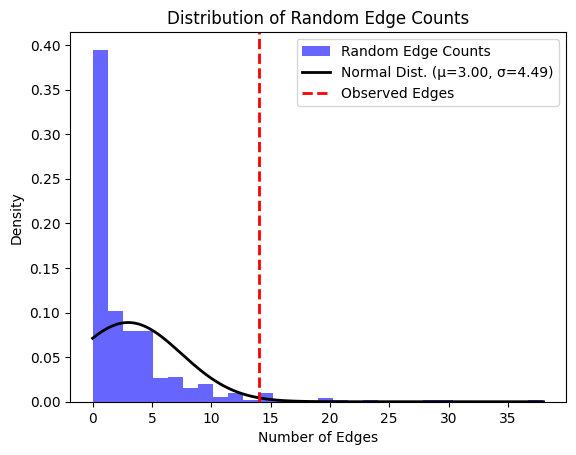

Genes mapped to ICAM-1 measurement: 
ICAM-1 measurement EFO_0004520
Genes mapped to ICAM-1 measurement: 
['LIMASI', 'ICAM1', 'ICAM4', 'AS1', 'ABO', 'GTF2B', 'Y_RNA', 'SLC22A23', 'PSMG4', 'SYT4', 'RNA5SP455', 'SGCZ', 'RNU6', '92P', 'ST13P7', 'TYK2', 'CDC37', 'ZGLP1', 'MRPL4', 'PDE4A', 'FDX2', 'RAVER1', 'EIF3G', 'DNMT1', 'S1PR5', 'ICAM5', 'ICAM3', 'ATG4D']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to early onset hypertension: 
early onset hypertension EFO_0004772
Genes mapped to early onset hypertension: 
['LINC01320']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to conduct disorder: 
conduct disorder EFO_0004216
Genes mapped to conduct disorder: 
['RPS3AP1', 'LINC00320', 'PGBD5', 'LINC01737', 'PLUT', 'ATP8B1', 'PKD1L3', 'LINC01648', 'MATN1', 'LINC01320', 'RGL1', 'HRAT17', 'NALF1', 'LIG4', 'PKD1L2', 'ETV3', 'LINC02772', 'KIAA2012', 'AS1', 'FSTL4', 'WSPAR', 'LINC02668', 'NOVA1', 'DT', 'LINC02294', '

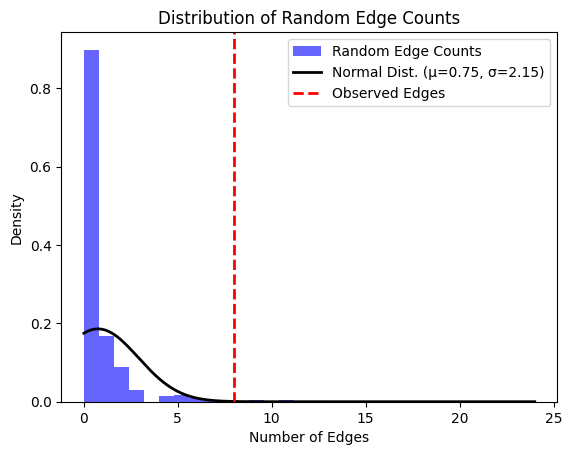

Genes mapped to osteoporosis: 
osteoporosis EFO_0003882
Genes mapped to osteoporosis: 
['MECOM', 'ALDH7A1', 'RNU6', '99P', 'LRRC4C', 'TBC1D8', 'OSBPL1A', 'SPP2', 'RPS20P12', 'KRT18P57', 'RAP1A', 'TNFRSF11B', '12P', 'DOK6', 'HIGD1AP4', 'SCG2', 'SOX6', 'FTCDNL1', 'HPRT1P2', 'RPL19P11', 'UBE2R2', 'AS1', 'UBAP2', 'TNFSF11', 'FAM216B', 'IDH3A', 'ADGRV1', 'LUCAT1', 'PPIAP34', 'ZBTB40', 'WLS', 'GNG12', 'THORLNC', 'LINC01956', 'CSRNP3', 'GALNT3', 'RPS27P4', 'MRPS31P1', 'NICN1', 'RNA5SP130', 'MEPE', 'HSP90AB3P', 'RSPO3', 'MUC22', 'HCG22', 'HLA', 'DRB9', 'DRB5', 'WNT16', 'SFRP4', 'STARD3NL', 'SEM1', 'LRP5', 'DDN', 'SP7', 'SP1', 'SMOC1', 'AXIN1', 'LINC01700', 'LINC02940', 'MXRA8', 'AURKAIP1', 'CDC42SE1', 'STK39', 'CCDC170', 'FAM3C', 'HOXC4', 'HOXC6', 'LINC02554', 'CPMER', 'TNFRSF11A', 'LINC02341', 'AQP1', 'CYP19A1', 'MIR4713HG', 'DQA1', 'DRB1', 'HROB', 'SPP1']
Random edges calculation completed

z score: 3.0605021069758767



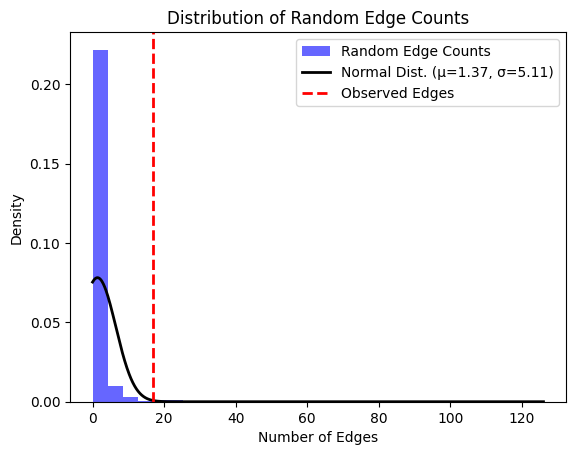

Genes mapped to biliary atresia: 
biliary atresia MONDO_0008867
Genes mapped to biliary atresia: 
['ADD3', 'AS1', 'RN7SKP289', 'HOXC13', 'AS', 'LINC00297', 'EFEMP1', 'COX6A1P1', 'LINC01781', 'SERTAD4', 'ST13P19', 'LNCBRM', 'TMEM147', 'LINC01708', 'PAH', 'RNU7', '88P', 'DIAPH3', 'EDN3', 'LINC01899', 'CBLN2', 'LINC00705', 'MANCR', 'SCN1A', 'SCN9A', 'AFAP1', 'KC6', 'TUSC3', 'UMAD1', 'GLIS3', 'RP1', 'RPL7AP40', 'AP1S2P1', 'MAP1LC3C', 'TUBB8P6', 'VAV1', 'ADGRE1', 'MTHFD2P4', 'TOMM22P4', 'RNF32', 'DT', 'AACSP1', 'ZNF354B', 'CSNK1A1', 'ANKFN1', 'GDNF', 'PTPRD', 'NKAIN2', 'GPAM', 'TECTB', 'RAB20', 'PATJ', 'LINC02198', 'VWA7']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to stroke: 
stroke EFO_0000712
Genes mapped to stroke: 
['LINC01438', 'HDAC9', 'ADAMTS2', 'ADAMTS12', 'TRIM29', 'TWIST1', 'ZFHX3', 'SPSB4', 'ASB3', 'ALDH2', 'IMPA2', 'LINC00458', 'CRYBG1', 'LINC02587', 'NINJ2', 'AS1', 'LINC02455', 'NAA25', 'PITX2', 'ERRFI1', 'DT', 'PARK7', 'SHISA6', '

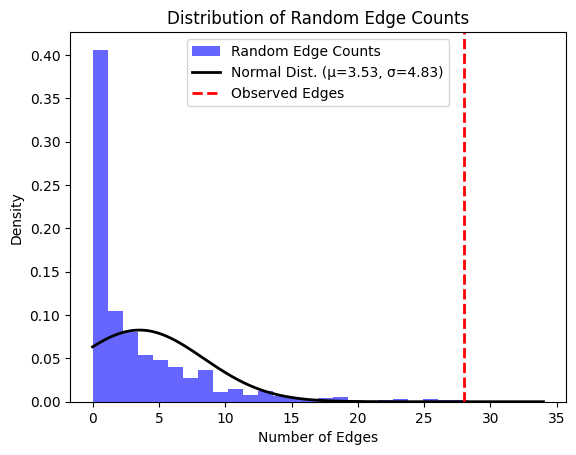

Genes mapped to Keloid: 
Keloid EFO_0004212
Genes mapped to Keloid: 
['NEDD4', 'HYAL1', 'HYAL2', 'FOXL2NB', 'PRR23A', 'LINC01705', 'QRSL1P2', 'PHLDA3', 'PRTG', 'U3', 'GPC1', 'BPESC1', 'MRPS22', 'ITGA11', 'CORO2B', 'SLC22A18AS', 'FRMD4A', 'AS1', 'TAFA2', 'LINC02871', 'RPS11P1', 'CSF2RB']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to creatine kinase measurement: 
creatine kinase measurement EFO_0004534
Genes mapped to creatine kinase measurement: 
['CD163', 'GAPDHP31', 'CKM', 'LILRB5', 'CPN1', 'ANO5', 'CD163L1', 'LINC00393', 'CSF1', 'IQGAP3', 'SPATA31H1', 'BIN1', 'NIFKP9', 'NEB', 'CAND2', 'LINC01094', 'CFAP53P1', 'INTS6P1', 'HBEGF', 'LINC02227', 'EBF1', 'BVES', 'RNA5SP214', 'VGLL2', 'SNX13', 'UBAP1', 'ABO', 'MYPN', 'BORCS7', 'ASMT', 'CNNM2', 'NPM1P31', 'ZRANB1', 'GAB2', 'AKAP6', 'RNU6', '1307P', 'LILRB2', 'PSMA6', 'RPLP0P3', 'SAMD4A', 'NMB', 'PSMD3', 'CSF3', 'APOH', 'LINC01993', 'SOCS3', 'PEPD', 'BACH1', 'HORMAD2', 'MRTFA', 'SPANXN3', 'SLITRK

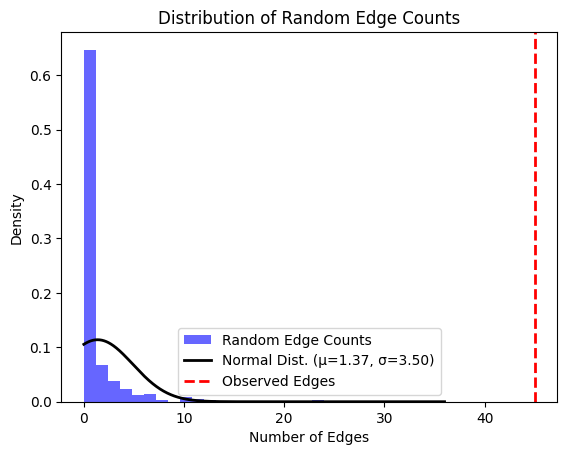

Genes mapped to Graves disease: 
Graves disease EFO_0004237
Genes mapped to Graves disease: 
['TG', 'LINC01550', 'LINC02295', 'C1QTNF6', 'CTHRC1P1', 'KIF4CP', 'SLAMF6', 'ABO', 'FCRL3', 'CTLA4', 'MICA', 'AS1', 'RHOH', 'LINC02265', 'RNU6', '1133P', 'C6orf15', 'HLA', 'DQB1', 'MTCO3P1', 'DPA2', 'BACH2', 'RNASET2', 'MIR3939', 'TSHR', 'TSBP1', 'POLR1HASP', 'PRR3', 'ABCF1', 'MUC22', 'ITPR3', 'LINC01016', 'VAV3', 'LINC02498', 'MIR572', 'TDRD6', 'SLC25A27', 'STARP1', 'HNRNPA3P5', 'PIK3R5', 'DT', 'NTN1', 'LSAMP', 'MMEL1', 'MIR3681HG', 'LPP', 'LNCRNA', 'IUR', 'FAM76B', 'PRICKLE1', 'PRSS36', 'NDUFA3P6', 'PTPN22', 'AP4B1', 'ICOS', 'IL2RA', 'VDAC1P9', 'VANGL2', 'STAT4', 'CEP43', 'CCR6', 'DPA1', 'BLTP3A', 'JAZF1', 'CASC19', 'PCAT1', 'ARID5B', 'ALDH2', 'SETD1A', 'MAFTRR', 'LINC01229', 'RPL13P2', 'CD40', 'UBASH3A', 'IGLV3', '22', '21', 'MAGT1', 'P2RY10', 'P2RY10BP', 'ACAD10', 'FBXL19', 'TAF9B', 'FNDC3CP', 'GPR174', 'ANKS1A', 'TCP11', 'MYL2', 'LINC01405', 'LINC01756', 'LINC01648', 'DTWD2', 'DQA1', 'PCLO

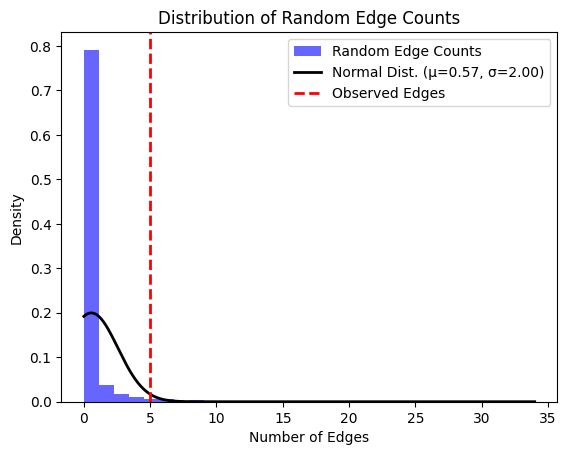

Genes mapped to mental or behavioural disorder: 
mental or behavioural disorder EFO_0000677
Genes mapped to mental or behavioural disorder: 
['RBFOX1', 'LINC00343', 'RNA5SP38', 'HNRNPA3P3', 'RN7SL727P', 'MAD1L1', 'RIN2', 'DDX52', 'HNF1B', 'SNX8', 'LINC02151', 'LINC02702', 'COL28A1', 'B4GALT1', 'AS1', 'SPINK4', 'LINC00598', 'LINC02313', 'ZFAND2AP2', 'RFX2', 'GPC6', 'RARB', 'KAT2B', 'LINC02906', 'SGO1', 'TPT1P9', 'LINC02578', 'LINC02694', 'SYT6', 'MRPL57P1', 'FAM81A', 'KRTAP4', '7', '8', 'VAT1L', 'ATP8A2', 'BSNDP4', 'RNU6', '417P', 'CMYA5', 'LINC01455', 'ADAMTS6', 'MIR548H4', 'STMN4', 'BAGE2', 'LINC02063', 'LINC02114', 'NALCN', 'ADH5P2', 'HMGB1P18', 'LINC01724', 'HAPSTR2', 'EEDP1', 'RPL9P21', 'TMEM72', 'LINC00558', 'LINC01300', 'GPR20', 'MROH4P', 'ARC', 'GSN', 'STOM', 'SYNDIG1', 'LINC02967', 'CNTNAP2', 'SLC39A12', 'CACNB2', 'SLC35F4', 'MIR3681HG', 'Y_RNA', 'RNF32', 'DT', 'ATP6V1B2', 'PAQR5', 'NREP', 'LINC02872', 'DAPK1', 'LINC01602', 'ATG4AP1', 'POU3F4', 'BCAS1', 'LINC02713', 'CNTN5', 'E

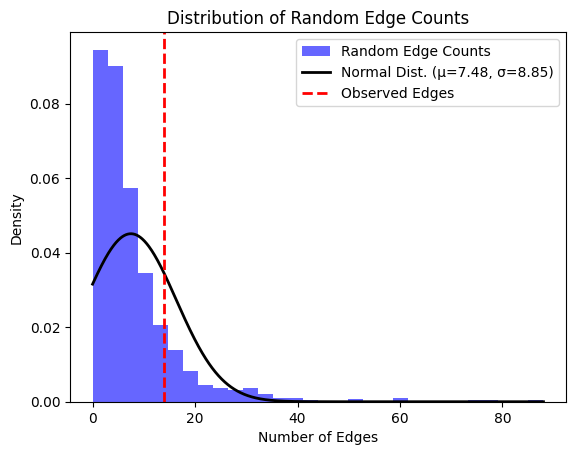

Genes mapped to albumin:globulin ratio measurement: 
albumin:globulin ratio measurement EFO_0005128
Genes mapped to albumin:globulin ratio measurement: 
['GALNT2', 'LINC03066', 'DUSP22', 'SLC31A1', 'FADS2', 'FADS1', 'TNFRSF13B', 'AFF3', 'LINC01104', 'IL1R1', 'ACOXL', 'CXCR4', 'HNRNPKP2', 'LSAMP', 'IGSF11', 'ST6GAL1', 'LINC01094', 'NFKB1', 'EGF', 'DAB2', 'FCHO2', 'ELL2', 'ZFP57', 'HLA', 'F', 'AS1', 'LINC02571', 'B', 'TXLNB', 'CITED2', 'CCR6', 'STEAP1B', 'SPMIP7', 'IKZF1', 'FAM167A', 'BLK', 'EEIG1', 'NAIF1', 'KRT8P26', 'AP5B1', 'FCHSD2', 'Y_RNA', 'ETS1', 'FLI1', 'TRAF3', 'RBFOX1', 'ATXN2L', 'TNFSF13', 'TNFSF12', 'LINC01978', 'TBC1D16', 'BCL2', 'HORMAD2', 'ARHGAP4', 'RPL31P11', 'FCRLA', 'REPS1', 'LINC02098', 'MPRIP', 'PRRC2A', 'DPB1', 'MPHOSPH9', 'RUNX3', 'ENSA', 'RPSAP17', 'IL6R', 'RN7SL466P', 'ATF6', 'DT', 'GCKR', 'SPATA31H1', 'RASGRP3']
Random edges calculation completed

z score: 3.167296160548501



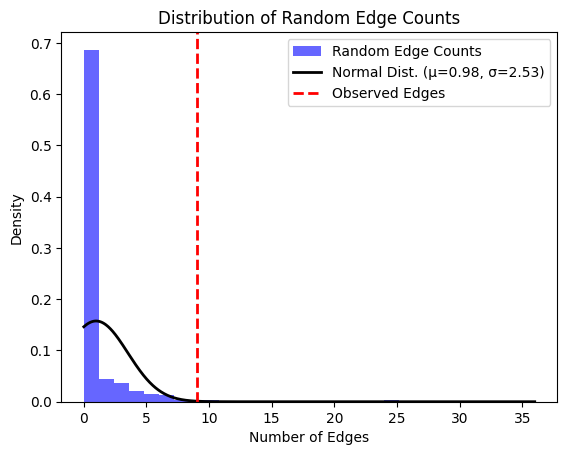

Genes mapped to nodular sclerosis Hodgkin lymphoma: 
nodular sclerosis Hodgkin lymphoma EFO_0004708
Genes mapped to nodular sclerosis Hodgkin lymphoma: 
['TSBP1', 'AS1', 'HLA', 'DRA', 'DRB1', 'DQA1', 'DRB9', 'FKBPL', 'PRRT1', 'LPP', 'THEMIS', 'PTPRK', 'AHI1', 'GATA3', 'UPF3A', 'CLEC16A']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to survival time, melanoma: 
survival time, melanoma EFO_0000756
Genes mapped to survival time, melanoma: 
['CTXND2', 'PARP1', 'FTO', 'LINC02627', 'AFG3L1P', 'MTAP', 'PLA2G6', 'CDK10', 'TYR', 'PIGU', 'MX2', 'FLACC1', 'CASP8', 'ATM', 'CLPTM1L', 'SLC45A2', 'LINC03002', 'ANXA9', 'LINC01505', 'TERT', 'AHR', 'MC1R', 'LINC02218', 'MYH7B', 'STN1', 'OCA2', 'LINC01488', 'CCND1', 'RALY', 'IRF4', 'EXOC2', 'RMDN2', 'AS1', 'CDKAL1', 'LUCAT1', 'ADGRV1', 'GRM5', 'TIPARP', 'SRPK2', 'RPS3AP7', 'CHMP4B', 'TPM3P2', 'LINC03005', 'LINC02674', 'RAB11FIP2', 'C11orf65', 'SPG7', 'MMP24', 'MMP24OS', 'ZBTB46', 'CDKN2A', 'CDKN2B', 'ZNF276', '

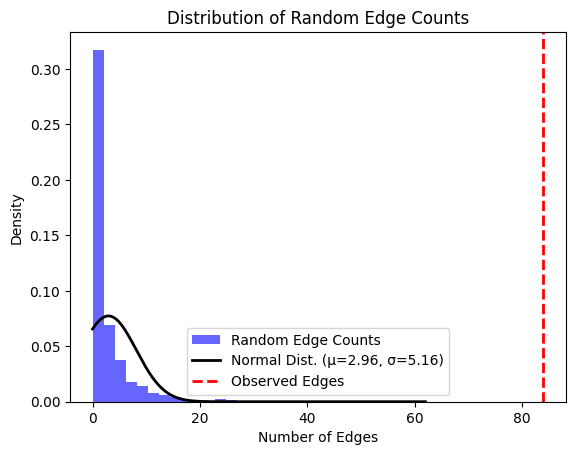

Genes mapped to renal sinus adipose tissue measurement: 
renal sinus adipose tissue measurement EFO_0004864
Genes mapped to renal sinus adipose tissue measurement: 
['CHD1', 'DT', 'LINC02113', 'TIAM1', 'SLC15A4', 'GLT1D1', 'TJP2', 'TMEM244', 'L3MBTL3', 'GPC6', 'FDX1', 'ARHGAP20', 'LINC02772', 'FCRL5']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to femoral neck bone geometry: 
femoral neck bone geometry EFO_0004511
Genes mapped to femoral neck bone geometry: 
['HK2', 'UMOD', 'LINC02063', 'LINC02114', 'RUNX1', 'FGFR4', 'NSD1', 'CCDC91', 'PPP6R3', 'GAL']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to arylesterase enzyme measurement: 
arylesterase enzyme measurement EFO_0005126
Genes mapped to arylesterase enzyme measurement: 
['PON1', 'PON3']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to HVA measurement: 
HVA measurement EFO_0005131
Genes mapped to HVA me

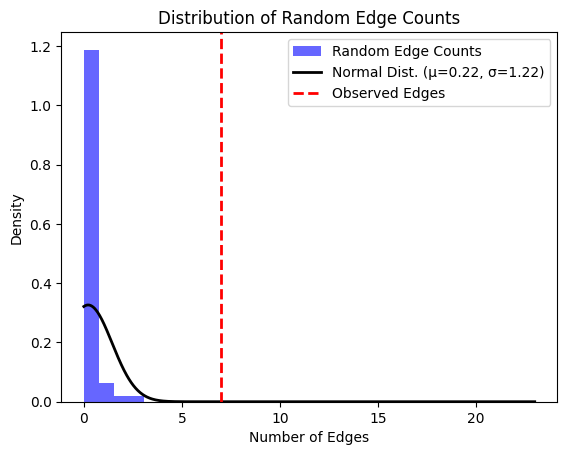

Genes mapped to orofacial cleft: 
orofacial cleft MONDO_0000358
Genes mapped to orofacial cleft: 
['OR2AH1P', 'TMEM230P2', 'GRM7', 'FHIT', 'RN7SL155P', 'KLHL26', 'LRRC7', 'PAK1', 'SPATA13', 'SVIL', 'JCAD', 'LINC01163', 'BMP6', 'SH3BP4', 'RASGRF2', 'LINP1', 'LINC02665', 'TXNDC16', 'ATXN3', 'MRM1', 'LHX1', 'DT', 'ABCA4', 'SHTN1', 'CCDC26', 'LINC01080', 'NTN1', 'GACAT3', 'CYRIA', 'LINC02832', 'LINC01803', 'GREM1', 'FMN1', 'ACOT12', 'PRR5', 'ARHGAP8', 'BEST3', 'ZFHX4', 'AS1', 'LINC02235', 'LINC02839', 'SEMA4D', 'ZIC2', 'CMSS1', 'FILIP1L', 'EPHA3', 'MTCO2P6', 'CADM1', 'IRF6', 'NOG', 'C17orf67', 'LINC01370', 'MAFB', 'PAX7', 'THADA', 'SOX5P1', 'DCAF4L2', 'TPM1', 'AS']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to progression free survival, glioma: 
progression free survival, glioma EFO_0005543
Genes mapped to progression free survival, glioma: 
['TERT', 'CDKN2B', 'AS1', 'RTEL1', 'TNFRSF6B', 'RAVER2', 'NICN1', 'RNA5SP130', 'SEC61G', 'DT', 'EGFR', '

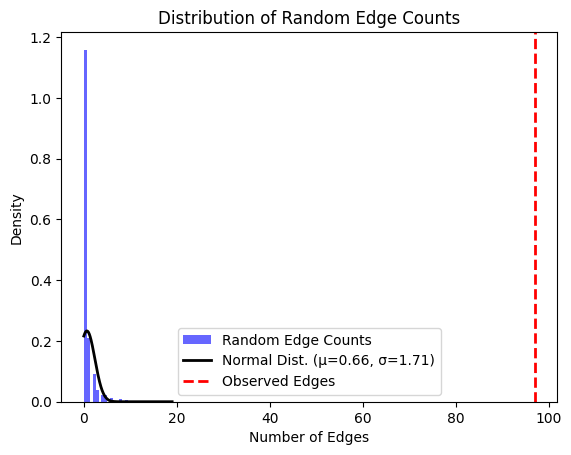

Genes mapped to lumbar disc degeneration: 
lumbar disc degeneration EFO_0004994
Genes mapped to lumbar disc degeneration: 
['PPP1R2P1', 'HLA', 'Z', 'CSMD1', 'GPC6', 'CRBN', 'SUMF1', 'PRKN', 'MYH14', 'PFKP', 'STOX1', 'PIGQ', 'LINC02664', 'ZEB1', 'AS1', 'RAB40C', 'LINC02541', 'MARCKS', 'AMD1P4', 'HIVEP1', 'ARL8B', 'SLC26A7', 'RN7SKP231', 'EYS', 'PDGFDDN', 'CHST3', 'SPOCK2', 'SMAD3', 'EEF1A1P11', 'RN7SL831P', 'PTHLH', 'CCDC91', 'FER1L5', 'DDX39AP1', 'SNORD36']
Random edges calculation completed

z score: 4.345158938447013



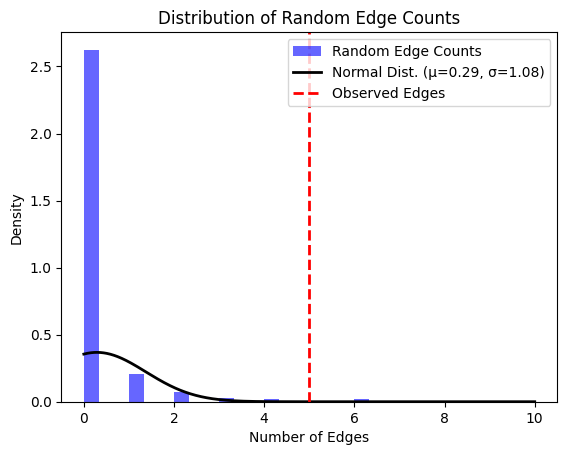

Genes mapped to HPV seropositivity: 
HPV seropositivity EFO_0004510
Genes mapped to HPV seropositivity: 
['HLA', 'DQB1', 'MTCO3P1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to neonatal systemic lupus erythematosus: 
neonatal systemic lupus erythematosus EFO_0004537
Genes mapped to neonatal systemic lupus erythematosus: 
['ERG', 'LINC00114', 'RPL6P25', 'SLC6A15', 'MANCR', 'LINC00705', 'RNU6', '983P', 'LINC01724', 'HCP5', 'MICB', 'DT']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to azoospermia: 
azoospermia EFO_0000279
Genes mapped to azoospermia: 
['HLA', 'DRA', 'LINC01677', 'MTATP6P14', 'PLCH2', 'SOX5', 'CKAP2LP1', 'SIRPA']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to periodontitis: 
periodontitis EFO_0000649
Genes mapped to periodontitis: 
['RNU4', '77P', 'KCNK1', 'PKN2', 'AS1', 'RUNX2', 'CLIC5', 'Y_RNA', 'CARS1P2', 'CAMTA1', 'LINC01220', 'JDP2', 

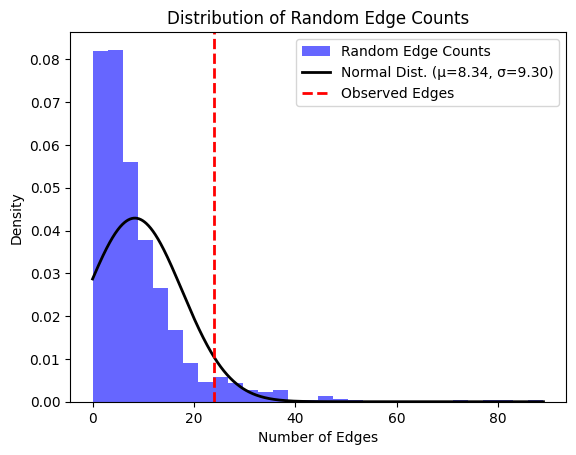

Genes mapped to Dengue Hemorrhagic Fever: 
Dengue Hemorrhagic Fever EFO_0004227
Genes mapped to Dengue Hemorrhagic Fever: 
['MICB', 'RP1', 'PLCE1', 'RBFOX1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to myeloperoxidase measurement: 
myeloperoxidase measurement EFO_0005243
Genes mapped to myeloperoxidase measurement: 
['CFH', 'NOTCH4', 'SIRPB2', 'GALNT2', 'ATP6V1B2', 'SMG8', 'MPO', 'TSPOAP1', 'HMGN2P19', 'TAF5L', 'NUCB2', 'BCAS3', 'ACTA1', 'NUP133', 'CCDC26', 'RRBP1', 'HSH2D', 'RPN1', 'MED24', 'TNXB', 'RAD51C', 'PPM1E', 'THADA']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to hypersomnia: 
hypersomnia EFO_0005246
Genes mapped to hypersomnia: 
['RNA5SP94', 'MIR4432HG', 'NCKAP5', 'LINC02895', 'PTPA', 'LINC02112', 'PLD5', 'RSL24D1P4']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to venous thromboembolism: 
venous thromboembolism EFO_0004286
Genes mapped to 

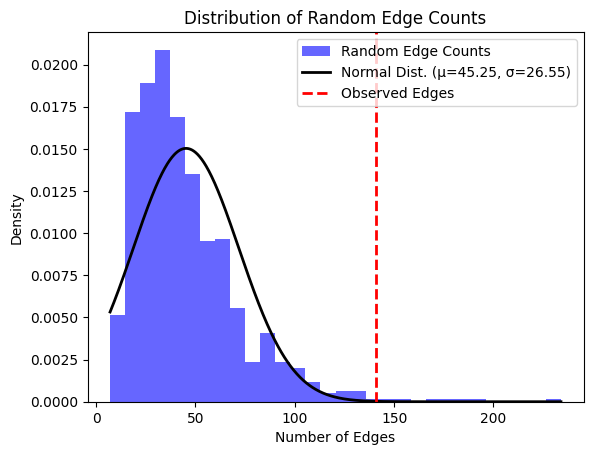

Genes mapped to drug dependence: 
drug dependence EFO_0003890
Genes mapped to drug dependence: 
['GNG5P5', 'RN7SL700P', 'ELAC2', 'LINC02093', 'NELL1', 'ANO5', 'MGAT5B', 'Metazoa_SRP', 'LINC02549', 'SNX9', 'SYNJ2', 'NCK2', 'NFASC', 'PKNOX2', 'YAE1', 'DT', 'KAT2B', 'RMI2', 'LITAF', 'ADH5P2', 'HMGB1P18', 'NRXN1', 'UBE2V1P14', 'RRN3P4', 'OFCC1', 'RPL7AP36', 'CPVL', 'RPL9P21', 'TMEM72', 'AS1', 'SLC25A16', 'GNAO1', 'DPP10', 'MTCYBP39', 'HMGB1P47', 'RNA5SP182', 'ARL14EP', 'RSAD1', 'MYCBPAP']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to lung carcinoma, asbestos exposure measurement: 
lung carcinoma, asbestos exposure measurement EFO_0004806
Genes mapped to lung carcinoma, asbestos exposure measurement: 
['PTH2R', 'PPL']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to cardiovascular disease: 
cardiovascular disease EFO_0000319
Genes mapped to cardiovascular disease: 
['LINC01344', 'TBC1D7', 'GFOD1', 'MEPE

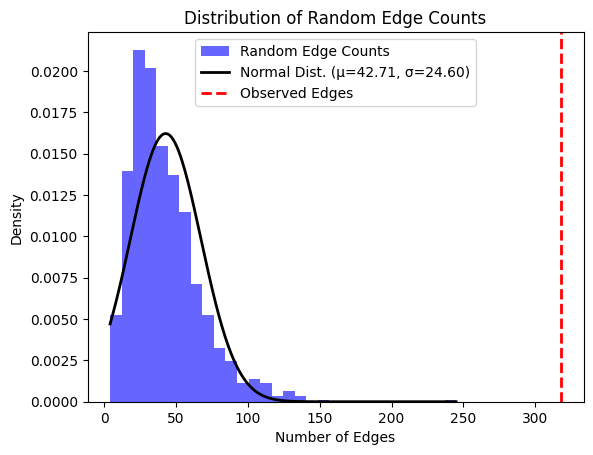

Genes mapped to Hamartoma, nevus: 
Hamartoma, nevus EFO_0000625
Genes mapped to Hamartoma, nevus: 
['NID1', 'RPL7AP56', 'LINC02760', 'PLA2G6', 'RN7SL151P', 'MTAP', 'CDKN2A', 'CDKN2B', 'AS1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to preeclampsia: 
preeclampsia EFO_0000668
Genes mapped to preeclampsia: 
['FGF14', 'ZNF295', 'AS1', 'LINC02500', 'TENM3', 'MCM8', 'MUC21', 'MUC22', 'BAMBI', 'LINC01517', 'LINC03007', 'ADRA1D', 'SCN4B', 'SCN2B', 'MYCBP2', 'INVS', 'SFR1', 'ERP44', 'WWTR1', 'RUNX1', 'LHFPL6', 'LZTS1', 'TMEM97P2', 'GPR45', 'TGFBRAP1', 'LINC02482', 'MRFAP1L2', 'F10', 'MECOM', 'PRDM8', 'FGF5', 'LINC01149', 'HCP5', 'LINC02937', 'LINC00484', 'PGR', 'TRPC6', 'LINC02356', 'FLT1', 'EIF4A1P7', 'FTO', 'ZNF831', 'RNU6', '649P', 'LINC01248', 'TENM4', '544P', 'TSC22D1', 'RGS6', 'COLGALT2', 'RN7SL602P', 'SMIM7P1', 'TRBV4', '1', 'TRBV5', 'ELOCP3', 'Y_RNA', 'RPL36AP1', 'OTX2', 'SETP4', 'UBE2DNL', 'CLCN6', 'WNT3A', 'MICA', 'RGL3', 'FGL1', 'ADORA2

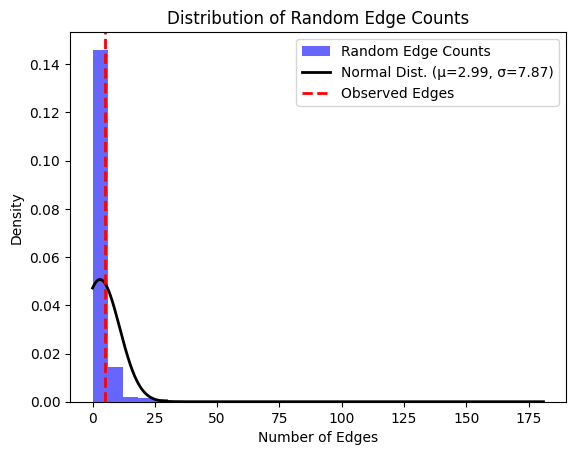

Genes mapped to dermatomyositis: 
dermatomyositis EFO_0000398
Genes mapped to dermatomyositis: 
['PLCL1', 'HLA', 'DPB1', 'DPA1', 'PIP', 'CPN1', 'LINC02571', 'B', 'GINS3']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to disease progression measurement, wet macular degeneration: 
disease progression measurement, wet macular degeneration EFO_0004683
Genes mapped to disease progression measurement, wet macular degeneration: 
['CFH', 'CFB', 'C3', 'CFI', 'C2', 'AS1', 'ARMS2', 'TRPM3', 'TGFBR1', 'RN7SL794P', 'ABCA1', 'ARHGAP21', 'RDH5', 'ACAD10', 'B3GLCT', 'RAD51B', 'ALDH1A2', 'LIPC', 'CETP', 'HERPUD1', 'ZFP1', 'CTRB2', 'TMEM97', 'NPLOC4', 'FUT6', 'CNN2', 'APOE', 'EXOC3L2', 'MARK4', 'FTLP1', 'MMP9', 'LINC01742', 'HSPD1P19', 'KCNT2', 'CFHR1', 'CFHR4', 'CFHR5', 'MFF', 'DT', 'COL4A3', 'ADAMTS9', 'AS2', 'ARHGEF28P1', 'COL8A1', 'C9', 'U3', 'SPEF2', 'SKIC2', 'STK19', 'PBX2', 'LINC02537', 'LINC01512', 'SRPK2', 'PILRA', 'TNFRSF10A', 'RNA5SP286', 'RORB', 'SY

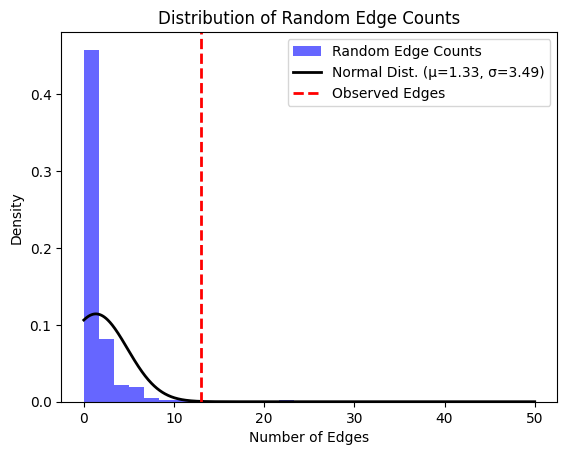

Genes mapped to atrophic macular degeneration: 
atrophic macular degeneration EFO_1001492
Genes mapped to atrophic macular degeneration: 
['MBP', 'GALR1', 'TDRP', 'ERICH1', 'CFB', 'C2', 'AS1', 'CFH', 'ARMS2', 'C3', 'CFI', 'RPL21P69', 'SOD2', 'PLCL1', 'RNU7', '147P', 'ENSAP3', 'BARD1', 'KIAA0513', 'NLRP5']
Random edges calculation completed

z score: 4.934217669335207



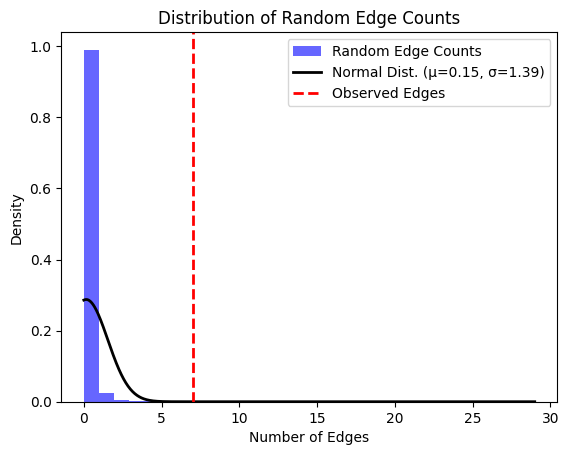

Genes mapped to androgenetic alopecia: 
androgenetic alopecia EFO_0004191
Genes mapped to androgenetic alopecia: 
['LINC01937', 'TWIST2', 'HDAC9', 'C1orf127', 'RNU6', '832P', 'MTCO2P25', 'MAPT', 'AS1', 'SPPL2C', 'SLC14A2', 'LINC01432', '394P', 'AR', 'RPL41P1', 'EBF1', 'MYCLP2', 'KRT8P17', 'KANSL1', 'AADACL2', 'LINC02917', 'RRAGB', 'GOT2P6', 'WNT10A', 'SRD5A2', 'RNA5SP56', 'PSMC1P12', 'HULC', 'OFCC1', 'EMC2', 'TMEM74', 'PAGE2', 'VCF2', 'FAM53B', 'AKAP1', 'MSI2', 'LRMDA', 'ITPR2', 'SSPN', 'LINC01812', 'FBXL12P1', 'IRF4', 'RUNX1', 'IFITM3P7', 'SYF2', 'RPS4XP9', 'RSPO3', 'ALX4', 'RPL7AP79', 'DKK2', 'HAUS4P1', 'GORAB', 'DRAIC', 'LINC00385', 'KATNAL1', 'DIP2B', 'ATF1', 'CDC5L', 'SUPT3H', 'MRPS22', 'EPS15P1', 'MRPL42P4', 'FGF5', 'Y_RNA', 'MIR193BHG', 'EDAR', 'THADA', 'LINC02419', 'FZD10', 'LINC01117', 'LINC03114', 'PPIAP66', 'RPL5P7', 'RUNX3', 'MIR4425', 'FOXD2', 'RPL21P24', 'FAF1', 'TBX15', 'LINC01247', 'LINC01824', 'MEMO1', 'DPY30', 'HOXD', 'AS2', '187P', 'ALDH1L1', 'KLF15', 'FOXL2NB', 'PRR

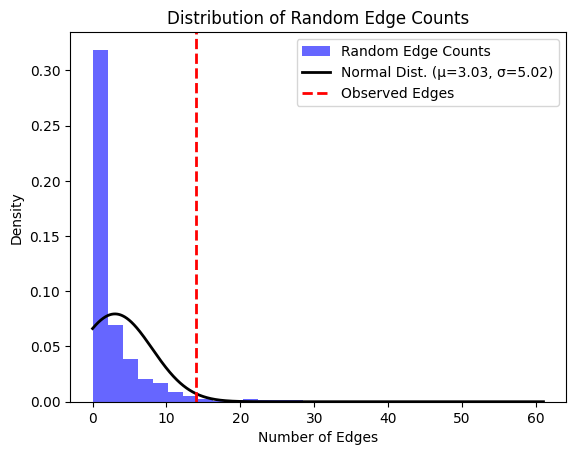

Genes mapped to gallbladder neoplasm: 
gallbladder neoplasm EFO_0004606
Genes mapped to gallbladder neoplasm: 
['DCC', 'CNTN4', 'LINC03106', 'CAAP1', 'KIAA0825', 'BUB3P1', 'EIF3IP1', 'ABCB4', 'ABCB1', 'NEUROD1', 'SAP18P2', 'PDE4D', 'PPP2R5E', 'LINC00929', 'LINC02248', 'B3GLCT', 'RXFP2', 'NWD1', 'EPHB1', 'SDHBP1', 'NPFFR2', 'LINC02872', 'DAPK1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to sclerosing cholangitis: 
sclerosing cholangitis EFO_0004268
Genes mapped to sclerosing cholangitis: 
['MST1', 'MIR4435', '2HG', 'TCF4', 'GPR35', 'KSR1', 'NOS2', 'LYRM9', 'LINC01989', 'CCL2', 'ZPBP2', 'STAT3', 'KPNB1', 'DT', 'NPEPPS', 'C17orf67', 'RPS6KB1', 'ERN1', 'SLC39A11', 'NFATC1', 'PTPN2', 'CD226', 'CHCHD2P3', 'LSM14A', 'SBNO2', 'STK11', 'RAVER1', 'TYK2', 'KEAP1', 'HIF3A', 'PPP5C', 'FUT2', 'BSN', 'MTCH2P1', 'NPM1P17', 'ANTXR2', 'BANK1', 'NFKB1', 'IL2', 'IL21', 'AS1', 'ROPN1L', 'LINC02213', 'DAP', 'OSMR', 'RNU1', '150P', 'TTC33', 'DENND1B', 'NR5A2', '

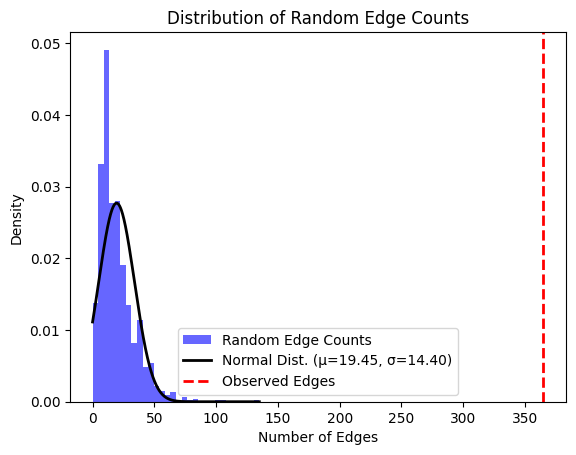

Genes mapped to insulin sensitivity measurement: 
insulin sensitivity measurement EFO_0004471
Genes mapped to insulin sensitivity measurement: 
['FADS2', 'PHGDH', 'CPS1', 'ALDH1L1', 'AS2', 'DMGDH', 'SLC6A12', 'LINC02342', 'ZDHHC20P4', 'LINC01768', 'CSF1', 'SHISA6', 'IFNGR2', 'LINC01898', 'LINC01893', 'MIR646HG', 'LPAR3', 'RN7SKP93', 'MGAT5', 'RPRM', 'DNAJA1P2', 'MIR5702', 'IRS1', 'SETD5', 'ATG5', 'DOCK5', 'TAOK3', 'LINC00402', 'UNC13C', 'RSL24D1', 'LINC01427', 'BBLNP1', 'DBIP1', 'LCA5', 'LPP', 'PLCE1', 'EXPH5', 'DDX10', 'INSYN1', 'AS1', 'LINC01707', 'LINC02791', 'Y_RNA', 'RNU6', '1228P', 'DELEC1', 'MYT1L', 'LINC01250', 'ALK', 'EIF2AK2', 'PAK2', 'MFSD8', 'HAUS2', 'KRT28', 'KRT10', 'LINC02580', '699P', 'RNU1', '63P', 'LINC02240', 'ARMC8', 'NME9', 'GCKR', 'RASEF', 'RN7SKP242']
Random edges calculation completed

z score: 2.874739621464747



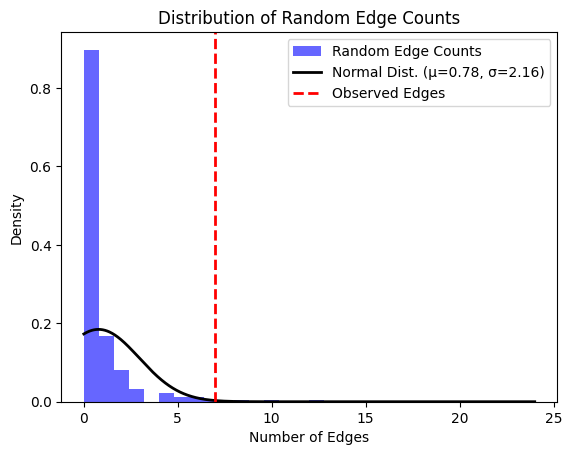

Genes mapped to retinopathy: 
retinopathy EFO_0003839
Genes mapped to retinopathy: 
['RD3', 'SLC30A1', 'LINC02510', 'OR5V1', 'HDAC9', 'CYP7B1', 'RPL31P41', 'CCDC26', 'RPA2P2', 'NRG3', 'TENM4', 'RN7SKP15', 'PTHLH', 'SRC', 'RPL7AP14', 'KLHL22', 'FOXL1', 'LINC02188', 'ARMS2', 'CFH', 'CFI', 'FTO', 'C3', 'CETP', 'CD46', 'MIR29B2CHG', 'MSANTD2', 'AS1', 'ROBO3', 'RPL7AP36', 'RPL21P62', 'RDH5', 'COL4A2', 'CPLX4', 'HLA', 'DRB1', 'DQA1', 'PLEKHA1', 'MIR4435', '2HG', 'COL4A4', 'DHX36', 'ABLIM3', 'PEBP4', 'CDKN2B', 'LPAR1', 'FOLH1', 'NOX4P1', 'COL22A1', 'FAT3', 'CLSTN2', 'ANKRD7', 'LMNB1', 'DT', 'C2', 'PDGFB', 'RPL3']
Random edges calculation completed

z score: 2.476691634732616



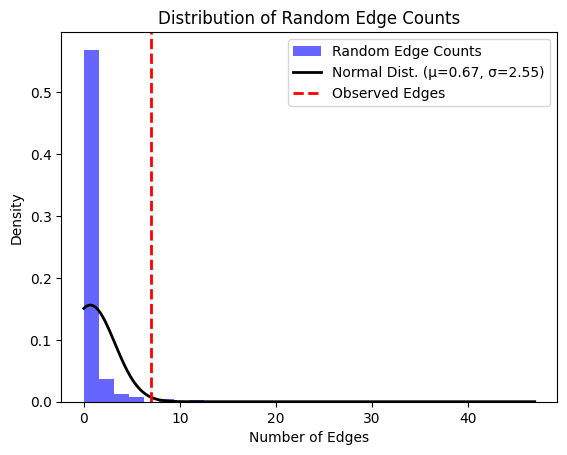

Genes mapped to cirrhosis of liver: 
cirrhosis of liver EFO_0001422
Genes mapped to cirrhosis of liver: 
['NGF', 'AS1', 'ELOCP20', 'LINC01756', 'LINC01648', 'DCLK1', 'PNPLA3', 'ST8SIA1', 'COL13A1', 'FDFT1', 'SLC9A9', 'CACNA2D1', 'LINC02713', 'CNTN5', 'EHBP1L1', 'FARP1', 'CRACR2A', 'CDH2', 'ARIH2P1', 'SVIL', 'JCAD', 'EEF1A1P20', 'Y_RNA', 'NFIC', 'MIR646HG', 'LINC01718', 'SEL1L3', 'NACAP8', 'LINC02412', 'RNA5SP166', 'ATP5MGP4', 'RNA5SP489', 'RPL13AP7', 'TEX36', 'LINC00322', 'LINC01679', 'KHDRBS3', 'RNU1', '35P', 'MACROD2', 'RNU6', '187P', 'RNA5SP112', 'TBX20', 'HERPUD2', 'LINC00987', 'DDX60L', 'RWDD3', 'DT', 'TLCD4', 'ZP4', 'MTCO1P38', 'LINC03002', 'MEMO1P2', 'OTX2P1', 'PCSK5', 'RNF7', 'MERTK', 'TULP1', 'RPS15AP19', 'GLT8D2', 'LINC01508', 'PKD1L1', 'MTARC1', 'KLHL8', 'MIR5705', 'SERPINA1', 'TM6SF2', 'TSBP1', 'HDAC9', 'ALDH2', 'HLA', 'B', 'ADAM1A', 'MAPKAPK5', 'MTCL1', 'RPS4XP19', 'MAN1A1', 'MIR3144', 'FAXC', 'COQ3', 'PNISR', 'USP45', 'PLXNA2', 'LINC01735', 'PDCD6', 'AHRR', 'PKP4', 'NDST4

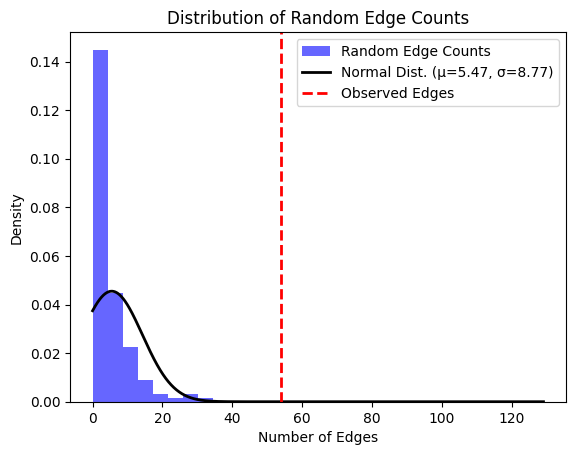

Genes mapped to upper aerodigestive tract neoplasm: 
upper aerodigestive tract neoplasm EFO_0004284
Genes mapped to upper aerodigestive tract neoplasm: 
['ADH1C', 'ADH7', 'ADH1B', 'NAA25', 'HELQ', 'NDUFAF6', 'GLIS3', 'CDKN2B', 'AS1', 'SMC5', 'PCA3', 'PRUNE2', 'FRMD3', 'RNU4', '15P', 'ASS1', 'FUBP3', 'DBH', 'APBB1IP', 'SVIL', 'GOLGA7B', 'DT', 'CWF19L1', 'CHUK', 'PLEKHS1', 'DCLRE1A', 'TRIM21', 'GTF2H1', 'MIR3159', 'LRRC4C', 'PANX1', 'RN7SL167P', 'NTM', 'WNK1', 'FOXM1', 'BCDIN3D', 'RPL35AP28', 'MVK', 'RN7SKP250', 'BRAP', 'TMEM116', 'RPL6', 'FA2H', 'WDR59', 'MEAK7', 'TP53', 'LINC01915', 'RPS27P28', 'CCDC178', 'PIAS2', 'NFATC1', 'ANKLE1', 'ABHD8', 'VSTM2B', 'CYP2A6', 'DLGAP4', 'LINC01370', 'CHRNA4', 'PPIAP22', 'SLC6A6P1', 'GRIK1', 'TTC28', 'CHEK2', 'ZNRF3', 'EMID1', 'RFPL1S', 'EPIC1', 'RPH3A', 'BRCA2', 'PDS5B', 'PCDH17', 'RN7SL571P', 'KCTD12', 'HIGD1AP2', 'PTMAP5', 'FGF14', 'NPAS3', 'SYNDIG1L', 'NPC2', 'PAPOLA', 'RN7SKP108', 'FAN1', 'CATSPER2', 'PDIA3', 'RORA', 'THSD4', 'CHRNA5', 'CHRNB4', 

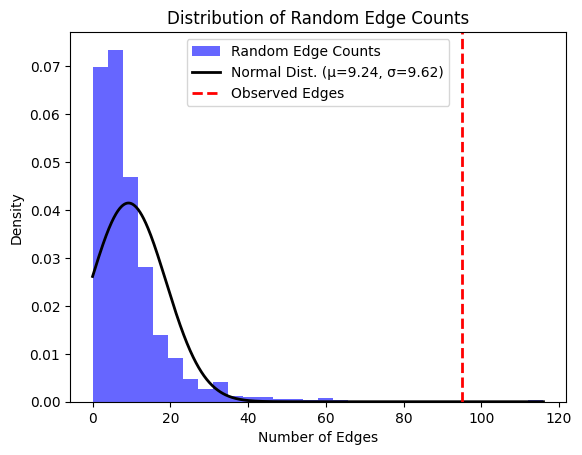

Genes mapped to osteonecrosis: 
osteonecrosis EFO_0004259
Genes mapped to osteonecrosis: 
['CYP2C8', 'MTND3P4', 'ARL2BPP7', 'RN7SL167P', 'NTM', 'CSGALNACT1', 'CWC27', 'CBX4', 'LINC01979', 'PPP1R9A', 'AS1', 'PURPL', 'LINC02103', 'TSGA13', 'KLF14', 'ZNF704', 'PAG1', 'RAPGEF5', 'SEMA3C', 'EIF4EP4', 'GRIK1', 'BACH1', 'SNORD81', 'RN7SL58P', 'CDCA7P2', 'OTX2P1', 'LINC00402', 'NARF', 'RNA5SP142', 'MTCH2P1', 'HSPA8P5', 'CCND2', 'KCNMA1', 'ZFHX3', 'FAM167A', 'LINC02500', 'TENM3', 'NTNG1', 'NDUFA4P1', 'CPHL1P', 'CLIP2', 'GTF2IRD1', 'GRM4', 'WIPF1', 'LINC02159', 'GABRB2', 'LINC02996', 'GHR', 'NAV3', 'RNA5SP63', 'U3', 'GPC6', 'LINC00841', 'LINC03089', 'PPP2R2B', 'NMRAL2P', 'PCSK9', 'LINC00426', 'LINC01491', 'FAM3D', 'ABHD5', 'RNU6', '367P', 'MAP1S', 'FTO', 'FIBCD1', 'LAMC3', 'ZNF331', 'LINC02755', 'QKI', 'RN7SL366P', 'LNCBRM', 'SOX6', 'ABCA12', 'ADAMTS9', 'AS2', 'Metazoa_SRP', 'TMCO5A', 'RASD2', 'MB', 'RELN', 'ORC5', 'LINC02339', 'RAC1P8', 'IGF2BP2', 'TRA2B', 'HIVEP3', 'RGS7', 'LINC01911', '692P',

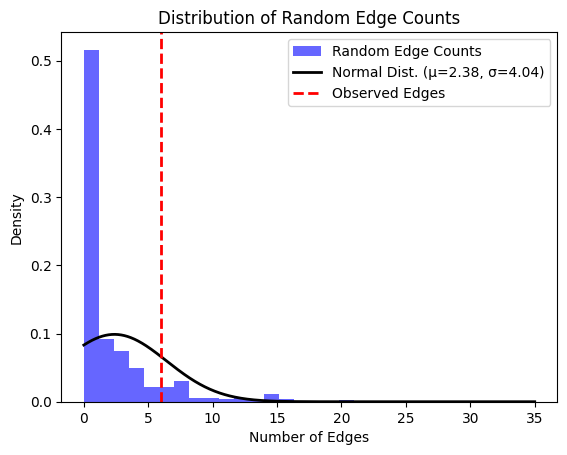

Genes mapped to corneal topography: 
corneal topography EFO_0004345
Genes mapped to corneal topography: 
['COL8A2', 'MFF', 'DT', 'COL4A3', 'FNDC3B', 'LINC00578', 'NR3C2', 'ADAMTS6', 'LINC02542', 'RNU6', '973P', 'VKORC1L1', 'TMEM248', 'LINC01235', 'LINC00583', 'LPAR1', 'RXRA', 'COL5A1', 'LCN12', 'LINC02692', 'ARID5B', 'RNA5SP350', 'LINC02550', 'GLT8D2', 'LINC00540', 'FTH1P7', 'LINC00598', 'FOXO1', 'TJP1', 'SMAD3', 'ADAMTS7P4', 'AKAP13', 'LRRK1', 'CHSY1', 'LINC02182', 'HS3ST3B1', 'RPS18P12', 'MTOR', 'RPL22P13', 'PDGFRA', 'TRIM29', 'SLC8A3', 'WIPF3', 'SBSPON', 'C8orf89', 'EIF2AK4', 'LINC00536', 'EIF3H', 'RPL3P4', 'BCL11B', 'RUNX1', 'SRIP1', 'LINC02494', 'GABRG3', 'CMPK1', 'LINC01389', 'RBP3', 'WNT7B', 'RSPO1', 'LINC02902', 'PKD1L1', 'KAZALD1', 'TESHL', 'CHRND', 'HMGA2', 'MED6P1', 'RNLS', 'COL6A1', 'PSMA6P3', 'BMP7', 'ADAMTS3', 'HNRNPA1P67', 'ADAMTS7', 'HIGD1AP18', 'PKIA', 'AS1', 'STXBP6', 'CASC15', 'IGF2', 'INS', 'OFCC1', 'RPL7AP36', 'INTS6', 'LCORL', 'SOX2', 'OT', 'FCF1P10', 'SOCS5P5', '

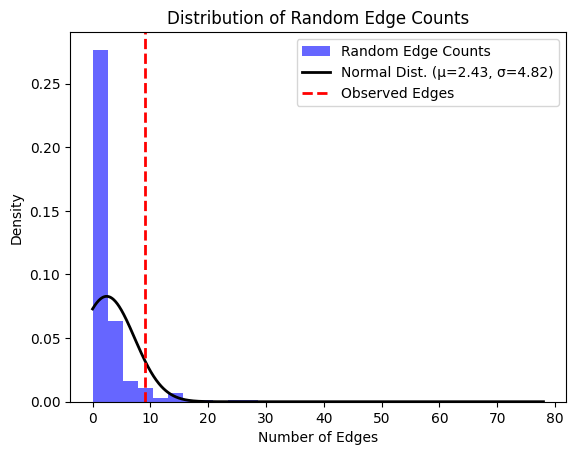

Genes mapped to atrial natriuretic factor measurement: 
atrial natriuretic factor measurement EFO_0004789
Genes mapped to atrial natriuretic factor measurement: 
['DRD2', 'CRYBG1', 'ZNF619P1', 'HMGN1P19', 'RPS7', 'COLEC11', 'CFH']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to drug use measurement, celiac disease: 
drug use measurement, celiac disease EFO_0001060
Genes mapped to drug use measurement, celiac disease: 
['HLA', 'DQA1', 'IL2', 'IL21', 'TLR8', 'TMSB4X', 'LINC01934', 'LPP', 'TAGAP', 'AS1', 'ELMO1', 'MYNN', 'DLEU1', 'PTPN2', 'RN7SKP226', 'LINC00824', 'RMI2', 'RGS21', 'RGS1', 'MMEL1', 'RUNX3', 'MIR4425', 'ZFP36L1', 'MAGOH3P', 'WNT3', 'CD247', 'MROH3P', 'PUS10', 'LINC03004', 'PLEK', 'CCR4', 'GLB1', 'ARHGAP31', 'BACH2', 'THEMIS', 'PTPRK', 'ZMIZ1', 'ETS1', 'ICOSLG', 'DUSP22', 'IRF4', 'YDJC', 'IL18RAP', 'SLC9A4', 'ICOS', 'CCR3', 'IL12A', 'BLTP1', 'ATXN2', 'NFIA', 'FASLG', 'SLC25A38P1', 'PARK7', 'ERRFI1', 'FRMD4B', 'UQCRC2P1', 'IL18R1', 

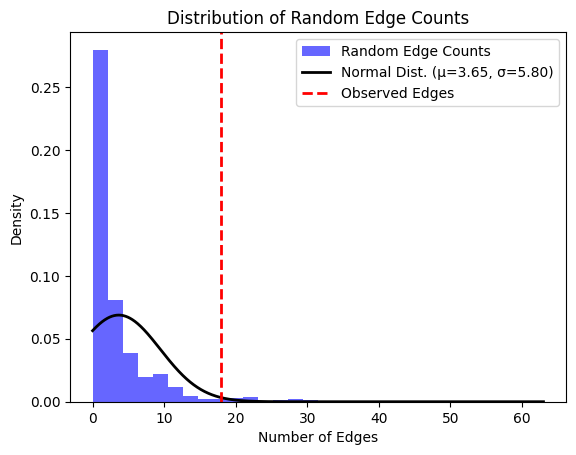

Genes mapped to restless legs syndrome: 
restless legs syndrome EFO_0004270
Genes mapped to restless legs syndrome: 
['BTBD9', 'MEIS1', 'MAP2K5', 'PTPRD', 'LINC01812', 'FBXL12P1', 'CASC16', 'RPL35P8', 'MIR3667HG', 'HELLPAR', 'UTRN', 'OR8I1P', 'OR8K3', 'LINC02378', 'LGR6', 'RNA5SP127', 'H3P11', 'LINC01677', 'MTATP6P14', 'UNCX', 'MICALL2', 'EEF1A1P28', 'COX6A1P7', 'LMX1B', 'ZBTB43', 'SKOR1', 'LINC03064', 'SLC40A1', 'ASNSD1', 'RANBP17', 'LMO1', 'STK33', 'PLEKHB2P1', 'NFE2L3P1', 'LINC01304', 'NPM1P48', 'RN7SKP101', 'SEMA6D', 'LINC02086', 'LINC01478', 'LINC02520', 'CRBN', 'SUMF1', 'RPS10P21', 'RPL18AP17', 'RN7SKP212', 'GSTO3P', 'MYT1', 'CCDC148', 'DPH6', 'DT', 'LINC02853', 'BDNF', 'AS', 'ATP2C1', 'EBF3', 'LINC02339', 'RAC1P8', 'KLF12', 'LINC00402', 'OR5AU1', 'LINC02306', 'ACTN1', 'KCNK13', 'BCL11B', 'SETD3', 'PPP2R5C', 'CDIN1', 'SQOR', 'MTND5P40', 'LINC01491', 'UNC13C', 'RNU6', '745P', 'LINC02205', 'SLCO3A1', 'TOX3', 'ZFHX3', 'NFE2L1', 'CA10', 'LINC01982', 'ASPSCR1', 'BOLA2P1', 'ADCYAP1', '

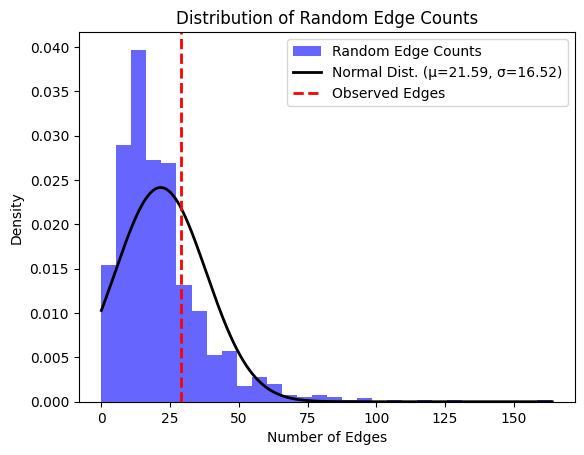

Genes mapped to serotonin measurement: 
serotonin measurement EFO_0004846
Genes mapped to serotonin measurement: 
['ADH5P4', 'NUFIP1P1', 'TRIM58', 'OR13C1P', 'OR13D1', 'LINC02006', 'LINC02877', 'MFSD4B', 'DT', 'ERBB4', 'ASB11', 'TESHL', 'KCNMB2', 'AS1', 'LINC00574', 'IFT43', 'GPATCH2L', 'WWTR1', 'AUTS2', 'C8orf90', 'MIR1302', '7', 'SLC22A1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to diabetes mellitus: 
diabetes mellitus EFO_0000400
Genes mapped to diabetes mellitus: 
['CAVIN2', 'AS1', 'TMEFF2', 'SALL1', 'UNGP1', 'ANKH', 'PAM', 'TCF7L2', 'APOE', 'APOC1', 'CCND2', 'TRIB1AL', 'CDKN2B', 'CELSR2', 'ABO', 'CDKAL1', 'MTNR1B', 'TGM2', 'KIAA1755', 'IGF2BP2', 'APOB', 'ZMIZ1', 'KCNQ1', 'GTF3AP5', 'AGMO', 'OR2I1P', 'COBLL1', 'GPR139', 'UBE2E2', 'NYNRIN', 'CASC20', 'LINC01713', 'GLIS3', 'UBE3C', 'CYB5B', 'NFAT5', 'EMILIN3', 'CHD6', 'PROX1', 'FES', 'NYAP2', 'MIR5702', 'WSCD2', 'FTO', 'AGBL2', 'HHEX', 'Y_RNA', 'SLC30A8', 'MED30', 'LINC01080', 'LINC029

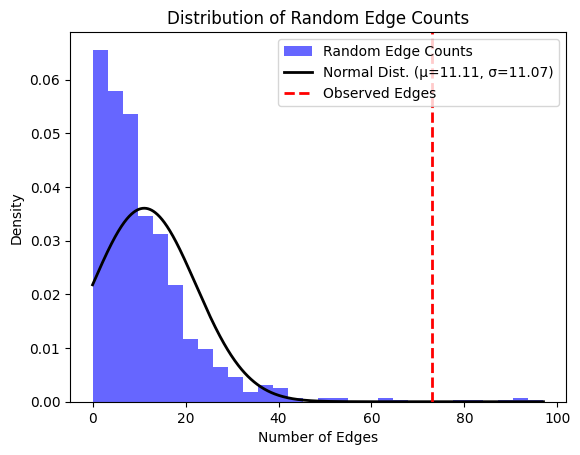

Genes mapped to Asperger syndrome: 
Asperger syndrome EFO_0003757
Genes mapped to Asperger syndrome: 
['MTCO1P24', 'CTBP2P4', 'SLTM', 'RNF111', 'NTM', 'RASGRP4', 'FHIT']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to rhegmatogenous retinal detachment: 
rhegmatogenous retinal detachment EFO_0005240
Genes mapped to rhegmatogenous retinal detachment: 
['CERS2', 'PYCR3', 'GFUS', 'SS18', 'LDB2', 'FAT3']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to RR interval: 
RR interval EFO_0004831
Genes mapped to RR interval: 
['LINC02465', 'LINC02479', 'LINC01507', 'NPAP1P4', 'LINC00540', 'ADGRD1', 'GALR1', 'HLA', 'DPB2', 'RASGRF1', 'CDC42EP3', 'AS1', 'ARHGEF28P1', 'COL8A1', 'RN7SKP120', 'TUSC1', 'RPL31P13', 'PROX1', 'TOX', 'DT', 'RNA5SP267', 'RNU6', '1312P', 'CRLF3P3', 'ISCA2P1', 'MIATNB', 'LINC01499', 'AKT3', 'LINC01888', 'LINC01890', 'LINC02065', 'LINC02229', 'FRMD4A', 'RPL23AP48', 'HMGB3P18', 'SRRT', 'MYH6',

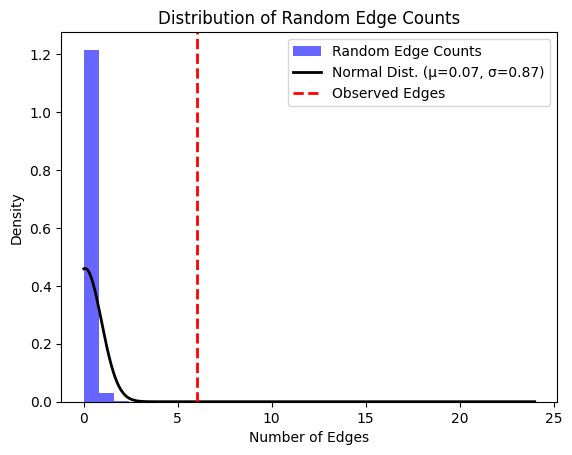

Genes mapped to neuroimaging measurement, South Texas Assessment of Neurocognition: 
neuroimaging measurement, South Texas Assessment of Neurocognition EFO_0004785
Genes mapped to neuroimaging measurement, South Texas Assessment of Neurocognition: 
['TSNAX', 'DISC1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to methamphetamine-induced psychosis: 
methamphetamine-induced psychosis EFO_0005242
Genes mapped to methamphetamine-induced psychosis: 
['AGBL1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to hepatitis B virus infection: 
hepatitis B virus infection EFO_0004197
Genes mapped to hepatitis B virus infection: 
['HLA', 'DPB1', 'DPA1', 'EHMT2', 'AS1', 'TCF19', 'GRIN2A', 'DQB1', 'MTCO3P1', 'DQB2', 'HCG27', 'C', 'UBE2L3', 'DRB1', 'DQA1', 'DPA2', 'COL11A2P1', 'AFG1L', 'EXOG', 'MAP7', 'CACNA1H']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to peptic ulcer 

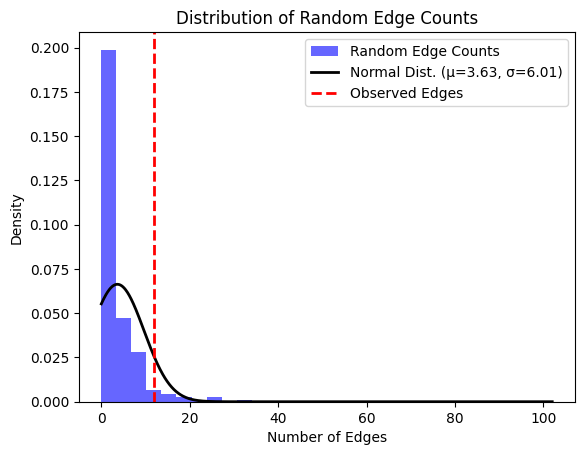

Genes mapped to hemoglobin E disease: 
hemoglobin E disease MONDO_0016243
Genes mapped to hemoglobin E disease: 
['HBBP1', 'HBD', 'HBS1L', 'MYB', 'BCL11A']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to sex interaction measurement, atopy: 
sex interaction measurement, atopy EFO_0002686
Genes mapped to sex interaction measurement, atopy: 
['PKDCC', 'ADGRV1', 'PAK5', 'ZNF37BP', 'ZNF33B']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to HbA1c measurement, polycystic ovary syndrome: 
HbA1c measurement, polycystic ovary syndrome EFO_0000660
Genes mapped to HbA1c measurement, polycystic ovary syndrome: 
['THADA', 'DENND1A', 'STON1', 'GTF2A1L', 'LHCGR', 'FSHR', 'AOPEP', 'YAP1', 'RAB5B', 'SUOX', 'HMGA2', 'CASC22', 'TOX3', 'INSR', 'RNU7', '14P', 'SUMO1P1', 'LINC01060', 'LINC02055', 'SOX8', 'SSTR5', 'ERBB4', 'ARL14EP', 'DT', 'IRF1', 'CARINH', 'KRR1', 'RPL10P13', 'RPS26', 'ERBB3', 'CDK12', 'NEUROD2', 'LHX2', '

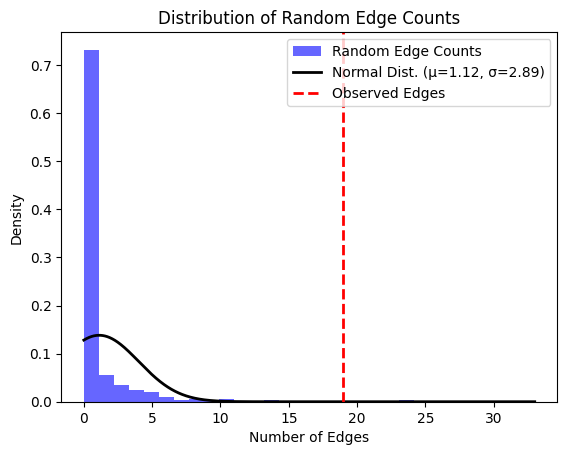

Genes mapped to systemic scleroderma: 
systemic scleroderma EFO_0000717
Genes mapped to systemic scleroderma: 
['IRF5', 'TNPO3', 'HLA', 'DQB1', 'MTCO3P1', 'STAT4', 'CD247', 'PSORS1C2', 'PSORS1C1', 'Y_RNA', 'NDUFAF2P1', 'TNIP1', 'SOX5', 'LINC02132', 'LINC01082', 'GRB10', 'DRB1', 'DQA1', 'NOTCH4', 'TSBP1', 'AS1', 'DRA', 'ZC3H10', 'ESYT1', 'DPA1', 'ATG5', 'GSDMA', 'DNASE1L3', 'TNFAIP3', 'IL12A', 'RNU6', '376P', 'DDX6', 'PXK', 'IL12RB2', 'TNFSF4', 'NAB1', 'ARHGAP31', 'DGKQ', 'NFKB1', 'FAM167A', 'BLK', 'RAB2A', 'CHD7', 'CDHR5', '878P', 'CD81', 'CSK', 'GSDMB', 'NUP85', 'IL12RB1', 'KCP', 'CXCR5', 'ELMO1', 'ZPBP2', 'IGHM', 'ANKRD37', 'UFSP2', 'FLG2', 'CCDST', 'FCGR3B', 'FCGR2B', 'CR2', 'IKZF2', 'TRPC6', 'TPI1P2', 'CYCSP20', 'TMEM175', 'FTLP1', 'MMP9', 'GTF2H5', 'TULP4', 'GRM7', 'LMCD1', 'UNC45B', 'PXDN', 'MYT1L', 'LINC02612', 'FABP5P10', 'ATF6', 'HOPX', 'CHAER1', 'CDCA7P2', 'OTX2P1', 'RNA5SP173', 'NDUFB5P1', 'LINC01967', 'FLNB', 'ESR1', 'LINC01301', 'AHNAK2', 'SLC12A5', 'RPL31P11', 'LINC03072'

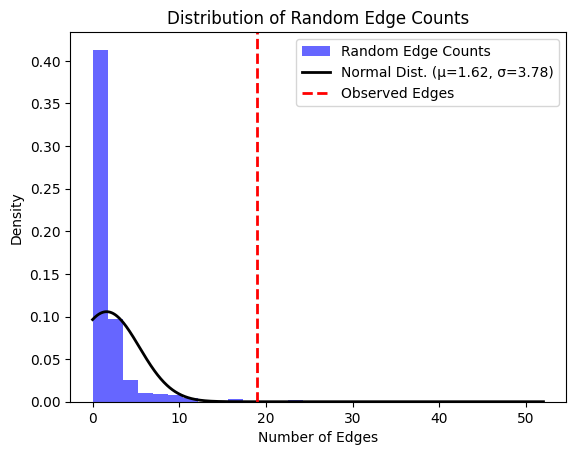

Genes mapped to Coronary Vasospasm: 
Coronary Vasospasm EFO_0004225
Genes mapped to Coronary Vasospasm: 
['CLEC14A', 'LINC00639']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to exercise test: 
exercise test EFO_0004328
Genes mapped to exercise test: 
['LRIT3', 'KRT19P3', 'RYR2', 'WRN', 'RDX', 'ZC3H12C', 'CCDC60', 'TMEM233', 'POLR2M', 'ALDH1A2', 'SETP14', 'VN2R1P', 'COL18A1', 'RNA5SP444', 'PRKCA', 'AACSP1', 'LINC02713', 'CNTN5', 'RARG', 'PTPRD']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to diffuse large B-cell lymphoma: 
diffuse large B-cell lymphoma EFO_0000403
Genes mapped to diffuse large B-cell lymphoma: 
['POLR1D', 'CDC42BPB', 'ITSN2', 'NCOA1', 'IRF4', 'EXOC2', 'HLA', 'B', 'MDFI', 'NPM1P51', 'PVT1', 'RN7SKP226', 'LINC00824', 'ARAP3', 'CD86']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to transferrin saturation measurement: 
transferrin saturation 

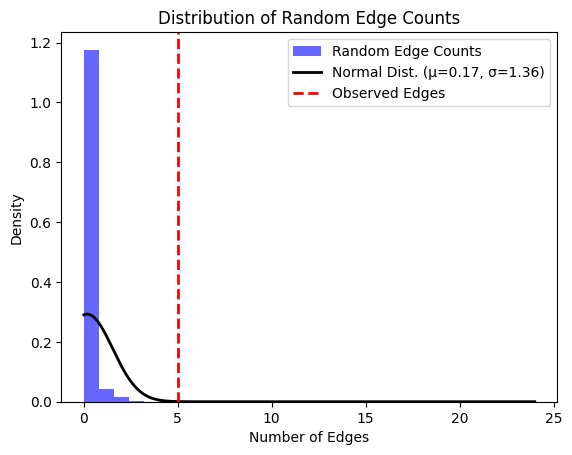

Genes mapped to brain serotonin transporter measurement: 
brain serotonin transporter measurement EFO_0004569
Genes mapped to brain serotonin transporter measurement: 
['GALM']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to amygdala reactivity measurement: 
amygdala reactivity measurement EFO_0004550
Genes mapped to amygdala reactivity measurement: 
['DOK5', 'GARRE1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to cystatin C measurement: 
cystatin C measurement EFO_0004617
Genes mapped to cystatin C measurement: 
['CST9LP2', 'CST9', 'CSTB', 'TMEM97P1', 'DZIP1', 'DNAJC3', 'DT', 'CST3', 'CST4', 'ARHGEF16', 'SOS1', 'EPB41L5', 'MITF', 'RBM47', 'FNIP1', 'PKHD1', 'TENT5A', 'ALDOB', 'SLC34A3', 'APOC3', 'SH2B3', 'ATXN2', 'CGNL1', 'CCM2L', 'GATA5', 'LINC01102', 'PANTR1', 'EDAR', 'CCDC158', 'SHROOM3', 'KIF3A', 'CCNI2', 'UNCX', 'MICALL2', 'USP5', 'CUX2', 'ACAD10', 'NAA25', 'TRAFD1', 'HECTD4', 'PTPN11', 'MIR1

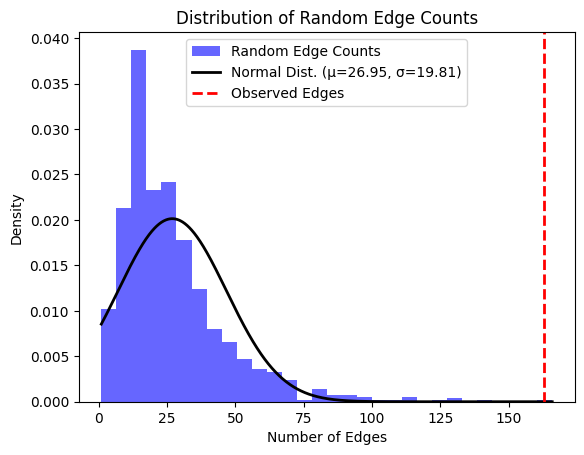

Genes mapped to leprosy: 
leprosy EFO_0001054
Genes mapped to leprosy: 
['TNFSF15', 'LACC1', 'SNX20', 'NOD2', 'HLA', 'DRB1', 'DQA1', 'PARAIL', 'RIPK2', 'ADGB', 'DT', 'RPS6KA4', 'LINC02168', 'LINC02128', 'C1orf141', 'MED30', 'EXT1', 'BBS9', 'CTSB', 'OR7E158P', 'GSTM5P1', 'PPARG', 'RNA5SP173', 'NDUFB5P1', 'IL4R', 'IL21R', 'MAGI3', 'PLAGL1', 'SF3B5', 'IL18R1', 'IL1RL1', 'IL12B', 'LINC01845', 'RAB32', 'NRAD1', 'CYLD', 'BATF3', 'NSL1', 'CDH18', 'DELEC1', 'ALDH7A1P4', 'ADO', 'CCDC88B', 'RMI2', 'COX4I1', 'SIGLEC5', 'SLC2A13', 'C6orf15', 'PSORS1C1', 'WASF5P', 'MTHFR', 'LINC01714', 'KAZN', 'CROCC', 'DAB1', 'PRMT6', 'NTNG1', 'NFASC', 'RNU6', '725P', 'LINC01139', 'VIT', 'GRM7', 'MYH15', 'LINC03051', 'LSAMP', 'KALRN', 'RPS14P7', 'FSTL5', 'ST8SIA4', 'RN7SL802P', 'COMMD10', 'ALDH5A1', 'KIAA0319', 'TRMT11', 'CASP2', 'ACTR3B', 'DLGAP2', 'STAU2', 'UBE2W', 'SLC1A1', 'DNAJC9', 'AS1', 'MFSD13A', 'ACTR1A', 'EEF1DP8', 'SCGB1D1', 'ST3GAL4', 'MDM1', 'ANKS1B', 'LINC00644', 'ATP5F1AP4', 'LINC02301', 'RNU7', '51

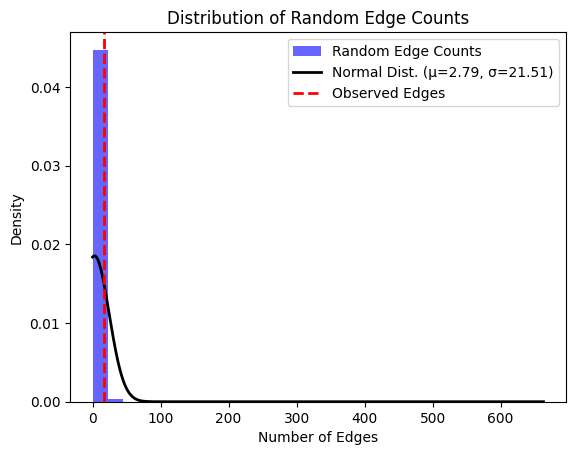

Genes mapped to lymphoma: 
lymphoma EFO_0000574
Genes mapped to lymphoma: 
['HLA', 'DQB2', 'DRB1', 'DQA1', 'DRB9', 'DQB1', 'MTCO3P1', 'DOB', 'ZFP91', 'CNTF', 'LINC01108', 'RNU6', '793P', 'OR10Q2P', 'BCL6', 'AS1', 'LINC01991', 'QRSL1P1', 'XCL2', 'EXOC2', 'AUTS2', 'PVT1', '376P', 'DDX6', 'LINC02318']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to Hirschsprung disease: 
Hirschsprung disease MONDO_0018309
Genes mapped to Hirschsprung disease: 
['NRG1', 'RET', 'STIM2', 'LINC02261', 'SLC6A20', 'DEFB128', 'DEFB129', 'LRRC77P', 'CYCSP56', 'DDX51', 'CARD14', 'LINC01264', 'LINC03017', 'HMGN2P11', 'PHOX2B', 'VRK2', 'TACC1P1', 'MTND1P18', 'FXYD4', 'HNRNPF', 'MOB1AP1', 'DDX6P2']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to NT-proBNP measurement: 
NT-proBNP measurement EFO_0004745
Genes mapped to NT-proBNP measurement: 
['LINC02058', 'POLD2P1', 'CLCN6', 'MIR3667HG', 'RN7SKP252', 'NPPB', 'SBF1P2']
The number o

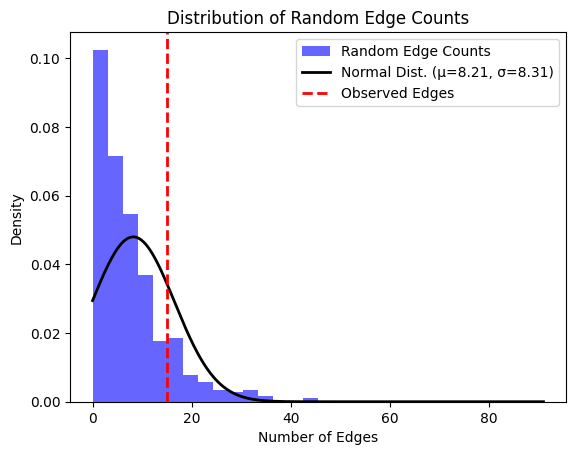

Genes mapped to adhesion molecule measurement, soluble P-selectin measurement: 
adhesion molecule measurement, soluble P-selectin measurement EFO_0004519
Genes mapped to adhesion molecule measurement, soluble P-selectin measurement: 
['SELP', 'ABO', 'Y_RNA']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to sudden cardiac arrest: 
sudden cardiac arrest EFO_0004278
Genes mapped to sudden cardiac arrest: 
['FTH1P5', 'TIAL1P1', 'LINC02376', 'RNU1', '104P', 'CHRNB4', 'MARCHF10', 'CDH4', 'LINC02397', 'MTCH2P2', 'LINC02823', 'LINC02404', 'DEGS2', 'CLXN', 'SNAI2', 'CLSTN2', 'LINC02409', 'RMST', 'UPP2', 'FMO1', 'FMO4', 'PDGFB', 'RPL3', 'ZFPM2', 'CHL1', 'SNORA70', 'RN7SL734P', 'MAML2', 'RNU6', '916P', 'LAMA1', 'LINC02852', 'LETR1', 'CALM2P1', 'CASC17', 'ESR1', 'RAP1GAP2', 'LINC02177', 'SIN3A', 'AP1G2', 'AS1', 'TPTE2P6', 'PARP4', 'ATF1', 'CCDC179', 'LINC02718', 'PLCE1', 'KLF12', 'LINC00402', 'GRIA1', 'ARL5B', 'LINC01148', 'LINC02296', 'CPMER', 'HIGD1AP18

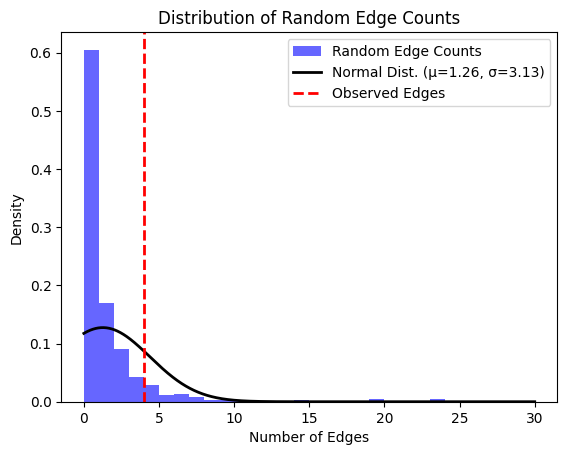

Genes mapped to congenital heart malformation: 
congenital heart malformation EFO_0005269
Genes mapped to congenital heart malformation: 
['RNA5SP56', 'PSMC1P12', 'MAML3']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to dilated cardiomyopathy: 
dilated cardiomyopathy EFO_0000407
Genes mapped to dilated cardiomyopathy: 
['BAG3', 'ZBTB17', 'LSM3', 'LINC01267', 'PKD1', 'SMARCB1', 'FLNC', 'SVIL', 'AS1', 'NMB', 'TTN', 'RNU1', '88P', 'Y_RNA', 'OR7E158P', 'OR7E161P', 'LINC00964', 'PRKCA', 'FHOD3']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to focal segmental glomerulosclerosis: 
focal segmental glomerulosclerosis EFO_0004236
Genes mapped to focal segmental glomerulosclerosis: 
['APOL1', 'ALMS1', 'OR6R1P', 'GPATCH1', 'CCDC30', 'PPCS', 'GRB2', 'FGFR4', 'KCNK6', 'CDH12', 'IPO4', 'SCNN1G', 'CCDC7', 'OR4X2', 'OR4X1', 'DNAH6']
The number of edges in the network is less than the minimum requirement: 4

Genes ma

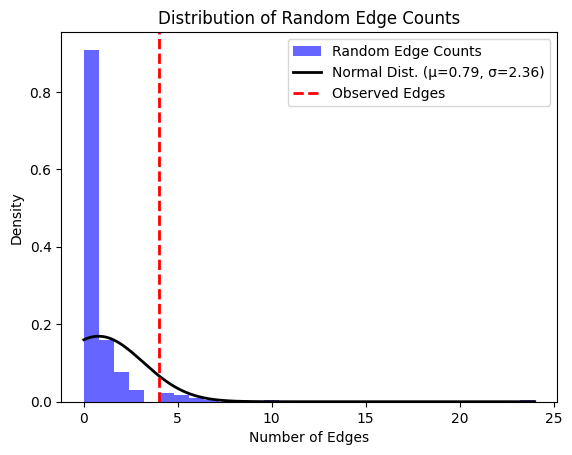

Genes mapped to prion disease: 
prion disease EFO_0004720
Genes mapped to prion disease: 
['PRNP', 'ZBTB38', 'PXYLP1', 'SEMA3A', 'LINC01435', 'LINC02483', 'RCHY1', 'ADAMTS14', 'TBATA', 'TMA7', 'ATRIP', 'MFHAS1', 'CYP2T3P', 'RPL36P16', 'RIDA', 'POP1', 'CPEB4']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to C4BP measurement: 
C4BP measurement EFO_0004572
Genes mapped to C4BP measurement: 
['C4BPB']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to gallstones: 
gallstones EFO_0004210
Genes mapped to gallstones: 
['ABCG8', 'GCKR', 'TM4SF4', 'UBXN2B', 'CYP7A1', 'SULT2A1', 'HNF4A', 'SERPINA1', 'SLC10A2', 'MARCHF8', 'LRBA', 'FUT2', 'FUT6', 'FUT3', 'FOXA3', 'IRF2BP1', 'HNF1A', 'AS1', 'LINC00208', 'GATA4', 'FADS2', 'FADS1', 'MLLT10', 'MIR548AZ', 'CCN3', 'JMJD1C', 'ANPEP', 'KDELR3', 'RMI2', 'LITAF', 'HNF1B', 'TMBIM1', 'PNKD', 'ATP8B1', 'ABCB4', 'TTC39B', 'UGT1A6', 'UGT1A10', 'UGT1A7', 'UGT1A8', 'UGT1A9', 'LINC

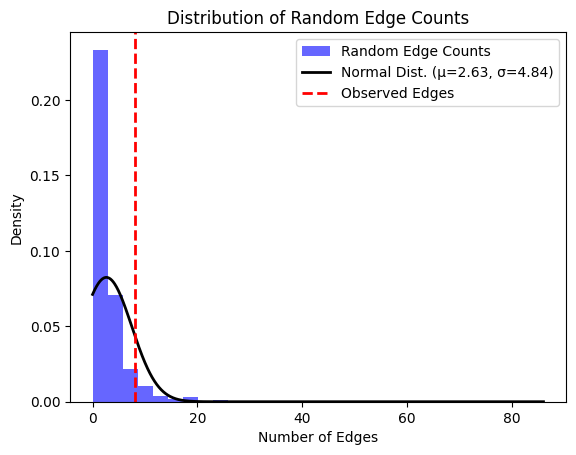

Genes mapped to alcohol and nicotine codependence: 
alcohol and nicotine codependence EFO_0004776
Genes mapped to alcohol and nicotine codependence: 
['LINC01833', 'RGPD2', 'NDUFB4P7', 'CAPN7', 'SH3BP5', 'AS1', 'HIVEP1', 'PLEKHG1', 'PKNOX2', 'KCND2', 'LINC01734', 'ISCA1P1', 'HTR1A']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to hypertensive heart disease, kidney disease: 
hypertensive heart disease, kidney disease EFO_0003086
Genes mapped to hypertensive heart disease, kidney disease: 
['HLA', 'DPB2', 'PSMB8', 'HORMAD2', 'CFH', 'MTCO3P1', 'DQB3', 'NOTCH4', 'TSBP1', 'AS1', 'UMOD', 'MPPED2', 'DCDC1', 'PRKAG2', 'APOL1', 'FTO', 'PKD2', 'ADAMTSL1', 'NUAK1', 'LINC02955', 'PDILT', 'HPRT1P2', 'RPL19P11', 'CALCR', 'STARD13', 'TCF7L2', 'SCARB1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to treatment refractory schizophrenia: 
treatment refractory schizophrenia EFO_0004609
Genes mapped to treatment refrac

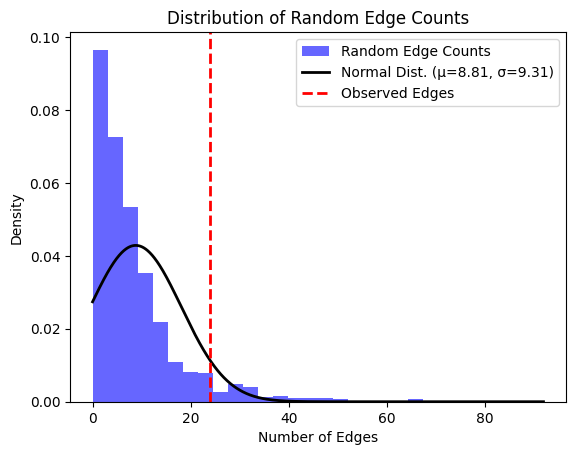

Genes mapped to Coronary Restenosis: 
Coronary Restenosis EFO_0004224
Genes mapped to Coronary Restenosis: 
['C12orf42', 'LINC02401']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to cystic fibrosis: 
cystic fibrosis MONDO_0009061
Genes mapped to cystic fibrosis: 
['EHF', 'APIP', 'AGTR2', 'HLA', 'DRB9', 'SLC8A3', 'AHRR', 'PDCD6', 'RNU6', '21P', 'DPPA3P11']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to C-peptide measurement: 
C-peptide measurement EFO_0005187
Genes mapped to C-peptide measurement: 
['SERPINA12', 'LINC00907', 'LINC01046', 'ESRRAP2', 'LRRK2', 'MUC19', 'GCKR', 'BACE2', 'PPP1R3B', 'DT', 'KRT18P32', 'MIPEPP2', 'TRIM31', 'AS1', 'TRIM40', 'HLA', 'DQB1', 'MTCO3P1', 'A', 'POLR1HASP', 'BZW2', 'TSPAN13']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to molar-incisor hypomineralization: 
molar-incisor hypomineralization EFO_0005321
Genes mapped to mola

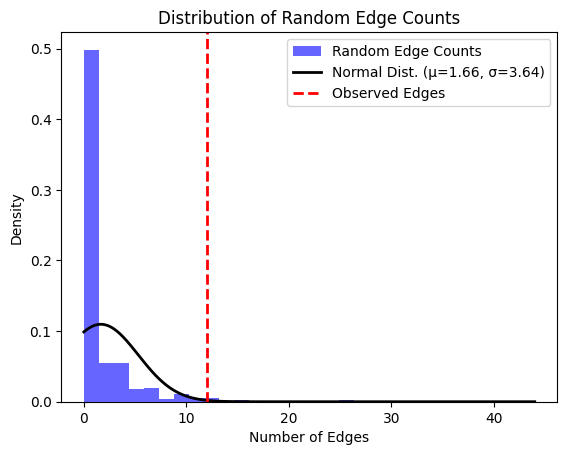

Genes mapped to rhabdomyolysis: 
rhabdomyolysis EFO_0003867
Genes mapped to rhabdomyolysis: 
['RYR2', 'ANO5', 'NCOR1', 'LINC01904', 'SLC25A3P3', 'PIAS4']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to duodenal ulcer: 
duodenal ulcer EFO_0004607
Genes mapped to duodenal ulcer: 
['ABO', 'JRK', 'PSCA', 'NHEJ1', 'PLCL2', 'GNAQ', 'RN7SKP59', 'TPCN2', 'MECOM', 'PLD1', 'CORIN', 'PRKAA1', 'H2BC5', 'H2BC6', 'AS1', 'FSCN3', 'PAX4', 'RN7SL272P', 'FLT3', 'EIF1', 'GAST', 'SEC1P', 'FUT2', 'CASC20', 'LINC01713', 'GNAS', 'GGT1', 'TTC33', 'POLR1HASP', 'SLC22A2', 'SLC22A3', 'CNGA4', 'CCKBR', 'CBFA2T3', 'PITPNC1', 'OPRL1', 'TTLL8', 'ACTG1P19', 'GAPDHP26', 'LINC01492', 'RNA5SP291', 'UBE2V1P4', 'NALCN', 'CYP2A7P2', 'CYP2G1P', 'CYP2B7P']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to AIDS dementia: 
AIDS dementia EFO_0002608
Genes mapped to AIDS dementia: 
['SLC8A1', 'AS1', 'NALCN', 'LINC01725', 'LINC01362', 'LINC00841

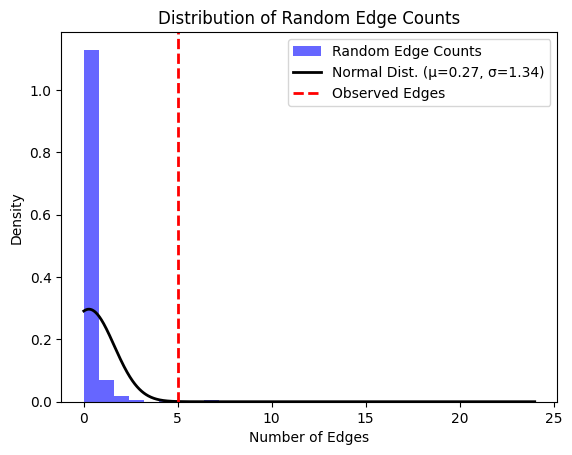

Genes mapped to chemotherapy-induced alopecia: 
chemotherapy-induced alopecia EFO_0005400
Genes mapped to chemotherapy-induced alopecia: 
['CACNB4', 'STAM2', 'PCDH15']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to maximal midexpiratory flow rate: 
maximal midexpiratory flow rate EFO_0004313
Genes mapped to maximal midexpiratory flow rate: 
['SEC61B', 'RN7SKP225', 'IMPDH1P8', 'GALNT15', 'TUBGCP6', 'MED12L', 'IGSF11', 'OCA2', 'RPS3AP5', 'LINC01519', 'SGCD', 'MICAL3', 'SAMD4A', 'AS1', 'BRIP1', 'MYO16']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to chronic hepatitis B virus infection: 
chronic hepatitis B virus infection EFO_0004239
Genes mapped to chronic hepatitis B virus infection: 
['HLA', 'DPA1', 'DQB1', 'MTCO3P1', 'DQB2', 'DQB3', 'DQA2', 'DPB1', 'DPA3', 'CFB', 'NOTCH4', 'DOA', 'CD40', 'HCG27', 'C', 'EHMT2', 'AS1', 'TCF19', 'RN7SL563P', 'GRHL2', 'DT', 'RBMX2P4', 'ETV1']
The number of edges in t

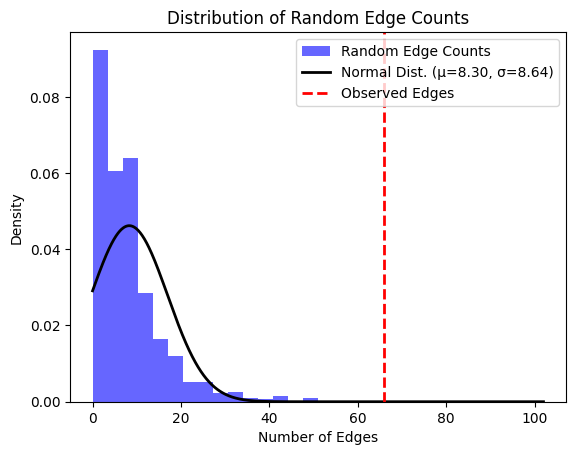

Genes mapped to alopecia areata: 
alopecia areata EFO_0004192
Genes mapped to alopecia areata: 
['CTLA4', 'IL2', 'IL21', 'RAET1M', 'PHB1P1', 'STX17', 'IL2RA', 'PRDX5', 'CCDC88B', 'IKZF4', 'MTCO3P1', 'HLA', 'DQB3', 'TNFSF4', 'Y_RNA', 'PLEKHH2', 'SLC16A9', 'PTCSC2', 'MIR4435', '2HG', 'ACOXL', 'MAGI3', 'SYT14', 'FPR1', 'FPR2', 'TNFRSF1A', 'EMSY', 'LINC02757', 'IFNG', 'AS1', 'ERBB3', 'VDAC1', 'TCF7', 'PTPN22', 'AP4B1', 'LINC02312', 'LINC01550', 'LINC01882', 'CLEC16A', 'TAFA2', 'PFKFB3', 'ATXN2', 'IRF4', 'EXOC2', 'RN7SKP263', 'PLXNC1', 'GSE1', 'TH2LCRR', 'IL13', 'AIMP1P2', 'TNFSF18', 'LPP', 'ALDH7A1P4', 'ADO', 'GOLGA6L4', 'UBE2Q2P8', 'PDPR2P', 'NPIPB15', 'GRK1', 'RPA2', 'TUBBP11', 'RAP1BP2', 'IGBP1P5', 'RN7SL101P', 'TMEM248P1', 'LINC02379', 'RPL36AP21', 'SNORD81', 'DQB1', 'CSMD1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to primary ovarian insufficiency: 
primary ovarian insufficiency EFO_0004266
Genes mapped to primary ovarian insufficiency: 

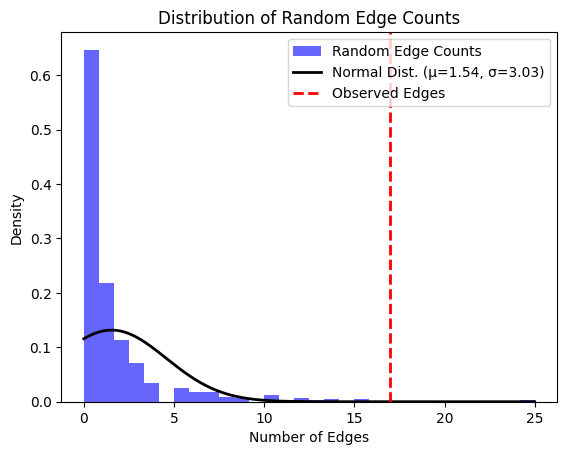

Genes mapped to HIV viral set point measurement: 
HIV viral set point measurement EFO_0006319
Genes mapped to HIV viral set point measurement: 
['SPCS3', 'HAFML', 'LINC02980', 'PDE7A', 'DT', 'DNAJC5B', 'ZFP90', 'KCNMB3P1', 'CAPZBP1', 'LINC01965', 'GALNT14', 'LINC02177', 'CMTM8', 'EPHA5', 'RNU6', '931P', 'RN7SKP199', 'MEPE', 'HSP90AB3P', 'MAD2L1', 'ADH5P4', 'NUFIP1P1', 'LINC02571', 'HLA', 'B', 'TSBP1', 'AS1', 'DRA', 'KCNQ5', 'TBC1D7', 'PHACTR1', 'WDR11', 'RPL19P16', 'KIF4B', 'RPL6P32', 'SCGB2A2', 'SCGB1D4', 'EIF4E2P2', 'GAP43', 'DEPTOR', 'LINC00624', 'CHD1L']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to schizophrenia, cytomegalovirus infection: 
schizophrenia, cytomegalovirus infection EFO_0001062
Genes mapped to schizophrenia, cytomegalovirus infection: 
['CTNNA3']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to bulimia nervosa: 
bulimia nervosa EFO_0005204
Genes mapped to bulimia nervosa: 
['PER

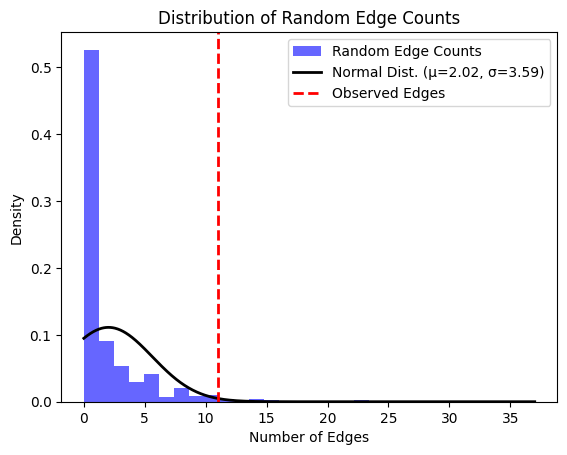

Genes mapped to pulse pressure measurement, migraine without aura, susceptibility to, 4: 
pulse pressure measurement, migraine without aura, susceptibility to, 4 MONDO_0011847
Genes mapped to pulse pressure measurement, migraine without aura, susceptibility to, 4: 
['HPSE2', 'LINC01765', 'NGF', 'AS1', 'MSL3B', 'TRPM8', 'PHACTR1', 'FHL5', 'ASTN2', 'FGF23', 'FGF6', 'LRP1', 'GFRA1', 'DLG2', 'SPOP', 'SLC35B1', 'TP53']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to pulse pressure measurement, migraine with aura: 
pulse pressure measurement, migraine with aura MONDO_0005475
Genes mapped to pulse pressure measurement, migraine with aura: 
['CHRM2', 'BPIFC', 'FHL5', 'LRP1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to occupation-related stress disorder: 
occupation-related stress disorder EFO_0005250
Genes mapped to occupation-related stress disorder: 
['UST']
The number of edges in the network is less 

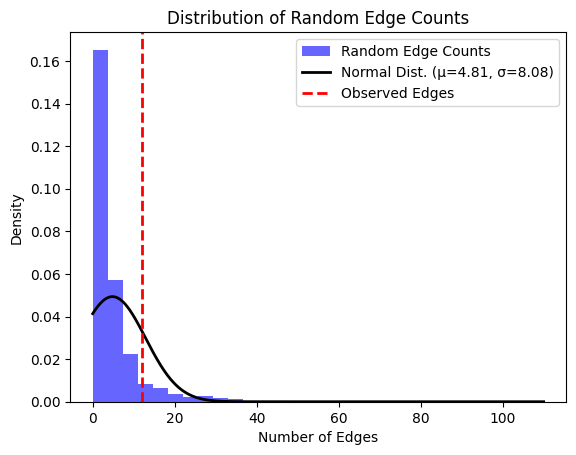

Genes mapped to plasma betaine measurement: 
plasma betaine measurement EFO_0007787
Genes mapped to plasma betaine measurement: 
['DMGDH', 'LY75', 'CD302', 'LINC02147', 'LINC02208', 'LINC02714', 'LINC02697', 'DELEC1', 'NOLC1', 'ELOVL3', 'RPA2P2', 'NRG3', 'LINC01937', 'RPS8P3', 'DCC', 'MYO16', 'LINC01965', 'LINC02755', 'DPY19L3', 'PDCD5', 'DCDC1', 'CLEC1A', 'CPS1', 'CBS', 'SLC6A12', 'LINC02976', 'IQSEC3', 'AS1', 'KDM5A', 'PKNOX1', 'BHMT', 'SLC22A1', 'CLCN6', 'LINC01149', 'GNMT', 'GTF2F2', 'BHMT2', 'PEMT']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to phosphatidylcholine 32:0 measurement: 
phosphatidylcholine 32:0 measurement EFO_0010372
Genes mapped to phosphatidylcholine 32:0 measurement: 
['RPL7P2', 'STK35', 'ZC3HC1', 'KLHDC10', 'FADS2', 'FADS1', 'GABRB3', 'MAN1A1', 'PTPRD']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to amyloid-beta measurement: 
amyloid-beta measurement EFO_0005194
Genes mappe

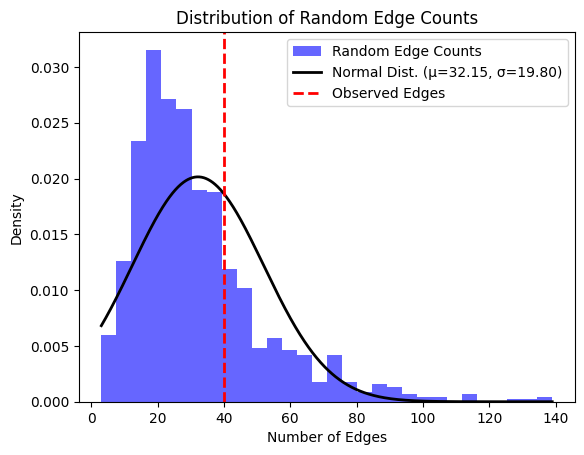

Genes mapped to phosphatidylcholine 32:1 measurement: 
phosphatidylcholine 32:1 measurement EFO_0010373
Genes mapped to phosphatidylcholine 32:1 measurement: 
['CDH19', 'RNU6', '1037P', 'LINC02195', 'C16orf82', 'GCKR', 'CSMD1', 'GPCPD1', 'SHLD1', 'JAKMIP2', 'SPINK1', 'LINC02484', 'SEC63P2', 'RPL36AP17', 'RFC3P1', 'RPL21P94', 'GVINP1', 'HJURP', '655P', 'Y_RNA', 'TLE1', 'DT', 'RNA5SP287', 'LINC02582', 'RN7SL401P', 'FADS2', 'LINC01854', 'PPIAP65', 'F9', 'NELL1', 'CEP162', 'LINC01611', 'ATF7IP2', '633P', 'PALM2AKAP2', 'LINC02645', 'PFKP', 'TMEM252', 'LINC01506']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to phosphatidylcholine 32:2 measurement: 
phosphatidylcholine 32:2 measurement EFO_0010374
Genes mapped to phosphatidylcholine 32:2 measurement: 
['GCKR', 'FADS2', 'NUFIP1P1', 'RNU7', '66P', 'TENM3', 'AS1', 'LINC03106', 'CAAP1', 'AIDAP3', 'METTL4', 'LINC02645', 'PFKP', 'DT', 'FADS1', 'MIB1']
The number of edges in the network is less than the m

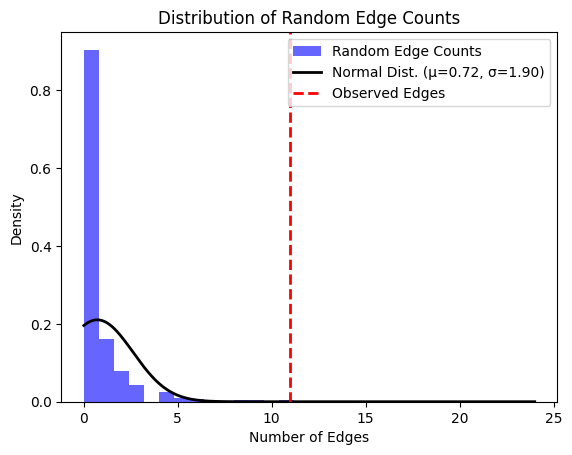

Genes mapped to cystatin C measurement, acute coronary syndrome: 
cystatin C measurement, acute coronary syndrome EFO_0005672
Genes mapped to cystatin C measurement, acute coronary syndrome: 
['CST3', 'CST4']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to sporadic amyotrophic lateral sclerosis: 
sporadic amyotrophic lateral sclerosis EFO_0001357
Genes mapped to sporadic amyotrophic lateral sclerosis: 
['UNC13A', 'C9orf72', 'EMICERI', 'KRT18P55', 'ANKRD29', 'RPS10P27', 'CHODL', 'EZRP1', 'ALCAM', 'DACH1', 'MACIR', 'PDZPH1P', 'HOXD10', 'MRAS', 'PCSEAT', 'LINC00111', 'MYOM2', 'LINC03021', 'TSPAN9', 'LINC00351', 'TFAP2A', 'LINC01645', 'LINC01741', 'NEDD4L', 'STON1', 'GTF2A1L', 'LINC01747', 'KRT18P3', 'NFATC2', 'MIR3667HG', 'RN7SKP252', 'LINC02215', 'RNU7', '34P', 'FSTL4', 'WSPAR', 'NAMPTP2', 'ASS1P10', 'TAF8', 'MAP3K7', 'MIR4643', 'TBXAS1', 'MACROD2', 'LINC02756', 'TUBB4BP4', 'LINC02412', 'NUDT4', 'ITGA9', 'CTNND2', 'LINC01685', 'HSPA5P1', 'LINC0

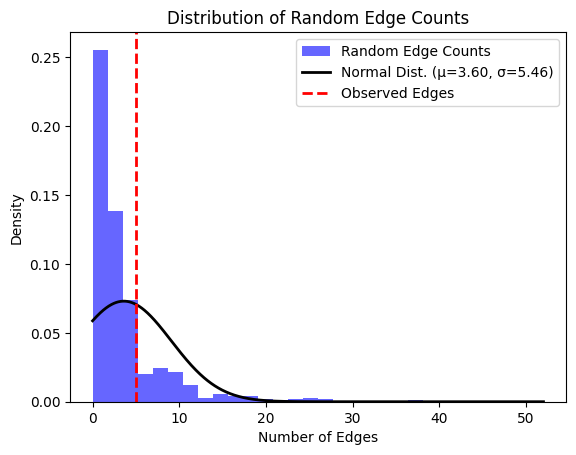

Genes mapped to hereditary hemochromatosis type 1: 
hereditary hemochromatosis type 1 EFO_0006513
Genes mapped to hereditary hemochromatosis type 1: 
['TF']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to bone quantitative ultrasound measurement: 
bone quantitative ultrasound measurement EFO_0004514
Genes mapped to bone quantitative ultrasound measurement: 
['ESR1', 'SPTBN1', 'RSPO3', 'CPED1', 'WNT16', 'LNCAROD', 'TMEM135', 'GPATCH1', 'CCDC170', 'LINC00895', 'SEPTIN5', 'LINC02763', 'THORLNC', 'LINC01956', 'LINC00529', 'MCTP2', 'RHPN2', 'VRK1', 'LINC02304', 'SETBP1', 'EEF1A1P14', 'RNU6', '983P', 'CLDN23', 'MFHAS1', 'PPP1R3B', 'DT', 'ZCCHC24', 'TBC1D22A', 'LINC01644', 'EN1', 'MARCO', 'SEM1', 'PSD3', 'SH2D4A', 'CCDC91', 'FAR2', 'BCAS3', 'GIMAP8', 'STRADBP1']
Random edges calculation completed

z score: 1.5717671535150484



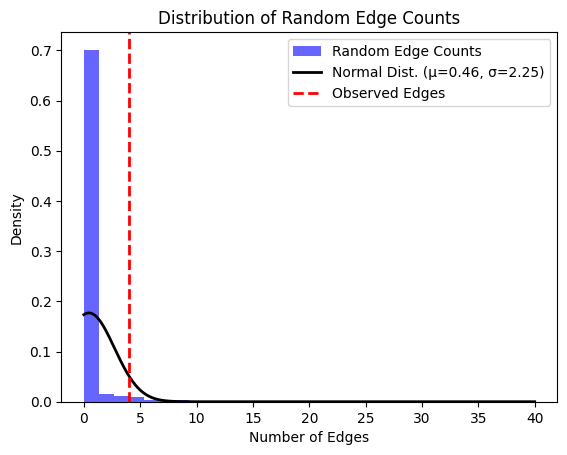

Genes mapped to velocity of sound measurement: 
velocity of sound measurement EFO_0005654
Genes mapped to velocity of sound measurement: 
['SPTBN1', 'RSPO3', 'CCDC170', 'CPED1', 'WNT16', 'LNCAROD', 'TMEM135', 'GPATCH1', 'LINC03009', 'DTX2P1', 'UPK3BP1', 'PMS2P11', 'FOXL1', 'LINC02188', 'ESR1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to contrast sensitivity measurement: 
contrast sensitivity measurement EFO_0005419
Genes mapped to contrast sensitivity measurement: 
['RNU6', '812P', 'REG3G', 'SPAG16', 'NGEF', 'NEU2', 'OR6C64P', 'PDZK1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to seasonality measurement: 
seasonality measurement EFO_0006876
Genes mapped to seasonality measurement: 
['B3GAT1', 'DT', 'LINC02706', 'LINC01523', 'LINC03079', 'RPS26P39', 'LINC02641', 'POLR2M', 'MYO16', 'ADAM7', 'AS1', 'SDC1', 'FXN', 'TJP2']
The number of edges in the network is less than the minimum requirement: 4


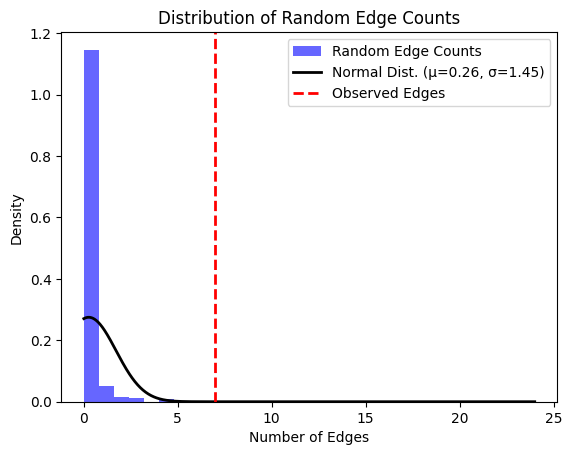

Genes mapped to social communication impairment: 
social communication impairment EFO_0005427
Genes mapped to social communication impairment: 
['LINC03003', 'LINC01435', 'RPL18P1', 'ATP5MC2P2', 'MYO1E', 'KIF12', 'COL27A1', 'DOCK1', 'EPB41L3', 'RMST', 'PAFAH1B2P2', 'CELF4', 'CLEC16A', 'HNRNPCP4', 'MTND5P34', 'RN7SL841P', 'OTOL1', 'TOMM22P6', 'KCNJ11', 'SAYSD1', 'KCNK5', 'SCN10A', 'SCN11A', 'SERPINA13P', 'TTC21B', 'LHFPL3', 'AS1', 'LMX1B', 'PLCB1', 'RPS27L', 'RAB8B']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to congenital left-sided heart lesions: 
congenital left-sided heart lesions EFO_0005938
Genes mapped to congenital left-sided heart lesions: 
['C16orf95', 'SYNPR', 'AS1', 'LINC02252', 'GJD2', 'MYH7B', 'ENSA', 'PRANCR', 'RABEPKP1', 'DACH1', 'LINC01249', 'RNU6', '649P', 'HNRNPA1P56', 'FRAS1', 'HULC', 'CASC15', 'LINC03005', 'GHRHR', 'ADCYAP1R1', 'ASB15', 'ZMAT4', '356P', 'FLI1', 'KCNMB2', 'HISLA', 'MGAT4A', 'P2RX4', 'IADEN', 'SNORA72', 'U

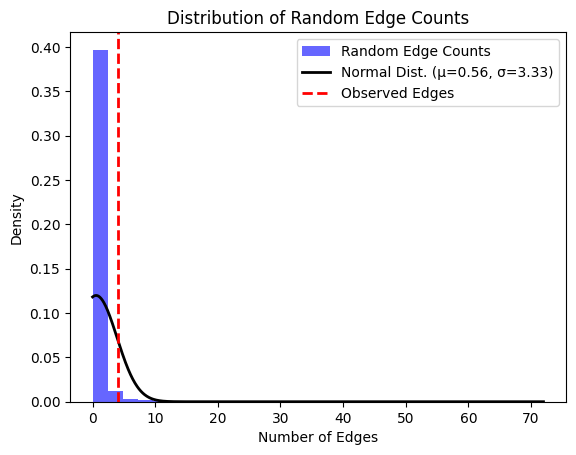

Genes mapped to appendicular lean mass: 
appendicular lean mass EFO_0004980
Genes mapped to appendicular lean mass: 
['C14orf39', 'SALRNA1', 'SMAD6', 'ADAMTSL3', 'AKAP13', 'ACAN', 'DOC2A', 'TLCD3B', 'ALDOA', 'FTO', 'LINC00917', 'FENDRR', 'SLC4A1', 'DBF4B', 'PLCD3', 'FLJ40194', 'ZNF652', 'AS1', 'STRADA', 'TCAM1P', 'GH1', 'CD79B', 'SMAD7', 'DYM', 'RNU4', '17P', 'MC4R', 'KIZ', 'ITCH', 'PIGU', 'NCOA6', 'ACSS2', 'GSS', 'TRPC4AP', 'EDEM2', 'PROCR', 'MMP24OS', 'MMP24', 'FAM83C', 'UQCC1', 'GDF5', 'FER1L4', 'SPAG4', 'RBM39', 'PHF20', 'EPB41L1', 'DSN1', 'RPL13P14', 'EYA2', 'XKR6', 'ARHGAP17', 'KRT18P16', 'LINC01170', 'ANKRD44', 'DT', 'NPM1P46', 'SLC12A4', 'LINC02086', 'COX6B1P2', 'PRAG1', 'MIR30D', 'RPL23AP56', 'GLIS3', 'LRMDA', 'VWA7', 'PPP6R3', 'GAL', 'LINC02182', 'ZNF469', 'ZBTB38', 'RIN3', 'KCNN3', 'PMVK', 'ADAMTS17', 'MFSD2B', 'ZFP1', 'CTRB2', 'GOLGA6L4', 'UBE2Q2P8', 'LCORL', 'HMCES', 'SOCS2', 'CRADD', 'BAHCC1', 'NUPR2', 'IFITM3P4', 'NOTCH4', 'TSBP1', 'BCKDHB', 'RPS4XP9', 'RSPO3', 'SPSB1', 

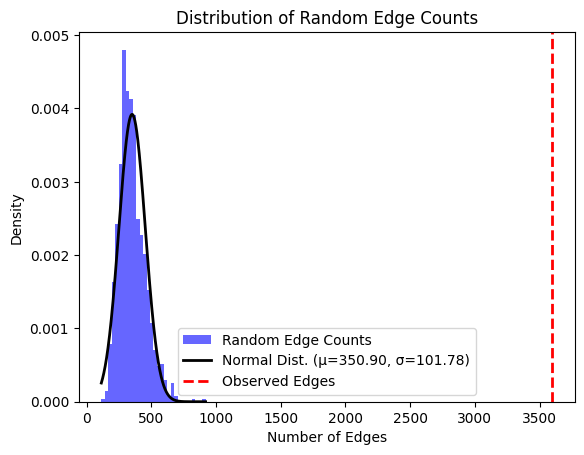

Genes mapped to autoimmune disease: 
autoimmune disease EFO_0005140
Genes mapped to autoimmune disease: 
['PLXNC1', 'C12orf42', 'SH2B3', 'ALDH2', 'SPATA13', 'FLT3', 'LINC02341', 'DLEU1', 'DOCK9', 'DT', 'RPS6P23', 'TSHR', 'GTF2A1', 'IGHG2', 'COPDA1', 'RASGRP1', 'RMI2', 'ADCY7', 'LINC02132', 'LINC01082', 'NEURL4', 'RAB5C', 'MYL4', 'ITGB3', 'PTPN2', 'CD226', 'TICAM1', 'PLIN3', 'TYK2', 'RPL39P38', 'LSM4', 'CPT1C', 'BANF2', 'RNU6', '192P', 'IRF4', 'EXOC2', 'BACH2', 'AHI1', 'LINC03004', 'SAMD5', 'SASH1', 'RNASET2', 'MIR3939', 'ELMO1', 'GIGYF1', 'POP7', 'IRF5', 'TNFRSF11B', 'LINC00824', 'TG', 'CCN4', 'MIR31HG', 'PTCSC2', 'PSMD5', 'CUTALP', 'LHX2', 'NEK6', 'IL2RA', 'LINC02649', 'ARID5B', 'LINC01475', 'PLEKHA1', 'CCDC88B', 'LNCRNA', 'IUR', 'FAM76B', 'RAB5B', 'MIR3681HG', 'PUS10', 'TMEM131', 'FAP', 'KCNH7', 'INPP1', 'MFSD6', 'STAT4', 'CTLA4', 'ICOS', 'GSTM5P1', 'PPARG', 'CBLB', 'Y_RNA', 'DZIP3', 'RETNLB', 'ARHGAP31', 'EAF2', 'SLC15A2', 'BCL6', 'AS1', 'LINC01991', 'LPP', 'MB21D2', 'LINC02498', 'L

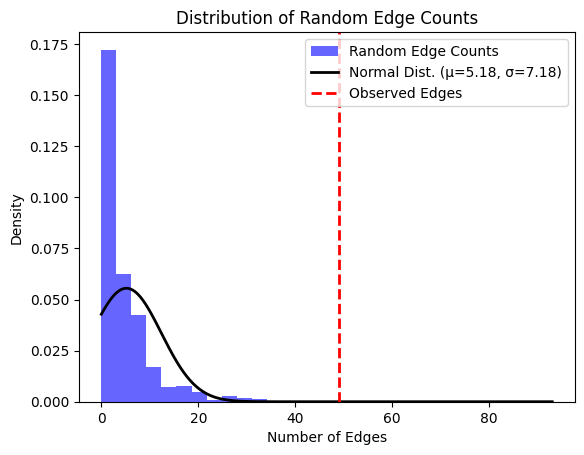

Genes mapped to isolated craniosynostosis: 
isolated craniosynostosis MONDO_0015337
Genes mapped to isolated craniosynostosis: 
['BMP7', 'BMP2', 'LINC01428']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to metopic craniosynostosis: 
metopic craniosynostosis EFO_0008511
Genes mapped to metopic craniosynostosis: 
['BBS9', 'BMP7', 'RNU6', '555P', 'PABPC5', 'AS1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to response to angiotensin-converting enzyme inhibitor, angioedema: 
response to angiotensin-converting enzyme inhibitor, angioedema EFO_0005532
Genes mapped to response to angiotensin-converting enzyme inhibitor, angioedema: 
['RNU6', '755P', 'LMX1A', 'DCLK1', 'KCNQ5', 'LINC01899', 'CBLN2', 'KDM2A', 'AMY1C', 'THAP3P1', 'RN7SL415P', 'RPL5P19', 'FGF12', 'RPL21P36', 'CRIM1', 'DT', 'THSD7A', 'TMEM106B', 'VWDE', 'PDE4D', 'KCNMA1', 'LINC02441', 'LINC02369', 'POM121L2', 'ADAMTSL1', 'TRPM1', 'RNU7', '88P',

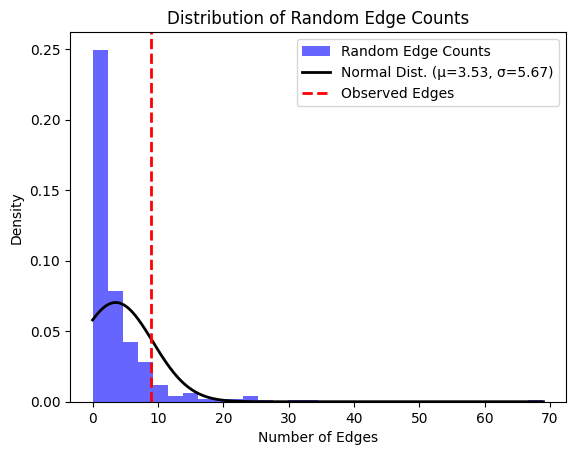

Genes mapped to B-cell acute lymphoblastic leukemia: 
B-cell acute lymphoblastic leukemia EFO_0000094
Genes mapped to B-cell acute lymphoblastic leukemia: 
['IKZF1', 'RNU6', '1091P', 'CCDC26', 'CDKN2A', 'ARID5B', 'GATA3', 'PIP4K2A', 'LHPP', 'ELK3', 'CEBPE', 'ERG', 'RPL6P5', 'METAP2P1', 'CPSF2', '366P']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to lymphopenia: 
lymphopenia MONDO_0003783
Genes mapped to lymphopenia: 
['LINC01163', 'LINC02667', 'TMEM72', 'AS1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to fecal incontinence: 
fecal incontinence EFO_0009523
Genes mapped to fecal incontinence: 
['PLB1', 'RNA5SP89', 'CDH7', 'PRPF19P1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to respiratory system disease: 
respiratory system disease EFO_0000684
Genes mapped to respiratory system disease: 
['COG6', 'LINC00393', 'UBAC2', 'NFKBIA', 'DNAJC8P1', 'RAD51B', 

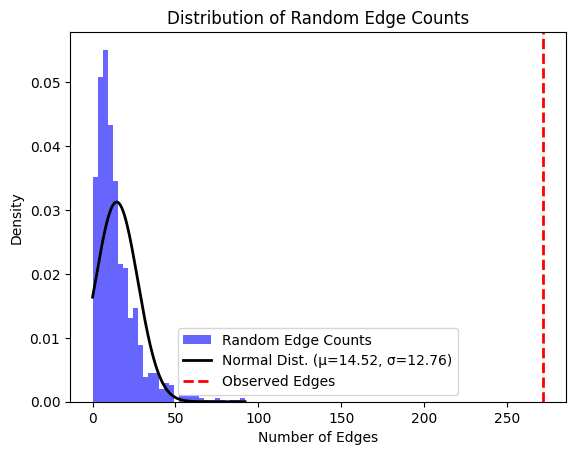

Genes mapped to retinal detachment: 
retinal detachment EFO_0005773
Genes mapped to retinal detachment: 
['COL22A1', 'GRM5', 'FAT3', 'RDH5', 'LINC01916', 'CDH7']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to retinal detachment, retinal break: 
retinal detachment, retinal break EFO_0010698
Genes mapped to retinal detachment, retinal break: 
['FSTL5', 'RGL1', 'CPAMD8', 'CASC20', 'LINC01713', 'CFAP299', 'SFSWAP', 'MICOS10P4', 'FRAS1', 'BMP3', 'ODAD2', 'RPL17P12', 'OTX2P2', 'COL2A1', 'TMEM30CP', 'RPL21P41', 'KBTBD8', 'DLG5', 'TRIM29', 'EFEMP2', 'CRTAP', 'SMYD1', 'FABP1', 'NOG', 'C17orf67', 'AXDND1', 'PLXDC2', 'GRM5', 'COL22A1', 'MAPT', 'LAMA2', 'FAT3', 'DNAJB6', 'PTPRN2']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to trauma complication, cataract: 
trauma complication, cataract MONDO_0005129
Genes mapped to trauma complication, cataract: 
['CDKN2C', 'EFNA3', 'Y_RNA', 'COQ8A', 'SOX2', 'OT', 'HLA', 'D

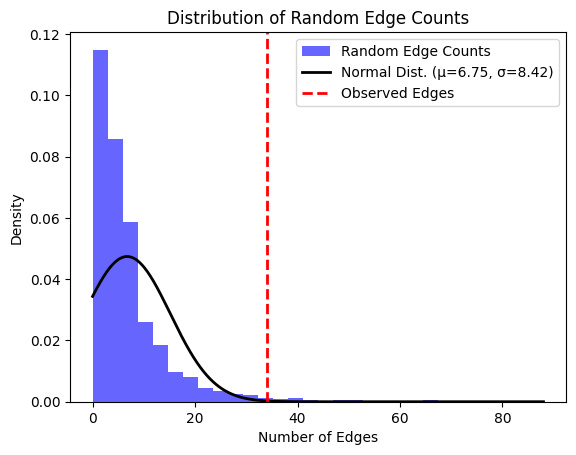

Genes mapped to word list delayed recall measurement: 
word list delayed recall measurement EFO_0006805
Genes mapped to word list delayed recall measurement: 
['LINC01801', 'BCAT2']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to diabetic macular edema: 
diabetic macular edema EFO_0009321
Genes mapped to diabetic macular edema: 
['MRPL19', 'LINC00343', 'RNA5SP38']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to allergic sensitization measurement: 
allergic sensitization measurement EFO_0005298
Genes mapped to allergic sensitization measurement: 
['LPP', 'LINC00299', 'IL2', 'NFKB1', 'RORA', 'C6orf15', 'PSORS1C1', 'CFL1', 'LINC02178', 'NKD1', 'TH2LCRR', 'IL13', 'LINC02552', 'SLC41A1', 'WDR36', 'RPS3AP21', 'PVT1', 'EMSY', 'LINC02757', 'TLR1', 'SLC25A46', 'BCLAF1P1', 'FASLG', 'SLC25A38P1', 'STAT6', 'IL1RL1', 'IL18R1', 'HLA', 'DQA1', 'DQB1', 'ADAD1', 'ANAPC1', 'COL21A1', 'MICA', 'AS1', 'IGHV7', '56', 'IG

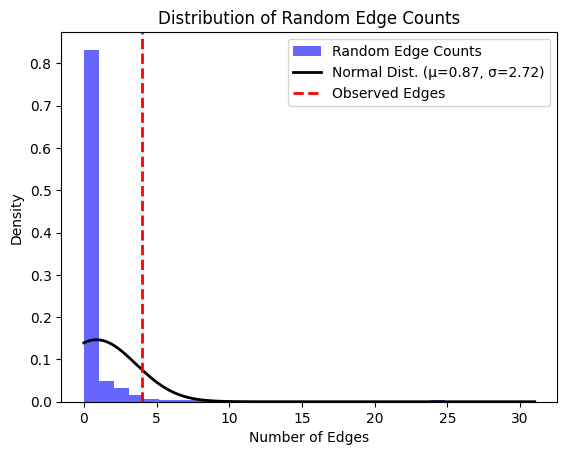

Genes mapped to juvenile dermatomyositis: 
juvenile dermatomyositis EFO_0000557
Genes mapped to juvenile dermatomyositis: 
['TSBP1', 'AS1', 'HLA', 'DRA', 'LINC02213', 'ROPN1L', 'MIR3142HG', 'GSDMB', 'RNU6', '695P', 'LINC02787', 'MRPS9', 'AS2', 'GPAT2', 'ADRA2B', 'IL17A', 'IL17F', 'LY86', 'TMEM114', 'SYBU', 'FANCC', 'TGFBR1', 'SULT2B1', 'MEF2C', 'EMP3', 'DRB9', 'DRB5', 'ARID3A']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to polymyositis: 
polymyositis EFO_0003063
Genes mapped to polymyositis: 
['HCP5', 'PTPN22', 'AP4B1', 'AS1', 'SDK2', 'UBE3B', 'MMAB', 'NAB1', 'FAM167A', 'BLK', 'IL18R1', 'SLC26A1', 'DGKQ', 'LRP5', 'HLA', 'DQB1', 'MTCO3P1', 'THSD7A', 'TMEM106B']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to myositis: 
myositis EFO_0000783
Genes mapped to myositis: 
['TSBP1', 'AS1', 'HLA', 'DRA', 'PTPN22', 'AP4B1', 'YDJC', 'CCDC116', 'DGKQ', 'STAT4', 'LINC02611', 'PRR5L', 'TRAF6', 'DQB1', 'MTCO3P1'

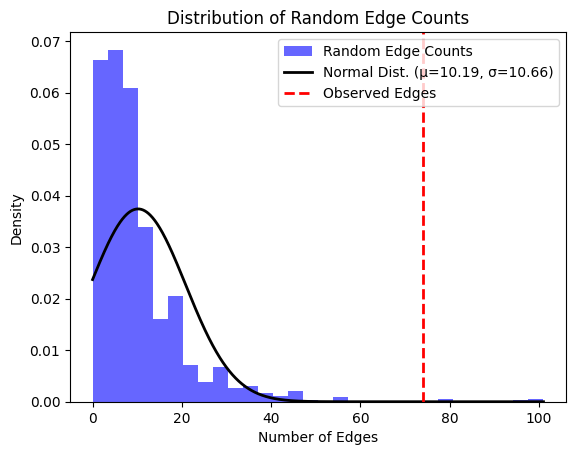

Genes mapped to neuroticism measurement: 
neuroticism measurement EFO_0007660
Genes mapped to neuroticism measurement: 
['CAMTA1', 'LINC01654', 'IGSF21', 'EIF4G3', 'FTLP18', 'GRIK3', 'LINC02796', 'SLC44A5', 'DNM3', 'RABGAP1L', 'DENND1B', 'GALNT2', 'GRHL1', 'KLF11', 'MYCNOS', 'MYCNUT', 'KLHL29', 'RNU6', '439P', 'RPL7P13', 'VRK2', 'WDPCP', 'RNF103', 'CHMP3', 'ACVR2A', 'LINC01876', 'PSMD14', 'DT', 'B3GALT1', 'MIR548AE1', 'ZNF804A', 'NBEAL1', 'ERBB4', 'VWC2L', 'ENSAP3', 'NYAP2', 'PLCL2', 'SATB1', 'AS1', 'ARPP21', 'GNAI2', 'SEMA3B', 'STAB1', 'ADAMTS9', 'AS2', 'LINC02040', 'GBE1', 'CADM2', 'LINC01990', 'BBX', 'ZFAND2AP1', 'NECTIN3', 'LSAMP', 'EPHB1', 'STAG1', 'SLC66A1LP', 'RN7SKP46', 'KCNIP4', 'SLC30A9', 'BEND4', 'SNCA', 'SLC7A11', 'LINC00499', 'NOCT', 'GPM6A', 'TENM3', 'MIR9', '2HG', 'ST8SIA4', 'RN7SL802P', 'FBXL17', 'LINC01023', 'LINC03000', 'AMD1P4', 'HIVEP1', '248P', '261P', 'MMS22L', 'MIR2113', 'ASCC3', 'CENPW', 'MIR588', 'EPB41L2', 'MAD1L1', 'PCLO', 'SEMA3E', 'SOCS5P1', 'GRM3', 'CTTNBP

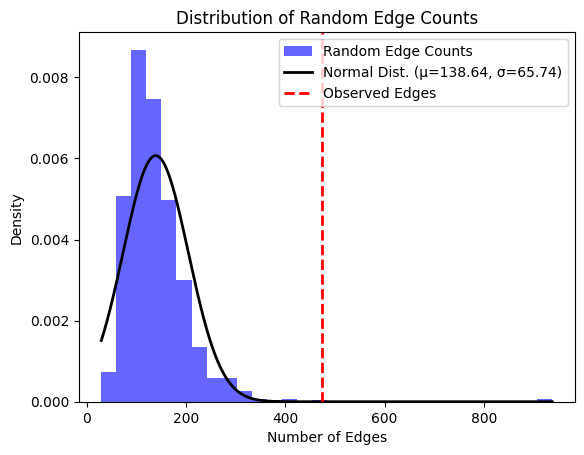

Genes mapped to Buruli ulcer disease: 
Buruli ulcer disease MONDO_0000327
Genes mapped to Buruli ulcer disease: 
['RPL21P39', 'PLOD2']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to JT interval: 
JT interval EFO_0007885
Genes mapped to JT interval: 
['SENP2', 'SLC12A7', 'RNU1', '88P', 'Y_RNA', 'NACA', 'KDM1B', 'ILRUN', 'AS1', 'ATP6V1FP1', 'HEY2', 'NCOA7', 'SLC2A12', 'HMGA1P7', 'RN7SL366P', 'C6orf118', 'RPS27P16', 'ZNRF2', 'TBX20', 'HERPUD2', 'CDK13', 'PON2', 'TSC22D4', 'IFRD1', 'DNAJB6', 'PRR35', 'LINC02183', 'CRNDE', 'ZFPM1', 'CLUH', 'SLC2A4', 'MAP2K4', 'LINC00670', 'RPS16P8', 'MIR4522', 'RSKR', 'RNU6', '1134P', 'GPR160P2', 'GSDMB', 'FHOD3', 'NFIC', 'MCOLN1', 'KANK2', 'MTDHP5', 'VN1R85P', 'PPP5C', 'KCNA7', 'SBK3', 'ZNF579', 'ENTPD6', 'TRPC4AP', 'STAU1', 'DDX27', 'EEF1A2', 'BRWD1', 'KCNJ4', 'KDELR3', 'RNF207', 'TCEA3', 'KCNQ4', 'PDE4B', 'SGIP1', 'OLFML2B', 'NOS1AP', 'ATP1B1', 'NME7', 'NUCKS1', 'RAB29', 'SLC8A1', 'SP3', 'LINC01960', 'TTN', 'M

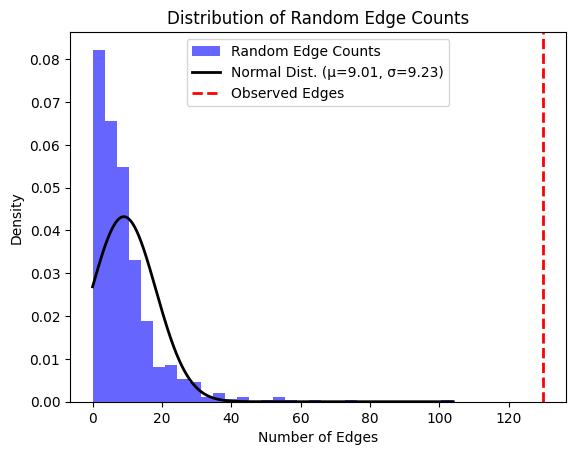

Genes mapped to COVID-19: 
Genes mapped to chronic rhinosinusitis: 
chronic rhinosinusitis EFO_1000024
Genes mapped to chronic rhinosinusitis: 
['BMP10', 'STX18', 'AS1', 'PTPRN2', 'LINC00587', 'CYLC2', 'WSB2', 'HLA', 'DQA1', 'GTF3AP1', 'IL33', 'ALOX15', 'LINC02676', 'LINC00709', 'BCLAF1P1', 'TSLP', 'DRB1', 'GARIN2', 'FUT2', 'MAMSTR', 'DRB9', 'ANKS1A', 'TCP11', 'SEC1P', 'WDR36', 'IL18R1', 'PGAM5P1', 'TMEM232', 'RANBP6', 'IL1RL1', 'SPEF2', 'IL7R', 'CLEC16A', 'GAS2L2', 'SMAD3', 'NEK6']
Random edges calculation completed

z score: 1.7884188457428618



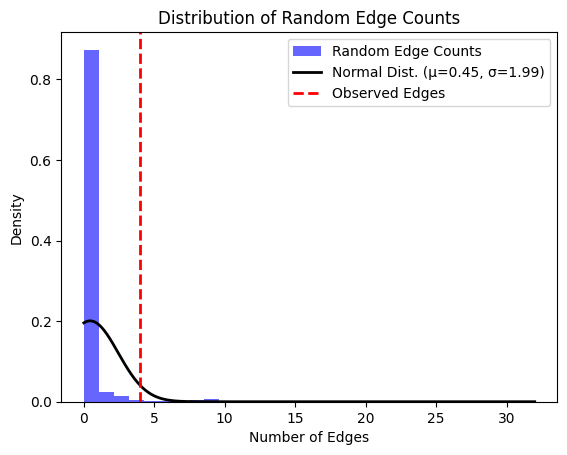

Genes mapped to fractures, ununited: 
fractures, ununited EFO_0009707
Genes mapped to fractures, ununited: 
['RPL35AP15', 'LINC00992', 'PSMB7', 'ADGRD2']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to Lewy body dementia: 
Lewy body dementia EFO_0006792
Genes mapped to Lewy body dementia: 
['RN7SL408P', 'SGK1', 'CTSV', 'GAS2L1P2', 'PLXNC1', 'FOXN3', 'JPH3', 'LINC00649', 'LINC01739', 'LINC00466', 'SLC26A9', 'RAB7B', 'RN7SL468P', 'STEAP3', 'RN7SL553P', 'MTARC2P1', 'TRPC6P9', 'LINC02899', 'FARS2', 'CYB5R4', 'LINC02857', 'GBA1', 'BIN1', 'NIFKP9', 'TMEM175', 'SNCA', 'AS1', 'APOE', 'ASH1L', 'HMGN2P18', 'KRTCAP2', 'MIR4519', 'BCL7C', 'MIR762HG', 'LINC02929', 'BLMH', 'HRH1', 'MAP3K15']
Random edges calculation completed

z score: 4.979589077002404



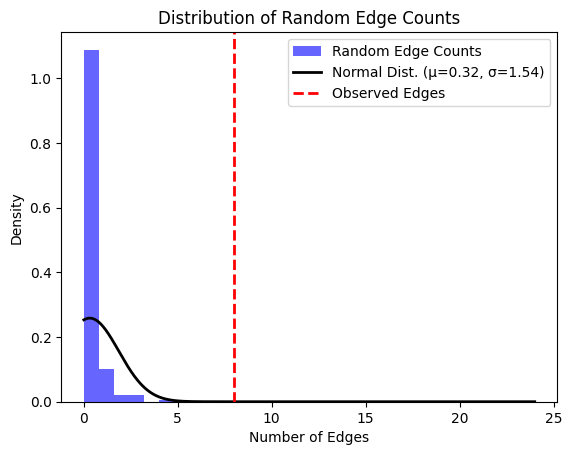

Genes mapped to cerebral amyloid angiopathy: 
cerebral amyloid angiopathy EFO_0006790
Genes mapped to cerebral amyloid angiopathy: 
['RN7SL571P', 'KCTD12', 'APOE', 'LINC01851', 'CYCSP6', 'LINC02433', 'Y_RNA', 'SLC28A1', 'CBR4', 'DT', 'SH3RF1', 'PRR16', 'ADAM24P', 'SLC7A2', 'NECTIN2', 'LINC02484', 'SEC63P2', 'ZSWIM5P3', 'LINC02466', 'MCC', 'SNX29', 'CPPED1', 'NCALD', 'NCK2', 'ECRG4', 'HDAC9', 'EVA1CP2', 'ALG1L7P', 'ULBP3', 'PPP1R14C', 'TTYH3', 'PLOD3', 'RNU6', '797P', 'RNU1', '58P', 'CPA6', 'KRT73', 'AS1', 'NEDD1', 'LINC02409', 'KSR2', 'GOLGA2P8', 'GABARAPL3', 'SPTLC3', 'LINC', 'PINT', 'DDIT4L', 'EMCN', 'DNER', 'RPLP1P5', 'MYCNUT', 'HPCAL1', 'LINC01151', 'KCNH8', 'EFHB', 'LINC03000', 'LINC02253', 'ADH1B', 'ADH1C', 'GALNT13', 'RNA5SP107', 'NDUFAF2P1', 'HS1BP3', 'ELMOD1', 'FAM124A', 'ADCY9', 'LINC02964', 'C2orf88', 'ARHGAP23', 'SRCIN1', 'NDUFB5P1', 'LINC00290', 'CACYBPP2', 'MIR548AE1', 'DCAF13P3', 'AP4E1', 'EIF4EBP2P3', 'POU3F2', 'EFR3A', 'DYSF', 'RPS20P10', 'RNF144A', 'SLC6A3', 'CDH1', '

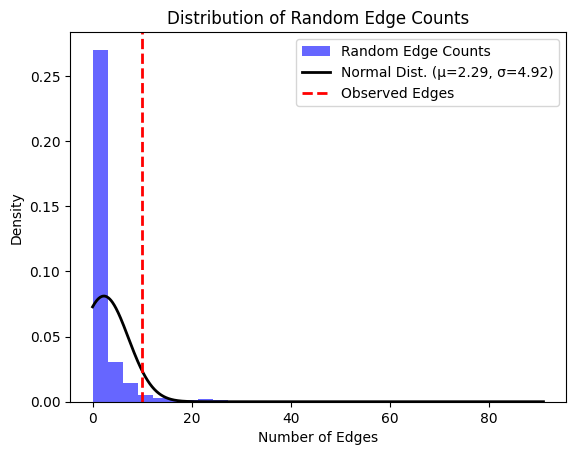

Genes mapped to diffuse plaque measurement: 
diffuse plaque measurement EFO_0010699
Genes mapped to diffuse plaque measurement: 
['PPARGC1A', 'LINC03004', 'TTC39B', 'RPL7P33', 'LINC01239', 'SUMO2P2', 'CYCSP27', 'LIPT2', 'LINC02457', 'LINC00173', 'NPAS3', 'EGLN3', 'APOE', 'BMP2', 'LINC01428', 'LINC02517', 'ACOX3', 'x', 'TENM4', 'LINC01770', 'TMEM88B', 'CFAP418', 'AS1', 'SRSF3P2', 'NEDD4L', 'RN7SKP174', 'EI24P4', 'FRG1', 'DT', 'PURPL', 'LINC02103', 'SLC30A8', 'MED30', 'CNTNAP2', 'OSBPL6', 'SMIM36', 'GARS1P1', 'RPS18P6', 'MTHFD2P1', 'PDE11A', 'ZBTB7C', 'RNA5SP456', 'MIR4431', 'ASB3', 'CNKSR1', 'WDR35', 'MATN3', 'CARMN', 'LINC00598', 'LINC02351', 'RHOBTB3', 'GLRX', 'DNAH11', 'SEPTIN7P3', 'MARK2P13', 'DNAJC6', 'SGCZ', 'RNA5SP461', 'LINC01029', 'ABAT', 'SP140', 'SP140L', 'No', 'mapped', 'genes', 'FHAD1', 'LINC00114', 'TEKT1', 'THAP5P1', 'NCAPG2', 'MYT1L', 'SGO1', 'VENTXP7', 'FAM32CP', 'KAT6B', 'LINC02568', 'LINC01250', 'GCNT4', 'SCAF1', 'SEMA3C', 'EIF4EP4', 'BMPR1B', 'LINC02172', 'LINC00616'

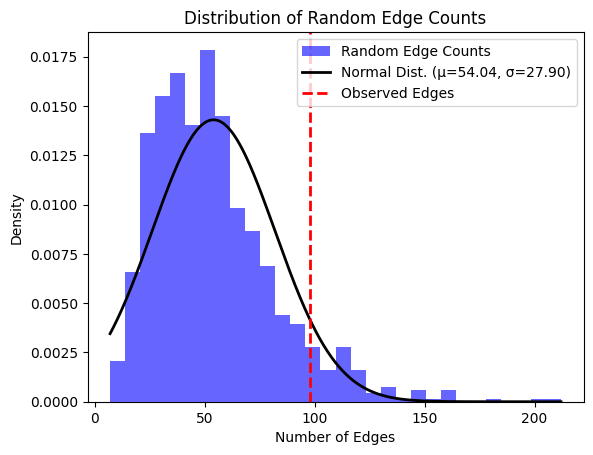

Genes mapped to brain infarction: 
brain infarction EFO_0004277
Genes mapped to brain infarction: 
['ALK', 'RBM47', 'RPL7P59', 'DPY19L4P2', 'SNX30', 'SLC35F3', 'LINC01254', 'APCDD1', 'EIF2B3', 'GIPC2', 'ZNF649', 'SNX9', 'TEX29', 'LINC02337', 'THBS2', 'AS1', 'FGF5']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to glucagon measurement: 
glucagon measurement EFO_0008463
Genes mapped to glucagon measurement: 
['MARCHF1', 'RNU6', '284P', 'Y_RNA', 'GALNTL5', 'ERCC6L2', 'AS1', 'LINC01924', 'LINC01916', 'CACNA1E', '164P', 'ARL2BPP5', 'HS6ST3', 'HSP90AB6P', 'LINC02694', 'POU3F2', 'MIR4708', 'FUT8', 'RPLP0P9', 'LINC01947', 'AMD1P4', 'HIVEP1', 'IQCE', 'TTYH3', 'SGO1P2', 'RRBP1P1', 'ASTN2', 'LINC02444', 'LINC02882', 'B3GLCT', 'RXFP2', '745P', 'LINC02205', 'C16orf87', 'ZNF536', 'RPL35P8', 'MIR3667HG', 'CAPN8', 'SLC35F3', 'SAMMSON', 'SLC2A2', 'TNIK', 'RTP2', 'BCL6', 'MELTF', 'PIK3R1', 'LINC02198', 'UBE2J1', 'RRAGD', 'TIAM2', 'DRGX', 'CALCB', 'GJB6', 'CRYL1

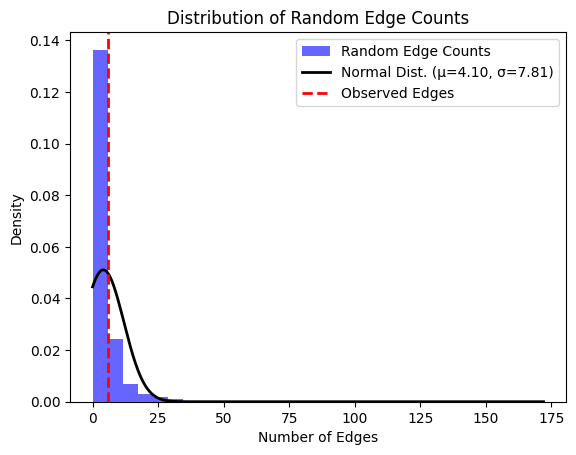

Genes mapped to Mastocytosis: 
Mastocytosis EFO_0009001
Genes mapped to Mastocytosis: 
['VEGFC', 'LINC02509', 'TBL1XR1', 'LRRC4C', 'SLC7A10', 'CEBPA', 'LINC01412', 'TRABD2B', 'CACNA1H', 'ZNF134', 'FTCD', 'PRDX5P1', 'LINC02005', 'HBG2', 'HBE1', 'OR51B5', 'OR51Q1', 'CYP2B6', 'RPTN', 'ARHGAP42', 'TPTEP2', 'CSNK1E', 'PDE4DIP', 'S100A7A', 'NRXN1', 'DT', 'FXR1', 'HLA', 'F', 'AS1', 'HCG4', 'V', 'MSH5', 'MOCS1', 'TRPV6', 'RMRPP5', 'RN7SKP120', 'ABCA2', 'LINC03059', 'RPL3P3', 'OTX2', 'POLRMTP1', 'TBC1D3P2']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to Corneal astigmatism: 
Corneal astigmatism EFO_1002040
Genes mapped to Corneal astigmatism: 
['NMUR1', 'RPL21P35', 'FMNL2', 'ZEB2', 'MTCO1P43', 'RNU7', '190P', 'CFAP299', 'BMP3', 'RPL22P13', 'PDGFRA', 'TOMM22P4', 'MIR4454', 'PIK3R1', 'LINC02198', 'CASC15', 'AOAH', 'NPM1P18', 'VIPR2', 'KCNU1', 'VAV2', 'PPIAP33', 'DMAC1', 'PARD3', 'TMEM135', 'MRPL11', 'ZBTB44', 'DT', 'ADAMTS8', 'LRRC23', 'SPSB2', 'MED13L

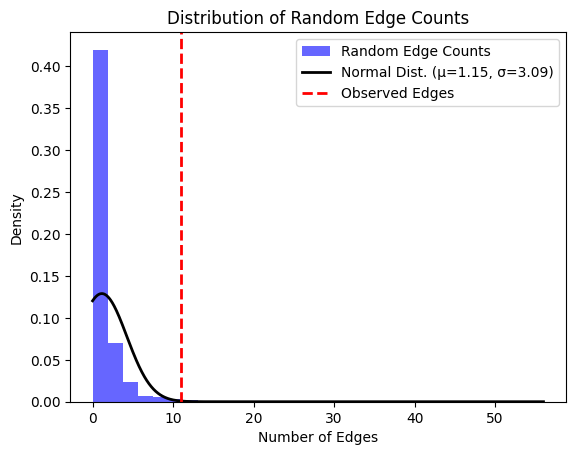

Genes mapped to depressive symptom measurement, anxiety disorder measurement: 
depressive symptom measurement, anxiety disorder measurement EFO_0007795
Genes mapped to depressive symptom measurement, anxiety disorder measurement: 
['AKAP8P1', 'JKAMPP1', 'CAMKMT', 'SORCS1', 'RNA5SP326', 'CDC25A', 'SMARCC1', 'ILDR1', 'RBM6', 'BLTP1', 'MTCO3P28', 'LINC02232', 'TTC6', 'SSTR1', 'CRACDL', 'PPIAP54', 'RNA5SP441', 'ACSF2', 'CHAD', 'PIEZO2', 'LINC01928', 'SLC7A10', 'CEBPA', 'ZNF578', 'ADRA1D', 'RPL7AP12', 'LINC00313', 'LINC00319', 'ITGB2', 'HPRT1P2', 'RPL19P11', 'SHANK2', 'LINC00430', 'UBBP5', 'TEX19', 'NARF', 'FOXK2', 'KCNG1', 'APOL5', 'GRM3', 'OPCML', 'WDR64', 'LINC01643', 'GBGT1', 'OBP2B', 'TRHDE', 'LINC02444', 'CCDC178', 'LINC02882', 'RBMX2P4', 'ETV1', 'LINC00159', 'ATXN7L3B', 'KCNC2', 'LINC02606', 'SLC25A33', 'TTC39C', 'FHIP2A', 'RNU6', '424P', 'FAM76A', 'DDX10', '654P', 'LINC02101', 'PLK2', 'TRPM3', 'NPLOC4', 'ARMH3', 'TUSC3', 'SIRPA', 'PICALM', 'TNNI1', 'TMEM250', 'LHX3', 'URB1', 'SDR16C

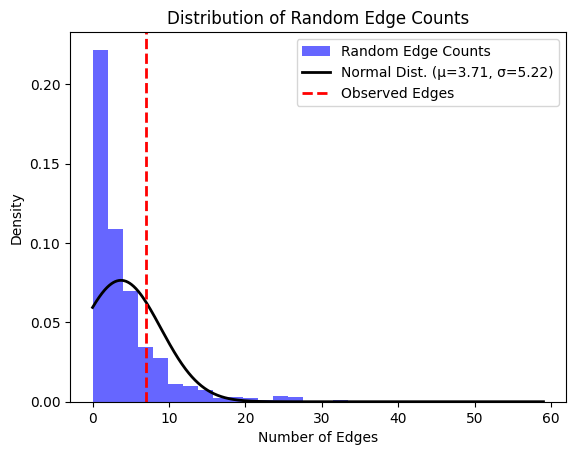

Genes mapped to central corneal thickness: 
central corneal thickness EFO_0005213
Genes mapped to central corneal thickness: 
['ZBTB44', 'DT', 'ADAMTS8', 'LUM', 'DCN', 'GLT8D2', 'LINC00540', 'FTH1P7', 'STON2', 'TJP1', 'FBN1', 'SMAD3', 'ADAMTS7P4', 'AKAP13', 'LRRK1', 'LINC02182', 'HS3ST3B1', 'RPS18P12', 'COL6A2', 'ARVCF', 'RXRA', 'COL5A1', 'LINC02542', 'TMEM248', 'COL8A2', 'TGFB2', 'WNT10A', 'CWC27', 'ADAMTS6', 'VAV2', 'BRD3OS', 'NT5DC3', 'CHSY1', 'ARL4C', 'LINC01173', 'LTBP1', 'RPL17P35', 'CYP2C61P', 'ADAMTS17', 'LINC00578', 'AQP4', 'AS1', 'MFF', 'COL4A3', 'HNRNPA1P31', 'STAG1', 'TIPARP', 'ZNF92', 'LINC03006', 'TANGO2', 'GTF2IRD1P1', 'CDO1', 'ATG12', 'ARID5B', 'BRD3', 'FNDC3B', 'LPAR1', 'LINC00598', 'FOXO1', 'LCN12', 'LINC02692', 'NR3C2', 'SPRY4', 'ADAMTS2', 'RUNX2', 'COL12A1', 'RN7SL7P', 'SAMD9', 'LOXL2', 'NDUFAF6', 'GLIS3', 'LINC01235', 'LINC00583', 'PPIAP39', 'HABP2', 'RNA5SP350', 'LINC02550', 'WNT7B', 'PRRX1', 'MROH9', 'CRIM1', 'CYP1B1', 'MLPH', 'RBMS3', 'ST3GAL6', 'RPL31P23', 'PCC

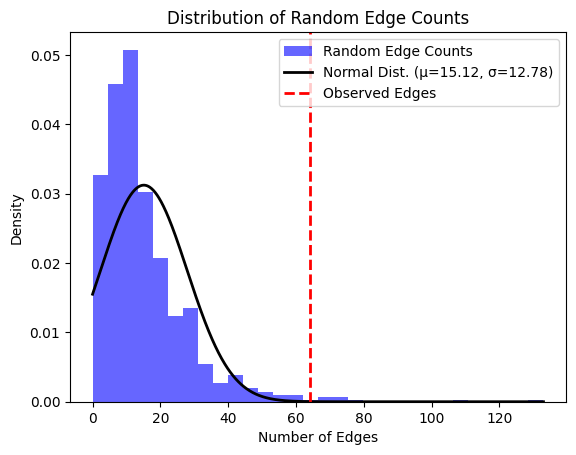

Genes mapped to lactose tolerance test: 
lactose tolerance test EFO_0010557
Genes mapped to lactose tolerance test: 
['PTMAP5', 'GYG1P2']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to revision of total hip arthroplasty, aseptic loosening: 
revision of total hip arthroplasty, aseptic loosening EFO_0010725
Genes mapped to revision of total hip arthroplasty, aseptic loosening: 
['LINC02484', 'SEC63P2', 'LINC01412', 'RN7SL318P', 'RPL23AP54', 'COX6A1P4', 'MTND4LP18', 'EDDM3A', 'EDDM3B', 'LINC01242', 'RPS6P12', 'RASEF', 'BNC2', 'VCX2', 'VCX3B', 'SLC6A6', 'ELAPOR2', 'ARMC8P1', 'RNU6', '983P', 'LINC01724', 'EIF4A1P3', 'MED27', 'ABO', 'SLC28A1', 'PDE8A', 'STPG2', 'AS1', 'CBLN4', 'RNA5SP487', 'BASP1', 'RAI14', 'DT', 'LINC02587', 'CRPPA', 'ACSF3', 'PHLPP1', 'BCL2', 'LINC02937', 'OSBPL10', 'LINC02070', 'VGLL3', 'ICE1', 'HMGB3P3', 'EPB41L4A', 'CDC123', 'RN7SL198P', 'THEM7P', 'OPCML', 'NUS1P2', 'HMGA1P6', 'U3', '27P', 'CELSR1', 'TRMT2B', 'TMEM35A', 'RPL1

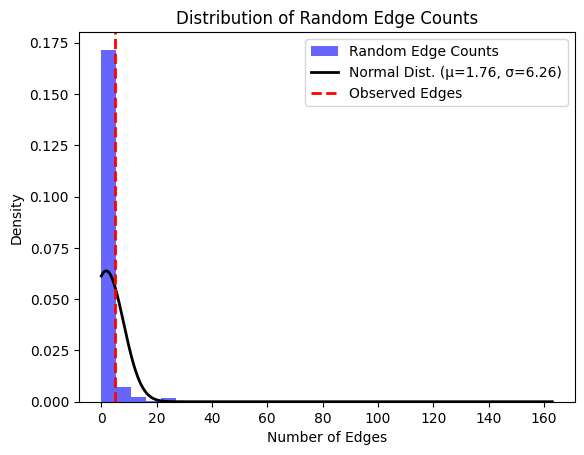

Genes mapped to atopic asthma: 
atopic asthma EFO_0010638
Genes mapped to atopic asthma: 
['FCER1G', 'FLG', 'CCDST', 'LCE1D', 'LCE1C', 'CD247', 'RORC', 'TDRKH', 'AS1', 'LCE5A', 'IVL', 'LINC01527', 'TNFRSF8', 'TNFSF4', 'SLC25A38P1', 'AIMP1P2', 'RFTN2', 'AP1S3', 'THAP4', 'BCLAF1P1', 'TSLP', 'SLC25A46', 'EHMT2', 'HLA', 'B', 'NFKBIL1', 'DRA', 'DRB9', 'AHI1', 'DT', 'ATG5', 'NCR3', 'UQCRHP1', 'BACH2', 'DQA1', 'DQB1', 'DRB1', 'TSBP1', 'SLC44A4', 'POLR1HASP', 'LINC02571', 'MTCO3P1', 'DQB3', 'DOA', 'DPA1', 'HCG24', 'COL11A2', 'DPB2', 'DPA3', 'IPCEF1', 'DOB', 'TAP2', 'LTA', 'MICA', 'MICB', 'PTPRK', 'HCP5', 'NOTCH4', 'ITGB8', 'EEF1A1P27', 'JAZF1', 'STEAP1B', 'RPL13AP18', 'RNU6', '1213P', 'ARRDC1', 'TRAF1', 'DNM1', 'ERMP1', 'RIC1', 'GLDC', 'RANBP6', 'GTF3AP1', 'SELENOTP1', 'TPD52L3', 'IL33', 'D2HGDH', 'GAL3ST2', 'IL1RL1', 'IL18R1', 'IL1RL2', 'LINC00299', 'PRCPP1', 'MAP4K4', 'SLC9A2', 'SLC9A4', 'SOCAR', 'MIR4435', '2HG', 'CRTAP', 'ILDR1', 'GLB1', 'LPP', 'PIGX', 'NRROS', 'TBL1XR1', 'LINC01208', 'MTN

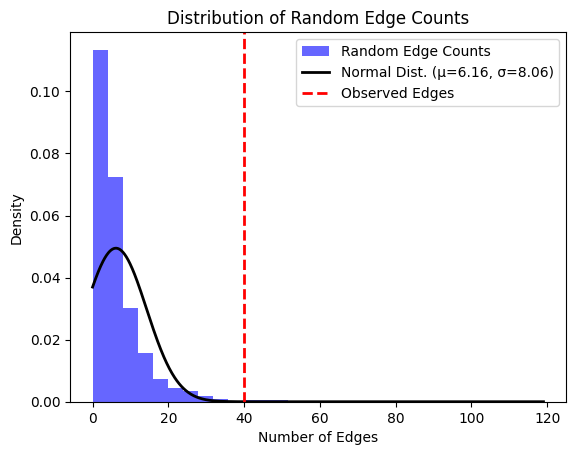

Genes mapped to refractory celiac disease: 
refractory celiac disease EFO_0009266
Genes mapped to refractory celiac disease: 
['ADCYAP1R1', 'NEUROD6']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to cryptosporidiosis: 
cryptosporidiosis MONDO_0015474
Genes mapped to cryptosporidiosis: 
['PRKCA', 'KRT18P58', 'OR56A4', 'APOOP5', 'LINC02141']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to female reproductive system disease: 
female reproductive system disease EFO_0009549
Genes mapped to female reproductive system disease: 
['CDC42', 'WNT4', 'OR5V1', 'HLA', 'W', 'POLR1HASP', 'TUBB', 'PSMD13', 'TNRC6B', 'GREB1', 'NRXN1', 'DT', 'BNC1', 'SH3GL3', 'ZFP57', 'F', 'AS1', 'MICA', 'DRB1', 'DQA1', 'PPP1R17', 'PDE1C', 'GABBR2', 'LINC02940']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to alcoholic liver disease: 
alcoholic liver disease EFO_0008573
Genes mapped to alcoh

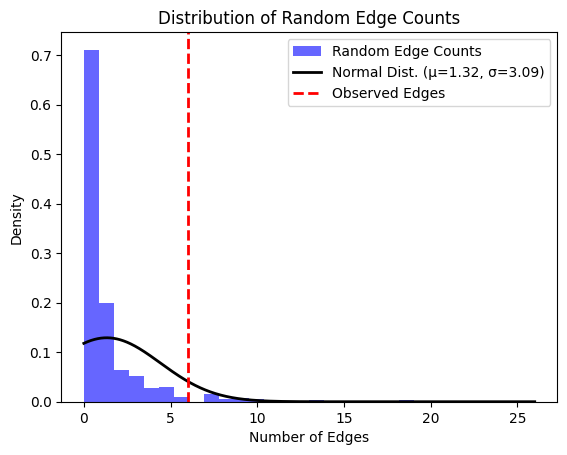

Genes mapped to bone mineral content measurement: 
bone mineral content measurement EFO_0007621
Genes mapped to bone mineral content measurement: 
['MEGF10', 'PTK2B', 'LINC00221', 'HERC2', 'CD53', 'LRIF1', 'FYCO1', 'STMN4', 'EEF1AKMT2', 'ABRAXAS2', 'CMYA5', 'ADGRV1', 'PVALB', 'CDC42EP3', 'AS1', 'PRKCB', 'DGKB', 'RSU1', 'KIF6', 'NDRG2', 'LINC00347', 'RIOK3P1', 'PTPRD', 'GUCY2C', 'NLRP1', 'WSCD1', 'H3P30', 'KHSRPP1', 'RNF182', 'CD83', 'GSTM3P1', 'NKX2', '2', 'RPH3AL', 'HSD17B11', 'BMS1', 'LINC02623', 'CLNK', 'CYP4F35P', 'RSU1P1', 'DUXAP3', 'TBCA', 'AP3B1', 'AGR3', 'CPED1', 'BASP1', 'HAR1A', 'MIR124', '3', 'EZRP1', 'ALCAM', 'CYCSP19', 'RN7SKP277', 'TBPL2', 'ARMC12', 'LINC01375', 'LINC00865', 'RBMS3', 'SLC35F3', 'UBE2K', 'PDS5A', 'PEPD', 'RPL21P131', 'RPS19P6', 'RPS20P25', 'RN7SL553P', 'MTARC2P1', 'NEPRO', 'LINC02269', 'LINC02268', 'EPHB3', 'MAGEF1', 'KCNA5', 'LINC02443', 'CNTN3', 'ARL2BPP4', 'HINT1', 'LINC00923', 'PRKCI', 'SKIL', 'ACKR3', 'COPS8', 'DT', 'CRPPA', 'LINC02988', 'RN7SL480P', 

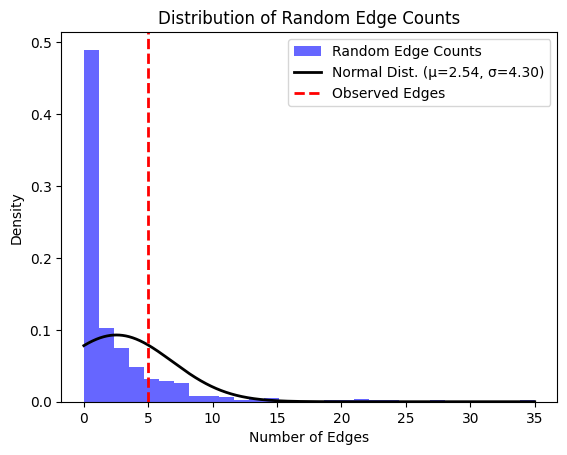

Genes mapped to Alzheimer disease, language impairment: 
Alzheimer disease, language impairment EFO_0005425
Genes mapped to Alzheimer disease, language impairment: 
['MNX1', 'AS1', 'UBE3C', 'DMRT2', 'RPS27AP14', 'NOP9', 'SUGCT', 'LINC01450', 'PTCSC2', 'SOX21', 'LINC00557', 'ERBB4', 'CACNA2D3', 'FAM163A', 'BLOC1S4', 'KIAA0232', 'LINC02645', 'PFKP', 'DT', 'MIR633', 'TRMT112P3']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to edema: 
edema EFO_0009373
Genes mapped to edema: 
['PLPPR5', 'DSG1', 'AS1', 'RGS10', 'YTHDC2', 'KCNN2', 'GPC5', 'ABO', 'SLC19A2', 'F5', 'SLC12A2', 'DT', 'ECE2', 'EEF1AKMT4', 'FTO', 'SEPHS1P2', 'LINC01579', 'CACNA1D', 'CTNNA3', 'LINC01875', 'TMEM18', 'HLA', 'DQA1', 'DQB1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to decreased attention: 
decreased attention NCIT_C117245
Genes mapped to decreased attention: 
['LINC02713', 'SNTG2', 'LINC01968', 'XXYLT1', 'TMEM248P1', 'LINC02379',

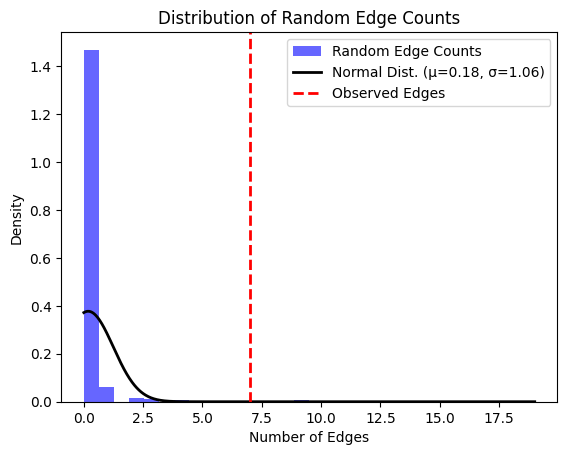

Genes mapped to cervical artery dissection: 
cervical artery dissection EFO_1000059
Genes mapped to cervical artery dissection: 
['PHACTR1', 'LRP1', 'ZNF804A', 'ELF2P4', 'FGGY', 'DT', 'JUN', 'LNX1', 'AS1', 'FALEC', 'ADAMTSL4', 'AS2', 'FHL5', 'PLCE1', 'IRAG1']
Random edges calculation completed

z score: 3.9081654142275397



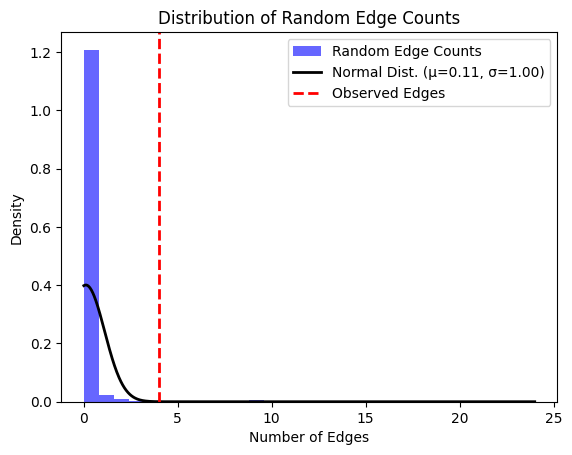

Genes mapped to response to transplant, GFR change measurement: 
response to transplant, GFR change measurement EFO_0006829
Genes mapped to response to transplant, GFR change measurement: 
['UMOD', 'PDILT', 'CDH23', 'LINC01121', 'MARCHF1', 'HMHB1', 'RN7SL87P', 'ELAVL2', 'ADRA2A', 'BTBD7P2']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to cryoglobulinemia: 
cryoglobulinemia EFO_0005846
Genes mapped to cryoglobulinemia: 
['NOTCH4', 'HLA', 'DRB1', 'DQA1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to carotid plaque build: 
carotid plaque build EFO_0006501
Genes mapped to carotid plaque build: 
['FAM89A', 'MXD1', 'RNU6', '1197P', 'JPH1', 'SQOR', 'MTND5P40', 'SYNM', 'AS1', 'RNA5SP79', 'C1orf198', 'LINC01643', 'GHSR', 'TNFSF10', 'C12orf75', 'CASC18', 'PES1P2', 'RPL3P11', 'TGFBR3', 'BRDT', 'MRPL37', 'SPIRE1', 'HMGB1', 'ATRNL1', 'CCL26', 'FAT1', 'MRPS36P2', '138P', 'KCNH8', 'CDKN2B', 'SFXN2', 'WBP1L', 'KC

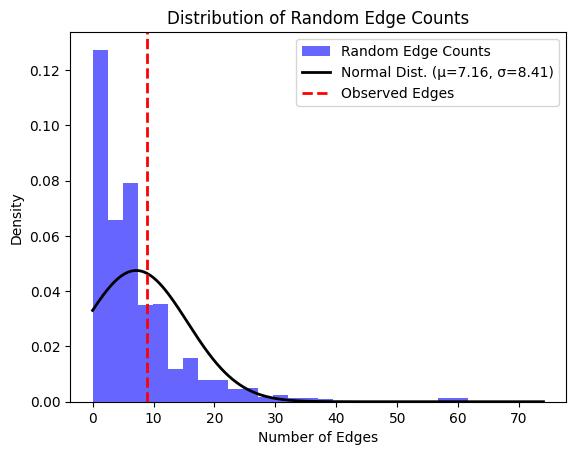

Genes mapped to height-adjusted body mass index: 
height-adjusted body mass index EFO_0005851
Genes mapped to height-adjusted body mass index: 
['ADCY3', 'FTO']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to irritable bowel syndrome: 
irritable bowel syndrome EFO_0000555
Genes mapped to irritable bowel syndrome: 
['PCDH15', 'AFG2A', 'HES6', 'PER2', 'KDELR2', 'DAGLB', 'NCAM1', 'HLA', 'C', 'USP8P1', 'LINC01755', 'DPH5', 'DT', 'S1PR1', 'RBMS3', 'U3', 'CFAP20DC', 'STK17A', 'ASB4', 'FAM187B2P', 'LINC02025', 'CADM2', 'PRRC2A', 'PHF2', 'RN7SL618P', 'ZNF646P1', 'DOCK9', 'PABPC4', 'HEYL', 'FAF1', 'RNA5SP63', 'COP1', 'WNT7A', 'LINC02082', 'PPA2', 'HHIP', 'ANAPC10', 'RNU4', '69P', 'RPL23AP44', 'HSPA4', 'HMGN4', 'ABT1', 'VN1R10P', 'ZNF204P', 'H4C13', 'H3C12', 'LINC01623', 'ZNF90P2', 'POLR1HASP', 'HCG18', 'HCG20', 'LINC00243', 'TCP11', 'SCUBE3', 'MFHAS1', 'CTSB', 'OR7E158P', 'SPATA31D1', 'FCHSD2', 'IUR1', 'LINC02763', 'THSD4', 'SCAPER', 'CFDP1', 'SMG6', 

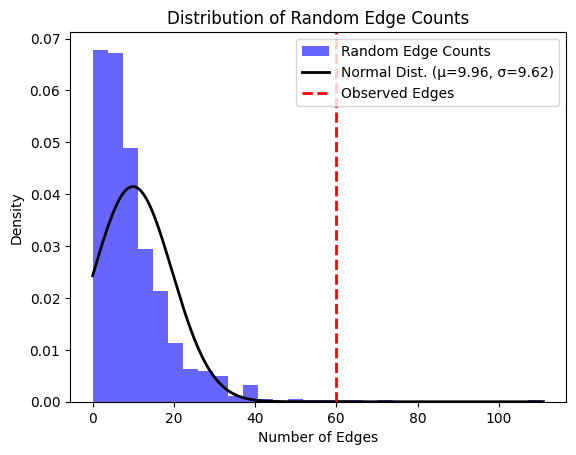

Genes mapped to insulin metabolic clearance rate measurement: 
insulin metabolic clearance rate measurement EFO_0006830
Genes mapped to insulin metabolic clearance rate measurement: 
['SLC22A16', 'COX6C', 'SLC43A3', 'RPS6KA1', 'RBM24', 'ST8SIA6', 'PRPF38AP2', 'PLEKHB1', 'ZZEF1', 'HMG20A', 'LINGO1', 'DCC', 'GNA15', 'DT']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to acute insulin response measurement: 
acute insulin response measurement EFO_0006831
Genes mapped to acute insulin response measurement: 
['ASTN2', 'YIF1A', 'MTNR1B', 'PTPRM', 'RALBP1P1', 'LINC02053', 'SNX24', 'CDKAL1', 'IKZF1', 'MICU3', 'ZDHHC2', 'ATP2A3', 'CDKN2B', 'AS1', 'P2RY2', 'ATP2A2', 'LINC02092', 'PLUT', 'HNF1A', 'ARAP1', 'CYCSP6', 'RNU6', '827P', 'LINC02687', 'CHST1', 'IGF2BP2', 'CARD9']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to disposition index measurement: 
disposition index measurement EFO_0006832
Genes mapped to disp

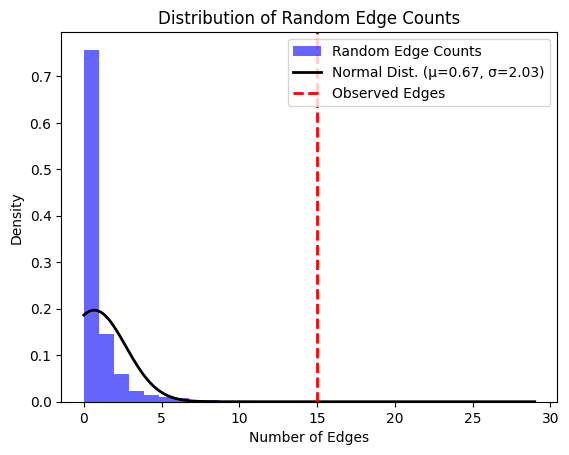

Genes mapped to ossification of the posterior longitudinal ligament of the spine: 
ossification of the posterior longitudinal ligament of the spine EFO_0005895
Genes mapped to ossification of the posterior longitudinal ligament of the spine: 
['SRSF10P2', 'HSPBAP1P1', 'RSPO2', 'AURKBP1', 'TCP1P3', 'LINC02468', 'LINC00536', 'EIF3H', 'CCDC91', 'CDC5L', 'SUPT3H', 'DNMT3A', 'DLX6', 'AS1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to perianal Crohn's disease: 
perianal Crohn's disease EFO_0005627
Genes mapped to perianal Crohn's disease: 
['PLCXD2', 'PHLDB2']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to chemerin measurement: 
chemerin measurement EFO_0004573
Genes mapped to chemerin measurement: 
['PTCH1', 'ERCC6L2', 'AS1', 'PI16', 'EDIL3', 'OR10J8P', 'OR10J9P', 'LINC02444', 'LINC02882', 'GRM8', 'ATG7', 'RNU6', '449P', 'UNC13C', 'ACTR3C', 'RARRES2', 'REPIN1', 'LRRC61', 'MTCO3P1', 'HLA', 'DQB3']
The

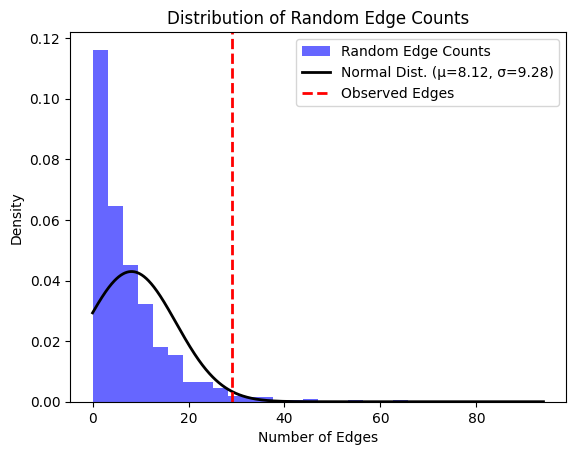

Genes mapped to depressive symptom measurement, stressful life event measurement: 
depressive symptom measurement, stressful life event measurement EFO_0007781
Genes mapped to depressive symptom measurement, stressful life event measurement: 
['RGS10', 'TIAL1', 'RNA5SP173', 'NDUFB5P1', 'LINC01162', 'CNTN6', 'MTAP', 'LINC02343', 'COX10', 'DT', 'GATA6', 'AS1', 'LINC01900', 'TSC22D1', 'DSE', 'MAT2AP1', 'LINC02042', 'LINC01762', 'MIMT1', 'RPL7AP69', 'ELOVL6', 'RPL6P32', 'RNA5SP199', 'AIDAP3', 'METTL4', 'SDR16C5', 'SNRPGP16', 'MTNR1B', 'ARMH4', 'LYZ', 'YEATS4', 'RALYL', 'FRMD4A', 'PIWIL4', 'WAPL', 'RPL7AP8', 'RPL18AP17', 'RPL21P110', 'PIEZO2', 'LINC01928', 'ZCCHC2', 'MCCC2', 'CARTPT', 'SNORA75B', 'RPS7P6', 'LINC02269', 'RIPK1', 'LINC00587', 'CYLC2', 'FAM171A1', 'RPS3AP17', 'PCDH7', 'KALRN', 'MTHFD2P5', 'PCLO', 'KCNQ1', 'TMEM260', 'RPL36AP1', 'LINC01208', 'MTND5P15', 'SNCAIP', 'BCL11A', 'RN7SL361P', 'TP63', 'TMEM74', 'TRHR', 'KIAA1958', 'MDGA2', 'PA2G4P3', 'CDH2', 'KAZN', 'BHLHE40', 'RNF10P1

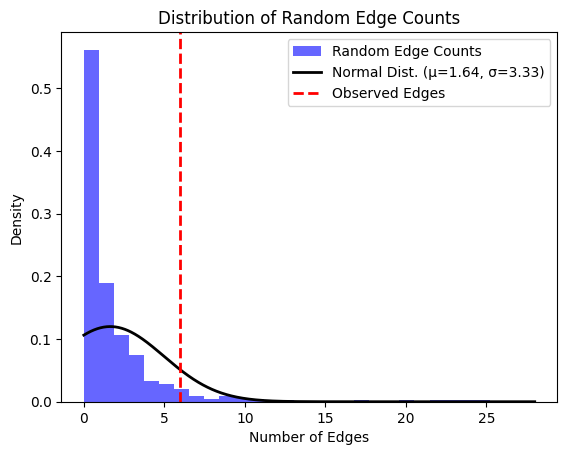

Genes mapped to ACPA-positive rheumatoid arthritis: 
ACPA-positive rheumatoid arthritis EFO_0009459
Genes mapped to ACPA-positive rheumatoid arthritis: 
['TAP2', 'HLA', 'DRB1', 'DQA1', 'MTCO3P1', 'DQB3', 'DQB1', 'DOB', 'DRA', 'DRB9', 'TSBP1', 'AS1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to idiopathic dilated cardiomyopathy: 
idiopathic dilated cardiomyopathy EFO_0009094
Genes mapped to idiopathic dilated cardiomyopathy: 
['Metazoa_SRP', 'CDH10', 'MEF2C', 'AS1', 'LINC02161', 'LINC03000', 'PHACTR1', 'SAMD5', 'SASH1', 'FAM120B', 'NXPH1', 'GAPDHP68', 'THSD7A', 'TMEM106B', 'NDUFB9P2', 'CAPZA1P4', 'MGAM', 'TCAF1', 'OR2F2', 'ADAM7', 'RALY', 'LINC03079', 'LINC00494', 'HAR1A', 'MIR124', '3', 'IFTAP', 'RPL7AP56', 'LINC01488', 'CCND1', 'ZNF970P', 'AK6P2', 'LINC02882', 'TBX5', 'RN7SKP216', 'LINC00343', 'PRSS29P', 'TPSP2', 'WWOX', 'JPH3', 'VMP1', 'DNAH17', 'EEF1A1P14', 'RNU6', '983P', 'IL19', 'CACNB4', 'RFTN2', 'MARS2', 'BOLL', 'DSTNP5', 'PARD3B', 

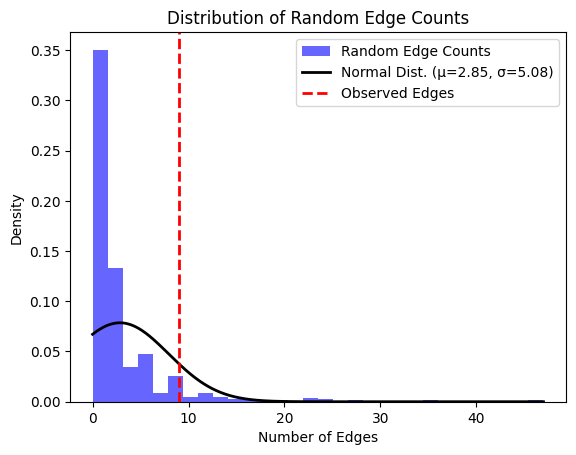

Genes mapped to initial pursuit acceleration: 
initial pursuit acceleration EFO_0008434
Genes mapped to initial pursuit acceleration: 
['TMEM250', 'LHX3', 'TEX29', 'LINC02337', 'COPS5P1', 'EPHA7', 'CC2D2A', 'FBXL5', 'LRRTM4', 'RPL38P2', 'IL20RB', 'RNA5SP142', 'RASGEF1C', 'DNAAF5', 'KCNMA1', 'TMEM132D', 'PFAS', 'LINC01440', 'CBLN4', 'CYB5R3', 'LMO7', 'LINC01717', 'LINC01774', 'Y_RNA', 'RNF32', 'DT', 'LTN1', 'LINC02498', 'MIR572', 'PCDH12', 'PLCB4', 'RPN2', 'STX2', 'ZNF740', 'LINC02335', 'HNF4GP1', 'IPO8', 'ADH5P4', 'NUFIP1P1', 'NRXN3', 'C5orf67', 'MAP3K1', 'RHBG', 'C5orf60', 'CBY3', 'SLC39A8', 'ZYXP1', 'FAM135B', 'NT5C1B', 'LINC01376', 'NUP42', 'GPNMB', 'LINC01307', 'BMS1P4', 'AGAP5', 'RNU6', '1060P', 'SPTLC1P2', 'SPAG16', 'CABLES1', 'MED13', 'LINC01795', 'LINC01122', 'LHFPL3', '675P', 'TEX51', 'NBPF22P', 'COX7C', 'DPY19L4P2', 'CNTNAP2', 'LYZL6', 'CCL16', 'PURPL', 'TMEM174', 'LINC02230', '727P', 'LINC02488', 'TTC7A', 'EZRP1', 'ALCAM', 'LINC02479', 'ARHGEF10L', 'SPP2', 'RPS20P12', 'CCDC1

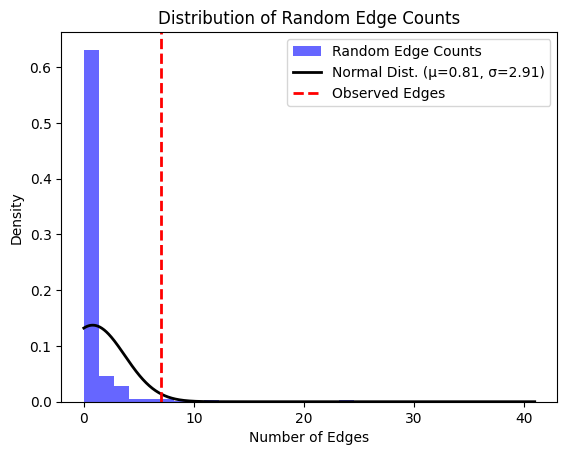

Genes mapped to heart rate response to recovery post exercise: 
heart rate response to recovery post exercise EFO_0009185
Genes mapped to heart rate response to recovery post exercise: 
['RNF220', 'RNA5SP94', 'MIR4432HG', 'CNTN3', 'NIPA2P2', 'LINC02981', 'KIAA0087', 'GNGT1', 'GNG11', 'SRRT', 'CAV1', 'CHRM2', 'SYT10', 'RNU6', '400P', 'RN7SL865P', 'LINC02463', 'PAX2', 'KNOP1P1', 'RN7SL38P', 'RGS6', 'FUT5', 'NDUFA11', 'POP4', 'PLEKHF1', 'PRDM6', 'SERINC2', 'SATB1', 'AS1', 'MGC32805', 'LINC02201', 'CCDC141', 'GRIK2', 'LINC02852', 'LETR1', 'NEGR1', 'LINC03095', 'ACHE', 'RN7SL549P', 'PHOX2A', 'CLPB', 'LINC02796', '508P', 'ZNF970P', 'AK6P2', 'CPNE5', 'PPIL1', 'CPNE8', 'SCN10A', 'CAV2', 'AK6P1', '472P', 'GNB2', 'MYH6', 'KIAA1755', '113P', 'LINC01549']
Random edges calculation completed

z score: 6.688506777902235



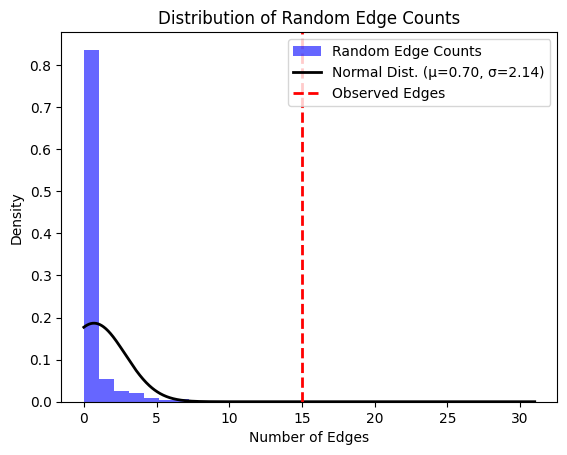

Genes mapped to glucose metabolism decline measurement: 
glucose metabolism decline measurement EFO_0009392
Genes mapped to glucose metabolism decline measurement: 
['LINC02742', 'TBC1D8', 'PPP4R3A', 'PHACTR1', 'HLA', 'C', 'VPS53', 'TYW1', 'CDH23', 'OSR1', 'LINC01808', 'AGPAT3', 'PCSK5', 'COL4A3', 'MFF', 'DT', 'USP6NL', 'AS1', 'ECHDC3']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to response to darapladib, lipoprotein-associated phospholipase A(2) change measurement: 
response to darapladib, lipoprotein-associated phospholipase A(2) change measurement EFO_0008432
Genes mapped to response to darapladib, lipoprotein-associated phospholipase A(2) change measurement: 
['CELSR2', 'PLA2G7', 'APOE']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to vesicoureteral reflux: 
vesicoureteral reflux EFO_0007536
Genes mapped to vesicoureteral reflux: 
['PRKN', 'ENG', 'OPCML', 'CATSPERG', 'RNA5SP94', 'MIR4432HG', '

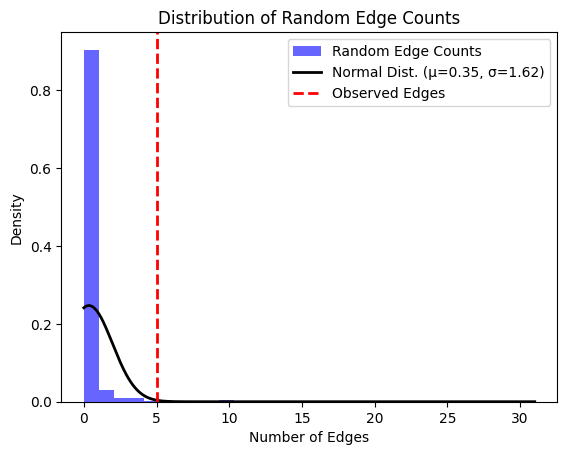

Genes mapped to exploratory eye movement measurement: 
exploratory eye movement measurement EFO_0007700
Genes mapped to exploratory eye movement measurement: 
['CCND3', 'Y_RNA', 'RNF32', 'DT', 'CCAR2', 'BIN3', 'FARSBP1', 'WARS2P1', 'GALNT18', 'KRT18P59', 'PKNOX2', 'ITFG2', 'AS1', 'CACNA1C', 'TEX22', 'MAN2A1', 'RPL23AP28', 'PAX3', 'HS3ST1', 'LINC02360', 'ANTXR2', 'RPSAP39', 'LINC00992', 'TMEM200A', 'LRMDA', 'CRACD', 'LINC01255', 'SLC35G4', 'GATA2', 'CDKN2B', 'LINC02343', 'LINC00457', 'PLEKHG7', 'EEA1', 'FYB2', 'SLC66A2', 'HSBP1L1', 'LINC01954', 'ADAM12', 'ADRB2', 'SH3TC2', 'ARSJ', 'UGT8', 'NLRP13', 'NLRP8', 'MBOAT1', 'DMRT1', 'DMRT3', 'LINC01648', 'MATN1', 'PID1', 'CACNA2D3', 'LMNB1', 'IRX5', 'MTND5P34', 'RMST', 'PAFAH1B2P2', 'CFAP61', 'UTRN', 'EPM2A', 'DAO', 'NRXN1', 'CCDC141', 'TDRP', 'ERICH1', 'RNA5SP224', 'RNA5SP225', 'A2ML1', 'PPP1R2P5', 'LINC01789', 'KRT18P42', 'CEACAM22P', 'LINC01435', 'CTNNA2', 'ANKRD11P1', 'TNFRSF10C']
Random edges calculation completed

z score: 6.468929248277

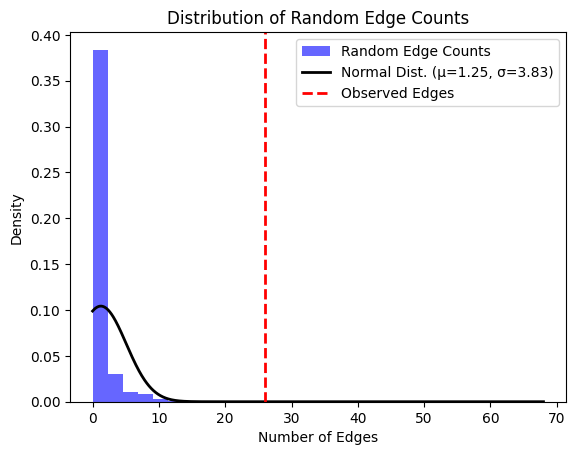

Genes mapped to psoriasis vulgaris: 
psoriasis vulgaris EFO_1001494
Genes mapped to psoriasis vulgaris: 
['PLCL2', 'RDUR', 'CDKAL1', 'CAMK2G', 'C10orf55', 'BHLHE40', 'AS1', 'RPL31P43', 'CHCHD4P2', 'RIGI', 'RDX', 'PRDX5', 'CCDC88B', 'RNF114', 'RN7SL51P', 'RN7SL18P', 'STX1B', 'ZMIZ1', 'PSMA6', 'RPLP0P3', 'TH2LCRR', 'IL13', 'KCNH7', 'UBE2L3', 'STAT2', 'TNIP1', 'ELMO1', 'ERAP1', 'TP63', 'P3H2', 'NOS2', 'TRAF3IP2', 'TYK2', 'RMI2', 'ETS1', 'LINC02571', 'LCE3B', 'LCE3A', 'TNFAIP3', 'REL', 'DT', 'RUNX3', 'MIR4425', 'IFNLR1', 'GRHL3', 'IL12B', 'LINC01845', 'QTRT1', 'TSC22D1', 'LINC00330', 'IL23R', 'RNU4ATAC4P', 'MUC22', 'FYN', 'LINC02865', 'TAGAP', 'HLA', 'B', 'C', 'LINC02715', 'FAM8A1', 'FAP', 'IFIH1', 'SLC9A8', 'SPATA2', 'PTPN2', 'IL2RA', 'MBD2', 'POLI', 'LINC02836', 'RN7SKP211', 'SOCS1', 'SETD1A', 'CARD14', 'GCA', 'IRF1', 'CARINH']
Random edges calculation completed

z score: 8.60689136904204



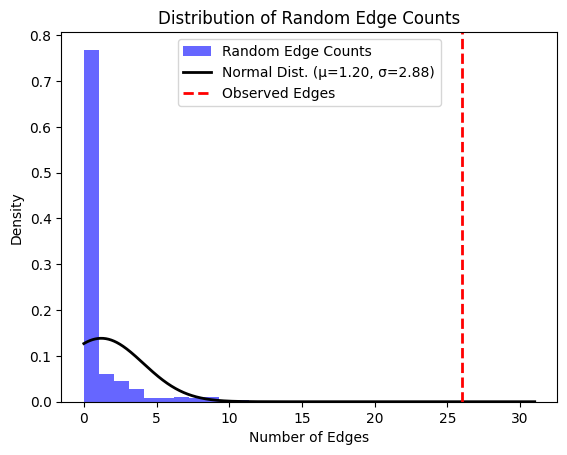

Genes mapped to low tension glaucoma: 
low tension glaucoma EFO_1001022
Genes mapped to low tension glaucoma: 
['TMEM263', 'CDKN2B', 'AS1', 'ZFPM2', 'TMCO1', 'FLNB', 'GMDS', 'ABCA1', 'CT70', 'C14orf39']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to Myasthenia gravis: 
Myasthenia gravis EFO_0004991
Genes mapped to Myasthenia gravis: 
['CTLA4', 'HLA', 'DRB1', 'DQA1', 'TNFRSF11A', 'PTPN22', 'AP4B1', 'AS1', 'MAGI3', 'TNIP1', 'RNF39', 'TRIM31', 'TBX18', 'RPL31P32', 'CEP43', 'LNCRNA', 'IUR', 'FAM76B', 'ATXN2', 'GRB7', 'IKZF3', 'RNU6', '283P', 'FGFR3P1', 'CHRNA1', 'B', 'SFMBT2', 'LINC01149', 'RPL15P15', 'LINC02151']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to cis/trans-18:2 fatty acid measurement, trans fatty acid measurement: 
cis/trans-18:2 fatty acid measurement, trans fatty acid measurement EFO_0006821
Genes mapped to cis/trans-18:2 fatty acid measurement, trans fatty acid measurement: 
['FADS2',

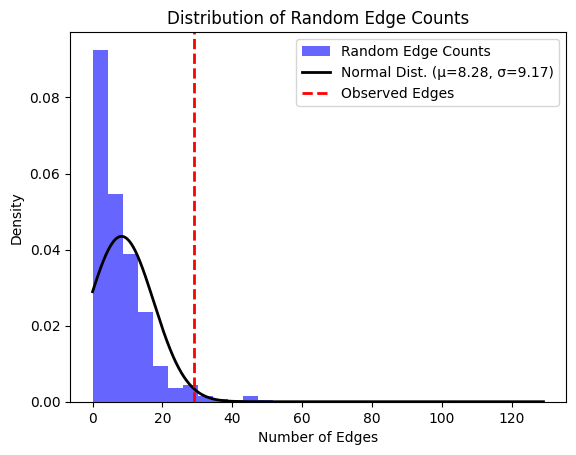

Genes mapped to seropositivity measurement, Chlamydia pneumoniae seropositivity: 
seropositivity measurement, Chlamydia pneumoniae seropositivity EFO_0007035
Genes mapped to seropositivity measurement, Chlamydia pneumoniae seropositivity: 
['NUMA1', 'RNU6', '1251P', 'L3MBTL1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to seropositivity measurement, human herpesvirus 8 seropositivity: 
seropositivity measurement, human herpesvirus 8 seropositivity EFO_0007039
Genes mapped to seropositivity measurement, human herpesvirus 8 seropositivity: 
['RPSAP72', 'TENT5A']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to cytomegalovirus seropositivity: 
cytomegalovirus seropositivity EFO_0007037
Genes mapped to cytomegalovirus seropositivity: 
['RN7SKP205', 'LINC00596', 'CASC17', 'RNU7', '155P', 'NFIL3', 'ROR2', 'ARSG', 'HLA', 'DRB5', 'RNU1', '61P', 'DQA1', 'DRB1', 'DRB9', 'HCG20', 'MARCHF1', 'FABP4', 'FTH1P11'

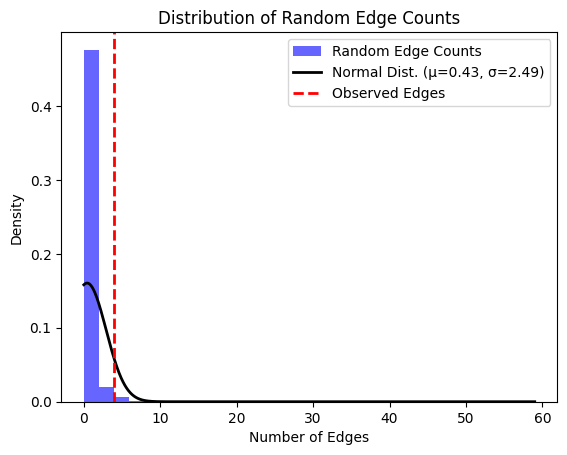

Genes mapped to thoracic aortic aneurysm: 
thoracic aortic aneurysm EFO_0004282
Genes mapped to thoracic aortic aneurysm: 
['FBN1', 'TCF7L2', 'RPS15AP30', 'COL16A1', 'LINC01823', 'LINC01826', 'RAD21', 'AS1', 'AARD', 'LINC01169', 'SMAD6', 'CTNNA3', 'HERC4', 'LINC00540', 'FTH1P7', 'OR7E159P', 'GNG2', 'GABRG3', 'MBP', 'UBE2V1P16', 'RPL3P12', 'CNTN4', 'RN7SL553P', 'MTARC2P1', 'RFTN1', 'OXNAD1', 'TRIM36', 'NBAT1', 'CASC15', 'Y_RNA', 'PTPN3']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to trait in response to thiopurine, thiopurine immunosuppressant-induced pancreatitis: 
trait in response to thiopurine, thiopurine immunosuppressant-induced pancreatitis EFO_0006315
Genes mapped to trait in response to thiopurine, thiopurine immunosuppressant-induced pancreatitis: 
['MTCO3P1', 'HLA', 'DQB3']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to cutaneous lupus erythematosus: 
cutaneous lupus erythematosus EFO_0

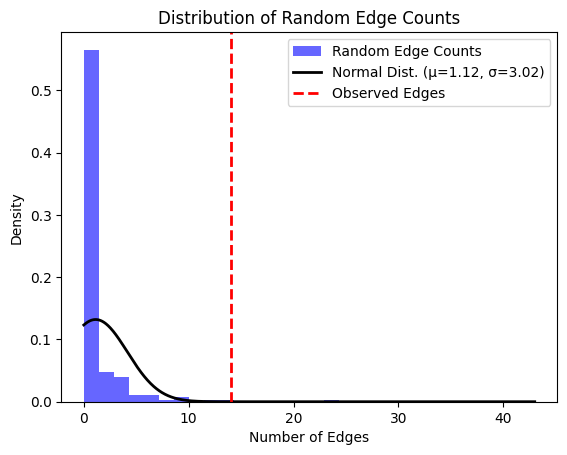

Genes mapped to developmental dysplasia of the hip: 
developmental dysplasia of the hip EFO_1000648
Genes mapped to developmental dysplasia of the hip: 
['UQCC1', 'GDF5', 'LINC01235', 'LINC00583', 'LOXL4', 'PYROXD2', 'LINC01646', 'AJAP1', 'RNU6', '812P', 'REG3G', 'OPCML', 'SH3GL3', 'ADAMTSL3', 'ABAT', 'VPS53', 'SHISA6']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to sporadic Creutzfeld Jacob disease: 
sporadic Creutzfeld Jacob disease EFO_1000656
Genes mapped to sporadic Creutzfeld Jacob disease: 
['PRNP', 'GRM8', 'RNU6', '636P', 'RNA5SP43', 'LINC00303', 'CFAP20DC', 'DT', 'EREG', 'AREG', '682P', 'SNORA70', 'ITPR2', 'AS1', 'SSPN', '449P', 'UNC13C', 'RPS4XP2', 'LINC01664', 'HDHD5', 'EFCAB6', 'STX6', 'GAL3ST1', 'BMERB1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to plasma renin activity measurement: 
plasma renin activity measurement EFO_0006828
Genes mapped to plasma renin activity measurement: 
[

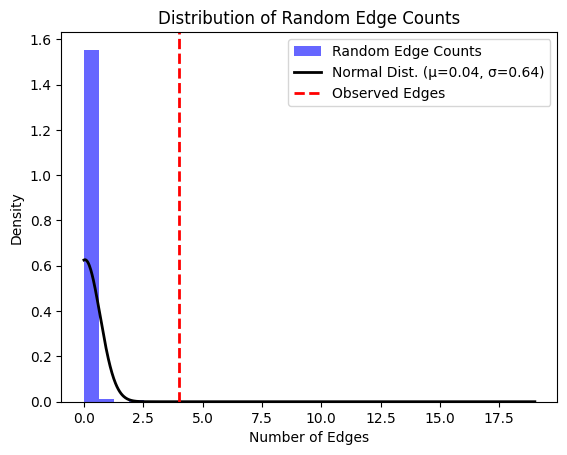

Genes mapped to isolated scaphocephaly: 
isolated scaphocephaly EFO_0700076
Genes mapped to isolated scaphocephaly: 
['BMP2', 'LINC01428', 'BBS9']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to visceral Leishmaniasis: 
visceral Leishmaniasis EFO_0005045
Genes mapped to visceral Leishmaniasis: 
['HLA', 'DRB1', 'DQA1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to Brugada syndrome: 
Brugada syndrome MONDO_0015263
Genes mapped to Brugada syndrome: 
['SCN5A', 'SCN10A', 'HEY2', 'NCOA7', 'EXOG', 'HDDC2', 'AS1', 'TBX20', 'HERPUD2', 'GATA4', 'ZFPM2', 'WT1', 'AS', 'TBX5', 'LINC02140', 'LINC02183', 'CRNDE', 'PRKCA', 'MAPRE2', 'MYO18B', 'ZSCAN20', 'USP34', 'CAMK2D', 'TPPP', 'STARD4', 'MYH7B']
Random edges calculation completed

z score: 7.689867882655554



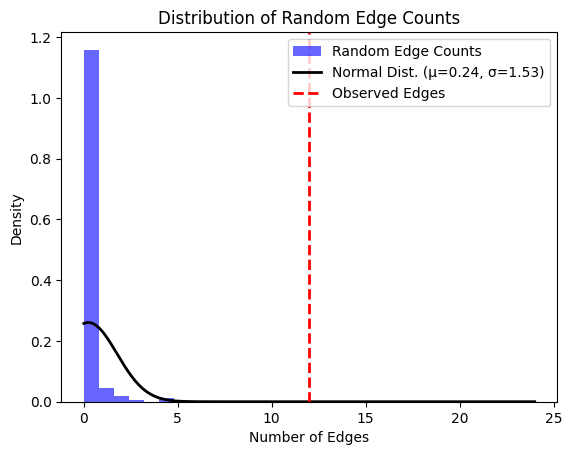

Genes mapped to Limb dystonia: 
Limb dystonia Orphanet_93957
Genes mapped to Limb dystonia: 
['MIR548H4', 'STMN4', 'ARSG', 'CACNA2D3']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to Vogt-Koyanagi-Harada disease: 
Vogt-Koyanagi-Harada disease MONDO_0018092
Genes mapped to Vogt-Koyanagi-Harada disease: 
['IL23R', 'C1orf141', 'HLA', 'DRB9', 'LINC02929', 'ALDH7A1P4', 'DRB1', 'DQA1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to response to bevacizumab, chemotherapy-induced hypertension: 
response to bevacizumab, chemotherapy-induced hypertension EFO_0005942
Genes mapped to response to bevacizumab, chemotherapy-induced hypertension: 
['SV2C', 'PARVB', 'GRAMD1B']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to birdshot chorioretinopathy: 
birdshot chorioretinopathy MONDO_0011599
Genes mapped to birdshot chorioretinopathy: 
['LNPEP', 'TECPR2']
The number of ed

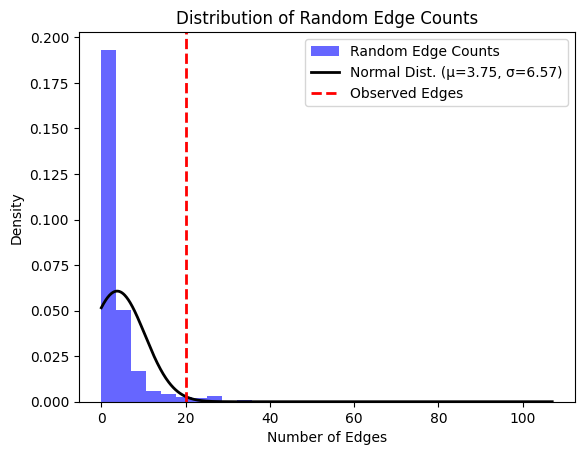

Genes mapped to gas trapping measurement: 
gas trapping measurement EFO_0007628
Genes mapped to gas trapping measurement: 
['GUSBP5', 'KRT18P51', 'DLC1', 'PAX7', 'TAS1R2', 'MIR4471', 'ANKRD46', 'BAMBI', 'LINC01517', 'KMT2D', 'MACROD2', 'LINC01851', 'CYCSP6', 'SP1', 'OR5G1P', 'OR5G4P', 'RPL29P16', 'MRPL14', 'CSMD1', 'NTN1', 'AGER', 'LINC00310', 'KCNE2', 'MRPS6']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to Lewy body dementia, Lewy body dementia measurement: 
Lewy body dementia, Lewy body dementia measurement EFO_0006799
Genes mapped to Lewy body dementia, Lewy body dementia measurement: 
['LINC02307', 'RNU6', '1146P', 'RN7SL170P', 'SAA1', 'HPS5', 'MYO7A', 'RN7SKP60', 'RPL21P59', 'LINC03043', 'POT1', 'PARVB', 'PDLIM5', 'ACADSB', 'HMX3', 'ABRA', 'HMGB1P46', 'CTNND2', 'VPS36', 'GARNL3', 'FRMD3', 'RASSF9', 'NTS', 'APOE', 'TTC6', 'SSTR1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to vascular brain i

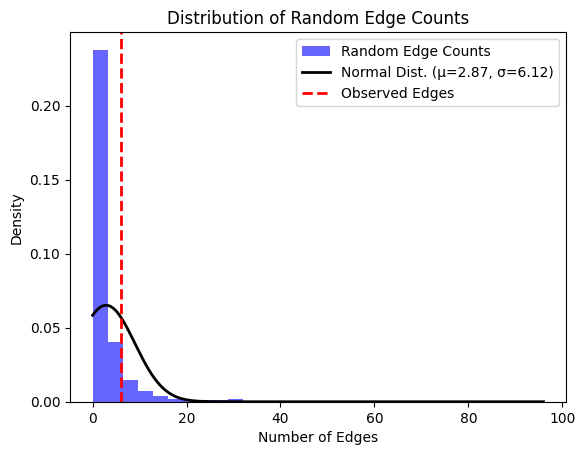

Genes mapped to corticobasal degeneration disorder: 
corticobasal degeneration disorder MONDO_0022308
Genes mapped to corticobasal degeneration disorder: 
['MOBP', 'LINC02210', 'CRHR1', 'KIF13B', 'DUSP4', 'SOS1', 'MAPT', 'AS1', 'SPPL2C', 'TSPEAR']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to suicide ideation measurement: 
suicide ideation measurement EFO_0007619
Genes mapped to suicide ideation measurement: 
['PLCB1', 'LINC01701', 'BRINP3', 'EPB41L4A', 'AOPEP']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to late-onset myasthenia gravis: 
late-onset myasthenia gravis EFO_1001490
Genes mapped to late-onset myasthenia gravis: 
['HLA', 'DRB5', 'RNU1', '61P', 'RNU6', '1213P', 'Y_RNA', 'TNFRSF11A', 'RBBP8', 'SEMA5A', 'GMDS', 'EYA1', 'U8', 'MAP3K7', 'MIR4643', 'PTPN22', 'AP4B1', 'AS1', 'POLR1HASP', 'NFKBIL1', 'ATP6V1G2', 'CTLA4', 'DRB1', 'DQA1', 'CHRNA1']
The number of edges in the network is less than

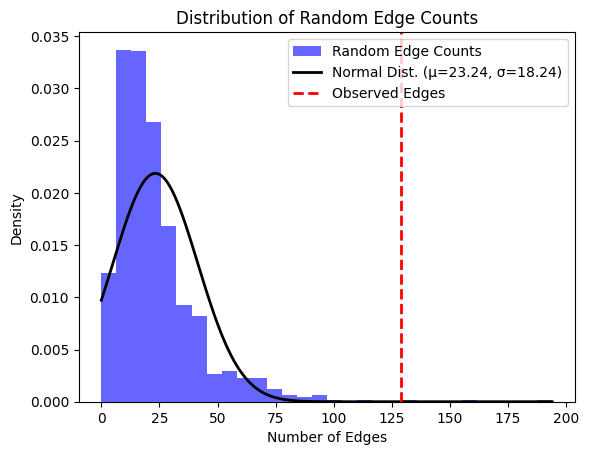

Genes mapped to concussion: 
concussion EFO_0011023
Genes mapped to concussion: 
['AFG2A', 'PLXNA4', 'AGMO']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to electrocardiography: 
electrocardiography EFO_0004327
Genes mapped to electrocardiography: 
['CRIM1', 'BNIP1', 'KCNQ1OT1', 'KCNQ1', 'CASQ2', 'PDZRN3', 'PRDM6', 'PPARGC1B', 'PCNX1', 'SIPA1L1', 'AS1', 'LINC02137', 'SSBP3', 'PACSIN1', 'CEP85L', 'USP50', 'MIR193BHG', 'RPL10P1', 'NCSTNP1', 'TTN', 'CAMK2D', 'LNCAROD', 'MICU2', 'XPO4', 'LIG3', 'KCNJ2', 'CALM2P1', 'CASC17', 'TBX3', 'UBA52P7', 'KLF12', 'MYH6', 'LITAF', 'GOSR2', 'PRKCA', 'SETBP1', 'KCNE1', 'LINC00970', 'DPT', 'LINC01438', 'HCN1', 'EMB', 'YPEL2', 'CNOT1', 'MYOCD', 'CD36', 'SEC11A', 'ZNF592', 'RNF207', 'TCEA3', 'NFIA', 'OLFML2B', 'NOS1AP', 'ATP1B1', 'NME7', 'SNRPEP5', 'ID2', 'SLC8A1', 'MEIS1', 'SCN5A', 'SCN10A', 'ARHGAP24', 'HAND1', 'CIR1P1', 'CDKN1A', 'SLC35F1', 'CAV1', 'KCNH2', 'VTI1A', 'MYRF', 'TMEM258', 'KNOP1P1', 'RN7SL38P', 'TB

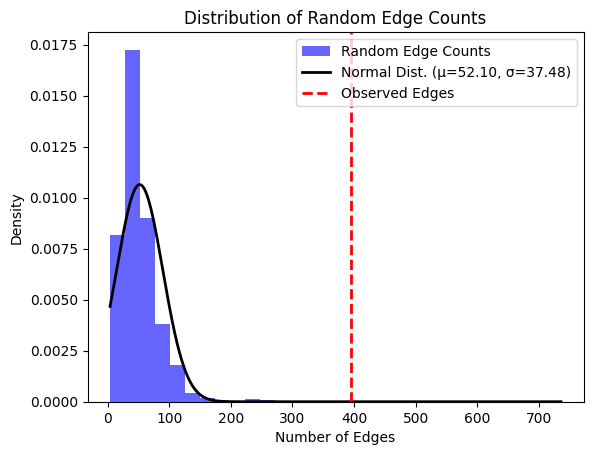

Genes mapped to clonal hematopoiesis: 
clonal hematopoiesis EFO_0010819
Genes mapped to clonal hematopoiesis: 
['TMEM246', 'AS1', 'TERT', 'DPH6', 'DT', 'JAK2', 'DAB1', 'IGHEP2', 'INSL4', 'RLN2', 'ADH5P2', 'HMGB1P18', 'MRC1', 'GOT1', 'LINC01475', 'POGLUT3', 'KNOP1P1', 'RN7SL38P', 'ITPR2', 'ELF1', 'LRRC63', 'DLEU1', 'TCL1A', 'TUNAR', 'LINC00523', 'DLK1', 'ZFHX3', 'STXBP4', 'SLC8A1', 'RTEL1', 'TNFRSF6B', 'NRIP1', 'ASMER1', 'LINC00649', 'TTC28', 'CHEK2', 'THRB', 'AS2', 'GATA2', 'IL20RB', 'RNA5SP142', 'IFT80', 'TRIM59', 'SMC4', 'ABCC5', 'TBC1D1', 'BTC', 'HSPE1P23', 'ZKSCAN4', 'HCG27', 'HLA', 'C', 'AK9', 'ZBTB24', 'MIR548A2', 'AHI1', 'NDUFA4', 'ANKRD7', 'GTF3AP6', 'HEPH', 'MTFR1P1', 'LINC01511', 'CD164', 'CCDC162P', 'NPAT', 'LINC01478', 'MIR4457']
Random edges calculation completed

z score: 1.1180615357136168



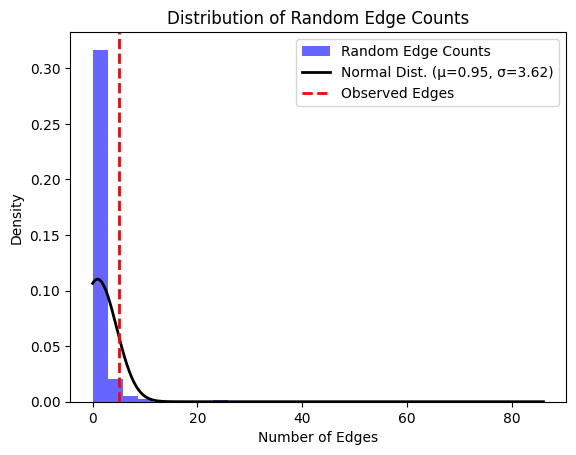

Genes mapped to diabetic neuropathy: 
diabetic neuropathy EFO_1000783
Genes mapped to diabetic neuropathy: 
['GUSBP5', 'GYPA', 'LINC02087', 'SPECC1P1', 'MIR4432HG', 'COBLL1', 'NYAP2', 'MIR5702', 'PPARG', 'ADCY5', 'IGF2BP2', 'WFS1', 'PRDX4P1', 'THAP12P9', 'C5orf67', 'MACIR', 'PDZPH1P', 'CDKAL1', 'GTF3AP5', 'AGMO', 'JAZF1', 'UBE3C', 'NKX6', '3', 'ANK1', 'TRPS1', 'SLC30A8', 'CDKN2B', 'AS1', 'CDC123', 'RN7SL198P', 'ZMIZ1', 'EIF2S2P3', 'HHEX', 'TCF7L2', 'KCNQ1', 'CCND2', 'RN7SKP15', 'PTHLH', 'LINC01080', 'NRXN3', 'PEAK1', 'ARPIN', 'AP3S2', 'PRC1', 'FTO', 'RPS26P8', 'LINC02210', 'NOTCH2', 'PROX1', 'CDK12', 'NEUROD2', 'LINC01101', 'Y_RNA', 'SLC39A8', 'LINC01875', 'TMEM18', 'ANKH', 'HMG20A', 'TENT5C', 'TFAP2D', 'TFAP2B', 'CEP68', 'TLE1', 'DT', 'GIP', 'IGF2BP1', 'TCF4', 'ABO', 'LINC01991', 'LPP', 'AS2', 'NECTIN2', 'ZFP1', 'CTRB2', 'PDE8B', 'ZBED3', 'MIR4686', 'ASCL2']
Random edges calculation completed

z score: 2.9279463185138406



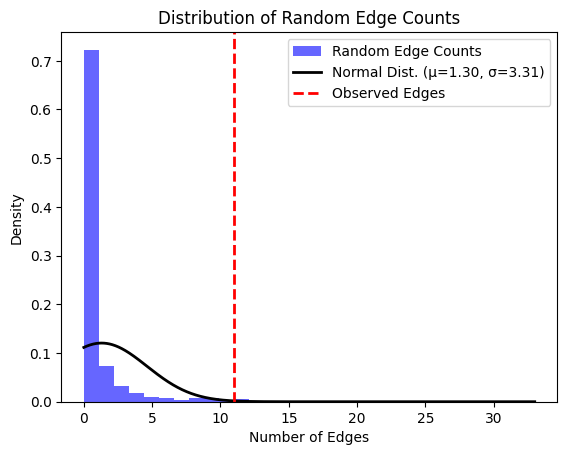

Genes mapped to macrovascular complications of diabetes: 
macrovascular complications of diabetes EFO_0010977
Genes mapped to macrovascular complications of diabetes: 
['PDE4DIP', 'LINC02087', 'SPECC1P1', 'ALMS1P1', 'F5', 'RPS6KA2', 'FRG2LP', 'NF1P5', 'DTX2P1', 'UPK3BP1', 'PMS2P11', 'CCDC146']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to diabetic eye disease: 
diabetic eye disease EFO_0009486
Genes mapped to diabetic eye disease: 
['DTX2P1', 'UPK3BP1', 'PMS2P11', 'CCDC146', 'MACF1', 'GCKR', 'THADA', 'MIR4432HG', 'COBLL1', 'NYAP2', 'MIR5702', 'PPARG', 'ADCY5', 'IGF2BP2', 'LINC01991', 'LPP', 'AS2', 'WFS1', 'PRDX4P1', 'THAP12P9', 'RPS3AP18', 'TMEM154', 'C5orf67', 'PPIP5K2', 'MACIR', 'RREB1', 'CDKAL1', 'MTCO3P1', 'HLA', 'DQB3', 'CENPW', 'MIR588', 'JAZF1', 'AUTS2', 'NKX6', '3', 'ANK1', 'TRPS1', 'SLC30A8', 'CDKN2B', 'AS1', 'GPSM1', 'CDC123', 'RN7SL198P', 'ZMIZ1', 'HHEX', 'Y_RNA', 'TCF7L2', 'KCNQ1', 'MTCH2', 'AGBL2', 'ZNRD2', 'DT', 'CCND1', 'CCND

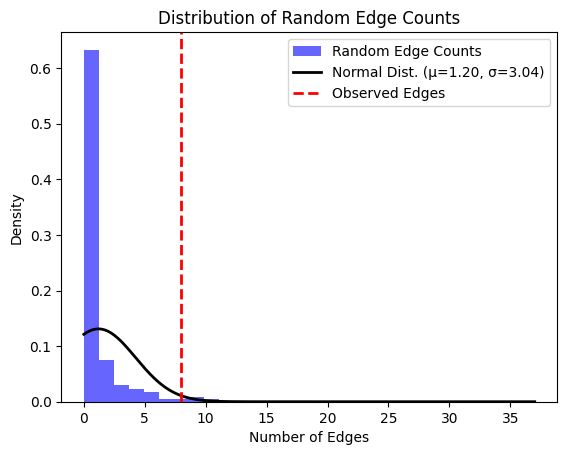

Genes mapped to cutaneous mastocytosis: 
cutaneous mastocytosis EFO_1000886
Genes mapped to cutaneous mastocytosis: 
['RPTN', 'CNTN6', 'RPL23AP38', 'PRDX5P1', 'LINC02005', 'POLQ', 'FABP5', 'PMP2', 'ABCA2', 'HBG2', 'HBE1', 'OR51B5', 'OR51Q1', 'LINC00402', 'LINC03059', 'RPL3P3', 'OTX2', 'AS1', 'MIR3976HG', 'CYP2B6', 'TMEM182', 'CRLF3P1', 'PDE4DIP', 'EGLN1', 'BTN2A1', 'HLA', 'F', 'HCG4', 'V']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to systemic mastocytosis: 
systemic mastocytosis MONDO_0016586
Genes mapped to systemic mastocytosis: 
['MEGF6', 'CACNA1E', 'PRDX5P1', 'LINC02005', 'SPMIP2', 'CDKAL1', 'LINC00581', 'NCR3', 'UQCRHP1', 'MSH5', 'MOCS1', 'EYS', 'RANP9', 'RNU6', '528P', 'TTC39B', 'RPL7P33', 'ABCA1', 'ABCA2', 'HBG2', 'HBE1', 'OR51B5', 'OR51Q1', 'NAV3', 'TPSAB1', 'TPSD1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to alcohol use disorder measurement: 
alcohol use disorder measurement EFO_000

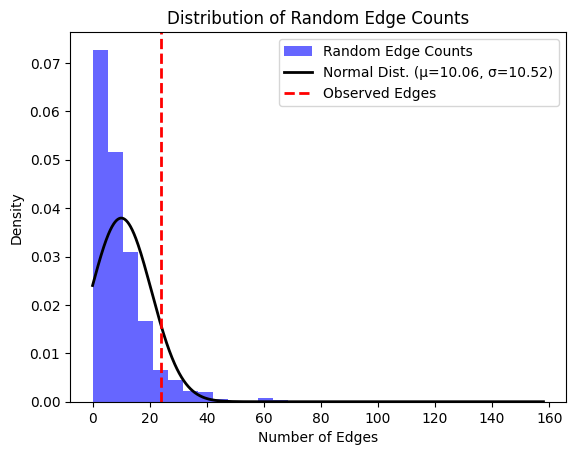

Genes mapped to serum clozapine-to-N-desmethylclozapine ratio measurement: 
serum clozapine-to-N-desmethylclozapine ratio measurement EFO_0600042
Genes mapped to serum clozapine-to-N-desmethylclozapine ratio measurement: 
['UGT2B15', 'UGT2B10', 'CYP2C19']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to response to surgery, post-operative myocardial infarction: 
response to surgery, post-operative myocardial infarction EFO_0009953
Genes mapped to response to surgery, post-operative myocardial infarction: 
['FHIT', 'SUGCT']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to response to surgery, post-operative delirium: 
response to surgery, post-operative delirium EFO_0009954
Genes mapped to response to surgery, post-operative delirium: 
['LINC02934', 'LINC00871']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to Cholecystitis, Acute: 
Cholecystitis, Acute EFO_10

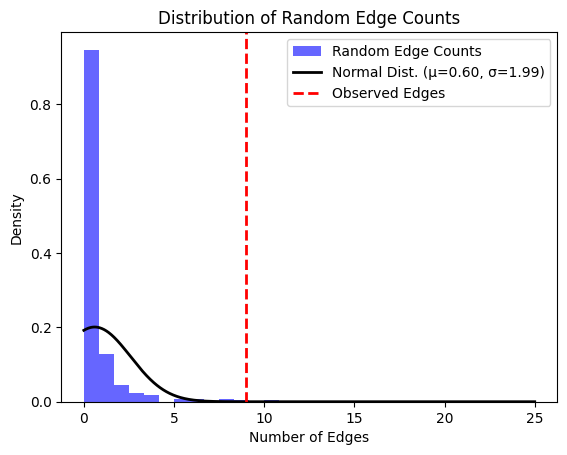

Genes mapped to obese body mass index status: 
obese body mass index status EFO_0007041
Genes mapped to obese body mass index status: 
['FTO', 'RNU4', '17P', 'MC4R', 'LINC01875', 'TMEM18', 'SEC16B', 'ADCY3', 'DNAJC27', 'FAIM2', 'LINC01865', 'PRDX4P1', 'THAP12P9', 'SNRPC', 'SLC39A8', 'TFAP2B', 'RPS17P5', 'NPM1P1', 'PIK3C3', 'SEMA3B', 'AS1', 'HIPK3', 'KIAA1549L', 'LINC02796', 'LINC01741', 'PRDM6', 'CEP120', 'SULT1A1', 'SLC7A14', 'LINC01541']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to hyperlipidemia: 
hyperlipidemia MONDO_0021187
Genes mapped to hyperlipidemia: 
['DNM2', 'HCG22', 'APOA5', 'LNC', 'RHL1', 'GCKR', 'TRIB1AL', 'TOMM40', 'TIMD4', 'HAVCR1', 'SCARB1', 'FTO', 'HERPUD1', 'CETP', 'PMFBP1', 'CLEC10A', 'ASGR2', 'GIP', 'ABCA6', 'TRIM65', 'SMARCA4', 'LDLR', 'TM6SF2', 'APOE', 'ZHX3', 'PCSK9', 'DOCK7', 'CELSR2', 'LINC00184', 'LINC01132', 'APOB', 'TDRD15', 'ABCG8', 'INSIG2', 'COBLL1', 'BMPR2', 'NYAP2', 'MIR5702', 'SYN2', 'GSTM5P1', 'RPL31P23

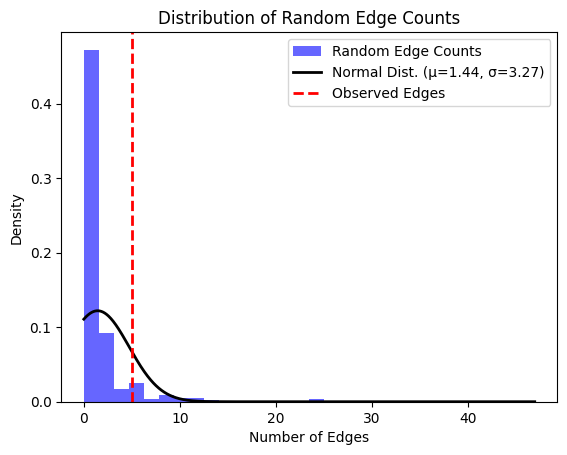

Genes mapped to liver fat measurement, liver disease biomarker: 
liver fat measurement, liver disease biomarker EFO_0006845
Genes mapped to liver fat measurement, liver disease biomarker: 
['GCKR', 'TM6SF2', 'APOE', 'PNPLA3', 'SLC30A10', 'SLC39A8', 'NRL', 'PCK2', 'TMPRSS6', 'HFE', 'H2BC4']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to autoimmune thyroid disease: 
autoimmune thyroid disease EFO_0006812
Genes mapped to autoimmune thyroid disease: 
['TNFRSF14', 'RERE', 'MIR4425', 'LINC02793', 'INPP5B', 'JAK1', 'MAGI3', 'SH2D2A', 'RPL34P6', 'GPR25', 'EDARADD', 'MIR3681HG', 'PNPT1', 'RPS3AP13', 'MARCHF7', 'IFIH1', 'STAT4', 'BHLHE40', 'AS1', 'GSTM5P1', 'PPARG', 'CX3CR1', 'DNASE1L3', 'CBLB', 'Y_RNA', 'TRAT1', 'TIMMDC1', 'CD86', 'LPP', 'CLNK', 'LINC02498', 'LINC02357', 'RHOH', 'LINC02265', 'TLR3', 'CAMK4', 'VDAC1', 'TCF7', 'RPS15AP19', 'FKBP5', 'SPEF2', 'IL7R', 'MACIR', 'PDZPH1P', 'IRF4', 'BACH2', 'FYN', 'AHI1', 'DT', 'ELMO1', 'GIGYF1', 'LINC02950'

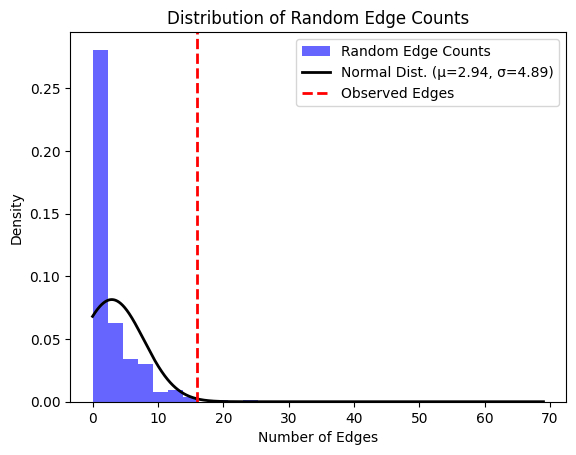

Genes mapped to familial long QT syndrome: 
familial long QT syndrome MONDO_0019171
Genes mapped to familial long QT syndrome: 
['OLFML2B', 'NOS1AP', 'KCNQ1', 'KLF12', 'KCNE1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to Diarrhea, Infantile, Astroviridae infectious disease: 
Diarrhea, Infantile, Astroviridae infectious disease EFO_0007158
Genes mapped to Diarrhea, Infantile, Astroviridae infectious disease: 
['RPLP0P4', 'LORICRIN', 'PRLHR']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to influenza: 
influenza EFO_0007328
Genes mapped to influenza: 
['ST6GAL1', 'B3GALT5']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to Hashimoto's thyroiditis: 
Hashimoto's thyroiditis EFO_0003779
Genes mapped to Hashimoto's thyroiditis: 
['VAT1L', 'LINC00469', 'LINC02074', 'PTPN22', 'AP4B1', 'AS1', 'RAB5B', 'CD69', 'GCNAP1', 'HORMAD2', 'VAV3', 'STAT4', 'RNU6', '474P', '

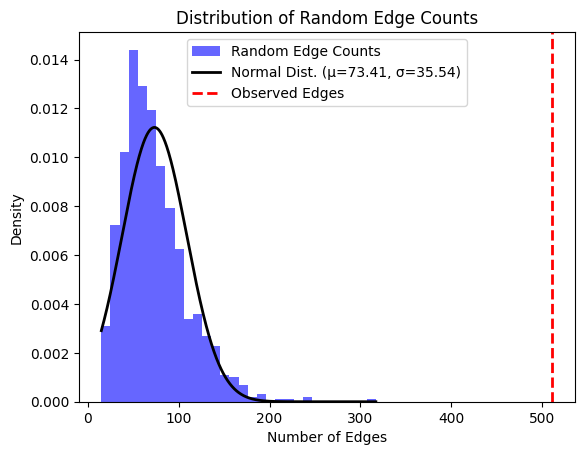

Genes mapped to lymphoid leukemia: 
lymphoid leukemia EFO_0004289
Genes mapped to lymphoid leukemia: 
['DRAIC', 'ACOXL', 'CELSR1', 'SLC25A26', 'LRIG1', 'TCEAL8P1', 'RGS7', 'LINC01785', 'TP53', 'MUC20', 'OT1', 'SLC12A3', 'MEGF11', 'CFAP100', 'DT', 'LIPC', 'AS1', 'ALDH1A2', 'SOX21', 'LINC00557', 'ENPP5', 'ACTG1P9', 'PALD1', 'LINC01827', 'AMD1', 'GTF3C6', 'GRAMD1B', 'BMF', 'IRF4', 'MIR4435', '2HG', 'HLA', 'DQB1', 'SP140L', 'RPL10AP12', 'IRF8', 'SP140', 'CDKN2B', 'DMRTA1', 'FAS', 'ACTRT3', 'MYNN', 'TERT', 'EXOC2']
Random edges calculation completed

z score: 1.2664129564939948



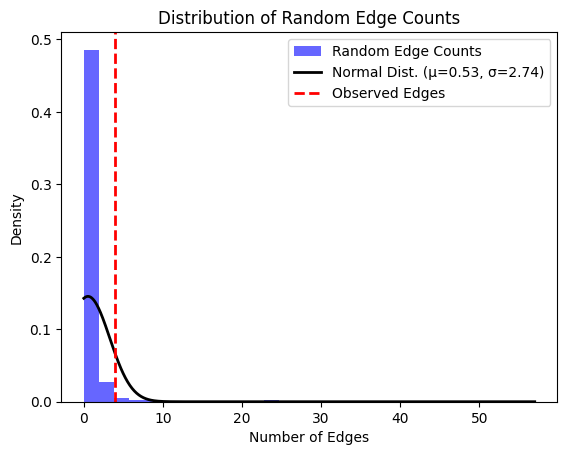

Genes mapped to Hodgkins lymphoma, multiple myeloma, non-Hodgkins lymphoma: 
Hodgkins lymphoma, multiple myeloma, non-Hodgkins lymphoma EFO_0005952
Genes mapped to Hodgkins lymphoma, multiple myeloma, non-Hodgkins lymphoma: 
['MIATNB', 'IRF4', 'EXOC2', 'NTM', 'HLA', 'DRA', 'DRB9', 'CD69', 'GCNAP1', 'SPCS3', 'HAFML', 'TCF3', 'Metazoa_SRP', 'UQCRHP1', 'AIF1', 'CCHCR1', 'OR5V1', 'PVT1', 'MTCO3P1', 'DQB3', 'TPT1P9', 'LINC02578', 'DRB1', 'DQA1', 'LINC00841', 'LINC03089', 'DQB1', 'CELF2', 'Y_RNA', 'CXCR5', 'SNHG10', 'LINC01523', 'QPCT', 'MIR4435', '2HG', 'BCL2L11', 'SP140', 'EOMES', 'LINC01980', 'CD86', 'POLR1HASP', 'RN7SKP226', 'LINC00824', 'GRAMD1B', 'MNS1', 'ZNF280D', 'RPL10AP12', 'IRF8', 'PHLPP1', 'BCL2', 'GIPC2', 'RNFT1P2', 'LINC02655', 'RPS7P9']
Random edges calculation completed

z score: 10.007658663222657



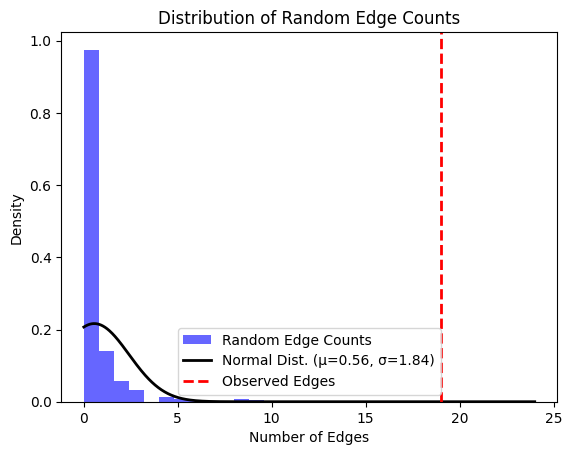

Genes mapped to irritable bowel syndrome symptom measurement: 
irritable bowel syndrome symptom measurement EFO_0021536
Genes mapped to irritable bowel syndrome symptom measurement: 
['NDUFS5P2', 'RPL7P9', 'LINC02006', 'SCFD2', 'LINC02374', 'LINC02514', 'CTNND2', 'DCDC2', 'CICP17', 'ROBO2P1', 'GBGT1', 'OBP2B', 'CCDC3', 'ANTXRL', 'NAV2', 'ZBTB14', 'LINC02974', 'NELL1', 'LINC02822', 'CHRNA7', 'DRAIC', 'TLE3', 'HAGH', 'RAP1GAP2', 'LINC01387', 'ELOAP1', 'PSMD14P1', 'TRPM2', 'DDX60L', 'ARID1B', 'ACTR3B', 'LINC01287', 'NFIB', 'AS1', 'LAPTM5', 'LINC01778', 'LINC01343', 'RNU6', '753P', 'APOLD1', 'LINC02307', 'RPL37P4', 'NIPA2P3', 'DOP1B', 'EIF4E2P2', 'GAP43', 'CPHL1P', 'TOMM22P6', 'LINC01192', 'IRX1', 'LINC02063', 'RPS6KA2', 'LINC02889', 'SNX13', 'CDK6', 'FAM89A', 'TRIM67']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to cryptococcosis: 
cryptococcosis EFO_0007229
Genes mapped to cryptococcosis: 
['LINC01768', 'CSF1', 'LINC00865', 'RNU6', '1', 'PIAS1

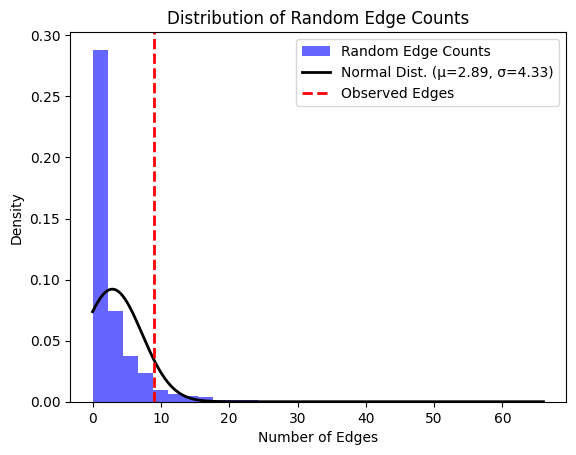

Genes mapped to response to interferon-beta, anti-drug antibody measurement: 
response to interferon-beta, anti-drug antibody measurement EFO_0010559
Genes mapped to response to interferon-beta, anti-drug antibody measurement: 
['DNAI1', 'PRDM2', 'ASB7', 'GCAWKR', 'LINC02881', 'CXCL12', 'HLA', 'DRB1', 'DQA1', 'DQB1', 'MTCO3P1', 'CCHCR1', 'POLR2LP1', 'B', 'POLR1HASP', 'DPA2', 'COL11A2P1', 'TSBP1', 'AS1', 'DRA', 'DRB9', 'DRB5']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to Insulinogenic index measurement: 
Insulinogenic index measurement EFO_0009961
Genes mapped to Insulinogenic index measurement: 
['PAM', 'PPIP5K2', 'HNF1A', 'AS1', 'GPSM1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to non-alcoholic pancreatitis: 
non-alcoholic pancreatitis EFO_0021524
Genes mapped to non-alcoholic pancreatitis: 
['CTRC', 'DNAJC16', 'CHCHD2P6', 'JAKMIP2', 'AS1', 'SPINK1', 'EEF1GP2', 'SPINK5']
The number of edges 

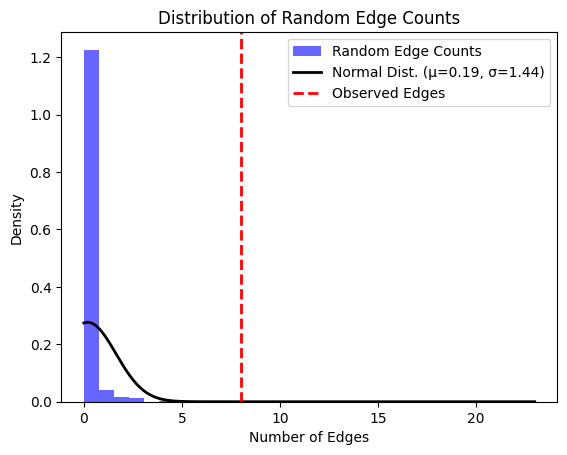

Genes mapped to chronic graft versus host disease: 
chronic graft versus host disease MONDO_0020547
Genes mapped to chronic graft versus host disease: 
['Metazoa_SRP', 'LRATD1', 'ARHGEF28', 'LINC02122', 'LINC00882', 'GPR141', 'THRAP3P1', 'STT3B', 'TMEM174', 'LINC02230', 'XYLT1', 'RPL7P47', 'RPS3AP17', 'PCDH7']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to lysophosphatidylcholine 15:0 measurement: 
lysophosphatidylcholine 15:0 measurement EFO_0020941
Genes mapped to lysophosphatidylcholine 15:0 measurement: 
['PSMD7', 'DT', 'PDPR2P', 'FBXO41', 'PATL1', 'LRP1B', 'CXCL6', 'PF4V1', 'POU4F2', 'TTC29', 'LIPC', 'ALDH1A2', 'LINC01435', 'LINC02661', 'PKHD1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to lysophosphatidylcholine 17:0 measurement: 
lysophosphatidylcholine 17:0 measurement EFO_0021452
Genes mapped to lysophosphatidylcholine 17:0 measurement: 
['ACAA2', 'TMEM258', 'MYRF']
The number of edges 

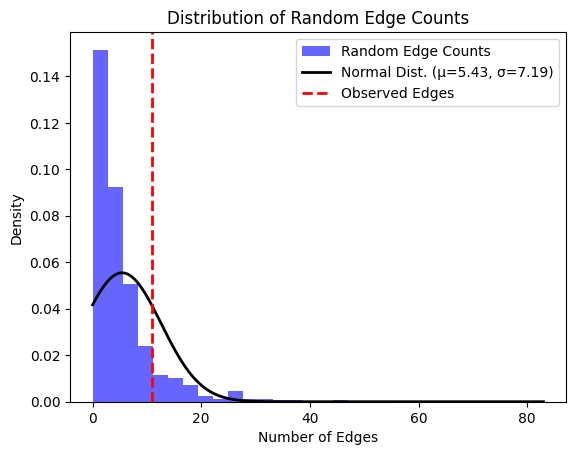

Genes mapped to substance-related disorder: 
substance-related disorder MONDO_0002494
Genes mapped to substance-related disorder: 
['BIRC6', 'AS1', 'FOXP2', 'SEMA6D', 'CELF4', 'MIR4318', 'FTO', 'NT5C1A', 'HPCAL4', 'TEF', 'TOB2', 'CENPUP2', 'IRAG2', 'PPP1R13B', 'NOL4L', 'SCAI', 'FBXL20', 'LINC01415', 'LINC01416', 'MIR9', '2HG', 'TMEM161B', 'DT', 'LEKR1', 'ABT1', 'ZNF322', 'PDE4B', 'BANK1', 'LINC01360', 'LINC02238', 'RPL30P1', 'RABGAP1L', 'GCKR', 'CAMKMT', 'LINC01833', 'ACTG1P22', 'VRK2', 'PLCL2', 'USP4', 'ADH1B', 'ADH1C', 'SLC39A8', 'RABEPK', 'LINC02661', 'DNAAF11P1', 'LINC02759', 'DRD2', 'TMPRSS5', 'BPIFB4', 'C4orf54', 'FUT2', 'BTF3P13', 'EIF4E', 'CADM2', 'LPO', 'PTPRF', 'EEF1A1P11', 'RN7SL831P', 'LINC01412', 'MANBA', 'SORCS3', 'DUSP6', 'POC1B', 'LINC00644', 'ATP5F1AP4', 'RHOA']
Random edges calculation completed

z score: 1.844575252001269



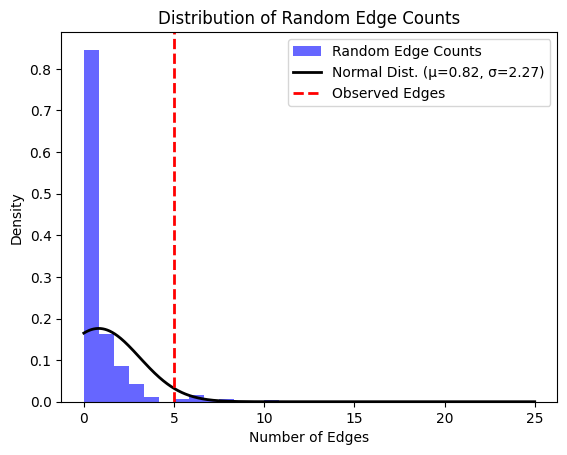

Genes mapped to phosphatidylcholine 28:0 measurement: 
phosphatidylcholine 28:0 measurement EFO_0021466
Genes mapped to phosphatidylcholine 28:0 measurement: 
['ADAMTSL3']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to phosphatidylcholine 31:0 measurement: 
phosphatidylcholine 31:0 measurement EFO_0021467
Genes mapped to phosphatidylcholine 31:0 measurement: 
['NFIA', 'TM2D1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to phosphatidylcholine 33:0 measurement: 
phosphatidylcholine 33:0 measurement EFO_0021468
Genes mapped to phosphatidylcholine 33:0 measurement: 
['FADS2', 'KCNMB4', 'RNU4', '65P']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to phosphatidylcholine 33:1 measurement: 
phosphatidylcholine 33:1 measurement EFO_0021469
Genes mapped to phosphatidylcholine 33:1 measurement: 
['FADS2', 'FADS1']
The number of edges in the network is less than the

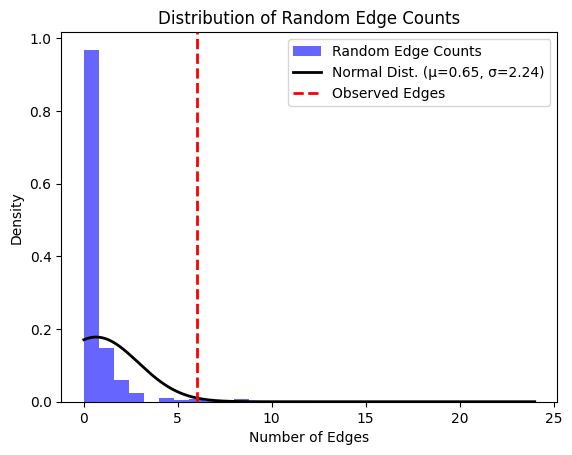

Genes mapped to lysophosphatidylcholine 16:0 measurement: 
lysophosphatidylcholine 16:0 measurement EFO_0010357
Genes mapped to lysophosphatidylcholine 16:0 measurement: 
['RNA5SP279', 'SMARCA2', 'GCKR']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to lysophosphatidylcholine 17:1 measurement: 
lysophosphatidylcholine 17:1 measurement EFO_0021453
Genes mapped to lysophosphatidylcholine 17:1 measurement: 
['PKD2L1', 'LNCRNA', 'IUR', 'FAM76B']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to lysophosphatidylcholine 20:0 measurement: 
lysophosphatidylcholine 20:0 measurement EFO_0021456
Genes mapped to lysophosphatidylcholine 20:0 measurement: 
['APOE']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to lysophosphatidylcholine 20:2 measurement: 
lysophosphatidylcholine 20:2 measurement EFO_0021458
Genes mapped to lysophosphatidylcholine 20:2 measurement: 
['RBM48P

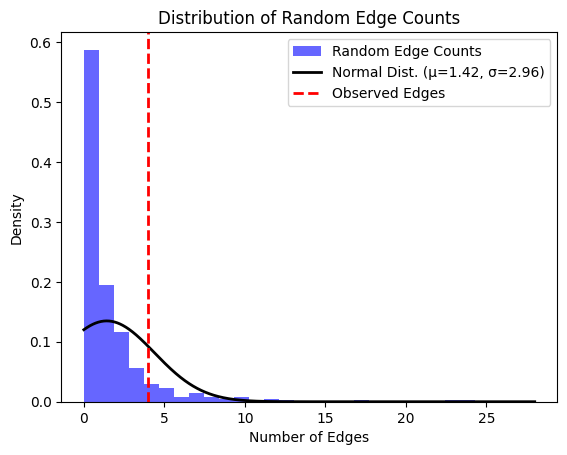

Genes mapped to cutaneous Leishmaniasis: 
cutaneous Leishmaniasis EFO_0005046
Genes mapped to cutaneous Leishmaniasis: 
['ZNF385D', 'LAMP3', 'STX7', 'CALCR', 'PXDNL', 'TSPAN9', 'LINC02827', 'LINC00592', 'CRLF3', 'DYM', 'TCF4', 'SERPINB10', 'PPP6R1', 'S100B', 'CHKB']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to type 1 diabetes mellitus, latent autoimmune diabetes in adults: 
type 1 diabetes mellitus, latent autoimmune diabetes in adults EFO_0009706
Genes mapped to type 1 diabetes mellitus, latent autoimmune diabetes in adults: 
['RBM17', 'PFKFB3', 'BACH2', 'THADA', 'HLA', 'DQA1', 'DQB1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to delirium: 
delirium EFO_0009267
Genes mapped to delirium: 
['APOE', 'LINC01500']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to diverticular disease: 
diverticular disease EFO_0009959
Genes mapped to diverticular disease: 

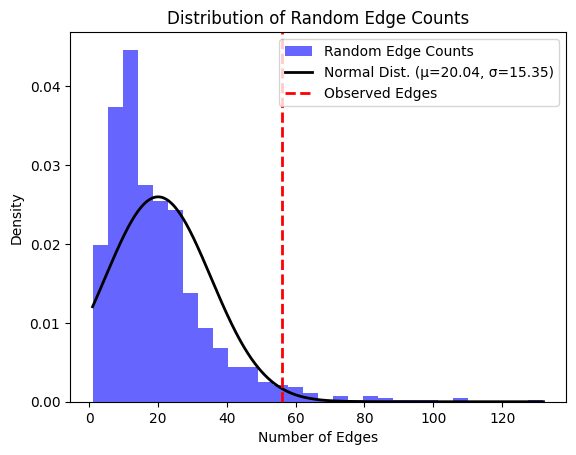

Genes mapped to response to secukinumab, C-reactive protein measurement, arthritis disease activity score measurement: 
response to secukinumab, C-reactive protein measurement, arthritis disease activity score measurement EFO_0009435
Genes mapped to response to secukinumab, C-reactive protein measurement, arthritis disease activity score measurement: 
['C10orf90', 'DOCK1', 'FAM180A', 'MTPN']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to wellbeing measurement: 
wellbeing measurement EFO_0007869
Genes mapped to wellbeing measurement: 
['FSHR', 'OR4C7P', 'OR4R2P', 'MCFD2P1', 'ZNF184', 'ANKK1', 'LINC02315', 'LRFN5', 'DT', 'MSH5', 'SAPCD1', 'PCLO', 'POM121L2', 'NIHCOLE', 'AMD1P4', 'HIVEP1', 'GRM8', 'RBMS3', 'GPC6', 'KIRREL3', 'RERE', 'ARIH2P1', 'RNU6', '408P', 'AATK', 'CTTNBP2', 'TAP2', 'PSMB8', 'RNU11', '5P', 'PRKD1', 'ASCL1', 'C12orf42', 'AS1', 'WDPCP', 'PSORS1C1', 'LINC01012', 'GPR89P', 'GSDME', 'RPL12P40', 'RN7SKP182', 'TRHDE', 'SEMA3E', 'IT

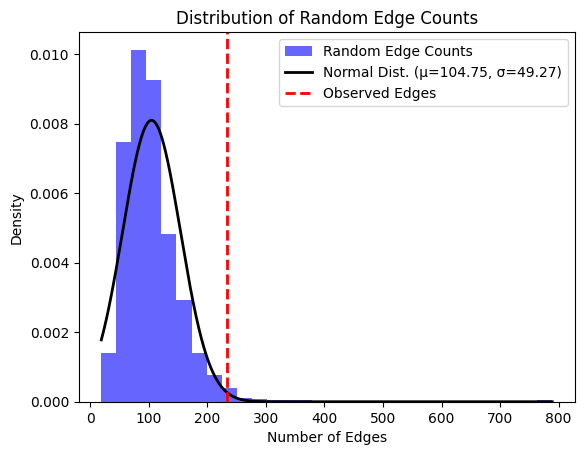

Genes mapped to Anti-rubella virus IgG measurement: 
Anti-rubella virus IgG measurement EFO_0009357
Genes mapped to Anti-rubella virus IgG measurement: 
['HLA', 'DPB1', 'DPA1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to myopic maculopathy severity measurement: 
myopic maculopathy severity measurement EFO_0009177
Genes mapped to myopic maculopathy severity measurement: 
['CCDC102B', 'DOK6']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to response to radiation, radiation-induced brain injury: 
response to radiation, radiation-induced brain injury EFO_0009704
Genes mapped to response to radiation, radiation-induced brain injury: 
['CEP128']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to diffusing capacity of the lung for carbon monoxide: 
diffusing capacity of the lung for carbon monoxide EFO_0009369
Genes mapped to diffusing capacity of the lung for ca

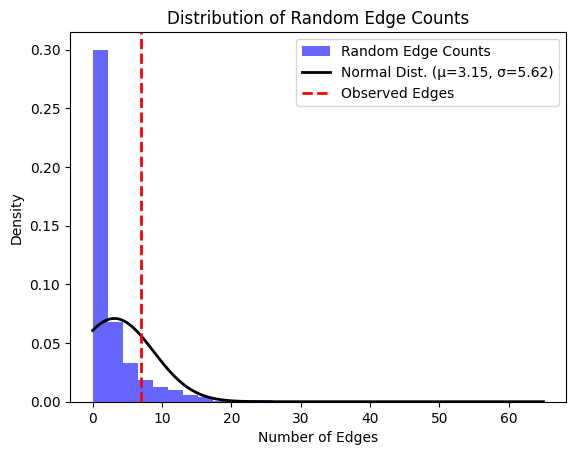

Genes mapped to hippocampal CA1 volume: 
hippocampal CA1 volume EFO_0009394
Genes mapped to hippocampal CA1 volume: 
['MSRB3', 'RPL9P5', 'DACT1', 'ABRAXAS2', 'NPM1P31', 'HRK', 'RPL36P15', 'LINC02794', 'FBXO34', 'CHSY1', 'NTN1', 'SSBP3', 'ASTN2', 'FAM53B', 'DPP4', 'GMNC', 'OSTN', 'RASL11B', 'SCFD2', 'RNU6', '1230P', 'DCLK2', 'LINC02240', 'PCMT1', 'RABGAP1', 'EEF1AKMT2', 'PARP11', 'AS1', 'FZD10', 'DAAM1', 'RNFT2', 'RPS2P55', 'CLIC4P3', 'SLC4A10', 'RPL21P46', 'SLIT2', 'PTCH1', 'FOXO3', 'LINC00222', 'RN7SKP93', 'MGAT5', 'LEMD3', 'LINC00923', 'ARRDC4', 'VCAN', 'PAPPA', 'STRBP', 'ZRANB1']
Random edges calculation completed

z score: 2.086672768633455



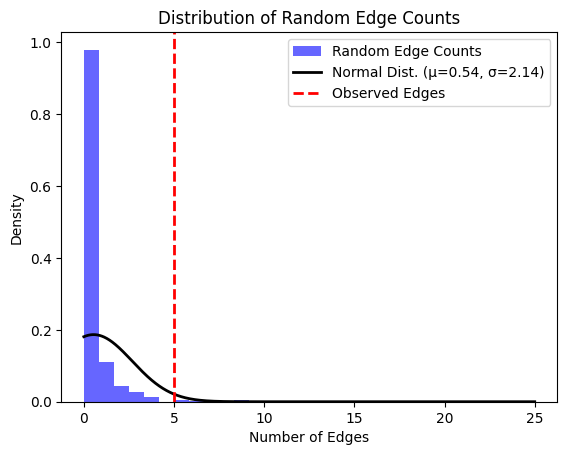

Genes mapped to hippocampal CA3 volume: 
hippocampal CA3 volume EFO_0009395
Genes mapped to hippocampal CA3 volume: 
['ABRAXAS2', 'NPM1P31', 'MSRB3', 'HRK', 'RPL36P15', 'SSBP3', 'FAM53B', 'PARP11', 'AS1', 'DAAM1', 'NTN1', 'KANSL1', 'LINC01752', 'MAGEB16', 'CFAP47', 'DPP4', 'GMNC', 'OSTN', 'SPRING1P1', 'UQCRHP3', 'GATAD2B', 'RPL21P46', 'SLIT2', 'SLC22A23', 'TOMM5P1', 'LINC00923', 'ARRDC4', 'TFDP2', 'C5orf67', 'MAP3K1', 'ASTN2', 'EEF1AKMT2', 'CCDC127', 'ARRDC3', 'LINC02454', 'GLI3', 'XKR6']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to hippocampal CA4 volume: 
hippocampal CA4 volume EFO_0009396
Genes mapped to hippocampal CA4 volume: 
['ASTN2', 'EEF1AKMT2', 'PARP11', 'AS1', 'MSRB3', 'HRK', 'RPL36P15', 'SSBP3', 'NUP210L', 'DPP4', 'TNIK', 'MAST4', 'FOXO3', 'PCMT1', 'FAM53B', 'GMIP', 'LINC00923', 'ARRDC4', 'IL34', 'PDZRN4', 'RNFT2', 'EFCAB5', 'RPSAP44', 'KRASP1', 'ZNF398', 'LINC02902', 'PKD1L1', 'TFDP2', 'TMEM219', 'RPL9P5', 'DACT1', 'RN7SL423P'

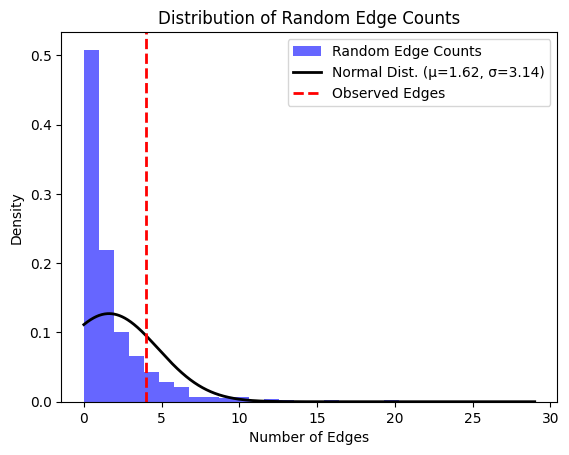

Genes mapped to shigellosis: 
shigellosis EFO_0005585
Genes mapped to shigellosis: 
['C1orf141', 'IL23R', 'EEF1A1P21', 'RPS3AP17', 'MYLK4', 'RIOK1', 'CYTH3', 'PPP1R3B', 'DT', 'MTAP', 'CDKN2A', 'AS1', 'YME1L1', 'MRPS21P5', 'MPP7', 'KRT18P59', 'PKNOX2', 'DRAM1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to nervousness, generalized anxiety disorder: 
nervousness, generalized anxiety disorder EFO_1001892
Genes mapped to nervousness, generalized anxiety disorder: 
['SOX6', 'IGSF9B', 'LRFN5', 'MAPT', 'IT1', 'LINC02796', 'KRT8P21', 'SATB1', 'AS1', 'BLTP1', 'CTNNA1', 'ADH5P4', 'NUFIP1P1', 'MAD1L1', 'TMEM106B', 'VWDE', 'LAMC3', 'LHX8', 'HS3ST1', 'LINC02360', 'FAM120A', 'SNHG14', 'KPNB1', 'DT', 'SERPINB8', 'LINC01924']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to postherpetic neuralgia: 
postherpetic neuralgia MONDO_0041052
Genes mapped to postherpetic neuralgia: 
['ABCC4', 'RN7SL100P', 'PLAA', 'TMEM241

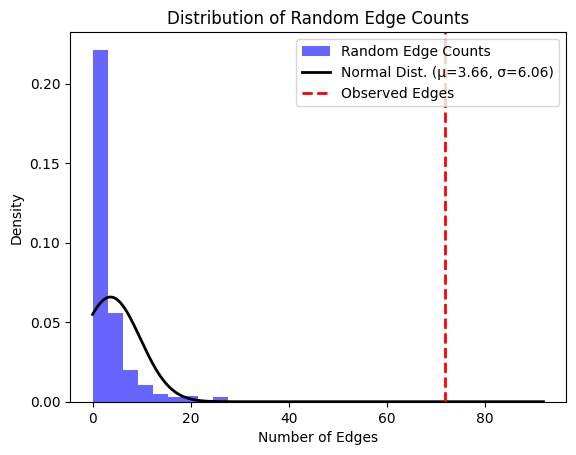

Genes mapped to human papilloma virus infection: 
human papilloma virus infection EFO_0001668
Genes mapped to human papilloma virus infection: 
['MIR365BHG', 'RNU6', '1134P', 'IFTAP', 'RPL7AP56', 'JPH2', 'GPR39', 'LINC02789', '778P', 'TIAM1', 'AS1', 'SOD1', 'DT', 'MIR646HG', 'LINC02723', 'NEGR1', 'LINC00393', 'KLF12', 'VSX2', 'RNA5SP173', 'NDUFB5P1', 'ZEB2P1', 'LDB2', 'PPP3CA', 'LINC02946', 'NCK2', 'HTR1D', 'RPL29P6', 'PACRG', 'RPLP0P9', 'LINC01947', 'NBAS', 'ITPR2', 'UVSSA', 'PARP4P2', 'CCNQP3', 'CDH12', 'Y_RNA', 'ACYP2', 'RN7SL183P', 'SPACA1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to renal overload-type gout: 
renal overload-type gout EFO_0021525
Genes mapped to renal overload-type gout: 
['ABCG2', 'SPATA31C2', 'RPSAP49', 'RN7SL318P', 'RPL23AP54']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to vision disorder: 
vision disorder MONDO_0021084
Genes mapped to vision disorder: 
['SLC44A3', 'AS

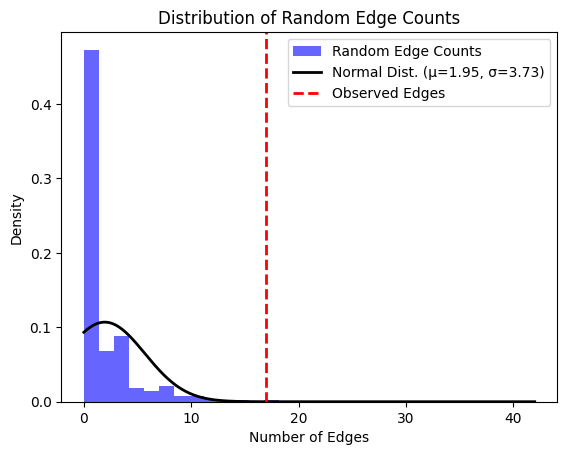

Genes mapped to clostridium difficile infection: 
clostridium difficile infection EFO_0009130
Genes mapped to clostridium difficile infection: 
['RNU6', '783P', 'LINC02686', 'DAP', 'DT', 'CTNND2', 'CNOT4', 'CEACAM16', 'AS1', 'BCL3', 'GRIN2A', 'CDH8', 'SORCS2', 'RPLP0P7', 'CDK7P1', 'SUMF1', 'TSPAN32', 'CSMD1', 'MAD2L1', 'ATP6V1G1P7', 'RPL7P45', 'DSCR4', 'KCNJ6', 'Y_RNA', 'CARS1P2', 'TRBVA', 'TRBV26', '1326P', 'RAD23BP3', 'GDPD1', 'PCDH9', 'NWD2', 'EHMT2', 'AQP4', 'HCG22', '1133P', 'LINC01648', 'MATN1', 'SNORD117', 'DDX39B', 'ATP6V1G2', 'RPL3P8', 'IMMP2L', 'C6orf15', 'NXPH1', 'GAPDHP68', 'EREG', 'AREG', 'QRSL1', 'COPS5P1', 'EPHA7', 'RN7SKP279', 'DNAJB6P1', 'U8', 'ALDH1B1', 'LINC02819', 'LRRC32', 'LINC00470', 'AIDAP3', 'SCAPER', 'LINC01541', 'LINC01899', 'PSORS1C1', 'LINC02606', 'SLC25A33', 'TRPS1', 'C1QL2', 'RN7SL468P', 'FBLN7', 'PKN2', 'LINC00624', 'RPS27P5', 'PSEN2', 'TSNAX', 'DISC1', 'MMADHC', 'FABP5P10', 'RBM43', 'OLA1', 'NSUN3', 'MTHFD2P1', 'HNRNPKP4', 'DLG1', 'LINC02012', 'LRBA', '

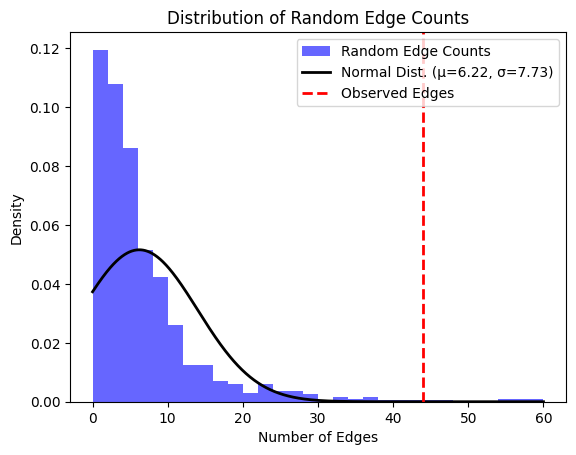

Genes mapped to response to immune checkpoint inhibitor, immune system toxicity: 
response to immune checkpoint inhibitor, immune system toxicity EFO_0011053
Genes mapped to response to immune checkpoint inhibitor, immune system toxicity: 
['ADAMTS9', 'AS2', 'LINC02040', 'LINC01187', 'C5orf58']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to glucose-dependent insulinotropic peptide measurement: 
glucose-dependent insulinotropic peptide measurement EFO_0008464
Genes mapped to glucose-dependent insulinotropic peptide measurement: 
['EXOC2', 'LINC01622', 'LINC00276', 'NCOR2', 'LINC00862', 'GRIK1', 'LINC01254', 'APCDD1', 'SLCO1A2', 'PYROXD1', 'RPH3AL', 'SLC41A3', 'SLC13A3', 'TBCD', 'CACNA2D3', 'C1QBP', 'DTWD2', 'NBEA', 'LINC01035', 'ECM1', 'FALEC', 'TRIM60P16', 'CICP28', 'RNU6', '366P', 'SLC24A4', 'RPSAP72', 'TENT5A', 'RIPOR2', 'FRMD4B', 'LINC01091', 'CCDC141', 'CARD6', 'C7', 'PUM3', 'MSRA', 'LINC03022', 'ARPC3P3', 'IZUMO1R', 'VPS37B', 'ABCB9', '

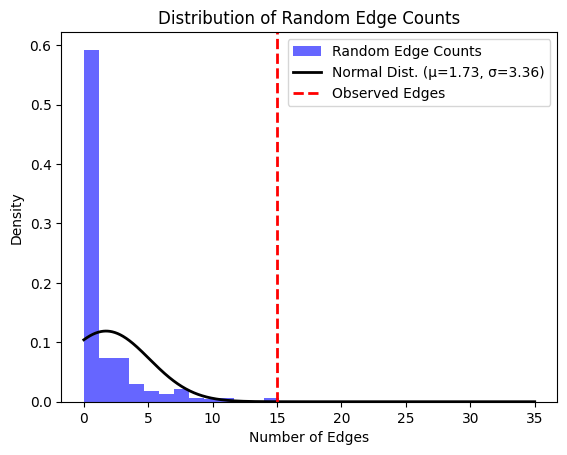

Genes mapped to Kleine-Levin Syndrome: 
Kleine-Levin Syndrome EFO_1001354
Genes mapped to Kleine-Levin Syndrome: 
No genes associated with the disease trait

Genes mapped to anti-NMDA receptor encephalitis: 
anti-NMDA receptor encephalitis MONDO_0021081
Genes mapped to anti-NMDA receptor encephalitis: 
['LRRK1', 'ACP2', 'IFIH1', 'LINC02571', 'HLA', 'B', 'MICC', 'TMPOP1', 'DRB6']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to sterol measurement: 
sterol measurement EFO_0010231
Genes mapped to sterol measurement: 
['LINC02702', 'BUD13', 'APOA5', 'LNC', 'RHL1', 'ZPR1', 'APOC3', 'SIK3', 'PAFAH1B2', 'NECTIN2', 'APOE', 'APOC1', 'APOC1P1', 'CYP39A1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to carotid artery disease: 
carotid artery disease EFO_0003781
Genes mapped to carotid artery disease: 
['GRIK2', 'R3HDM2P2', 'CYP4F44P', 'HSPA8P13', 'LINC01520', 'RNU6', '325P', 'NPS', 'FOXI2', 'OR4A6P', 'TRIM48',

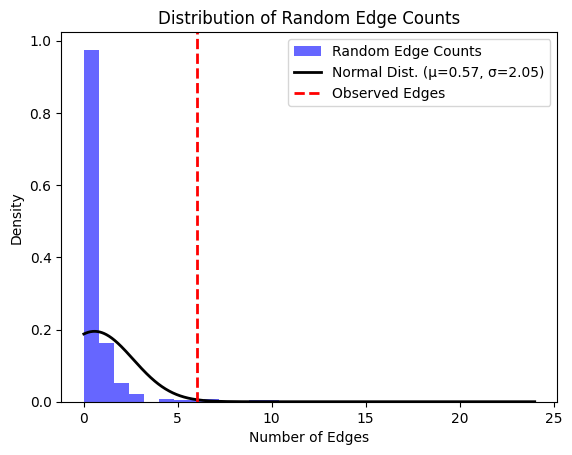

Genes mapped to Intrahepatic cholestasis of pregnancy: 
Intrahepatic cholestasis of pregnancy EFO_0009048
Genes mapped to Intrahepatic cholestasis of pregnancy: 
['ABCB11', 'ERH', 'SLC10A1', 'GCKR', 'ABCG8', 'DHRS9', 'SHROOM3', 'ABCB4', 'ABCB1', 'UBXN2B', 'CYP7A1', 'SERPINA1', 'ENPP7', 'ATP4A', 'LINC01595', 'SULT2A1', 'HNF4A']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to cholesterol efflux capacity measurement: 
cholesterol efflux capacity measurement EFO_0009132
Genes mapped to cholesterol efflux capacity measurement: 
['CDKAL1', 'PPP1CB', 'DT', 'LPL', 'ALDH1A2', 'LIPC', 'HERPUD1', 'CETP', 'APOE', 'APOC1', 'ZPR1', 'RBFOX3', 'MIR4739', 'APOC1P1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to Alzheimer disease, visuospatial impairment: 
Alzheimer disease, visuospatial impairment EFO_0009752
Genes mapped to Alzheimer disease, visuospatial impairment: 
['LINC01712', 'LINC01725', 'LINC02814', 'RNU6

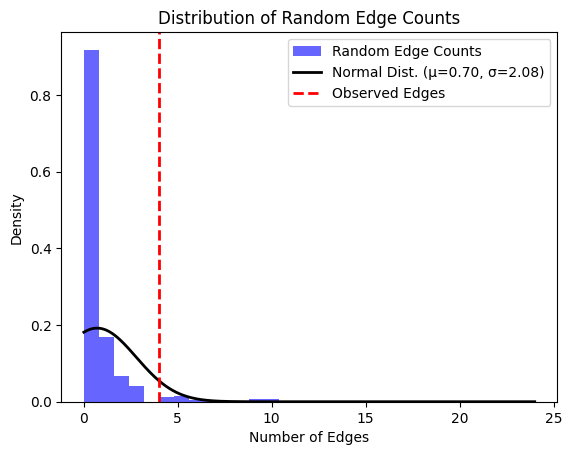

Genes mapped to heart rate variability measurement: 
heart rate variability measurement EFO_0008003
Genes mapped to heart rate variability measurement: 
['KNOP1P1', 'RN7SL38P', 'NDUFA11', 'SYT10', 'RNU6', '400P', 'NEO1', 'CPNE5', 'PPIL1', 'RGS6', 'HCN4', 'SIPA1L1', 'GNG11', 'RBFOX1', 'KIAA1755', 'SCN2B', 'CCDC141', 'GNGT1', 'LINC02914', 'RPL3P4', 'FUT5', 'CASQ2', 'OPCML', 'RPL29P34', 'MTHFD2P7', 'Y_RNA', 'PERPP1', 'KLHL3', 'KCNJ5', 'AS1', 'RN7SL865P', 'LINC02463', 'NF1P12', 'ALG10B', 'CPNE8', 'RNF220', 'HNRNPA0', 'PKD2L2', 'DT', 'CHRM2']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to susceptibility to chickenpox measurement: 
susceptibility to chickenpox measurement EFO_0008400
Genes mapped to susceptibility to chickenpox measurement: 
['NREP', 'INVS', 'RAB11FIP1', 'MUC22', 'LINC02853', 'FGFR2', 'ATE1', 'CCDC102B', 'DOK6', 'ME2P1', 'LINC01242', 'RNF39', 'LINC01435', 'EIF4EBP2P3', 'POU3F2', 'LINC02755', 'ABCB1', 'RPL9P21', 'TMEM72', 'AS1', 'L

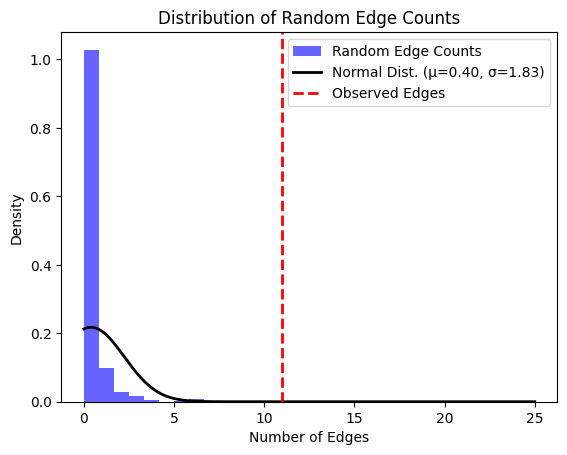

Genes mapped to susceptibility to chronic sinus infection measurement: 
susceptibility to chronic sinus infection measurement EFO_0008419
Genes mapped to susceptibility to chronic sinus infection measurement: 
['LINC01344', 'LINC00158', 'C1QTNF7', 'AS1', 'LINC02369', 'CYP19A1', 'MIR4713HG', 'CRACDL', 'TSGA10', 'WWOX', 'RNA5SP431', 'ST18', 'TICAM2', 'TMED7', 'ADGRE4P', 'LINC02098', 'ETS1', 'ZFHX4', 'LINC01111', 'LINC01493', 'RNU6', '99P', 'TSNARE1', 'CAND1', 'MRPL30', 'LYG2', 'RPL5P17', 'RPS2P25', 'AFF3', 'MAP3K15', '931P', 'RN7SKP199', 'SLC8A1', 'LINC02227', 'EBF1', 'RBFOX1', 'CNTNAP2', 'CCDC25', 'ADGRG2', 'PDHA1', 'TVP23A', 'CIITA', 'NDC1', 'GADD45G', 'LINC03062', 'ROBO2', 'HHIP', 'HLA', 'DRB1', 'DQA1', 'RANBP6', 'GTF3AP1', 'VGLL4', 'CAPZA1P4', 'PLXNA4', 'COMMD4P1', 'ADAMTS7P3', 'CENPF', 'GAPDHP24', 'TPD52L3', 'UHRF2', 'SLCO3A1', 'DUXAP6', 'LINC01607', 'MRPS28', 'REV1', 'C14orf178', 'NLRP4', 'SLC30A6']
The number of edges in the network is less than the minimum requirement: 4

Genes m

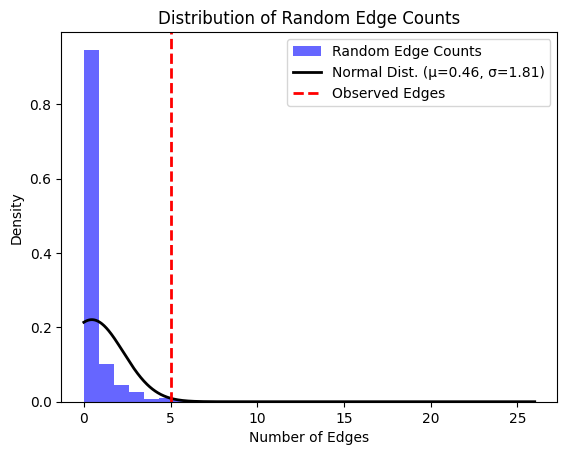

Genes mapped to Hodgkins lymphoma, mixed cellularity: 
Hodgkins lymphoma, mixed cellularity EFO_1002031
Genes mapped to Hodgkins lymphoma, mixed cellularity: 
['TSBP1', 'AS1', 'HLA', 'F']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to susceptibility to plantar warts measurement: 
susceptibility to plantar warts measurement EFO_0008406
Genes mapped to susceptibility to plantar warts measurement: 
['PTPN3', 'ADRA1B', 'CELF2', 'AS1', 'USP6NL', 'A3GALT2', 'PHC2', 'HLA', 'DPB1', 'DPA1', 'CRCT1', 'LCE3E', 'FAM9B', 'TBL1X', 'LINC01874', 'IRF4', 'EXOC2', 'KDM4B', 'PALM2AKAP2', 'IFNG', 'UBE2V1P4', 'TOR1B', 'SLC38A7', 'MRPS18CP7', 'RNA5SP505', 'HCP5', 'MICB', 'DT', 'LY6G6F', 'LY6G6D', 'NOTCH4', 'TSBP1', 'DQA1', 'DQB3', 'DQA2', 'LINC01173', 'SH3BP4', 'CCDST', 'HSPA1L', 'TMEM164', 'NRM', 'RPL7P4', 'N4BP2', 'BSND', 'TPTE2P1', 'DRA', 'CAMTA1', 'TGFB2', 'LINC02569', 'GNL1', 'ESRRB', 'CYCSP1', 'CFAP47', 'H2AL1Q', 'POLR1HASP', 'DGKB', 'MOG', 'ZIC1', 'NPM1P28

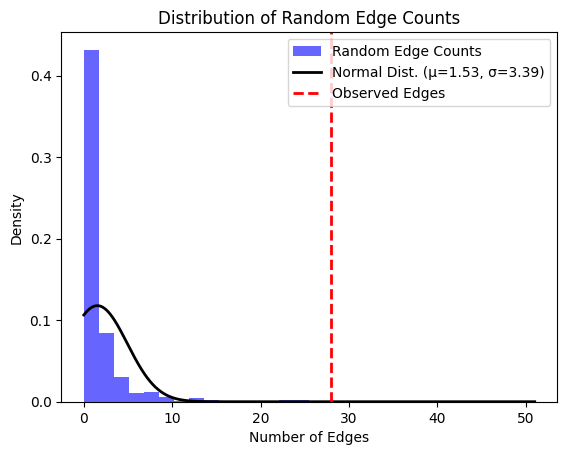

Genes mapped to susceptibility to scarlet fever measurement: 
susceptibility to scarlet fever measurement EFO_0008409
Genes mapped to susceptibility to scarlet fever measurement: 
['CDH13', 'CELSR1', 'JPH3', 'GPSM3', 'HLA', 'DQB1', 'AS1', 'ACAT1', 'TRBV29', '1', 'PRSS1', 'CUL5', 'AOAH', 'SPNS3', 'POT1', 'EEF1GP1', 'SCNN1A', 'PVALB', 'NCF4', 'LINC02676', 'LINC00709', 'CYP21A2', 'SLC44A4', 'LINC02096', 'PPP2R3A', 'EIF3E', 'RN7SKP218', 'LINC01446', 'LINC02241', 'GUSBP1', 'ATE1', 'CDKL4', 'SOS1', 'PTPRN2', 'BMPR1B', 'LINC00598', 'RPL9P15', 'MME', 'LINC01505', 'NEGR1', 'SDK2', 'DQB2', 'DOB', 'ANKRD12', 'PLB1', 'POLR3KP1', 'RPP40P2', 'FRYL', 'DEUP1', 'ADAM7', 'PPP2R2C', 'LINC02796', 'KRT8P21', 'EXTL2P1', 'LNPK', 'TSBP1', 'DRA', 'C11orf65', 'CT75', 'Y_RNA', 'GDA', 'PPFIA2', 'LINC02426', 'PRIMA1', 'FAM181A', 'SEC24B', 'SETP20', 'NFKB1', 'MANBA', 'RN7SL700P', 'SUCLA2', 'PVT1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to craniofacial microsomia: 
c

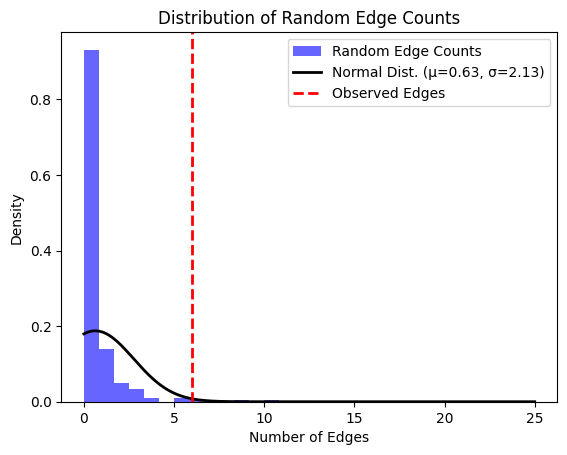

Genes mapped to trait in response to phenytoin, maculopapular eruption: 
trait in response to phenytoin, maculopapular eruption EFO_1001253
Genes mapped to trait in response to phenytoin, maculopapular eruption: 
['CFHR4']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to anti-centromere-antibody-positive systemic scleroderma: 
anti-centromere-antibody-positive systemic scleroderma EFO_0008536
Genes mapped to anti-centromere-antibody-positive systemic scleroderma: 
['FCGR3B', 'FCGR2B', 'STAT4', 'IRF5', 'TNPO3', 'LINC02132', 'LINC01082', 'PARVB', 'STMN1P2', 'RPS23P2', 'HLA', 'DRB9', 'DRB5', 'LINC01479', 'IFNG', 'AS1', 'RTEL1', 'TNFRSF6B']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to anti-topoisomerase-I-antibody-positive systemic scleroderma: 
anti-topoisomerase-I-antibody-positive systemic scleroderma EFO_0008537
Genes mapped to anti-topoisomerase-I-antibody-positive systemic scleroderma: 
['IRF5',

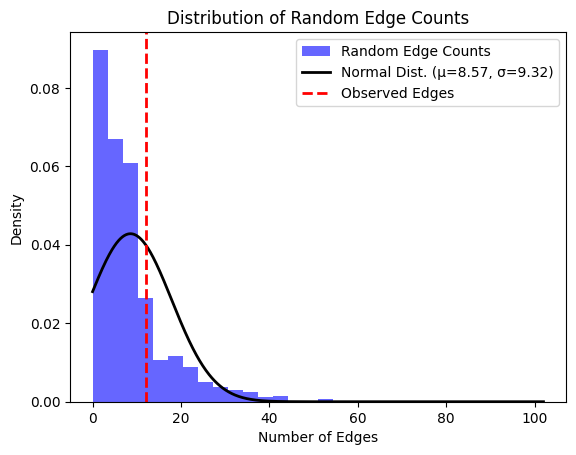

Genes mapped to response to methotrexate, neurotoxicity: 
response to methotrexate, neurotoxicity EFO_0011057
Genes mapped to response to methotrexate, neurotoxicity: 
['MACF1', 'PLCL1', 'LINC01923', 'ZDHHC19', 'RPL6P32', 'RNA5SP199', 'MBOAT1', 'HMGB1P37', 'DAB2IP', 'KAZALD1', 'TLX1NB', 'STIM1', 'GPC6', 'DCT', 'Metazoa_SRP', 'LINC02301', 'NXN', 'PNPLA6', 'PKN1', 'GIPC1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to heart valve disease: 
heart valve disease EFO_0009551
Genes mapped to heart valve disease: 
['PITX2', 'LINC01438', 'P2RX3', 'LPA', 'CEP85L', 'MECOM', 'CELSR2', 'PSRC1', 'LINC01708', 'TRIB1AL', 'TEX41', 'CDK6', 'FADS1', 'FADS2']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to carpal tunnel syndrome: 
carpal tunnel syndrome EFO_0004143
Genes mapped to carpal tunnel syndrome: 
['THBS3', 'AS1', 'TESHL', 'PID1', 'DNER', 'EFEMP1', 'RNA5SP94', 'MIR4432HG', 'LINC02517', 'ACOX3', 'HLA', 'DQA1',

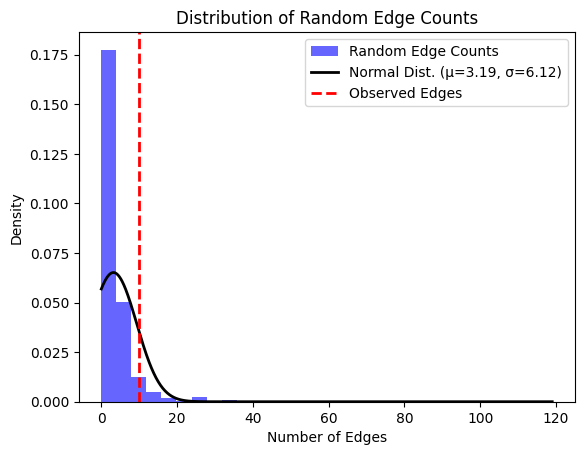

Genes mapped to glomerulonephritis: 
glomerulonephritis MONDO_0002462
Genes mapped to glomerulonephritis: 
['PRRC2A', 'HLA', 'DQA1', 'OSBPL10', 'APOL1', 'BVES', 'AS1', 'PREP', 'NKX2', '3', 'SLC25A28', 'TPCN2', 'LINC02258', 'RPS4XP15', 'NFIA', 'NRXN1', 'EPHB3', 'MAGEF1', 'ACAP2', 'UCHL1', 'Y_RNA', 'LINC01564', 'LRRC1', 'HNRNPA1P69', 'LINC03056', 'ZCCHC8', 'RSRC2', 'KLF13', 'CHD2', 'RPH3AL', 'TMEM132E', 'CCT6B', 'CCDC102B', 'DOK6', 'PEX10', 'ADGRL2', 'DUSP23', 'FCRL6', 'COL4A4', 'POC1A', 'ALDOAP1', 'OTOL1', 'TOMM22P6', 'MCF2L2P1', 'ADIPOQ', 'RNA5SP169', 'LINC02273', 'RPL6P32', 'RNA5SP199', 'PHYKPL', 'PRKN', 'NPM1P11', 'THSD7A', 'CDK14', 'DNAJB6', 'PTPRN2', 'LINC02947', 'LINC02599', 'FRMD4A', 'CACNA1C', 'GPC6', 'RPS6KA5', 'RABEP2', 'CD19', 'CDH19', 'GPCPD1', 'SHLD1', 'MIR3201', 'TAFA5', 'COL6A6', 'LINC03122', 'LINC01149', 'MAP3K7', 'MIR4643']
Random edges calculation completed

z score: 3.05807619071102



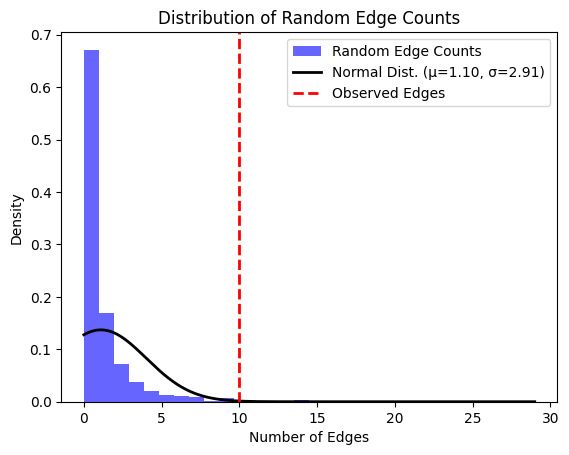

Genes mapped to polyp of colon: 
polyp of colon MONDO_0021400
Genes mapped to polyp of colon: 
['PIK3C2B', 'MDM4', 'BOC', 'RNU6', '637P', 'TERC', 'RPS27P4', 'MRPS31P1', 'PITX1', 'AS1', 'LINC00604', 'BMP5', 'TNS3', 'LINC00536', 'EIF3H', 'POU5F1B', 'CASC8', 'CCAT2', 'PCAT1', 'ABO', 'VTI1A', 'RNA5SP299', 'LINC02676', 'POU2AF2', 'SIRT3', 'FADS2', 'FADS3', 'XRRA1', 'ACAD10', 'TBX3', 'UBA52P7', 'ATF1', 'ATP5MFP5', 'PLEKHG6', 'NTN4', 'PGAM1P5', 'SMAD9', 'NID2', 'BMP4', 'GREM1', 'SMAD3', 'TTLL13', 'CDH3', 'CDH1', 'TP53', 'NXN', 'METRNL', 'SMAD7', 'PRAM1', 'PREX1', 'LAMA5', 'FGFR3P3', 'CASC20', 'NDUFA5P10', 'LINC01768', 'FADS1', 'CHRDL2', 'CCND2', 'Y_RNA', 'COLCA1', 'POU2AF3', 'BCL2']
Random edges calculation completed

z score: 54.59544072036208



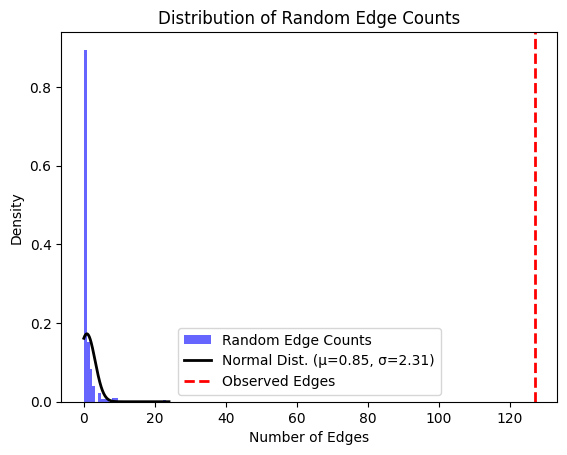

Genes mapped to pulmonary tuberculosis: 
pulmonary tuberculosis EFO_1000049
Genes mapped to pulmonary tuberculosis: 
['HLA', 'DQA1', 'DQB1', 'DAP', 'RN7SKP108', 'LINC02299', 'FSTL5', 'RN7SL602P', 'SMIM7P1', 'GTF2F2P2', 'RIMS3', 'LMCD1', 'AS1', 'CSGALNACT1', 'RPS4XP18', 'RNU6', '1032P', 'MFAP2', 'ATP13A2', 'PIP5K1A', 'CWC22', 'SCHLAP1', 'LINC01194', 'CCNY', 'LINC00648', 'TFF3', 'TFF2', 'MYT1L', 'DRB1', 'RN7SL292P', 'SGO1P2', 'SCN3B', 'ZNF202', 'LAMA3', 'LINC01830', 'GEM', 'RPS4XP10', 'NEDD4', 'DSEL', 'RBL1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to sleep apnea: 
sleep apnea EFO_0003877
Genes mapped to sleep apnea: 
['SMIM30', 'PPP1R3A', 'FTO', 'SLC39A8', 'LINC01122', 'ETV5', 'LINC01875', 'TMEM18', 'GHITM', 'CERNA2', 'HDGFL3', 'MACF1', 'LINC01876', 'ROBO2', 'FGF18', 'CEP120', 'SEMA3A', 'HIGD1AP18', 'PKIA', 'AS1', 'ABO', 'LINC02676', 'LINC00709', 'BDNF', 'AS', 'ACTN3', 'DLEU7', 'DLEU1', 'ISL2', 'NPAP1L', 'GNPATP', 'JPT2', 'SKAP1', 'NOG', 

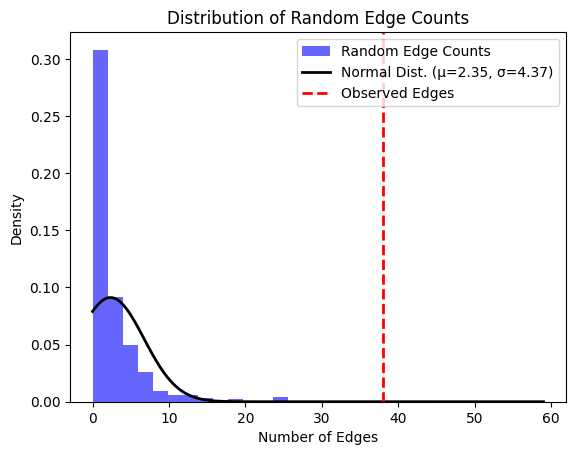

Genes mapped to Stevens-Johnson syndrome: 
Stevens-Johnson syndrome EFO_0004276
Genes mapped to Stevens-Johnson syndrome: 
['XRCC6P3', 'PTMAP10', 'IMPDH1P3']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to liver neoplasm: 
liver neoplasm EFO_1001513
Genes mapped to liver neoplasm: 
['HLA', 'DQB1', 'MTCO3P1', 'SUGP1', 'IFNL4', 'MSRB1P1', 'PNPLA3', 'B', 'DQA1', 'IFNL3P1', 'IFNL3', 'DPB1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to iritis: 
iritis EFO_1000997
Genes mapped to iritis: 
['CAST', 'HS3ST5', 'HDAC2', 'AS2', 'HLA', 'B', 'RNU6', '283P', 'TNRC18', 'SELENOV', 'EID2B', 'MICA', 'LINC01149', 'ACTG1P19', 'GAPDHP26']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to pneumothorax: 
pneumothorax MONDO_0002076
Genes mapped to pneumothorax: 
['CWH43', 'SNX18P23', 'HYKK']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped

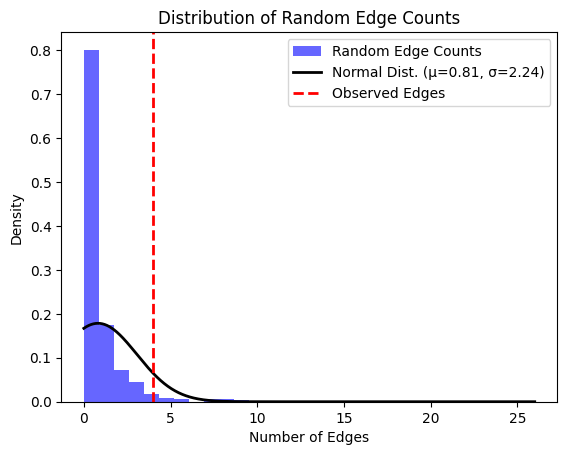

Genes mapped to eye disease: 
eye disease EFO_0003966
Genes mapped to eye disease: 
['MICA', 'AS1', 'LINC01149', 'LINC01794', 'HNRNPA1P57', 'CFB', 'HLA', 'C', 'USP8P1', 'RNU6', '283P', 'FGFR3P1', 'IL6', 'JAK2', 'REXO2', 'NXPE2P1', 'BLK', 'LINC00208', 'KCNH7', 'SLC24A3', 'ABCA1', 'CT70', 'NAV3', 'FLJ40194', 'RASGEF1B', 'LINC00554', 'FRMPD2', 'BICC1', 'ECEL1', 'PRSS56', 'BMP4', 'RDH5', 'TCF7L2', 'ARMS2', 'PNPT1', 'EFEMP1', 'LINC02252', 'GJD2', 'CDCA3', 'GNB3', 'RPL21P38', 'DYNC1I2', 'RBFOX1', 'ZMAT4', 'TSPAN10', 'CFAP299', 'CADM2', 'KCNQ5', 'WNT7B', 'ME3', 'PTCD2', 'YBX1P5', 'TOX', 'DT', 'RNA5SP267', 'TMCO1', 'KCNMA1', 'RGR', 'LINC02322', 'C14orf39', 'SHISA6', 'LRRC4C', 'ANKRD34C', 'LAMA2', 'STK32C', 'HERC2', 'DQA1', 'DQB1', 'AIDA', '187P', 'RNA5SP112', 'RARB', 'NECTIN3', 'RBMXP1', 'PRR11P1', 'CRTAM', 'RNU5A', '7P', 'C12orf56', 'SPART', 'LINC02852', 'LETR1', 'LINC00923', 'ARRDC4', 'CBFA2T3', 'SPATA33', 'MIR8062', 'RN7SL547P', 'PCP4', 'DSCAM', '660P', 'BASP1', 'CDH18', 'PDZD2', 'GOLPH3', 

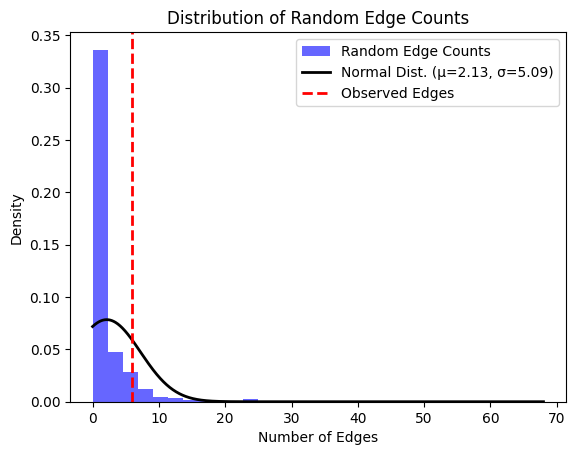

Genes mapped to encephalopathy, acute, infection-induced: 
encephalopathy, acute, infection-induced MONDO_0000166
Genes mapped to encephalopathy, acute, infection-induced: 
['FBXO38', 'DT', 'MARCOL', 'RCAN2']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to Rubella virus seropositivity: 
Rubella virus seropositivity EFO_0009344
Genes mapped to Rubella virus seropositivity: 
['IGHV3', '62', 'IGHVII', '1', '72', '73', 'SLC20A1P1', 'KIAA1217']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to Helicobacter pylori seropositivity: 
Helicobacter pylori seropositivity EFO_0009341
Genes mapped to Helicobacter pylori seropositivity: 
['TENM4', 'RNU6', '544P', 'CSMD1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to breast neoplasm: 
breast neoplasm EFO_0003869
Genes mapped to breast neoplasm: 
['TTC28', 'CHEK2']
The number of edges in the network is less than the minim

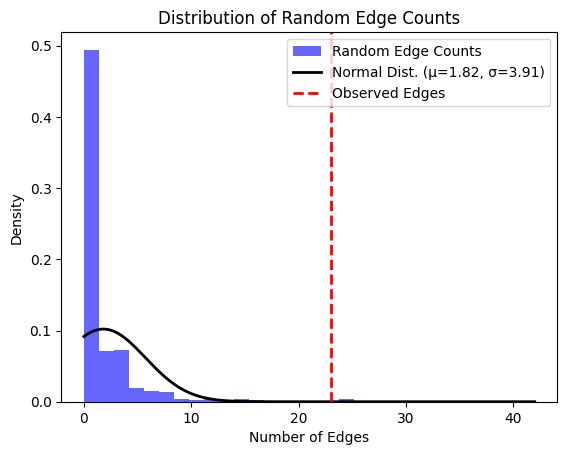

Genes mapped to Phlebitis: 
Phlebitis EFO_1001395
Genes mapped to Phlebitis: 
['CREB3L1', 'DGKZ']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to deafness: 
deafness EFO_0001063
Genes mapped to deafness: 
['GJB6', 'CRYL1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to age of onset of stroke disorder: 
age of onset of stroke disorder OBA_2040155
Genes mapped to age of onset of stroke disorder: 
['APOE']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to atopic eczema, age of onset of allergic disease: 
atopic eczema, age of onset of allergic disease OBA_2001017
Genes mapped to atopic eczema, age of onset of allergic disease: 
No genes associated with the disease trait

Genes mapped to chronic disease: 
chronic disease EFO_0009714
Genes mapped to chronic disease: 
No genes associated with the disease trait

Genes mapped to familial hyperlipidemia: 
familial h

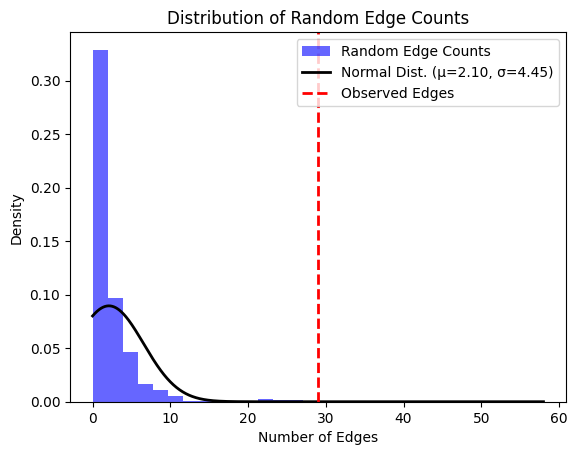

Genes mapped to retinal drusen: 
retinal drusen EFO_1001155
Genes mapped to retinal drusen: 
['FSTL1', 'GABRG1', 'MEI4', 'IRAK1BP1', 'AVEN', 'GADD45B', 'RNU6', '993P', 'LINC01724', 'SVEP1', 'PLEKHG1', 'GNG5P1', 'PRR18', 'LINC02403', 'RPL21P103', 'COLEC12', 'C12orf42', 'C1QTNF1', 'ENGASE', 'LINC01871', 'LINC00299', 'CTNND2', 'SOCS5P5', 'LINC02518', 'GOLIM4', 'EGFEM1P', 'SDR16C6P', 'CCDC185', 'CAPN8', 'CENPW', 'PTK2B', 'VWF', 'CD9', 'ITGA2', 'MIR9', '3HG', 'BRI3BP', 'AACS', 'MTCYBP27', '976P', 'LINC01191', 'SEPHS1P7', 'LARP1B', 'SERF1AP1', 'STMN1P2', 'SETD7', 'QKILA', 'MITA1', 'RPL3P9', 'UNC13C']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to macular degeneration: 
macular degeneration EFO_0009606
Genes mapped to macular degeneration: 
['MIR99AHG', 'RNU1', '98P', 'PLEKHA1', 'ARMS2', 'TYR', 'HERC2', 'RAD51B', 'PDGFB', 'RPL3', 'CFI', 'FAM8A1', 'C3', 'KCNT2', 'CFH', 'RDH5', 'C9', 'CETP', 'APOE', 'LINC02537', 'LINC01512', 'RN7SKP146', 'CLUL1', 'MI

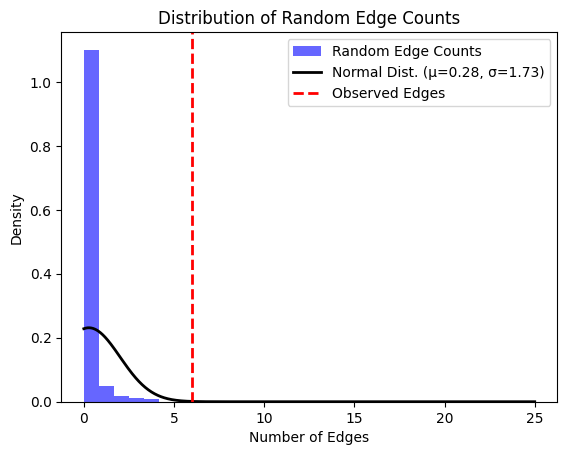

Genes mapped to optic atrophy: 
optic atrophy MONDO_0003608
Genes mapped to optic atrophy: 
['NEK7', 'ATP6V1G3', 'TMPRSS2', 'LINC02781', 'LINC02782', 'LYPD6B', 'IRX1', 'LINC02063']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to vertebral joint disease: 
vertebral joint disease EFO_0009477
Genes mapped to vertebral joint disease: 
No genes associated with the disease trait

Genes mapped to spondylolisthesis: 
spondylolisthesis EFO_0007493
Genes mapped to spondylolisthesis: 
['LINC01685', 'HSPA5P1', 'CLPS', 'RNU6', '983P', 'LINC01724', 'TTC33', 'ANTXR1', 'GFPT1', 'NFU1', 'ZNF385D', 'RBMS3', 'NMD3', 'EEF1GP4', 'ADH7', 'DMGDH', 'RPL35AP3', 'NHEG1', 'ZNF804B', 'RN7SL318P', 'RPL23AP54', 'WWP1', 'NSMCE2', 'UBE2D1', 'TFAM', 'VTI1A', 'REC114', '929P', 'BMP7', 'RUNX1', 'EEF1A1P14', 'UGT1A4', 'UGT1A9', 'UGT1A5', 'UGT1A6', 'UGT1A3', 'UGT1A10', 'UGT1A7', 'UGT1A8']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to

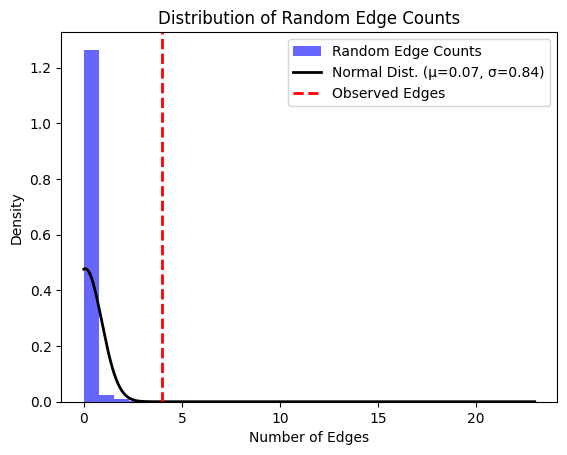

Genes mapped to Cystic Kidney Disease: 
Cystic Kidney Disease EFO_0008615
Genes mapped to Cystic Kidney Disease: 
['FANCD2OS', 'TBX2', 'AS1', 'BCAS3', 'ERP44', 'ELF3', 'Y_RNA', 'TPD52L3', 'UHRF2', 'INVS', 'RNA5SP431', 'MAF']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to Myocardial Ischemia: 
Myocardial Ischemia EFO_1001375
Genes mapped to Myocardial Ischemia: 
['RBM46', 'NPY2R', 'AS1', 'OR4A16', 'OR4A15', 'OR4C14P', 'OR4C15']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to aortic disease: 
aortic disease EFO_0005775
Genes mapped to aortic disease: 
['MAIP1', 'SPATS2L', 'NTM', 'CRAT37', 'RDH13', 'NES', 'CRABP2', 'KCTD8', 'YIPF7', 'ARHGAP24', 'CTIF']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to cerebral small vessel disease: 
cerebral small vessel disease EFO_0008493
Genes mapped to cerebral small vessel disease: 
['TMEM178A', 'LINC03106', 'CAAP1']
The 

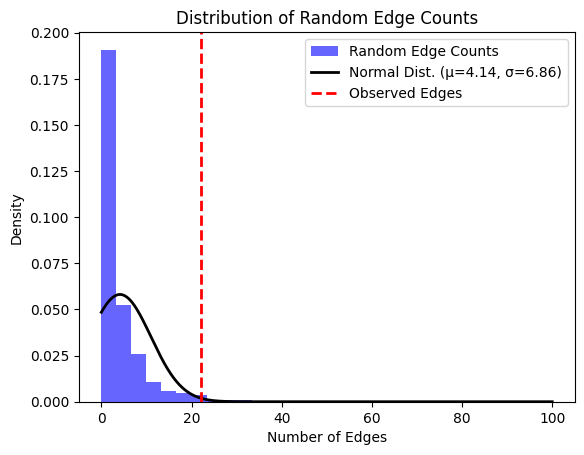

Genes mapped to low density lipoprotein triglyceride measurement: 
low density lipoprotein triglyceride measurement EFO_0009946
Genes mapped to low density lipoprotein triglyceride measurement: 
['ZPR1', 'ALDH1A2', 'LIPC', 'SUGP1', 'APOE', 'LPL', 'RPL30P9', 'SFSWAP', 'AS1', 'TDRD15', 'NUTF2P8', 'APOB', 'TRIB1AL']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to response to sulfonylurea, glucose change measurement: 
response to sulfonylurea, glucose change measurement EFO_0020881
Genes mapped to response to sulfonylurea, glucose change measurement: 
['SNRPGP16', 'MTNR1B', 'LINC02374', 'LINC02514', 'LINC01539', 'TXNL1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to dementia: 
dementia MONDO_0001627
Genes mapped to dementia: 
['SGK1', 'PRKD1', 'CHCHD2', 'RMI2', 'LINC02582', 'RN7SL401P', 'CHIAP3', 'NOP53', 'AS1', 'CCDC91', 'LINC01258', 'PDXDC2P', 'NPIPB14P', 'PDPR', 'COL24A1', 'LASTR', 'NCK2', 'BZW2', 

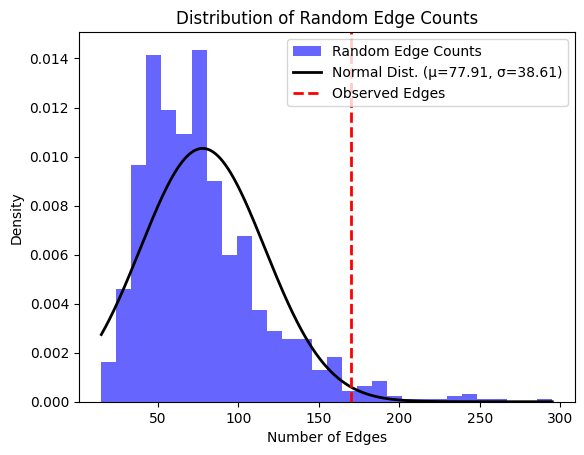

Genes mapped to response to radiation, dermatological toxicity: 
response to radiation, dermatological toxicity EFO_0011048
Genes mapped to response to radiation, dermatological toxicity: 
['LINC01779', 'SLAIN2', 'SLC10A4']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to response to radiation, lymphedema: 
response to radiation, lymphedema MONDO_0019297
Genes mapped to response to radiation, lymphedema: 
['PAX7', 'ATXN7L1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to childhood gender nonconformity: 
childhood gender nonconformity EFO_0020103
Genes mapped to childhood gender nonconformity: 
['SSBP3', 'LINC02784', 'MYSM1', 'JUN', 'XCL1', 'DPT', 'FOSL2', 'RNU6', '812P', 'REG3G', 'LINC02232', 'SLC1A3', 'AS1', 'LINC02101', 'PLK2', 'CDKL3', 'LINC02999', '456P', 'SMIM30', 'PPP1R3A', 'SND1', 'RN7SL474P', 'FGF20', 'RNA5SP279', 'SMARCA2', 'GRID1', 'WAPL', 'NAV2', 'KIAA1549L', 'SPTBN2', 'PC', 'LINC02151', 

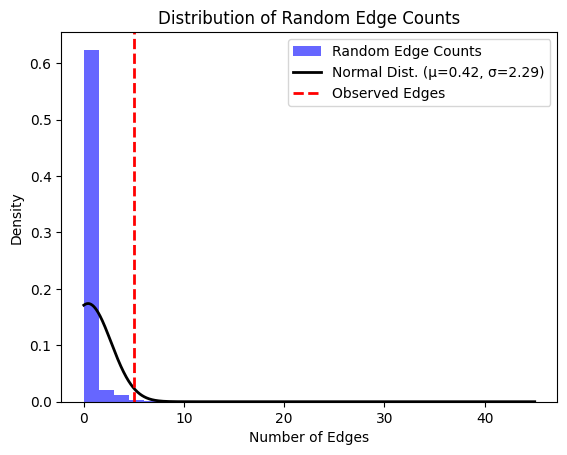

Genes mapped to response to clopidogrel, response to acetylsalicylate, major adverse cardiovascular event measurement: 
response to clopidogrel, response to acetylsalicylate, major adverse cardiovascular event measurement EFO_0020863
Genes mapped to response to clopidogrel, response to acetylsalicylate, major adverse cardiovascular event measurement: 
['MYOM2', 'WDR24', 'NECAB1', 'EFR3A', 'AGAP3', 'ZDHHC3', 'ECHS1', 'KRTAP10', '4', 'TSPEAR']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to Mycobacterium avium complex disease: 
Mycobacterium avium complex disease EFO_0007386
Genes mapped to Mycobacterium avium complex disease: 
['CHP2']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to tropical spastic paraparesis: 
tropical spastic paraparesis EFO_0007527
Genes mapped to tropical spastic paraparesis: 
['HCG21', 'MUCL3', 'SFTA2', 'TCF19', 'HLA', 'DRA', 'DRB9', 'B', 'BTN2A1', 'MCCD1', 'DQB1', 'MTCO3P1', 

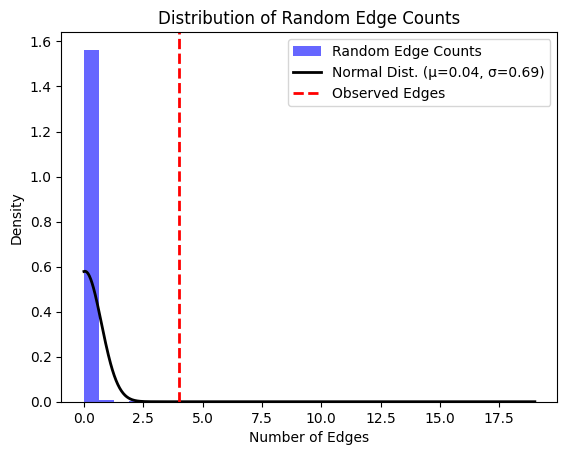

Genes mapped to Trypanosoma cruzi seropositivity: 
Trypanosoma cruzi seropositivity EFO_0005530
Genes mapped to Trypanosoma cruzi seropositivity: 
['CD247', 'EBF2', 'SDHD', 'IL18', 'SIK1', 'LINC00313']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to sarcopenia: 
sarcopenia EFO_1000653
Genes mapped to sarcopenia: 
['FDFT1', 'TTC9', 'RGS6', 'RNU6', '793P', 'RPL6P17', 'RN7SKP135', 'LINC01414', 'DMAC1', 'PTPRD', 'NECTIN1', 'DT', 'LINC02744', 'FTO', 'LDLRAD3', '567P', 'LINC03111', 'EPB41L4A', 'ZCCHC2', 'RN7SL705P', 'SFXN1', 'RN7SKP148']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to B-cell acute lymphoblastic leukemia with t(1;19)(q23;p13.3); E2A-PBX1 (TCF3-PBX1): 
B-cell acute lymphoblastic leukemia with t(1;19)(q23;p13.3); E2A-PBX1 (TCF3-PBX1) MONDO_0600030
Genes mapped to B-cell acute lymphoblastic leukemia with t(1;19)(q23;p13.3); E2A-PBX1 (TCF3-PBX1): 
['BCL11A', 'RN7SL361P']
The number of edges in

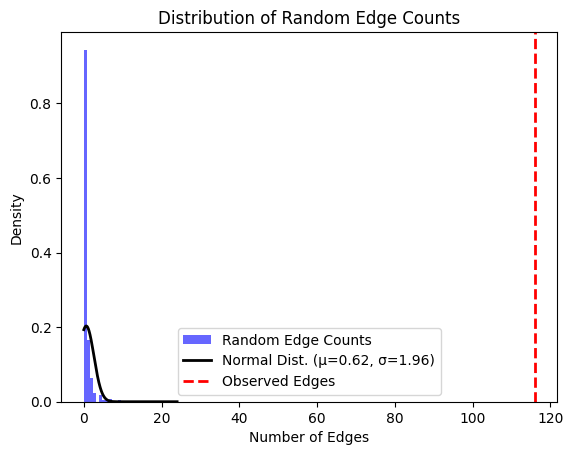

Genes mapped to albuminuria, stage 5 chronic kidney disease: 
albuminuria, stage 5 chronic kidney disease EFO_0009909
Genes mapped to albuminuria, stage 5 chronic kidney disease: 
['COL4A3', 'MFF', 'DT', 'MUC7', 'AMTN', 'LINC01266', 'RN7SL120P', 'STAC', 'CASC19', 'PRNCR1', 'PCAT1', 'TENM2']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to familial apolipoprotein B hypobetalipoproteinemia: 
familial apolipoprotein B hypobetalipoproteinemia EFO_1001789
Genes mapped to familial apolipoprotein B hypobetalipoproteinemia: 
['C6orf47', 'AS1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to lysophosphatidylcholine 26:1 measurement: 
lysophosphatidylcholine 26:1 measurement EFO_0021811
Genes mapped to lysophosphatidylcholine 26:1 measurement: 
['TMEM258', 'FADS2']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to chondromalacia: 
chondromalacia MONDO_0002342
Genes map

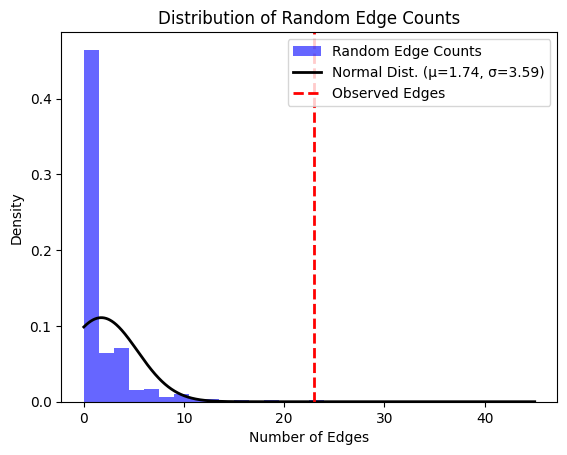

Genes mapped to meningitis: 
meningitis MONDO_0021108
Genes mapped to meningitis: 
['CACNA1E', 'ITPKB', 'RERE', 'APOA5', 'LNC', 'RHL1', 'RCN1', 'SCAPER', 'RAPH1', 'CD28', 'SGCD']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to susceptibility to influenza measurement: 
susceptibility to influenza measurement EFO_0803537
Genes mapped to susceptibility to influenza measurement: 
['NHLH2', 'HNRNPA1P43', 'PLXDC2', 'NMT1', 'YWHAQ', 'SEC14L6', 'SORCS2', 'NEFM', 'NEFL', 'NRG1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to post-operative acute kidney injury: 
post-operative acute kidney injury EFO_0009955
Genes mapped to post-operative acute kidney injury: 
['ZNF215', 'CDH26', 'LMO2', 'CAPRIN1', 'RCC2', 'ARHGEF10L', 'NFU1', 'RPL35P4', 'HNRNPA1P73']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to REM sleep behavior disorder: 
REM sleep behavior disorder EFO_00074

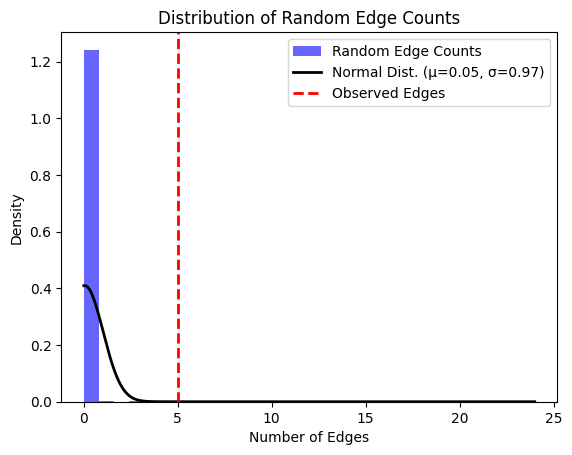

Genes mapped to trait in response to triamcinolone acetonide, ocular hypertension: 
trait in response to triamcinolone acetonide, ocular hypertension EFO_1001069
Genes mapped to trait in response to triamcinolone acetonide, ocular hypertension: 
['ZNF217', 'CHD9', 'CES5A', 'TEX14', 'TIMELESS', 'GDPD1', 'MARCHF9', 'CDH23', 'ITGB4', 'GCFC2', 'OTOGL', 'COL24A1', 'TUT7', 'LIPK', 'KIF20B', 'PALMD', 'HMGB3P10', 'FRRS1', 'UBBP1', 'RN7SKP141', 'TMEM132C', 'RGCC', 'VWA8', 'NUBP2', 'SPSB3', 'ZNRF4', 'OR10A4', 'ANGPTL4', 'DENND5A', 'SLC2A9', 'TTLL3', 'RPUSD3', 'IL17RC', 'STX10', 'CRPPA', 'AS1', 'CFAP61', 'DDOST', 'RIOK3', 'LDLRAD2', 'TRIM38', 'BACH1', 'GRIK1', 'VARS1', 'KRTAP1', '5', 'RIMOC1', 'RRP7BP', 'SERHL2']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to migraine without aura: 
migraine without aura MONDO_0100431
Genes mapped to migraine without aura: 
['PHACTR1', 'FHL5', 'LRP1']
The number of edges in the network is less than the minimum requirem

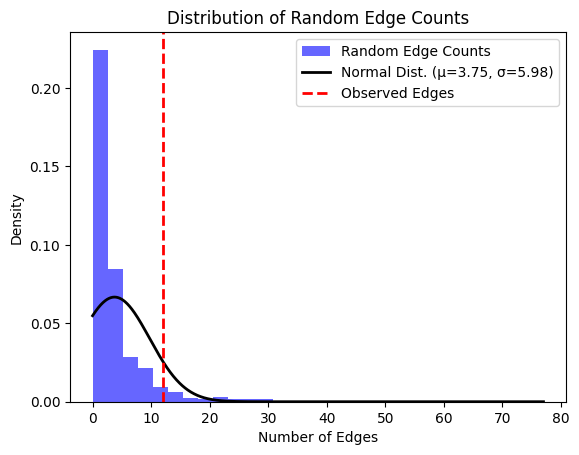

Genes mapped to internet addiction disorder: 
internet addiction disorder EFO_0803368
Genes mapped to internet addiction disorder: 
['TSNAX', 'DISC1', 'NID1', 'NRXN1', 'KCNH7', 'ZNF804A', 'ERBB4', 'NPY5R', 'GFRA3', 'NXPH1', 'GRM3', 'FOXP2', 'RNA5SP261', 'NRG1', 'ANK1', 'NTRK2', 'PRKG1', 'SCT', 'DRD4', 'NEDD1', 'AVEN', 'CHRM5', 'NTRK3', 'COMT', 'MAOB', 'FMR1', 'PNCK', 'SLC6A8', 'TMEM187', 'IRAK1']
Random edges calculation completed

z score: 3.2947688831982744



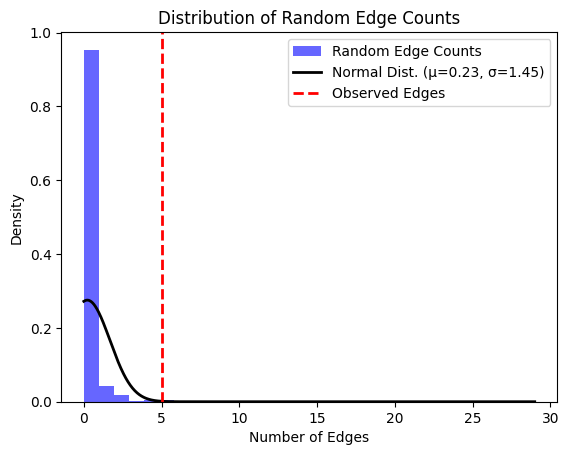

Genes mapped to proinsulin measurement: 
proinsulin measurement EFO_0010814
Genes mapped to proinsulin measurement: 
['RIOK3P1', 'RNU6', '38P', 'DLG1', 'AS1', 'LINC02012', 'SORCS1', 'HNRNPM', 'ZNF718']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to acute pancreatitis: 
acute pancreatitis EFO_1000652
Genes mapped to acute pancreatitis: 
['SPINK1', 'SCGB3A2', 'ABCG8', 'MORC4', 'EEF1A1P40', 'NUP62CL', 'TBC1D8B', 'STK32A', 'AS1', 'RNF128', 'SERPINA7P1', 'RADX', 'HTR4', 'ADRB2', 'WBP1LP1', 'TRBD1', 'CSGALNACT2P2', 'Y_RNA', 'LINC01937', 'JAKMIP2']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to cardiomyopathy: 
cardiomyopathy EFO_0000318
Genes mapped to cardiomyopathy: 
['DOCK1', 'CD36', 'DDB2', 'CDKN1A', 'BAG3', 'CAND2', 'Y_RNA', 'LINC01684', 'CLCNKA', 'LSM3', 'LINC01267', 'FLNC', 'LINC00964', 'MAP3K7CL', 'LINC01755', 'GRID2', 'RNA5SP164', 'LRRC1', 'MCM9', 'MITA1', 'RPL3P9', 'C10orf55', 'VCL', 'DUSP29',

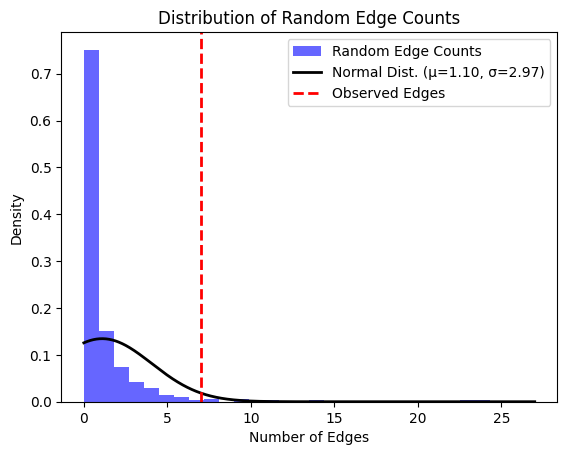

Genes mapped to age of onset of childhood onset asthma: 
age of onset of childhood onset asthma OBA_2001015
Genes mapped to age of onset of childhood onset asthma: 
['BCLAF1P1', 'TSLP', 'SLC7A10', 'CEBPA', 'FCER1G', 'CD247', 'ADORA1', 'NSL1', 'SPSB1', 'CNNM2', 'EIF2S2P3', 'HHEX', 'IRAG1', 'AP5B1', 'OVOL1', 'EMSY', 'LINC02757', 'ATXN2', 'PITPNM2', 'D2HGDH', 'TCP11', 'SCUBE3', 'IRF4', 'EXOC2', 'BACH2', 'IL6', 'MTCYBP42', 'SPMIP7', 'IKZF1', 'COLEC10', 'MYC', 'PVT1', 'RPL13AP18', 'RNU6', '1213P', 'ARRDC1', 'RAB5B', 'STAT6', 'LTBR', 'RPL31P10', 'TSPAN8', 'UBAC2', 'TRAF3', 'RAD51B', 'RTF1', 'ITPKA', 'RORA', 'CLEC16A', 'IL4R', 'CYLD', 'AS1', 'NOD2', 'NFATC3', 'GSDMB', 'STAT5A', 'MAP3K14', 'ZNF652', 'BCL2', 'SERPINB7', 'SBNO2', 'NFIC', 'RSPH6A', 'IL1RL1', 'IL18R1', 'FMNL2', 'SNRPGP8', 'CCL20', 'LINC00299', 'RTEL1', 'TNFRSF6B', 'PHF5A', 'ACO2', 'TMSB4X', 'FAM9C', 'EEFSEC', 'TIPARP', 'TBL1XR1', 'LINC02038', 'GLB1', 'BLTP1', 'TLR1', 'ARL2BPP4', 'HINT1', 'IL5', 'NDFIP1', 'ATG5', 'ID4', 'RPL29P17',

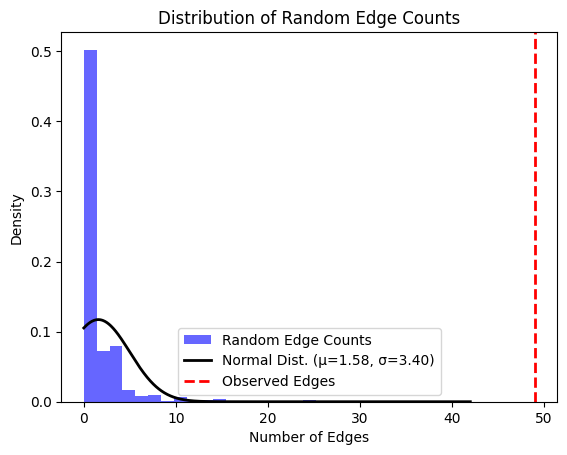

Genes mapped to cerebral atherosclerosis: 
cerebral atherosclerosis EFO_1000860
Genes mapped to cerebral atherosclerosis: 
['CHORDC1P5', 'CASP3P1', 'FAM153CP', 'RPSAP72', 'TENT5A', 'NFIB', 'AS1', 'ZDHHC21', 'SORCS3', 'LINC02627', 'FGD4', 'WASF3', 'GPR12', 'ZNF221', 'RIN2', 'LINC01853', 'MTCO1P44', 'LINC02929', 'UBASH3B', 'MIR4303', 'RNU4', '41P']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to Dental enamel hypoplasia: 
Dental enamel hypoplasia EFO_1001304
Genes mapped to Dental enamel hypoplasia: 
['PTPRD', 'LINC02424', 'SYT1', 'MYH14', 'DHX37', 'MAP3K21', 'SLC4A4', 'MACROD2', 'SCAPER', 'SEMA5B', 'ZMIZ1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to sick sinus syndrome: 
sick sinus syndrome MONDO_0001823
Genes mapped to sick sinus syndrome: 
['PITX2', 'LINC01438', 'KRT8', 'ZFHX3', 'TTN', 'CCDC141', 'SCN10A']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped

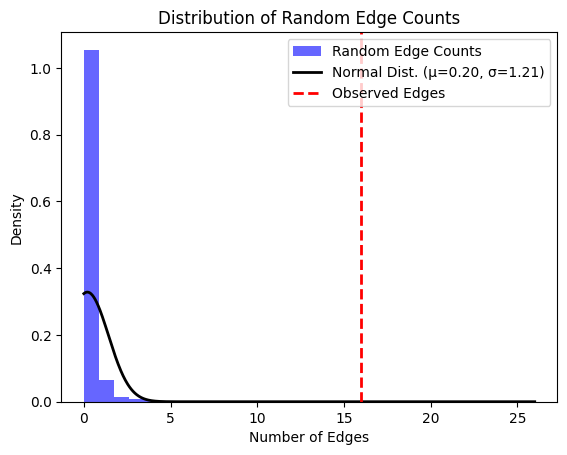

Genes mapped to impulse control disorder: 
impulse control disorder MONDO_0001162
Genes mapped to impulse control disorder: 
['DAB1', 'PRKAG2', 'MEFV', 'PRKCE']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to Sertoli Cell-Only Syndrome: 
Sertoli Cell-Only Syndrome EFO_1001422
Genes mapped to Sertoli Cell-Only Syndrome: 
['HLA', 'DRB1', 'VRK1', 'LINC02304']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to hip fracture: 
hip fracture EFO_0003964
Genes mapped to hip fracture: 
['APOE', 'LINC01700', 'LINC02940', 'LINC02128', 'LINC02127', 'SPINK2', 'REST', 'HOXC6', 'HOXC8']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to age of onset of type 2 diabetes mellitus: 
age of onset of type 2 diabetes mellitus OBA_2001013
Genes mapped to age of onset of type 2 diabetes mellitus: 
['TGFB1', 'WFS1', 'SLC30A8', 'ZNF285', 'AACS', 'CCND1', 'OR4A16', 'MC4R', 'RIMS2', 'ATP2A1

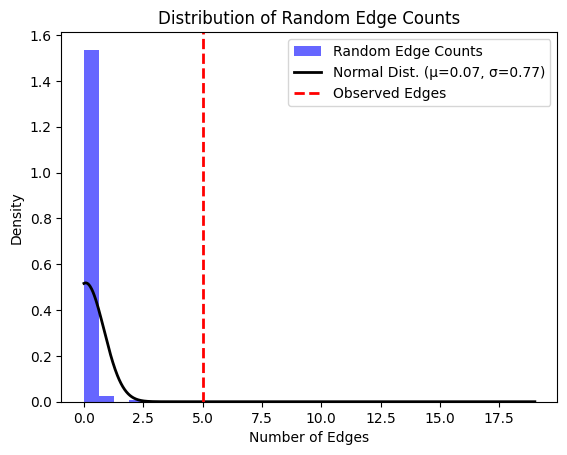

Genes mapped to retinopathy, retinoschisis: 
retinopathy, retinoschisis MONDO_0004579
Genes mapped to retinopathy, retinoschisis: 
['MIR9', '2HG', 'CELF2', 'LINC02322', 'C14orf39']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to peripheral nervous system disease: 
peripheral nervous system disease EFO_0009387
Genes mapped to peripheral nervous system disease: 
No genes associated with the disease trait

Genes mapped to facial nerve disease: 
facial nerve disease EFO_1002051
Genes mapped to facial nerve disease: 
['CDC5L', 'SUPT3H']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to Sleep Disorder: 
Sleep Disorder EFO_0008568
Genes mapped to Sleep Disorder: 
['MEIS1', 'APOE', 'SLC39A8', 'BTBD9', 'TMEM106B']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to neuroendocrine neoplasm: 
neuroendocrine neoplasm EFO_1001901
Genes mapped to neuroendocrine neoplasm: 
['L

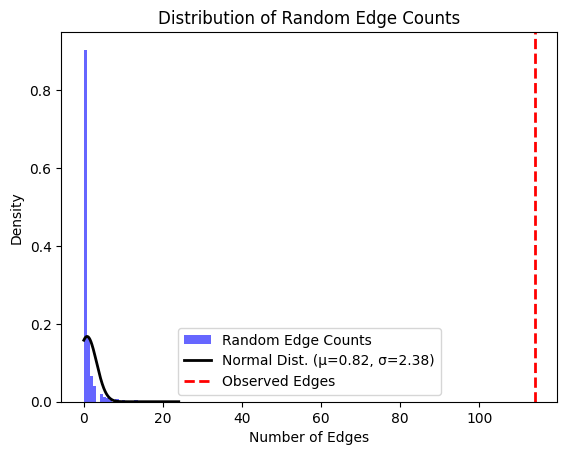

Genes mapped to polycythemia: 
polycythemia EFO_0005804
Genes mapped to polycythemia: 
['HK1', 'HFE', 'H2BC4', 'JAK2', 'TMPRSS6', 'PRKCE', 'EPO', 'ZAN', 'CNTROB']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to blood coagulation disease: 
blood coagulation disease EFO_0009314
Genes mapped to blood coagulation disease: 
['SLC19A2', 'F5', 'NME7', 'ATP1B1', 'ABO', 'PITX2', 'LINC01438', 'CAST', 'ADAMTS17', 'TMC5', 'PROC', 'FGG', 'F2', 'TRIB3']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to thrombophilia: 
thrombophilia EFO_0009315
Genes mapped to thrombophilia: 
['ABO', 'ATP1B1', 'F2', 'FGG', 'LRAT', 'NME7', 'LINC01876', 'F11', 'OR5BP1P', 'LRRC55', 'ELK1P1', 'ADCY1', 'FADS2B', 'LINC02296', 'LINC02330', 'LINC02141', 'NPAP1L', 'ZNF160', 'ATXN10', 'WNT7B', 'SLC19A2', 'F5']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to thrombocytopenia 4: 
thrombocytopenia 4 MO

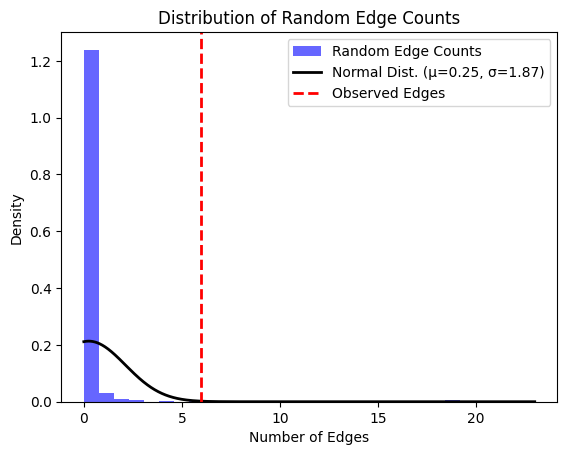

Genes mapped to acquired thrombocytopenia: 
acquired thrombocytopenia MONDO_0001198
Genes mapped to acquired thrombocytopenia: 
['PNPLA3', 'LRRTM4', 'PALLD', 'RPS6KA2', 'JAK2', 'FARP1', 'RNU4', '58P', 'DUXAP11', 'LINC01912']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to functional neutrophil defect: 
functional neutrophil defect MONDO_0015978
Genes mapped to functional neutrophil defect: 
['CADM3', 'AS1', 'ACKR1', 'PSMD3', 'CSF3', 'CSF3R', 'CDK6', 'ATXN2', 'TERT', 'JAK2', 'FCRL5', 'FCRL4', 'CD1D', 'CD1A', 'NHLH1', 'RNU4', '42P', 'MED24']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to neutropenia: 
neutropenia MONDO_0001475
Genes mapped to neutropenia: 
['CADM3', 'AS1', 'ACKR1', 'UBE2Q1', 'CHRNB2', 'PSMD3', 'CSF3', 'LMNA', 'NES', 'CRABP2', 'FCRLB', 'RN7SL466P', 'ZNF800', 'LINC03012', 'CDK5RAP2', 'WDR76', 'TPM1', 'LACTB', 'MED24']
The number of edges in the network is less than the minimum requirem

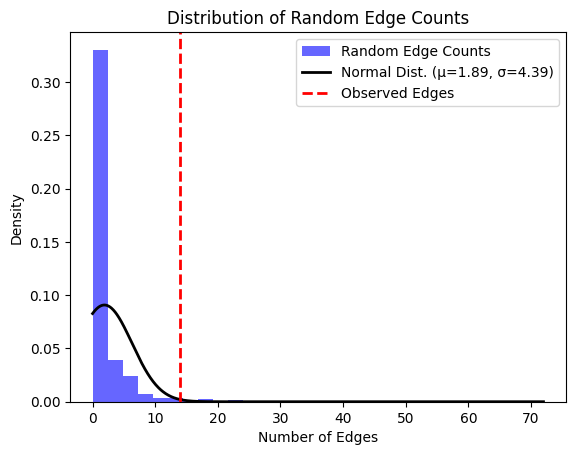

Genes mapped to postinflammatory pulmonary fibrosis: 
postinflammatory pulmonary fibrosis MONDO_0001438
Genes mapped to postinflammatory pulmonary fibrosis: 
['MUC5AC', 'MUC5B', 'DSP', 'KANSL1', 'LRRC34', 'TERT', 'ACTRT3', 'MYNN']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to respiratory failure: 
respiratory failure EFO_0009686
Genes mapped to respiratory failure: 
['CYP2F2P', 'CYP2A6', 'MUC5AC', 'MUC5B', 'CHRNA5', 'LINC02715', 'RDX', 'LINC02392', 'LINC02822']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to lung disease: 
lung disease EFO_0003818
Genes mapped to lung disease: 
['CHRNA3', 'PSMA4', 'CHRNA5']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to primary thrombocytopenia: 
primary thrombocytopenia MONDO_0004680
Genes mapped to primary thrombocytopenia: 
['RBMX2P4', 'ETV1', 'JAK2']
The number of edges in the network is less than the minimum requir

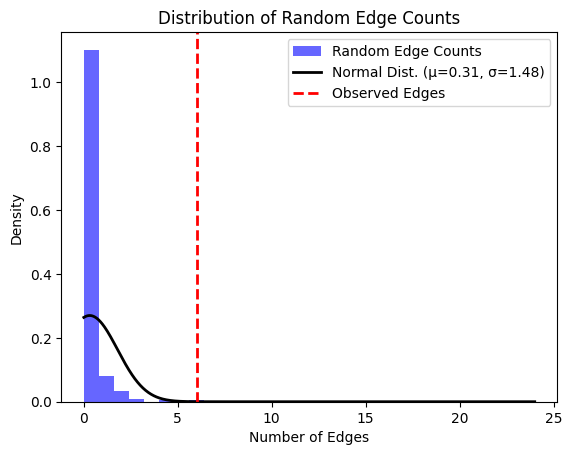

Genes mapped to sinusitis: 
sinusitis EFO_0007486
Genes mapped to sinusitis: 
['MKNK1', 'ATPAF1', 'RNU4', '77P', 'KCNK1', 'LRRC49', 'ACAA2', 'HLA', 'DQA1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to arterial embolism: 
arterial embolism EFO_0010671
Genes mapped to arterial embolism: 
['LPA', 'MIR646HG']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to vascular disease: 
vascular disease EFO_0004264
Genes mapped to vascular disease: 
['APOL1', 'MIR4455', 'LINC02437', 'CHD1', 'DT', 'LINC02113', 'OARD1', 'COBL', 'FRMD4A', 'LINC02719', 'GUCY1A2', 'UGGT2', 'UBE2FP2', 'RPS15AP34', 'LOHAN2', 'ZFHX3', 'DOK5', 'CYCSP42', 'RNU6', '1326P']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to lymphatic system disease: 
lymphatic system disease EFO_0007352
Genes mapped to lymphatic system disease: 
['SLC12A2', 'JUN', 'DT']
The number of edges in the network is less than

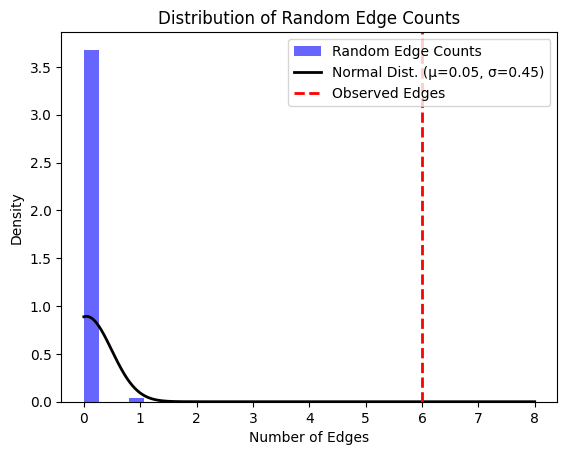

Genes mapped to intestinal infectious disease: 
intestinal infectious disease MONDO_0000916
Genes mapped to intestinal infectious disease: 
['EN1', 'MARCO', 'HLA', 'DRB9']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to enteritis: 
enteritis MONDO_0043579
Genes mapped to enteritis: 
['MAPK14', 'LINC02468', 'PDE3A', 'AS1', 'RNU7', '134P', 'CCDC182', 'SDK2', 'ACOT8', 'C6orf47', 'TSBP1', 'IL23R', 'C1orf141', 'NKD1', 'MTHFD2P1', 'HNRNPKP4', 'SUB1', 'LINC02061', 'RNU1', '150P', 'TTC33', 'SMIM3', 'CSMD1', 'NMT1', 'CEACAM20', 'DHX35', 'LINC01734']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to gram-negative bacterial infections: 
gram-negative bacterial infections MONDO_0021678
Genes mapped to gram-negative bacterial infections: 
['KAZN']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to staphylococcal skin infections: 
staphylococcal skin infections EFO_1001849
G

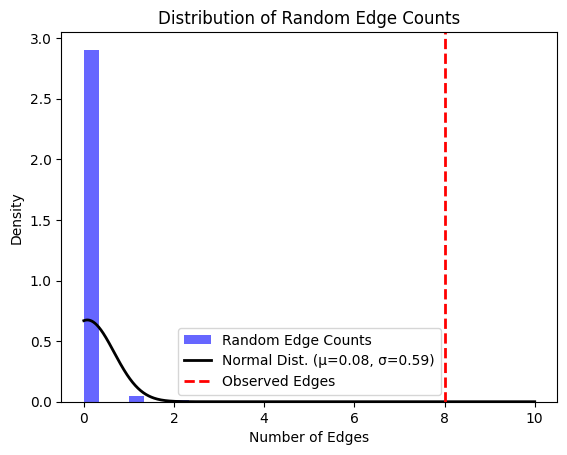

Genes mapped to occlusion precerebral artery: 
occlusion precerebral artery EFO_0009677
Genes mapped to occlusion precerebral artery: 
['LPA', 'APOE', 'APOC1', 'ELL', 'LINC02577', 'CDKN2B', 'AS1', 'ZNF335', 'IPO9', 'NAV1', 'CELSR2', 'PSRC1', 'CDH13', 'VIT', 'PRMT5P1', 'EDNRA', 'HDAC9', 'TWIST1', 'RNU7', '159P', 'MMP13', 'TMEM170A', 'ATP7BP1', 'RPS4XP18', 'SMARCA4', 'LDLR']
Random edges calculation completed

z score: 4.213371658797249



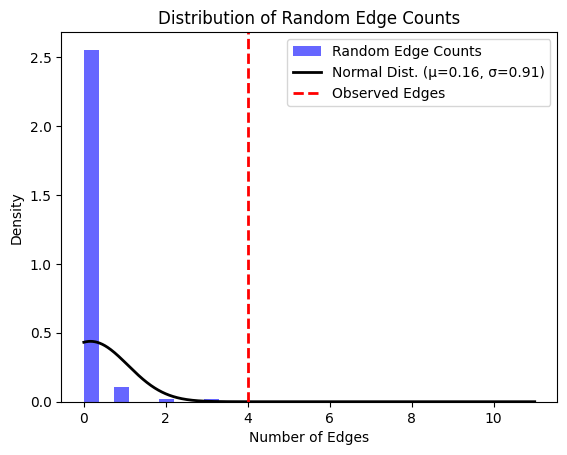

Genes mapped to sinoatrial node disorder: 
sinoatrial node disorder MONDO_0000469
Genes mapped to sinoatrial node disorder: 
['PITX2', 'LINC01438', 'RFX4']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to nervous system benign neoplasm: 
nervous system benign neoplasm MONDO_0000648
Genes mapped to nervous system benign neoplasm: 
['Y_RNA', 'SMLR1', 'BATF', 'RNA5SP472', 'ZNF507', 'GS1', '279B7.1', 'RNU7', '183P', 'TP53']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to Benign Thyroid Gland Neoplasm: 
Benign Thyroid Gland Neoplasm EFO_1000122
Genes mapped to Benign Thyroid Gland Neoplasm: 
['RGL1', 'SYT2', 'PPP1R12B', 'NPAS2', 'C4orf50', 'JAKMIP1', 'RHOH', 'LINC02265', 'PDGFRA', 'PALM2AKAP2', 'LRCH1', 'ADAP2', 'LINC02978']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to benign neoplasm of adrenal gland: 
benign neoplasm of adrenal gland MONDO_0021511
Genes map

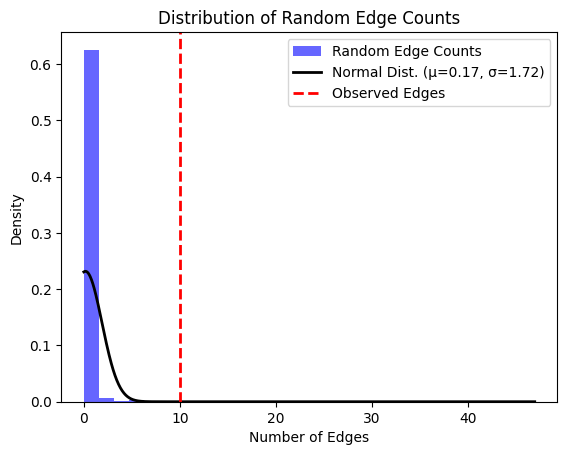

Genes mapped to skin lipoma: 
skin lipoma MONDO_0000964
Genes mapped to skin lipoma: 
['SLC19A2', 'F5', 'ACTRT3']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to lipoma: 
lipoma EFO_0000759
Genes mapped to lipoma: 
['NME7', 'ACTRT3', 'TERT', 'STN1', 'BET1L', 'EXO1']
Random edges calculation completed

z score: 11.706751586290581



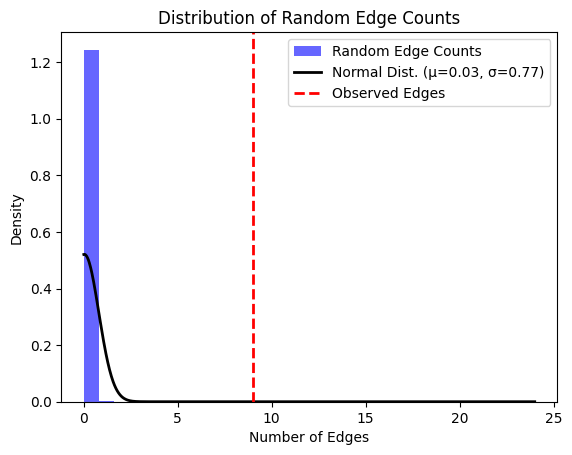

Genes mapped to benign soft tissue neoplasm: 
benign soft tissue neoplasm MONDO_0044335
Genes mapped to benign soft tissue neoplasm: 
['RPL6P5', 'METAP2P1', 'EPHB1', 'MIR4300HG']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to benign neoplasm of skin: 
benign neoplasm of skin MONDO_0021440
Genes mapped to benign neoplasm of skin: 
['CASP8', 'FLACC1', 'SLC45A2', 'CDKN2B', 'AS1', 'TYR', 'ATM', 'DEF8', 'TP53', 'PLA2G6', 'MAFF']
Random edges calculation completed

z score: 61.0436227044626



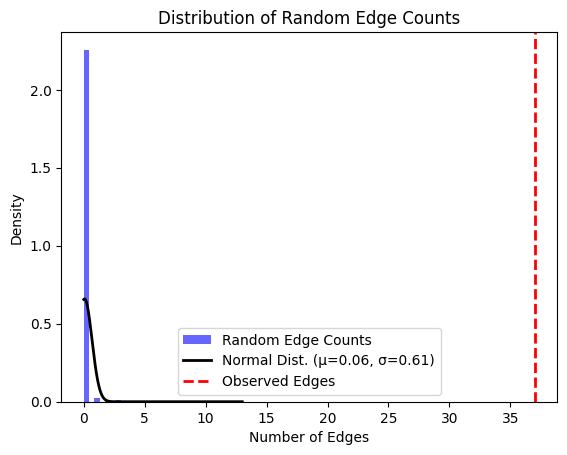

Genes mapped to lymphangioma, hemangioma: 
lymphangioma, hemangioma EFO_1000635
Genes mapped to lymphangioma, hemangioma: 
['CASP8', 'MTERF1', 'AKAP9', 'PCAT1', 'KLHL1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to nontoxic goiter: 
nontoxic goiter MONDO_0001658
Genes mapped to nontoxic goiter: 
['MICOS10', 'NFIA', 'LINC02869', 'RN7SL215P', 'LINC00887', 'TERT', 'SCIRT', 'LINC01603', 'TG', 'STN1', 'PRDM11', 'MSRB3', 'AS1', 'LINC00609', 'MBIP', 'ITPK1', 'FAM227B', 'MAFTRR', 'LINC01229', 'INSR', 'LNCNEF', 'LINC01747', 'FMN2']
Random edges calculation completed

z score: 6.686351767807355



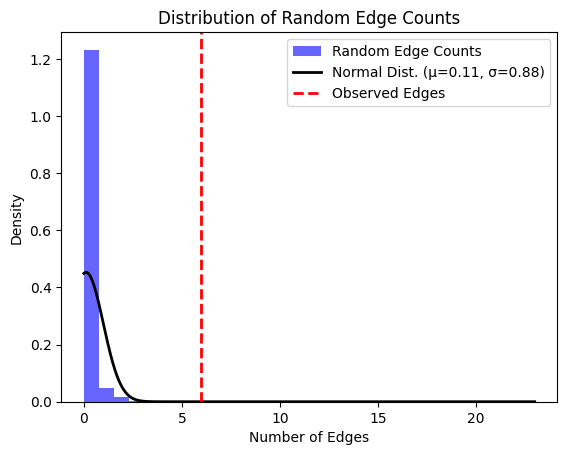

Genes mapped to peritonitis: 
peritonitis EFO_0008588
Genes mapped to peritonitis: 
['KANK4', 'USP1', 'ARHGAP15']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to disorder of appendix: 
disorder of appendix EFO_0009542
Genes mapped to disorder of appendix: 
['LINC01438', 'MIR297', 'MND1', 'TMEM131L', 'FFAR2', 'KRTDAP']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to intermediate coronary syndrome: 
intermediate coronary syndrome EFO_1000985
Genes mapped to intermediate coronary syndrome: 
['LPA', 'CDKN2B', 'AS1', 'PHACTR1', 'CELSR2', 'LPL']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to heart conduction disease: 
heart conduction disease MONDO_0000992
Genes mapped to heart conduction disease: 
['CCDC141', 'LINC01644', 'LINC00898', 'XIRP2', 'LINC02680', 'MKX', 'CEP83', 'LINC03048']
The number of edges in the network is less than the minimum requirement: 4



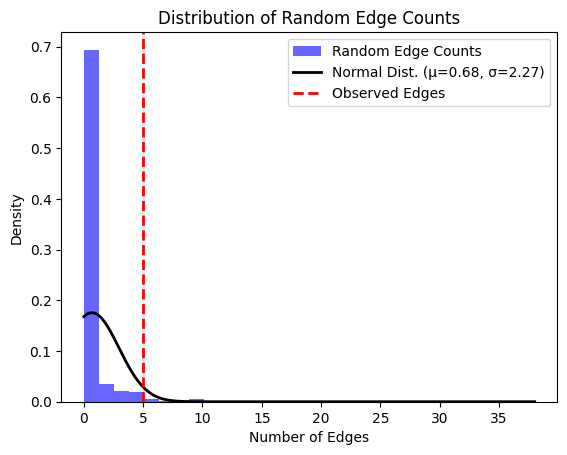

Genes mapped to bilirubin metabolism disease: 
bilirubin metabolism disease MONDO_0024431
Genes mapped to bilirubin metabolism disease: 
['UGT1A12P', 'UGT1A11P', 'TRANK1', 'MDFIC', 'POLR2DP2', 'SNORA25B', 'DPYS', 'MIR548A3', 'SLCO1B1', 'UGT1A6', 'UGT1A4', 'UGT1A8', 'UGT1A3', 'UGT1A7', 'UGT1A10', 'UGT1A9', 'UGT1A5']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to metabolic syndrome X: 
metabolic syndrome X MONDO_0011565
Genes mapped to metabolic syndrome X: 
['CUX1', 'RPSAP1', 'NFATC2']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to cognitive disorder: 
cognitive disorder MONDO_0002039
Genes mapped to cognitive disorder: 
['APOE']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to nervous system disease: 
nervous system disease EFO_0000618
Genes mapped to nervous system disease: 
['APOE', 'CDC5L', 'SUPT3H', 'HHAT', 'NXPH1', 'GAPDHP68']
The number of edges in 

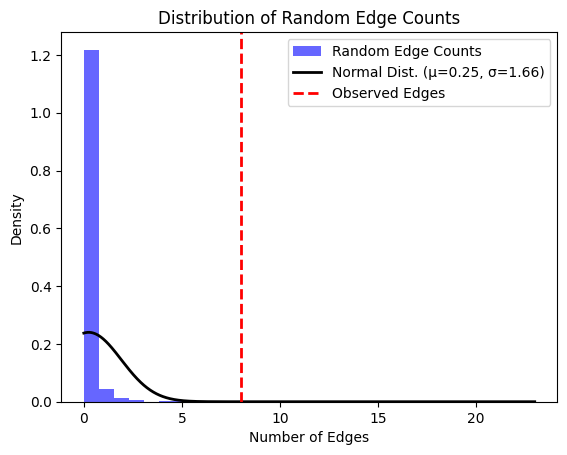

Genes mapped to Epidermal Inclusion Cyst: 
Epidermal Inclusion Cyst EFO_1000243
Genes mapped to Epidermal Inclusion Cyst: 
['FLG', 'CCDST', 'PLCD1', 'TP53', 'DEF8', 'RNY1P8', 'MARK2P12', 'TIPARP', 'AS1', 'LINC01505', 'RNA5SP292', 'ENSA', 'WNT10A', 'IRF4', 'ACTRT3', 'MYNN', 'HDAC9', 'TWIST1', 'MROH3P', 'LYPLAL1', 'DT', 'LINC01937', 'CLPTM1L', 'FADS1', 'FADS2', 'RELA', 'FOXJ2', 'NEK9', 'ZC2HC1C', 'MYL6P5', 'ROCR', 'SIPA1L3', 'RN7SL680P', 'HSPE1P1']
Random edges calculation completed

z score: 9.368573868428689



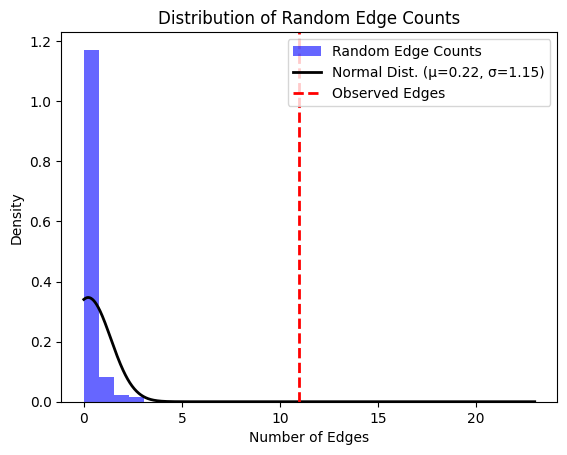

Genes mapped to flatfoot: 
flatfoot EFO_0003874
Genes mapped to flatfoot: 
['UQCC1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to Hammer Toe Syndrome: 
Hammer Toe Syndrome EFO_1001336
Genes mapped to Hammer Toe Syndrome: 
['FTO']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to contracture: 
contracture EFO_0003899
Genes mapped to contracture: 
['WNT7B', 'LANCL1', 'AS1', 'EPHB1', 'RPS23P3', 'RNU6', '699P', 'KCNU1', 'SMARCE1P4']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to bone disease: 
bone disease EFO_0004260
Genes mapped to bone disease: 
['WNT1', 'DDN', 'SFRP4', 'STARD3NL', 'CDC5L', 'SUPT3H', 'MIR4713HG', 'CYP19A1', 'LINC01700', 'RSPO3', 'LINC02341', 'AXIN1', 'FTO', 'PPIAP34', 'ZBTB40', 'FMN2', 'RPS27P4', 'MRPS31P1', 'HLA', 'DRB1', 'DQA1', 'CCDC170', 'SEM1', 'FAM3C', 'COLEC10', 'PPP6R3', 'TCF7L2']
The number of edges in the network is less than th

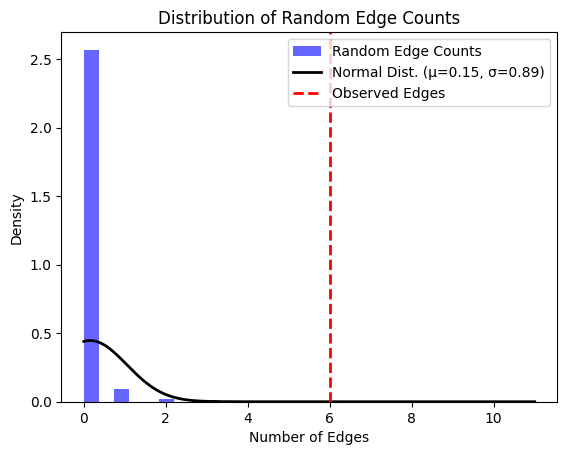

Genes mapped to breast disease: 
breast disease EFO_0009483
Genes mapped to breast disease: 
['PTHLH', 'CCDC91', 'CDH12', 'Y_RNA', 'CAPN14']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to cellulitis, abscess: 
cellulitis, abscess EFO_0003030
Genes mapped to cellulitis, abscess: 
['SLC39A8', 'FTO', 'BNC1', 'NAV1', 'IPO9', 'AS1', 'IPO4', 'ZNF277', 'BCL11B']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to tinea pedis: 
tinea pedis EFO_0007512
Genes mapped to tinea pedis: 
['CCDST', 'HLA', 'DRB1', 'DQA1', 'LY6D', 'ZNF668', 'STAT3']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to dermatophytosis: 
dermatophytosis MONDO_0004678
Genes mapped to dermatophytosis: 
['FLG', 'CCDST', 'HLA', 'DQB1', 'MTCO3P1', 'LYNX1', 'SLURP2', 'LY6D', 'TCF7L2', 'PRSS53', 'FTO', 'SLC25A38P1', 'AIMP1P2', 'ZNF646', 'KANSL1', 'JAKMIP1', 'DT', 'WFS1', 'LINC01865']
The number of edges in 

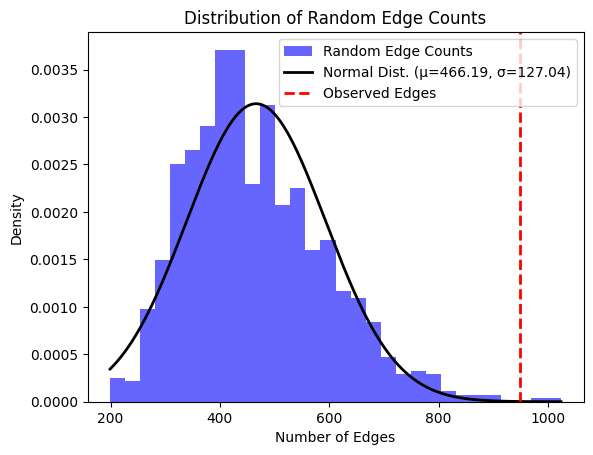

Genes mapped to common variable immunodeficiency: 
common variable immunodeficiency MONDO_0015517
Genes mapped to common variable immunodeficiency: 
['HLA', 'DQB1', 'AS1', 'CLEC16A', 'RPL31P11', 'EOMES', 'LINC01980', 'LINC02865', 'SIMALR', 'MSH5', 'SAPCD1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to gastroparesis: 
gastroparesis EFO_1000948
Genes mapped to gastroparesis: 
['LINC01811', 'LINC02236', 'LINC02196', 'HLA', 'DQA1', 'DQB1', 'DPB1', 'MNX1', 'SNTG1', 'PXDNL', 'CFAP43', 'PRKG1', 'AS1', 'MESP2', 'TRD']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to anemia: 
anemia MONDO_0002280
Genes mapped to anemia: 
['RNF43', 'TSPOAP1', 'AS1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to bruxism: 
bruxism MONDO_0002443
Genes mapped to bruxism: 
['MYO3B']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to Lassa feve

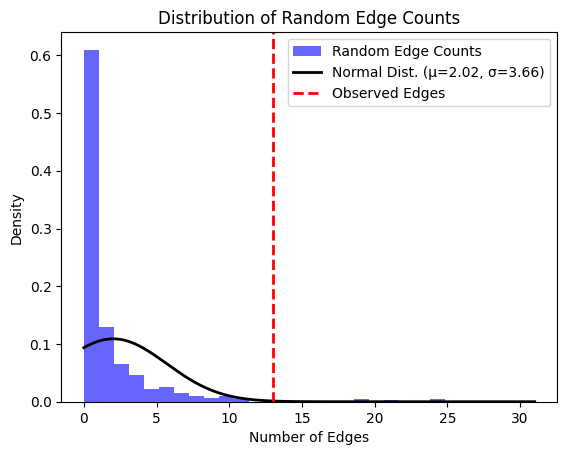

Genes mapped to breast cyst: 
breast cyst EFO_1000848
Genes mapped to breast cyst: 
['CACNA1D']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to rib fracture: 
rib fracture EFO_0009620
Genes mapped to rib fracture: 
['TENM2']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to fibromuscular dysplasia: 
fibromuscular dysplasia EFO_1000938
Genes mapped to fibromuscular dysplasia: 
['PHACTR1', 'LRP1', 'LIMA1', 'ATP2B1', 'LINC01470', 'RPSAP48', 'NDUFB9P3', 'MTUS2', 'LNX1', 'RPL21P44', 'SVIL', 'NSF', 'Y_RNA', 'LINC02409', 'FAM184A', 'RN7SKP167', 'FGFR2', 'FRMPD2', 'RERGL', 'CDKN2B', 'AS1', 'EPHX1', 'ZMAT4', 'SLC24A3', 'MAP3K7', 'MIR4643', 'UFL1', 'FHL5', 'ZNF827', 'SLC25A3P1', 'DMRTB1', 'NUS1P2', 'HMGA1P6', 'TBX21', 'MIR4299', 'MIR8070', 'FRMD3', 'LINC02534', 'FRK', 'CARMIL1', 'TJP2', 'STN1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to cystic fibrosis-related di

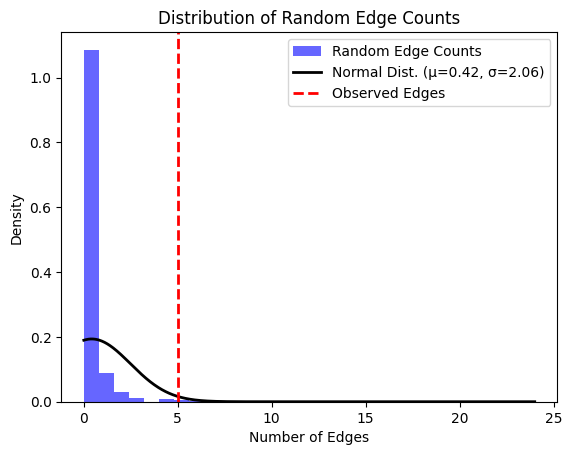

Genes mapped to pregnancy disorder: 
pregnancy disorder EFO_0009682
Genes mapped to pregnancy disorder: 
['HELZ2', 'GMEB2', 'ZSCAN2', 'AS1', 'MAST4', 'TRMU', 'SLC1A3', 'PURPL', 'LINC02103', 'LINC02359', 'GPR84', 'CCDC91', 'LINC00940', 'SMIM8', 'RPSAP72', 'TENT5A', 'NFKBIL1', 'TMEM178B', 'RPL35AP19', 'HAS2', 'GSK3B', 'DT', 'RELN', 'ALCAM', 'LSAMP', 'LINC03051', 'LINC00398', 'MB21D2', 'OBI1', 'GNG4', 'LINC01031', 'RPL23AP22', 'HOPX', 'DTHD1', 'CHIC2', 'MORF4L2P1', 'PROM1', 'TAPT1', 'ARHGAP16P', 'LINC02307', 'SLC25A21', 'NYNRIN', 'SERPINA12', 'TBPL2', 'LINC00520', 'PELI2', 'RNASE1', 'RNASE3', 'RPL6P32', 'RNA5SP199', 'FAM174A', 'RGMA', 'RN7SKP60', 'RPL21P59', 'ANKDD1A', 'CDH12', 'IGLVIV', '65', '64', 'FBLN1', 'LAMA2', 'DEFB112', 'TFAP2D', 'CASC15', 'NBAT1', 'GRIK2', 'R3HDM2P2', 'KIAA1328', 'CDH3', 'RNU4', '66P', 'RIMS1', 'SESN1', 'GMPR', 'OTOGL', 'KSR2', 'ZNF775', 'LINC00996', 'SYNDIG1', 'LINC02967', 'GK5', 'XRN1', 'TAFA1', 'MDFIC2', 'SAMMSON', 'GPALPP1', 'NALF1', 'CARTPT', 'MAP1B', 'HSPD1

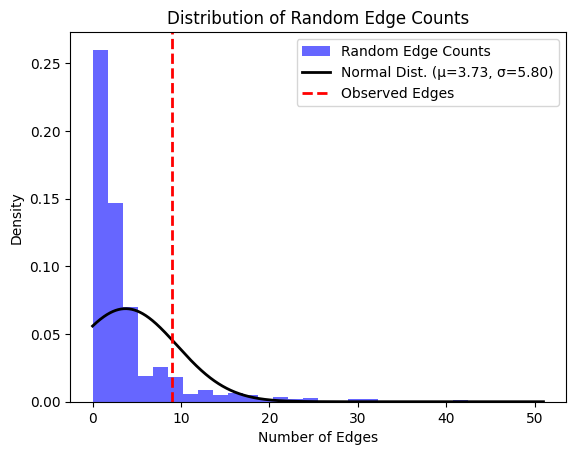

Genes mapped to duodenitis: 
duodenitis MONDO_0004627
Genes mapped to duodenitis: 
['ABCG8', 'HLA', 'DQB1', 'LINC02416', 'TBX19', 'HPRT1P2', 'RPL19P11', 'LINC01419', 'TPM3P3', 'TBC1D2', 'GABBR2', 'CORO7', 'PAM16', 'TRERNA1', 'PEDS1', 'UBE2V1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to esophageal ulcer: 
esophageal ulcer MONDO_0044782
Genes mapped to esophageal ulcer: 
['CRLF1', 'YBX1', 'CLDN19', 'SPATS2L', 'CLNK', 'GAPDHP56', 'RNU6', '224P', 'LINC01060', 'ELF2P2', 'FOXCUT', 'SAMD5', 'SASH1', 'SOD2', 'WTAP', 'TECTA', 'TRPC6P5', 'TRHDE', 'LINC00540', 'ATP6V1G1P7', 'RPL7P45', 'LINC02315', 'TLN2', 'TPM1', 'AS', 'ALPK3', 'ASIC2', 'PA2G4P3', 'CDH2']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to lichen planus: 
lichen planus EFO_1000726
Genes mapped to lichen planus: 
['IL18RAP', 'SLC9A4', 'FAP', 'IFIH1', 'FOXP1', 'ST3GAL6', 'AS1', 'LPP', 'TET2', 'ERAP2', 'RGS14', 'HLA', 'DQA1', 'DQB1', 'CEP43', 'T

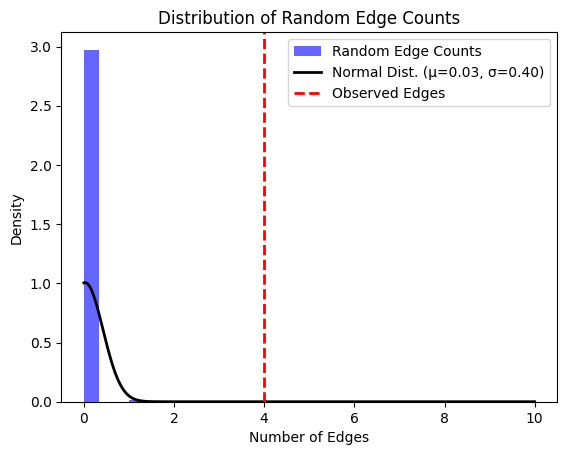

Genes mapped to feeling miserable measurement: 
feeling miserable measurement EFO_0009598
Genes mapped to feeling miserable measurement: 
['SORCS3', 'LINC02627', 'LINC02624', 'BMAL1', 'LGR4', 'AS1', 'LIN7C', 'BDNF', 'AS', 'CSTPP1', 'NR1H3', 'SPI1', 'MTCH2', 'AGBL2', 'NUP160', 'PTPRJ', 'CNTN5', 'NCAM1', 'DRD2', 'TMPRSS5', 'MYO1H', 'LINGO1', 'PAFAH1B1', 'CLUH', 'PIGL', 'MED24', 'MAPT', 'KANSL1', 'MAPK8IP1P1', 'ARL17B', 'UBXN2A', 'VRK2', 'FANCL', 'EIF3FP3', 'LINC01795', 'LINC01122', 'RNA5SP106', 'ACVR2A', 'RNU6', '1001P', 'MTCO1P45', 'DLX2', 'DT', 'FECHP1', 'KRT8P18', 'KLHDC8B', 'ACTL11P', 'MST1R', 'LINC01990', 'BBX', 'LSAMP', 'BLTP1', 'IL2', 'IL21', 'MIR9', '2HG', 'SCAND3', 'LINC03003', 'GABBR1', 'LINC02571', 'HLA', 'B', 'MAD1L1', 'DLGAP2', 'LINC01239', 'SUMO2P2', 'NSF', 'CELF4', 'MIR4318', 'DCC', 'RERE', 'KLHL20', 'RC3H1', 'RPL30P1', 'RABGAP1L', 'CACYBP', 'CRB1', 'ATAD2B']
Random edges calculation completed

z score: 1.4398288737006195



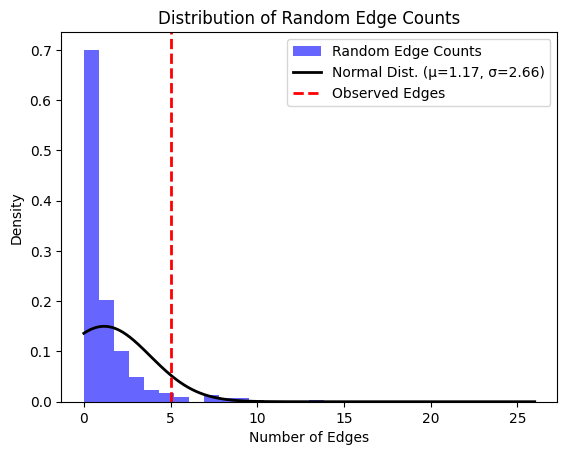

Genes mapped to guilt measurement: 
guilt measurement EFO_0009595
Genes mapped to guilt measurement: 
['LINC02210', 'CRHR1', 'MAPT', 'KANSL1', 'ARL17B', 'WNT3', 'PRKCA', 'SLC17A1', 'H2BC7', 'H3C9P', 'BTN3A2', 'HNRNPA1P1', 'CD83P1', 'RPL8P1', 'LINC01012', 'H2BC15', 'ZSCAN16', 'AS1', 'ZKSCAN4', 'TRIM39', 'RPP21', 'LIN28B', 'CELF4', 'ELAVL2', 'ASTN2', 'RPL35AP22', 'BMAL1', 'TTC12', 'DRD2', 'TMPRSS5', 'FTLP18', 'GRIK3', 'LINC02923', 'KLHL29', 'ATAD2B', 'UBXN2A', 'CNTNAP5']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to irritability measurement: 
irritability measurement EFO_0009594
Genes mapped to irritability measurement: 
['FBXL17', 'LINC01023', 'PRDX2P4', 'SIM1', 'AUTS2', 'FOXP2', 'MDFIC', 'MSRA', 'RNA5SP272', 'RLIG1P3', 'RPSAP74', 'DPYS', 'MIR548A3', 'ZFPM2', 'TLR4', 'TPT1P9', 'CFAP77', 'ITCH', 'PIGU', 'NCOA6', 'GSS', 'LINC00709', 'HSP90AB7P', 'LINC02663', 'LINC02670', 'CHADL', 'RANGAP1', 'ELP4', 'PAX6', 'TMEM258', 'MYO1H', 'MVK', 'LINC02335

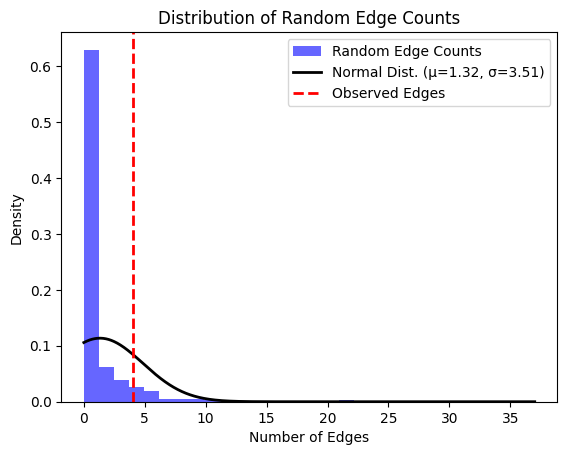

Genes mapped to feeling nervous measurement: 
feeling nervous measurement EFO_0009597
Genes mapped to feeling nervous measurement: 
['TRPC4AP', 'DSCAM', 'CNNM2', 'NT5C2', 'SORCS3', 'LINC02627', 'Y_RNA', 'ACTBP15', 'ZC3H7B', 'BDNF', 'AS', 'MADD', 'CTAGE16P', 'DNAJA1P1', 'LINC00364', 'AREL1', 'DLST', 'LINC02288', 'LINC02289', 'MGA', 'INO80E', 'STAG1', 'DT', 'SNCA', 'IRF4', 'LINC03003', 'LINC02571', 'HLA', 'B', 'DDAH2', 'SNHG32', 'NEU1', 'ATF6B', 'NOTCH4', 'TSBP1', 'AS1', 'DQB1', 'MTCO3P1', 'MMS22L', 'MIR2113', 'EIF4EBP2P3', 'POU3F2', 'PPP1R14BP5', 'CENPW', 'MIR588', 'CACNA2D1', 'TAC1', 'ASNS', 'CSMD1', 'SNORA70', 'TSNARE1', 'DENND1A', 'RALY', 'ITCH', 'PIGU', 'NCOA6', 'ZCCHC14', 'NF1', 'PLEKHM1', 'LRRC37A4P', 'LINC02210', 'CRHR1', 'MAPK8IP1P1', 'ARL17B', 'NSF', 'CELF4', 'MIR4318', 'NFIA', 'DPYD', 'MIR137HG', 'DNAH14', 'TMEM182', 'CRLF3P1', 'CAPZBP1', 'LINC01965', 'MBD5', 'TWF2', 'PBRM1', 'ITIH1', 'CADM2']
Random edges calculation completed

z score: 0.9197012475731255



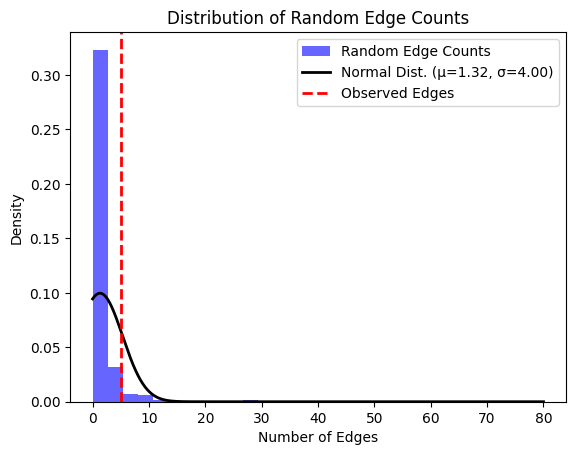

Genes mapped to feeling "fed-up" measurement: 
feeling "fed-up" measurement EFO_0009588
Genes mapped to feeling "fed-up" measurement: 
['CADM2', 'IGBP1P5', 'RN7SL101P', 'BLTP1', 'IL2', 'IL21', 'LINC02899', 'HCN1', 'EMB', 'RPS27AP14', 'RNA5SP279', 'TLR4', 'TPT1P9', 'PPIAP21', 'RNU6', '743P', 'STK4', 'LINC02627', 'LINC02624', 'LRP4', 'CSTPP1', 'DDB2', 'GRM5P1', 'GTF2IP11', 'PHKG1P3', 'SEPTIN7P11', 'LINC02750', 'OR4C50P', 'OR4A6P', 'TRIM48', 'OR4C46', 'OR4C7P', 'LINC02335', 'DCAF5', 'EXD2', 'YLPM1', 'PROX2', 'DLST', 'LOXL1', 'AS1', 'CPEB1', 'CTU2', 'LINC02210', 'CRHR1', 'MAPT', 'KANSL1', 'ARL17B', 'NSF', 'CELF4', 'MIR4318', 'RPL12P40', 'RN7SKP182', 'DCC', 'TCF4', 'LINC01415', 'DPY19L3', 'DT', 'GNG12', 'KLHL29', 'ATAD2B', 'UBXN2A', 'FAM228A', 'ITSN2', 'ABI2', 'ERBB4', 'VWC2L', 'ENSAP3', 'PLCL2', 'U3', 'LARS2', 'DAG1', 'BSN', 'RNF123', 'LINC02027']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to feeling emotionally hurt measurement: 
feeling emoti

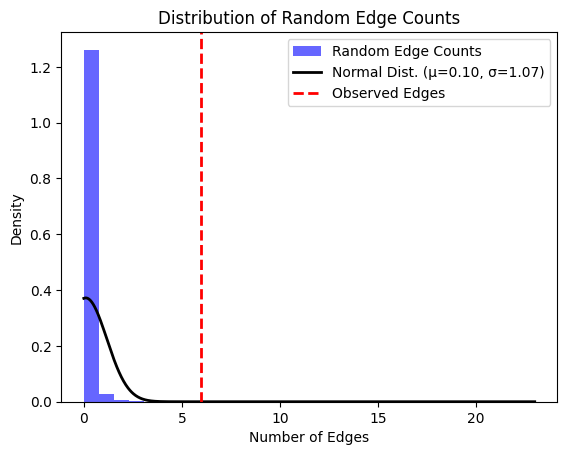

Genes mapped to soft tissue disease: 
soft tissue disease EFO_0009470
Genes mapped to soft tissue disease: 
['PLSCR1', 'RNU6', '428P', 'LIMCH1', 'PRMT9', 'ARHGAP10', 'RNU1', '76P', 'LINC02226', 'CLIC5', 'NUGGC', 'PCSK5', 'HIF1AN', 'Metazoa_SRP', 'SLCO1B3', 'SLCO1B7', 'SLCO1B1', 'ARGLU1', 'DT', 'PPIAP24', 'DAD1', 'HISLA', 'ATF7IP2']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to rheumatic disease: 
rheumatic disease EFO_0005755
Genes mapped to rheumatic disease: 
['LINC02772', 'FCRL5', 'FHIT', 'PTPRG', 'MDN1', 'ROBO2P1', 'RN7SL292P', 'ACADSB', 'HMX3', 'RBL2', 'WWOX', 'SDK2', 'CBX4', 'LINC01979']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to sialolithiasis: 
sialolithiasis EFO_1001180
Genes mapped to sialolithiasis: 
['KANK3', 'ANGPTL4', 'ERG', 'WARS2', 'ADD2', 'EIF2AK3', 'ATG4B', 'FECHP1', 'KRT8P18', 'EPHB1', 'PDLIM5', 'BMPR1B', 'DT', 'LINC02500', 'TENM3', 'AS1', 'HSPD1P15', 'CDH18', 'PRKN', 'PER3

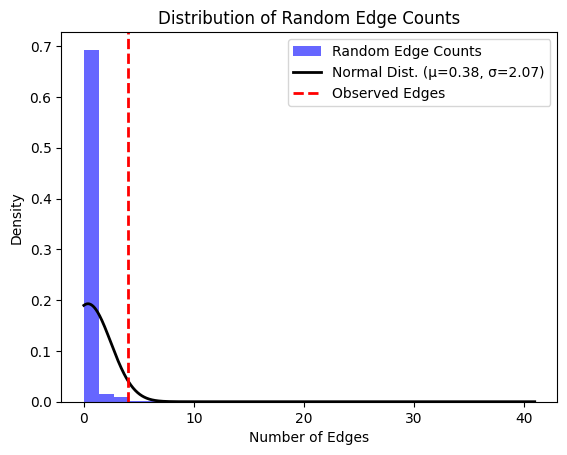

Genes mapped to oral mucosa leukoplakia: 
oral mucosa leukoplakia MONDO_0004844
Genes mapped to oral mucosa leukoplakia: 
['MICA', 'AS1', 'RNU6', '1197P', 'JPH1', 'TRHDE', 'LINC02444', 'LINC01550', 'LINC02295', 'ARLNC1', 'CMC2', 'LASP1']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to exostosis: 
exostosis MONDO_0002181
Genes mapped to exostosis: 
['RGS21', 'RGS1', 'DENND1B', 'OR2T2', 'OR2T3', 'PLB1', 'LRRTM4', 'RPL38P2', 'LNPK', 'EVX2', 'AOX2P', 'MFF', 'KCTD8', 'NUP58P1', 'TMEM248P1', 'LINC02997', 'RPSAP37', 'LINC02039', 'ELOVL5', 'CRYBG1', 'RNU7', '152P', 'MIR1202', 'PRKN', 'SDK1', 'NXPH1', 'GAPDHP68', 'DDC', 'DNAJB9', 'LINC02903', 'LINC03019', 'LINC01301', 'MITA1', 'RPL3P9', 'ZFPM2', 'LINC02873', 'LINC00941', 'CAPRIN2', 'PCDH9', 'LINC00540', 'FTH1P7', 'NDRG2', 'TPPP2', 'PWRN1', 'NETO1', 'GSTT4', 'CABIN1', 'LINC02819']
The number of edges in the network is less than the minimum requirement: 4

Genes mapped to sialadenitis: 
sialadenitis EFO

In [9]:
noncancerous, not_included = compute_clustering(noncancers, "data/noncancerous_clustering_biogrid.csv", 'biogrid')

In [ ]:
len(not_included)

In [ ]:
len(noncancerous)

In [ ]:
df_noncancer = pd.read_csv('data/noncancerous_clustering.csv')
print(df_noncancer.head)
df_noncancer.shape

In [ ]:
for d in noncancers:
    if d not in not_included and d['name'] not in df_noncancer['name'].values:
        disease = Disease(d['name'], d['efoID'])
        result = disease.run()

In [ ]:
def remove_nones(l):
    none_output = []
    to_remove = []  # Keep track of indices or items to remove

    for d in l:
        try:
            disease = Disease(d['name'], d['efo_id'])
            
            # Continue looping until the z_score is no longer infinity
            while d['z_score'] == float('inf'):
                result = disease.quantify_clustering()
                
                # If result is invalid, add to none_output and mark for removal
                if result is None or len(result) != 2 or any(r is None for r in result):
                    none_output.append({'name': d['name'], 'efoID': d['efo_id']})
                    to_remove.append(d)
                    break  # Break out of while loop to go to the next item

                num_edges, z_score = result
                d['num_edges'] = num_edges
                d['z_score'] = z_score
            
            # If num_edges is 1, remove the item
            if d['num_edges'] == 1:
                none_output.append({'name': d['name'], 'efoID': d['efo_id']})
                to_remove.append(d)

        except Exception as e:
            print(f"Error processing {d['name']}: {e}")
    
    # Filter out the items to be removed
    l = [d for d in l if d not in to_remove]
    
    return l, none_output


In [ ]:
cancers, cancers_nones = remove_nones(cancers_names)
print(len(cancers))
print(cancers_nones)

In [ ]:
print(len(noncancers_names))
noncancers, noncancers_nones = remove_nones(noncancers_names)
print(len(noncancers))
print(noncancers_nones)